# Pytorch

In [6]:
import torch
from torch.utils import data
from model import Model
import os
from PIL import Image 
import numpy as np
from torchvision import transforms
import random
import matplotlib.pyplot as plt
import cv2
import glob
import pandas as pd

In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = Model().to(device)
checkpoint = torch.load(os.path.join('./', 'checkpoint_best.pth'))

In [8]:
model.load_state_dict(checkpoint['model'])

In [9]:
data_transforms = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_11_3_6_36.jpg


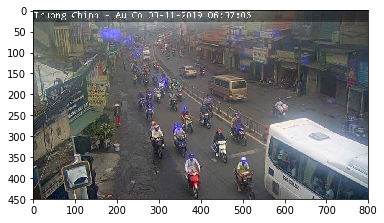

predict within threshold:  39.359737
predict without:  34.735111236572266
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_30_7_21.jpg


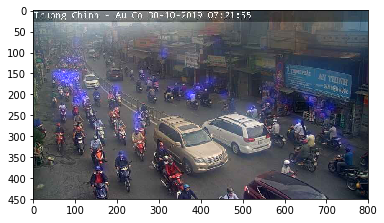

predict within threshold:  59.090233
predict without:  53.20013427734375
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_30_12_6.jpg


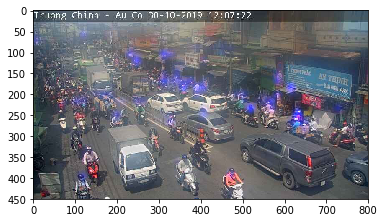

predict within threshold:  47.34002
predict without:  42.30364990234375
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_24_11_3.jpg


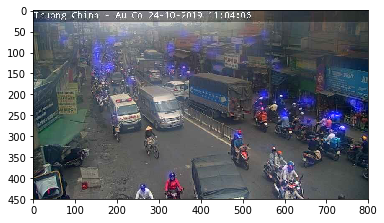

predict within threshold:  59.241997
predict without:  51.969303131103516
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_21_8_25.jpg


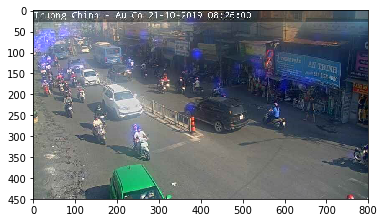

predict within threshold:  44.694233
predict without:  36.58240509033203
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_25_6_9.jpg


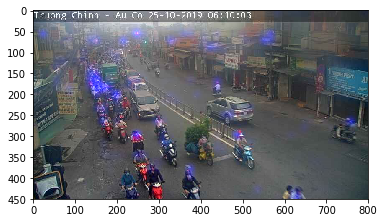

predict within threshold:  53.00249
predict without:  47.445899963378906
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_24_11_25.jpg


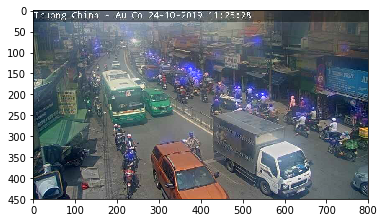

predict within threshold:  56.40918
predict without:  50.810272216796875
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_31_9_27.jpg


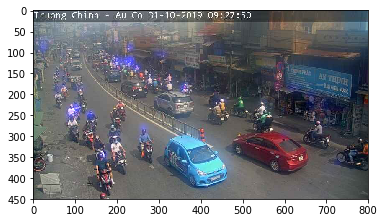

predict within threshold:  36.226208
predict without:  31.268203735351562
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_11_3_7_13.jpg


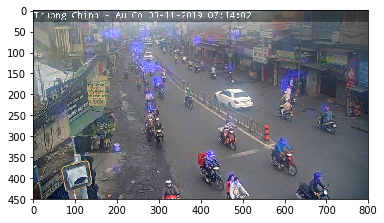

predict within threshold:  50.51108
predict without:  44.55797576904297
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_15_15_58.jpg


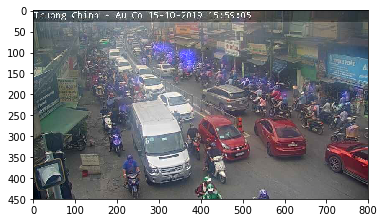

predict within threshold:  53.096657
predict without:  46.476409912109375
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_17_6_20.jpg


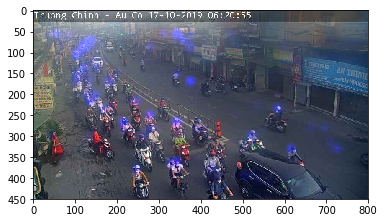

predict within threshold:  57.288475
predict without:  51.03078079223633
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_11_3_11_54.jpg


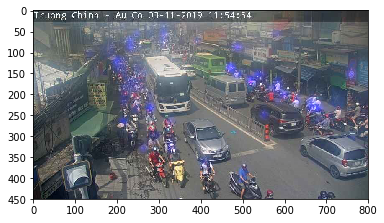

predict within threshold:  52.281723
predict without:  47.85326385498047
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_27_6_27.jpg


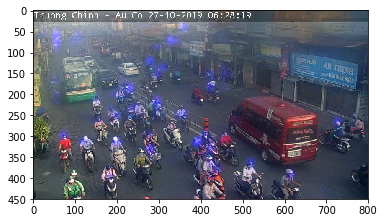

predict within threshold:  53.016304
predict without:  48.11259841918945
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_11_2_11_11.jpg


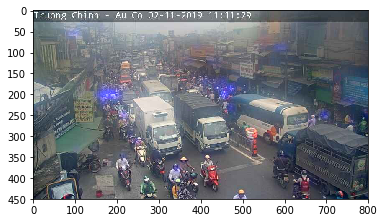

predict within threshold:  61.86409
predict without:  56.121055603027344
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_29_15_52.jpg


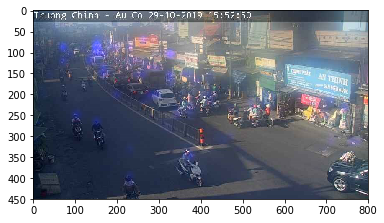

predict within threshold:  48.26759
predict without:  42.359947204589844
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_18_12_35.jpg


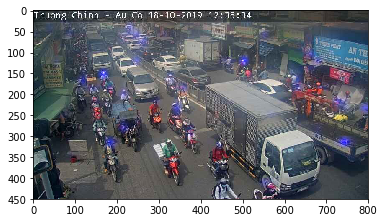

predict within threshold:  41.528175
predict without:  36.169471740722656
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_19_7_4.jpg


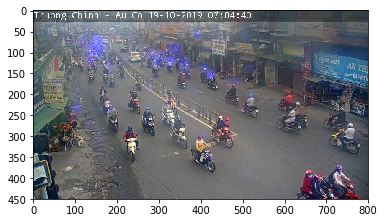

predict within threshold:  50.029278
predict without:  43.00533676147461
/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_18_12_56.jpg


KeyboardInterrupt: 

In [10]:
for file in  glob.glob("/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/*"):
    print(file)
    image = Image.open(file).convert('RGB')
    image_tensor = data_transforms(image)
    image_tensor = image_tensor.unsqueeze(0)
    image_tensor = image_tensor.to(device)
    with torch.no_grad():
        predict = model(image_tensor)
    heatmap = np.array(predict.to('cpu'))
    heatmap = heatmap[0,0,:,:]
    image_size = np.array(image).shape
    heatmap = np.expand_dims(heatmap,axis=2)
    heatmap = np.concatenate((heatmap,heatmap,heatmap),axis=2)
    heatmap = cv2.resize(heatmap,(image_size[1],image_size[0]))
    plt.imshow(np.clip((np.where(heatmap>=0,heatmap,0)/np.max(heatmap)*np.array([0,0,255])+np.array(image)),0,255).astype(np.uint8))
    plt.show()
    heatmap = np.array(predict.to('cpu'))
    print("predict within threshold: ",np.sum(np.where(heatmap>0.0,heatmap,0)))
    print("predict without: ", predict.sum().item())
    print("==================================================")


# TF

In [1]:
from PIL import Image
import sys
import os
import urllib
import matplotlib
matplotlib.use('Agg')
import matplotlib.patches as patches
import tensorflow as tf
import numpy as np
import time
import glob
import time
import cv2
import json
%matplotlib inline
sys.path.append('/home/duyle/Desktop/Duy/deep_stream/tf_trt_models/tf_trt_models/')
from detection import download_detection_model, build_detection_graph

def load_pb(pb_path):
    """Load the TF graph from the pre-build pb file."""
    print('------------- Load the TF graph from the pre-build pb file: {} -------------'.format(pb_path))
    start_time = time.time()
    graph_def = tf.GraphDef()
    with tf.gfile.GFile(pb_path, 'rb') as pf:
        graph_def.ParseFromString(pf.read())
    
    stop_time = time.time()
    print('------------- Load time: {0:.2f} sec'.format(stop_time - start_time))
    return graph_def
input_names=['image_tensor']
output_names=['detection_boxes', 'detection_classes', 'num_detections','detection_scores']
print(input_names)
print(output_names)

W1107 17:14:52.503845 139670000006912 deprecation_wrapper.py:119] From /home/duyle/Desktop/Duy/deep_stream/tf_serving/models/research/slim/nets/inception_resnet_v2.py:373: The name tf.GraphKeys is deprecated. Please use tf.compat.v1.GraphKeys instead.

W1107 17:14:52.512220 139670000006912 deprecation_wrapper.py:119] From /home/duyle/Desktop/Duy/deep_stream/tf_serving/models/research/slim/nets/mobilenet/mobilenet.py:397: The name tf.nn.avg_pool is deprecated. Please use tf.nn.avg_pool2d instead.



['image_tensor']
['detection_boxes', 'detection_classes', 'num_detections', 'detection_scores']


In [2]:
def py_cpu_nms(dets, thresh):
    x1 = dets[:, 0]
    y1 = dets[:, 1]
    x2 = dets[:, 2]
    y2 = dets[:, 3]
    scores = dets[:, 4]

    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    order = scores.argsort()[::-1]

    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(i)
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0.0, xx2 - xx1 + 1)
        h = np.maximum(0.0, yy2 - yy1 + 1)
        inter = w * h
        ovr = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(ovr <= thresh)[0]
        order = order[inds + 1]

    return keep

In [3]:
frozen_graph_dir = './ssd_resnet50_v1_fpn_shared_box_predictor_640x640_coco14_sync_2018_07_03/frozen_inference_graph_ssd_fpn.pb'
#frozen_graph_dir = '/disk2/Khang-ASD-crowd-counting/frozen_inference_graph_mask.pb'

config_path = './ssd_resnet50_v1_fpn_shared_box_predictor_640x640_coco14_sync_2018_07_03/pipeline.config'
checkpoint_path = './ssd_resnet50_v1_fpn_shared_box_predictor_640x640_coco14_sync_2018_07_03/model.ckpt'
frozen_graph, input_names, output_names = build_detection_graph(
    config=config_path,
    checkpoint=checkpoint_path,
    score_threshold=0.1,
    batch_size=1
)

In [4]:
frozen_graph = load_pb(frozen_graph_dir)

------------- Load the TF graph from the pre-build pb file: ./ssd_resnet50_v1_fpn_shared_box_predictor_640x640_coco14_sync_2018_07_03/frozen_inference_graph_ssd_fpn.pb -------------
------------- Load time: 0.20 sec


In [5]:
THRES_SCORE = 0.0
THRES_BOX   = 0.8
THRES_NMS   = 0.8
count_image = 0

In [10]:
INPUT_NAME = 'image_tensor'
BOXES_NAME = 'detection_boxes'
CLASSES_NAME = 'detection_classes'
SCORES_NAME = 'detection_scores'
MASKS_NAME = 'detection_masks'
NUM_DETECTIONS_NAME = 'num_detections'
tf_config = tf.ConfigProto()
tf_config.gpu_options.per_process_gpu_memory_fraction = 0.5
with tf.Graph().as_default() as tf_graph:
    with tf.Session(config=tf_config) as tf_sess:
        tf.import_graph_def(frozen_graph, name='')
        tf_input = tf_graph.get_tensor_by_name(INPUT_NAME + ':0')
        tf_boxes = tf_graph.get_tensor_by_name(BOXES_NAME + ':0')
        tf_classes = tf_graph.get_tensor_by_name(CLASSES_NAME + ':0')
        tf_scores = tf_graph.get_tensor_by_name(SCORES_NAME + ':0')
        tf_num_detections = tf_graph.get_tensor_by_name(
            NUM_DETECTIONS_NAME + ':0')
        dir_postman = '/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/'
        #for file in glob.glob("/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/*"):
        for camera_name in os.listdir(dir_postman):
            camera_list_all = []
            camera_dir = dir_postman+camera_name+'/'
            for file_name in os.listdir(camera_dir):
                file = camera_dir+file_name
                count_image = count_image + 1
                camera = [file,0,0,0,0,0,0,0,0]
                try:

                    image_Pillow = Image.open(file).convert('RGB')
                    image = np.array(image_Pillow)
                    scores, boxes, classes, num_detections = tf_sess.run([tf_scores, tf_boxes, tf_classes, tf_num_detections], feed_dict={
                    tf_input: image[None, ...]})

                    boxes = boxes[0] 
                    scores = scores[0]
                    classes = classes[0]
                    num_detections = int(num_detections[0])
                    #================================ preprocessing nms
                    boxes_temp = boxes[0:num_detections,:]
                    scores_temp = scores[0:num_detections]
                    classes_temp = classes[0:num_detections]
                    classes_temp = np.where( classes_temp==4, 1, classes_temp )
                    #================================ computing the number for each classes
                    index = np.argwhere(classes_temp>8)
                    classes_temp = np.delete(classes_temp, index)
                    boxes_temp  = np.delete(boxes_temp, index, axis = 0 )
                    scores_temp = np.delete(scores_temp, index)
                    dect_classes = set(classes_temp)
                    for dect_class in dect_classes:

                        where_is_classes = np.where(classes_temp==dect_class)
                        dect_boxes  = boxes_temp[where_is_classes]
                        dect_scores = scores_temp[where_is_classes]
                        dect_scores = dect_scores.reshape((-1,1))

                        dets = np.concatenate((dect_boxes,dect_scores),axis=1)
                        dect_index = py_cpu_nms(dets,THRES_NMS)
                        camera[int(dect_class)] = len(dect_index)
                    image_tensor = data_transforms(image_Pillow)
                    image_tensor = image_tensor.unsqueeze(0)
                    image_tensor = image_tensor.to(device)
                    with torch.no_grad():
                        predict = model(image_tensor)   
                    total_motobike = round(predict.sum().item())
                    #print("predict person count without: ", total_motobike)https://192.168.1.52:8888/notebooks/Final_run.ipynb#
                    camera[1] = total_motobike
                    print("Frame: ",count_image)
                    camera_list_all.append(camera)
                    del camera
                    #print(camera_list_all)
                    #print("==================================================")

                except:
                    print("Error!!!!!")
            column_name = ['filename', '1', '2', '3', '4', '5', '6', '7', '8']
            new_list = pd.DataFrame(camera_list_all, columns=column_name)
            new_list.to_csv(camera_name+'.csv', index=None)
            del new_list, camera_list_all

Frame:  1
Frame:  2
Frame:  3
Frame:  4
Frame:  5
Frame:  6
Frame:  7
Frame:  8
Frame:  9
Frame:  10
Frame:  11
Frame:  12
Frame:  13
Frame:  14
Frame:  15
Frame:  16
Frame:  17
Frame:  18
Frame:  19
Frame:  20
Frame:  21
Frame:  22
Frame:  23
Frame:  24
Frame:  25
Frame:  26
Frame:  27
Frame:  28
Frame:  29
Frame:  30
Frame:  31
Frame:  32
Frame:  33
Frame:  34
Frame:  35
Frame:  36
Frame:  37
Frame:  38
Frame:  39
Frame:  40
Frame:  41
Frame:  42
Frame:  43
Frame:  44
Frame:  45
Frame:  46
Frame:  47
Frame:  48
Frame:  49
Frame:  50
Frame:  51
Frame:  52
Frame:  53
Frame:  54
Frame:  55
Frame:  56
Frame:  57
Frame:  58
Frame:  59
Frame:  60
Frame:  61
Frame:  62
Frame:  63
Frame:  64
Frame:  65
Frame:  66
Frame:  67
Frame:  68
Frame:  69
Frame:  70
Frame:  71
Frame:  72
Frame:  73
Frame:  74
Frame:  75
Frame:  76
Frame:  77
Frame:  78
Frame:  79
Frame:  80
Frame:  81
Frame:  82
Frame:  83
Frame:  84
Frame:  85
Frame:  86
Frame:  87
Frame:  88
Frame:  89
Frame:  90
Frame:  91
Frame:  

Frame:  694
Frame:  695
Frame:  696
Frame:  697
Frame:  698
Frame:  699
Frame:  700
Frame:  701
Frame:  702
Frame:  703
Frame:  704
Frame:  705
Frame:  706
Frame:  707
Frame:  708
Frame:  709
Frame:  710
Frame:  711
Frame:  712
Frame:  713
Frame:  714
Frame:  715
Frame:  716
Frame:  717
Frame:  718
Frame:  719
Frame:  720
Frame:  721
Frame:  722
Frame:  723
Frame:  724
Frame:  725
Frame:  726
Frame:  727
Frame:  728
Frame:  729
Frame:  730
Frame:  731
Frame:  732
Frame:  733
Frame:  734
Frame:  735
Frame:  736
Frame:  737
Frame:  738
Frame:  739
Frame:  740
Frame:  741
Frame:  742
Frame:  743
Frame:  744
Frame:  745
Frame:  746
Frame:  747
Frame:  748
Frame:  749
Frame:  750
Frame:  751
Frame:  752
Frame:  753
Frame:  754
Frame:  755
Frame:  756
Frame:  757
Frame:  758
Frame:  759
Frame:  760
Frame:  761
Frame:  762
Frame:  763
Frame:  764
Frame:  765
Frame:  766
Frame:  767
Frame:  768
Frame:  769
Frame:  770
Frame:  771
Frame:  772
Frame:  773
Frame:  774
Frame:  775
Frame:  776
Fram

Frame:  1349
Frame:  1350
Frame:  1351
Frame:  1352
Frame:  1353
Frame:  1354
Frame:  1355
Frame:  1356
Frame:  1357
Frame:  1358
Frame:  1359
Frame:  1360
Frame:  1361
Frame:  1362
Frame:  1363
Frame:  1364
Frame:  1365
Frame:  1366
Frame:  1367
Frame:  1368
Frame:  1369
Frame:  1370
Frame:  1371
Frame:  1372
Frame:  1373
Frame:  1374
Frame:  1375
Frame:  1376
Frame:  1377
Frame:  1378
Frame:  1379
Frame:  1380
Frame:  1381
Frame:  1382
Frame:  1383
Frame:  1384
Frame:  1385
Frame:  1386
Frame:  1387
Frame:  1388
Frame:  1389
Frame:  1390
Frame:  1391
Frame:  1392
Frame:  1393
Frame:  1394
Frame:  1395
Frame:  1396
Frame:  1397
Frame:  1398
Frame:  1399
Frame:  1400
Frame:  1401
Frame:  1402
Frame:  1403
Frame:  1404
Frame:  1405
Frame:  1406
Frame:  1407
Frame:  1408
Frame:  1409
Frame:  1410
Frame:  1411
Frame:  1412
Frame:  1413
Frame:  1414
Frame:  1415
Frame:  1416
Frame:  1417
Frame:  1418
Frame:  1419
Frame:  1420
Frame:  1421
Frame:  1422
Frame:  1423
Frame:  1424
Frame:  1425

Frame:  1981
Frame:  1982
Frame:  1983
Frame:  1984
Frame:  1985
Frame:  1986
Frame:  1987
Frame:  1988
Frame:  1989
Frame:  1990
Frame:  1991
Frame:  1992
Frame:  1993
Frame:  1994
Frame:  1995
Frame:  1996
Frame:  1997
Frame:  1998
Frame:  1999
Frame:  2000
Frame:  2001
Frame:  2002
Frame:  2003
Frame:  2004
Frame:  2005
Frame:  2006
Frame:  2007
Frame:  2008
Frame:  2009
Frame:  2010
Frame:  2011
Frame:  2012
Frame:  2013
Frame:  2014
Frame:  2015
Frame:  2016
Frame:  2017
Frame:  2018
Frame:  2019
Frame:  2020
Frame:  2021
Frame:  2022
Frame:  2023
Frame:  2024
Frame:  2025
Frame:  2026
Frame:  2027
Frame:  2028
Frame:  2029
Frame:  2030
Frame:  2031
Frame:  2032
Frame:  2033
Frame:  2034
Frame:  2035
Frame:  2036
Frame:  2037
Frame:  2038
Frame:  2039
Frame:  2040
Frame:  2041
Frame:  2042
Frame:  2043
Frame:  2044
Frame:  2045
Frame:  2046
Frame:  2047
Frame:  2048
Frame:  2049
Frame:  2050
Frame:  2051
Frame:  2052
Frame:  2053
Frame:  2054
Frame:  2055
Frame:  2056
Frame:  2057

Frame:  2613
Frame:  2614
Frame:  2615
Frame:  2616
Frame:  2617
Frame:  2618
Frame:  2619
Frame:  2620
Frame:  2621
Frame:  2622
Frame:  2623
Frame:  2624
Frame:  2625
Frame:  2626
Frame:  2627
Frame:  2628
Frame:  2629
Frame:  2630
Frame:  2631
Frame:  2632
Frame:  2633
Frame:  2634
Frame:  2635
Frame:  2636
Frame:  2637
Frame:  2638
Frame:  2639
Frame:  2640
Frame:  2641
Frame:  2642
Frame:  2643
Frame:  2644
Frame:  2645
Frame:  2646
Frame:  2647
Frame:  2648
Frame:  2649
Frame:  2650
Frame:  2651
Frame:  2652
Frame:  2653
Frame:  2654
Frame:  2655
Frame:  2656
Frame:  2657
Frame:  2658
Frame:  2659
Frame:  2660
Frame:  2661
Frame:  2662
Frame:  2663
Frame:  2664
Frame:  2665
Frame:  2666
Frame:  2667
Frame:  2668
Frame:  2669
Frame:  2670
Frame:  2671
Frame:  2672
Frame:  2673
Frame:  2674
Frame:  2675
Frame:  2676
Frame:  2677
Frame:  2678
Frame:  2679
Frame:  2680
Frame:  2681
Frame:  2682
Frame:  2683
Frame:  2684
Frame:  2685
Frame:  2686
Frame:  2687
Frame:  2688
Frame:  2689

Frame:  3245
Frame:  3246
Frame:  3247
Frame:  3248
Frame:  3249
Frame:  3250
Frame:  3251
Frame:  3252
Frame:  3253
Frame:  3254
Frame:  3255
Frame:  3256
Frame:  3257
Frame:  3258
Frame:  3259
Frame:  3260
Frame:  3261
Frame:  3262
Frame:  3263
Frame:  3264
Frame:  3265
Frame:  3266
Frame:  3267
Frame:  3268
Frame:  3269
Frame:  3270
Frame:  3271
Frame:  3272
Frame:  3273
Frame:  3274
Frame:  3275
Frame:  3276
Frame:  3277
Frame:  3278
Frame:  3279
Frame:  3280
Frame:  3281
Frame:  3282
Frame:  3283
Frame:  3284
Frame:  3285
Frame:  3286
Frame:  3287
Frame:  3288
Frame:  3289
Frame:  3290
Frame:  3291
Frame:  3292
Frame:  3293
Frame:  3294
Frame:  3295
Frame:  3296
Frame:  3297
Frame:  3298
Frame:  3299
Frame:  3300
Frame:  3301
Frame:  3302
Frame:  3303
Frame:  3304
Frame:  3305
Frame:  3306
Frame:  3307
Frame:  3308
Frame:  3309
Frame:  3310
Frame:  3311
Frame:  3312
Frame:  3313
Frame:  3314
Frame:  3315
Frame:  3316
Frame:  3317
Frame:  3318
Frame:  3319
Frame:  3320
Frame:  3321

Frame:  3877
Frame:  3878
Frame:  3879
Frame:  3880
Frame:  3881
Frame:  3882
Frame:  3883
Frame:  3884
Frame:  3885
Frame:  3886
Frame:  3887
Frame:  3888
Frame:  3889
Frame:  3890
Frame:  3891
Frame:  3892
Frame:  3893
Frame:  3894
Frame:  3895
Frame:  3896
Frame:  3897
Frame:  3898
Frame:  3899
Frame:  3900
Frame:  3901
Frame:  3902
Frame:  3903
Frame:  3904
Frame:  3905
Frame:  3906
Frame:  3907
Frame:  3908
Frame:  3909
Frame:  3910
Frame:  3911
Frame:  3912
Frame:  3913
Frame:  3914
Frame:  3915
Frame:  3916
Frame:  3917
Frame:  3918
Frame:  3919
Frame:  3920
Frame:  3921
Frame:  3922
Frame:  3923
Frame:  3924
Frame:  3925
Frame:  3926
Frame:  3927
Frame:  3928
Frame:  3929
Frame:  3930
Frame:  3931
Frame:  3932
Frame:  3933
Frame:  3934
Frame:  3935
Frame:  3936
Frame:  3937
Frame:  3938
Frame:  3939
Frame:  3940
Frame:  3941
Frame:  3942
Frame:  3943
Frame:  3944
Frame:  3945
Frame:  3946
Frame:  3947
Frame:  3948
Frame:  3949
Frame:  3950
Frame:  3951
Frame:  3952
Frame:  3953

Frame:  4509
Frame:  4510
Frame:  4511
Frame:  4512
Frame:  4513
Frame:  4514
Frame:  4515
Frame:  4516
Frame:  4517
Frame:  4518
Frame:  4519
Frame:  4520
Frame:  4521
Frame:  4522
Frame:  4523
Frame:  4524
Frame:  4525
Frame:  4526
Frame:  4527
Frame:  4528
Frame:  4529
Frame:  4530
Frame:  4531
Frame:  4532
Frame:  4533
Frame:  4534
Frame:  4535
Frame:  4536
Frame:  4537
Frame:  4538
Frame:  4539
Frame:  4540
Frame:  4541
Frame:  4542
Frame:  4543
Frame:  4544
Frame:  4545
Frame:  4546
Frame:  4547
Frame:  4548
Frame:  4549
Frame:  4550
Frame:  4551
Frame:  4552
Frame:  4553
Frame:  4554
Frame:  4555
Frame:  4556
Frame:  4557
Frame:  4558
Frame:  4559
Frame:  4560
Frame:  4561
Frame:  4562
Frame:  4563
Frame:  4564
Frame:  4565
Frame:  4566
Frame:  4567
Frame:  4568
Frame:  4569
Frame:  4570
Frame:  4571
Frame:  4572
Frame:  4573
Frame:  4574
Frame:  4575
Frame:  4576
Frame:  4577
Frame:  4578
Frame:  4579
Frame:  4580
Frame:  4581
Frame:  4582
Frame:  4583
Frame:  4584
Frame:  4585

Frame:  5140
Frame:  5141
Frame:  5142
Frame:  5143
Frame:  5144
Frame:  5145
Frame:  5146
Frame:  5147
Frame:  5148
Frame:  5149
Frame:  5150
Frame:  5151
Frame:  5152
Frame:  5153
Frame:  5154
Frame:  5155
Frame:  5156
Frame:  5157
Frame:  5158
Frame:  5159
Frame:  5160
Frame:  5161
Frame:  5162
Frame:  5163
Frame:  5164
Frame:  5165
Frame:  5166
Frame:  5167
Frame:  5168
Frame:  5169
Frame:  5170
Frame:  5171
Frame:  5172
Frame:  5173
Frame:  5174
Frame:  5175
Frame:  5176
Frame:  5177
Frame:  5178
Frame:  5179
Frame:  5180
Frame:  5181
Frame:  5182
Frame:  5183
Frame:  5184
Frame:  5185
Frame:  5186
Frame:  5187
Frame:  5188
Frame:  5189
Frame:  5190
Frame:  5191
Frame:  5192
Frame:  5193
Frame:  5194
Frame:  5195
Frame:  5196
Frame:  5197
Frame:  5198
Frame:  5199
Frame:  5200
Frame:  5201
Frame:  5202
Frame:  5203
Frame:  5204
Frame:  5205
Frame:  5206
Frame:  5207
Frame:  5208
Frame:  5209
Frame:  5210
Frame:  5211
Frame:  5212
Frame:  5213
Frame:  5214
Frame:  5215
Frame:  5216

Frame:  5771
Frame:  5772
Frame:  5773
Frame:  5774
Frame:  5775
Frame:  5776
Frame:  5777
Frame:  5778
Frame:  5779
Frame:  5780
Frame:  5781
Frame:  5782
Frame:  5783
Frame:  5784
Frame:  5785
Frame:  5786
Frame:  5787
Frame:  5788
Frame:  5789
Frame:  5790
Frame:  5791
Frame:  5792
Frame:  5793
Frame:  5794
Frame:  5795
Frame:  5796
Frame:  5797
Frame:  5798
Frame:  5799
Frame:  5800
Frame:  5801
Frame:  5802
Frame:  5803
Frame:  5804
Frame:  5805
Frame:  5806
Frame:  5807
Frame:  5808
Frame:  5809
Frame:  5810
Frame:  5811
Frame:  5812
Frame:  5813
Frame:  5814
Frame:  5815
Frame:  5816
Frame:  5817
Frame:  5818
Frame:  5819
Frame:  5820
Frame:  5821
Frame:  5822
Frame:  5823
Frame:  5824
Frame:  5825
Frame:  5826
Frame:  5827
Frame:  5828
Frame:  5829
Frame:  5830
Frame:  5831
Frame:  5832
Frame:  5833
Frame:  5834
Frame:  5835
Frame:  5836
Frame:  5837
Frame:  5838
Frame:  5839
Frame:  5840
Frame:  5841
Frame:  5842
Frame:  5843
Frame:  5844
Frame:  5845
Frame:  5846
Frame:  5847

Frame:  6403
Frame:  6404
Frame:  6405
Frame:  6406
Frame:  6407
Frame:  6408
Frame:  6409
Frame:  6410
Frame:  6411
Frame:  6412
Frame:  6413
Frame:  6414
Frame:  6415
Frame:  6416
Frame:  6417
Frame:  6418
Frame:  6419
Frame:  6420
Frame:  6421
Frame:  6422
Frame:  6423
Frame:  6424
Frame:  6425
Frame:  6426
Frame:  6427
Frame:  6428
Frame:  6429
Frame:  6430
Frame:  6431
Frame:  6432
Frame:  6433
Frame:  6434
Frame:  6435
Frame:  6436
Frame:  6437
Frame:  6438
Frame:  6439
Frame:  6440
Frame:  6441
Frame:  6442
Frame:  6443
Frame:  6444
Frame:  6445
Frame:  6446
Frame:  6447
Frame:  6448
Frame:  6449
Frame:  6450
Frame:  6451
Frame:  6452
Frame:  6453
Frame:  6454
Frame:  6455
Frame:  6456
Frame:  6457
Frame:  6458
Frame:  6459
Frame:  6460
Frame:  6461
Frame:  6462
Frame:  6463
Frame:  6464
Frame:  6465
Frame:  6466
Frame:  6467
Frame:  6468
Frame:  6469
Frame:  6470
Frame:  6471
Frame:  6472
Frame:  6473
Frame:  6474
Frame:  6475
Frame:  6476
Frame:  6477
Frame:  6478
Frame:  6479

Frame:  7034
Frame:  7035
Frame:  7036
Frame:  7037
Frame:  7038
Frame:  7039
Frame:  7040
Frame:  7041
Frame:  7042
Frame:  7043
Frame:  7044
Frame:  7045
Frame:  7046
Frame:  7047
Frame:  7048
Frame:  7049
Frame:  7050
Frame:  7051
Frame:  7052
Frame:  7053
Frame:  7054
Frame:  7055
Frame:  7056
Frame:  7057
Frame:  7058
Frame:  7059
Frame:  7060
Frame:  7061
Frame:  7062
Frame:  7063
Frame:  7064
Frame:  7065
Frame:  7066
Frame:  7067
Frame:  7068
Frame:  7069
Frame:  7070
Frame:  7071
Frame:  7072
Frame:  7073
Frame:  7074
Frame:  7075
Frame:  7076
Frame:  7077
Frame:  7078
Frame:  7079
Frame:  7080
Frame:  7081
Frame:  7082
Frame:  7083
Frame:  7084
Frame:  7085
Frame:  7086
Frame:  7087
Frame:  7088
Frame:  7089
Frame:  7090
Frame:  7091
Frame:  7092
Frame:  7093
Frame:  7094
Frame:  7095
Frame:  7096
Frame:  7097
Frame:  7098
Frame:  7099
Frame:  7100
Frame:  7101
Frame:  7102
Frame:  7103
Frame:  7104
Frame:  7105
Frame:  7106
Frame:  7107
Frame:  7108
Frame:  7109
Frame:  7110

Frame:  7665
Frame:  7666
Frame:  7667
Frame:  7668
Frame:  7669
Frame:  7670
Frame:  7671
Frame:  7672
Frame:  7673
Frame:  7674
Frame:  7675
Frame:  7676
Frame:  7677
Frame:  7678
Frame:  7679
Frame:  7680
Frame:  7681
Frame:  7682
Frame:  7683
Frame:  7684
Frame:  7685
Frame:  7686
Frame:  7687
Frame:  7688
Frame:  7689
Frame:  7690
Frame:  7691
Frame:  7692
Frame:  7693
Frame:  7694
Frame:  7695
Frame:  7696
Frame:  7697
Frame:  7698
Frame:  7699
Frame:  7700
Frame:  7701
Frame:  7702
Frame:  7703
Frame:  7704
Frame:  7705
Frame:  7706
Frame:  7707
Frame:  7708
Frame:  7709
Frame:  7710
Frame:  7711
Frame:  7712
Frame:  7713
Frame:  7714
Frame:  7715
Frame:  7716
Frame:  7717
Frame:  7718
Frame:  7719
Frame:  7720
Frame:  7721
Frame:  7722
Frame:  7723
Frame:  7724
Frame:  7725
Frame:  7726
Frame:  7727
Frame:  7728
Frame:  7729
Frame:  7730
Frame:  7731
Frame:  7732
Frame:  7733
Frame:  7734
Frame:  7735
Frame:  7736
Frame:  7737
Frame:  7738
Frame:  7739
Frame:  7740
Frame:  7741

Frame:  8296
Frame:  8297
Frame:  8298
Frame:  8299
Frame:  8300
Frame:  8301
Frame:  8302
Frame:  8303
Frame:  8304
Frame:  8305
Frame:  8306
Frame:  8307
Frame:  8308
Frame:  8309
Frame:  8310
Frame:  8311
Frame:  8312
Frame:  8313
Frame:  8314
Frame:  8315
Frame:  8316
Frame:  8317
Frame:  8318
Frame:  8319
Frame:  8320
Frame:  8321
Frame:  8322
Frame:  8323
Frame:  8324
Frame:  8325
Frame:  8326
Frame:  8327
Frame:  8328
Frame:  8329
Frame:  8330
Frame:  8331
Frame:  8332
Frame:  8333
Frame:  8334
Frame:  8335
Frame:  8336
Frame:  8337
Frame:  8338
Frame:  8339
Frame:  8340
Frame:  8341
Frame:  8342
Frame:  8343
Frame:  8344
Frame:  8345
Frame:  8346
Frame:  8347
Frame:  8348
Frame:  8349
Frame:  8350
Frame:  8351
Frame:  8352
Frame:  8353
Frame:  8354
Frame:  8355
Frame:  8356
Frame:  8357
Frame:  8358
Frame:  8359
Frame:  8360
Frame:  8361
Frame:  8362
Frame:  8363
Frame:  8364
Frame:  8365
Frame:  8366
Frame:  8367
Frame:  8368
Frame:  8369
Frame:  8370
Frame:  8371
Frame:  8372

Frame:  8927
Frame:  8928
Frame:  8929
Frame:  8930
Frame:  8931
Frame:  8932
Frame:  8933
Frame:  8934
Frame:  8935
Frame:  8936
Frame:  8937
Frame:  8938
Frame:  8939
Frame:  8940
Frame:  8941
Frame:  8942
Frame:  8943
Frame:  8944
Frame:  8945
Frame:  8946
Frame:  8947
Frame:  8948
Frame:  8949
Frame:  8950
Frame:  8951
Frame:  8952
Frame:  8953
Frame:  8954
Frame:  8955
Frame:  8956
Frame:  8957
Frame:  8958
Frame:  8959
Frame:  8960
Frame:  8961
Frame:  8962
Frame:  8963
Frame:  8964
Frame:  8965
Frame:  8966
Frame:  8967
Frame:  8968
Frame:  8969
Frame:  8970
Frame:  8971
Frame:  8972
Frame:  8973
Frame:  8974
Frame:  8975
Frame:  8976
Frame:  8977
Frame:  8978
Frame:  8979
Frame:  8980
Frame:  8981
Frame:  8982
Frame:  8983
Frame:  8984
Frame:  8985
Frame:  8986
Frame:  8987
Frame:  8988
Frame:  8989
Frame:  8990
Frame:  8991
Frame:  8992
Frame:  8993
Frame:  8994
Frame:  8995
Frame:  8996
Frame:  8997
Frame:  8998
Frame:  8999
Frame:  9000
Frame:  9001
Frame:  9002
Frame:  9003

Frame:  9559
Frame:  9560
Frame:  9561
Frame:  9562
Frame:  9563
Frame:  9564
Frame:  9565
Frame:  9566
Frame:  9567
Frame:  9568
Frame:  9569
Frame:  9570
Frame:  9571
Frame:  9572
Frame:  9573
Frame:  9574
Frame:  9575
Frame:  9576
Frame:  9577
Frame:  9578
Frame:  9579
Frame:  9580
Frame:  9581
Frame:  9582
Frame:  9583
Frame:  9584
Frame:  9585
Frame:  9586
Frame:  9587
Frame:  9588
Frame:  9589
Frame:  9590
Frame:  9591
Frame:  9592
Frame:  9593
Frame:  9594
Frame:  9595
Frame:  9596
Frame:  9597
Frame:  9598
Frame:  9599
Frame:  9600
Frame:  9601
Frame:  9602
Frame:  9603
Frame:  9604
Frame:  9605
Frame:  9606
Frame:  9607
Frame:  9608
Frame:  9609
Frame:  9610
Frame:  9611
Frame:  9612
Frame:  9613
Frame:  9614
Frame:  9615
Frame:  9616
Frame:  9617
Frame:  9618
Frame:  9619
Frame:  9620
Frame:  9621
Frame:  9622
Frame:  9623
Frame:  9624
Frame:  9625
Frame:  9626
Frame:  9627
Frame:  9628
Frame:  9629
Frame:  9630
Frame:  9631
Frame:  9632
Frame:  9633
Frame:  9634
Frame:  9635

Frame:  10176
Frame:  10177
Frame:  10178
Frame:  10179
Frame:  10180
Frame:  10181
Frame:  10182
Frame:  10183
Frame:  10184
Frame:  10185
Frame:  10186
Frame:  10187
Frame:  10188
Frame:  10189
Frame:  10190
Frame:  10191
Frame:  10192
Frame:  10193
Frame:  10194
Frame:  10195
Frame:  10196
Frame:  10197
Frame:  10198
Frame:  10199
Frame:  10200
Frame:  10201
Frame:  10202
Frame:  10203
Frame:  10204
Frame:  10205
Frame:  10206
Frame:  10207
Frame:  10208
Frame:  10209
Frame:  10210
Frame:  10211
Frame:  10212
Frame:  10213
Frame:  10214
Frame:  10215
Frame:  10216
Frame:  10217
Frame:  10218
Frame:  10219
Frame:  10220
Frame:  10221
Frame:  10222
Frame:  10223
Frame:  10224
Frame:  10225
Frame:  10226
Frame:  10227
Frame:  10228
Frame:  10229
Frame:  10230
Frame:  10231
Frame:  10232
Frame:  10233
Frame:  10234
Frame:  10235
Frame:  10236
Frame:  10237
Frame:  10238
Frame:  10239
Frame:  10240
Frame:  10241
Frame:  10242
Frame:  10243
Frame:  10244
Frame:  10245
Frame:  10246
Frame:

Frame:  10763
Frame:  10764
Frame:  10765
Frame:  10766
Frame:  10767
Frame:  10768
Frame:  10769
Frame:  10770
Frame:  10771
Frame:  10772
Frame:  10773
Frame:  10774
Frame:  10775
Frame:  10776
Frame:  10777
Frame:  10778
Frame:  10779
Frame:  10780
Frame:  10781
Frame:  10782
Frame:  10783
Frame:  10784
Frame:  10785
Frame:  10786
Frame:  10787
Frame:  10788
Frame:  10789
Frame:  10790
Frame:  10791
Frame:  10792
Frame:  10793
Frame:  10794
Frame:  10795
Frame:  10796
Frame:  10797
Frame:  10798
Frame:  10799
Frame:  10800
Frame:  10801
Frame:  10802
Frame:  10803
Frame:  10804
Frame:  10805
Frame:  10806
Frame:  10807
Frame:  10808
Frame:  10809
Frame:  10810
Frame:  10811
Frame:  10812
Frame:  10813
Frame:  10814
Frame:  10815
Frame:  10816
Frame:  10817
Frame:  10818
Frame:  10819
Frame:  10820
Frame:  10821
Frame:  10822
Frame:  10823
Frame:  10824
Frame:  10825
Frame:  10826
Frame:  10827
Frame:  10828
Frame:  10829
Frame:  10830
Frame:  10831
Frame:  10832
Frame:  10833
Frame:

Frame:  11350
Frame:  11351
Frame:  11352
Frame:  11353
Frame:  11354
Frame:  11355
Frame:  11356
Frame:  11357
Frame:  11358
Frame:  11359
Frame:  11360
Frame:  11361
Frame:  11362
Frame:  11363
Frame:  11364
Frame:  11365
Frame:  11366
Frame:  11367
Frame:  11368
Frame:  11369
Frame:  11370
Frame:  11371
Frame:  11372
Frame:  11373
Frame:  11374
Frame:  11375
Frame:  11376
Frame:  11377
Frame:  11378
Frame:  11379
Frame:  11380
Frame:  11381
Frame:  11382
Frame:  11383
Frame:  11384
Frame:  11385
Frame:  11386
Frame:  11387
Frame:  11388
Frame:  11389
Frame:  11390
Frame:  11391
Frame:  11392
Frame:  11393
Frame:  11394
Frame:  11395
Frame:  11396
Frame:  11397
Frame:  11398
Frame:  11399
Frame:  11400
Frame:  11401
Frame:  11402
Frame:  11403
Frame:  11404
Frame:  11405
Frame:  11406
Frame:  11407
Frame:  11408
Frame:  11409
Frame:  11410
Frame:  11411
Frame:  11412
Frame:  11413
Frame:  11414
Frame:  11415
Frame:  11416
Frame:  11417
Frame:  11418
Frame:  11419
Frame:  11420
Frame:

Frame:  11936
Frame:  11937
Frame:  11938
Frame:  11939
Frame:  11940
Frame:  11941
Frame:  11942
Frame:  11943
Frame:  11944
Frame:  11945
Frame:  11946
Frame:  11947
Frame:  11948
Frame:  11949
Frame:  11950
Frame:  11951
Frame:  11952
Frame:  11953
Frame:  11954
Frame:  11955
Frame:  11956
Frame:  11957
Frame:  11958
Frame:  11959
Frame:  11960
Frame:  11961
Frame:  11962
Frame:  11963
Frame:  11964
Frame:  11965
Frame:  11966
Frame:  11967
Frame:  11968
Frame:  11969
Frame:  11970
Frame:  11971
Frame:  11972
Frame:  11973
Frame:  11974
Frame:  11975
Frame:  11976
Frame:  11977
Frame:  11978
Frame:  11979
Frame:  11980
Frame:  11981
Frame:  11982
Frame:  11983
Frame:  11984
Frame:  11985
Frame:  11986
Frame:  11987
Frame:  11988
Frame:  11989
Frame:  11990
Frame:  11991
Frame:  11992
Frame:  11993
Frame:  11994
Frame:  11995
Frame:  11996
Frame:  11997
Frame:  11998
Frame:  11999
Frame:  12000
Frame:  12001
Frame:  12002
Frame:  12003
Frame:  12004
Frame:  12005
Frame:  12006
Frame:

Frame:  12522
Frame:  12523
Frame:  12524
Frame:  12525
Frame:  12526
Frame:  12527
Frame:  12528
Frame:  12529
Frame:  12530
Frame:  12531
Frame:  12532
Frame:  12533
Frame:  12534
Frame:  12535
Frame:  12536
Frame:  12537
Frame:  12538
Frame:  12539
Frame:  12540
Frame:  12541
Frame:  12542
Frame:  12543
Frame:  12544
Frame:  12545
Frame:  12546
Frame:  12547
Frame:  12548
Frame:  12549
Frame:  12550
Frame:  12551
Frame:  12552
Frame:  12553
Frame:  12554
Frame:  12555
Frame:  12556
Frame:  12557
Frame:  12558
Frame:  12559
Frame:  12560
Frame:  12561
Frame:  12562
Frame:  12563
Frame:  12564
Frame:  12565
Frame:  12566
Frame:  12567
Frame:  12568
Frame:  12569
Frame:  12570
Frame:  12571
Frame:  12572
Frame:  12573
Frame:  12574
Frame:  12575
Frame:  12576
Frame:  12577
Frame:  12578
Frame:  12579
Frame:  12580
Frame:  12581
Frame:  12582
Frame:  12583
Frame:  12584
Frame:  12585
Frame:  12586
Frame:  12587
Frame:  12588
Frame:  12589
Frame:  12590
Frame:  12591
Frame:  12592
Frame:

Frame:  13109
Frame:  13110
Frame:  13111
Frame:  13112
Frame:  13113
Frame:  13114
Frame:  13115
Frame:  13116
Frame:  13117
Frame:  13118
Frame:  13119
Frame:  13120
Frame:  13121
Frame:  13122
Frame:  13123
Frame:  13124
Frame:  13125
Frame:  13126
Frame:  13127
Frame:  13128
Frame:  13129
Frame:  13130
Frame:  13131
Frame:  13132
Frame:  13133
Frame:  13134
Frame:  13135
Frame:  13136
Frame:  13137
Frame:  13138
Frame:  13139
Frame:  13140
Frame:  13141
Frame:  13142
Frame:  13143
Frame:  13144
Frame:  13145
Frame:  13146
Frame:  13147
Frame:  13148
Frame:  13149
Frame:  13150
Frame:  13151
Frame:  13152
Frame:  13153
Frame:  13154
Frame:  13155
Frame:  13156
Frame:  13157
Frame:  13158
Frame:  13159
Frame:  13160
Frame:  13161
Frame:  13162
Frame:  13163
Frame:  13164
Frame:  13165
Frame:  13166
Frame:  13167
Frame:  13168
Frame:  13169
Frame:  13170
Frame:  13171
Frame:  13172
Frame:  13173
Frame:  13174
Frame:  13175
Frame:  13176
Frame:  13177
Frame:  13178
Frame:  13179
Frame:

Frame:  13695
Frame:  13696
Frame:  13697
Frame:  13698
Frame:  13699
Frame:  13700
Frame:  13701
Frame:  13702
Frame:  13703
Frame:  13704
Frame:  13705
Frame:  13706
Frame:  13707
Frame:  13708
Frame:  13709
Frame:  13710
Frame:  13711
Frame:  13712
Frame:  13713
Frame:  13714
Frame:  13715
Frame:  13716
Frame:  13717
Frame:  13718
Frame:  13719
Frame:  13720
Frame:  13721
Frame:  13722
Frame:  13723
Frame:  13724
Frame:  13725
Frame:  13726
Frame:  13727
Frame:  13728
Frame:  13729
Frame:  13730
Frame:  13731
Frame:  13732
Frame:  13733
Frame:  13734
Frame:  13735
Frame:  13736
Frame:  13737
Frame:  13738
Frame:  13739
Frame:  13740
Frame:  13741
Frame:  13742
Frame:  13743
Frame:  13744
Frame:  13745
Frame:  13746
Frame:  13747
Frame:  13748
Frame:  13749
Frame:  13750
Frame:  13751
Frame:  13752
Frame:  13753
Frame:  13754
Frame:  13755
Frame:  13756
Frame:  13757
Frame:  13758
Frame:  13759
Frame:  13760
Frame:  13761
Frame:  13762
Frame:  13763
Frame:  13764
Frame:  13765
Frame:

Frame:  14281
Frame:  14282
Frame:  14283
Frame:  14284
Frame:  14285
Frame:  14286
Frame:  14287
Frame:  14288
Frame:  14289
Frame:  14290
Frame:  14291
Frame:  14292
Frame:  14293
Frame:  14294
Frame:  14295
Frame:  14296
Frame:  14297
Frame:  14298
Frame:  14299
Frame:  14300
Frame:  14301
Frame:  14302
Frame:  14303
Frame:  14304
Frame:  14305
Frame:  14306
Frame:  14307
Frame:  14308
Frame:  14309
Frame:  14310
Frame:  14311
Frame:  14312
Frame:  14313
Frame:  14314
Frame:  14315
Frame:  14316
Frame:  14317
Frame:  14318
Frame:  14319
Frame:  14320
Frame:  14321
Frame:  14322
Frame:  14323
Frame:  14324
Frame:  14325
Frame:  14326
Frame:  14327
Frame:  14328
Frame:  14329
Frame:  14330
Frame:  14331
Frame:  14332
Frame:  14333
Frame:  14334
Frame:  14335
Frame:  14336
Frame:  14337
Frame:  14338
Frame:  14339
Frame:  14340
Frame:  14341
Frame:  14342
Frame:  14343
Frame:  14344
Frame:  14345
Frame:  14346
Frame:  14347
Frame:  14348
Frame:  14349
Frame:  14350
Frame:  14351
Frame:

Frame:  14868
Frame:  14869
Frame:  14870
Frame:  14871
Frame:  14872
Frame:  14873
Frame:  14874
Frame:  14875
Frame:  14876
Frame:  14877
Frame:  14878
Frame:  14879
Frame:  14880
Frame:  14881
Frame:  14882
Frame:  14883
Frame:  14884
Frame:  14885
Frame:  14886
Frame:  14887
Frame:  14888
Frame:  14889
Frame:  14890
Frame:  14891
Frame:  14892
Frame:  14893
Frame:  14894
Frame:  14895
Frame:  14896
Frame:  14897
Frame:  14898
Frame:  14899
Frame:  14900
Frame:  14901
Frame:  14902
Frame:  14903
Frame:  14904
Frame:  14905
Frame:  14906
Frame:  14907
Frame:  14908
Frame:  14909
Frame:  14910
Frame:  14911
Frame:  14912
Frame:  14913
Frame:  14914
Frame:  14915
Frame:  14916
Frame:  14917
Frame:  14918
Frame:  14919
Frame:  14920
Frame:  14921
Frame:  14922
Frame:  14923
Frame:  14924
Frame:  14925
Frame:  14926
Frame:  14927
Frame:  14928
Frame:  14929
Frame:  14930
Frame:  14931
Frame:  14932
Frame:  14933
Frame:  14934
Frame:  14935
Frame:  14936
Frame:  14937
Frame:  14938
Frame:

Frame:  15455
Frame:  15456
Frame:  15457
Frame:  15458
Frame:  15459
Frame:  15460
Frame:  15461
Frame:  15462
Frame:  15463
Frame:  15464
Frame:  15465
Frame:  15466
Frame:  15467
Frame:  15468
Frame:  15469
Frame:  15470
Frame:  15471
Frame:  15472
Frame:  15473
Frame:  15474
Frame:  15475
Frame:  15476
Frame:  15477
Frame:  15478
Frame:  15479
Frame:  15480
Frame:  15481
Frame:  15482
Frame:  15483
Frame:  15484
Frame:  15485
Frame:  15486
Frame:  15487
Frame:  15488
Frame:  15489
Frame:  15490
Frame:  15491
Frame:  15492
Frame:  15493
Frame:  15494
Frame:  15495
Frame:  15496
Frame:  15497
Frame:  15498
Frame:  15499
Frame:  15500
Frame:  15501
Frame:  15502
Frame:  15503
Frame:  15504
Frame:  15505
Frame:  15506
Frame:  15507
Frame:  15508
Frame:  15509
Frame:  15510
Frame:  15511
Frame:  15512
Frame:  15513
Frame:  15514
Frame:  15515
Frame:  15516
Frame:  15517
Frame:  15518
Frame:  15519
Frame:  15520
Frame:  15521
Frame:  15522
Frame:  15523
Frame:  15524
Frame:  15525
Frame:

Frame:  16041
Frame:  16042
Frame:  16043
Frame:  16044
Frame:  16045
Frame:  16046
Frame:  16047
Frame:  16048
Frame:  16049
Frame:  16050
Frame:  16051
Frame:  16052
Frame:  16053
Frame:  16054
Frame:  16055
Frame:  16056
Frame:  16057
Frame:  16058
Frame:  16059
Frame:  16060
Frame:  16061
Frame:  16062
Frame:  16063
Frame:  16064
Frame:  16065
Frame:  16066
Frame:  16067
Frame:  16068
Frame:  16069
Frame:  16070
Frame:  16071
Frame:  16072
Frame:  16073
Frame:  16074
Frame:  16075
Frame:  16076
Frame:  16077
Frame:  16078
Frame:  16079
Frame:  16080
Frame:  16081
Frame:  16082
Frame:  16083
Frame:  16084
Frame:  16085
Frame:  16086
Frame:  16087
Frame:  16088
Frame:  16089
Frame:  16090
Frame:  16091
Frame:  16092
Frame:  16093
Frame:  16094
Frame:  16095
Frame:  16096
Frame:  16097
Frame:  16098
Frame:  16099
Frame:  16100
Frame:  16101
Frame:  16102
Frame:  16103
Frame:  16104
Frame:  16105
Frame:  16106
Frame:  16107
Frame:  16108
Frame:  16109
Frame:  16110
Frame:  16111
Frame:

Frame:  16628
Frame:  16629
Frame:  16630
Frame:  16631
Frame:  16632
Frame:  16633
Frame:  16634
Frame:  16635
Frame:  16636
Frame:  16637
Frame:  16638
Frame:  16639
Frame:  16640
Frame:  16641
Frame:  16642
Frame:  16643
Frame:  16644
Frame:  16645
Frame:  16646
Frame:  16647
Frame:  16648
Frame:  16649
Frame:  16650
Frame:  16651
Frame:  16652
Frame:  16653
Frame:  16654
Frame:  16655
Frame:  16656
Frame:  16657
Frame:  16658
Frame:  16659
Frame:  16660
Frame:  16661
Frame:  16662
Frame:  16663
Frame:  16664
Frame:  16665
Frame:  16666
Frame:  16667
Frame:  16668
Frame:  16669
Frame:  16670
Frame:  16671
Frame:  16672
Frame:  16673
Frame:  16674
Frame:  16675
Frame:  16676
Frame:  16677
Frame:  16678
Frame:  16679
Frame:  16680
Frame:  16681
Frame:  16682
Frame:  16683
Frame:  16684
Frame:  16685
Frame:  16686
Frame:  16687
Frame:  16688
Frame:  16689
Frame:  16690
Frame:  16691
Frame:  16692
Frame:  16693
Frame:  16694
Frame:  16695
Frame:  16696
Frame:  16697
Frame:  16698
Frame:

Frame:  17215
Frame:  17216
Frame:  17217
Frame:  17218
Frame:  17219
Frame:  17220
Frame:  17221
Frame:  17222
Frame:  17223
Frame:  17224
Frame:  17225
Frame:  17226
Frame:  17227
Frame:  17228
Frame:  17229
Frame:  17230
Frame:  17231
Frame:  17232
Frame:  17233
Frame:  17234
Frame:  17235
Frame:  17236
Frame:  17237
Frame:  17238
Frame:  17239
Frame:  17240
Frame:  17241
Frame:  17242
Frame:  17243
Frame:  17244
Frame:  17245
Frame:  17246
Frame:  17247
Frame:  17248
Frame:  17249
Frame:  17250
Frame:  17251
Frame:  17252
Frame:  17253
Frame:  17254
Frame:  17255
Frame:  17256
Frame:  17257
Frame:  17258
Frame:  17259
Frame:  17260
Frame:  17261
Frame:  17262
Frame:  17263
Frame:  17264
Frame:  17265
Frame:  17266
Frame:  17267
Frame:  17268
Frame:  17269
Frame:  17270
Frame:  17271
Frame:  17272
Frame:  17273
Frame:  17274
Frame:  17275
Frame:  17276
Frame:  17277
Frame:  17278
Frame:  17279
Frame:  17280
Frame:  17281
Frame:  17282
Frame:  17283
Frame:  17284
Frame:  17285
Frame:

Frame:  17801
Frame:  17802
Frame:  17803
Frame:  17804
Frame:  17805
Frame:  17806
Frame:  17807
Frame:  17808
Frame:  17809
Frame:  17810
Frame:  17811
Frame:  17812
Frame:  17813
Frame:  17814
Frame:  17815
Frame:  17816
Frame:  17817
Frame:  17818
Frame:  17819
Frame:  17820
Frame:  17821
Frame:  17822
Frame:  17823
Frame:  17824
Frame:  17825
Frame:  17826
Frame:  17827
Frame:  17828
Frame:  17829
Frame:  17830
Frame:  17831
Frame:  17832
Frame:  17833
Frame:  17834
Frame:  17835
Frame:  17836
Frame:  17837
Frame:  17838
Frame:  17839
Frame:  17840
Frame:  17841
Frame:  17842
Frame:  17843
Frame:  17844
Frame:  17845
Frame:  17846
Frame:  17847
Frame:  17848
Frame:  17849
Frame:  17850
Frame:  17851
Frame:  17852
Frame:  17853
Frame:  17854
Frame:  17855
Frame:  17856
Frame:  17857
Frame:  17858
Frame:  17859
Frame:  17860
Frame:  17861
Frame:  17862
Frame:  17863
Frame:  17864
Frame:  17865
Frame:  17866
Frame:  17867
Frame:  17868
Frame:  17869
Frame:  17870
Frame:  17871
Frame:

Frame:  18388
Frame:  18389
Frame:  18390
Frame:  18391
Frame:  18392
Frame:  18393
Frame:  18394
Frame:  18395
Frame:  18396
Frame:  18397
Frame:  18398
Frame:  18399
Frame:  18400
Frame:  18401
Frame:  18402
Frame:  18403
Frame:  18404
Frame:  18405
Frame:  18406
Frame:  18407
Frame:  18408
Frame:  18409
Frame:  18410
Frame:  18411
Frame:  18412
Frame:  18413
Frame:  18414
Frame:  18415
Frame:  18416
Frame:  18417
Frame:  18418
Frame:  18419
Frame:  18420
Frame:  18421
Frame:  18422
Frame:  18423
Frame:  18424
Frame:  18425
Frame:  18426
Frame:  18427
Frame:  18428
Frame:  18429
Frame:  18430
Frame:  18431
Frame:  18432
Frame:  18433
Frame:  18434
Frame:  18435
Frame:  18436
Frame:  18437
Frame:  18438
Frame:  18439
Frame:  18440
Frame:  18441
Frame:  18442
Frame:  18443
Frame:  18444
Frame:  18445
Frame:  18446
Frame:  18447
Frame:  18448
Frame:  18449
Frame:  18450
Frame:  18451
Frame:  18452
Frame:  18453
Frame:  18454
Frame:  18455
Frame:  18456
Frame:  18457
Frame:  18458
Frame:

Frame:  18975
Frame:  18976
Frame:  18977
Frame:  18978
Frame:  18979
Frame:  18980
Frame:  18981
Frame:  18982
Frame:  18983
Frame:  18984
Frame:  18985
Frame:  18986
Frame:  18987
Frame:  18988
Frame:  18989
Frame:  18990
Frame:  18991
Frame:  18992
Frame:  18993
Frame:  18994
Frame:  18995
Frame:  18996
Frame:  18997
Frame:  18998
Frame:  18999
Frame:  19000
Frame:  19001
Frame:  19002
Frame:  19003
Frame:  19004
Frame:  19005
Frame:  19006
Frame:  19007
Frame:  19008
Frame:  19009
Frame:  19010
Frame:  19011
Frame:  19012
Frame:  19013
Frame:  19014
Frame:  19015
Frame:  19016
Frame:  19017
Frame:  19018
Frame:  19019
Frame:  19020
Frame:  19021
Frame:  19022
Frame:  19023
Frame:  19024
Frame:  19025
Frame:  19026
Frame:  19027
Frame:  19028
Frame:  19029
Frame:  19030
Frame:  19031
Frame:  19032
Frame:  19033
Frame:  19034
Frame:  19035
Frame:  19036
Frame:  19037
Frame:  19038
Frame:  19039
Frame:  19040
Frame:  19041
Frame:  19042
Frame:  19043
Frame:  19044
Frame:  19045
Frame:

Frame:  19562
Frame:  19563
Frame:  19564
Frame:  19565
Frame:  19566
Frame:  19567
Frame:  19568
Frame:  19569
Frame:  19570
Frame:  19571
Frame:  19572
Frame:  19573
Frame:  19574
Frame:  19575
Frame:  19576
Frame:  19577
Frame:  19578
Frame:  19579
Frame:  19580
Frame:  19581
Frame:  19582
Frame:  19583
Frame:  19584
Frame:  19585
Frame:  19586
Frame:  19587
Frame:  19588
Frame:  19589
Frame:  19590
Frame:  19591
Frame:  19592
Frame:  19593
Frame:  19594
Frame:  19595
Frame:  19596
Frame:  19597
Frame:  19598
Frame:  19599
Frame:  19600
Frame:  19601
Frame:  19602
Frame:  19603
Frame:  19604
Frame:  19605
Frame:  19606
Frame:  19607
Frame:  19608
Frame:  19609
Frame:  19610
Frame:  19611
Frame:  19612
Frame:  19613
Frame:  19614
Frame:  19615
Frame:  19616
Frame:  19617
Frame:  19618
Frame:  19619
Frame:  19620
Frame:  19621
Frame:  19622
Frame:  19623
Frame:  19624
Frame:  19625
Frame:  19626
Frame:  19627
Frame:  19628
Frame:  19629
Frame:  19630
Frame:  19631
Frame:  19632
Frame:

Frame:  20148
Frame:  20149
Frame:  20150
Frame:  20151
Frame:  20152
Frame:  20153
Frame:  20154
Frame:  20155
Frame:  20156
Frame:  20157
Frame:  20158
Frame:  20159
Frame:  20160
Frame:  20161
Frame:  20162
Frame:  20163
Frame:  20164
Frame:  20165
Frame:  20166
Frame:  20167
Frame:  20168
Frame:  20169
Frame:  20170
Frame:  20171
Frame:  20172
Frame:  20173
Frame:  20174
Frame:  20175
Frame:  20176
Frame:  20177
Frame:  20178
Frame:  20179
Frame:  20180
Frame:  20181
Frame:  20182
Frame:  20183
Frame:  20184
Frame:  20185
Frame:  20186
Frame:  20187
Frame:  20188
Frame:  20189
Frame:  20190
Frame:  20191
Frame:  20192
Frame:  20193
Frame:  20194
Frame:  20195
Frame:  20196
Frame:  20197
Frame:  20198
Frame:  20199
Frame:  20200
Frame:  20201
Frame:  20202
Frame:  20203
Frame:  20204
Frame:  20205
Frame:  20206
Frame:  20207
Frame:  20208
Frame:  20209
Frame:  20210
Frame:  20211
Frame:  20212
Frame:  20213
Frame:  20214
Frame:  20215
Frame:  20216
Frame:  20217
Frame:  20218
Frame:

Frame:  20735
Frame:  20736
Frame:  20737
Frame:  20738
Frame:  20739
Frame:  20740
Frame:  20741
Frame:  20742
Frame:  20743
Frame:  20744
Frame:  20745
Frame:  20746
Frame:  20747
Frame:  20748
Frame:  20749
Frame:  20750
Frame:  20751
Frame:  20752
Frame:  20753
Frame:  20754
Frame:  20755
Frame:  20756
Frame:  20757
Frame:  20758
Frame:  20759
Frame:  20760
Frame:  20761
Frame:  20762
Frame:  20763
Frame:  20764
Frame:  20765
Frame:  20766
Frame:  20767
Frame:  20768
Frame:  20769
Frame:  20770
Frame:  20771
Frame:  20772
Frame:  20773
Frame:  20774
Frame:  20775
Frame:  20776
Frame:  20777
Frame:  20778
Frame:  20779
Frame:  20780
Frame:  20781
Frame:  20782
Frame:  20783
Frame:  20784
Frame:  20785
Frame:  20786
Frame:  20787
Frame:  20788
Frame:  20789
Frame:  20790
Frame:  20791
Frame:  20792
Frame:  20793
Frame:  20794
Frame:  20795
Frame:  20796
Frame:  20797
Frame:  20798
Frame:  20799
Frame:  20800
Frame:  20801
Frame:  20802
Frame:  20803
Frame:  20804
Frame:  20805
Frame:

Frame:  21322
Frame:  21323
Frame:  21324
Frame:  21325
Frame:  21326
Frame:  21327
Frame:  21328
Frame:  21329
Frame:  21330
Frame:  21331
Frame:  21332
Frame:  21333
Frame:  21334
Frame:  21335
Frame:  21336
Frame:  21337
Frame:  21338
Frame:  21339
Frame:  21340
Frame:  21341
Frame:  21342
Frame:  21343
Frame:  21344
Frame:  21345
Frame:  21346
Frame:  21347
Frame:  21348
Frame:  21349
Frame:  21350
Frame:  21351
Frame:  21352
Frame:  21353
Frame:  21354
Frame:  21355
Frame:  21356
Frame:  21357
Frame:  21358
Frame:  21359
Frame:  21360
Frame:  21361
Frame:  21362
Frame:  21363
Frame:  21364
Frame:  21365
Frame:  21366
Frame:  21367
Frame:  21368
Frame:  21369
Frame:  21370
Frame:  21371
Frame:  21372
Frame:  21373
Frame:  21374
Frame:  21375
Frame:  21376
Frame:  21377
Frame:  21378
Frame:  21379
Frame:  21380
Frame:  21381
Frame:  21382
Frame:  21383
Frame:  21384
Frame:  21385
Frame:  21386
Frame:  21387
Frame:  21388
Frame:  21389
Frame:  21390
Frame:  21391
Frame:  21392
Frame:

Frame:  21908
Frame:  21909
Frame:  21910
Frame:  21911
Frame:  21912
Frame:  21913
Frame:  21914
Frame:  21915
Frame:  21916
Frame:  21917
Frame:  21918
Frame:  21919
Frame:  21920
Frame:  21921
Frame:  21922
Frame:  21923
Frame:  21924
Frame:  21925
Frame:  21926
Frame:  21927
Frame:  21928
Frame:  21929
Frame:  21930
Frame:  21931
Frame:  21932
Frame:  21933
Frame:  21934
Frame:  21935
Frame:  21936
Frame:  21937
Frame:  21938
Frame:  21939
Frame:  21940
Frame:  21941
Frame:  21942
Frame:  21943
Frame:  21944
Frame:  21945
Frame:  21946
Frame:  21947
Frame:  21948
Frame:  21949
Frame:  21950
Frame:  21951
Frame:  21952
Frame:  21953
Frame:  21954
Frame:  21955
Frame:  21956
Frame:  21957
Frame:  21958
Frame:  21959
Frame:  21960
Frame:  21961
Frame:  21962
Frame:  21963
Frame:  21964
Frame:  21965
Frame:  21966
Frame:  21967
Frame:  21968
Frame:  21969
Frame:  21970
Frame:  21971
Frame:  21972
Frame:  21973
Frame:  21974
Frame:  21975
Frame:  21976
Frame:  21977
Frame:  21978
Frame:

Frame:  22494
Frame:  22495
Frame:  22496
Frame:  22497
Frame:  22498
Frame:  22499
Frame:  22500
Frame:  22501
Frame:  22502
Frame:  22503
Frame:  22504
Frame:  22505
Frame:  22506
Frame:  22507
Frame:  22508
Frame:  22509
Frame:  22510
Frame:  22511
Frame:  22512
Frame:  22513
Frame:  22514
Frame:  22515
Frame:  22516
Frame:  22517
Frame:  22518
Frame:  22519
Frame:  22520
Frame:  22521
Frame:  22522
Frame:  22523
Frame:  22524
Frame:  22525
Frame:  22526
Frame:  22527
Frame:  22528
Frame:  22529
Frame:  22530
Frame:  22531
Frame:  22532
Frame:  22533
Frame:  22534
Frame:  22535
Frame:  22536
Frame:  22537
Frame:  22538
Frame:  22539
Frame:  22540
Frame:  22541
Frame:  22542
Frame:  22543
Frame:  22544
Frame:  22545
Frame:  22546
Frame:  22547
Frame:  22548
Frame:  22549
Frame:  22550
Frame:  22551
Frame:  22552
Frame:  22553
Frame:  22554
Frame:  22555
Frame:  22556
Frame:  22557
Frame:  22558
Frame:  22559
Frame:  22560
Frame:  22561
Frame:  22562
Frame:  22563
Frame:  22564
Frame:

Frame:  23080
Frame:  23081
Frame:  23082
Frame:  23083
Frame:  23084
Frame:  23085
Frame:  23086
Frame:  23087
Frame:  23088
Frame:  23089
Frame:  23090
Frame:  23091
Frame:  23092
Frame:  23093
Frame:  23094
Frame:  23095
Frame:  23096
Frame:  23097
Frame:  23098
Frame:  23099
Frame:  23100
Frame:  23101
Frame:  23102
Frame:  23103
Frame:  23104
Frame:  23105
Frame:  23106
Frame:  23107
Frame:  23108
Frame:  23109
Frame:  23110
Frame:  23111
Frame:  23112
Frame:  23113
Frame:  23114
Frame:  23115
Frame:  23116
Frame:  23117
Frame:  23118
Frame:  23119
Frame:  23120
Frame:  23121
Frame:  23122
Frame:  23123
Frame:  23124
Frame:  23125
Frame:  23126
Frame:  23127
Frame:  23128
Frame:  23129
Frame:  23130
Frame:  23131
Frame:  23132
Frame:  23133
Frame:  23134
Frame:  23135
Frame:  23136
Frame:  23137
Frame:  23138
Frame:  23139
Frame:  23140
Frame:  23141
Frame:  23142
Frame:  23143
Frame:  23144
Frame:  23145
Frame:  23146
Frame:  23147
Frame:  23148
Frame:  23149
Frame:  23150
Frame:

Frame:  23667
Frame:  23668
Frame:  23669
Frame:  23670
Frame:  23671
Frame:  23672
Frame:  23673
Frame:  23674
Frame:  23675
Frame:  23676
Frame:  23677
Frame:  23678
Frame:  23679
Frame:  23680
Frame:  23681
Frame:  23682
Frame:  23683
Frame:  23684
Frame:  23685
Frame:  23686
Frame:  23687
Frame:  23688
Frame:  23689
Frame:  23690
Frame:  23691
Frame:  23692
Frame:  23693
Frame:  23694
Frame:  23695
Frame:  23696
Frame:  23697
Frame:  23698
Frame:  23699
Frame:  23700
Frame:  23701
Frame:  23702
Frame:  23703
Frame:  23704
Frame:  23705
Frame:  23706
Frame:  23707
Frame:  23708
Frame:  23709
Frame:  23710
Frame:  23711
Frame:  23712
Frame:  23713
Frame:  23714
Frame:  23715
Frame:  23716
Frame:  23717
Frame:  23718
Frame:  23719
Frame:  23720
Frame:  23721
Frame:  23722
Frame:  23723
Frame:  23724
Frame:  23725
Frame:  23726
Frame:  23727
Frame:  23728
Frame:  23729
Frame:  23730
Frame:  23731
Frame:  23732
Frame:  23733
Frame:  23734
Frame:  23735
Frame:  23736
Frame:  23737
Frame:

Frame:  24253
Frame:  24254
Frame:  24255
Frame:  24256
Frame:  24257
Frame:  24258
Frame:  24259
Frame:  24260
Frame:  24261
Frame:  24262
Frame:  24263
Frame:  24264
Frame:  24265
Frame:  24266
Frame:  24267
Frame:  24268
Frame:  24269
Frame:  24270
Frame:  24271
Frame:  24272
Frame:  24273
Frame:  24274
Frame:  24275
Frame:  24276
Frame:  24277
Frame:  24278
Frame:  24279
Frame:  24280
Frame:  24281
Frame:  24282
Frame:  24283
Frame:  24284
Frame:  24285
Frame:  24286
Frame:  24287
Frame:  24288
Frame:  24289
Frame:  24290
Frame:  24291
Frame:  24292
Frame:  24293
Frame:  24294
Frame:  24295
Frame:  24296
Frame:  24297
Frame:  24298
Frame:  24299
Frame:  24300
Frame:  24301
Frame:  24302
Frame:  24303
Frame:  24304
Frame:  24305
Frame:  24306
Frame:  24307
Frame:  24308
Frame:  24309
Frame:  24310
Frame:  24311
Frame:  24312
Frame:  24313
Frame:  24314
Frame:  24315
Frame:  24316
Frame:  24317
Frame:  24318
Frame:  24319
Frame:  24320
Frame:  24321
Frame:  24322
Frame:  24323
Frame:

Frame:  24839
Frame:  24840
Frame:  24841
Frame:  24842
Frame:  24843
Frame:  24844
Frame:  24845
Frame:  24846
Frame:  24847
Frame:  24848
Frame:  24849
Frame:  24850
Frame:  24851
Frame:  24852
Frame:  24853
Frame:  24854
Frame:  24855
Frame:  24856
Frame:  24857
Frame:  24858
Frame:  24859
Frame:  24860
Frame:  24861
Frame:  24862
Frame:  24863
Frame:  24864
Frame:  24865
Frame:  24866
Frame:  24867
Frame:  24868
Frame:  24869
Frame:  24870
Frame:  24871
Frame:  24872
Frame:  24873
Frame:  24874
Frame:  24875
Frame:  24876
Frame:  24877
Frame:  24878
Frame:  24879
Frame:  24880
Frame:  24881
Frame:  24882
Frame:  24883
Frame:  24884
Frame:  24885
Frame:  24886
Frame:  24887
Frame:  24888
Frame:  24889
Frame:  24890
Frame:  24891
Frame:  24892
Frame:  24893
Frame:  24894
Frame:  24895
Frame:  24896
Frame:  24897
Frame:  24898
Frame:  24899
Frame:  24900
Frame:  24901
Frame:  24902
Frame:  24903
Frame:  24904
Frame:  24905
Frame:  24906
Frame:  24907
Frame:  24908
Frame:  24909
Frame:

Frame:  25426
Frame:  25427
Frame:  25428
Frame:  25429
Frame:  25430
Frame:  25431
Frame:  25432
Frame:  25433
Frame:  25434
Frame:  25435
Frame:  25436
Frame:  25437
Frame:  25438
Frame:  25439
Frame:  25440
Frame:  25441
Frame:  25442
Frame:  25443
Frame:  25444
Frame:  25445
Frame:  25446
Frame:  25447
Frame:  25448
Frame:  25449
Frame:  25450
Frame:  25451
Frame:  25452
Frame:  25453
Frame:  25454
Frame:  25455
Frame:  25456
Frame:  25457
Frame:  25458
Frame:  25459
Frame:  25460
Frame:  25461
Frame:  25462
Frame:  25463
Frame:  25464
Frame:  25465
Frame:  25466
Frame:  25467
Frame:  25468
Frame:  25469
Frame:  25470
Frame:  25471
Frame:  25472
Frame:  25473
Frame:  25474
Frame:  25475
Frame:  25476
Frame:  25477
Frame:  25478
Frame:  25479
Frame:  25480
Frame:  25481
Frame:  25482
Frame:  25483
Frame:  25484
Frame:  25485
Frame:  25486
Frame:  25487
Frame:  25488
Frame:  25489
Frame:  25490
Frame:  25491
Frame:  25492
Frame:  25493
Frame:  25494
Frame:  25495
Frame:  25496
Frame:

Frame:  26012
Frame:  26013
Frame:  26014
Frame:  26015
Frame:  26016
Frame:  26017
Frame:  26018
Frame:  26019
Frame:  26020
Frame:  26021
Frame:  26022
Frame:  26023
Frame:  26024
Frame:  26025
Frame:  26026
Frame:  26027
Frame:  26028
Frame:  26029
Frame:  26030
Frame:  26031
Frame:  26032
Frame:  26033
Frame:  26034
Frame:  26035
Frame:  26036
Frame:  26037
Frame:  26038
Frame:  26039
Frame:  26040
Frame:  26041
Frame:  26042
Frame:  26043
Frame:  26044
Frame:  26045
Frame:  26046
Frame:  26047
Frame:  26048
Frame:  26049
Frame:  26050
Frame:  26051
Frame:  26052
Frame:  26053
Frame:  26054
Frame:  26055
Frame:  26056
Frame:  26057
Frame:  26058
Frame:  26059
Frame:  26060
Frame:  26061
Frame:  26062
Frame:  26063
Frame:  26064
Frame:  26065
Frame:  26066
Frame:  26067
Frame:  26068
Frame:  26069
Frame:  26070
Frame:  26071
Frame:  26072
Frame:  26073
Frame:  26074
Frame:  26075
Frame:  26076
Frame:  26077
Frame:  26078
Frame:  26079
Frame:  26080
Frame:  26081
Frame:  26082
Frame:

Frame:  26599
Frame:  26600
Frame:  26601
Frame:  26602
Frame:  26603
Frame:  26604
Frame:  26605
Frame:  26606
Frame:  26607
Frame:  26608
Frame:  26609
Frame:  26610
Frame:  26611
Frame:  26612
Frame:  26613
Frame:  26614
Frame:  26615
Frame:  26616
Frame:  26617
Frame:  26618
Frame:  26619
Frame:  26620
Frame:  26621
Frame:  26622
Frame:  26623
Frame:  26624
Frame:  26625
Frame:  26626
Frame:  26627
Frame:  26628
Frame:  26629
Frame:  26630
Frame:  26631
Frame:  26632
Frame:  26633
Frame:  26634
Frame:  26635
Frame:  26636
Frame:  26637
Frame:  26638
Frame:  26639
Frame:  26640
Frame:  26641
Frame:  26642
Frame:  26643
Frame:  26644
Frame:  26645
Frame:  26646
Frame:  26647
Frame:  26648
Frame:  26649
Frame:  26650
Frame:  26651
Frame:  26652
Frame:  26653
Frame:  26654
Frame:  26655
Frame:  26656
Frame:  26657
Frame:  26658
Frame:  26659
Frame:  26660
Frame:  26661
Frame:  26662
Frame:  26663
Frame:  26664
Frame:  26665
Frame:  26666
Frame:  26667
Frame:  26668
Frame:  26669
Frame:

Frame:  27186
Frame:  27187
Frame:  27188
Frame:  27189
Frame:  27190
Frame:  27191
Frame:  27192
Frame:  27193
Frame:  27194
Frame:  27195
Frame:  27196
Frame:  27197
Frame:  27198
Frame:  27199
Frame:  27200
Frame:  27201
Frame:  27202
Frame:  27203
Frame:  27204
Frame:  27205
Frame:  27206
Frame:  27207
Frame:  27208
Frame:  27209
Frame:  27210
Frame:  27211
Frame:  27212
Frame:  27213
Frame:  27214
Frame:  27215
Frame:  27216
Frame:  27217
Frame:  27218
Frame:  27219
Frame:  27220
Frame:  27221
Frame:  27222
Frame:  27223
Frame:  27224
Frame:  27225
Frame:  27226
Frame:  27227
Frame:  27228
Frame:  27229
Frame:  27230
Frame:  27231
Frame:  27232
Frame:  27233
Frame:  27234
Frame:  27235
Frame:  27236
Frame:  27237
Frame:  27238
Frame:  27239
Frame:  27240
Frame:  27241
Frame:  27242
Frame:  27243
Frame:  27244
Frame:  27245
Frame:  27246
Frame:  27247
Frame:  27248
Frame:  27249
Frame:  27250
Frame:  27251
Frame:  27252
Frame:  27253
Frame:  27254
Frame:  27255
Frame:  27256
Frame:

Frame:  27773
Frame:  27774
Frame:  27775
Frame:  27776
Frame:  27777
Frame:  27778
Frame:  27779
Frame:  27780
Frame:  27781
Frame:  27782
Frame:  27783
Frame:  27784
Frame:  27785
Frame:  27786
Frame:  27787
Frame:  27788
Frame:  27789
Frame:  27790
Frame:  27791
Frame:  27792
Frame:  27793
Frame:  27794
Frame:  27795
Frame:  27796
Frame:  27797
Frame:  27798
Frame:  27799
Frame:  27800
Frame:  27801
Frame:  27802
Frame:  27803
Frame:  27804
Frame:  27805
Frame:  27806
Frame:  27807
Frame:  27808
Frame:  27809
Frame:  27810
Frame:  27811
Frame:  27812
Frame:  27813
Frame:  27814
Frame:  27815
Frame:  27816
Frame:  27817
Frame:  27818
Frame:  27819
Frame:  27820
Frame:  27821
Frame:  27822
Frame:  27823
Frame:  27824
Frame:  27825
Frame:  27826
Frame:  27827
Frame:  27828
Frame:  27829
Frame:  27830
Frame:  27831
Frame:  27832
Frame:  27833
Frame:  27834
Frame:  27835
Frame:  27836
Frame:  27837
Frame:  27838
Frame:  27839
Frame:  27840
Frame:  27841
Frame:  27842
Frame:  27843
Frame:

Frame:  28359
Frame:  28360
Frame:  28361
Frame:  28362
Frame:  28363
Frame:  28364
Frame:  28365
Frame:  28366
Frame:  28367
Frame:  28368
Frame:  28369
Frame:  28370
Frame:  28371
Frame:  28372
Frame:  28373
Frame:  28374
Frame:  28375
Frame:  28376
Frame:  28377
Frame:  28378
Frame:  28379
Frame:  28380
Frame:  28381
Frame:  28382
Frame:  28383
Frame:  28384
Frame:  28385
Frame:  28386
Frame:  28387
Frame:  28388
Frame:  28389
Frame:  28390
Frame:  28391
Frame:  28392
Frame:  28393
Frame:  28394
Frame:  28395
Frame:  28396
Frame:  28397
Frame:  28398
Frame:  28399
Frame:  28400
Frame:  28401
Frame:  28402
Frame:  28403
Frame:  28404
Frame:  28405
Frame:  28406
Frame:  28407
Frame:  28408
Frame:  28409
Frame:  28410
Frame:  28411
Frame:  28412
Frame:  28413
Frame:  28414
Frame:  28415
Frame:  28416
Frame:  28417
Frame:  28418
Frame:  28419
Frame:  28420
Frame:  28421
Frame:  28422
Frame:  28423
Frame:  28424
Frame:  28425
Frame:  28426
Frame:  28427
Frame:  28428
Frame:  28429
Frame:

Frame:  28946
Frame:  28947
Frame:  28948
Frame:  28949
Frame:  28950
Frame:  28951
Frame:  28952
Frame:  28953
Frame:  28954
Frame:  28955
Frame:  28956
Frame:  28957
Frame:  28958
Frame:  28959
Frame:  28960
Frame:  28961
Frame:  28962
Frame:  28963
Frame:  28964
Frame:  28965
Frame:  28966
Frame:  28967
Frame:  28968
Frame:  28969
Frame:  28970
Frame:  28971
Frame:  28972
Frame:  28973
Frame:  28974
Frame:  28975
Frame:  28976
Frame:  28977
Frame:  28978
Frame:  28979
Frame:  28980
Frame:  28981
Frame:  28982
Frame:  28983
Frame:  28984
Frame:  28985
Frame:  28986
Frame:  28987
Frame:  28988
Frame:  28989
Frame:  28990
Frame:  28991
Frame:  28992
Frame:  28993
Frame:  28994
Frame:  28995
Frame:  28996
Frame:  28997
Frame:  28998
Frame:  28999
Frame:  29000
Frame:  29001
Frame:  29002
Frame:  29003
Frame:  29004
Frame:  29005
Frame:  29006
Frame:  29007
Frame:  29008
Frame:  29009
Frame:  29010
Frame:  29011
Frame:  29012
Frame:  29013
Frame:  29014
Frame:  29015
Frame:  29016
Frame:

Frame:  29532
Frame:  29533
Frame:  29534
Frame:  29535
Frame:  29536
Frame:  29537
Frame:  29538
Frame:  29539
Frame:  29540
Frame:  29541
Frame:  29542
Frame:  29543
Frame:  29544
Frame:  29545
Frame:  29546
Frame:  29547
Frame:  29548
Frame:  29549
Frame:  29550
Frame:  29551
Frame:  29552
Frame:  29553
Frame:  29554
Frame:  29555
Frame:  29556
Frame:  29557
Frame:  29558
Frame:  29559
Frame:  29560
Frame:  29561
Frame:  29562
Frame:  29563
Frame:  29564
Frame:  29565
Frame:  29566
Frame:  29567
Frame:  29568
Frame:  29569
Frame:  29570
Frame:  29571
Frame:  29572
Frame:  29573
Frame:  29574
Frame:  29575
Frame:  29576
Frame:  29577
Frame:  29578
Frame:  29579
Frame:  29580
Frame:  29581
Frame:  29582
Frame:  29583
Frame:  29584
Frame:  29585
Frame:  29586
Frame:  29587
Frame:  29588
Frame:  29589
Frame:  29590
Frame:  29591
Frame:  29592
Frame:  29593
Frame:  29594
Frame:  29595
Frame:  29596
Frame:  29597
Frame:  29598
Frame:  29599
Frame:  29600
Frame:  29601
Frame:  29602
Frame:

Frame:  30118
Frame:  30119
Frame:  30120
Frame:  30121
Frame:  30122
Frame:  30123
Frame:  30124
Frame:  30125
Frame:  30126
Frame:  30127
Frame:  30128
Frame:  30129
Frame:  30130
Frame:  30131
Frame:  30132
Frame:  30133
Frame:  30134
Frame:  30135
Frame:  30136
Frame:  30137
Frame:  30138
Frame:  30139
Frame:  30140
Frame:  30141
Frame:  30142
Frame:  30143
Frame:  30144
Frame:  30145
Frame:  30146
Frame:  30147
Frame:  30148
Frame:  30149
Frame:  30150
Frame:  30151
Frame:  30152
Frame:  30153
Frame:  30154
Frame:  30155
Frame:  30156
Frame:  30157
Frame:  30158
Frame:  30159
Frame:  30160
Frame:  30161
Frame:  30162
Frame:  30163
Frame:  30164
Frame:  30165
Frame:  30166
Frame:  30167
Frame:  30168
Frame:  30169
Frame:  30170
Frame:  30171
Frame:  30172
Frame:  30173
Frame:  30174
Frame:  30175
Frame:  30176
Frame:  30177
Frame:  30178
Frame:  30179
Frame:  30180
Frame:  30181
Frame:  30182
Frame:  30183
Frame:  30184
Frame:  30185
Frame:  30186
Frame:  30187
Frame:  30188
Frame:

Frame:  30704
Frame:  30705
Frame:  30706
Frame:  30707
Frame:  30708
Frame:  30709
Frame:  30710
Frame:  30711
Frame:  30712
Frame:  30713
Frame:  30714
Frame:  30715
Frame:  30716
Frame:  30717
Frame:  30718
Frame:  30719
Frame:  30720
Frame:  30721
Frame:  30722
Frame:  30723
Frame:  30724
Frame:  30725
Frame:  30726
Frame:  30727
Frame:  30728
Frame:  30729
Frame:  30730
Frame:  30731
Frame:  30732
Frame:  30733
Frame:  30734
Frame:  30735
Frame:  30736
Frame:  30737
Frame:  30738
Frame:  30739
Frame:  30740
Frame:  30741
Frame:  30742
Frame:  30743
Frame:  30744
Frame:  30745
Frame:  30746
Frame:  30747
Frame:  30748
Frame:  30749
Frame:  30750
Frame:  30751
Frame:  30752
Frame:  30753
Frame:  30754
Frame:  30755
Frame:  30756
Frame:  30757
Frame:  30758
Frame:  30759
Frame:  30760
Frame:  30761
Frame:  30762
Frame:  30763
Frame:  30764
Frame:  30765
Frame:  30766
Frame:  30767
Frame:  30768
Frame:  30769
Frame:  30770
Frame:  30771
Frame:  30772
Frame:  30773
Frame:  30774
Frame:

Frame:  31290
Frame:  31291
Frame:  31292
Frame:  31293
Frame:  31294
Frame:  31295
Frame:  31296
Frame:  31297
Frame:  31298
Frame:  31299
Frame:  31300
Frame:  31301
Frame:  31302
Frame:  31303
Frame:  31304
Frame:  31305
Frame:  31306
Frame:  31307
Frame:  31308
Frame:  31309
Frame:  31310
Frame:  31311
Frame:  31312
Frame:  31313
Frame:  31314
Frame:  31315
Frame:  31316
Frame:  31317
Frame:  31318
Frame:  31319
Frame:  31320
Frame:  31321
Frame:  31322
Frame:  31323
Frame:  31324
Frame:  31325
Frame:  31326
Frame:  31327
Frame:  31328
Frame:  31329
Frame:  31330
Frame:  31331
Frame:  31332
Frame:  31333
Frame:  31334
Frame:  31335
Frame:  31336
Frame:  31337
Frame:  31338
Frame:  31339
Frame:  31340
Frame:  31341
Frame:  31342
Frame:  31343
Frame:  31344
Frame:  31345
Frame:  31346
Frame:  31347
Frame:  31348
Frame:  31349
Frame:  31350
Frame:  31351
Frame:  31352
Frame:  31353
Frame:  31354
Frame:  31355
Frame:  31356
Frame:  31357
Frame:  31358
Frame:  31359
Frame:  31360
Frame:

Frame:  31876
Frame:  31877
Frame:  31878
Frame:  31879
Frame:  31880
Frame:  31881
Frame:  31882
Frame:  31883
Frame:  31884
Frame:  31885
Frame:  31886
Frame:  31887
Frame:  31888
Frame:  31889
Frame:  31890
Frame:  31891
Frame:  31892
Frame:  31893
Frame:  31894
Frame:  31895
Frame:  31896
Frame:  31897
Frame:  31898
Frame:  31899
Frame:  31900
Frame:  31901
Frame:  31902
Frame:  31903
Frame:  31904
Frame:  31905
Frame:  31906
Frame:  31907
Frame:  31908
Frame:  31909
Frame:  31910
Frame:  31911
Frame:  31912
Frame:  31913
Frame:  31914
Frame:  31915
Frame:  31916
Frame:  31917
Frame:  31918
Frame:  31919
Frame:  31920
Frame:  31921
Frame:  31922
Frame:  31923
Frame:  31924
Frame:  31925
Frame:  31926
Frame:  31927
Frame:  31928
Frame:  31929
Frame:  31930
Frame:  31931
Frame:  31932
Frame:  31933
Frame:  31934
Frame:  31935
Frame:  31936
Frame:  31937
Frame:  31938
Frame:  31939
Frame:  31940
Frame:  31941
Frame:  31942
Frame:  31943
Frame:  31944
Frame:  31945
Frame:  31946
Frame:

Frame:  32462
Frame:  32463
Frame:  32464
Frame:  32465
Frame:  32466
Frame:  32467
Frame:  32468
Frame:  32469
Frame:  32470
Frame:  32471
Frame:  32472
Frame:  32473
Frame:  32474
Frame:  32475
Frame:  32476
Frame:  32477
Frame:  32478
Frame:  32479
Frame:  32480
Frame:  32481
Frame:  32482
Frame:  32483
Frame:  32484
Frame:  32485
Frame:  32486
Frame:  32487
Frame:  32488
Frame:  32489
Frame:  32490
Frame:  32491
Frame:  32492
Frame:  32493
Frame:  32494
Frame:  32495
Frame:  32496
Frame:  32497
Frame:  32498
Frame:  32499
Frame:  32500
Frame:  32501
Frame:  32502
Frame:  32503
Frame:  32504
Frame:  32505
Frame:  32506
Frame:  32507
Frame:  32508
Frame:  32509
Frame:  32510
Frame:  32511
Frame:  32512
Frame:  32513
Frame:  32514
Frame:  32515
Frame:  32516
Frame:  32517
Frame:  32518
Frame:  32519
Frame:  32520
Frame:  32521
Frame:  32522
Frame:  32523
Frame:  32524
Frame:  32525
Frame:  32526
Frame:  32527
Frame:  32528
Frame:  32529
Frame:  32530
Frame:  32531
Frame:  32532
Frame:

Frame:  33049
Frame:  33050
Frame:  33051
Frame:  33052
Frame:  33053
Frame:  33054
Frame:  33055
Frame:  33056
Frame:  33057
Frame:  33058
Frame:  33059
Frame:  33060
Frame:  33061
Frame:  33062
Frame:  33063
Frame:  33064
Frame:  33065
Frame:  33066
Frame:  33067
Frame:  33068
Frame:  33069
Frame:  33070
Frame:  33071
Frame:  33072
Frame:  33073
Frame:  33074
Frame:  33075
Frame:  33076
Frame:  33077
Frame:  33078
Frame:  33079
Frame:  33080
Frame:  33081
Frame:  33082
Frame:  33083
Frame:  33084
Frame:  33085
Frame:  33086
Frame:  33087
Frame:  33088
Frame:  33089
Frame:  33090
Frame:  33091
Frame:  33092
Frame:  33093
Frame:  33094
Frame:  33095
Frame:  33096
Frame:  33097
Frame:  33098
Frame:  33099
Frame:  33100
Frame:  33101
Frame:  33102
Frame:  33103
Frame:  33104
Frame:  33105
Frame:  33106
Frame:  33107
Frame:  33108
Frame:  33109
Frame:  33110
Frame:  33111
Frame:  33112
Frame:  33113
Frame:  33114
Frame:  33115
Frame:  33116
Frame:  33117
Frame:  33118
Frame:  33119
Frame:

Frame:  33635
Frame:  33636
Frame:  33637
Frame:  33638
Frame:  33639
Frame:  33640
Frame:  33641
Frame:  33642
Frame:  33643
Frame:  33644
Frame:  33645
Frame:  33646
Frame:  33647
Frame:  33648
Frame:  33649
Frame:  33650
Frame:  33651
Frame:  33652
Frame:  33653
Frame:  33654
Frame:  33655
Frame:  33656
Frame:  33657
Frame:  33658
Frame:  33659
Frame:  33660
Frame:  33661
Frame:  33662
Frame:  33663
Frame:  33664
Frame:  33665
Frame:  33666
Frame:  33667
Frame:  33668
Frame:  33669
Frame:  33670
Frame:  33671
Frame:  33672
Frame:  33673
Frame:  33674
Frame:  33675
Frame:  33676
Frame:  33677
Frame:  33678
Frame:  33679
Frame:  33680
Frame:  33681
Frame:  33682
Frame:  33683
Frame:  33684
Frame:  33685
Frame:  33686
Frame:  33687
Frame:  33688
Frame:  33689
Frame:  33690
Frame:  33691
Frame:  33692
Frame:  33693
Frame:  33694
Frame:  33695
Frame:  33696
Frame:  33697
Frame:  33698
Frame:  33699
Frame:  33700
Frame:  33701
Frame:  33702
Frame:  33703
Frame:  33704
Frame:  33705
Frame:

Frame:  34221
Frame:  34222
Frame:  34223
Frame:  34224
Frame:  34225
Frame:  34226
Frame:  34227
Frame:  34228
Frame:  34229
Frame:  34230
Frame:  34231
Frame:  34232
Frame:  34233
Frame:  34234
Frame:  34235
Frame:  34236
Frame:  34237
Frame:  34238
Frame:  34239
Frame:  34240
Frame:  34241
Frame:  34242
Frame:  34243
Frame:  34244
Frame:  34245
Frame:  34246
Frame:  34247
Frame:  34248
Frame:  34249
Frame:  34250
Frame:  34251
Frame:  34252
Frame:  34253
Frame:  34254
Frame:  34255
Frame:  34256
Frame:  34257
Frame:  34258
Frame:  34259
Frame:  34260
Frame:  34261
Frame:  34262
Frame:  34263
Frame:  34264
Frame:  34265
Frame:  34266
Frame:  34267
Frame:  34268
Frame:  34269
Frame:  34270
Frame:  34271
Frame:  34272
Frame:  34273
Frame:  34274
Frame:  34275
Frame:  34276
Frame:  34277
Frame:  34278
Frame:  34279
Frame:  34280
Frame:  34281
Frame:  34282
Frame:  34283
Frame:  34284
Frame:  34285
Frame:  34286
Frame:  34287
Frame:  34288
Frame:  34289
Frame:  34290
Frame:  34291
Frame:

Frame:  34808
Frame:  34809
Frame:  34810
Frame:  34811
Frame:  34812
Frame:  34813
Frame:  34814
Frame:  34815
Frame:  34816
Frame:  34817
Frame:  34818
Frame:  34819
Frame:  34820
Frame:  34821
Frame:  34822
Frame:  34823
Frame:  34824
Frame:  34825
Frame:  34826
Frame:  34827
Frame:  34828
Frame:  34829
Frame:  34830
Frame:  34831
Frame:  34832
Frame:  34833
Frame:  34834
Frame:  34835
Frame:  34836
Frame:  34837
Frame:  34838
Frame:  34839
Frame:  34840
Frame:  34841
Frame:  34842
Frame:  34843
Frame:  34844
Frame:  34845
Frame:  34846
Frame:  34847
Frame:  34848
Frame:  34849
Frame:  34850
Frame:  34851
Frame:  34852
Frame:  34853
Frame:  34854
Frame:  34855
Frame:  34856
Frame:  34857
Frame:  34858
Frame:  34859
Frame:  34860
Frame:  34861
Frame:  34862
Frame:  34863
Frame:  34864
Frame:  34865
Frame:  34866
Frame:  34867
Frame:  34868
Frame:  34869
Frame:  34870
Frame:  34871
Frame:  34872
Frame:  34873
Frame:  34874
Frame:  34875
Frame:  34876
Frame:  34877
Frame:  34878
Frame:

Frame:  35395
Frame:  35396
Frame:  35397
Frame:  35398
Frame:  35399
Frame:  35400
Frame:  35401
Frame:  35402
Frame:  35403
Frame:  35404
Frame:  35405
Frame:  35406
Frame:  35407
Frame:  35408
Frame:  35409
Frame:  35410
Frame:  35411
Frame:  35412
Frame:  35413
Frame:  35414
Frame:  35415
Frame:  35416
Frame:  35417
Frame:  35418
Frame:  35419
Frame:  35420
Frame:  35421
Frame:  35422
Frame:  35423
Frame:  35424
Frame:  35425
Frame:  35426
Frame:  35427
Frame:  35428
Frame:  35429
Frame:  35430
Frame:  35431
Frame:  35432
Frame:  35433
Frame:  35434
Frame:  35435
Frame:  35436
Frame:  35437
Frame:  35438
Frame:  35439
Frame:  35440
Frame:  35441
Frame:  35442
Frame:  35443
Frame:  35444
Frame:  35445
Frame:  35446
Frame:  35447
Frame:  35448
Frame:  35449
Frame:  35450
Frame:  35451
Frame:  35452
Frame:  35453
Frame:  35454
Frame:  35455
Frame:  35456
Frame:  35457
Frame:  35458
Frame:  35459
Frame:  35460
Frame:  35461
Frame:  35462
Frame:  35463
Frame:  35464
Frame:  35465
Frame:

Frame:  35981
Frame:  35982
Frame:  35983
Frame:  35984
Frame:  35985
Frame:  35986
Frame:  35987
Frame:  35988
Frame:  35989
Frame:  35990
Frame:  35991
Frame:  35992
Frame:  35993
Frame:  35994
Frame:  35995
Frame:  35996
Frame:  35997
Frame:  35998
Frame:  35999
Frame:  36000
Frame:  36001
Frame:  36002
Frame:  36003
Frame:  36004
Frame:  36005
Frame:  36006
Frame:  36007
Frame:  36008
Frame:  36009
Frame:  36010
Frame:  36011
Frame:  36012
Frame:  36013
Frame:  36014
Frame:  36015
Frame:  36016
Frame:  36017
Frame:  36018
Frame:  36019
Frame:  36020
Frame:  36021
Frame:  36022
Frame:  36023
Frame:  36024
Frame:  36025
Frame:  36026
Frame:  36027
Frame:  36028
Frame:  36029
Frame:  36030
Frame:  36031
Frame:  36032
Frame:  36033
Frame:  36034
Frame:  36035
Frame:  36036
Frame:  36037
Frame:  36038
Frame:  36039
Frame:  36040
Frame:  36041
Frame:  36042
Frame:  36043
Frame:  36044
Frame:  36045
Frame:  36046
Frame:  36047
Frame:  36048
Frame:  36049
Frame:  36050
Frame:  36051
Frame:

Frame:  36568
Frame:  36569
Frame:  36570
Frame:  36571
Frame:  36572
Frame:  36573
Frame:  36574
Frame:  36575
Frame:  36576
Frame:  36577
Frame:  36578
Frame:  36579
Frame:  36580
Frame:  36581
Frame:  36582
Frame:  36583
Frame:  36584
Frame:  36585
Frame:  36586
Frame:  36587
Frame:  36588
Frame:  36589
Frame:  36590
Frame:  36591
Frame:  36592
Frame:  36593
Frame:  36594
Frame:  36595
Frame:  36596
Frame:  36597
Frame:  36598
Frame:  36599
Frame:  36600
Frame:  36601
Frame:  36602
Frame:  36603
Frame:  36604
Frame:  36605
Frame:  36606
Frame:  36607
Frame:  36608
Frame:  36609
Frame:  36610
Frame:  36611
Frame:  36612
Frame:  36613
Frame:  36614
Frame:  36615
Frame:  36616
Frame:  36617
Frame:  36618
Frame:  36619
Frame:  36620
Frame:  36621
Frame:  36622
Frame:  36623
Frame:  36624
Frame:  36625
Frame:  36626
Frame:  36627
Frame:  36628
Frame:  36629
Frame:  36630
Frame:  36631
Frame:  36632
Frame:  36633
Frame:  36634
Frame:  36635
Frame:  36636
Frame:  36637
Frame:  36638
Frame:

Frame:  37155
Frame:  37156
Frame:  37157
Frame:  37158
Frame:  37159
Frame:  37160
Frame:  37161
Frame:  37162
Frame:  37163
Frame:  37164
Frame:  37165
Frame:  37166
Frame:  37167
Frame:  37168
Frame:  37169
Frame:  37170
Frame:  37171
Frame:  37172
Frame:  37173
Frame:  37174
Frame:  37175
Frame:  37176
Frame:  37177
Frame:  37178
Frame:  37179
Frame:  37180
Frame:  37181
Frame:  37182
Frame:  37183
Frame:  37184
Frame:  37185
Frame:  37186
Frame:  37187
Frame:  37188
Frame:  37189
Frame:  37190
Frame:  37191
Frame:  37192
Frame:  37193
Frame:  37194
Frame:  37195
Frame:  37196
Frame:  37197
Frame:  37198
Frame:  37199
Frame:  37200
Frame:  37201
Frame:  37202
Frame:  37203
Frame:  37204
Frame:  37205
Frame:  37206
Frame:  37207
Frame:  37208
Frame:  37209
Frame:  37210
Frame:  37211
Frame:  37212
Frame:  37213
Frame:  37214
Frame:  37215
Frame:  37216
Frame:  37217
Frame:  37218
Frame:  37219
Frame:  37220
Frame:  37221
Frame:  37222
Frame:  37223
Frame:  37224
Frame:  37225
Frame:

Frame:  37741
Frame:  37742
Frame:  37743
Frame:  37744
Frame:  37745
Frame:  37746
Frame:  37747
Frame:  37748
Frame:  37749
Frame:  37750
Frame:  37751
Frame:  37752
Frame:  37753
Frame:  37754
Frame:  37755
Frame:  37756
Frame:  37757
Frame:  37758
Frame:  37759
Frame:  37760
Frame:  37761
Frame:  37762
Frame:  37763
Frame:  37764
Frame:  37765
Frame:  37766
Frame:  37767
Frame:  37768
Frame:  37769
Frame:  37770
Frame:  37771
Frame:  37772
Frame:  37773
Frame:  37774
Frame:  37775
Frame:  37776
Frame:  37777
Frame:  37778
Frame:  37779
Frame:  37780
Frame:  37781
Frame:  37782
Frame:  37783
Frame:  37784
Frame:  37785
Frame:  37786
Frame:  37787
Frame:  37788
Frame:  37789
Frame:  37790
Frame:  37791
Frame:  37792
Frame:  37793
Frame:  37794
Frame:  37795
Frame:  37796
Frame:  37797
Frame:  37798
Frame:  37799
Frame:  37800
Frame:  37801
Frame:  37802
Frame:  37803
Frame:  37804
Frame:  37805
Frame:  37806
Frame:  37807
Frame:  37808
Frame:  37809
Frame:  37810
Frame:  37811
Frame:

Frame:  38328
Frame:  38329
Frame:  38330
Frame:  38331
Frame:  38332
Frame:  38333
Frame:  38334
Frame:  38335
Frame:  38336
Frame:  38337
Frame:  38338
Frame:  38339
Frame:  38340
Frame:  38341
Frame:  38342
Frame:  38343
Frame:  38344
Frame:  38345
Frame:  38346
Frame:  38347
Frame:  38348
Frame:  38349
Frame:  38350
Frame:  38351
Frame:  38352
Frame:  38353
Frame:  38354
Frame:  38355
Frame:  38356
Frame:  38357
Frame:  38358
Frame:  38359
Frame:  38360
Frame:  38361
Frame:  38362
Frame:  38363
Frame:  38364
Frame:  38365
Frame:  38366
Frame:  38367
Frame:  38368
Frame:  38369
Frame:  38370
Frame:  38371
Frame:  38372
Frame:  38373
Frame:  38374
Frame:  38375
Frame:  38376
Frame:  38377
Frame:  38378
Frame:  38379
Frame:  38380
Frame:  38381
Frame:  38382
Frame:  38383
Frame:  38384
Frame:  38385
Frame:  38386
Frame:  38387
Frame:  38388
Frame:  38389
Frame:  38390
Frame:  38391
Frame:  38392
Frame:  38393
Frame:  38394
Frame:  38395
Frame:  38396
Frame:  38397
Frame:  38398
Frame:

Frame:  38915
Frame:  38916
Frame:  38917
Frame:  38918
Frame:  38919
Frame:  38920
Frame:  38921
Frame:  38922
Frame:  38923
Frame:  38924
Frame:  38925
Frame:  38926
Frame:  38927
Frame:  38928
Frame:  38929
Frame:  38930
Frame:  38931
Frame:  38932
Frame:  38933
Frame:  38934
Frame:  38935
Frame:  38936
Frame:  38937
Frame:  38938
Frame:  38939
Frame:  38940
Frame:  38941
Frame:  38942
Frame:  38943
Frame:  38944
Frame:  38945
Frame:  38946
Frame:  38947
Frame:  38948
Frame:  38949
Frame:  38950
Frame:  38951
Frame:  38952
Frame:  38953
Frame:  38954
Frame:  38955
Frame:  38956
Frame:  38957
Frame:  38958
Frame:  38959
Frame:  38960
Frame:  38961
Frame:  38962
Frame:  38963
Frame:  38964
Frame:  38965
Frame:  38966
Frame:  38967
Frame:  38968
Frame:  38969
Frame:  38970
Frame:  38971
Frame:  38972
Frame:  38973
Frame:  38974
Frame:  38975
Frame:  38976
Frame:  38977
Frame:  38978
Frame:  38979
Frame:  38980
Frame:  38981
Frame:  38982
Frame:  38983
Frame:  38984
Frame:  38985
Frame:

Frame:  39502
Frame:  39503
Frame:  39504
Frame:  39505
Frame:  39506
Frame:  39507
Frame:  39508
Frame:  39509
Frame:  39510
Frame:  39511
Frame:  39512
Frame:  39513
Frame:  39514
Frame:  39515
Frame:  39516
Frame:  39517
Frame:  39518
Frame:  39519
Frame:  39520
Frame:  39521
Frame:  39522
Frame:  39523
Frame:  39524
Frame:  39525
Frame:  39526
Frame:  39527
Frame:  39528
Frame:  39529
Frame:  39530
Frame:  39531
Frame:  39532
Frame:  39533
Frame:  39534
Frame:  39535
Frame:  39536
Frame:  39537
Frame:  39538
Frame:  39539
Frame:  39540
Frame:  39541
Frame:  39542
Frame:  39543
Frame:  39544
Frame:  39545
Frame:  39546
Frame:  39547
Frame:  39548
Frame:  39549
Frame:  39550
Frame:  39551
Frame:  39552
Frame:  39553
Frame:  39554
Frame:  39555
Frame:  39556
Frame:  39557
Frame:  39558
Frame:  39559
Frame:  39560
Frame:  39561
Frame:  39562
Frame:  39563
Frame:  39564
Frame:  39565
Frame:  39566
Frame:  39567
Frame:  39568
Frame:  39569
Frame:  39570
Frame:  39571
Frame:  39572
Frame:

Frame:  40088
Frame:  40089
Frame:  40090
Frame:  40091
Frame:  40092
Frame:  40093
Frame:  40094
Frame:  40095
Frame:  40096
Frame:  40097
Frame:  40098
Frame:  40099
Frame:  40100
Frame:  40101
Frame:  40102
Frame:  40103
Frame:  40104
Frame:  40105
Frame:  40106
Frame:  40107
Frame:  40108
Frame:  40109
Frame:  40110
Frame:  40111
Frame:  40112
Frame:  40113
Frame:  40114
Frame:  40115
Frame:  40116
Frame:  40117
Frame:  40118
Frame:  40119
Frame:  40120
Frame:  40121
Frame:  40122
Frame:  40123
Frame:  40124
Frame:  40125
Frame:  40126
Frame:  40127
Frame:  40128
Frame:  40129
Frame:  40130
Frame:  40131
Frame:  40132
Frame:  40133
Frame:  40134
Frame:  40135
Frame:  40136
Frame:  40137
Frame:  40138
Frame:  40139
Frame:  40140
Frame:  40141
Frame:  40142
Frame:  40143
Frame:  40144
Frame:  40145
Frame:  40146
Frame:  40147
Frame:  40148
Frame:  40149
Frame:  40150
Frame:  40151
Frame:  40152
Frame:  40153
Frame:  40154
Frame:  40155
Frame:  40156
Frame:  40157
Frame:  40158
Frame:

Frame:  40675
Frame:  40676
Frame:  40677
Frame:  40678
Frame:  40679
Frame:  40680
Frame:  40681
Frame:  40682
Frame:  40683
Frame:  40684
Frame:  40685
Frame:  40686
Frame:  40687
Frame:  40688
Frame:  40689
Frame:  40690
Frame:  40691
Frame:  40692
Frame:  40693
Frame:  40694
Frame:  40695
Frame:  40696
Frame:  40697
Frame:  40698
Frame:  40699
Frame:  40700
Frame:  40701
Frame:  40702
Frame:  40703
Frame:  40704
Frame:  40705
Frame:  40706
Frame:  40707
Frame:  40708
Frame:  40709
Frame:  40710
Frame:  40711
Frame:  40712
Frame:  40713
Frame:  40714
Frame:  40715
Frame:  40716
Frame:  40717
Frame:  40718
Frame:  40719
Frame:  40720
Frame:  40721
Frame:  40722
Frame:  40723
Frame:  40724
Frame:  40725
Frame:  40726
Frame:  40727
Frame:  40728
Frame:  40729
Frame:  40730
Frame:  40731
Frame:  40732
Frame:  40733
Frame:  40734
Frame:  40735
Frame:  40736
Frame:  40737
Frame:  40738
Frame:  40739
Frame:  40740
Frame:  40741
Frame:  40742
Frame:  40743
Frame:  40744
Frame:  40745
Frame:

Frame:  41262
Frame:  41263
Frame:  41264
Frame:  41265
Frame:  41266
Frame:  41267
Frame:  41268
Frame:  41269
Frame:  41270
Frame:  41271
Frame:  41272
Frame:  41273
Frame:  41274
Frame:  41275
Frame:  41276
Frame:  41277
Frame:  41278
Frame:  41279
Frame:  41280
Frame:  41281
Frame:  41282
Frame:  41283
Frame:  41284
Frame:  41285
Frame:  41286
Frame:  41287
Frame:  41288
Frame:  41289
Frame:  41290
Frame:  41291
Frame:  41292
Frame:  41293
Frame:  41294
Frame:  41295
Frame:  41296
Frame:  41297
Frame:  41298
Frame:  41299
Frame:  41300
Frame:  41301
Frame:  41302
Frame:  41303
Frame:  41304
Frame:  41305
Frame:  41306
Frame:  41307
Frame:  41308
Frame:  41309
Frame:  41310
Frame:  41311
Frame:  41312
Frame:  41313
Frame:  41314
Frame:  41315
Frame:  41316
Frame:  41317
Frame:  41318
Frame:  41319
Frame:  41320
Frame:  41321
Frame:  41322
Frame:  41323
Frame:  41324
Frame:  41325
Frame:  41326
Frame:  41327
Frame:  41328
Frame:  41329
Frame:  41330
Frame:  41331
Frame:  41332
Frame:

Frame:  41848
Frame:  41849
Frame:  41850
Frame:  41851
Frame:  41852
Frame:  41853
Frame:  41854
Frame:  41855
Frame:  41856
Frame:  41857
Frame:  41858
Frame:  41859
Frame:  41860
Frame:  41861
Frame:  41862
Frame:  41863
Frame:  41864
Frame:  41865
Frame:  41866
Frame:  41867
Frame:  41868
Frame:  41869
Frame:  41870
Frame:  41871
Frame:  41872
Frame:  41873
Frame:  41874
Frame:  41875
Frame:  41876
Frame:  41877
Frame:  41878
Frame:  41879
Frame:  41880
Frame:  41881
Frame:  41882
Frame:  41883
Frame:  41884
Frame:  41885
Frame:  41886
Frame:  41887
Frame:  41888
Frame:  41889
Frame:  41890
Frame:  41891
Frame:  41892
Frame:  41893
Frame:  41894
Frame:  41895
Frame:  41896
Frame:  41897
Frame:  41898
Frame:  41899
Frame:  41900
Frame:  41901
Frame:  41902
Frame:  41903
Frame:  41904
Frame:  41905
Frame:  41906
Frame:  41907
Frame:  41908
Frame:  41909
Frame:  41910
Frame:  41911
Frame:  41912
Frame:  41913
Frame:  41914
Frame:  41915
Frame:  41916
Frame:  41917
Frame:  41918
Frame:

Frame:  42434
Frame:  42435
Frame:  42436
Frame:  42437
Frame:  42438
Frame:  42439
Frame:  42440
Frame:  42441
Frame:  42442
Frame:  42443
Frame:  42444
Frame:  42445
Frame:  42446
Frame:  42447
Frame:  42448
Frame:  42449
Frame:  42450
Frame:  42451
Frame:  42452
Frame:  42453
Frame:  42454
Frame:  42455
Frame:  42456
Frame:  42457
Frame:  42458
Frame:  42459
Frame:  42460
Frame:  42461
Frame:  42462
Frame:  42463
Frame:  42464
Frame:  42465
Frame:  42466
Frame:  42467
Frame:  42468
Frame:  42469
Frame:  42470
Frame:  42471
Frame:  42472
Frame:  42473
Frame:  42474
Frame:  42475
Frame:  42476
Frame:  42477
Frame:  42478
Frame:  42479
Frame:  42480
Frame:  42481
Frame:  42482
Frame:  42483
Frame:  42484
Frame:  42485
Frame:  42486
Frame:  42487
Frame:  42488
Frame:  42489
Frame:  42490
Frame:  42491
Frame:  42492
Frame:  42493
Frame:  42494
Frame:  42495
Frame:  42496
Frame:  42497
Frame:  42498
Frame:  42499
Frame:  42500
Frame:  42501
Frame:  42502
Frame:  42503
Frame:  42504
Frame:

Frame:  43021
Frame:  43022
Frame:  43023
Frame:  43024
Frame:  43025
Frame:  43026
Frame:  43027
Frame:  43028
Frame:  43029
Frame:  43030
Frame:  43031
Frame:  43032
Frame:  43033
Frame:  43034
Frame:  43035
Frame:  43036
Frame:  43037
Frame:  43038
Frame:  43039
Frame:  43040
Frame:  43041
Frame:  43042
Frame:  43043
Frame:  43044
Frame:  43045
Frame:  43046
Frame:  43047
Frame:  43048
Frame:  43049
Frame:  43050
Frame:  43051
Frame:  43052
Frame:  43053
Frame:  43054
Frame:  43055
Frame:  43056
Frame:  43057
Frame:  43058
Frame:  43059
Frame:  43060
Frame:  43061
Frame:  43062
Frame:  43063
Frame:  43064
Frame:  43065
Frame:  43066
Frame:  43067
Frame:  43068
Frame:  43069
Frame:  43070
Frame:  43071
Frame:  43072
Frame:  43073
Frame:  43074
Frame:  43075
Frame:  43076
Frame:  43077
Frame:  43078
Frame:  43079
Frame:  43080
Frame:  43081
Frame:  43082
Frame:  43083
Frame:  43084
Frame:  43085
Frame:  43086
Frame:  43087
Frame:  43088
Frame:  43089
Frame:  43090
Frame:  43091
Frame:

Frame:  43608
Frame:  43609
Frame:  43610
Frame:  43611
Frame:  43612
Frame:  43613
Frame:  43614
Frame:  43615
Frame:  43616
Frame:  43617
Frame:  43618
Frame:  43619
Frame:  43620
Frame:  43621
Frame:  43622
Frame:  43623
Frame:  43624
Frame:  43625
Frame:  43626
Frame:  43627
Frame:  43628
Frame:  43629
Frame:  43630
Frame:  43631
Frame:  43632
Frame:  43633
Frame:  43634
Frame:  43635
Frame:  43636
Frame:  43637
Frame:  43638
Frame:  43639
Frame:  43640
Frame:  43641
Frame:  43642
Frame:  43643
Frame:  43644
Frame:  43645
Frame:  43646
Frame:  43647
Frame:  43648
Frame:  43649
Frame:  43650
Frame:  43651
Frame:  43652
Frame:  43653
Frame:  43654
Frame:  43655
Frame:  43656
Frame:  43657
Frame:  43658
Frame:  43659
Frame:  43660
Frame:  43661
Frame:  43662
Frame:  43663
Frame:  43664
Frame:  43665
Frame:  43666
Frame:  43667
Frame:  43668
Frame:  43669
Frame:  43670
Frame:  43671
Frame:  43672
Frame:  43673
Frame:  43674
Frame:  43675
Frame:  43676
Frame:  43677
Frame:  43678
Frame:

Frame:  44194
Frame:  44195
Frame:  44196
Frame:  44197
Frame:  44198
Frame:  44199
Frame:  44200
Frame:  44201
Frame:  44202
Frame:  44203
Frame:  44204
Frame:  44205
Frame:  44206
Frame:  44207
Frame:  44208
Frame:  44209
Frame:  44210
Frame:  44211
Frame:  44212
Frame:  44213
Frame:  44214
Frame:  44215
Frame:  44216
Frame:  44217
Frame:  44218
Frame:  44219
Frame:  44220
Frame:  44221
Frame:  44222
Frame:  44223
Frame:  44224
Frame:  44225
Frame:  44226
Frame:  44227
Frame:  44228
Frame:  44229
Frame:  44230
Frame:  44231
Frame:  44232
Frame:  44233
Frame:  44234
Frame:  44235
Frame:  44236
Frame:  44237
Frame:  44238
Frame:  44239
Frame:  44240
Frame:  44241
Frame:  44242
Frame:  44243
Frame:  44244
Frame:  44245
Frame:  44246
Frame:  44247
Frame:  44248
Frame:  44249
Frame:  44250
Frame:  44251
Frame:  44252
Frame:  44253
Frame:  44254
Frame:  44255
Frame:  44256
Frame:  44257
Frame:  44258
Frame:  44259
Frame:  44260
Frame:  44261
Frame:  44262
Frame:  44263
Frame:  44264
Frame:

Frame:  44780
Frame:  44781
Frame:  44782
Frame:  44783
Frame:  44784
Frame:  44785
Frame:  44786
Frame:  44787
Frame:  44788
Frame:  44789
Frame:  44790
Frame:  44791
Frame:  44792
Frame:  44793
Frame:  44794
Frame:  44795
Frame:  44796
Frame:  44797
Frame:  44798
Frame:  44799
Frame:  44800
Frame:  44801
Frame:  44802
Frame:  44803
Frame:  44804
Frame:  44805
Frame:  44806
Frame:  44807
Frame:  44808
Frame:  44809
Frame:  44810
Frame:  44811
Frame:  44812
Frame:  44813
Frame:  44814
Frame:  44815
Frame:  44816
Frame:  44817
Frame:  44818
Frame:  44819
Frame:  44820
Frame:  44821
Frame:  44822
Frame:  44823
Frame:  44824
Frame:  44825
Frame:  44826
Frame:  44827
Frame:  44828
Frame:  44829
Frame:  44830
Frame:  44831
Frame:  44832
Frame:  44833
Frame:  44834
Frame:  44835
Frame:  44836
Frame:  44837
Frame:  44838
Frame:  44839
Frame:  44840
Frame:  44841
Frame:  44842
Frame:  44843
Frame:  44844
Frame:  44845
Frame:  44846
Frame:  44847
Frame:  44848
Frame:  44849
Frame:  44850
Frame:

Frame:  45366
Frame:  45367
Frame:  45368
Frame:  45369
Frame:  45370
Frame:  45371
Frame:  45372
Frame:  45373
Frame:  45374
Frame:  45375
Frame:  45376
Frame:  45377
Frame:  45378
Frame:  45379
Frame:  45380
Frame:  45381
Frame:  45382
Frame:  45383
Frame:  45384
Frame:  45385
Frame:  45386
Frame:  45387
Frame:  45388
Frame:  45389
Frame:  45390
Frame:  45391
Frame:  45392
Frame:  45393
Frame:  45394
Frame:  45395
Frame:  45396
Frame:  45397
Frame:  45398
Frame:  45399
Frame:  45400
Frame:  45401
Frame:  45402
Frame:  45403
Frame:  45404
Frame:  45405
Frame:  45406
Frame:  45407
Frame:  45408
Frame:  45409
Frame:  45410
Frame:  45411
Frame:  45412
Frame:  45413
Frame:  45414
Frame:  45415
Frame:  45416
Frame:  45417
Frame:  45418
Frame:  45419
Frame:  45420
Frame:  45421
Frame:  45422
Frame:  45423
Frame:  45424
Frame:  45425
Frame:  45426
Frame:  45427
Frame:  45428
Frame:  45429
Frame:  45430
Frame:  45431
Frame:  45432
Frame:  45433
Frame:  45434
Frame:  45435
Frame:  45436
Frame:

Frame:  45953
Frame:  45954
Frame:  45955
Frame:  45956
Frame:  45957
Frame:  45958
Frame:  45959
Frame:  45960
Frame:  45961
Frame:  45962
Frame:  45963
Frame:  45964
Frame:  45965
Frame:  45966
Frame:  45967
Frame:  45968
Frame:  45969
Frame:  45970
Frame:  45971
Frame:  45972
Frame:  45973
Frame:  45974
Frame:  45975
Frame:  45976
Frame:  45977
Frame:  45978
Frame:  45979
Frame:  45980
Frame:  45981
Frame:  45982
Frame:  45983
Frame:  45984
Frame:  45985
Frame:  45986
Frame:  45987
Frame:  45988
Frame:  45989
Frame:  45990
Frame:  45991
Frame:  45992
Frame:  45993
Frame:  45994
Frame:  45995
Frame:  45996
Frame:  45997
Frame:  45998
Frame:  45999
Frame:  46000
Frame:  46001
Frame:  46002
Frame:  46003
Frame:  46004
Frame:  46005
Frame:  46006
Frame:  46007
Frame:  46008
Frame:  46009
Frame:  46010
Frame:  46011
Frame:  46012
Frame:  46013
Frame:  46014
Frame:  46015
Frame:  46016
Frame:  46017
Frame:  46018
Frame:  46019
Frame:  46020
Frame:  46021
Frame:  46022
Frame:  46023
Frame:

Frame:  46539
Frame:  46540
Frame:  46541
Frame:  46542
Frame:  46543
Frame:  46544
Frame:  46545
Frame:  46546
Frame:  46547
Frame:  46548
Frame:  46549
Frame:  46550
Frame:  46551
Frame:  46552
Frame:  46553
Frame:  46554
Frame:  46555
Frame:  46556
Frame:  46557
Frame:  46558
Frame:  46559
Frame:  46560
Frame:  46561
Frame:  46562
Frame:  46563
Frame:  46564
Frame:  46565
Frame:  46566
Frame:  46567
Frame:  46568
Frame:  46569
Frame:  46570
Frame:  46571
Frame:  46572
Frame:  46573
Frame:  46574
Frame:  46575
Frame:  46576
Frame:  46577
Frame:  46578
Frame:  46579
Frame:  46580
Frame:  46581
Frame:  46582
Frame:  46583
Frame:  46584
Frame:  46585
Frame:  46586
Frame:  46587
Frame:  46588
Frame:  46589
Frame:  46590
Frame:  46591
Frame:  46592
Frame:  46593
Frame:  46594
Frame:  46595
Frame:  46596
Frame:  46597
Frame:  46598
Frame:  46599
Frame:  46600
Frame:  46601
Frame:  46602
Frame:  46603
Frame:  46604
Frame:  46605
Frame:  46606
Frame:  46607
Frame:  46608
Frame:  46609
Frame:

Frame:  47125
Frame:  47126
Frame:  47127
Frame:  47128
Frame:  47129
Frame:  47130
Frame:  47131
Frame:  47132
Frame:  47133
Frame:  47134
Frame:  47135
Frame:  47136
Frame:  47137
Frame:  47138
Frame:  47139
Frame:  47140
Frame:  47141
Frame:  47142
Frame:  47143
Frame:  47144
Frame:  47145
Frame:  47146
Frame:  47147
Frame:  47148
Frame:  47149
Frame:  47150
Frame:  47151
Frame:  47152
Frame:  47153
Frame:  47154
Frame:  47155
Frame:  47156
Frame:  47157
Frame:  47158
Frame:  47159
Frame:  47160
Frame:  47161
Frame:  47162
Frame:  47163
Frame:  47164
Frame:  47165
Frame:  47166
Frame:  47167
Frame:  47168
Frame:  47169
Frame:  47170
Frame:  47171
Frame:  47172
Frame:  47173
Frame:  47174
Frame:  47175
Frame:  47176
Frame:  47177
Frame:  47178
Frame:  47179
Frame:  47180
Frame:  47181
Frame:  47182
Frame:  47183
Frame:  47184
Frame:  47185
Frame:  47186
Frame:  47187
Frame:  47188
Frame:  47189
Frame:  47190
Frame:  47191
Frame:  47192
Frame:  47193
Frame:  47194
Frame:  47195
Frame:

Frame:  47711
Frame:  47712
Frame:  47713
Frame:  47714
Frame:  47715
Frame:  47716
Frame:  47717
Frame:  47718
Frame:  47719
Frame:  47720
Frame:  47721
Frame:  47722
Frame:  47723
Frame:  47724
Frame:  47725
Frame:  47726
Frame:  47727
Frame:  47728
Frame:  47729
Frame:  47730
Frame:  47731
Frame:  47732
Frame:  47733
Frame:  47734
Frame:  47735
Frame:  47736
Frame:  47737
Frame:  47738
Frame:  47739
Frame:  47740
Frame:  47741
Frame:  47742
Frame:  47743
Frame:  47744
Frame:  47745
Frame:  47746
Frame:  47747
Frame:  47748
Frame:  47749
Frame:  47750
Frame:  47751
Frame:  47752
Frame:  47753
Frame:  47754
Frame:  47755
Frame:  47756
Frame:  47757
Frame:  47758
Frame:  47759
Frame:  47760
Frame:  47761
Frame:  47762
Frame:  47763
Frame:  47764
Frame:  47765
Frame:  47766
Frame:  47767
Frame:  47768
Frame:  47769
Frame:  47770
Frame:  47771
Frame:  47772
Frame:  47773
Frame:  47774
Frame:  47775
Frame:  47776
Frame:  47777
Frame:  47778
Frame:  47779
Frame:  47780
Frame:  47781
Frame:

Frame:  48297
Frame:  48298
Frame:  48299
Frame:  48300
Frame:  48301
Frame:  48302
Frame:  48303
Frame:  48304
Frame:  48305
Frame:  48306
Frame:  48307
Frame:  48308
Frame:  48309
Frame:  48310
Frame:  48311
Frame:  48312
Frame:  48313
Frame:  48314
Frame:  48315
Frame:  48316
Frame:  48317
Frame:  48318
Frame:  48319
Frame:  48320
Frame:  48321
Frame:  48322
Frame:  48323
Frame:  48324
Frame:  48325
Frame:  48326
Frame:  48327
Frame:  48328
Frame:  48329
Frame:  48330
Frame:  48331
Frame:  48332
Frame:  48333
Frame:  48334
Frame:  48335
Frame:  48336
Frame:  48337
Frame:  48338
Frame:  48339
Frame:  48340
Frame:  48341
Frame:  48342
Frame:  48343
Frame:  48344
Frame:  48345
Frame:  48346
Frame:  48347
Frame:  48348
Frame:  48349
Frame:  48350
Frame:  48351
Frame:  48352
Frame:  48353
Frame:  48354
Frame:  48355
Frame:  48356
Frame:  48357
Frame:  48358
Frame:  48359
Frame:  48360
Frame:  48361
Frame:  48362
Frame:  48363
Frame:  48364
Frame:  48365
Frame:  48366
Frame:  48367
Frame:

Frame:  48884
Frame:  48885
Frame:  48886
Frame:  48887
Frame:  48888
Frame:  48889
Frame:  48890
Frame:  48891
Frame:  48892
Frame:  48893
Frame:  48894
Frame:  48895
Frame:  48896
Frame:  48897
Frame:  48898
Frame:  48899
Frame:  48900
Frame:  48901
Frame:  48902
Frame:  48903
Frame:  48904
Frame:  48905
Frame:  48906
Frame:  48907
Frame:  48908
Frame:  48909
Frame:  48910
Frame:  48911
Frame:  48912
Frame:  48913
Frame:  48914
Frame:  48915
Frame:  48916
Frame:  48917
Frame:  48918
Frame:  48919
Frame:  48920
Frame:  48921
Frame:  48922
Frame:  48923
Frame:  48924
Frame:  48925
Frame:  48926
Frame:  48927
Frame:  48928
Frame:  48929
Frame:  48930
Frame:  48931
Frame:  48932
Frame:  48933
Frame:  48934
Frame:  48935
Frame:  48936
Frame:  48937
Frame:  48938
Frame:  48939
Frame:  48940
Frame:  48941
Frame:  48942
Frame:  48943
Frame:  48944
Frame:  48945
Frame:  48946
Frame:  48947
Frame:  48948
Frame:  48949
Frame:  48950
Frame:  48951
Frame:  48952
Frame:  48953
Frame:  48954
Frame:

Frame:  49470
Frame:  49471
Frame:  49472
Frame:  49473
Frame:  49474
Frame:  49475
Frame:  49476
Frame:  49477
Frame:  49478
Frame:  49479
Frame:  49480
Frame:  49481
Frame:  49482
Frame:  49483
Frame:  49484
Frame:  49485
Frame:  49486
Frame:  49487
Frame:  49488
Frame:  49489
Frame:  49490
Frame:  49491
Frame:  49492
Frame:  49493
Frame:  49494
Frame:  49495
Frame:  49496
Frame:  49497
Frame:  49498
Frame:  49499
Frame:  49500
Frame:  49501
Frame:  49502
Frame:  49503
Frame:  49504
Frame:  49505
Frame:  49506
Frame:  49507
Frame:  49508
Frame:  49509
Frame:  49510
Frame:  49511
Frame:  49512
Frame:  49513
Frame:  49514
Frame:  49515
Frame:  49516
Frame:  49517
Frame:  49518
Frame:  49519
Frame:  49520
Frame:  49521
Frame:  49522
Frame:  49523
Frame:  49524
Frame:  49525
Frame:  49526
Frame:  49527
Frame:  49528
Frame:  49529
Frame:  49530
Frame:  49531
Frame:  49532
Frame:  49533
Frame:  49534
Frame:  49535
Frame:  49536
Frame:  49537
Frame:  49538
Frame:  49539
Frame:  49540
Frame:

Frame:  50057
Frame:  50058
Frame:  50059
Frame:  50060
Frame:  50061
Frame:  50062
Frame:  50063
Frame:  50064
Frame:  50065
Frame:  50066
Frame:  50067
Frame:  50068
Frame:  50069
Frame:  50070
Frame:  50071
Frame:  50072
Frame:  50073
Frame:  50074
Frame:  50075
Frame:  50076
Frame:  50077
Frame:  50078
Frame:  50079
Frame:  50080
Frame:  50081
Frame:  50082
Frame:  50083
Frame:  50084
Frame:  50085
Frame:  50086
Frame:  50087
Frame:  50088
Frame:  50089
Frame:  50090
Frame:  50091
Frame:  50092
Frame:  50093
Frame:  50094
Frame:  50095
Frame:  50096
Frame:  50097
Frame:  50098
Frame:  50099
Frame:  50100
Frame:  50101
Frame:  50102
Frame:  50103
Frame:  50104
Frame:  50105
Frame:  50106
Frame:  50107
Frame:  50108
Frame:  50109
Frame:  50110
Frame:  50111
Frame:  50112
Frame:  50113
Frame:  50114
Frame:  50115
Frame:  50116
Frame:  50117
Frame:  50118
Frame:  50119
Frame:  50120
Frame:  50121
Frame:  50122
Frame:  50123
Frame:  50124
Frame:  50125
Frame:  50126
Frame:  50127
Frame:

Frame:  50643
Frame:  50644
Frame:  50645
Frame:  50646
Frame:  50647
Frame:  50648
Frame:  50649
Frame:  50650
Frame:  50651
Frame:  50652
Frame:  50653
Frame:  50654
Frame:  50655
Frame:  50656
Frame:  50657
Frame:  50658
Frame:  50659
Frame:  50660
Frame:  50661
Frame:  50662
Frame:  50663
Frame:  50664
Frame:  50665
Frame:  50666
Frame:  50667
Frame:  50668
Frame:  50669
Frame:  50670
Frame:  50671
Frame:  50672
Frame:  50673
Frame:  50674
Frame:  50675
Frame:  50676
Frame:  50677
Frame:  50678
Frame:  50679
Frame:  50680
Frame:  50681
Frame:  50682
Frame:  50683
Frame:  50684
Frame:  50685
Frame:  50686
Frame:  50687
Frame:  50688
Frame:  50689
Frame:  50690
Frame:  50691
Frame:  50692
Frame:  50693
Frame:  50694
Frame:  50695
Frame:  50696
Frame:  50697
Frame:  50698
Frame:  50699
Frame:  50700
Frame:  50701
Frame:  50702
Frame:  50703
Frame:  50704
Frame:  50705
Frame:  50706
Frame:  50707
Frame:  50708
Frame:  50709
Frame:  50710
Frame:  50711
Frame:  50712
Frame:  50713
Frame:

Frame:  51229
Frame:  51230
Frame:  51231
Frame:  51232
Frame:  51233
Frame:  51234
Frame:  51235
Frame:  51236
Frame:  51237
Frame:  51238
Frame:  51239
Frame:  51240
Frame:  51241
Frame:  51242
Frame:  51243
Frame:  51244
Frame:  51245
Frame:  51246
Frame:  51247
Frame:  51248
Frame:  51249
Frame:  51250
Frame:  51251
Frame:  51252
Frame:  51253
Frame:  51254
Frame:  51255
Frame:  51256
Frame:  51257
Frame:  51258
Frame:  51259
Frame:  51260
Frame:  51261
Frame:  51262
Frame:  51263
Frame:  51264
Frame:  51265
Frame:  51266
Frame:  51267
Frame:  51268
Frame:  51269
Frame:  51270
Frame:  51271
Frame:  51272
Frame:  51273
Frame:  51274
Frame:  51275
Frame:  51276
Frame:  51277
Frame:  51278
Frame:  51279
Frame:  51280
Frame:  51281
Frame:  51282
Frame:  51283
Frame:  51284
Frame:  51285
Frame:  51286
Frame:  51287
Frame:  51288
Frame:  51289
Frame:  51290
Frame:  51291
Frame:  51292
Frame:  51293
Frame:  51294
Frame:  51295
Frame:  51296
Frame:  51297
Frame:  51298
Frame:  51299
Frame:

Frame:  51815
Frame:  51816
Frame:  51817
Frame:  51818
Frame:  51819
Frame:  51820
Frame:  51821
Frame:  51822
Frame:  51823
Frame:  51824
Frame:  51825
Frame:  51826
Frame:  51827
Frame:  51828
Frame:  51829
Frame:  51830
Frame:  51831
Frame:  51832
Frame:  51833
Frame:  51834
Frame:  51835
Frame:  51836
Frame:  51837
Frame:  51838
Frame:  51839
Frame:  51840
Frame:  51841
Frame:  51842
Frame:  51843
Frame:  51844
Frame:  51845
Frame:  51846
Frame:  51847
Frame:  51848
Frame:  51849
Frame:  51850
Frame:  51851
Frame:  51852
Frame:  51853
Frame:  51854
Frame:  51855
Frame:  51856
Frame:  51857
Frame:  51858
Frame:  51859
Frame:  51860
Frame:  51861
Frame:  51862
Frame:  51863
Frame:  51864
Frame:  51865
Frame:  51866
Frame:  51867
Frame:  51868
Frame:  51869
Frame:  51870
Frame:  51871
Frame:  51872
Frame:  51873
Frame:  51874
Frame:  51875
Frame:  51876
Frame:  51877
Frame:  51878
Frame:  51879
Frame:  51880
Frame:  51881
Frame:  51882
Frame:  51883
Frame:  51884
Frame:  51885
Frame:

Frame:  52401
Frame:  52402
Frame:  52403
Frame:  52404
Frame:  52405
Frame:  52406
Frame:  52407
Frame:  52408
Frame:  52409
Frame:  52410
Frame:  52411
Frame:  52412
Frame:  52413
Frame:  52414
Frame:  52415
Frame:  52416
Frame:  52417
Frame:  52418
Frame:  52419
Frame:  52420
Frame:  52421
Frame:  52422
Frame:  52423
Frame:  52424
Frame:  52425
Frame:  52426
Frame:  52427
Frame:  52428
Frame:  52429
Frame:  52430
Frame:  52431
Frame:  52432
Frame:  52433
Frame:  52434
Frame:  52435
Frame:  52436
Frame:  52437
Frame:  52438
Frame:  52439
Frame:  52440
Frame:  52441
Frame:  52442
Frame:  52443
Frame:  52444
Frame:  52445
Frame:  52446
Frame:  52447
Frame:  52448
Frame:  52449
Frame:  52450
Frame:  52451
Frame:  52452
Frame:  52453
Frame:  52454
Frame:  52455
Frame:  52456
Frame:  52457
Frame:  52458
Frame:  52459
Frame:  52460
Frame:  52461
Frame:  52462
Frame:  52463
Frame:  52464
Frame:  52465
Frame:  52466
Frame:  52467
Frame:  52468
Frame:  52469
Frame:  52470
Frame:  52471
Frame:

Frame:  52987
Frame:  52988
Frame:  52989
Frame:  52990
Frame:  52991
Frame:  52992
Frame:  52993
Frame:  52994
Frame:  52995
Frame:  52996
Frame:  52997
Frame:  52998
Frame:  52999
Frame:  53000
Frame:  53001
Frame:  53002
Frame:  53003
Frame:  53004
Frame:  53005
Frame:  53006
Frame:  53007
Frame:  53008
Frame:  53009
Frame:  53010
Frame:  53011
Frame:  53012
Frame:  53013
Frame:  53014
Frame:  53015
Frame:  53016
Frame:  53017
Frame:  53018
Frame:  53019
Frame:  53020
Frame:  53021
Frame:  53022
Frame:  53023
Frame:  53024
Frame:  53025
Frame:  53026
Frame:  53027
Frame:  53028
Frame:  53029
Frame:  53030
Frame:  53031
Frame:  53032
Frame:  53033
Frame:  53034
Frame:  53035
Frame:  53036
Frame:  53037
Frame:  53038
Frame:  53039
Frame:  53040
Frame:  53041
Frame:  53042
Frame:  53043
Frame:  53044
Frame:  53045
Frame:  53046
Frame:  53047
Frame:  53048
Frame:  53049
Frame:  53050
Frame:  53051
Frame:  53052
Frame:  53053
Frame:  53054
Frame:  53055
Frame:  53056
Frame:  53057
Frame:

Frame:  53573
Frame:  53574
Frame:  53575
Frame:  53576
Frame:  53577
Frame:  53578
Frame:  53579
Frame:  53580
Frame:  53581
Frame:  53582
Frame:  53583
Frame:  53584
Frame:  53585
Frame:  53586
Frame:  53587
Frame:  53588
Frame:  53589
Frame:  53590
Frame:  53591
Frame:  53592
Frame:  53593
Frame:  53594
Frame:  53595
Frame:  53596
Frame:  53597
Frame:  53598
Frame:  53599
Frame:  53600
Frame:  53601
Frame:  53602
Frame:  53603
Frame:  53604
Frame:  53605
Frame:  53606
Frame:  53607
Frame:  53608
Frame:  53609
Frame:  53610
Frame:  53611
Frame:  53612
Frame:  53613
Frame:  53614
Frame:  53615
Frame:  53616
Frame:  53617
Frame:  53618
Frame:  53619
Frame:  53620
Frame:  53621
Frame:  53622
Frame:  53623
Frame:  53624
Frame:  53625
Frame:  53626
Frame:  53627
Frame:  53628
Frame:  53629
Frame:  53630
Frame:  53631
Frame:  53632
Frame:  53633
Frame:  53634
Frame:  53635
Frame:  53636
Frame:  53637
Frame:  53638
Frame:  53639
Frame:  53640
Frame:  53641
Frame:  53642
Frame:  53643
Frame:

Frame:  54160
Frame:  54161
Frame:  54162
Frame:  54163
Frame:  54164
Frame:  54165
Frame:  54166
Frame:  54167
Frame:  54168
Frame:  54169
Frame:  54170
Frame:  54171
Frame:  54172
Frame:  54173
Frame:  54174
Frame:  54175
Frame:  54176
Frame:  54177
Frame:  54178
Frame:  54179
Frame:  54180
Frame:  54181
Frame:  54182
Frame:  54183
Frame:  54184
Frame:  54185
Frame:  54186
Frame:  54187
Frame:  54188
Frame:  54189
Frame:  54190
Frame:  54191
Frame:  54192
Frame:  54193
Frame:  54194
Frame:  54195
Frame:  54196
Frame:  54197
Frame:  54198
Frame:  54199
Frame:  54200
Frame:  54201
Frame:  54202
Frame:  54203
Frame:  54204
Frame:  54205
Frame:  54206
Frame:  54207
Frame:  54208
Frame:  54209
Frame:  54210
Frame:  54211
Frame:  54212
Frame:  54213
Frame:  54214
Frame:  54215
Frame:  54216
Frame:  54217
Frame:  54218
Frame:  54219
Frame:  54220
Frame:  54221
Frame:  54222
Frame:  54223
Frame:  54224
Frame:  54225
Frame:  54226
Frame:  54227
Frame:  54228
Frame:  54229
Frame:  54230
Frame:

Frame:  54746
Frame:  54747
Frame:  54748
Frame:  54749
Frame:  54750
Frame:  54751
Frame:  54752
Frame:  54753
Frame:  54754
Frame:  54755
Frame:  54756
Frame:  54757
Frame:  54758
Frame:  54759
Frame:  54760
Frame:  54761
Frame:  54762
Frame:  54763
Frame:  54764
Frame:  54765
Frame:  54766
Frame:  54767
Frame:  54768
Frame:  54769
Frame:  54770
Frame:  54771
Frame:  54772
Frame:  54773
Frame:  54774
Frame:  54775
Frame:  54776
Frame:  54777
Frame:  54778
Frame:  54779
Frame:  54780
Frame:  54781
Frame:  54782
Frame:  54783
Frame:  54784
Frame:  54785
Frame:  54786
Frame:  54787
Frame:  54788
Frame:  54789
Frame:  54790
Frame:  54791
Frame:  54792
Frame:  54793
Frame:  54794
Frame:  54795
Frame:  54796
Frame:  54797
Frame:  54798
Frame:  54799
Frame:  54800
Frame:  54801
Frame:  54802
Frame:  54803
Frame:  54804
Frame:  54805
Frame:  54806
Frame:  54807
Frame:  54808
Frame:  54809
Frame:  54810
Frame:  54811
Frame:  54812
Frame:  54813
Frame:  54814
Frame:  54815
Frame:  54816
Frame:

Frame:  55333
Frame:  55334
Frame:  55335
Frame:  55336
Frame:  55337
Frame:  55338
Frame:  55339
Frame:  55340
Frame:  55341
Frame:  55342
Frame:  55343
Frame:  55344
Frame:  55345
Frame:  55346
Frame:  55347
Frame:  55348
Frame:  55349
Frame:  55350
Frame:  55351
Frame:  55352
Frame:  55353
Frame:  55354
Frame:  55355
Frame:  55356
Frame:  55357
Frame:  55358
Frame:  55359
Frame:  55360
Frame:  55361
Frame:  55362
Frame:  55363
Frame:  55364
Frame:  55365
Frame:  55366
Frame:  55367
Frame:  55368
Frame:  55369
Frame:  55370
Frame:  55371
Frame:  55372
Frame:  55373
Frame:  55374
Frame:  55375
Frame:  55376
Frame:  55377
Frame:  55378
Frame:  55379
Frame:  55380
Frame:  55381
Frame:  55382
Frame:  55383
Frame:  55384
Frame:  55385
Frame:  55386
Frame:  55387
Frame:  55388
Frame:  55389
Frame:  55390
Frame:  55391
Frame:  55392
Frame:  55393
Frame:  55394
Frame:  55395
Frame:  55396
Frame:  55397
Frame:  55398
Frame:  55399
Frame:  55400
Frame:  55401
Frame:  55402
Frame:  55403
Frame:

Frame:  55920
Frame:  55921
Frame:  55922
Frame:  55923
Frame:  55924
Frame:  55925
Frame:  55926
Frame:  55927
Frame:  55928
Frame:  55929
Frame:  55930
Frame:  55931
Frame:  55932
Frame:  55933
Frame:  55934
Frame:  55935
Frame:  55936
Frame:  55937
Frame:  55938
Frame:  55939
Frame:  55940
Frame:  55941
Frame:  55942
Frame:  55943
Frame:  55944
Frame:  55945
Frame:  55946
Frame:  55947
Frame:  55948
Frame:  55949
Frame:  55950
Frame:  55951
Frame:  55952
Frame:  55953
Frame:  55954
Frame:  55955
Frame:  55956
Frame:  55957
Frame:  55958
Frame:  55959
Frame:  55960
Frame:  55961
Frame:  55962
Frame:  55963
Frame:  55964
Frame:  55965
Frame:  55966
Frame:  55967
Frame:  55968
Frame:  55969
Frame:  55970
Frame:  55971
Frame:  55972
Frame:  55973
Frame:  55974
Frame:  55975
Frame:  55976
Frame:  55977
Frame:  55978
Frame:  55979
Frame:  55980
Frame:  55981
Frame:  55982
Frame:  55983
Frame:  55984
Frame:  55985
Frame:  55986
Frame:  55987
Frame:  55988
Frame:  55989
Frame:  55990
Frame:

Frame:  56507
Frame:  56508
Frame:  56509
Frame:  56510
Frame:  56511
Frame:  56512
Frame:  56513
Frame:  56514
Frame:  56515
Frame:  56516
Frame:  56517
Frame:  56518
Frame:  56519
Frame:  56520
Frame:  56521
Frame:  56522
Frame:  56523
Frame:  56524
Frame:  56525
Frame:  56526
Frame:  56527
Frame:  56528
Frame:  56529
Frame:  56530
Frame:  56531
Frame:  56532
Frame:  56533
Frame:  56534
Frame:  56535
Frame:  56536
Frame:  56537
Frame:  56538
Frame:  56539
Frame:  56540
Frame:  56541
Frame:  56542
Frame:  56543
Frame:  56544
Frame:  56545
Frame:  56546
Frame:  56547
Frame:  56548
Frame:  56549
Frame:  56550
Frame:  56551
Frame:  56552
Frame:  56553
Frame:  56554
Frame:  56555
Frame:  56556
Frame:  56557
Frame:  56558
Frame:  56559
Frame:  56560
Frame:  56561
Frame:  56562
Frame:  56563
Frame:  56564
Frame:  56565
Frame:  56566
Frame:  56567
Frame:  56568
Frame:  56569
Frame:  56570
Frame:  56571
Frame:  56572
Frame:  56573
Frame:  56574
Frame:  56575
Frame:  56576
Frame:  56577
Frame:

Frame:  57094
Frame:  57095
Frame:  57096
Frame:  57097
Frame:  57098
Frame:  57099
Frame:  57100
Frame:  57101
Frame:  57102
Frame:  57103
Frame:  57104
Frame:  57105
Frame:  57106
Frame:  57107
Frame:  57108
Frame:  57109
Frame:  57110
Frame:  57111
Frame:  57112
Frame:  57113
Frame:  57114
Frame:  57115
Frame:  57116
Frame:  57117
Frame:  57118
Frame:  57119
Frame:  57120
Frame:  57121
Frame:  57122
Frame:  57123
Frame:  57124
Frame:  57125
Frame:  57126
Frame:  57127
Frame:  57128
Frame:  57129
Frame:  57130
Frame:  57131
Frame:  57132
Frame:  57133
Frame:  57134
Frame:  57135
Frame:  57136
Frame:  57137
Frame:  57138
Frame:  57139
Frame:  57140
Frame:  57141
Frame:  57142
Frame:  57143
Frame:  57144
Frame:  57145
Frame:  57146
Frame:  57147
Frame:  57148
Frame:  57149
Frame:  57150
Frame:  57151
Frame:  57152
Frame:  57153
Frame:  57154
Frame:  57155
Frame:  57156
Frame:  57157
Frame:  57158
Frame:  57159
Frame:  57160
Frame:  57161
Frame:  57162
Frame:  57163
Frame:  57164
Frame:

Frame:  57680
Frame:  57681
Frame:  57682
Frame:  57683
Frame:  57684
Frame:  57685
Frame:  57686
Frame:  57687
Frame:  57688
Frame:  57689
Frame:  57690
Frame:  57691
Frame:  57692
Frame:  57693
Frame:  57694
Frame:  57695
Frame:  57696
Frame:  57697
Frame:  57698
Frame:  57699
Frame:  57700
Frame:  57701
Frame:  57702
Frame:  57703
Frame:  57704
Frame:  57705
Frame:  57706
Frame:  57707
Frame:  57708
Frame:  57709
Frame:  57710
Frame:  57711
Frame:  57712
Frame:  57713
Frame:  57714
Frame:  57715
Frame:  57716
Frame:  57717
Frame:  57718
Frame:  57719
Frame:  57720
Frame:  57721
Frame:  57722
Frame:  57723
Frame:  57724
Frame:  57725
Frame:  57726
Frame:  57727
Frame:  57728
Frame:  57729
Frame:  57730
Frame:  57731
Frame:  57732
Frame:  57733
Frame:  57734
Frame:  57735
Frame:  57736
Frame:  57737
Frame:  57738
Frame:  57739
Frame:  57740
Frame:  57741
Frame:  57742
Frame:  57743
Frame:  57744
Frame:  57745
Frame:  57746
Frame:  57747
Frame:  57748
Frame:  57749
Frame:  57750
Frame:

Frame:  58266
Frame:  58267
Frame:  58268
Frame:  58269
Frame:  58270
Frame:  58271
Frame:  58272
Frame:  58273
Frame:  58274
Frame:  58275
Frame:  58276
Frame:  58277
Frame:  58278
Frame:  58279
Frame:  58280
Frame:  58281
Frame:  58282
Frame:  58283
Frame:  58284
Frame:  58285
Frame:  58286
Frame:  58287
Frame:  58288
Frame:  58289
Frame:  58290
Frame:  58291
Frame:  58292
Frame:  58293
Frame:  58294
Frame:  58295
Frame:  58296
Frame:  58297
Frame:  58298
Frame:  58299
Frame:  58300
Frame:  58301
Frame:  58302
Frame:  58303
Frame:  58304
Frame:  58305
Frame:  58306
Frame:  58307
Frame:  58308
Frame:  58309
Frame:  58310
Frame:  58311
Frame:  58312
Frame:  58313
Frame:  58314
Frame:  58315
Frame:  58316
Frame:  58317
Frame:  58318
Frame:  58319
Frame:  58320
Frame:  58321
Frame:  58322
Frame:  58323
Frame:  58324
Frame:  58325
Frame:  58326
Frame:  58327
Frame:  58328
Frame:  58329
Frame:  58330
Frame:  58331
Frame:  58332
Frame:  58333
Frame:  58334
Frame:  58335
Frame:  58336
Frame:

Frame:  58853
Frame:  58854
Frame:  58855
Frame:  58856
Frame:  58857
Frame:  58858
Frame:  58859
Frame:  58860
Frame:  58861
Frame:  58862
Frame:  58863
Frame:  58864
Frame:  58865
Frame:  58866
Frame:  58867
Frame:  58868
Frame:  58869
Frame:  58870
Frame:  58871
Frame:  58872
Frame:  58873
Frame:  58874
Frame:  58875
Frame:  58876
Frame:  58877
Frame:  58878
Frame:  58879
Frame:  58880
Frame:  58881
Frame:  58882
Frame:  58883
Frame:  58884
Frame:  58885
Frame:  58886
Frame:  58887
Frame:  58888
Frame:  58889
Frame:  58890
Frame:  58891
Frame:  58892
Frame:  58893
Frame:  58894
Frame:  58895
Frame:  58896
Frame:  58897
Frame:  58898
Frame:  58899
Frame:  58900
Frame:  58901
Frame:  58902
Frame:  58903
Frame:  58904
Frame:  58905
Frame:  58906
Frame:  58907
Frame:  58908
Frame:  58909
Frame:  58910
Frame:  58911
Frame:  58912
Frame:  58913
Frame:  58914
Frame:  58915
Frame:  58916
Frame:  58917
Frame:  58918
Frame:  58919
Frame:  58920
Frame:  58921
Frame:  58922
Frame:  58923
Frame:

Frame:  59440
Frame:  59441
Frame:  59442
Frame:  59443
Frame:  59444
Frame:  59445
Frame:  59446
Frame:  59447
Frame:  59448
Frame:  59449
Frame:  59450
Frame:  59451
Frame:  59452
Frame:  59453
Frame:  59454
Frame:  59455
Frame:  59456
Frame:  59457
Frame:  59458
Frame:  59459
Frame:  59460
Frame:  59461
Frame:  59462
Frame:  59463
Frame:  59464
Frame:  59465
Frame:  59466
Frame:  59467
Frame:  59468
Frame:  59469
Frame:  59470
Frame:  59471
Frame:  59472
Frame:  59473
Frame:  59474
Frame:  59475
Frame:  59476
Frame:  59477
Frame:  59478
Frame:  59479
Frame:  59480
Frame:  59481
Frame:  59482
Frame:  59483
Frame:  59484
Frame:  59485
Frame:  59486
Frame:  59487
Frame:  59488
Frame:  59489
Frame:  59490
Frame:  59491
Frame:  59492
Frame:  59493
Frame:  59494
Frame:  59495
Frame:  59496
Frame:  59497
Frame:  59498
Frame:  59499
Frame:  59500
Frame:  59501
Frame:  59502
Frame:  59503
Frame:  59504
Frame:  59505
Frame:  59506
Frame:  59507
Frame:  59508
Frame:  59509
Frame:  59510
Frame:

Frame:  60026
Frame:  60027
Frame:  60028
Frame:  60029
Frame:  60030
Frame:  60031
Frame:  60032
Frame:  60033
Frame:  60034
Frame:  60035
Frame:  60036
Frame:  60037
Frame:  60038
Frame:  60039
Frame:  60040
Frame:  60041
Frame:  60042
Frame:  60043
Frame:  60044
Frame:  60045
Frame:  60046
Frame:  60047
Frame:  60048
Frame:  60049
Frame:  60050
Frame:  60051
Frame:  60052
Frame:  60053
Frame:  60054
Frame:  60055
Frame:  60056
Frame:  60057
Frame:  60058
Frame:  60059
Frame:  60060
Frame:  60061
Frame:  60062
Frame:  60063
Frame:  60064
Frame:  60065
Frame:  60066
Frame:  60067
Frame:  60068
Frame:  60069
Frame:  60070
Frame:  60071
Frame:  60072
Frame:  60073
Frame:  60074
Frame:  60075
Frame:  60076
Frame:  60077
Frame:  60078
Frame:  60079
Frame:  60080
Frame:  60081
Frame:  60082
Frame:  60083
Frame:  60084
Frame:  60085
Frame:  60086
Frame:  60087
Frame:  60088
Frame:  60089
Frame:  60090
Frame:  60091
Frame:  60092
Frame:  60093
Frame:  60094
Frame:  60095
Frame:  60096
Frame:

Frame:  60613
Frame:  60614
Frame:  60615
Frame:  60616
Frame:  60617
Frame:  60618
Frame:  60619
Frame:  60620
Frame:  60621
Frame:  60622
Frame:  60623
Frame:  60624
Frame:  60625
Frame:  60626
Frame:  60627
Frame:  60628
Frame:  60629
Frame:  60630
Frame:  60631
Frame:  60632
Frame:  60633
Frame:  60634
Frame:  60635
Frame:  60636
Frame:  60637
Frame:  60638
Frame:  60639
Frame:  60640
Frame:  60641
Frame:  60642
Frame:  60643
Frame:  60644
Frame:  60645
Frame:  60646
Frame:  60647
Frame:  60648
Frame:  60649
Frame:  60650
Frame:  60651
Frame:  60652
Frame:  60653
Frame:  60654
Frame:  60655
Frame:  60656
Frame:  60657
Frame:  60658
Frame:  60659
Frame:  60660
Frame:  60661
Frame:  60662
Frame:  60663
Frame:  60664
Frame:  60665
Frame:  60666
Frame:  60667
Frame:  60668
Frame:  60669
Frame:  60670
Frame:  60671
Frame:  60672
Frame:  60673
Frame:  60674
Frame:  60675
Frame:  60676
Frame:  60677
Frame:  60678
Frame:  60679
Frame:  60680
Frame:  60681
Frame:  60682
Frame:  60683
Frame:

Frame:  61200
Frame:  61201
Frame:  61202
Frame:  61203
Frame:  61204
Frame:  61205
Frame:  61206
Frame:  61207
Frame:  61208
Frame:  61209
Frame:  61210
Frame:  61211
Frame:  61212
Frame:  61213
Frame:  61214
Frame:  61215
Frame:  61216
Frame:  61217
Frame:  61218
Frame:  61219
Frame:  61220
Frame:  61221
Frame:  61222
Frame:  61223
Frame:  61224
Frame:  61225
Frame:  61226
Frame:  61227
Frame:  61228
Frame:  61229
Frame:  61230
Frame:  61231
Frame:  61232
Frame:  61233
Frame:  61234
Frame:  61235
Frame:  61236
Frame:  61237
Frame:  61238
Frame:  61239
Frame:  61240
Frame:  61241
Frame:  61242
Frame:  61243
Frame:  61244
Frame:  61245
Frame:  61246
Frame:  61247
Frame:  61248
Frame:  61249
Frame:  61250
Frame:  61251
Frame:  61252
Frame:  61253
Frame:  61254
Frame:  61255
Frame:  61256
Frame:  61257
Frame:  61258
Frame:  61259
Frame:  61260
Frame:  61261
Frame:  61262
Frame:  61263
Frame:  61264
Frame:  61265
Frame:  61266
Frame:  61267
Frame:  61268
Frame:  61269
Frame:  61270
Frame:

Frame:  61786
Frame:  61787
Frame:  61788
Frame:  61789
Frame:  61790
Frame:  61791
Frame:  61792
Frame:  61793
Frame:  61794
Frame:  61795
Frame:  61796
Frame:  61797
Frame:  61798
Frame:  61799
Frame:  61800
Frame:  61801
Frame:  61802
Frame:  61803
Frame:  61804
Frame:  61805
Frame:  61806
Frame:  61807
Frame:  61808
Frame:  61809
Frame:  61810
Frame:  61811
Frame:  61812
Frame:  61813
Frame:  61814
Frame:  61815
Frame:  61816
Frame:  61817
Frame:  61818
Frame:  61819
Frame:  61820
Frame:  61821
Frame:  61822
Frame:  61823
Frame:  61824
Frame:  61825
Frame:  61826
Frame:  61827
Frame:  61828
Frame:  61829
Frame:  61830
Frame:  61831
Frame:  61832
Frame:  61833
Frame:  61834
Frame:  61835
Frame:  61836
Frame:  61837
Frame:  61838
Frame:  61839
Frame:  61840
Frame:  61841
Frame:  61842
Frame:  61843
Frame:  61844
Frame:  61845
Frame:  61846
Frame:  61847
Frame:  61848
Frame:  61849
Frame:  61850
Frame:  61851
Frame:  61852
Frame:  61853
Frame:  61854
Frame:  61855
Frame:  61856
Frame:

Frame:  62373
Frame:  62374
Frame:  62375
Frame:  62376
Frame:  62377
Frame:  62378
Frame:  62379
Frame:  62380
Frame:  62381
Frame:  62382
Frame:  62383
Frame:  62384
Frame:  62385
Frame:  62386
Frame:  62387
Frame:  62388
Frame:  62389
Frame:  62390
Frame:  62391
Frame:  62392
Frame:  62393
Frame:  62394
Frame:  62395
Frame:  62396
Frame:  62397
Frame:  62398
Frame:  62399
Frame:  62400
Frame:  62401
Frame:  62402
Frame:  62403
Frame:  62404
Frame:  62405
Frame:  62406
Frame:  62407
Frame:  62408
Frame:  62409
Frame:  62410
Frame:  62411
Frame:  62412
Frame:  62413
Frame:  62414
Frame:  62415
Frame:  62416
Frame:  62417
Frame:  62418
Frame:  62419
Frame:  62420
Frame:  62421
Frame:  62422
Frame:  62423
Frame:  62424
Frame:  62425
Frame:  62426
Frame:  62427
Frame:  62428
Frame:  62429
Frame:  62430
Frame:  62431
Frame:  62432
Frame:  62433
Frame:  62434
Frame:  62435
Frame:  62436
Frame:  62437
Frame:  62438
Frame:  62439
Frame:  62440
Frame:  62441
Frame:  62442
Frame:  62443
Frame:

Frame:  62959
Frame:  62960
Frame:  62961
Frame:  62962
Frame:  62963
Frame:  62964
Frame:  62965
Frame:  62966
Frame:  62967
Frame:  62968
Frame:  62969
Frame:  62970
Frame:  62971
Frame:  62972
Frame:  62973
Frame:  62974
Frame:  62975
Frame:  62976
Frame:  62977
Frame:  62978
Frame:  62979
Frame:  62980
Frame:  62981
Frame:  62982
Frame:  62983
Frame:  62984
Frame:  62985
Frame:  62986
Frame:  62987
Frame:  62988
Frame:  62989
Frame:  62990
Frame:  62991
Frame:  62992
Frame:  62993
Frame:  62994
Frame:  62995
Frame:  62996
Frame:  62997
Frame:  62998
Frame:  62999
Frame:  63000
Frame:  63001
Frame:  63002
Frame:  63003
Frame:  63004
Frame:  63005
Frame:  63006
Frame:  63007
Frame:  63008
Frame:  63009
Frame:  63010
Frame:  63011
Frame:  63012
Frame:  63013
Frame:  63014
Frame:  63015
Frame:  63016
Frame:  63017
Frame:  63018
Frame:  63019
Frame:  63020
Frame:  63021
Frame:  63022
Frame:  63023
Frame:  63024
Frame:  63025
Frame:  63026
Frame:  63027
Frame:  63028
Frame:  63029
Frame:

Frame:  63546
Frame:  63547
Frame:  63548
Frame:  63549
Frame:  63550
Frame:  63551
Frame:  63552
Frame:  63553
Frame:  63554
Frame:  63555
Frame:  63556
Frame:  63557
Frame:  63558
Frame:  63559
Frame:  63560
Frame:  63561
Frame:  63562
Frame:  63563
Frame:  63564
Frame:  63565
Frame:  63566
Frame:  63567
Frame:  63568
Frame:  63569
Frame:  63570
Frame:  63571
Frame:  63572
Frame:  63573
Frame:  63574
Frame:  63575
Frame:  63576
Frame:  63577
Frame:  63578
Frame:  63579
Frame:  63580
Frame:  63581
Frame:  63582
Frame:  63583
Frame:  63584
Frame:  63585
Frame:  63586
Frame:  63587
Frame:  63588
Frame:  63589
Frame:  63590
Frame:  63591
Frame:  63592
Frame:  63593
Frame:  63594
Frame:  63595
Frame:  63596
Frame:  63597
Frame:  63598
Frame:  63599
Frame:  63600
Frame:  63601
Frame:  63602
Frame:  63603
Frame:  63604
Frame:  63605
Frame:  63606
Frame:  63607
Frame:  63608
Frame:  63609
Frame:  63610
Frame:  63611
Frame:  63612
Frame:  63613
Frame:  63614
Frame:  63615
Frame:  63616
Frame:

Frame:  64132
Frame:  64133
Frame:  64134
Frame:  64135
Frame:  64136
Frame:  64137
Frame:  64138
Frame:  64139
Frame:  64140
Frame:  64141
Frame:  64142
Frame:  64143
Frame:  64144
Frame:  64145
Frame:  64146
Frame:  64147
Frame:  64148
Frame:  64149
Frame:  64150
Frame:  64151
Frame:  64152
Frame:  64153
Frame:  64154
Frame:  64155
Frame:  64156
Frame:  64157
Frame:  64158
Frame:  64159
Frame:  64160
Frame:  64161
Frame:  64162
Frame:  64163
Frame:  64164
Frame:  64165
Frame:  64166
Frame:  64167
Frame:  64168
Frame:  64169
Frame:  64170
Frame:  64171
Frame:  64172
Frame:  64173
Frame:  64174
Frame:  64175
Frame:  64176
Frame:  64177
Frame:  64178
Frame:  64179
Frame:  64180
Frame:  64181
Frame:  64182
Frame:  64183
Frame:  64184
Frame:  64185
Frame:  64186
Frame:  64187
Frame:  64188
Frame:  64189
Frame:  64190
Frame:  64191
Frame:  64192
Frame:  64193
Frame:  64194
Frame:  64195
Frame:  64196
Frame:  64197
Frame:  64198
Frame:  64199
Frame:  64200
Frame:  64201
Frame:  64202
Frame:

Frame:  64719
Frame:  64720
Frame:  64721
Frame:  64722
Frame:  64723
Frame:  64724
Frame:  64725
Frame:  64726
Frame:  64727
Frame:  64728
Frame:  64729
Frame:  64730
Frame:  64731
Frame:  64732
Frame:  64733
Frame:  64734
Frame:  64735
Frame:  64736
Frame:  64737
Frame:  64738
Frame:  64739
Frame:  64740
Frame:  64741
Frame:  64742
Frame:  64743
Frame:  64744
Frame:  64745
Frame:  64746
Frame:  64747
Frame:  64748
Frame:  64749
Frame:  64750
Frame:  64751
Frame:  64752
Frame:  64753
Frame:  64754
Frame:  64755
Frame:  64756
Frame:  64757
Frame:  64758
Frame:  64759
Frame:  64760
Frame:  64761
Frame:  64762
Frame:  64763
Frame:  64764
Frame:  64765
Frame:  64766
Frame:  64767
Frame:  64768
Frame:  64769
Frame:  64770
Frame:  64771
Frame:  64772
Frame:  64773
Frame:  64774
Frame:  64775
Frame:  64776
Frame:  64777
Frame:  64778
Frame:  64779
Frame:  64780
Frame:  64781
Frame:  64782
Frame:  64783
Frame:  64784
Frame:  64785
Frame:  64786
Frame:  64787
Frame:  64788
Frame:  64789
Frame:

Frame:  65305
Frame:  65306
Frame:  65307
Frame:  65308
Frame:  65309
Frame:  65310
Frame:  65311
Frame:  65312
Frame:  65313
Frame:  65314
Frame:  65315
Frame:  65316
Frame:  65317
Frame:  65318
Frame:  65319
Frame:  65320
Frame:  65321
Frame:  65322
Frame:  65323
Frame:  65324
Frame:  65325
Frame:  65326
Frame:  65327
Frame:  65328
Frame:  65329
Frame:  65330
Frame:  65331
Frame:  65332
Frame:  65333
Frame:  65334
Frame:  65335
Frame:  65336
Frame:  65337
Frame:  65338
Frame:  65339
Frame:  65340
Frame:  65341
Frame:  65342
Frame:  65343
Frame:  65344
Frame:  65345
Frame:  65346
Frame:  65347
Frame:  65348
Frame:  65349
Frame:  65350
Frame:  65351
Frame:  65352
Frame:  65353
Frame:  65354
Frame:  65355
Frame:  65356
Frame:  65357
Frame:  65358
Frame:  65359
Frame:  65360
Frame:  65361
Frame:  65362
Frame:  65363
Frame:  65364
Frame:  65365
Frame:  65366
Frame:  65367
Frame:  65368
Frame:  65369
Frame:  65370
Frame:  65371
Frame:  65372
Frame:  65373
Frame:  65374
Frame:  65375
Frame:

Frame:  65891
Frame:  65892
Frame:  65893
Frame:  65894
Frame:  65895
Frame:  65896
Frame:  65897
Frame:  65898
Frame:  65899
Frame:  65900
Frame:  65901
Frame:  65902
Frame:  65903
Frame:  65904
Frame:  65905
Frame:  65906
Frame:  65907
Frame:  65908
Frame:  65909
Frame:  65910
Frame:  65911
Frame:  65912
Frame:  65913
Frame:  65914
Frame:  65915
Frame:  65916
Frame:  65917
Frame:  65918
Frame:  65919
Frame:  65920
Frame:  65921
Frame:  65922
Frame:  65923
Frame:  65924
Frame:  65925
Frame:  65926
Frame:  65927
Frame:  65928
Frame:  65929
Frame:  65930
Frame:  65931
Frame:  65932
Frame:  65933
Frame:  65934
Frame:  65935
Frame:  65936
Frame:  65937
Frame:  65938
Frame:  65939
Frame:  65940
Frame:  65941
Frame:  65942
Frame:  65943
Frame:  65944
Frame:  65945
Frame:  65946
Frame:  65947
Frame:  65948
Frame:  65949
Frame:  65950
Frame:  65951
Frame:  65952
Frame:  65953
Frame:  65954
Frame:  65955
Frame:  65956
Frame:  65957
Frame:  65958
Frame:  65959
Frame:  65960
Frame:  65961
Frame:

Frame:  66478
Frame:  66479
Frame:  66480
Frame:  66481
Frame:  66482
Frame:  66483
Frame:  66484
Frame:  66485
Frame:  66486
Frame:  66487
Frame:  66488
Frame:  66489
Frame:  66490
Frame:  66491
Frame:  66492
Frame:  66493
Frame:  66494
Frame:  66495
Frame:  66496
Frame:  66497
Frame:  66498
Frame:  66499
Frame:  66500
Frame:  66501
Frame:  66502
Frame:  66503
Frame:  66504
Frame:  66505
Frame:  66506
Frame:  66507
Frame:  66508
Frame:  66509
Frame:  66510
Frame:  66511
Frame:  66512
Frame:  66513
Frame:  66514
Frame:  66515
Frame:  66516
Frame:  66517
Frame:  66518
Frame:  66519
Frame:  66520
Frame:  66521
Frame:  66522
Frame:  66523
Frame:  66524
Frame:  66525
Frame:  66526
Frame:  66527
Frame:  66528
Frame:  66529
Frame:  66530
Frame:  66531
Frame:  66532
Frame:  66533
Frame:  66534
Frame:  66535
Frame:  66536
Frame:  66537
Frame:  66538
Frame:  66539
Frame:  66540
Frame:  66541
Frame:  66542
Frame:  66543
Frame:  66544
Frame:  66545
Frame:  66546
Frame:  66547
Frame:  66548
Frame:

Frame:  67064
Frame:  67065
Frame:  67066
Frame:  67067
Frame:  67068
Frame:  67069
Frame:  67070
Frame:  67071
Frame:  67072
Frame:  67073
Frame:  67074
Frame:  67075
Frame:  67076
Frame:  67077
Frame:  67078
Frame:  67079
Frame:  67080
Frame:  67081
Frame:  67082
Frame:  67083
Frame:  67084
Frame:  67085
Frame:  67086
Frame:  67087
Frame:  67088
Frame:  67089
Frame:  67090
Frame:  67091
Frame:  67092
Frame:  67093
Frame:  67094
Frame:  67095
Frame:  67096
Frame:  67097
Frame:  67098
Frame:  67099
Frame:  67100
Frame:  67101
Frame:  67102
Frame:  67103
Frame:  67104
Frame:  67105
Frame:  67106
Frame:  67107
Frame:  67108
Frame:  67109
Frame:  67110
Frame:  67111
Frame:  67112
Frame:  67113
Frame:  67114
Frame:  67115
Frame:  67116
Frame:  67117
Frame:  67118
Frame:  67119
Frame:  67120
Frame:  67121
Frame:  67122
Frame:  67123
Frame:  67124
Frame:  67125
Frame:  67126
Frame:  67127
Frame:  67128
Frame:  67129
Frame:  67130
Frame:  67131
Frame:  67132
Frame:  67133
Frame:  67134
Frame:

Frame:  67651
Frame:  67652
Frame:  67653
Frame:  67654
Frame:  67655
Frame:  67656
Frame:  67657
Frame:  67658
Frame:  67659
Frame:  67660
Frame:  67661
Frame:  67662
Frame:  67663
Frame:  67664
Frame:  67665
Frame:  67666
Frame:  67667
Frame:  67668
Frame:  67669
Frame:  67670
Frame:  67671
Frame:  67672
Frame:  67673
Frame:  67674
Frame:  67675
Frame:  67676
Frame:  67677
Frame:  67678
Frame:  67679
Frame:  67680
Frame:  67681
Frame:  67682
Frame:  67683
Frame:  67684
Frame:  67685
Frame:  67686
Frame:  67687
Frame:  67688
Frame:  67689
Frame:  67690
Frame:  67691
Frame:  67692
Frame:  67693
Frame:  67694
Frame:  67695
Frame:  67696
Frame:  67697
Frame:  67698
Frame:  67699
Frame:  67700
Frame:  67701
Frame:  67702
Frame:  67703
Frame:  67704
Frame:  67705
Frame:  67706
Frame:  67707
Frame:  67708
Frame:  67709
Frame:  67710
Frame:  67711
Frame:  67712
Frame:  67713
Frame:  67714
Frame:  67715
Frame:  67716
Frame:  67717
Frame:  67718
Frame:  67719
Frame:  67720
Frame:  67721
Frame:

Frame:  68238
Frame:  68239
Frame:  68240
Frame:  68241
Frame:  68242
Frame:  68243
Frame:  68244
Frame:  68245
Frame:  68246
Frame:  68247
Frame:  68248
Frame:  68249
Frame:  68250
Frame:  68251
Frame:  68252
Frame:  68253
Frame:  68254
Frame:  68255
Frame:  68256
Frame:  68257
Frame:  68258
Frame:  68259
Frame:  68260
Frame:  68261
Frame:  68262
Frame:  68263
Frame:  68264
Frame:  68265
Frame:  68266
Frame:  68267
Frame:  68268
Frame:  68269
Frame:  68270
Frame:  68271
Frame:  68272
Frame:  68273
Frame:  68274
Frame:  68275
Frame:  68276
Frame:  68277
Frame:  68278
Frame:  68279
Frame:  68280
Frame:  68281
Frame:  68282
Frame:  68283
Frame:  68284
Frame:  68285
Frame:  68286
Frame:  68287
Frame:  68288
Frame:  68289
Frame:  68290
Frame:  68291
Frame:  68292
Frame:  68293
Frame:  68294
Frame:  68295
Frame:  68296
Frame:  68297
Frame:  68298
Frame:  68299
Frame:  68300
Frame:  68301
Frame:  68302
Frame:  68303
Frame:  68304
Frame:  68305
Frame:  68306
Frame:  68307
Frame:  68308
Frame:

Frame:  68825
Frame:  68826
Frame:  68827
Frame:  68828
Frame:  68829
Frame:  68830
Frame:  68831
Frame:  68832
Frame:  68833
Frame:  68834
Frame:  68835
Frame:  68836
Frame:  68837
Frame:  68838
Frame:  68839
Frame:  68840
Frame:  68841
Frame:  68842
Frame:  68843
Frame:  68844
Frame:  68845
Frame:  68846
Frame:  68847
Frame:  68848
Frame:  68849
Frame:  68850
Frame:  68851
Frame:  68852
Frame:  68853
Frame:  68854
Frame:  68855
Frame:  68856
Frame:  68857
Frame:  68858
Frame:  68859
Frame:  68860
Frame:  68861
Frame:  68862
Frame:  68863
Frame:  68864
Frame:  68865
Frame:  68866
Frame:  68867
Frame:  68868
Frame:  68869
Frame:  68870
Frame:  68871
Frame:  68872
Frame:  68873
Frame:  68874
Frame:  68875
Frame:  68876
Frame:  68877
Frame:  68878
Frame:  68879
Frame:  68880
Frame:  68881
Frame:  68882
Frame:  68883
Frame:  68884
Frame:  68885
Frame:  68886
Frame:  68887
Frame:  68888
Frame:  68889
Frame:  68890
Frame:  68891
Frame:  68892
Frame:  68893
Frame:  68894
Frame:  68895
Frame:

Frame:  69996
Frame:  69997
Frame:  69998
Frame:  69999
Frame:  70000
Frame:  70001
Frame:  70002
Frame:  70003
Frame:  70004
Frame:  70005
Frame:  70006
Frame:  70007
Frame:  70008
Frame:  70009
Frame:  70010
Frame:  70011
Frame:  70012
Frame:  70013
Frame:  70014
Frame:  70015
Frame:  70016
Frame:  70017
Frame:  70018
Frame:  70019
Frame:  70020
Frame:  70021
Frame:  70022
Frame:  70023
Frame:  70024
Frame:  70025
Frame:  70026
Frame:  70027
Frame:  70028
Frame:  70029
Frame:  70030
Frame:  70031
Frame:  70032
Frame:  70033
Frame:  70034
Frame:  70035
Frame:  70036
Frame:  70037
Frame:  70038
Frame:  70039
Frame:  70040
Frame:  70041
Frame:  70042
Frame:  70043
Frame:  70044
Frame:  70045
Frame:  70046
Frame:  70047
Frame:  70048
Frame:  70049
Frame:  70050
Frame:  70051
Frame:  70052
Frame:  70053
Frame:  70054
Frame:  70055
Frame:  70056
Frame:  70057
Frame:  70058
Frame:  70059
Frame:  70060
Frame:  70061
Frame:  70062
Frame:  70063
Frame:  70064
Frame:  70065
Frame:  70066
Frame:

Frame:  70583
Frame:  70584
Frame:  70585
Frame:  70586
Frame:  70587
Frame:  70588
Frame:  70589
Frame:  70590
Frame:  70591
Frame:  70592
Frame:  70593
Frame:  70594
Frame:  70595
Frame:  70596
Frame:  70597
Frame:  70598
Frame:  70599
Frame:  70600
Frame:  70601
Frame:  70602
Frame:  70603
Frame:  70604
Frame:  70605
Frame:  70606
Frame:  70607
Frame:  70608
Frame:  70609
Frame:  70610
Frame:  70611
Frame:  70612
Frame:  70613
Frame:  70614
Frame:  70615
Frame:  70616
Frame:  70617
Frame:  70618
Frame:  70619
Frame:  70620
Frame:  70621
Frame:  70622
Frame:  70623
Frame:  70624
Frame:  70625
Frame:  70626
Frame:  70627
Frame:  70628
Frame:  70629
Frame:  70630
Frame:  70631
Frame:  70632
Frame:  70633
Frame:  70634
Frame:  70635
Frame:  70636
Frame:  70637
Frame:  70638
Frame:  70639
Frame:  70640
Frame:  70641
Frame:  70642
Frame:  70643
Frame:  70644
Frame:  70645
Frame:  70646
Frame:  70647
Frame:  70648
Frame:  70649
Frame:  70650
Frame:  70651
Frame:  70652
Frame:  70653
Frame:

Frame:  71169
Frame:  71170
Frame:  71171
Frame:  71172
Frame:  71173
Frame:  71174
Frame:  71175
Frame:  71176
Frame:  71177
Frame:  71178
Frame:  71179
Frame:  71180
Frame:  71181
Frame:  71182
Frame:  71183
Frame:  71184
Frame:  71185
Frame:  71186
Frame:  71187
Frame:  71188
Frame:  71189
Frame:  71190
Frame:  71191
Frame:  71192
Frame:  71193
Frame:  71194
Frame:  71195
Frame:  71196
Frame:  71197
Frame:  71198
Frame:  71199
Frame:  71200
Frame:  71201
Frame:  71202
Frame:  71203
Frame:  71204
Frame:  71205
Frame:  71206
Frame:  71207
Frame:  71208
Frame:  71209
Frame:  71210
Frame:  71211
Frame:  71212
Frame:  71213
Frame:  71214
Frame:  71215
Frame:  71216
Frame:  71217
Frame:  71218
Frame:  71219
Frame:  71220
Frame:  71221
Frame:  71222
Frame:  71223
Frame:  71224
Frame:  71225
Frame:  71226
Frame:  71227
Frame:  71228
Frame:  71229
Frame:  71230
Frame:  71231
Frame:  71232
Frame:  71233
Frame:  71234
Frame:  71235
Frame:  71236
Frame:  71237
Frame:  71238
Frame:  71239
Frame:

Frame:  71756
Frame:  71757
Frame:  71758
Frame:  71759
Frame:  71760
Frame:  71761
Frame:  71762
Frame:  71763
Frame:  71764
Frame:  71765
Frame:  71766
Frame:  71767
Frame:  71768
Frame:  71769
Frame:  71770
Frame:  71771
Frame:  71772
Frame:  71773
Frame:  71774
Frame:  71775
Frame:  71776
Frame:  71777
Frame:  71778
Frame:  71779
Frame:  71780
Frame:  71781
Frame:  71782
Frame:  71783
Frame:  71784
Frame:  71785
Frame:  71786
Frame:  71787
Frame:  71788
Frame:  71789
Frame:  71790
Frame:  71791
Frame:  71792
Frame:  71793
Frame:  71794
Frame:  71795
Frame:  71796
Frame:  71797
Frame:  71798
Frame:  71799
Frame:  71800
Frame:  71801
Frame:  71802
Frame:  71803
Frame:  71804
Frame:  71805
Frame:  71806
Frame:  71807
Frame:  71808
Frame:  71809
Frame:  71810
Frame:  71811
Frame:  71812
Frame:  71813
Frame:  71814
Frame:  71815
Frame:  71816
Frame:  71817
Frame:  71818
Frame:  71819
Frame:  71820
Frame:  71821
Frame:  71822
Frame:  71823
Frame:  71824
Frame:  71825
Frame:  71826
Frame:

Frame:  72342
Frame:  72343
Frame:  72344
Frame:  72345
Frame:  72346
Frame:  72347
Frame:  72348
Frame:  72349
Frame:  72350
Frame:  72351
Frame:  72352
Frame:  72353
Frame:  72354
Frame:  72355
Frame:  72356
Frame:  72357
Frame:  72358
Frame:  72359
Frame:  72360
Frame:  72361
Frame:  72362
Frame:  72363
Frame:  72364
Frame:  72365
Frame:  72366
Frame:  72367
Frame:  72368
Frame:  72369
Frame:  72370
Frame:  72371
Frame:  72372
Frame:  72373
Frame:  72374
Frame:  72375
Frame:  72376
Frame:  72377
Frame:  72378
Frame:  72379
Frame:  72380
Frame:  72381
Frame:  72382
Frame:  72383
Frame:  72384
Frame:  72385
Frame:  72386
Frame:  72387
Frame:  72388
Frame:  72389
Frame:  72390
Frame:  72391
Frame:  72392
Frame:  72393
Frame:  72394
Frame:  72395
Frame:  72396
Frame:  72397
Frame:  72398
Frame:  72399
Frame:  72400
Frame:  72401
Frame:  72402
Frame:  72403
Frame:  72404
Frame:  72405
Frame:  72406
Frame:  72407
Frame:  72408
Frame:  72409
Frame:  72410
Frame:  72411
Frame:  72412
Frame:

Frame:  72929
Frame:  72930
Frame:  72931
Frame:  72932
Frame:  72933
Frame:  72934
Frame:  72935
Frame:  72936
Frame:  72937
Frame:  72938
Frame:  72939
Frame:  72940
Frame:  72941
Frame:  72942
Frame:  72943
Frame:  72944
Frame:  72945
Frame:  72946
Frame:  72947
Frame:  72948
Frame:  72949
Frame:  72950
Frame:  72951
Frame:  72952
Frame:  72953
Frame:  72954
Frame:  72955
Frame:  72956
Frame:  72957
Frame:  72958
Frame:  72959
Frame:  72960
Frame:  72961
Frame:  72962
Frame:  72963
Frame:  72964
Frame:  72965
Frame:  72966
Frame:  72967
Frame:  72968
Frame:  72969
Frame:  72970
Frame:  72971
Frame:  72972
Frame:  72973
Frame:  72974
Frame:  72975
Frame:  72976
Frame:  72977
Frame:  72978
Frame:  72979
Frame:  72980
Frame:  72981
Frame:  72982
Frame:  72983
Frame:  72984
Frame:  72985
Frame:  72986
Frame:  72987
Frame:  72988
Frame:  72989
Frame:  72990
Frame:  72991
Frame:  72992
Frame:  72993
Frame:  72994
Frame:  72995
Frame:  72996
Frame:  72997
Frame:  72998
Frame:  72999
Frame:

Frame:  73516
Frame:  73517
Frame:  73518
Frame:  73519
Frame:  73520
Frame:  73521
Frame:  73522
Frame:  73523
Frame:  73524
Frame:  73525
Frame:  73526
Frame:  73527
Frame:  73528
Frame:  73529
Frame:  73530
Frame:  73531
Frame:  73532
Frame:  73533
Frame:  73534
Frame:  73535
Frame:  73536
Frame:  73537
Frame:  73538
Frame:  73539
Frame:  73540
Frame:  73541
Frame:  73542
Frame:  73543
Frame:  73544
Frame:  73545
Frame:  73546
Frame:  73547
Frame:  73548
Frame:  73549
Frame:  73550
Frame:  73551
Frame:  73552
Frame:  73553
Frame:  73554
Frame:  73555
Frame:  73556
Frame:  73557
Frame:  73558
Frame:  73559
Frame:  73560
Frame:  73561
Frame:  73562
Frame:  73563
Frame:  73564
Frame:  73565
Frame:  73566
Frame:  73567
Frame:  73568
Frame:  73569
Frame:  73570
Frame:  73571
Frame:  73572
Frame:  73573
Frame:  73574
Frame:  73575
Frame:  73576
Frame:  73577
Frame:  73578
Frame:  73579
Frame:  73580
Frame:  73581
Frame:  73582
Frame:  73583
Frame:  73584
Frame:  73585
Frame:  73586
Frame:

Frame:  74102
Frame:  74103
Frame:  74104
Frame:  74105
Frame:  74106
Frame:  74107
Frame:  74108
Frame:  74109
Frame:  74110
Frame:  74111
Frame:  74112
Frame:  74113
Frame:  74114
Frame:  74115
Frame:  74116
Frame:  74117
Frame:  74118
Frame:  74119
Frame:  74120
Frame:  74121
Frame:  74122
Frame:  74123
Frame:  74124
Frame:  74125
Frame:  74126
Frame:  74127
Frame:  74128
Frame:  74129
Frame:  74130
Frame:  74131
Frame:  74132
Frame:  74133
Frame:  74134
Frame:  74135
Frame:  74136
Frame:  74137
Frame:  74138
Frame:  74139
Frame:  74140
Frame:  74141
Frame:  74142
Frame:  74143
Frame:  74144
Frame:  74145
Frame:  74146
Frame:  74147
Frame:  74148
Frame:  74149
Frame:  74150
Frame:  74151
Frame:  74152
Frame:  74153
Frame:  74154
Frame:  74155
Frame:  74156
Frame:  74157
Frame:  74158
Frame:  74159
Frame:  74160
Frame:  74161
Frame:  74162
Frame:  74163
Frame:  74164
Frame:  74165
Frame:  74166
Frame:  74167
Frame:  74168
Frame:  74169
Frame:  74170
Frame:  74171
Frame:  74172
Frame:

Frame:  74688
Frame:  74689
Frame:  74690
Frame:  74691
Frame:  74692
Frame:  74693
Frame:  74694
Frame:  74695
Frame:  74696
Frame:  74697
Frame:  74698
Frame:  74699
Frame:  74700
Frame:  74701
Frame:  74702
Frame:  74703
Frame:  74704
Frame:  74705
Frame:  74706
Frame:  74707
Frame:  74708
Frame:  74709
Frame:  74710
Frame:  74711
Frame:  74712
Frame:  74713
Frame:  74714
Frame:  74715
Frame:  74716
Frame:  74717
Frame:  74718
Frame:  74719
Frame:  74720
Frame:  74721
Frame:  74722
Frame:  74723
Frame:  74724
Frame:  74725
Frame:  74726
Frame:  74727
Frame:  74728
Frame:  74729
Frame:  74730
Frame:  74731
Frame:  74732
Frame:  74733
Frame:  74734
Frame:  74735
Frame:  74736
Frame:  74737
Frame:  74738
Frame:  74739
Frame:  74740
Frame:  74741
Frame:  74742
Frame:  74743
Frame:  74744
Frame:  74745
Frame:  74746
Frame:  74747
Frame:  74748
Frame:  74749
Frame:  74750
Frame:  74751
Frame:  74752
Frame:  74753
Frame:  74754
Frame:  74755
Frame:  74756
Frame:  74757
Frame:  74758
Frame:

Frame:  75274
Frame:  75275
Frame:  75276
Frame:  75277
Frame:  75278
Frame:  75279
Frame:  75280
Frame:  75281
Frame:  75282
Frame:  75283
Frame:  75284
Frame:  75285
Frame:  75286
Frame:  75287
Frame:  75288
Frame:  75289
Frame:  75290
Frame:  75291
Frame:  75292
Frame:  75293
Frame:  75294
Frame:  75295
Frame:  75296
Frame:  75297
Frame:  75298
Frame:  75299
Frame:  75300
Frame:  75301
Frame:  75302
Frame:  75303
Frame:  75304
Frame:  75305
Frame:  75306
Frame:  75307
Frame:  75308
Frame:  75309
Frame:  75310
Frame:  75311
Frame:  75312
Frame:  75313
Frame:  75314
Frame:  75315
Frame:  75316
Frame:  75317
Frame:  75318
Frame:  75319
Frame:  75320
Frame:  75321
Frame:  75322
Frame:  75323
Frame:  75324
Frame:  75325
Frame:  75326
Frame:  75327
Frame:  75328
Frame:  75329
Frame:  75330
Frame:  75331
Frame:  75332
Frame:  75333
Frame:  75334
Frame:  75335
Frame:  75336
Frame:  75337
Frame:  75338
Frame:  75339
Frame:  75340
Frame:  75341
Frame:  75342
Frame:  75343
Frame:  75344
Frame:

Frame:  75860
Frame:  75861
Frame:  75862
Frame:  75863
Frame:  75864
Frame:  75865
Frame:  75866
Frame:  75867
Frame:  75868
Frame:  75869
Frame:  75870
Frame:  75871
Frame:  75872
Frame:  75873
Frame:  75874
Frame:  75875
Frame:  75876
Frame:  75877
Frame:  75878
Frame:  75879
Frame:  75880
Frame:  75881
Frame:  75882
Frame:  75883
Frame:  75884
Frame:  75885
Frame:  75886
Frame:  75887
Frame:  75888
Frame:  75889
Frame:  75890
Frame:  75891
Frame:  75892
Frame:  75893
Frame:  75894
Frame:  75895
Frame:  75896
Frame:  75897
Frame:  75898
Frame:  75899
Frame:  75900
Frame:  75901
Frame:  75902
Frame:  75903
Frame:  75904
Frame:  75905
Frame:  75906
Frame:  75907
Frame:  75908
Frame:  75909
Frame:  75910
Frame:  75911
Frame:  75912
Frame:  75913
Frame:  75914
Frame:  75915
Frame:  75916
Frame:  75917
Frame:  75918
Frame:  75919
Frame:  75920
Frame:  75921
Frame:  75922
Frame:  75923
Frame:  75924
Frame:  75925
Frame:  75926
Frame:  75927
Frame:  75928
Frame:  75929
Frame:  75930
Frame:

Frame:  76447
Frame:  76448
Frame:  76449
Frame:  76450
Frame:  76451
Frame:  76452
Frame:  76453
Frame:  76454
Frame:  76455
Frame:  76456
Frame:  76457
Frame:  76458
Frame:  76459
Frame:  76460
Frame:  76461
Frame:  76462
Frame:  76463
Frame:  76464
Frame:  76465
Frame:  76466
Frame:  76467
Frame:  76468
Frame:  76469
Frame:  76470
Frame:  76471
Frame:  76472
Frame:  76473
Frame:  76474
Frame:  76475
Frame:  76476
Frame:  76477
Frame:  76478
Frame:  76479
Frame:  76480
Frame:  76481
Frame:  76482
Frame:  76483
Frame:  76484
Frame:  76485
Frame:  76486
Frame:  76487
Frame:  76488
Frame:  76489
Frame:  76490
Frame:  76491
Frame:  76492
Frame:  76493
Frame:  76494
Frame:  76495
Frame:  76496
Frame:  76497
Frame:  76498
Frame:  76499
Frame:  76500
Frame:  76501
Frame:  76502
Frame:  76503
Frame:  76504
Frame:  76505
Frame:  76506
Frame:  76507
Frame:  76508
Frame:  76509
Frame:  76510
Frame:  76511
Frame:  76512
Frame:  76513
Frame:  76514
Frame:  76515
Frame:  76516
Frame:  76517
Frame:

Frame:  77034
Frame:  77035
Frame:  77036
Frame:  77037
Frame:  77038
Frame:  77039
Frame:  77040
Frame:  77041
Frame:  77042
Frame:  77043
Frame:  77044
Frame:  77045
Frame:  77046
Frame:  77047
Frame:  77048
Frame:  77049
Frame:  77050
Frame:  77051
Frame:  77052
Frame:  77053
Frame:  77054
Frame:  77055
Frame:  77056
Frame:  77057
Frame:  77058
Frame:  77059
Frame:  77060
Frame:  77061
Frame:  77062
Frame:  77063
Frame:  77064
Frame:  77065
Frame:  77066
Frame:  77067
Frame:  77068
Frame:  77069
Frame:  77070
Frame:  77071
Frame:  77072
Frame:  77073
Frame:  77074
Frame:  77075
Frame:  77076
Frame:  77077
Frame:  77078
Frame:  77079
Frame:  77080
Frame:  77081
Frame:  77082
Frame:  77083
Frame:  77084
Frame:  77085
Frame:  77086
Frame:  77087
Frame:  77088
Frame:  77089
Frame:  77090
Frame:  77091
Frame:  77092
Frame:  77093
Frame:  77094
Frame:  77095
Frame:  77096
Frame:  77097
Frame:  77098
Frame:  77099
Frame:  77100
Frame:  77101
Frame:  77102
Frame:  77103
Frame:  77104
Frame:

Frame:  77621
Frame:  77622
Frame:  77623
Frame:  77624
Frame:  77625
Frame:  77626
Frame:  77627
Frame:  77628
Frame:  77629
Frame:  77630
Frame:  77631
Frame:  77632
Frame:  77633
Frame:  77634
Frame:  77635
Frame:  77636
Frame:  77637
Frame:  77638
Frame:  77639
Frame:  77640
Frame:  77641
Frame:  77642
Frame:  77643
Frame:  77644
Frame:  77645
Frame:  77646
Frame:  77647
Frame:  77648
Frame:  77649
Frame:  77650
Frame:  77651
Frame:  77652
Frame:  77653
Frame:  77654
Frame:  77655
Frame:  77656
Frame:  77657
Frame:  77658
Frame:  77659
Frame:  77660
Frame:  77661
Frame:  77662
Frame:  77663
Frame:  77664
Frame:  77665
Frame:  77666
Frame:  77667
Frame:  77668
Frame:  77669
Frame:  77670
Frame:  77671
Frame:  77672
Frame:  77673
Frame:  77674
Frame:  77675
Frame:  77676
Frame:  77677
Frame:  77678
Frame:  77679
Frame:  77680
Frame:  77681
Frame:  77682
Frame:  77683
Frame:  77684
Frame:  77685
Frame:  77686
Frame:  77687
Frame:  77688
Frame:  77689
Frame:  77690
Frame:  77691
Frame:

Frame:  78207
Frame:  78208
Frame:  78209
Frame:  78210
Frame:  78211
Frame:  78212
Frame:  78213
Frame:  78214
Frame:  78215
Frame:  78216
Frame:  78217
Frame:  78218
Frame:  78219
Frame:  78220
Frame:  78221
Frame:  78222
Frame:  78223
Frame:  78224
Frame:  78225
Frame:  78226
Frame:  78227
Frame:  78228
Frame:  78229
Frame:  78230
Frame:  78231
Frame:  78232
Frame:  78233
Frame:  78234
Frame:  78235
Frame:  78236
Frame:  78237
Frame:  78238
Frame:  78239
Frame:  78240
Frame:  78241
Frame:  78242
Frame:  78243
Frame:  78244
Frame:  78245
Frame:  78246
Frame:  78247
Frame:  78248
Frame:  78249
Frame:  78250
Frame:  78251
Frame:  78252
Frame:  78253
Frame:  78254
Frame:  78255
Frame:  78256
Frame:  78257
Frame:  78258
Frame:  78259
Frame:  78260
Frame:  78261
Frame:  78262
Frame:  78263
Frame:  78264
Frame:  78265
Frame:  78266
Frame:  78267
Frame:  78268
Frame:  78269
Frame:  78270
Frame:  78271
Frame:  78272
Frame:  78273
Frame:  78274
Frame:  78275
Frame:  78276
Frame:  78277
Frame:

Frame:  78793
Frame:  78794
Frame:  78795
Frame:  78796
Frame:  78797
Frame:  78798
Frame:  78799
Frame:  78800
Frame:  78801
Frame:  78802
Frame:  78803
Frame:  78804
Frame:  78805
Frame:  78806
Frame:  78807
Frame:  78808
Frame:  78809
Frame:  78810
Frame:  78811
Frame:  78812
Frame:  78813
Frame:  78814
Frame:  78815
Frame:  78816
Frame:  78817
Frame:  78818
Frame:  78819
Frame:  78820
Frame:  78821
Frame:  78822
Frame:  78823
Frame:  78824
Frame:  78825
Frame:  78826
Frame:  78827
Frame:  78828
Frame:  78829
Frame:  78830
Frame:  78831
Frame:  78832
Frame:  78833
Frame:  78834
Frame:  78835
Frame:  78836
Frame:  78837
Frame:  78838
Frame:  78839
Frame:  78840
Frame:  78841
Frame:  78842
Frame:  78843
Frame:  78844
Frame:  78845
Frame:  78846
Frame:  78847
Frame:  78848
Frame:  78849
Frame:  78850
Frame:  78851
Frame:  78852
Frame:  78853
Frame:  78854
Frame:  78855
Frame:  78856
Frame:  78857
Frame:  78858
Frame:  78859
Frame:  78860
Frame:  78861
Frame:  78862
Frame:  78863
Frame:

Frame:  79379
Frame:  79380
Frame:  79381
Frame:  79382
Frame:  79383
Frame:  79384
Frame:  79385
Frame:  79386
Frame:  79387
Frame:  79388
Frame:  79389
Frame:  79390
Frame:  79391
Frame:  79392
Frame:  79393
Frame:  79394
Frame:  79395
Frame:  79396
Frame:  79397
Frame:  79398
Frame:  79399
Frame:  79400
Frame:  79401
Frame:  79402
Frame:  79403
Frame:  79404
Frame:  79405
Frame:  79406
Frame:  79407
Frame:  79408
Frame:  79409
Frame:  79410
Frame:  79411
Frame:  79412
Frame:  79413
Frame:  79414
Frame:  79415
Frame:  79416
Frame:  79417
Frame:  79418
Frame:  79419
Frame:  79420
Frame:  79421
Frame:  79422
Frame:  79423
Frame:  79424
Frame:  79425
Frame:  79426
Frame:  79427
Frame:  79428
Frame:  79429
Frame:  79430
Frame:  79431
Frame:  79432
Frame:  79433
Frame:  79434
Frame:  79435
Frame:  79436
Frame:  79437
Frame:  79438
Frame:  79439
Frame:  79440
Frame:  79441
Frame:  79442
Frame:  79443
Frame:  79444
Frame:  79445
Frame:  79446
Frame:  79447
Frame:  79448
Frame:  79449
Frame:

Frame:  79966
Frame:  79967
Frame:  79968
Frame:  79969
Frame:  79970
Frame:  79971
Frame:  79972
Frame:  79973
Frame:  79974
Frame:  79975
Frame:  79976
Frame:  79977
Frame:  79978
Frame:  79979
Frame:  79980
Frame:  79981
Frame:  79982
Frame:  79983
Frame:  79984
Frame:  79985
Frame:  79986
Frame:  79987
Frame:  79988
Frame:  79989
Frame:  79990
Frame:  79991
Frame:  79992
Frame:  79993
Frame:  79994
Frame:  79995
Frame:  79996
Frame:  79997
Frame:  79998
Frame:  79999
Frame:  80000
Frame:  80001
Frame:  80002
Frame:  80003
Frame:  80004
Frame:  80005
Frame:  80006
Frame:  80007
Frame:  80008
Frame:  80009
Frame:  80010
Frame:  80011
Frame:  80012
Frame:  80013
Frame:  80014
Frame:  80015
Frame:  80016
Frame:  80017
Frame:  80018
Frame:  80019
Frame:  80020
Frame:  80021
Frame:  80022
Frame:  80023
Frame:  80024
Frame:  80025
Frame:  80026
Frame:  80027
Frame:  80028
Frame:  80029
Frame:  80030
Frame:  80031
Frame:  80032
Frame:  80033
Frame:  80034
Frame:  80035
Frame:  80036
Frame:

Frame:  80553
Frame:  80554
Frame:  80555
Frame:  80556
Frame:  80557
Frame:  80558
Frame:  80559
Frame:  80560
Frame:  80561
Frame:  80562
Frame:  80563
Frame:  80564
Frame:  80565
Frame:  80566
Frame:  80567
Frame:  80568
Frame:  80569
Frame:  80570
Frame:  80571
Frame:  80572
Frame:  80573
Frame:  80574
Frame:  80575
Frame:  80576
Frame:  80577
Frame:  80578
Frame:  80579
Frame:  80580
Frame:  80581
Frame:  80582
Frame:  80583
Frame:  80584
Frame:  80585
Frame:  80586
Frame:  80587
Frame:  80588
Frame:  80589
Frame:  80590
Frame:  80591
Frame:  80592
Frame:  80593
Frame:  80594
Frame:  80595
Frame:  80596
Frame:  80597
Frame:  80598
Frame:  80599
Frame:  80600
Frame:  80601
Frame:  80602
Frame:  80603
Frame:  80604
Frame:  80605
Frame:  80606
Frame:  80607
Frame:  80608
Frame:  80609
Frame:  80610
Frame:  80611
Frame:  80612
Frame:  80613
Frame:  80614
Frame:  80615
Frame:  80616
Frame:  80617
Frame:  80618
Frame:  80619
Frame:  80620
Frame:  80621
Frame:  80622
Frame:  80623
Frame:

Frame:  81139
Frame:  81140
Frame:  81141
Frame:  81142
Frame:  81143
Frame:  81144
Frame:  81145
Frame:  81146
Frame:  81147
Frame:  81148
Frame:  81149
Frame:  81150
Frame:  81151
Frame:  81152
Frame:  81153
Frame:  81154
Frame:  81155
Frame:  81156
Frame:  81157
Frame:  81158
Frame:  81159
Frame:  81160
Frame:  81161
Frame:  81162
Frame:  81163
Frame:  81164
Frame:  81165
Frame:  81166
Frame:  81167
Frame:  81168
Frame:  81169
Frame:  81170
Frame:  81171
Frame:  81172
Frame:  81173
Frame:  81174
Frame:  81175
Frame:  81176
Frame:  81177
Frame:  81178
Frame:  81179
Frame:  81180
Frame:  81181
Frame:  81182
Frame:  81183
Frame:  81184
Frame:  81185
Frame:  81186
Frame:  81187
Frame:  81188
Frame:  81189
Frame:  81190
Frame:  81191
Frame:  81192
Frame:  81193
Frame:  81194
Frame:  81195
Frame:  81196
Frame:  81197
Frame:  81198
Frame:  81199
Frame:  81200
Frame:  81201
Frame:  81202
Frame:  81203
Frame:  81204
Frame:  81205
Frame:  81206
Frame:  81207
Frame:  81208
Frame:  81209
Frame:

Frame:  81726
Frame:  81727
Frame:  81728
Frame:  81729
Frame:  81730
Frame:  81731
Frame:  81732
Frame:  81733
Frame:  81734
Frame:  81735
Frame:  81736
Frame:  81737
Frame:  81738
Frame:  81739
Frame:  81740
Frame:  81741
Frame:  81742
Frame:  81743
Frame:  81744
Frame:  81745
Frame:  81746
Frame:  81747
Frame:  81748
Frame:  81749
Frame:  81750
Frame:  81751
Frame:  81752
Frame:  81753
Frame:  81754
Frame:  81755
Frame:  81756
Frame:  81757
Frame:  81758
Frame:  81759
Frame:  81760
Frame:  81761
Frame:  81762
Frame:  81763
Frame:  81764
Frame:  81765
Frame:  81766
Frame:  81767
Frame:  81768
Frame:  81769
Frame:  81770
Frame:  81771
Frame:  81772
Frame:  81773
Frame:  81774
Frame:  81775
Frame:  81776
Frame:  81777
Frame:  81778
Frame:  81779
Frame:  81780
Frame:  81781
Frame:  81782
Frame:  81783
Frame:  81784
Frame:  81785
Frame:  81786
Frame:  81787
Frame:  81788
Frame:  81789
Frame:  81790
Frame:  81791
Frame:  81792
Frame:  81793
Frame:  81794
Frame:  81795
Frame:  81796
Frame:

Frame:  82312
Frame:  82313
Frame:  82314
Frame:  82315
Frame:  82316
Frame:  82317
Frame:  82318
Frame:  82319
Frame:  82320
Frame:  82321
Frame:  82322
Frame:  82323
Frame:  82324
Frame:  82325
Frame:  82326
Frame:  82327
Frame:  82328
Frame:  82329
Frame:  82330
Frame:  82331
Frame:  82332
Frame:  82333
Frame:  82334
Frame:  82335
Frame:  82336
Frame:  82337
Frame:  82338
Frame:  82339
Frame:  82340
Frame:  82341
Frame:  82342
Frame:  82343
Frame:  82344
Frame:  82345
Frame:  82346
Frame:  82347
Frame:  82348
Frame:  82349
Frame:  82350
Frame:  82351
Frame:  82352
Frame:  82353
Frame:  82354
Frame:  82355
Frame:  82356
Frame:  82357
Frame:  82358
Frame:  82359
Frame:  82360
Frame:  82361
Frame:  82362
Frame:  82363
Frame:  82364
Frame:  82365
Frame:  82366
Frame:  82367
Frame:  82368
Frame:  82369
Frame:  82370
Frame:  82371
Frame:  82372
Frame:  82373
Frame:  82374
Frame:  82375
Frame:  82376
Frame:  82377
Frame:  82378
Frame:  82379
Frame:  82380
Frame:  82381
Frame:  82382
Frame:

Frame:  82898
Frame:  82899
Frame:  82900
Frame:  82901
Frame:  82902
Frame:  82903
Frame:  82904
Frame:  82905
Frame:  82906
Frame:  82907
Frame:  82908
Frame:  82909
Frame:  82910
Frame:  82911
Frame:  82912
Frame:  82913
Frame:  82914
Frame:  82915
Frame:  82916
Frame:  82917
Frame:  82918
Frame:  82919
Frame:  82920
Frame:  82921
Frame:  82922
Frame:  82923
Frame:  82924
Frame:  82925
Frame:  82926
Frame:  82927
Frame:  82928
Frame:  82929
Frame:  82930
Frame:  82931
Frame:  82932
Frame:  82933
Frame:  82934
Frame:  82935
Frame:  82936
Frame:  82937
Frame:  82938
Frame:  82939
Frame:  82940
Frame:  82941
Frame:  82942
Frame:  82943
Frame:  82944
Frame:  82945
Frame:  82946
Frame:  82947
Frame:  82948
Frame:  82949
Frame:  82950
Frame:  82951
Frame:  82952
Frame:  82953
Frame:  82954
Frame:  82955
Frame:  82956
Frame:  82957
Frame:  82958
Frame:  82959
Frame:  82960
Frame:  82961
Frame:  82962
Frame:  82963
Frame:  82964
Frame:  82965
Frame:  82966
Frame:  82967
Frame:  82968
Frame:

Frame:  83485
Frame:  83486
Frame:  83487
Frame:  83488
Frame:  83489
Frame:  83490
Frame:  83491
Frame:  83492
Frame:  83493
Frame:  83494
Frame:  83495
Frame:  83496
Frame:  83497
Frame:  83498
Frame:  83499
Frame:  83500
Frame:  83501
Frame:  83502
Frame:  83503
Frame:  83504
Frame:  83505
Frame:  83506
Frame:  83507
Frame:  83508
Frame:  83509
Frame:  83510
Frame:  83511
Frame:  83512
Frame:  83513
Frame:  83514
Frame:  83515
Frame:  83516
Frame:  83517
Frame:  83518
Frame:  83519
Frame:  83520
Frame:  83521
Frame:  83522
Frame:  83523
Frame:  83524
Frame:  83525
Frame:  83526
Frame:  83527
Frame:  83528
Frame:  83529
Frame:  83530
Frame:  83531
Frame:  83532
Frame:  83533
Frame:  83534
Frame:  83535
Frame:  83536
Frame:  83537
Frame:  83538
Frame:  83539
Frame:  83540
Frame:  83541
Frame:  83542
Frame:  83543
Frame:  83544
Frame:  83545
Frame:  83546
Frame:  83547
Frame:  83548
Frame:  83549
Frame:  83550
Frame:  83551
Frame:  83552
Frame:  83553
Frame:  83554
Frame:  83555
Frame:

Frame:  84071
Frame:  84072
Frame:  84073
Frame:  84074
Frame:  84075
Frame:  84076
Frame:  84077
Frame:  84078
Frame:  84079
Frame:  84080
Frame:  84081
Frame:  84082
Frame:  84083
Frame:  84084
Frame:  84085
Frame:  84086
Frame:  84087
Frame:  84088
Frame:  84089
Frame:  84090
Frame:  84091
Frame:  84092
Frame:  84093
Frame:  84094
Frame:  84095
Frame:  84096
Frame:  84097
Frame:  84098
Frame:  84099
Frame:  84100
Frame:  84101
Frame:  84102
Frame:  84103
Frame:  84104
Frame:  84105
Frame:  84106
Frame:  84107
Frame:  84108
Frame:  84109
Frame:  84110
Frame:  84111
Frame:  84112
Frame:  84113
Frame:  84114
Frame:  84115
Frame:  84116
Frame:  84117
Frame:  84118
Frame:  84119
Frame:  84120
Frame:  84121
Frame:  84122
Frame:  84123
Frame:  84124
Frame:  84125
Frame:  84126
Frame:  84127
Frame:  84128
Frame:  84129
Frame:  84130
Frame:  84131
Frame:  84132
Frame:  84133
Frame:  84134
Frame:  84135
Frame:  84136
Frame:  84137
Frame:  84138
Frame:  84139
Frame:  84140
Frame:  84141
Frame:

Frame:  84658
Frame:  84659
Frame:  84660
Frame:  84661
Frame:  84662
Frame:  84663
Frame:  84664
Frame:  84665
Frame:  84666
Frame:  84667
Frame:  84668
Frame:  84669
Frame:  84670
Frame:  84671
Frame:  84672
Frame:  84673
Frame:  84674
Frame:  84675
Frame:  84676
Frame:  84677
Frame:  84678
Frame:  84679
Frame:  84680
Frame:  84681
Frame:  84682
Frame:  84683
Frame:  84684
Frame:  84685
Frame:  84686
Frame:  84687
Frame:  84688
Frame:  84689
Frame:  84690
Frame:  84691
Frame:  84692
Frame:  84693
Frame:  84694
Frame:  84695
Frame:  84696
Frame:  84697
Frame:  84698
Frame:  84699
Frame:  84700
Frame:  84701
Frame:  84702
Frame:  84703
Frame:  84704
Frame:  84705
Frame:  84706
Frame:  84707
Frame:  84708
Frame:  84709
Frame:  84710
Frame:  84711
Frame:  84712
Frame:  84713
Frame:  84714
Frame:  84715
Frame:  84716
Frame:  84717
Frame:  84718
Frame:  84719
Frame:  84720
Frame:  84721
Frame:  84722
Frame:  84723
Frame:  84724
Frame:  84725
Frame:  84726
Frame:  84727
Frame:  84728
Frame:

Frame:  85245
Frame:  85246
Frame:  85247
Frame:  85248
Frame:  85249
Frame:  85250
Frame:  85251
Frame:  85252
Frame:  85253
Frame:  85254
Frame:  85255
Frame:  85256
Frame:  85257
Frame:  85258
Frame:  85259
Frame:  85260
Frame:  85261
Frame:  85262
Frame:  85263
Frame:  85264
Frame:  85265
Frame:  85266
Frame:  85267
Frame:  85268
Frame:  85269
Frame:  85270
Frame:  85271
Frame:  85272
Frame:  85273
Frame:  85274
Frame:  85275
Frame:  85276
Frame:  85277
Frame:  85278
Frame:  85279
Frame:  85280
Frame:  85281
Frame:  85282
Frame:  85283
Frame:  85284
Frame:  85285
Frame:  85286
Frame:  85287
Frame:  85288
Frame:  85289
Frame:  85290
Frame:  85291
Frame:  85292
Frame:  85293
Frame:  85294
Frame:  85295
Frame:  85296
Frame:  85297
Frame:  85298
Frame:  85299
Frame:  85300
Frame:  85301
Frame:  85302
Frame:  85303
Frame:  85304
Frame:  85305
Frame:  85306
Frame:  85307
Frame:  85308
Frame:  85309
Frame:  85310
Frame:  85311
Frame:  85312
Frame:  85313
Frame:  85314
Frame:  85315
Frame:

Frame:  85833
Frame:  85834
Frame:  85835
Frame:  85836
Frame:  85837
Frame:  85838
Frame:  85839
Frame:  85840
Frame:  85841
Frame:  85842
Frame:  85843
Frame:  85844
Frame:  85845
Frame:  85846
Frame:  85847
Frame:  85848
Error!!!!!
Frame:  85850
Frame:  85851
Frame:  85852
Frame:  85853
Frame:  85854
Frame:  85855
Frame:  85856
Frame:  85857
Frame:  85858
Frame:  85859
Frame:  85860
Frame:  85861
Frame:  85862
Frame:  85863
Frame:  85864
Frame:  85865
Frame:  85866
Frame:  85867
Frame:  85868
Frame:  85869
Frame:  85870
Frame:  85871
Frame:  85872
Frame:  85873
Frame:  85874
Frame:  85875
Frame:  85876
Frame:  85877
Frame:  85878
Frame:  85879
Frame:  85880
Frame:  85881
Frame:  85882
Frame:  85883
Frame:  85884
Frame:  85885
Frame:  85886
Frame:  85887
Frame:  85888
Frame:  85889
Frame:  85890
Frame:  85891
Frame:  85892
Frame:  85893
Frame:  85894
Frame:  85895
Frame:  85896
Frame:  85897
Frame:  85898
Frame:  85899
Frame:  85900
Frame:  85901
Frame:  85902
Frame:  85903
Frame:  8

Frame:  86423
Frame:  86424
Error!!!!!
Frame:  86426
Frame:  86427
Frame:  86428
Frame:  86429
Frame:  86430
Frame:  86431
Frame:  86432
Frame:  86433
Frame:  86434
Frame:  86435
Frame:  86436
Frame:  86437
Frame:  86438
Frame:  86439
Frame:  86440
Frame:  86441
Frame:  86442
Frame:  86443
Frame:  86444
Frame:  86445
Frame:  86446
Frame:  86447
Frame:  86448
Frame:  86449
Error!!!!!
Frame:  86451
Frame:  86452
Frame:  86453
Frame:  86454
Frame:  86455
Frame:  86456
Frame:  86457
Frame:  86458
Frame:  86459
Frame:  86460
Frame:  86461
Frame:  86462
Frame:  86463
Frame:  86464
Frame:  86465
Frame:  86466
Frame:  86467
Frame:  86468
Frame:  86469
Frame:  86470
Frame:  86471
Frame:  86472
Frame:  86473
Frame:  86474
Frame:  86475
Frame:  86476
Frame:  86477
Frame:  86478
Frame:  86479
Frame:  86480
Frame:  86481
Frame:  86482
Frame:  86483
Frame:  86484
Frame:  86485
Frame:  86486
Frame:  86487
Frame:  86488
Frame:  86489
Frame:  86490
Frame:  86491
Frame:  86492
Frame:  86493
Frame:  8649

Frame:  87013
Frame:  87014
Frame:  87015
Frame:  87016
Frame:  87017
Frame:  87018
Frame:  87019
Frame:  87020
Frame:  87021
Frame:  87022
Frame:  87023
Frame:  87024
Frame:  87025
Frame:  87026
Frame:  87027
Frame:  87028
Frame:  87029
Frame:  87030
Frame:  87031
Frame:  87032
Frame:  87033
Frame:  87034
Frame:  87035
Frame:  87036
Frame:  87037
Frame:  87038
Frame:  87039
Frame:  87040
Frame:  87041
Frame:  87042
Frame:  87043
Frame:  87044
Frame:  87045
Frame:  87046
Frame:  87047
Frame:  87048
Frame:  87049
Frame:  87050
Frame:  87051
Frame:  87052
Frame:  87053
Frame:  87054
Frame:  87055
Frame:  87056
Error!!!!!
Frame:  87058
Frame:  87059
Error!!!!!
Frame:  87061
Frame:  87062
Frame:  87063
Frame:  87064
Frame:  87065
Frame:  87066
Frame:  87067
Frame:  87068
Frame:  87069
Frame:  87070
Frame:  87071
Frame:  87072
Frame:  87073
Frame:  87074
Frame:  87075
Frame:  87076
Frame:  87077
Error!!!!!
Frame:  87079
Error!!!!!
Frame:  87081
Frame:  87082
Frame:  87083
Frame:  87084
Fram

Frame:  87605
Frame:  87606
Frame:  87607
Frame:  87608
Frame:  87609
Frame:  87610
Frame:  87611
Frame:  87612
Frame:  87613
Frame:  87614
Frame:  87615
Frame:  87616
Frame:  87617
Frame:  87618
Frame:  87619
Frame:  87620
Frame:  87621
Frame:  87622
Frame:  87623
Frame:  87624
Frame:  87625
Frame:  87626
Frame:  87627
Frame:  87628
Frame:  87629
Frame:  87630
Frame:  87631
Frame:  87632
Frame:  87633
Frame:  87634
Frame:  87635
Error!!!!!
Frame:  87637
Frame:  87638
Frame:  87639
Frame:  87640
Frame:  87641
Frame:  87642
Frame:  87643
Frame:  87644
Frame:  87645
Frame:  87646
Frame:  87647
Frame:  87648
Frame:  87649
Frame:  87650
Frame:  87651
Frame:  87652
Frame:  87653
Frame:  87654
Error!!!!!
Frame:  87656
Frame:  87657
Frame:  87658
Frame:  87659
Frame:  87660
Frame:  87661
Frame:  87662
Frame:  87663
Frame:  87664
Frame:  87665
Frame:  87666
Frame:  87667
Frame:  87668
Frame:  87669
Frame:  87670
Frame:  87671
Frame:  87672
Frame:  87673
Frame:  87674
Frame:  87675
Frame:  8767

Frame:  88197
Frame:  88198
Frame:  88199
Frame:  88200
Frame:  88201
Frame:  88202
Frame:  88203
Frame:  88204
Frame:  88205
Frame:  88206
Frame:  88207
Frame:  88208
Frame:  88209
Frame:  88210
Frame:  88211
Frame:  88212
Frame:  88213
Frame:  88214
Frame:  88215
Frame:  88216
Frame:  88217
Frame:  88218
Frame:  88219
Error!!!!!
Frame:  88221
Frame:  88222
Frame:  88223
Error!!!!!
Frame:  88225
Frame:  88226
Frame:  88227
Frame:  88228
Frame:  88229
Error!!!!!
Error!!!!!
Frame:  88232
Frame:  88233
Frame:  88234
Frame:  88235
Frame:  88236
Frame:  88237
Frame:  88238
Frame:  88239
Frame:  88240
Frame:  88241
Frame:  88242
Frame:  88243
Frame:  88244
Frame:  88245
Frame:  88246
Frame:  88247
Frame:  88248
Frame:  88249
Frame:  88250
Frame:  88251
Frame:  88252
Frame:  88253
Error!!!!!
Frame:  88255
Frame:  88256
Frame:  88257
Frame:  88258
Frame:  88259
Frame:  88260
Frame:  88261
Frame:  88262
Frame:  88263
Frame:  88264
Error!!!!!
Frame:  88266
Frame:  88267
Frame:  88268
Error!!!!!

Frame:  88786
Frame:  88787
Frame:  88788
Frame:  88789
Frame:  88790
Frame:  88791
Frame:  88792
Frame:  88793
Frame:  88794
Frame:  88795
Frame:  88796
Frame:  88797
Frame:  88798
Frame:  88799
Frame:  88800
Frame:  88801
Frame:  88802
Frame:  88803
Frame:  88804
Frame:  88805
Frame:  88806
Frame:  88807
Frame:  88808
Frame:  88809
Frame:  88810
Frame:  88811
Frame:  88812
Frame:  88813
Frame:  88814
Frame:  88815
Frame:  88816
Frame:  88817
Frame:  88818
Frame:  88819
Frame:  88820
Frame:  88821
Frame:  88822
Frame:  88823
Frame:  88824
Frame:  88825
Frame:  88826
Frame:  88827
Frame:  88828
Frame:  88829
Frame:  88830
Frame:  88831
Frame:  88832
Frame:  88833
Frame:  88834
Frame:  88835
Frame:  88836
Frame:  88837
Frame:  88838
Frame:  88839
Frame:  88840
Frame:  88841
Frame:  88842
Frame:  88843
Frame:  88844
Frame:  88845
Frame:  88846
Frame:  88847
Frame:  88848
Frame:  88849
Frame:  88850
Frame:  88851
Frame:  88852
Frame:  88853
Frame:  88854
Frame:  88855
Frame:  88856
Frame:

Frame:  89372
Frame:  89373
Frame:  89374
Frame:  89375
Frame:  89376
Frame:  89377
Frame:  89378
Frame:  89379
Frame:  89380
Frame:  89381
Frame:  89382
Frame:  89383
Frame:  89384
Frame:  89385
Frame:  89386
Frame:  89387
Frame:  89388
Frame:  89389
Frame:  89390
Frame:  89391
Frame:  89392
Frame:  89393
Frame:  89394
Frame:  89395
Frame:  89396
Frame:  89397
Frame:  89398
Frame:  89399
Frame:  89400
Frame:  89401
Frame:  89402
Frame:  89403
Frame:  89404
Frame:  89405
Frame:  89406
Frame:  89407
Frame:  89408
Frame:  89409
Frame:  89410
Frame:  89411
Frame:  89412
Frame:  89413
Frame:  89414
Frame:  89415
Frame:  89416
Frame:  89417
Frame:  89418
Frame:  89419
Frame:  89420
Frame:  89421
Frame:  89422
Frame:  89423
Frame:  89424
Frame:  89425
Frame:  89426
Frame:  89427
Frame:  89428
Frame:  89429
Frame:  89430
Frame:  89431
Frame:  89432
Frame:  89433
Frame:  89434
Frame:  89435
Frame:  89436
Frame:  89437
Frame:  89438
Frame:  89439
Frame:  89440
Frame:  89441
Frame:  89442
Frame:

Frame:  89958
Frame:  89959
Frame:  89960
Frame:  89961
Frame:  89962
Frame:  89963
Frame:  89964
Frame:  89965
Frame:  89966
Frame:  89967
Frame:  89968
Frame:  89969
Frame:  89970
Frame:  89971
Frame:  89972
Frame:  89973
Frame:  89974
Frame:  89975
Frame:  89976
Frame:  89977
Frame:  89978
Frame:  89979
Frame:  89980
Frame:  89981
Frame:  89982
Frame:  89983
Frame:  89984
Frame:  89985
Frame:  89986
Frame:  89987
Frame:  89988
Frame:  89989
Frame:  89990
Frame:  89991
Frame:  89992
Frame:  89993
Frame:  89994
Frame:  89995
Frame:  89996
Frame:  89997
Frame:  89998
Frame:  89999
Frame:  90000
Frame:  90001
Frame:  90002
Frame:  90003
Frame:  90004
Frame:  90005
Frame:  90006
Frame:  90007
Frame:  90008
Frame:  90009
Frame:  90010
Frame:  90011
Frame:  90012
Frame:  90013
Frame:  90014
Frame:  90015
Frame:  90016
Frame:  90017
Frame:  90018
Frame:  90019
Frame:  90020
Frame:  90021
Frame:  90022
Frame:  90023
Frame:  90024
Frame:  90025
Frame:  90026
Frame:  90027
Frame:  90028
Frame:

Frame:  90544
Frame:  90545
Frame:  90546
Frame:  90547
Frame:  90548
Frame:  90549
Frame:  90550
Frame:  90551
Frame:  90552
Frame:  90553
Frame:  90554
Frame:  90555
Frame:  90556
Frame:  90557
Frame:  90558
Frame:  90559
Frame:  90560
Frame:  90561
Frame:  90562
Frame:  90563
Frame:  90564
Frame:  90565
Frame:  90566
Frame:  90567
Frame:  90568
Frame:  90569
Frame:  90570
Frame:  90571
Frame:  90572
Frame:  90573
Frame:  90574
Frame:  90575
Frame:  90576
Frame:  90577
Frame:  90578
Frame:  90579
Frame:  90580
Frame:  90581
Frame:  90582
Frame:  90583
Frame:  90584
Frame:  90585
Frame:  90586
Frame:  90587
Frame:  90588
Frame:  90589
Frame:  90590
Frame:  90591
Frame:  90592
Frame:  90593
Frame:  90594
Frame:  90595
Frame:  90596
Frame:  90597
Frame:  90598
Frame:  90599
Frame:  90600
Frame:  90601
Frame:  90602
Frame:  90603
Frame:  90604
Frame:  90605
Frame:  90606
Frame:  90607
Frame:  90608
Frame:  90609
Frame:  90610
Frame:  90611
Frame:  90612
Frame:  90613
Frame:  90614
Frame:

Frame:  91130
Frame:  91131
Frame:  91132
Frame:  91133
Frame:  91134
Frame:  91135
Frame:  91136
Frame:  91137
Frame:  91138
Frame:  91139
Frame:  91140
Frame:  91141
Frame:  91142
Frame:  91143
Frame:  91144
Frame:  91145
Frame:  91146
Frame:  91147
Frame:  91148
Frame:  91149
Frame:  91150
Frame:  91151
Frame:  91152
Frame:  91153
Frame:  91154
Frame:  91155
Frame:  91156
Frame:  91157
Frame:  91158
Frame:  91159
Frame:  91160
Frame:  91161
Frame:  91162
Frame:  91163
Frame:  91164
Frame:  91165
Frame:  91166
Frame:  91167
Frame:  91168
Frame:  91169
Frame:  91170
Frame:  91171
Frame:  91172
Frame:  91173
Frame:  91174
Frame:  91175
Frame:  91176
Frame:  91177
Frame:  91178
Frame:  91179
Frame:  91180
Frame:  91181
Frame:  91182
Frame:  91183
Frame:  91184
Frame:  91185
Frame:  91186
Frame:  91187
Frame:  91188
Frame:  91189
Frame:  91190
Frame:  91191
Frame:  91192
Frame:  91193
Frame:  91194
Frame:  91195
Frame:  91196
Frame:  91197
Frame:  91198
Frame:  91199
Frame:  91200
Frame:

Frame:  91717
Frame:  91718
Frame:  91719
Frame:  91720
Frame:  91721
Frame:  91722
Frame:  91723
Frame:  91724
Frame:  91725
Frame:  91726
Frame:  91727
Frame:  91728
Frame:  91729
Frame:  91730
Frame:  91731
Frame:  91732
Frame:  91733
Frame:  91734
Frame:  91735
Frame:  91736
Frame:  91737
Frame:  91738
Frame:  91739
Frame:  91740
Frame:  91741
Frame:  91742
Frame:  91743
Frame:  91744
Frame:  91745
Frame:  91746
Frame:  91747
Frame:  91748
Frame:  91749
Frame:  91750
Frame:  91751
Frame:  91752
Frame:  91753
Frame:  91754
Frame:  91755
Frame:  91756
Frame:  91757
Frame:  91758
Frame:  91759
Frame:  91760
Frame:  91761
Frame:  91762
Frame:  91763
Frame:  91764
Frame:  91765
Frame:  91766
Frame:  91767
Frame:  91768
Frame:  91769
Frame:  91770
Frame:  91771
Frame:  91772
Frame:  91773
Frame:  91774
Frame:  91775
Frame:  91776
Frame:  91777
Frame:  91778
Frame:  91779
Frame:  91780
Frame:  91781
Frame:  91782
Frame:  91783
Frame:  91784
Frame:  91785
Frame:  91786
Frame:  91787
Frame:

Frame:  92304
Frame:  92305
Frame:  92306
Frame:  92307
Frame:  92308
Frame:  92309
Frame:  92310
Frame:  92311
Frame:  92312
Frame:  92313
Frame:  92314
Frame:  92315
Frame:  92316
Frame:  92317
Frame:  92318
Frame:  92319
Frame:  92320
Frame:  92321
Frame:  92322
Frame:  92323
Frame:  92324
Frame:  92325
Frame:  92326
Frame:  92327
Frame:  92328
Frame:  92329
Frame:  92330
Frame:  92331
Frame:  92332
Frame:  92333
Frame:  92334
Frame:  92335
Frame:  92336
Frame:  92337
Frame:  92338
Frame:  92339
Frame:  92340
Frame:  92341
Frame:  92342
Frame:  92343
Frame:  92344
Frame:  92345
Frame:  92346
Frame:  92347
Frame:  92348
Frame:  92349
Frame:  92350
Frame:  92351
Frame:  92352
Frame:  92353
Frame:  92354
Frame:  92355
Frame:  92356
Frame:  92357
Frame:  92358
Frame:  92359
Frame:  92360
Frame:  92361
Frame:  92362
Frame:  92363
Frame:  92364
Frame:  92365
Frame:  92366
Frame:  92367
Frame:  92368
Frame:  92369
Frame:  92370
Frame:  92371
Frame:  92372
Frame:  92373
Frame:  92374
Frame:

Frame:  92890
Frame:  92891
Frame:  92892
Frame:  92893
Frame:  92894
Frame:  92895
Frame:  92896
Frame:  92897
Frame:  92898
Frame:  92899
Frame:  92900
Frame:  92901
Frame:  92902
Frame:  92903
Frame:  92904
Frame:  92905
Frame:  92906
Frame:  92907
Frame:  92908
Frame:  92909
Frame:  92910
Frame:  92911
Frame:  92912
Frame:  92913
Frame:  92914
Frame:  92915
Frame:  92916
Frame:  92917
Frame:  92918
Frame:  92919
Frame:  92920
Frame:  92921
Frame:  92922
Frame:  92923
Frame:  92924
Frame:  92925
Frame:  92926
Frame:  92927
Frame:  92928
Frame:  92929
Frame:  92930
Frame:  92931
Frame:  92932
Frame:  92933
Frame:  92934
Frame:  92935
Frame:  92936
Frame:  92937
Frame:  92938
Frame:  92939
Frame:  92940
Frame:  92941
Frame:  92942
Frame:  92943
Frame:  92944
Frame:  92945
Frame:  92946
Frame:  92947
Frame:  92948
Frame:  92949
Frame:  92950
Frame:  92951
Frame:  92952
Frame:  92953
Frame:  92954
Frame:  92955
Frame:  92956
Frame:  92957
Frame:  92958
Frame:  92959
Frame:  92960
Frame:

Frame:  93477
Frame:  93478
Frame:  93479
Frame:  93480
Frame:  93481
Frame:  93482
Frame:  93483
Frame:  93484
Frame:  93485
Frame:  93486
Frame:  93487
Frame:  93488
Frame:  93489
Frame:  93490
Frame:  93491
Frame:  93492
Frame:  93493
Frame:  93494
Frame:  93495
Frame:  93496
Frame:  93497
Frame:  93498
Frame:  93499
Frame:  93500
Frame:  93501
Frame:  93502
Frame:  93503
Frame:  93504
Frame:  93505
Frame:  93506
Frame:  93507
Frame:  93508
Frame:  93509
Frame:  93510
Frame:  93511
Frame:  93512
Frame:  93513
Frame:  93514
Frame:  93515
Frame:  93516
Frame:  93517
Frame:  93518
Frame:  93519
Frame:  93520
Frame:  93521
Frame:  93522
Frame:  93523
Frame:  93524
Frame:  93525
Frame:  93526
Frame:  93527
Frame:  93528
Frame:  93529
Frame:  93530
Frame:  93531
Frame:  93532
Frame:  93533
Frame:  93534
Frame:  93535
Frame:  93536
Frame:  93537
Frame:  93538
Frame:  93539
Frame:  93540
Frame:  93541
Frame:  93542
Frame:  93543
Frame:  93544
Frame:  93545
Frame:  93546
Frame:  93547
Frame:

Frame:  94064
Frame:  94065
Frame:  94066
Frame:  94067
Frame:  94068
Frame:  94069
Frame:  94070
Frame:  94071
Frame:  94072
Frame:  94073
Frame:  94074
Frame:  94075
Frame:  94076
Frame:  94077
Frame:  94078
Frame:  94079
Frame:  94080
Frame:  94081
Frame:  94082
Frame:  94083
Frame:  94084
Frame:  94085
Frame:  94086
Frame:  94087
Frame:  94088
Frame:  94089
Frame:  94090
Frame:  94091
Frame:  94092
Frame:  94093
Frame:  94094
Frame:  94095
Frame:  94096
Frame:  94097
Frame:  94098
Frame:  94099
Frame:  94100
Frame:  94101
Frame:  94102
Frame:  94103
Frame:  94104
Frame:  94105
Frame:  94106
Frame:  94107
Frame:  94108
Frame:  94109
Frame:  94110
Frame:  94111
Frame:  94112
Frame:  94113
Frame:  94114
Frame:  94115
Frame:  94116
Frame:  94117
Frame:  94118
Frame:  94119
Frame:  94120
Frame:  94121
Frame:  94122
Frame:  94123
Frame:  94124
Frame:  94125
Frame:  94126
Frame:  94127
Frame:  94128
Frame:  94129
Frame:  94130
Frame:  94131
Frame:  94132
Frame:  94133
Frame:  94134
Frame:

Frame:  94651
Frame:  94652
Frame:  94653
Frame:  94654
Frame:  94655
Frame:  94656
Frame:  94657
Frame:  94658
Frame:  94659
Frame:  94660
Frame:  94661
Frame:  94662
Frame:  94663
Frame:  94664
Frame:  94665
Frame:  94666
Frame:  94667
Frame:  94668
Frame:  94669
Frame:  94670
Frame:  94671
Frame:  94672
Frame:  94673
Frame:  94674
Frame:  94675
Frame:  94676
Frame:  94677
Frame:  94678
Frame:  94679
Frame:  94680
Frame:  94681
Frame:  94682
Frame:  94683
Frame:  94684
Frame:  94685
Frame:  94686
Frame:  94687
Frame:  94688
Frame:  94689
Frame:  94690
Frame:  94691
Frame:  94692
Frame:  94693
Frame:  94694
Frame:  94695
Frame:  94696
Frame:  94697
Frame:  94698
Frame:  94699
Frame:  94700
Frame:  94701
Frame:  94702
Frame:  94703
Frame:  94704
Frame:  94705
Frame:  94706
Frame:  94707
Frame:  94708
Frame:  94709
Frame:  94710
Frame:  94711
Frame:  94712
Frame:  94713
Frame:  94714
Frame:  94715
Frame:  94716
Frame:  94717
Frame:  94718
Frame:  94719
Frame:  94720
Frame:  94721
Frame:

Frame:  95237
Frame:  95238
Frame:  95239
Frame:  95240
Frame:  95241
Frame:  95242
Frame:  95243
Frame:  95244
Frame:  95245
Frame:  95246
Frame:  95247
Frame:  95248
Frame:  95249
Frame:  95250
Frame:  95251
Frame:  95252
Frame:  95253
Frame:  95254
Frame:  95255
Frame:  95256
Frame:  95257
Frame:  95258
Frame:  95259
Frame:  95260
Frame:  95261
Frame:  95262
Frame:  95263
Frame:  95264
Frame:  95265
Frame:  95266
Frame:  95267
Frame:  95268
Frame:  95269
Frame:  95270
Frame:  95271
Frame:  95272
Frame:  95273
Frame:  95274
Frame:  95275
Frame:  95276
Frame:  95277
Frame:  95278
Frame:  95279
Frame:  95280
Frame:  95281
Frame:  95282
Frame:  95283
Frame:  95284
Frame:  95285
Frame:  95286
Frame:  95287
Frame:  95288
Frame:  95289
Frame:  95290
Frame:  95291
Frame:  95292
Frame:  95293
Frame:  95294
Frame:  95295
Frame:  95296
Frame:  95297
Frame:  95298
Frame:  95299
Frame:  95300
Frame:  95301
Frame:  95302
Frame:  95303
Frame:  95304
Frame:  95305
Frame:  95306
Frame:  95307
Frame:

Frame:  95823
Frame:  95824
Frame:  95825
Frame:  95826
Frame:  95827
Frame:  95828
Frame:  95829
Frame:  95830
Frame:  95831
Frame:  95832
Frame:  95833
Frame:  95834
Frame:  95835
Frame:  95836
Frame:  95837
Frame:  95838
Frame:  95839
Frame:  95840
Frame:  95841
Frame:  95842
Frame:  95843
Frame:  95844
Frame:  95845
Frame:  95846
Frame:  95847
Frame:  95848
Frame:  95849
Frame:  95850
Frame:  95851
Frame:  95852
Frame:  95853
Frame:  95854
Frame:  95855
Frame:  95856
Frame:  95857
Frame:  95858
Frame:  95859
Frame:  95860
Frame:  95861
Frame:  95862
Frame:  95863
Frame:  95864
Frame:  95865
Frame:  95866
Frame:  95867
Frame:  95868
Frame:  95869
Frame:  95870
Frame:  95871
Frame:  95872
Frame:  95873
Frame:  95874
Frame:  95875
Frame:  95876
Frame:  95877
Frame:  95878
Frame:  95879
Frame:  95880
Frame:  95881
Frame:  95882
Frame:  95883
Frame:  95884
Frame:  95885
Frame:  95886
Frame:  95887
Frame:  95888
Frame:  95889
Frame:  95890
Frame:  95891
Frame:  95892
Frame:  95893
Frame:

Frame:  96410
Frame:  96411
Frame:  96412
Frame:  96413
Frame:  96414
Frame:  96415
Frame:  96416
Frame:  96417
Frame:  96418
Frame:  96419
Frame:  96420
Frame:  96421
Frame:  96422
Frame:  96423
Frame:  96424
Frame:  96425
Frame:  96426
Frame:  96427
Frame:  96428
Frame:  96429
Frame:  96430
Frame:  96431
Frame:  96432
Frame:  96433
Frame:  96434
Frame:  96435
Frame:  96436
Frame:  96437
Frame:  96438
Frame:  96439
Frame:  96440
Frame:  96441
Frame:  96442
Frame:  96443
Frame:  96444
Frame:  96445
Frame:  96446
Frame:  96447
Frame:  96448
Frame:  96449
Frame:  96450
Frame:  96451
Frame:  96452
Frame:  96453
Frame:  96454
Frame:  96455
Frame:  96456
Frame:  96457
Frame:  96458
Frame:  96459
Frame:  96460
Frame:  96461
Frame:  96462
Frame:  96463
Frame:  96464
Frame:  96465
Frame:  96466
Frame:  96467
Frame:  96468
Frame:  96469
Frame:  96470
Frame:  96471
Frame:  96472
Frame:  96473
Frame:  96474
Frame:  96475
Frame:  96476
Frame:  96477
Frame:  96478
Frame:  96479
Frame:  96480
Frame:

Frame:  96996
Frame:  96997
Frame:  96998
Frame:  96999
Frame:  97000
Frame:  97001
Frame:  97002
Frame:  97003
Frame:  97004
Frame:  97005
Frame:  97006
Frame:  97007
Frame:  97008
Frame:  97009
Frame:  97010
Frame:  97011
Frame:  97012
Frame:  97013
Frame:  97014
Frame:  97015
Frame:  97016
Frame:  97017
Frame:  97018
Frame:  97019
Frame:  97020
Frame:  97021
Frame:  97022
Frame:  97023
Frame:  97024
Frame:  97025
Frame:  97026
Frame:  97027
Frame:  97028
Frame:  97029
Frame:  97030
Frame:  97031
Frame:  97032
Frame:  97033
Frame:  97034
Frame:  97035
Frame:  97036
Frame:  97037
Frame:  97038
Frame:  97039
Frame:  97040
Frame:  97041
Frame:  97042
Frame:  97043
Frame:  97044
Frame:  97045
Frame:  97046
Frame:  97047
Frame:  97048
Frame:  97049
Frame:  97050
Frame:  97051
Frame:  97052
Frame:  97053
Frame:  97054
Frame:  97055
Frame:  97056
Frame:  97057
Frame:  97058
Frame:  97059
Frame:  97060
Frame:  97061
Frame:  97062
Frame:  97063
Frame:  97064
Frame:  97065
Frame:  97066
Frame:

Frame:  97582
Frame:  97583
Frame:  97584
Frame:  97585
Frame:  97586
Frame:  97587
Frame:  97588
Frame:  97589
Frame:  97590
Frame:  97591
Frame:  97592
Frame:  97593
Frame:  97594
Frame:  97595
Frame:  97596
Frame:  97597
Frame:  97598
Frame:  97599
Frame:  97600
Frame:  97601
Frame:  97602
Frame:  97603
Frame:  97604
Frame:  97605
Frame:  97606
Frame:  97607
Frame:  97608
Frame:  97609
Frame:  97610
Frame:  97611
Frame:  97612
Frame:  97613
Frame:  97614
Frame:  97615
Frame:  97616
Frame:  97617
Frame:  97618
Frame:  97619
Frame:  97620
Frame:  97621
Frame:  97622
Frame:  97623
Frame:  97624
Frame:  97625
Frame:  97626
Frame:  97627
Frame:  97628
Frame:  97629
Frame:  97630
Frame:  97631
Frame:  97632
Frame:  97633
Frame:  97634
Frame:  97635
Frame:  97636
Frame:  97637
Frame:  97638
Frame:  97639
Frame:  97640
Frame:  97641
Frame:  97642
Frame:  97643
Frame:  97644
Frame:  97645
Frame:  97646
Frame:  97647
Frame:  97648
Frame:  97649
Frame:  97650
Frame:  97651
Frame:  97652
Frame:

Frame:  98168
Frame:  98169
Frame:  98170
Frame:  98171
Frame:  98172
Frame:  98173
Frame:  98174
Frame:  98175
Frame:  98176
Frame:  98177
Frame:  98178
Frame:  98179
Frame:  98180
Frame:  98181
Frame:  98182
Frame:  98183
Frame:  98184
Frame:  98185
Frame:  98186
Frame:  98187
Frame:  98188
Frame:  98189
Frame:  98190
Frame:  98191
Frame:  98192
Frame:  98193
Frame:  98194
Frame:  98195
Frame:  98196
Frame:  98197
Frame:  98198
Frame:  98199
Frame:  98200
Frame:  98201
Frame:  98202
Frame:  98203
Frame:  98204
Frame:  98205
Frame:  98206
Frame:  98207
Frame:  98208
Frame:  98209
Frame:  98210
Frame:  98211
Frame:  98212
Frame:  98213
Frame:  98214
Frame:  98215
Frame:  98216
Frame:  98217
Frame:  98218
Frame:  98219
Frame:  98220
Frame:  98221
Frame:  98222
Frame:  98223
Frame:  98224
Frame:  98225
Frame:  98226
Frame:  98227
Frame:  98228
Frame:  98229
Frame:  98230
Frame:  98231
Frame:  98232
Frame:  98233
Frame:  98234
Frame:  98235
Frame:  98236
Frame:  98237
Frame:  98238
Frame:

Frame:  98755
Frame:  98756
Frame:  98757
Frame:  98758
Frame:  98759
Frame:  98760
Frame:  98761
Frame:  98762
Frame:  98763
Frame:  98764
Frame:  98765
Frame:  98766
Frame:  98767
Frame:  98768
Frame:  98769
Frame:  98770
Frame:  98771
Frame:  98772
Frame:  98773
Frame:  98774
Frame:  98775
Frame:  98776
Frame:  98777
Frame:  98778
Frame:  98779
Frame:  98780
Frame:  98781
Frame:  98782
Frame:  98783
Frame:  98784
Frame:  98785
Frame:  98786
Frame:  98787
Frame:  98788
Frame:  98789
Frame:  98790
Frame:  98791
Frame:  98792
Frame:  98793
Frame:  98794
Frame:  98795
Frame:  98796
Frame:  98797
Frame:  98798
Frame:  98799
Frame:  98800
Frame:  98801
Frame:  98802
Frame:  98803
Frame:  98804
Frame:  98805
Frame:  98806
Frame:  98807
Frame:  98808
Frame:  98809
Frame:  98810
Frame:  98811
Frame:  98812
Frame:  98813
Frame:  98814
Frame:  98815
Frame:  98816
Frame:  98817
Frame:  98818
Frame:  98819
Frame:  98820
Frame:  98821
Frame:  98822
Frame:  98823
Frame:  98824
Frame:  98825
Frame:

Frame:  99341
Frame:  99342
Frame:  99343
Frame:  99344
Frame:  99345
Frame:  99346
Frame:  99347
Frame:  99348
Frame:  99349
Frame:  99350
Frame:  99351
Frame:  99352
Frame:  99353
Frame:  99354
Frame:  99355
Frame:  99356
Frame:  99357
Frame:  99358
Frame:  99359
Frame:  99360
Frame:  99361
Frame:  99362
Frame:  99363
Frame:  99364
Frame:  99365
Frame:  99366
Frame:  99367
Frame:  99368
Frame:  99369
Frame:  99370
Frame:  99371
Frame:  99372
Frame:  99373
Frame:  99374
Frame:  99375
Frame:  99376
Frame:  99377
Frame:  99378
Frame:  99379
Frame:  99380
Frame:  99381
Frame:  99382
Frame:  99383
Frame:  99384
Frame:  99385
Frame:  99386
Frame:  99387
Frame:  99388
Frame:  99389
Frame:  99390
Frame:  99391
Frame:  99392
Frame:  99393
Frame:  99394
Frame:  99395
Frame:  99396
Frame:  99397
Frame:  99398
Frame:  99399
Frame:  99400
Frame:  99401
Frame:  99402
Frame:  99403
Frame:  99404
Frame:  99405
Frame:  99406
Frame:  99407
Frame:  99408
Frame:  99409
Frame:  99410
Frame:  99411
Frame:

Frame:  99928
Frame:  99929
Frame:  99930
Frame:  99931
Frame:  99932
Frame:  99933
Frame:  99934
Frame:  99935
Frame:  99936
Frame:  99937
Frame:  99938
Frame:  99939
Frame:  99940
Frame:  99941
Frame:  99942
Frame:  99943
Frame:  99944
Frame:  99945
Frame:  99946
Frame:  99947
Frame:  99948
Frame:  99949
Frame:  99950
Frame:  99951
Frame:  99952
Frame:  99953
Frame:  99954
Frame:  99955
Frame:  99956
Frame:  99957
Frame:  99958
Frame:  99959
Frame:  99960
Frame:  99961
Frame:  99962
Frame:  99963
Frame:  99964
Frame:  99965
Frame:  99966
Frame:  99967
Frame:  99968
Frame:  99969
Frame:  99970
Frame:  99971
Frame:  99972
Frame:  99973
Frame:  99974
Frame:  99975
Frame:  99976
Frame:  99977
Frame:  99978
Frame:  99979
Frame:  99980
Frame:  99981
Frame:  99982
Frame:  99983
Frame:  99984
Frame:  99985
Frame:  99986
Frame:  99987
Frame:  99988
Frame:  99989
Frame:  99990
Frame:  99991
Frame:  99992
Frame:  99993
Frame:  99994
Frame:  99995
Frame:  99996
Frame:  99997
Frame:  99998
Frame:

Frame:  100479
Frame:  100480
Frame:  100481
Frame:  100482
Frame:  100483
Frame:  100484
Frame:  100485
Frame:  100486
Frame:  100487
Frame:  100488
Frame:  100489
Frame:  100490
Frame:  100491
Frame:  100492
Frame:  100493
Frame:  100494
Frame:  100495
Frame:  100496
Frame:  100497
Frame:  100498
Frame:  100499
Frame:  100500
Frame:  100501
Frame:  100502
Frame:  100503
Frame:  100504
Frame:  100505
Frame:  100506
Frame:  100507
Frame:  100508
Frame:  100509
Frame:  100510
Frame:  100511
Frame:  100512
Frame:  100513
Frame:  100514
Frame:  100515
Frame:  100516
Frame:  100517
Frame:  100518
Frame:  100519
Frame:  100520
Frame:  100521
Frame:  100522
Frame:  100523
Frame:  100524
Frame:  100525
Frame:  100526
Frame:  100527
Frame:  100528
Frame:  100529
Frame:  100530
Frame:  100531
Frame:  100532
Frame:  100533
Frame:  100534
Frame:  100535
Frame:  100536
Frame:  100537
Frame:  100538
Frame:  100539
Frame:  100540
Frame:  100541
Frame:  100542
Frame:  100543
Frame:  100544
Frame:  10

Frame:  101026
Frame:  101027
Frame:  101028
Frame:  101029
Frame:  101030
Frame:  101031
Frame:  101032
Frame:  101033
Frame:  101034
Frame:  101035
Frame:  101036
Frame:  101037
Frame:  101038
Frame:  101039
Frame:  101040
Frame:  101041
Frame:  101042
Frame:  101043
Frame:  101044
Frame:  101045
Frame:  101046
Frame:  101047
Frame:  101048
Frame:  101049
Frame:  101050
Frame:  101051
Frame:  101052
Frame:  101053
Frame:  101054
Frame:  101055
Frame:  101056
Frame:  101057
Frame:  101058
Frame:  101059
Frame:  101060
Frame:  101061
Frame:  101062
Frame:  101063
Frame:  101064
Frame:  101065
Frame:  101066
Frame:  101067
Frame:  101068
Frame:  101069
Frame:  101070
Frame:  101071
Frame:  101072
Frame:  101073
Frame:  101074
Frame:  101075
Frame:  101076
Frame:  101077
Frame:  101078
Frame:  101079
Frame:  101080
Frame:  101081
Frame:  101082
Frame:  101083
Frame:  101084
Frame:  101085
Frame:  101086
Frame:  101087
Frame:  101088
Frame:  101089
Frame:  101090
Frame:  101091
Frame:  10

Frame:  101574
Frame:  101575
Frame:  101576
Frame:  101577
Frame:  101578
Frame:  101579
Frame:  101580
Frame:  101581
Frame:  101582
Frame:  101583
Frame:  101584
Frame:  101585
Frame:  101586
Frame:  101587
Frame:  101588
Frame:  101589
Frame:  101590
Frame:  101591
Frame:  101592
Frame:  101593
Frame:  101594
Frame:  101595
Frame:  101596
Frame:  101597
Frame:  101598
Frame:  101599
Frame:  101600
Frame:  101601
Frame:  101602
Frame:  101603
Frame:  101604
Frame:  101605
Frame:  101606
Frame:  101607
Frame:  101608
Frame:  101609
Frame:  101610
Frame:  101611
Frame:  101612
Frame:  101613
Frame:  101614
Frame:  101615
Frame:  101616
Frame:  101617
Frame:  101618
Frame:  101619
Frame:  101620
Frame:  101621
Frame:  101622
Frame:  101623
Frame:  101624
Frame:  101625
Frame:  101626
Frame:  101627
Frame:  101628
Frame:  101629
Frame:  101630
Frame:  101631
Frame:  101632
Frame:  101633
Frame:  101634
Frame:  101635
Frame:  101636
Frame:  101637
Frame:  101638
Frame:  101639
Frame:  10

Frame:  102121
Frame:  102122
Frame:  102123
Frame:  102124
Frame:  102125
Frame:  102126
Frame:  102127
Frame:  102128
Frame:  102129
Frame:  102130
Frame:  102131
Frame:  102132
Frame:  102133
Frame:  102134
Frame:  102135
Frame:  102136
Frame:  102137
Frame:  102138
Frame:  102139
Frame:  102140
Frame:  102141
Frame:  102142
Frame:  102143
Frame:  102144
Frame:  102145
Frame:  102146
Frame:  102147
Frame:  102148
Frame:  102149
Frame:  102150
Frame:  102151
Frame:  102152
Frame:  102153
Frame:  102154
Frame:  102155
Frame:  102156
Frame:  102157
Frame:  102158
Frame:  102159
Frame:  102160
Frame:  102161
Frame:  102162
Frame:  102163
Frame:  102164
Frame:  102165
Frame:  102166
Frame:  102167
Frame:  102168
Frame:  102169
Frame:  102170
Frame:  102171
Frame:  102172
Frame:  102173
Frame:  102174
Frame:  102175
Frame:  102176
Frame:  102177
Frame:  102178
Frame:  102179
Frame:  102180
Frame:  102181
Frame:  102182
Frame:  102183
Frame:  102184
Frame:  102185
Frame:  102186
Frame:  10

Frame:  102668
Frame:  102669
Frame:  102670
Frame:  102671
Frame:  102672
Frame:  102673
Frame:  102674
Frame:  102675
Frame:  102676
Frame:  102677
Frame:  102678
Frame:  102679
Frame:  102680
Frame:  102681
Frame:  102682
Frame:  102683
Frame:  102684
Frame:  102685
Frame:  102686
Frame:  102687
Frame:  102688
Frame:  102689
Frame:  102690
Frame:  102691
Frame:  102692
Frame:  102693
Frame:  102694
Frame:  102695
Frame:  102696
Frame:  102697
Frame:  102698
Frame:  102699
Frame:  102700
Frame:  102701
Frame:  102702
Frame:  102703
Frame:  102704
Frame:  102705
Frame:  102706
Frame:  102707
Frame:  102708
Frame:  102709
Frame:  102710
Frame:  102711
Frame:  102712
Frame:  102713
Frame:  102714
Frame:  102715
Frame:  102716
Frame:  102717
Frame:  102718
Frame:  102719
Frame:  102720
Frame:  102721
Frame:  102722
Frame:  102723
Frame:  102724
Frame:  102725
Frame:  102726
Frame:  102727
Frame:  102728
Frame:  102729
Frame:  102730
Frame:  102731
Frame:  102732
Frame:  102733
Frame:  10

Frame:  103215
Frame:  103216
Frame:  103217
Frame:  103218
Frame:  103219
Frame:  103220
Frame:  103221
Frame:  103222
Frame:  103223
Frame:  103224
Frame:  103225
Frame:  103226
Frame:  103227
Frame:  103228
Frame:  103229
Frame:  103230
Frame:  103231
Frame:  103232
Frame:  103233
Frame:  103234
Frame:  103235
Frame:  103236
Frame:  103237
Frame:  103238
Frame:  103239
Frame:  103240
Frame:  103241
Frame:  103242
Frame:  103243
Frame:  103244
Frame:  103245
Frame:  103246
Frame:  103247
Frame:  103248
Frame:  103249
Frame:  103250
Frame:  103251
Frame:  103252
Frame:  103253
Frame:  103254
Frame:  103255
Frame:  103256
Frame:  103257
Frame:  103258
Frame:  103259
Frame:  103260
Frame:  103261
Frame:  103262
Frame:  103263
Frame:  103264
Frame:  103265
Frame:  103266
Frame:  103267
Frame:  103268
Frame:  103269
Frame:  103270
Frame:  103271
Frame:  103272
Frame:  103273
Frame:  103274
Frame:  103275
Frame:  103276
Frame:  103277
Frame:  103278
Frame:  103279
Frame:  103280
Frame:  10

Frame:  103763
Frame:  103764
Frame:  103765
Frame:  103766
Frame:  103767
Frame:  103768
Frame:  103769
Frame:  103770
Frame:  103771
Frame:  103772
Frame:  103773
Frame:  103774
Frame:  103775
Frame:  103776
Frame:  103777
Frame:  103778
Frame:  103779
Frame:  103780
Frame:  103781
Frame:  103782
Frame:  103783
Frame:  103784
Frame:  103785
Frame:  103786
Frame:  103787
Frame:  103788
Frame:  103789
Frame:  103790
Frame:  103791
Frame:  103792
Frame:  103793
Frame:  103794
Frame:  103795
Frame:  103796
Frame:  103797
Frame:  103798
Frame:  103799
Frame:  103800
Frame:  103801
Frame:  103802
Frame:  103803
Frame:  103804
Frame:  103805
Frame:  103806
Frame:  103807
Frame:  103808
Frame:  103809
Frame:  103810
Frame:  103811
Frame:  103812
Frame:  103813
Frame:  103814
Frame:  103815
Frame:  103816
Frame:  103817
Frame:  103818
Frame:  103819
Frame:  103820
Frame:  103821
Frame:  103822
Frame:  103823
Frame:  103824
Frame:  103825
Frame:  103826
Frame:  103827
Frame:  103828
Frame:  10

Frame:  104310
Frame:  104311
Frame:  104312
Frame:  104313
Frame:  104314
Frame:  104315
Frame:  104316
Frame:  104317
Frame:  104318
Frame:  104319
Frame:  104320
Frame:  104321
Frame:  104322
Frame:  104323
Frame:  104324
Frame:  104325
Frame:  104326
Frame:  104327
Frame:  104328
Frame:  104329
Frame:  104330
Frame:  104331
Frame:  104332
Frame:  104333
Frame:  104334
Frame:  104335
Frame:  104336
Frame:  104337
Frame:  104338
Frame:  104339
Frame:  104340
Frame:  104341
Frame:  104342
Frame:  104343
Frame:  104344
Frame:  104345
Frame:  104346
Frame:  104347
Frame:  104348
Frame:  104349
Frame:  104350
Frame:  104351
Frame:  104352
Frame:  104353
Frame:  104354
Frame:  104355
Frame:  104356
Frame:  104357
Frame:  104358
Frame:  104359
Frame:  104360
Frame:  104361
Frame:  104362
Frame:  104363
Frame:  104364
Frame:  104365
Frame:  104366
Frame:  104367
Frame:  104368
Frame:  104369
Frame:  104370
Frame:  104371
Frame:  104372
Frame:  104373
Frame:  104374
Frame:  104375
Frame:  10

Frame:  104857
Frame:  104858
Frame:  104859
Frame:  104860
Frame:  104861
Frame:  104862
Frame:  104863
Frame:  104864
Frame:  104865
Frame:  104866
Frame:  104867
Frame:  104868
Frame:  104869
Frame:  104870
Frame:  104871
Frame:  104872
Frame:  104873
Frame:  104874
Frame:  104875
Frame:  104876
Frame:  104877
Frame:  104878
Frame:  104879
Frame:  104880
Frame:  104881
Frame:  104882
Frame:  104883
Frame:  104884
Frame:  104885
Frame:  104886
Frame:  104887
Frame:  104888
Frame:  104889
Frame:  104890
Frame:  104891
Frame:  104892
Frame:  104893
Frame:  104894
Frame:  104895
Frame:  104896
Frame:  104897
Frame:  104898
Frame:  104899
Frame:  104900
Frame:  104901
Frame:  104902
Frame:  104903
Frame:  104904
Frame:  104905
Frame:  104906
Frame:  104907
Frame:  104908
Frame:  104909
Frame:  104910
Frame:  104911
Frame:  104912
Frame:  104913
Frame:  104914
Frame:  104915
Frame:  104916
Frame:  104917
Frame:  104918
Frame:  104919
Frame:  104920
Frame:  104921
Frame:  104922
Frame:  10

Frame:  105404
Frame:  105405
Frame:  105406
Frame:  105407
Frame:  105408
Frame:  105409
Frame:  105410
Frame:  105411
Frame:  105412
Frame:  105413
Frame:  105414
Frame:  105415
Frame:  105416
Frame:  105417
Frame:  105418
Frame:  105419
Frame:  105420
Frame:  105421
Frame:  105422
Frame:  105423
Frame:  105424
Frame:  105425
Frame:  105426
Frame:  105427
Frame:  105428
Frame:  105429
Frame:  105430
Frame:  105431
Frame:  105432
Frame:  105433
Frame:  105434
Frame:  105435
Frame:  105436
Frame:  105437
Frame:  105438
Frame:  105439
Frame:  105440
Frame:  105441
Frame:  105442
Frame:  105443
Frame:  105444
Frame:  105445
Frame:  105446
Frame:  105447
Frame:  105448
Frame:  105449
Frame:  105450
Frame:  105451
Frame:  105452
Frame:  105453
Frame:  105454
Frame:  105455
Frame:  105456
Frame:  105457
Frame:  105458
Frame:  105459
Frame:  105460
Frame:  105461
Frame:  105462
Frame:  105463
Frame:  105464
Frame:  105465
Frame:  105466
Frame:  105467
Frame:  105468
Frame:  105469
Frame:  10

Frame:  105951
Frame:  105952
Frame:  105953
Frame:  105954
Frame:  105955
Frame:  105956
Frame:  105957
Frame:  105958
Frame:  105959
Frame:  105960
Frame:  105961
Frame:  105962
Frame:  105963
Frame:  105964
Frame:  105965
Frame:  105966
Frame:  105967
Frame:  105968
Frame:  105969
Frame:  105970
Frame:  105971
Frame:  105972
Frame:  105973
Frame:  105974
Frame:  105975
Frame:  105976
Frame:  105977
Frame:  105978
Frame:  105979
Frame:  105980
Frame:  105981
Frame:  105982
Frame:  105983
Frame:  105984
Frame:  105985
Frame:  105986
Frame:  105987
Frame:  105988
Frame:  105989
Frame:  105990
Frame:  105991
Frame:  105992
Frame:  105993
Frame:  105994
Frame:  105995
Frame:  105996
Frame:  105997
Frame:  105998
Frame:  105999
Frame:  106000
Frame:  106001
Frame:  106002
Frame:  106003
Frame:  106004
Frame:  106005
Frame:  106006
Frame:  106007
Frame:  106008
Frame:  106009
Frame:  106010
Frame:  106011
Frame:  106012
Frame:  106013
Frame:  106014
Frame:  106015
Frame:  106016
Frame:  10

Frame:  106498
Frame:  106499
Frame:  106500
Frame:  106501
Frame:  106502
Frame:  106503
Frame:  106504
Frame:  106505
Frame:  106506
Frame:  106507
Frame:  106508
Frame:  106509
Frame:  106510
Frame:  106511
Frame:  106512
Frame:  106513
Frame:  106514
Frame:  106515
Frame:  106516
Frame:  106517
Frame:  106518
Frame:  106519
Frame:  106520
Frame:  106521
Frame:  106522
Frame:  106523
Frame:  106524
Frame:  106525
Frame:  106526
Frame:  106527
Frame:  106528
Frame:  106529
Frame:  106530
Frame:  106531
Frame:  106532
Frame:  106533
Frame:  106534
Frame:  106535
Frame:  106536
Frame:  106537
Frame:  106538
Frame:  106539
Frame:  106540
Frame:  106541
Frame:  106542
Frame:  106543
Frame:  106544
Frame:  106545
Frame:  106546
Frame:  106547
Frame:  106548
Frame:  106549
Frame:  106550
Frame:  106551
Frame:  106552
Frame:  106553
Frame:  106554
Frame:  106555
Frame:  106556
Frame:  106557
Frame:  106558
Frame:  106559
Frame:  106560
Frame:  106561
Frame:  106562
Frame:  106563
Frame:  10

Frame:  107046
Frame:  107047
Frame:  107048
Frame:  107049
Frame:  107050
Frame:  107051
Frame:  107052
Frame:  107053
Frame:  107054
Frame:  107055
Frame:  107056
Frame:  107057
Frame:  107058
Frame:  107059
Frame:  107060
Frame:  107061
Frame:  107062
Frame:  107063
Frame:  107064
Frame:  107065
Frame:  107066
Frame:  107067
Frame:  107068
Frame:  107069
Frame:  107070
Frame:  107071
Frame:  107072
Frame:  107073
Frame:  107074
Frame:  107075
Frame:  107076
Frame:  107077
Frame:  107078
Frame:  107079
Frame:  107080
Frame:  107081
Frame:  107082
Frame:  107083
Frame:  107084
Frame:  107085
Frame:  107086
Frame:  107087
Frame:  107088
Frame:  107089
Frame:  107090
Frame:  107091
Frame:  107092
Frame:  107093
Frame:  107094
Frame:  107095
Frame:  107096
Frame:  107097
Frame:  107098
Frame:  107099
Frame:  107100
Frame:  107101
Frame:  107102
Frame:  107103
Frame:  107104
Frame:  107105
Frame:  107106
Frame:  107107
Frame:  107108
Frame:  107109
Frame:  107110
Frame:  107111
Frame:  10

Frame:  107593
Frame:  107594
Frame:  107595
Frame:  107596
Frame:  107597
Frame:  107598
Frame:  107599
Frame:  107600
Frame:  107601
Frame:  107602
Frame:  107603
Frame:  107604
Frame:  107605
Frame:  107606
Frame:  107607
Frame:  107608
Frame:  107609
Frame:  107610
Frame:  107611
Frame:  107612
Frame:  107613
Frame:  107614
Frame:  107615
Frame:  107616
Frame:  107617
Frame:  107618
Frame:  107619
Frame:  107620
Frame:  107621
Frame:  107622
Frame:  107623
Frame:  107624
Frame:  107625
Frame:  107626
Frame:  107627
Frame:  107628
Frame:  107629
Frame:  107630
Frame:  107631
Frame:  107632
Frame:  107633
Frame:  107634
Frame:  107635
Frame:  107636
Frame:  107637
Frame:  107638
Frame:  107639
Frame:  107640
Frame:  107641
Frame:  107642
Frame:  107643
Frame:  107644
Frame:  107645
Frame:  107646
Frame:  107647
Frame:  107648
Frame:  107649
Frame:  107650
Frame:  107651
Frame:  107652
Frame:  107653
Frame:  107654
Frame:  107655
Frame:  107656
Frame:  107657
Frame:  107658
Frame:  10

Frame:  108141
Frame:  108142
Frame:  108143
Frame:  108144
Frame:  108145
Frame:  108146
Frame:  108147
Frame:  108148
Frame:  108149
Frame:  108150
Frame:  108151
Frame:  108152
Frame:  108153
Frame:  108154
Frame:  108155
Frame:  108156
Frame:  108157
Frame:  108158
Frame:  108159
Frame:  108160
Frame:  108161
Frame:  108162
Frame:  108163
Frame:  108164
Frame:  108165
Frame:  108166
Frame:  108167
Frame:  108168
Frame:  108169
Frame:  108170
Frame:  108171
Frame:  108172
Frame:  108173
Frame:  108174
Frame:  108175
Frame:  108176
Frame:  108177
Frame:  108178
Frame:  108179
Frame:  108180
Frame:  108181
Frame:  108182
Frame:  108183
Frame:  108184
Frame:  108185
Frame:  108186
Frame:  108187
Frame:  108188
Frame:  108189
Frame:  108190
Frame:  108191
Frame:  108192
Frame:  108193
Frame:  108194
Frame:  108195
Frame:  108196
Frame:  108197
Frame:  108198
Frame:  108199
Frame:  108200
Frame:  108201
Frame:  108202
Frame:  108203
Frame:  108204
Frame:  108205
Frame:  108206
Frame:  10

Frame:  108689
Frame:  108690
Frame:  108691
Frame:  108692
Frame:  108693
Frame:  108694
Frame:  108695
Frame:  108696
Frame:  108697
Frame:  108698
Frame:  108699
Frame:  108700
Frame:  108701
Frame:  108702
Frame:  108703
Frame:  108704
Frame:  108705
Frame:  108706
Frame:  108707
Frame:  108708
Frame:  108709
Frame:  108710
Frame:  108711
Frame:  108712
Frame:  108713
Frame:  108714
Frame:  108715
Frame:  108716
Frame:  108717
Frame:  108718
Frame:  108719
Frame:  108720
Frame:  108721
Frame:  108722
Frame:  108723
Frame:  108724
Frame:  108725
Frame:  108726
Frame:  108727
Frame:  108728
Frame:  108729
Frame:  108730
Frame:  108731
Frame:  108732
Frame:  108733
Frame:  108734
Frame:  108735
Frame:  108736
Frame:  108737
Frame:  108738
Frame:  108739
Frame:  108740
Frame:  108741
Frame:  108742
Frame:  108743
Frame:  108744
Frame:  108745
Frame:  108746
Frame:  108747
Frame:  108748
Frame:  108749
Frame:  108750
Frame:  108751
Frame:  108752
Frame:  108753
Frame:  108754
Frame:  10

Frame:  109236
Frame:  109237
Frame:  109238
Frame:  109239
Frame:  109240
Frame:  109241
Frame:  109242
Frame:  109243
Frame:  109244
Frame:  109245
Frame:  109246
Frame:  109247
Frame:  109248
Frame:  109249
Frame:  109250
Frame:  109251
Frame:  109252
Frame:  109253
Frame:  109254
Frame:  109255
Frame:  109256
Frame:  109257
Frame:  109258
Frame:  109259
Frame:  109260
Frame:  109261
Frame:  109262
Frame:  109263
Frame:  109264
Frame:  109265
Frame:  109266
Frame:  109267
Frame:  109268
Frame:  109269
Frame:  109270
Frame:  109271
Frame:  109272
Frame:  109273
Frame:  109274
Frame:  109275
Frame:  109276
Frame:  109277
Frame:  109278
Frame:  109279
Frame:  109280
Frame:  109281
Frame:  109282
Frame:  109283
Frame:  109284
Frame:  109285
Frame:  109286
Frame:  109287
Frame:  109288
Frame:  109289
Frame:  109290
Frame:  109291
Frame:  109292
Frame:  109293
Frame:  109294
Frame:  109295
Frame:  109296
Frame:  109297
Frame:  109298
Frame:  109299
Frame:  109300
Frame:  109301
Frame:  10

Frame:  109783
Frame:  109784
Frame:  109785
Frame:  109786
Frame:  109787
Frame:  109788
Frame:  109789
Frame:  109790
Frame:  109791
Frame:  109792
Frame:  109793
Frame:  109794
Frame:  109795
Frame:  109796
Frame:  109797
Frame:  109798
Frame:  109799
Frame:  109800
Frame:  109801
Frame:  109802
Frame:  109803
Frame:  109804
Frame:  109805
Frame:  109806
Frame:  109807
Frame:  109808
Frame:  109809
Frame:  109810
Frame:  109811
Frame:  109812
Frame:  109813
Frame:  109814
Frame:  109815
Frame:  109816
Frame:  109817
Frame:  109818
Frame:  109819
Frame:  109820
Frame:  109821
Frame:  109822
Frame:  109823
Frame:  109824
Frame:  109825
Frame:  109826
Frame:  109827
Frame:  109828
Frame:  109829
Frame:  109830
Frame:  109831
Frame:  109832
Frame:  109833
Frame:  109834
Frame:  109835
Frame:  109836
Frame:  109837
Frame:  109838
Frame:  109839
Frame:  109840
Frame:  109841
Frame:  109842
Frame:  109843
Frame:  109844
Frame:  109845
Frame:  109846
Frame:  109847
Frame:  109848
Frame:  10

Frame:  110330
Frame:  110331
Frame:  110332
Frame:  110333
Frame:  110334
Frame:  110335
Frame:  110336
Frame:  110337
Frame:  110338
Frame:  110339
Frame:  110340
Frame:  110341
Frame:  110342
Frame:  110343
Frame:  110344
Frame:  110345
Frame:  110346
Frame:  110347
Frame:  110348
Frame:  110349
Frame:  110350
Frame:  110351
Frame:  110352
Frame:  110353
Frame:  110354
Frame:  110355
Frame:  110356
Frame:  110357
Frame:  110358
Frame:  110359
Frame:  110360
Frame:  110361
Frame:  110362
Frame:  110363
Frame:  110364
Frame:  110365
Frame:  110366
Frame:  110367
Frame:  110368
Frame:  110369
Frame:  110370
Frame:  110371
Frame:  110372
Frame:  110373
Frame:  110374
Frame:  110375
Frame:  110376
Frame:  110377
Frame:  110378
Frame:  110379
Frame:  110380
Frame:  110381
Frame:  110382
Frame:  110383
Frame:  110384
Frame:  110385
Frame:  110386
Frame:  110387
Frame:  110388
Frame:  110389
Frame:  110390
Frame:  110391
Frame:  110392
Frame:  110393
Frame:  110394
Frame:  110395
Frame:  11

Frame:  110877
Frame:  110878
Frame:  110879
Frame:  110880
Frame:  110881
Frame:  110882
Frame:  110883
Frame:  110884
Frame:  110885
Frame:  110886
Frame:  110887
Frame:  110888
Frame:  110889
Frame:  110890
Frame:  110891
Frame:  110892
Frame:  110893
Frame:  110894
Frame:  110895
Frame:  110896
Frame:  110897
Frame:  110898
Frame:  110899
Frame:  110900
Frame:  110901
Frame:  110902
Frame:  110903
Frame:  110904
Frame:  110905
Frame:  110906
Frame:  110907
Frame:  110908
Frame:  110909
Frame:  110910
Frame:  110911
Frame:  110912
Frame:  110913
Frame:  110914
Frame:  110915
Frame:  110916
Frame:  110917
Frame:  110918
Frame:  110919
Frame:  110920
Frame:  110921
Frame:  110922
Frame:  110923
Frame:  110924
Frame:  110925
Frame:  110926
Frame:  110927
Frame:  110928
Frame:  110929
Frame:  110930
Frame:  110931
Frame:  110932
Frame:  110933
Frame:  110934
Frame:  110935
Frame:  110936
Frame:  110937
Frame:  110938
Frame:  110939
Frame:  110940
Frame:  110941
Frame:  110942
Frame:  11

Frame:  111424
Frame:  111425
Frame:  111426
Frame:  111427
Frame:  111428
Frame:  111429
Frame:  111430
Frame:  111431
Frame:  111432
Frame:  111433
Frame:  111434
Frame:  111435
Frame:  111436
Frame:  111437
Frame:  111438
Frame:  111439
Frame:  111440
Frame:  111441
Frame:  111442
Frame:  111443
Frame:  111444
Frame:  111445
Frame:  111446
Frame:  111447
Frame:  111448
Frame:  111449
Frame:  111450
Frame:  111451
Frame:  111452
Frame:  111453
Frame:  111454
Frame:  111455
Frame:  111456
Frame:  111457
Frame:  111458
Frame:  111459
Frame:  111460
Frame:  111461
Frame:  111462
Frame:  111463
Frame:  111464
Frame:  111465
Frame:  111466
Frame:  111467
Frame:  111468
Frame:  111469
Frame:  111470
Frame:  111471
Frame:  111472
Frame:  111473
Frame:  111474
Frame:  111475
Frame:  111476
Frame:  111477
Frame:  111478
Frame:  111479
Frame:  111480
Frame:  111481
Frame:  111482
Frame:  111483
Frame:  111484
Frame:  111485
Frame:  111486
Frame:  111487
Frame:  111488
Frame:  111489
Frame:  11

Frame:  111972
Frame:  111973
Frame:  111974
Frame:  111975
Frame:  111976
Frame:  111977
Frame:  111978
Frame:  111979
Frame:  111980
Frame:  111981
Frame:  111982
Frame:  111983
Frame:  111984
Frame:  111985
Frame:  111986
Frame:  111987
Frame:  111988
Frame:  111989
Frame:  111990
Frame:  111991
Frame:  111992
Frame:  111993
Frame:  111994
Frame:  111995
Frame:  111996
Frame:  111997
Frame:  111998
Frame:  111999
Frame:  112000
Frame:  112001
Frame:  112002
Frame:  112003
Frame:  112004
Frame:  112005
Frame:  112006
Frame:  112007
Frame:  112008
Frame:  112009
Frame:  112010
Frame:  112011
Frame:  112012
Frame:  112013
Frame:  112014
Frame:  112015
Frame:  112016
Frame:  112017
Frame:  112018
Frame:  112019
Frame:  112020
Frame:  112021
Frame:  112022
Frame:  112023
Frame:  112024
Frame:  112025
Frame:  112026
Frame:  112027
Frame:  112028
Frame:  112029
Frame:  112030
Frame:  112031
Frame:  112032
Frame:  112033
Frame:  112034
Frame:  112035
Frame:  112036
Frame:  112037
Frame:  11

Frame:  112519
Frame:  112520
Frame:  112521
Frame:  112522
Frame:  112523
Frame:  112524
Frame:  112525
Frame:  112526
Frame:  112527
Frame:  112528
Frame:  112529
Frame:  112530
Frame:  112531
Frame:  112532
Frame:  112533
Frame:  112534
Frame:  112535
Frame:  112536
Frame:  112537
Frame:  112538
Frame:  112539
Frame:  112540
Frame:  112541
Frame:  112542
Frame:  112543
Frame:  112544
Frame:  112545
Frame:  112546
Frame:  112547
Frame:  112548
Frame:  112549
Frame:  112550
Frame:  112551
Frame:  112552
Frame:  112553
Frame:  112554
Frame:  112555
Frame:  112556
Frame:  112557
Frame:  112558
Frame:  112559
Frame:  112560
Frame:  112561
Frame:  112562
Frame:  112563
Frame:  112564
Frame:  112565
Frame:  112566
Frame:  112567
Frame:  112568
Frame:  112569
Frame:  112570
Frame:  112571
Frame:  112572
Frame:  112573
Frame:  112574
Frame:  112575
Frame:  112576
Frame:  112577
Frame:  112578
Frame:  112579
Frame:  112580
Frame:  112581
Frame:  112582
Frame:  112583
Frame:  112584
Frame:  11

Frame:  113067
Frame:  113068
Frame:  113069
Frame:  113070
Frame:  113071
Frame:  113072
Frame:  113073
Frame:  113074
Frame:  113075
Frame:  113076
Frame:  113077
Frame:  113078
Frame:  113079
Frame:  113080
Frame:  113081
Frame:  113082
Frame:  113083
Frame:  113084
Frame:  113085
Frame:  113086
Frame:  113087
Frame:  113088
Frame:  113089
Frame:  113090
Frame:  113091
Frame:  113092
Frame:  113093
Frame:  113094
Frame:  113095
Frame:  113096
Frame:  113097
Frame:  113098
Frame:  113099
Frame:  113100
Frame:  113101
Frame:  113102
Frame:  113103
Frame:  113104
Frame:  113105
Frame:  113106
Frame:  113107
Frame:  113108
Frame:  113109
Frame:  113110
Frame:  113111
Frame:  113112
Frame:  113113
Frame:  113114
Frame:  113115
Frame:  113116
Frame:  113117
Frame:  113118
Frame:  113119
Frame:  113120
Frame:  113121
Frame:  113122
Frame:  113123
Frame:  113124
Frame:  113125
Frame:  113126
Frame:  113127
Frame:  113128
Frame:  113129
Frame:  113130
Frame:  113131
Frame:  113132
Frame:  11

Frame:  113614
Frame:  113615
Frame:  113616
Frame:  113617
Frame:  113618
Frame:  113619
Frame:  113620
Frame:  113621
Frame:  113622
Frame:  113623
Frame:  113624
Frame:  113625
Frame:  113626
Frame:  113627
Frame:  113628
Frame:  113629
Frame:  113630
Frame:  113631
Frame:  113632
Frame:  113633
Frame:  113634
Frame:  113635
Frame:  113636
Frame:  113637
Frame:  113638
Frame:  113639
Frame:  113640
Frame:  113641
Frame:  113642
Frame:  113643
Frame:  113644
Frame:  113645
Frame:  113646
Frame:  113647
Frame:  113648
Frame:  113649
Frame:  113650
Frame:  113651
Frame:  113652
Frame:  113653
Frame:  113654
Frame:  113655
Frame:  113656
Frame:  113657
Frame:  113658
Frame:  113659
Frame:  113660
Frame:  113661
Frame:  113662
Frame:  113663
Frame:  113664
Frame:  113665
Frame:  113666
Frame:  113667
Frame:  113668
Frame:  113669
Frame:  113670
Frame:  113671
Frame:  113672
Frame:  113673
Frame:  113674
Frame:  113675
Frame:  113676
Frame:  113677
Frame:  113678
Frame:  113679
Frame:  11

Frame:  114161
Frame:  114162
Frame:  114163
Frame:  114164
Frame:  114165
Frame:  114166
Frame:  114167
Frame:  114168
Frame:  114169
Frame:  114170
Frame:  114171
Frame:  114172
Frame:  114173
Frame:  114174
Frame:  114175
Frame:  114176
Frame:  114177
Frame:  114178
Frame:  114179
Frame:  114180
Frame:  114181
Frame:  114182
Frame:  114183
Frame:  114184
Frame:  114185
Frame:  114186
Frame:  114187
Frame:  114188
Frame:  114189
Frame:  114190
Frame:  114191
Frame:  114192
Frame:  114193
Frame:  114194
Frame:  114195
Frame:  114196
Frame:  114197
Frame:  114198
Frame:  114199
Frame:  114200
Frame:  114201
Frame:  114202
Frame:  114203
Frame:  114204
Frame:  114205
Frame:  114206
Frame:  114207
Frame:  114208
Frame:  114209
Frame:  114210
Frame:  114211
Frame:  114212
Frame:  114213
Frame:  114214
Frame:  114215
Frame:  114216
Frame:  114217
Frame:  114218
Frame:  114219
Frame:  114220
Frame:  114221
Frame:  114222
Frame:  114223
Frame:  114224
Frame:  114225
Frame:  114226
Frame:  11

Frame:  114708
Frame:  114709
Frame:  114710
Frame:  114711
Frame:  114712
Frame:  114713
Frame:  114714
Frame:  114715
Frame:  114716
Frame:  114717
Frame:  114718
Frame:  114719
Frame:  114720
Frame:  114721
Frame:  114722
Frame:  114723
Frame:  114724
Frame:  114725
Frame:  114726
Frame:  114727
Frame:  114728
Frame:  114729
Frame:  114730
Frame:  114731
Frame:  114732
Frame:  114733
Frame:  114734
Frame:  114735
Frame:  114736
Frame:  114737
Frame:  114738
Frame:  114739
Frame:  114740
Frame:  114741
Frame:  114742
Frame:  114743
Frame:  114744
Frame:  114745
Frame:  114746
Frame:  114747
Frame:  114748
Frame:  114749
Frame:  114750
Frame:  114751
Frame:  114752
Frame:  114753
Frame:  114754
Frame:  114755
Frame:  114756
Frame:  114757
Frame:  114758
Frame:  114759
Frame:  114760
Frame:  114761
Frame:  114762
Frame:  114763
Frame:  114764
Frame:  114765
Frame:  114766
Frame:  114767
Frame:  114768
Frame:  114769
Frame:  114770
Frame:  114771
Frame:  114772
Frame:  114773
Frame:  11

Frame:  115255
Frame:  115256
Frame:  115257
Frame:  115258
Frame:  115259
Frame:  115260
Frame:  115261
Frame:  115262
Frame:  115263
Frame:  115264
Frame:  115265
Frame:  115266
Frame:  115267
Frame:  115268
Frame:  115269
Frame:  115270
Frame:  115271
Frame:  115272
Frame:  115273
Frame:  115274
Frame:  115275
Frame:  115276
Frame:  115277
Frame:  115278
Frame:  115279
Frame:  115280
Frame:  115281
Frame:  115282
Frame:  115283
Frame:  115284
Frame:  115285
Frame:  115286
Frame:  115287
Frame:  115288
Frame:  115289
Frame:  115290
Frame:  115291
Frame:  115292
Frame:  115293
Frame:  115294
Frame:  115295
Frame:  115296
Frame:  115297
Frame:  115298
Frame:  115299
Frame:  115300
Frame:  115301
Frame:  115302
Frame:  115303
Frame:  115304
Frame:  115305
Frame:  115306
Frame:  115307
Frame:  115308
Frame:  115309
Frame:  115310
Frame:  115311
Frame:  115312
Frame:  115313
Frame:  115314
Frame:  115315
Frame:  115316
Frame:  115317
Frame:  115318
Frame:  115319
Frame:  115320
Frame:  11

Frame:  115802
Frame:  115803
Frame:  115804
Frame:  115805
Frame:  115806
Frame:  115807
Frame:  115808
Frame:  115809
Frame:  115810
Frame:  115811
Frame:  115812
Frame:  115813
Frame:  115814
Frame:  115815
Frame:  115816
Frame:  115817
Frame:  115818
Frame:  115819
Frame:  115820
Frame:  115821
Frame:  115822
Frame:  115823
Frame:  115824
Frame:  115825
Frame:  115826
Frame:  115827
Frame:  115828
Frame:  115829
Frame:  115830
Frame:  115831
Frame:  115832
Frame:  115833
Frame:  115834
Frame:  115835
Frame:  115836
Frame:  115837
Frame:  115838
Frame:  115839
Frame:  115840
Frame:  115841
Frame:  115842
Frame:  115843
Frame:  115844
Frame:  115845
Frame:  115846
Frame:  115847
Frame:  115848
Frame:  115849
Frame:  115850
Frame:  115851
Frame:  115852
Frame:  115853
Frame:  115854
Frame:  115855
Frame:  115856
Frame:  115857
Frame:  115858
Frame:  115859
Frame:  115860
Frame:  115861
Frame:  115862
Frame:  115863
Frame:  115864
Frame:  115865
Frame:  115866
Frame:  115867
Frame:  11

Frame:  116349
Frame:  116350
Frame:  116351
Frame:  116352
Frame:  116353
Frame:  116354
Frame:  116355
Frame:  116356
Frame:  116357
Frame:  116358
Frame:  116359
Frame:  116360
Frame:  116361
Frame:  116362
Frame:  116363
Frame:  116364
Frame:  116365
Frame:  116366
Frame:  116367
Frame:  116368
Frame:  116369
Frame:  116370
Frame:  116371
Frame:  116372
Frame:  116373
Frame:  116374
Frame:  116375
Frame:  116376
Frame:  116377
Frame:  116378
Frame:  116379
Frame:  116380
Frame:  116381
Frame:  116382
Frame:  116383
Frame:  116384
Frame:  116385
Frame:  116386
Frame:  116387
Frame:  116388
Frame:  116389
Frame:  116390
Frame:  116391
Frame:  116392
Frame:  116393
Frame:  116394
Frame:  116395
Frame:  116396
Frame:  116397
Frame:  116398
Frame:  116399
Frame:  116400
Frame:  116401
Frame:  116402
Frame:  116403
Frame:  116404
Frame:  116405
Frame:  116406
Frame:  116407
Frame:  116408
Frame:  116409
Frame:  116410
Frame:  116411
Frame:  116412
Frame:  116413
Frame:  116414
Frame:  11

Frame:  116896
Frame:  116897
Frame:  116898
Frame:  116899
Frame:  116900
Frame:  116901
Frame:  116902
Frame:  116903
Frame:  116904
Frame:  116905
Frame:  116906
Frame:  116907
Frame:  116908
Frame:  116909
Frame:  116910
Frame:  116911
Frame:  116912
Frame:  116913
Frame:  116914
Frame:  116915
Frame:  116916
Frame:  116917
Frame:  116918
Frame:  116919
Frame:  116920
Frame:  116921
Frame:  116922
Frame:  116923
Frame:  116924
Frame:  116925
Frame:  116926
Frame:  116927
Frame:  116928
Frame:  116929
Frame:  116930
Frame:  116931
Frame:  116932
Frame:  116933
Frame:  116934
Frame:  116935
Frame:  116936
Frame:  116937
Frame:  116938
Frame:  116939
Frame:  116940
Frame:  116941
Frame:  116942
Frame:  116943
Frame:  116944
Frame:  116945
Frame:  116946
Frame:  116947
Frame:  116948
Frame:  116949
Frame:  116950
Frame:  116951
Frame:  116952
Frame:  116953
Frame:  116954
Frame:  116955
Frame:  116956
Frame:  116957
Frame:  116958
Frame:  116959
Frame:  116960
Frame:  116961
Frame:  11

Frame:  117443
Frame:  117444
Frame:  117445
Frame:  117446
Frame:  117447
Frame:  117448
Frame:  117449
Frame:  117450
Frame:  117451
Frame:  117452
Frame:  117453
Frame:  117454
Frame:  117455
Frame:  117456
Frame:  117457
Frame:  117458
Frame:  117459
Frame:  117460
Frame:  117461
Frame:  117462
Frame:  117463
Frame:  117464
Frame:  117465
Frame:  117466
Frame:  117467
Frame:  117468
Frame:  117469
Frame:  117470
Frame:  117471
Frame:  117472
Frame:  117473
Frame:  117474
Frame:  117475
Frame:  117476
Frame:  117477
Frame:  117478
Frame:  117479
Frame:  117480
Frame:  117481
Frame:  117482
Frame:  117483
Frame:  117484
Frame:  117485
Frame:  117486
Frame:  117487
Frame:  117488
Frame:  117489
Frame:  117490
Frame:  117491
Frame:  117492
Frame:  117493
Frame:  117494
Frame:  117495
Frame:  117496
Frame:  117497
Frame:  117498
Frame:  117499
Frame:  117500
Frame:  117501
Frame:  117502
Frame:  117503
Frame:  117504
Frame:  117505
Frame:  117506
Frame:  117507
Frame:  117508
Frame:  11

Frame:  117990
Frame:  117991
Frame:  117992
Frame:  117993
Frame:  117994
Frame:  117995
Frame:  117996
Frame:  117997
Frame:  117998
Frame:  117999
Frame:  118000
Frame:  118001
Frame:  118002
Frame:  118003
Frame:  118004
Frame:  118005
Frame:  118006
Frame:  118007
Frame:  118008
Frame:  118009
Frame:  118010
Frame:  118011
Frame:  118012
Frame:  118013
Frame:  118014
Frame:  118015
Frame:  118016
Frame:  118017
Frame:  118018
Frame:  118019
Frame:  118020
Frame:  118021
Frame:  118022
Frame:  118023
Frame:  118024
Frame:  118025
Frame:  118026
Frame:  118027
Frame:  118028
Frame:  118029
Frame:  118030
Frame:  118031
Frame:  118032
Frame:  118033
Frame:  118034
Frame:  118035
Frame:  118036
Frame:  118037
Frame:  118038
Frame:  118039
Frame:  118040
Frame:  118041
Frame:  118042
Frame:  118043
Frame:  118044
Frame:  118045
Frame:  118046
Frame:  118047
Frame:  118048
Frame:  118049
Frame:  118050
Frame:  118051
Frame:  118052
Frame:  118053
Frame:  118054
Frame:  118055
Frame:  11

Frame:  118537
Frame:  118538
Frame:  118539
Frame:  118540
Frame:  118541
Frame:  118542
Frame:  118543
Frame:  118544
Frame:  118545
Frame:  118546
Frame:  118547
Frame:  118548
Frame:  118549
Frame:  118550
Frame:  118551
Frame:  118552
Frame:  118553
Frame:  118554
Frame:  118555
Frame:  118556
Frame:  118557
Frame:  118558
Frame:  118559
Frame:  118560
Frame:  118561
Frame:  118562
Frame:  118563
Frame:  118564
Frame:  118565
Frame:  118566
Frame:  118567
Frame:  118568
Frame:  118569
Frame:  118570
Frame:  118571
Frame:  118572
Frame:  118573
Frame:  118574
Frame:  118575
Frame:  118576
Frame:  118577
Frame:  118578
Frame:  118579
Frame:  118580
Frame:  118581
Frame:  118582
Frame:  118583
Frame:  118584
Frame:  118585
Frame:  118586
Frame:  118587
Frame:  118588
Frame:  118589
Frame:  118590
Frame:  118591
Frame:  118592
Frame:  118593
Frame:  118594
Frame:  118595
Frame:  118596
Frame:  118597
Frame:  118598
Frame:  118599
Frame:  118600
Frame:  118601
Frame:  118602
Frame:  11

Frame:  119085
Frame:  119086
Frame:  119087
Frame:  119088
Frame:  119089
Frame:  119090
Frame:  119091
Frame:  119092
Frame:  119093
Frame:  119094
Frame:  119095
Frame:  119096
Frame:  119097
Frame:  119098
Frame:  119099
Frame:  119100
Frame:  119101
Frame:  119102
Frame:  119103
Frame:  119104
Frame:  119105
Frame:  119106
Frame:  119107
Frame:  119108
Frame:  119109
Frame:  119110
Frame:  119111
Frame:  119112
Frame:  119113
Frame:  119114
Frame:  119115
Frame:  119116
Frame:  119117
Frame:  119118
Frame:  119119
Frame:  119120
Frame:  119121
Frame:  119122
Frame:  119123
Frame:  119124
Frame:  119125
Frame:  119126
Frame:  119127
Frame:  119128
Frame:  119129
Frame:  119130
Frame:  119131
Frame:  119132
Frame:  119133
Frame:  119134
Frame:  119135
Frame:  119136
Frame:  119137
Frame:  119138
Frame:  119139
Frame:  119140
Frame:  119141
Frame:  119142
Frame:  119143
Frame:  119144
Frame:  119145
Frame:  119146
Frame:  119147
Frame:  119148
Frame:  119149
Frame:  119150
Frame:  11

Frame:  119633
Frame:  119634
Frame:  119635
Frame:  119636
Frame:  119637
Frame:  119638
Frame:  119639
Frame:  119640
Frame:  119641
Frame:  119642
Frame:  119643
Frame:  119644
Frame:  119645
Frame:  119646
Frame:  119647
Frame:  119648
Frame:  119649
Frame:  119650
Frame:  119651
Frame:  119652
Frame:  119653
Frame:  119654
Frame:  119655
Frame:  119656
Frame:  119657
Frame:  119658
Frame:  119659
Frame:  119660
Frame:  119661
Frame:  119662
Frame:  119663
Frame:  119664
Frame:  119665
Frame:  119666
Frame:  119667
Frame:  119668
Frame:  119669
Frame:  119670
Frame:  119671
Frame:  119672
Frame:  119673
Frame:  119674
Frame:  119675
Frame:  119676
Frame:  119677
Frame:  119678
Frame:  119679
Frame:  119680
Frame:  119681
Frame:  119682
Frame:  119683
Frame:  119684
Frame:  119685
Frame:  119686
Frame:  119687
Frame:  119688
Frame:  119689
Frame:  119690
Frame:  119691
Frame:  119692
Frame:  119693
Frame:  119694
Frame:  119695
Frame:  119696
Frame:  119697
Frame:  119698
Frame:  11

Frame:  120180
Frame:  120181
Frame:  120182
Frame:  120183
Frame:  120184
Frame:  120185
Frame:  120186
Frame:  120187
Frame:  120188
Frame:  120189
Frame:  120190
Frame:  120191
Frame:  120192
Frame:  120193
Frame:  120194
Frame:  120195
Frame:  120196
Frame:  120197
Frame:  120198
Frame:  120199
Frame:  120200
Frame:  120201
Frame:  120202
Frame:  120203
Frame:  120204
Frame:  120205
Frame:  120206
Frame:  120207
Frame:  120208
Frame:  120209
Frame:  120210
Frame:  120211
Frame:  120212
Frame:  120213
Frame:  120214
Frame:  120215
Frame:  120216
Frame:  120217
Frame:  120218
Frame:  120219
Frame:  120220
Frame:  120221
Frame:  120222
Frame:  120223
Frame:  120224
Frame:  120225
Frame:  120226
Frame:  120227
Frame:  120228
Frame:  120229
Frame:  120230
Frame:  120231
Frame:  120232
Frame:  120233
Frame:  120234
Frame:  120235
Frame:  120236
Frame:  120237
Frame:  120238
Frame:  120239
Frame:  120240
Frame:  120241
Frame:  120242
Frame:  120243
Frame:  120244
Frame:  120245
Frame:  12

Frame:  120727
Frame:  120728
Frame:  120729
Frame:  120730
Frame:  120731
Frame:  120732
Frame:  120733
Frame:  120734
Frame:  120735
Frame:  120736
Frame:  120737
Frame:  120738
Frame:  120739
Frame:  120740
Frame:  120741
Frame:  120742
Frame:  120743
Frame:  120744
Frame:  120745
Frame:  120746
Frame:  120747
Frame:  120748
Frame:  120749
Frame:  120750
Frame:  120751
Frame:  120752
Frame:  120753
Frame:  120754
Frame:  120755
Frame:  120756
Frame:  120757
Frame:  120758
Frame:  120759
Frame:  120760
Frame:  120761
Frame:  120762
Frame:  120763
Frame:  120764
Frame:  120765
Frame:  120766
Frame:  120767
Frame:  120768
Frame:  120769
Frame:  120770
Frame:  120771
Frame:  120772
Frame:  120773
Frame:  120774
Frame:  120775
Frame:  120776
Frame:  120777
Frame:  120778
Frame:  120779
Frame:  120780
Frame:  120781
Frame:  120782
Frame:  120783
Frame:  120784
Frame:  120785
Frame:  120786
Frame:  120787
Frame:  120788
Frame:  120789
Frame:  120790
Frame:  120791
Frame:  120792
Frame:  12

Frame:  121274
Frame:  121275
Frame:  121276
Frame:  121277
Frame:  121278
Frame:  121279
Frame:  121280
Frame:  121281
Frame:  121282
Frame:  121283
Frame:  121284
Frame:  121285
Frame:  121286
Frame:  121287
Frame:  121288
Frame:  121289
Frame:  121290
Frame:  121291
Frame:  121292
Frame:  121293
Frame:  121294
Frame:  121295
Frame:  121296
Frame:  121297
Frame:  121298
Frame:  121299
Frame:  121300
Frame:  121301
Frame:  121302
Frame:  121303
Frame:  121304
Frame:  121305
Frame:  121306
Frame:  121307
Frame:  121308
Frame:  121309
Frame:  121310
Frame:  121311
Frame:  121312
Frame:  121313
Frame:  121314
Frame:  121315
Frame:  121316
Frame:  121317
Frame:  121318
Frame:  121319
Frame:  121320
Frame:  121321
Frame:  121322
Frame:  121323
Frame:  121324
Frame:  121325
Frame:  121326
Frame:  121327
Frame:  121328
Frame:  121329
Frame:  121330
Frame:  121331
Frame:  121332
Frame:  121333
Frame:  121334
Frame:  121335
Frame:  121336
Frame:  121337
Frame:  121338
Frame:  121339
Frame:  12

Frame:  121822
Frame:  121823
Frame:  121824
Frame:  121825
Frame:  121826
Frame:  121827
Frame:  121828
Frame:  121829
Frame:  121830
Frame:  121831
Frame:  121832
Frame:  121833
Frame:  121834
Frame:  121835
Frame:  121836
Frame:  121837
Frame:  121838
Frame:  121839
Frame:  121840
Frame:  121841
Frame:  121842
Frame:  121843
Frame:  121844
Frame:  121845
Frame:  121846
Frame:  121847
Frame:  121848
Frame:  121849
Frame:  121850
Frame:  121851
Frame:  121852
Frame:  121853
Frame:  121854
Frame:  121855
Frame:  121856
Frame:  121857
Frame:  121858
Frame:  121859
Frame:  121860
Frame:  121861
Frame:  121862
Frame:  121863
Frame:  121864
Frame:  121865
Frame:  121866
Frame:  121867
Frame:  121868
Frame:  121869
Frame:  121870
Frame:  121871
Frame:  121872
Frame:  121873
Frame:  121874
Frame:  121875
Frame:  121876
Frame:  121877
Frame:  121878
Frame:  121879
Frame:  121880
Frame:  121881
Frame:  121882
Frame:  121883
Frame:  121884
Frame:  121885
Frame:  121886
Frame:  121887
Frame:  12

Frame:  122370
Frame:  122371
Frame:  122372
Frame:  122373
Frame:  122374
Frame:  122375
Frame:  122376
Frame:  122377
Frame:  122378
Frame:  122379
Frame:  122380
Frame:  122381
Frame:  122382
Frame:  122383
Frame:  122384
Frame:  122385
Frame:  122386
Frame:  122387
Frame:  122388
Frame:  122389
Frame:  122390
Frame:  122391
Frame:  122392
Frame:  122393
Frame:  122394
Frame:  122395
Frame:  122396
Frame:  122397
Frame:  122398
Frame:  122399
Frame:  122400
Frame:  122401
Frame:  122402
Frame:  122403
Frame:  122404
Frame:  122405
Frame:  122406
Frame:  122407
Frame:  122408
Frame:  122409
Frame:  122410
Frame:  122411
Frame:  122412
Frame:  122413
Frame:  122414
Frame:  122415
Frame:  122416
Frame:  122417
Frame:  122418
Frame:  122419
Frame:  122420
Frame:  122421
Frame:  122422
Frame:  122423
Frame:  122424
Frame:  122425
Frame:  122426
Frame:  122427
Frame:  122428
Frame:  122429
Frame:  122430
Frame:  122431
Frame:  122432
Frame:  122433
Frame:  122434
Frame:  122435
Frame:  12

Frame:  122918
Frame:  122919
Frame:  122920
Frame:  122921
Frame:  122922
Frame:  122923
Frame:  122924
Frame:  122925
Frame:  122926
Frame:  122927
Frame:  122928
Frame:  122929
Frame:  122930
Frame:  122931
Frame:  122932
Frame:  122933
Frame:  122934
Frame:  122935
Frame:  122936
Frame:  122937
Frame:  122938
Frame:  122939
Frame:  122940
Frame:  122941
Frame:  122942
Frame:  122943
Frame:  122944
Frame:  122945
Frame:  122946
Frame:  122947
Frame:  122948
Frame:  122949
Frame:  122950
Frame:  122951
Frame:  122952
Frame:  122953
Frame:  122954
Frame:  122955
Frame:  122956
Frame:  122957
Frame:  122958
Frame:  122959
Frame:  122960
Frame:  122961
Frame:  122962
Frame:  122963
Frame:  122964
Frame:  122965
Frame:  122966
Frame:  122967
Frame:  122968
Frame:  122969
Frame:  122970
Frame:  122971
Frame:  122972
Frame:  122973
Frame:  122974
Frame:  122975
Frame:  122976
Frame:  122977
Frame:  122978
Frame:  122979
Frame:  122980
Frame:  122981
Frame:  122982
Frame:  122983
Frame:  12

Frame:  123466
Frame:  123467
Frame:  123468
Frame:  123469
Frame:  123470
Frame:  123471
Frame:  123472
Frame:  123473
Frame:  123474
Frame:  123475
Frame:  123476
Frame:  123477
Frame:  123478
Frame:  123479
Frame:  123480
Frame:  123481
Frame:  123482
Frame:  123483
Frame:  123484
Frame:  123485
Frame:  123486
Frame:  123487
Frame:  123488
Frame:  123489
Frame:  123490
Frame:  123491
Frame:  123492
Frame:  123493
Frame:  123494
Frame:  123495
Frame:  123496
Frame:  123497
Frame:  123498
Frame:  123499
Frame:  123500
Frame:  123501
Frame:  123502
Frame:  123503
Frame:  123504
Frame:  123505
Frame:  123506
Frame:  123507
Frame:  123508
Frame:  123509
Frame:  123510
Frame:  123511
Frame:  123512
Frame:  123513
Frame:  123514
Frame:  123515
Frame:  123516
Frame:  123517
Frame:  123518
Frame:  123519
Frame:  123520
Frame:  123521
Frame:  123522
Frame:  123523
Frame:  123524
Frame:  123525
Frame:  123526
Frame:  123527
Frame:  123528
Frame:  123529
Frame:  123530
Frame:  123531
Frame:  12

Frame:  124013
Frame:  124014
Frame:  124015
Frame:  124016
Frame:  124017
Frame:  124018
Frame:  124019
Frame:  124020
Frame:  124021
Frame:  124022
Frame:  124023
Frame:  124024
Frame:  124025
Frame:  124026
Frame:  124027
Frame:  124028
Frame:  124029
Frame:  124030
Frame:  124031
Frame:  124032
Frame:  124033
Frame:  124034
Frame:  124035
Frame:  124036
Frame:  124037
Frame:  124038
Frame:  124039
Frame:  124040
Frame:  124041
Frame:  124042
Frame:  124043
Frame:  124044
Frame:  124045
Frame:  124046
Frame:  124047
Frame:  124048
Frame:  124049
Frame:  124050
Frame:  124051
Frame:  124052
Frame:  124053
Frame:  124054
Frame:  124055
Frame:  124056
Frame:  124057
Frame:  124058
Frame:  124059
Frame:  124060
Frame:  124061
Frame:  124062
Frame:  124063
Frame:  124064
Frame:  124065
Frame:  124066
Frame:  124067
Frame:  124068
Frame:  124069
Frame:  124070
Frame:  124071
Frame:  124072
Frame:  124073
Frame:  124074
Frame:  124075
Frame:  124076
Frame:  124077
Frame:  124078
Frame:  12

Frame:  124560
Frame:  124561
Frame:  124562
Frame:  124563
Frame:  124564
Frame:  124565
Frame:  124566
Frame:  124567
Frame:  124568
Frame:  124569
Frame:  124570
Frame:  124571
Frame:  124572
Frame:  124573
Frame:  124574
Frame:  124575
Frame:  124576
Frame:  124577
Frame:  124578
Frame:  124579
Frame:  124580
Frame:  124581
Frame:  124582
Frame:  124583
Frame:  124584
Frame:  124585
Frame:  124586
Frame:  124587
Frame:  124588
Frame:  124589
Frame:  124590
Frame:  124591
Frame:  124592
Frame:  124593
Frame:  124594
Frame:  124595
Frame:  124596
Frame:  124597
Frame:  124598
Frame:  124599
Frame:  124600
Frame:  124601
Frame:  124602
Frame:  124603
Frame:  124604
Frame:  124605
Frame:  124606
Frame:  124607
Frame:  124608
Frame:  124609
Frame:  124610
Frame:  124611
Frame:  124612
Frame:  124613
Frame:  124614
Frame:  124615
Frame:  124616
Frame:  124617
Frame:  124618
Frame:  124619
Frame:  124620
Frame:  124621
Frame:  124622
Frame:  124623
Frame:  124624
Frame:  124625
Frame:  12

Frame:  125108
Frame:  125109
Frame:  125110
Frame:  125111
Frame:  125112
Frame:  125113
Frame:  125114
Frame:  125115
Frame:  125116
Frame:  125117
Frame:  125118
Frame:  125119
Frame:  125120
Frame:  125121
Frame:  125122
Frame:  125123
Frame:  125124
Frame:  125125
Frame:  125126
Frame:  125127
Frame:  125128
Frame:  125129
Frame:  125130
Frame:  125131
Frame:  125132
Frame:  125133
Frame:  125134
Frame:  125135
Frame:  125136
Frame:  125137
Frame:  125138
Frame:  125139
Frame:  125140
Frame:  125141
Frame:  125142
Frame:  125143
Frame:  125144
Frame:  125145
Frame:  125146
Frame:  125147
Frame:  125148
Frame:  125149
Frame:  125150
Frame:  125151
Frame:  125152
Frame:  125153
Frame:  125154
Frame:  125155
Frame:  125156
Frame:  125157
Frame:  125158
Frame:  125159
Frame:  125160
Frame:  125161
Frame:  125162
Frame:  125163
Frame:  125164
Frame:  125165
Frame:  125166
Frame:  125167
Frame:  125168
Frame:  125169
Frame:  125170
Frame:  125171
Frame:  125172
Frame:  125173
Frame:  12

Frame:  125656
Frame:  125657
Frame:  125658
Frame:  125659
Frame:  125660
Frame:  125661
Frame:  125662
Frame:  125663
Frame:  125664
Frame:  125665
Frame:  125666
Frame:  125667
Frame:  125668
Frame:  125669
Frame:  125670
Frame:  125671
Frame:  125672
Frame:  125673
Frame:  125674
Frame:  125675
Frame:  125676
Frame:  125677
Frame:  125678
Frame:  125679
Frame:  125680
Frame:  125681
Frame:  125682
Frame:  125683
Frame:  125684
Frame:  125685
Frame:  125686
Frame:  125687
Frame:  125688
Frame:  125689
Frame:  125690
Frame:  125691
Frame:  125692
Frame:  125693
Frame:  125694
Frame:  125695
Frame:  125696
Frame:  125697
Frame:  125698
Frame:  125699
Frame:  125700
Frame:  125701
Frame:  125702
Frame:  125703
Frame:  125704
Frame:  125705
Frame:  125706
Frame:  125707
Frame:  125708
Frame:  125709
Frame:  125710
Frame:  125711
Frame:  125712
Frame:  125713
Frame:  125714
Frame:  125715
Frame:  125716
Frame:  125717
Frame:  125718
Frame:  125719
Frame:  125720
Frame:  125721
Frame:  12

Frame:  126204
Frame:  126205
Frame:  126206
Frame:  126207
Frame:  126208
Frame:  126209
Frame:  126210
Frame:  126211
Frame:  126212
Frame:  126213
Frame:  126214
Frame:  126215
Frame:  126216
Frame:  126217
Frame:  126218
Frame:  126219
Frame:  126220
Frame:  126221
Frame:  126222
Frame:  126223
Frame:  126224
Frame:  126225
Frame:  126226
Frame:  126227
Frame:  126228
Frame:  126229
Frame:  126230
Frame:  126231
Frame:  126232
Frame:  126233
Frame:  126234
Frame:  126235
Frame:  126236
Frame:  126237
Frame:  126238
Frame:  126239
Frame:  126240
Frame:  126241
Frame:  126242
Frame:  126243
Frame:  126244
Frame:  126245
Frame:  126246
Frame:  126247
Frame:  126248
Frame:  126249
Frame:  126250
Frame:  126251
Frame:  126252
Frame:  126253
Frame:  126254
Frame:  126255
Frame:  126256
Frame:  126257
Frame:  126258
Frame:  126259
Frame:  126260
Frame:  126261
Frame:  126262
Frame:  126263
Frame:  126264
Frame:  126265
Frame:  126266
Frame:  126267
Frame:  126268
Frame:  126269
Frame:  12

Frame:  126751
Frame:  126752
Frame:  126753
Frame:  126754
Frame:  126755
Frame:  126756
Frame:  126757
Frame:  126758
Frame:  126759
Frame:  126760
Frame:  126761
Frame:  126762
Frame:  126763
Frame:  126764
Frame:  126765
Frame:  126766
Frame:  126767
Frame:  126768
Frame:  126769
Frame:  126770
Frame:  126771
Frame:  126772
Frame:  126773
Frame:  126774
Frame:  126775
Frame:  126776
Frame:  126777
Frame:  126778
Frame:  126779
Frame:  126780
Frame:  126781
Frame:  126782
Frame:  126783
Frame:  126784
Frame:  126785
Frame:  126786
Frame:  126787
Frame:  126788
Frame:  126789
Frame:  126790
Frame:  126791
Frame:  126792
Frame:  126793
Frame:  126794
Frame:  126795
Frame:  126796
Frame:  126797
Frame:  126798
Frame:  126799
Frame:  126800
Frame:  126801
Frame:  126802
Frame:  126803
Frame:  126804
Frame:  126805
Frame:  126806
Frame:  126807
Frame:  126808
Frame:  126809
Frame:  126810
Frame:  126811
Frame:  126812
Frame:  126813
Frame:  126814
Frame:  126815
Frame:  126816
Frame:  12

Frame:  127298
Frame:  127299
Frame:  127300
Frame:  127301
Frame:  127302
Frame:  127303
Frame:  127304
Frame:  127305
Frame:  127306
Frame:  127307
Frame:  127308
Frame:  127309
Frame:  127310
Frame:  127311
Frame:  127312
Frame:  127313
Frame:  127314
Frame:  127315
Frame:  127316
Frame:  127317
Frame:  127318
Frame:  127319
Frame:  127320
Frame:  127321
Frame:  127322
Frame:  127323
Frame:  127324
Frame:  127325
Frame:  127326
Frame:  127327
Frame:  127328
Frame:  127329
Frame:  127330
Frame:  127331
Frame:  127332
Frame:  127333
Frame:  127334
Frame:  127335
Frame:  127336
Frame:  127337
Frame:  127338
Frame:  127339
Frame:  127340
Frame:  127341
Frame:  127342
Frame:  127343
Frame:  127344
Frame:  127345
Frame:  127346
Frame:  127347
Frame:  127348
Frame:  127349
Frame:  127350
Frame:  127351
Frame:  127352
Frame:  127353
Frame:  127354
Frame:  127355
Frame:  127356
Frame:  127357
Frame:  127358
Frame:  127359
Frame:  127360
Frame:  127361
Frame:  127362
Frame:  127363
Frame:  12

Frame:  127846
Frame:  127847
Frame:  127848
Frame:  127849
Frame:  127850
Frame:  127851
Frame:  127852
Frame:  127853
Frame:  127854
Frame:  127855
Frame:  127856
Frame:  127857
Frame:  127858
Frame:  127859
Frame:  127860
Frame:  127861
Frame:  127862
Frame:  127863
Frame:  127864
Frame:  127865
Frame:  127866
Frame:  127867
Frame:  127868
Frame:  127869
Frame:  127870
Frame:  127871
Frame:  127872
Frame:  127873
Frame:  127874
Frame:  127875
Frame:  127876
Frame:  127877
Frame:  127878
Frame:  127879
Frame:  127880
Frame:  127881
Frame:  127882
Frame:  127883
Frame:  127884
Frame:  127885
Frame:  127886
Frame:  127887
Frame:  127888
Frame:  127889
Frame:  127890
Frame:  127891
Frame:  127892
Frame:  127893
Frame:  127894
Frame:  127895
Frame:  127896
Frame:  127897
Frame:  127898
Frame:  127899
Frame:  127900
Frame:  127901
Frame:  127902
Frame:  127903
Frame:  127904
Frame:  127905
Frame:  127906
Frame:  127907
Frame:  127908
Frame:  127909
Frame:  127910
Frame:  127911
Frame:  12

Frame:  128394
Frame:  128395
Frame:  128396
Frame:  128397
Frame:  128398
Frame:  128399
Frame:  128400
Frame:  128401
Frame:  128402
Frame:  128403
Frame:  128404
Frame:  128405
Frame:  128406
Frame:  128407
Frame:  128408
Frame:  128409
Frame:  128410
Frame:  128411
Frame:  128412
Frame:  128413
Frame:  128414
Frame:  128415
Frame:  128416
Frame:  128417
Frame:  128418
Frame:  128419
Frame:  128420
Frame:  128421
Frame:  128422
Frame:  128423
Frame:  128424
Frame:  128425
Frame:  128426
Frame:  128427
Frame:  128428
Frame:  128429
Frame:  128430
Frame:  128431
Frame:  128432
Frame:  128433
Frame:  128434
Frame:  128435
Frame:  128436
Frame:  128437
Frame:  128438
Frame:  128439
Frame:  128440
Frame:  128441
Frame:  128442
Frame:  128443
Frame:  128444
Frame:  128445
Frame:  128446
Frame:  128447
Frame:  128448
Frame:  128449
Frame:  128450
Frame:  128451
Frame:  128452
Frame:  128453
Frame:  128454
Frame:  128455
Frame:  128456
Frame:  128457
Frame:  128458
Frame:  128459
Frame:  12

Frame:  128941
Frame:  128942
Frame:  128943
Frame:  128944
Frame:  128945
Frame:  128946
Frame:  128947
Frame:  128948
Frame:  128949
Frame:  128950
Frame:  128951
Frame:  128952
Frame:  128953
Frame:  128954
Frame:  128955
Frame:  128956
Frame:  128957
Frame:  128958
Frame:  128959
Frame:  128960
Frame:  128961
Frame:  128962
Frame:  128963
Frame:  128964
Frame:  128965
Frame:  128966
Frame:  128967
Frame:  128968
Frame:  128969
Frame:  128970
Frame:  128971
Frame:  128972
Frame:  128973
Frame:  128974
Frame:  128975
Frame:  128976
Frame:  128977
Frame:  128978
Frame:  128979
Frame:  128980
Frame:  128981
Frame:  128982
Frame:  128983
Frame:  128984
Frame:  128985
Frame:  128986
Frame:  128987
Frame:  128988
Frame:  128989
Frame:  128990
Frame:  128991
Frame:  128992
Frame:  128993
Frame:  128994
Frame:  128995
Frame:  128996
Frame:  128997
Frame:  128998
Frame:  128999
Frame:  129000
Frame:  129001
Frame:  129002
Frame:  129003
Frame:  129004
Frame:  129005
Frame:  129006
Frame:  12

Frame:  129488
Frame:  129489
Frame:  129490
Frame:  129491
Frame:  129492
Frame:  129493
Frame:  129494
Frame:  129495
Frame:  129496
Frame:  129497
Frame:  129498
Frame:  129499
Frame:  129500
Frame:  129501
Frame:  129502
Frame:  129503
Frame:  129504
Frame:  129505
Frame:  129506
Frame:  129507
Frame:  129508
Frame:  129509
Frame:  129510
Frame:  129511
Frame:  129512
Frame:  129513
Frame:  129514
Frame:  129515
Frame:  129516
Frame:  129517
Frame:  129518
Frame:  129519
Frame:  129520
Frame:  129521
Frame:  129522
Frame:  129523
Frame:  129524
Frame:  129525
Frame:  129526
Frame:  129527
Frame:  129528
Frame:  129529
Frame:  129530
Frame:  129531
Frame:  129532
Frame:  129533
Frame:  129534
Frame:  129535
Frame:  129536
Frame:  129537
Frame:  129538
Frame:  129539
Frame:  129540
Frame:  129541
Frame:  129542
Frame:  129543
Frame:  129544
Frame:  129545
Frame:  129546
Frame:  129547
Frame:  129548
Frame:  129549
Frame:  129550
Frame:  129551
Frame:  129552
Frame:  129553
Frame:  12

Frame:  130036
Frame:  130037
Frame:  130038
Frame:  130039
Frame:  130040
Frame:  130041
Frame:  130042
Frame:  130043
Frame:  130044
Frame:  130045
Frame:  130046
Frame:  130047
Frame:  130048
Frame:  130049
Frame:  130050
Frame:  130051
Frame:  130052
Frame:  130053
Frame:  130054
Frame:  130055
Frame:  130056
Frame:  130057
Frame:  130058
Frame:  130059
Frame:  130060
Frame:  130061
Frame:  130062
Frame:  130063
Frame:  130064
Frame:  130065
Frame:  130066
Frame:  130067
Frame:  130068
Frame:  130069
Frame:  130070
Frame:  130071
Frame:  130072
Frame:  130073
Frame:  130074
Frame:  130075
Frame:  130076
Frame:  130077
Frame:  130078
Frame:  130079
Frame:  130080
Frame:  130081
Frame:  130082
Frame:  130083
Frame:  130084
Frame:  130085
Frame:  130086
Frame:  130087
Frame:  130088
Frame:  130089
Frame:  130090
Frame:  130091
Frame:  130092
Frame:  130093
Frame:  130094
Frame:  130095
Frame:  130096
Frame:  130097
Frame:  130098
Frame:  130099
Frame:  130100
Frame:  130101
Frame:  13

Frame:  130583
Frame:  130584
Frame:  130585
Frame:  130586
Frame:  130587
Frame:  130588
Frame:  130589
Frame:  130590
Frame:  130591
Frame:  130592
Frame:  130593
Frame:  130594
Frame:  130595
Frame:  130596
Frame:  130597
Frame:  130598
Frame:  130599
Frame:  130600
Frame:  130601
Frame:  130602
Frame:  130603
Frame:  130604
Frame:  130605
Frame:  130606
Frame:  130607
Frame:  130608
Frame:  130609
Frame:  130610
Frame:  130611
Frame:  130612
Frame:  130613
Frame:  130614
Frame:  130615
Frame:  130616
Frame:  130617
Frame:  130618
Frame:  130619
Frame:  130620
Frame:  130621
Frame:  130622
Frame:  130623
Frame:  130624
Frame:  130625
Frame:  130626
Frame:  130627
Frame:  130628
Frame:  130629
Frame:  130630
Frame:  130631
Frame:  130632
Frame:  130633
Frame:  130634
Frame:  130635
Frame:  130636
Frame:  130637
Frame:  130638
Frame:  130639
Frame:  130640
Frame:  130641
Frame:  130642
Frame:  130643
Frame:  130644
Frame:  130645
Frame:  130646
Frame:  130647
Frame:  130648
Frame:  13

Frame:  131131
Frame:  131132
Frame:  131133
Frame:  131134
Frame:  131135
Frame:  131136
Frame:  131137
Frame:  131138
Frame:  131139
Frame:  131140
Frame:  131141
Frame:  131142
Frame:  131143
Frame:  131144
Frame:  131145
Frame:  131146
Frame:  131147
Frame:  131148
Frame:  131149
Frame:  131150
Frame:  131151
Frame:  131152
Frame:  131153
Frame:  131154
Frame:  131155
Frame:  131156
Frame:  131157
Frame:  131158
Frame:  131159
Frame:  131160
Frame:  131161
Frame:  131162
Frame:  131163
Frame:  131164
Frame:  131165
Frame:  131166
Frame:  131167
Frame:  131168
Frame:  131169
Frame:  131170
Frame:  131171
Frame:  131172
Frame:  131173
Frame:  131174
Frame:  131175
Frame:  131176
Frame:  131177
Frame:  131178
Frame:  131179
Frame:  131180
Frame:  131181
Frame:  131182
Frame:  131183
Frame:  131184
Frame:  131185
Frame:  131186
Frame:  131187
Frame:  131188
Frame:  131189
Frame:  131190
Frame:  131191
Frame:  131192
Frame:  131193
Frame:  131194
Frame:  131195
Frame:  131196
Frame:  13

Frame:  131679
Frame:  131680
Frame:  131681
Frame:  131682
Frame:  131683
Frame:  131684
Frame:  131685
Frame:  131686
Frame:  131687
Frame:  131688
Frame:  131689
Frame:  131690
Frame:  131691
Frame:  131692
Frame:  131693
Frame:  131694
Frame:  131695
Frame:  131696
Frame:  131697
Frame:  131698
Frame:  131699
Frame:  131700
Frame:  131701
Frame:  131702
Frame:  131703
Frame:  131704
Frame:  131705
Frame:  131706
Frame:  131707
Frame:  131708
Frame:  131709
Frame:  131710
Frame:  131711
Frame:  131712
Frame:  131713
Frame:  131714
Frame:  131715
Frame:  131716
Frame:  131717
Frame:  131718
Frame:  131719
Frame:  131720
Frame:  131721
Frame:  131722
Frame:  131723
Frame:  131724
Frame:  131725
Frame:  131726
Frame:  131727
Frame:  131728
Frame:  131729
Frame:  131730
Frame:  131731
Frame:  131732
Frame:  131733
Frame:  131734
Frame:  131735
Frame:  131736
Frame:  131737
Frame:  131738
Frame:  131739
Frame:  131740
Frame:  131741
Frame:  131742
Frame:  131743
Frame:  131744
Frame:  13

Frame:  132227
Frame:  132228
Frame:  132229
Frame:  132230
Frame:  132231
Frame:  132232
Frame:  132233
Frame:  132234
Frame:  132235
Frame:  132236
Frame:  132237
Frame:  132238
Frame:  132239
Frame:  132240
Frame:  132241
Frame:  132242
Frame:  132243
Frame:  132244
Frame:  132245
Frame:  132246
Frame:  132247
Frame:  132248
Frame:  132249
Frame:  132250
Frame:  132251
Frame:  132252
Frame:  132253
Frame:  132254
Frame:  132255
Frame:  132256
Frame:  132257
Frame:  132258
Frame:  132259
Frame:  132260
Frame:  132261
Frame:  132262
Frame:  132263
Frame:  132264
Frame:  132265
Frame:  132266
Frame:  132267
Frame:  132268
Frame:  132269
Frame:  132270
Frame:  132271
Frame:  132272
Frame:  132273
Frame:  132274
Frame:  132275
Frame:  132276
Frame:  132277
Frame:  132278
Frame:  132279
Frame:  132280
Frame:  132281
Frame:  132282
Frame:  132283
Frame:  132284
Frame:  132285
Frame:  132286
Frame:  132287
Frame:  132288
Frame:  132289
Frame:  132290
Frame:  132291
Frame:  132292
Frame:  13

Frame:  132774
Frame:  132775
Frame:  132776
Frame:  132777
Frame:  132778
Frame:  132779
Frame:  132780
Frame:  132781
Frame:  132782
Frame:  132783
Frame:  132784
Frame:  132785
Frame:  132786
Frame:  132787
Frame:  132788
Frame:  132789
Frame:  132790
Frame:  132791
Frame:  132792
Frame:  132793
Frame:  132794
Frame:  132795
Frame:  132796
Frame:  132797
Frame:  132798
Frame:  132799
Frame:  132800
Frame:  132801
Frame:  132802
Frame:  132803
Frame:  132804
Frame:  132805
Frame:  132806
Frame:  132807
Frame:  132808
Frame:  132809
Frame:  132810
Frame:  132811
Frame:  132812
Frame:  132813
Frame:  132814
Frame:  132815
Frame:  132816
Frame:  132817
Frame:  132818
Frame:  132819
Frame:  132820
Frame:  132821
Frame:  132822
Frame:  132823
Frame:  132824
Frame:  132825
Frame:  132826
Frame:  132827
Frame:  132828
Frame:  132829
Frame:  132830
Frame:  132831
Frame:  132832
Frame:  132833
Frame:  132834
Frame:  132835
Frame:  132836
Frame:  132837
Frame:  132838
Frame:  132839
Frame:  13

Frame:  133322
Frame:  133323
Frame:  133324
Frame:  133325
Frame:  133326
Frame:  133327
Frame:  133328
Frame:  133329
Frame:  133330
Frame:  133331
Frame:  133332
Frame:  133333
Frame:  133334
Frame:  133335
Frame:  133336
Frame:  133337
Frame:  133338
Frame:  133339
Frame:  133340
Frame:  133341
Frame:  133342
Frame:  133343
Frame:  133344
Frame:  133345
Frame:  133346
Frame:  133347
Frame:  133348
Frame:  133349
Frame:  133350
Frame:  133351
Frame:  133352
Frame:  133353
Frame:  133354
Frame:  133355
Frame:  133356
Frame:  133357
Frame:  133358
Frame:  133359
Frame:  133360
Frame:  133361
Frame:  133362
Frame:  133363
Frame:  133364
Frame:  133365
Frame:  133366
Frame:  133367
Frame:  133368
Frame:  133369
Frame:  133370
Frame:  133371
Frame:  133372
Frame:  133373
Frame:  133374
Frame:  133375
Frame:  133376
Frame:  133377
Frame:  133378
Frame:  133379
Frame:  133380
Frame:  133381
Frame:  133382
Frame:  133383
Frame:  133384
Frame:  133385
Frame:  133386
Frame:  133387
Frame:  13

Frame:  133869
Frame:  133870
Frame:  133871
Frame:  133872
Frame:  133873
Frame:  133874
Frame:  133875
Frame:  133876
Frame:  133877
Frame:  133878
Frame:  133879
Frame:  133880
Frame:  133881
Frame:  133882
Frame:  133883
Frame:  133884
Frame:  133885
Frame:  133886
Frame:  133887
Frame:  133888
Frame:  133889
Frame:  133890
Frame:  133891
Frame:  133892
Frame:  133893
Frame:  133894
Frame:  133895
Frame:  133896
Frame:  133897
Frame:  133898
Frame:  133899
Frame:  133900
Frame:  133901
Frame:  133902
Frame:  133903
Frame:  133904
Frame:  133905
Frame:  133906
Frame:  133907
Frame:  133908
Frame:  133909
Frame:  133910
Frame:  133911
Frame:  133912
Frame:  133913
Frame:  133914
Frame:  133915
Frame:  133916
Frame:  133917
Frame:  133918
Frame:  133919
Frame:  133920
Frame:  133921
Frame:  133922
Frame:  133923
Frame:  133924
Frame:  133925
Frame:  133926
Frame:  133927
Frame:  133928
Frame:  133929
Frame:  133930
Frame:  133931
Frame:  133932
Frame:  133933
Frame:  133934
Frame:  13

Frame:  134417
Frame:  134418
Frame:  134419
Frame:  134420
Frame:  134421
Frame:  134422
Frame:  134423
Frame:  134424
Frame:  134425
Frame:  134426
Frame:  134427
Frame:  134428
Frame:  134429
Frame:  134430
Frame:  134431
Frame:  134432
Frame:  134433
Frame:  134434
Frame:  134435
Frame:  134436
Frame:  134437
Frame:  134438
Frame:  134439
Frame:  134440
Frame:  134441
Frame:  134442
Frame:  134443
Frame:  134444
Frame:  134445
Frame:  134446
Frame:  134447
Frame:  134448
Frame:  134449
Frame:  134450
Frame:  134451
Frame:  134452
Frame:  134453
Frame:  134454
Frame:  134455
Frame:  134456
Frame:  134457
Frame:  134458
Frame:  134459
Frame:  134460
Frame:  134461
Frame:  134462
Frame:  134463
Frame:  134464
Frame:  134465
Frame:  134466
Frame:  134467
Frame:  134468
Frame:  134469
Frame:  134470
Frame:  134471
Frame:  134472
Frame:  134473
Frame:  134474
Frame:  134475
Frame:  134476
Frame:  134477
Frame:  134478
Frame:  134479
Frame:  134480
Frame:  134481
Frame:  134482
Frame:  13

Frame:  134965
Frame:  134966
Frame:  134967
Frame:  134968
Frame:  134969
Frame:  134970
Frame:  134971
Frame:  134972
Frame:  134973
Frame:  134974
Frame:  134975
Frame:  134976
Frame:  134977
Frame:  134978
Frame:  134979
Frame:  134980
Frame:  134981
Frame:  134982
Frame:  134983
Frame:  134984
Frame:  134985
Frame:  134986
Frame:  134987
Frame:  134988
Frame:  134989
Frame:  134990
Frame:  134991
Frame:  134992
Frame:  134993
Frame:  134994
Frame:  134995
Frame:  134996
Frame:  134997
Frame:  134998
Frame:  134999
Frame:  135000
Frame:  135001
Frame:  135002
Frame:  135003
Frame:  135004
Frame:  135005
Frame:  135006
Frame:  135007
Frame:  135008
Frame:  135009
Frame:  135010
Frame:  135011
Frame:  135012
Frame:  135013
Frame:  135014
Frame:  135015
Frame:  135016
Frame:  135017
Frame:  135018
Frame:  135019
Frame:  135020
Frame:  135021
Frame:  135022
Frame:  135023
Frame:  135024
Frame:  135025
Frame:  135026
Frame:  135027
Frame:  135028
Frame:  135029
Frame:  135030
Frame:  13

Frame:  135513
Frame:  135514
Frame:  135515
Frame:  135516
Frame:  135517
Frame:  135518
Frame:  135519
Frame:  135520
Frame:  135521
Frame:  135522
Frame:  135523
Frame:  135524
Frame:  135525
Frame:  135526
Frame:  135527
Frame:  135528
Frame:  135529
Frame:  135530
Frame:  135531
Frame:  135532
Frame:  135533
Frame:  135534
Frame:  135535
Frame:  135536
Frame:  135537
Frame:  135538
Frame:  135539
Frame:  135540
Frame:  135541
Frame:  135542
Frame:  135543
Frame:  135544
Frame:  135545
Frame:  135546
Frame:  135547
Frame:  135548
Frame:  135549
Frame:  135550
Frame:  135551
Frame:  135552
Frame:  135553
Frame:  135554
Frame:  135555
Frame:  135556
Frame:  135557
Frame:  135558
Frame:  135559
Frame:  135560
Frame:  135561
Frame:  135562
Frame:  135563
Frame:  135564
Frame:  135565
Frame:  135566
Frame:  135567
Frame:  135568
Frame:  135569
Frame:  135570
Frame:  135571
Frame:  135572
Frame:  135573
Frame:  135574
Frame:  135575
Frame:  135576
Frame:  135577
Frame:  135578
Frame:  13

Frame:  136061
Frame:  136062
Frame:  136063
Frame:  136064
Frame:  136065
Frame:  136066
Frame:  136067
Frame:  136068
Frame:  136069
Frame:  136070
Frame:  136071
Frame:  136072
Frame:  136073
Frame:  136074
Frame:  136075
Frame:  136076
Frame:  136077
Frame:  136078
Frame:  136079
Frame:  136080
Frame:  136081
Frame:  136082
Frame:  136083
Frame:  136084
Frame:  136085
Frame:  136086
Frame:  136087
Frame:  136088
Frame:  136089
Frame:  136090
Frame:  136091
Frame:  136092
Frame:  136093
Frame:  136094
Frame:  136095
Frame:  136096
Frame:  136097
Frame:  136098
Frame:  136099
Frame:  136100
Frame:  136101
Frame:  136102
Frame:  136103
Frame:  136104
Frame:  136105
Frame:  136106
Frame:  136107
Frame:  136108
Frame:  136109
Frame:  136110
Frame:  136111
Frame:  136112
Frame:  136113
Frame:  136114
Frame:  136115
Frame:  136116
Frame:  136117
Frame:  136118
Frame:  136119
Frame:  136120
Frame:  136121
Frame:  136122
Frame:  136123
Frame:  136124
Frame:  136125
Frame:  136126
Frame:  13

Frame:  136608
Frame:  136609
Frame:  136610
Frame:  136611
Frame:  136612
Frame:  136613
Frame:  136614
Frame:  136615
Frame:  136616
Frame:  136617
Frame:  136618
Frame:  136619
Frame:  136620
Frame:  136621
Frame:  136622
Frame:  136623
Frame:  136624
Frame:  136625
Frame:  136626
Frame:  136627
Frame:  136628
Frame:  136629
Frame:  136630
Frame:  136631
Frame:  136632
Frame:  136633
Frame:  136634
Frame:  136635
Frame:  136636
Frame:  136637
Frame:  136638
Frame:  136639
Frame:  136640
Frame:  136641
Frame:  136642
Frame:  136643
Frame:  136644
Frame:  136645
Frame:  136646
Frame:  136647
Frame:  136648
Frame:  136649
Frame:  136650
Frame:  136651
Frame:  136652
Frame:  136653
Frame:  136654
Frame:  136655
Frame:  136656
Frame:  136657
Frame:  136658
Frame:  136659
Frame:  136660
Frame:  136661
Frame:  136662
Frame:  136663
Frame:  136664
Frame:  136665
Frame:  136666
Frame:  136667
Frame:  136668
Frame:  136669
Frame:  136670
Frame:  136671
Frame:  136672
Frame:  136673
Frame:  13

Frame:  137155
Frame:  137156
Frame:  137157
Frame:  137158
Frame:  137159
Frame:  137160
Frame:  137161
Frame:  137162
Frame:  137163
Frame:  137164
Frame:  137165
Frame:  137166
Frame:  137167
Frame:  137168
Frame:  137169
Frame:  137170
Frame:  137171
Frame:  137172
Frame:  137173
Frame:  137174
Frame:  137175
Frame:  137176
Frame:  137177
Frame:  137178
Frame:  137179
Frame:  137180
Frame:  137181
Frame:  137182
Frame:  137183
Frame:  137184
Frame:  137185
Frame:  137186
Frame:  137187
Frame:  137188
Frame:  137189
Frame:  137190
Frame:  137191
Frame:  137192
Frame:  137193
Frame:  137194
Frame:  137195
Frame:  137196
Frame:  137197
Frame:  137198
Frame:  137199
Frame:  137200
Frame:  137201
Frame:  137202
Frame:  137203
Frame:  137204
Frame:  137205
Frame:  137206
Frame:  137207
Frame:  137208
Frame:  137209
Frame:  137210
Frame:  137211
Frame:  137212
Frame:  137213
Frame:  137214
Frame:  137215
Frame:  137216
Frame:  137217
Frame:  137218
Frame:  137219
Frame:  137220
Frame:  13

Frame:  137703
Frame:  137704
Frame:  137705
Frame:  137706
Frame:  137707
Frame:  137708
Frame:  137709
Frame:  137710
Frame:  137711
Frame:  137712
Frame:  137713
Frame:  137714
Frame:  137715
Frame:  137716
Frame:  137717
Frame:  137718
Frame:  137719
Frame:  137720
Frame:  137721
Frame:  137722
Frame:  137723
Frame:  137724
Frame:  137725
Frame:  137726
Frame:  137727
Frame:  137728
Frame:  137729
Frame:  137730
Frame:  137731
Frame:  137732
Frame:  137733
Frame:  137734
Frame:  137735
Frame:  137736
Frame:  137737
Frame:  137738
Frame:  137739
Frame:  137740
Frame:  137741
Frame:  137742
Frame:  137743
Frame:  137744
Frame:  137745
Frame:  137746
Frame:  137747
Frame:  137748
Frame:  137749
Frame:  137750
Frame:  137751
Frame:  137752
Frame:  137753
Frame:  137754
Frame:  137755
Frame:  137756
Frame:  137757
Frame:  137758
Frame:  137759
Frame:  137760
Frame:  137761
Frame:  137762
Frame:  137763
Frame:  137764
Frame:  137765
Frame:  137766
Frame:  137767
Frame:  137768
Frame:  13

Frame:  138250
Frame:  138251
Frame:  138252
Frame:  138253
Frame:  138254
Frame:  138255
Frame:  138256
Frame:  138257
Frame:  138258
Frame:  138259
Frame:  138260
Frame:  138261
Frame:  138262
Frame:  138263
Frame:  138264
Frame:  138265
Frame:  138266
Frame:  138267
Frame:  138268
Frame:  138269
Frame:  138270
Frame:  138271
Frame:  138272
Frame:  138273
Frame:  138274
Frame:  138275
Frame:  138276
Frame:  138277
Frame:  138278
Frame:  138279
Frame:  138280
Frame:  138281
Frame:  138282
Frame:  138283
Frame:  138284
Frame:  138285
Frame:  138286
Frame:  138287
Frame:  138288
Frame:  138289
Frame:  138290
Frame:  138291
Frame:  138292
Frame:  138293
Frame:  138294
Frame:  138295
Frame:  138296
Frame:  138297
Frame:  138298
Frame:  138299
Frame:  138300
Frame:  138301
Frame:  138302
Frame:  138303
Frame:  138304
Frame:  138305
Frame:  138306
Frame:  138307
Frame:  138308
Frame:  138309
Frame:  138310
Frame:  138311
Frame:  138312
Frame:  138313
Frame:  138314
Frame:  138315
Frame:  13

Frame:  138797
Frame:  138798
Frame:  138799
Frame:  138800
Frame:  138801
Frame:  138802
Frame:  138803
Frame:  138804
Frame:  138805
Frame:  138806
Frame:  138807
Frame:  138808
Frame:  138809
Frame:  138810
Frame:  138811
Frame:  138812
Frame:  138813
Frame:  138814
Frame:  138815
Frame:  138816
Frame:  138817
Frame:  138818
Frame:  138819
Frame:  138820
Frame:  138821
Frame:  138822
Frame:  138823
Frame:  138824
Frame:  138825
Frame:  138826
Frame:  138827
Frame:  138828
Frame:  138829
Frame:  138830
Frame:  138831
Frame:  138832
Frame:  138833
Frame:  138834
Frame:  138835
Frame:  138836
Frame:  138837
Frame:  138838
Frame:  138839
Frame:  138840
Frame:  138841
Frame:  138842
Frame:  138843
Frame:  138844
Frame:  138845
Frame:  138846
Frame:  138847
Frame:  138848
Frame:  138849
Frame:  138850
Frame:  138851
Frame:  138852
Frame:  138853
Frame:  138854
Frame:  138855
Frame:  138856
Frame:  138857
Frame:  138858
Frame:  138859
Frame:  138860
Frame:  138861
Frame:  138862
Frame:  13

Frame:  139344
Frame:  139345
Frame:  139346
Frame:  139347
Frame:  139348
Frame:  139349
Frame:  139350
Frame:  139351
Frame:  139352
Frame:  139353
Frame:  139354
Frame:  139355
Frame:  139356
Frame:  139357
Frame:  139358
Frame:  139359
Frame:  139360
Frame:  139361
Frame:  139362
Frame:  139363
Frame:  139364
Frame:  139365
Frame:  139366
Frame:  139367
Frame:  139368
Frame:  139369
Frame:  139370
Frame:  139371
Frame:  139372
Frame:  139373
Frame:  139374
Frame:  139375
Frame:  139376
Frame:  139377
Frame:  139378
Frame:  139379
Frame:  139380
Frame:  139381
Frame:  139382
Frame:  139383
Frame:  139384
Frame:  139385
Frame:  139386
Frame:  139387
Frame:  139388
Frame:  139389
Frame:  139390
Frame:  139391
Frame:  139392
Frame:  139393
Frame:  139394
Frame:  139395
Frame:  139396
Frame:  139397
Frame:  139398
Frame:  139399
Frame:  139400
Frame:  139401
Frame:  139402
Frame:  139403
Frame:  139404
Frame:  139405
Frame:  139406
Frame:  139407
Frame:  139408
Frame:  139409
Frame:  13

Frame:  139892
Frame:  139893
Frame:  139894
Frame:  139895
Frame:  139896
Frame:  139897
Frame:  139898
Frame:  139899
Frame:  139900
Frame:  139901
Frame:  139902
Frame:  139903
Frame:  139904
Frame:  139905
Frame:  139906
Frame:  139907
Frame:  139908
Frame:  139909
Frame:  139910
Frame:  139911
Frame:  139912
Frame:  139913
Frame:  139914
Frame:  139915
Frame:  139916
Frame:  139917
Frame:  139918
Frame:  139919
Frame:  139920
Frame:  139921
Frame:  139922
Frame:  139923
Frame:  139924
Frame:  139925
Frame:  139926
Frame:  139927
Frame:  139928
Frame:  139929
Frame:  139930
Frame:  139931
Frame:  139932
Frame:  139933
Frame:  139934
Frame:  139935
Frame:  139936
Frame:  139937
Frame:  139938
Frame:  139939
Frame:  139940
Frame:  139941
Frame:  139942
Frame:  139943
Frame:  139944
Frame:  139945
Frame:  139946
Frame:  139947
Frame:  139948
Frame:  139949
Frame:  139950
Frame:  139951
Frame:  139952
Frame:  139953
Frame:  139954
Frame:  139955
Frame:  139956
Frame:  139957
Frame:  13

Frame:  140439
Frame:  140440
Frame:  140441
Frame:  140442
Frame:  140443
Frame:  140444
Frame:  140445
Frame:  140446
Frame:  140447
Frame:  140448
Frame:  140449
Frame:  140450
Frame:  140451
Frame:  140452
Frame:  140453
Frame:  140454
Frame:  140455
Frame:  140456
Frame:  140457
Frame:  140458
Frame:  140459
Frame:  140460
Frame:  140461
Frame:  140462
Frame:  140463
Frame:  140464
Frame:  140465
Frame:  140466
Frame:  140467
Frame:  140468
Frame:  140469
Frame:  140470
Frame:  140471
Frame:  140472
Frame:  140473
Frame:  140474
Frame:  140475
Frame:  140476
Frame:  140477
Frame:  140478
Frame:  140479
Frame:  140480
Frame:  140481
Frame:  140482
Frame:  140483
Frame:  140484
Frame:  140485
Frame:  140486
Frame:  140487
Frame:  140488
Frame:  140489
Frame:  140490
Frame:  140491
Frame:  140492
Frame:  140493
Frame:  140494
Frame:  140495
Frame:  140496
Frame:  140497
Frame:  140498
Frame:  140499
Frame:  140500
Frame:  140501
Frame:  140502
Frame:  140503
Frame:  140504
Frame:  14

Frame:  140986
Frame:  140987
Frame:  140988
Frame:  140989
Frame:  140990
Frame:  140991
Frame:  140992
Frame:  140993
Frame:  140994
Frame:  140995
Frame:  140996
Frame:  140997
Frame:  140998
Frame:  140999
Frame:  141000
Frame:  141001
Frame:  141002
Frame:  141003
Frame:  141004
Frame:  141005
Frame:  141006
Frame:  141007
Frame:  141008
Frame:  141009
Frame:  141010
Frame:  141011
Frame:  141012
Frame:  141013
Frame:  141014
Frame:  141015
Frame:  141016
Frame:  141017
Frame:  141018
Frame:  141019
Frame:  141020
Frame:  141021
Frame:  141022
Frame:  141023
Frame:  141024
Frame:  141025
Frame:  141026
Frame:  141027
Frame:  141028
Frame:  141029
Frame:  141030
Frame:  141031
Frame:  141032
Frame:  141033
Frame:  141034
Frame:  141035
Frame:  141036
Frame:  141037
Frame:  141038
Frame:  141039
Frame:  141040
Frame:  141041
Frame:  141042
Frame:  141043
Frame:  141044
Frame:  141045
Frame:  141046
Frame:  141047
Frame:  141048
Frame:  141049
Frame:  141050
Frame:  141051
Frame:  14

Frame:  141534
Frame:  141535
Frame:  141536
Frame:  141537
Frame:  141538
Frame:  141539
Frame:  141540
Frame:  141541
Frame:  141542
Frame:  141543
Frame:  141544
Frame:  141545
Frame:  141546
Frame:  141547
Frame:  141548
Frame:  141549
Frame:  141550
Frame:  141551
Frame:  141552
Frame:  141553
Frame:  141554
Frame:  141555
Frame:  141556
Frame:  141557
Frame:  141558
Frame:  141559
Frame:  141560
Frame:  141561
Frame:  141562
Frame:  141563
Frame:  141564
Frame:  141565
Frame:  141566
Frame:  141567
Frame:  141568
Frame:  141569
Frame:  141570
Frame:  141571
Frame:  141572
Frame:  141573
Frame:  141574
Frame:  141575
Frame:  141576
Frame:  141577
Frame:  141578
Frame:  141579
Frame:  141580
Frame:  141581
Frame:  141582
Frame:  141583
Frame:  141584
Frame:  141585
Frame:  141586
Frame:  141587
Frame:  141588
Frame:  141589
Frame:  141590
Frame:  141591
Frame:  141592
Frame:  141593
Frame:  141594
Frame:  141595
Frame:  141596
Frame:  141597
Frame:  141598
Frame:  141599
Frame:  14

Frame:  142081
Frame:  142082
Frame:  142083
Frame:  142084
Frame:  142085
Frame:  142086
Frame:  142087
Frame:  142088
Frame:  142089
Frame:  142090
Frame:  142091
Frame:  142092
Frame:  142093
Frame:  142094
Frame:  142095
Frame:  142096
Frame:  142097
Frame:  142098
Frame:  142099
Frame:  142100
Frame:  142101
Frame:  142102
Frame:  142103
Frame:  142104
Frame:  142105
Frame:  142106
Frame:  142107
Frame:  142108
Frame:  142109
Frame:  142110
Frame:  142111
Frame:  142112
Frame:  142113
Frame:  142114
Frame:  142115
Frame:  142116
Frame:  142117
Frame:  142118
Frame:  142119
Frame:  142120
Frame:  142121
Frame:  142122
Frame:  142123
Frame:  142124
Frame:  142125
Frame:  142126
Frame:  142127
Frame:  142128
Frame:  142129
Frame:  142130
Frame:  142131
Frame:  142132
Frame:  142133
Frame:  142134
Frame:  142135
Frame:  142136
Frame:  142137
Frame:  142138
Frame:  142139
Frame:  142140
Frame:  142141
Frame:  142142
Frame:  142143
Frame:  142144
Frame:  142145
Frame:  142146
Frame:  14

Frame:  142628
Frame:  142629
Frame:  142630
Frame:  142631
Frame:  142632
Frame:  142633
Frame:  142634
Frame:  142635
Frame:  142636
Frame:  142637
Frame:  142638
Frame:  142639
Frame:  142640
Frame:  142641
Frame:  142642
Frame:  142643
Frame:  142644
Frame:  142645
Frame:  142646
Frame:  142647
Frame:  142648
Frame:  142649
Frame:  142650
Frame:  142651
Frame:  142652
Frame:  142653
Frame:  142654
Frame:  142655
Frame:  142656
Frame:  142657
Frame:  142658
Frame:  142659
Frame:  142660
Frame:  142661
Frame:  142662
Frame:  142663
Frame:  142664
Frame:  142665
Frame:  142666
Frame:  142667
Frame:  142668
Frame:  142669
Frame:  142670
Frame:  142671
Frame:  142672
Frame:  142673
Frame:  142674
Frame:  142675
Frame:  142676
Frame:  142677
Frame:  142678
Frame:  142679
Frame:  142680
Frame:  142681
Frame:  142682
Frame:  142683
Frame:  142684
Frame:  142685
Frame:  142686
Frame:  142687
Frame:  142688
Frame:  142689
Frame:  142690
Frame:  142691
Frame:  142692
Frame:  142693
Frame:  14

Frame:  143176
Frame:  143177
Frame:  143178
Frame:  143179
Frame:  143180
Frame:  143181
Frame:  143182
Frame:  143183
Frame:  143184
Frame:  143185
Frame:  143186
Frame:  143187
Frame:  143188
Frame:  143189
Frame:  143190
Frame:  143191
Frame:  143192
Frame:  143193
Frame:  143194
Frame:  143195
Frame:  143196
Frame:  143197
Frame:  143198
Frame:  143199
Frame:  143200
Frame:  143201
Frame:  143202
Frame:  143203
Frame:  143204
Frame:  143205
Frame:  143206
Frame:  143207
Frame:  143208
Frame:  143209
Frame:  143210
Frame:  143211
Frame:  143212
Frame:  143213
Frame:  143214
Frame:  143215
Frame:  143216
Frame:  143217
Frame:  143218
Frame:  143219
Frame:  143220
Frame:  143221
Frame:  143222
Frame:  143223
Frame:  143224
Frame:  143225
Frame:  143226
Frame:  143227
Frame:  143228
Frame:  143229
Frame:  143230
Frame:  143231
Frame:  143232
Frame:  143233
Frame:  143234
Frame:  143235
Frame:  143236
Frame:  143237
Frame:  143238
Frame:  143239
Frame:  143240
Frame:  143241
Frame:  14

Frame:  143723
Frame:  143724
Frame:  143725
Frame:  143726
Frame:  143727
Frame:  143728
Frame:  143729
Frame:  143730
Frame:  143731
Frame:  143732
Frame:  143733
Frame:  143734
Frame:  143735
Frame:  143736
Frame:  143737
Frame:  143738
Frame:  143739
Frame:  143740
Frame:  143741
Frame:  143742
Frame:  143743
Frame:  143744
Frame:  143745
Frame:  143746
Frame:  143747
Frame:  143748
Frame:  143749
Frame:  143750
Frame:  143751
Frame:  143752
Frame:  143753
Frame:  143754
Frame:  143755
Frame:  143756
Frame:  143757
Frame:  143758
Frame:  143759
Frame:  143760
Frame:  143761
Frame:  143762
Frame:  143763
Frame:  143764
Frame:  143765
Frame:  143766
Frame:  143767
Frame:  143768
Frame:  143769
Frame:  143770
Frame:  143771
Frame:  143772
Frame:  143773
Frame:  143774
Frame:  143775
Frame:  143776
Frame:  143777
Frame:  143778
Frame:  143779
Frame:  143780
Frame:  143781
Frame:  143782
Frame:  143783
Frame:  143784
Frame:  143785
Frame:  143786
Frame:  143787
Frame:  143788
Frame:  14

Frame:  144270
Frame:  144271
Frame:  144272
Frame:  144273
Frame:  144274
Frame:  144275
Frame:  144276
Frame:  144277
Frame:  144278
Frame:  144279
Frame:  144280
Frame:  144281
Frame:  144282
Frame:  144283
Frame:  144284
Frame:  144285
Frame:  144286
Frame:  144287
Frame:  144288
Frame:  144289
Frame:  144290
Frame:  144291
Frame:  144292
Frame:  144293
Frame:  144294
Frame:  144295
Frame:  144296
Frame:  144297
Frame:  144298
Frame:  144299
Frame:  144300
Frame:  144301
Frame:  144302
Frame:  144303
Frame:  144304
Frame:  144305
Frame:  144306
Frame:  144307
Frame:  144308
Frame:  144309
Frame:  144310
Frame:  144311
Frame:  144312
Frame:  144313
Frame:  144314
Frame:  144315
Frame:  144316
Frame:  144317
Frame:  144318
Frame:  144319
Frame:  144320
Frame:  144321
Frame:  144322
Frame:  144323
Frame:  144324
Frame:  144325
Frame:  144326
Frame:  144327
Frame:  144328
Frame:  144329
Frame:  144330
Frame:  144331
Frame:  144332
Frame:  144333
Frame:  144334
Frame:  144335
Frame:  14

Frame:  144817
Frame:  144818
Frame:  144819
Frame:  144820
Frame:  144821
Frame:  144822
Frame:  144823
Frame:  144824
Frame:  144825
Frame:  144826
Frame:  144827
Frame:  144828
Frame:  144829
Frame:  144830
Frame:  144831
Frame:  144832
Frame:  144833
Frame:  144834
Frame:  144835
Frame:  144836
Frame:  144837
Frame:  144838
Frame:  144839
Frame:  144840
Frame:  144841
Frame:  144842
Frame:  144843
Frame:  144844
Frame:  144845
Frame:  144846
Frame:  144847
Frame:  144848
Frame:  144849
Frame:  144850
Frame:  144851
Frame:  144852
Frame:  144853
Frame:  144854
Frame:  144855
Frame:  144856
Frame:  144857
Frame:  144858
Frame:  144859
Frame:  144860
Frame:  144861
Frame:  144862
Frame:  144863
Frame:  144864
Frame:  144865
Frame:  144866
Frame:  144867
Frame:  144868
Frame:  144869
Frame:  144870
Frame:  144871
Frame:  144872
Frame:  144873
Frame:  144874
Frame:  144875
Frame:  144876
Frame:  144877
Frame:  144878
Frame:  144879
Frame:  144880
Frame:  144881
Frame:  144882
Frame:  14

Frame:  145364
Frame:  145365
Frame:  145366
Frame:  145367
Frame:  145368
Frame:  145369
Frame:  145370
Frame:  145371
Frame:  145372
Frame:  145373
Frame:  145374
Frame:  145375
Frame:  145376
Frame:  145377
Frame:  145378
Frame:  145379
Frame:  145380
Frame:  145381
Frame:  145382
Frame:  145383
Frame:  145384
Frame:  145385
Frame:  145386
Frame:  145387
Frame:  145388
Frame:  145389
Frame:  145390
Frame:  145391
Frame:  145392
Frame:  145393
Frame:  145394
Frame:  145395
Frame:  145396
Frame:  145397
Frame:  145398
Frame:  145399
Frame:  145400
Frame:  145401
Frame:  145402
Frame:  145403
Frame:  145404
Frame:  145405
Frame:  145406
Frame:  145407
Frame:  145408
Frame:  145409
Frame:  145410
Frame:  145411
Frame:  145412
Frame:  145413
Frame:  145414
Frame:  145415
Frame:  145416
Frame:  145417
Frame:  145418
Frame:  145419
Frame:  145420
Frame:  145421
Frame:  145422
Frame:  145423
Frame:  145424
Frame:  145425
Frame:  145426
Frame:  145427
Frame:  145428
Frame:  145429
Frame:  14

Frame:  145911
Frame:  145912
Frame:  145913
Frame:  145914
Frame:  145915
Frame:  145916
Frame:  145917
Frame:  145918
Frame:  145919
Frame:  145920
Frame:  145921
Frame:  145922
Frame:  145923
Frame:  145924
Frame:  145925
Frame:  145926
Frame:  145927
Frame:  145928
Frame:  145929
Frame:  145930
Frame:  145931
Frame:  145932
Frame:  145933
Frame:  145934
Frame:  145935
Frame:  145936
Frame:  145937
Frame:  145938
Frame:  145939
Frame:  145940
Frame:  145941
Frame:  145942
Frame:  145943
Frame:  145944
Frame:  145945
Frame:  145946
Frame:  145947
Frame:  145948
Frame:  145949
Frame:  145950
Frame:  145951
Frame:  145952
Frame:  145953
Frame:  145954
Frame:  145955
Frame:  145956
Frame:  145957
Frame:  145958
Frame:  145959
Frame:  145960
Frame:  145961
Frame:  145962
Frame:  145963
Frame:  145964
Frame:  145965
Frame:  145966
Frame:  145967
Frame:  145968
Frame:  145969
Frame:  145970
Frame:  145971
Frame:  145972
Frame:  145973
Frame:  145974
Frame:  145975
Frame:  145976
Frame:  14

Frame:  146458
Frame:  146459
Frame:  146460
Frame:  146461
Frame:  146462
Frame:  146463
Frame:  146464
Frame:  146465
Frame:  146466
Frame:  146467
Frame:  146468
Frame:  146469
Frame:  146470
Frame:  146471
Frame:  146472
Frame:  146473
Frame:  146474
Frame:  146475
Frame:  146476
Frame:  146477
Frame:  146478
Frame:  146479
Frame:  146480
Frame:  146481
Frame:  146482
Frame:  146483
Frame:  146484
Frame:  146485
Frame:  146486
Frame:  146487
Frame:  146488
Frame:  146489
Frame:  146490
Frame:  146491
Frame:  146492
Frame:  146493
Frame:  146494
Frame:  146495
Frame:  146496
Frame:  146497
Frame:  146498
Frame:  146499
Frame:  146500
Frame:  146501
Frame:  146502
Frame:  146503
Frame:  146504
Frame:  146505
Frame:  146506
Frame:  146507
Frame:  146508
Frame:  146509
Frame:  146510
Frame:  146511
Frame:  146512
Frame:  146513
Frame:  146514
Frame:  146515
Frame:  146516
Frame:  146517
Frame:  146518
Frame:  146519
Frame:  146520
Frame:  146521
Frame:  146522
Frame:  146523
Frame:  14

Frame:  147006
Frame:  147007
Frame:  147008
Frame:  147009
Frame:  147010
Frame:  147011
Frame:  147012
Frame:  147013
Frame:  147014
Frame:  147015
Frame:  147016
Frame:  147017
Frame:  147018
Frame:  147019
Frame:  147020
Frame:  147021
Frame:  147022
Frame:  147023
Frame:  147024
Frame:  147025
Frame:  147026
Frame:  147027
Frame:  147028
Frame:  147029
Frame:  147030
Frame:  147031
Frame:  147032
Frame:  147033
Frame:  147034
Frame:  147035
Frame:  147036
Frame:  147037
Frame:  147038
Frame:  147039
Frame:  147040
Frame:  147041
Frame:  147042
Frame:  147043
Frame:  147044
Frame:  147045
Frame:  147046
Frame:  147047
Frame:  147048
Frame:  147049
Frame:  147050
Frame:  147051
Frame:  147052
Frame:  147053
Frame:  147054
Frame:  147055
Frame:  147056
Frame:  147057
Frame:  147058
Frame:  147059
Frame:  147060
Frame:  147061
Frame:  147062
Frame:  147063
Frame:  147064
Frame:  147065
Frame:  147066
Frame:  147067
Frame:  147068
Frame:  147069
Frame:  147070
Frame:  147071
Frame:  14

Frame:  147553
Frame:  147554
Frame:  147555
Frame:  147556
Frame:  147557
Frame:  147558
Frame:  147559
Frame:  147560
Frame:  147561
Frame:  147562
Frame:  147563
Frame:  147564
Frame:  147565
Frame:  147566
Frame:  147567
Frame:  147568
Frame:  147569
Frame:  147570
Frame:  147571
Frame:  147572
Frame:  147573
Frame:  147574
Frame:  147575
Frame:  147576
Frame:  147577
Frame:  147578
Frame:  147579
Frame:  147580
Frame:  147581
Frame:  147582
Frame:  147583
Frame:  147584
Frame:  147585
Frame:  147586
Frame:  147587
Frame:  147588
Frame:  147589
Frame:  147590
Frame:  147591
Frame:  147592
Frame:  147593
Frame:  147594
Frame:  147595
Frame:  147596
Frame:  147597
Frame:  147598
Frame:  147599
Frame:  147600
Frame:  147601
Frame:  147602
Frame:  147603
Frame:  147604
Frame:  147605
Frame:  147606
Frame:  147607
Frame:  147608
Frame:  147609
Frame:  147610
Frame:  147611
Frame:  147612
Frame:  147613
Frame:  147614
Frame:  147615
Frame:  147616
Frame:  147617
Frame:  147618
Frame:  14

Frame:  148100
Frame:  148101
Frame:  148102
Frame:  148103
Frame:  148104
Frame:  148105
Frame:  148106
Frame:  148107
Frame:  148108
Frame:  148109
Frame:  148110
Frame:  148111
Frame:  148112
Frame:  148113
Frame:  148114
Frame:  148115
Frame:  148116
Frame:  148117
Frame:  148118
Frame:  148119
Frame:  148120
Frame:  148121
Frame:  148122
Frame:  148123
Frame:  148124
Frame:  148125
Frame:  148126
Frame:  148127
Frame:  148128
Frame:  148129
Frame:  148130
Frame:  148131
Frame:  148132
Frame:  148133
Frame:  148134
Frame:  148135
Frame:  148136
Frame:  148137
Frame:  148138
Frame:  148139
Frame:  148140
Frame:  148141
Frame:  148142
Frame:  148143
Frame:  148144
Frame:  148145
Frame:  148146
Frame:  148147
Frame:  148148
Frame:  148149
Frame:  148150
Frame:  148151
Frame:  148152
Frame:  148153
Frame:  148154
Frame:  148155
Frame:  148156
Frame:  148157
Frame:  148158
Frame:  148159
Frame:  148160
Frame:  148161
Frame:  148162
Frame:  148163
Frame:  148164
Frame:  148165
Frame:  14

Frame:  148648
Frame:  148649
Frame:  148650
Frame:  148651
Frame:  148652
Frame:  148653
Frame:  148654
Frame:  148655
Frame:  148656
Frame:  148657
Frame:  148658
Frame:  148659
Frame:  148660
Frame:  148661
Frame:  148662
Frame:  148663
Frame:  148664
Frame:  148665
Frame:  148666
Frame:  148667
Frame:  148668
Frame:  148669
Frame:  148670
Frame:  148671
Frame:  148672
Frame:  148673
Frame:  148674
Frame:  148675
Frame:  148676
Frame:  148677
Frame:  148678
Frame:  148679
Frame:  148680
Frame:  148681
Frame:  148682
Frame:  148683
Frame:  148684
Frame:  148685
Frame:  148686
Frame:  148687
Frame:  148688
Frame:  148689
Frame:  148690
Frame:  148691
Frame:  148692
Frame:  148693
Frame:  148694
Frame:  148695
Frame:  148696
Frame:  148697
Frame:  148698
Frame:  148699
Frame:  148700
Frame:  148701
Frame:  148702
Frame:  148703
Frame:  148704
Frame:  148705
Frame:  148706
Frame:  148707
Frame:  148708
Frame:  148709
Frame:  148710
Frame:  148711
Frame:  148712
Frame:  148713
Frame:  14

Frame:  149195
Frame:  149196
Frame:  149197
Frame:  149198
Frame:  149199
Frame:  149200
Frame:  149201
Frame:  149202
Frame:  149203
Frame:  149204
Frame:  149205
Frame:  149206
Frame:  149207
Frame:  149208
Frame:  149209
Frame:  149210
Frame:  149211
Frame:  149212
Frame:  149213
Frame:  149214
Frame:  149215
Frame:  149216
Frame:  149217
Frame:  149218
Frame:  149219
Frame:  149220
Frame:  149221
Frame:  149222
Frame:  149223
Frame:  149224
Frame:  149225
Frame:  149226
Frame:  149227
Frame:  149228
Frame:  149229
Frame:  149230
Frame:  149231
Frame:  149232
Frame:  149233
Frame:  149234
Frame:  149235
Frame:  149236
Frame:  149237
Frame:  149238
Frame:  149239
Frame:  149240
Frame:  149241
Frame:  149242
Frame:  149243
Frame:  149244
Frame:  149245
Frame:  149246
Frame:  149247
Frame:  149248
Frame:  149249
Frame:  149250
Frame:  149251
Frame:  149252
Frame:  149253
Frame:  149254
Frame:  149255
Frame:  149256
Frame:  149257
Frame:  149258
Frame:  149259
Frame:  149260
Frame:  14

Frame:  149743
Frame:  149744
Frame:  149745
Frame:  149746
Frame:  149747
Frame:  149748
Frame:  149749
Frame:  149750
Frame:  149751
Frame:  149752
Frame:  149753
Frame:  149754
Frame:  149755
Frame:  149756
Frame:  149757
Frame:  149758
Frame:  149759
Frame:  149760
Frame:  149761
Frame:  149762
Frame:  149763
Frame:  149764
Frame:  149765
Frame:  149766
Frame:  149767
Frame:  149768
Frame:  149769
Frame:  149770
Frame:  149771
Frame:  149772
Frame:  149773
Frame:  149774
Frame:  149775
Frame:  149776
Frame:  149777
Frame:  149778
Frame:  149779
Frame:  149780
Frame:  149781
Frame:  149782
Frame:  149783
Frame:  149784
Frame:  149785
Frame:  149786
Frame:  149787
Frame:  149788
Frame:  149789
Frame:  149790
Frame:  149791
Frame:  149792
Frame:  149793
Frame:  149794
Frame:  149795
Frame:  149796
Frame:  149797
Frame:  149798
Frame:  149799
Frame:  149800
Frame:  149801
Frame:  149802
Frame:  149803
Frame:  149804
Frame:  149805
Frame:  149806
Frame:  149807
Frame:  149808
Frame:  14

Frame:  150291
Frame:  150292
Frame:  150293
Frame:  150294
Frame:  150295
Frame:  150296
Frame:  150297
Frame:  150298
Frame:  150299
Frame:  150300
Frame:  150301
Frame:  150302
Frame:  150303
Frame:  150304
Frame:  150305
Frame:  150306
Frame:  150307
Frame:  150308
Frame:  150309
Frame:  150310
Frame:  150311
Frame:  150312
Frame:  150313
Frame:  150314
Frame:  150315
Frame:  150316
Frame:  150317
Frame:  150318
Frame:  150319
Frame:  150320
Frame:  150321
Frame:  150322
Frame:  150323
Frame:  150324
Frame:  150325
Frame:  150326
Frame:  150327
Frame:  150328
Frame:  150329
Frame:  150330
Frame:  150331
Frame:  150332
Frame:  150333
Frame:  150334
Frame:  150335
Frame:  150336
Frame:  150337
Frame:  150338
Frame:  150339
Frame:  150340
Frame:  150341
Frame:  150342
Frame:  150343
Frame:  150344
Frame:  150345
Frame:  150346
Frame:  150347
Frame:  150348
Frame:  150349
Frame:  150350
Frame:  150351
Frame:  150352
Frame:  150353
Frame:  150354
Frame:  150355
Frame:  150356
Frame:  15

Frame:  150839
Frame:  150840
Frame:  150841
Frame:  150842
Frame:  150843
Frame:  150844
Frame:  150845
Frame:  150846
Frame:  150847
Frame:  150848
Frame:  150849
Frame:  150850
Frame:  150851
Frame:  150852
Frame:  150853
Frame:  150854
Frame:  150855
Frame:  150856
Frame:  150857
Frame:  150858
Frame:  150859
Frame:  150860
Frame:  150861
Frame:  150862
Frame:  150863
Frame:  150864
Frame:  150865
Frame:  150866
Frame:  150867
Frame:  150868
Frame:  150869
Frame:  150870
Frame:  150871
Frame:  150872
Frame:  150873
Frame:  150874
Frame:  150875
Frame:  150876
Frame:  150877
Frame:  150878
Frame:  150879
Frame:  150880
Frame:  150881
Frame:  150882
Frame:  150883
Frame:  150884
Frame:  150885
Frame:  150886
Frame:  150887
Frame:  150888
Frame:  150889
Frame:  150890
Frame:  150891
Frame:  150892
Frame:  150893
Frame:  150894
Frame:  150895
Frame:  150896
Frame:  150897
Frame:  150898
Frame:  150899
Frame:  150900
Frame:  150901
Frame:  150902
Frame:  150903
Frame:  150904
Frame:  15

Frame:  151387
Frame:  151388
Frame:  151389
Frame:  151390
Frame:  151391
Frame:  151392
Frame:  151393
Frame:  151394
Frame:  151395
Frame:  151396
Frame:  151397
Frame:  151398
Frame:  151399
Frame:  151400
Frame:  151401
Frame:  151402
Frame:  151403
Frame:  151404
Frame:  151405
Frame:  151406
Frame:  151407
Frame:  151408
Frame:  151409
Frame:  151410
Frame:  151411
Frame:  151412
Frame:  151413
Frame:  151414
Frame:  151415
Frame:  151416
Frame:  151417
Frame:  151418
Frame:  151419
Frame:  151420
Frame:  151421
Frame:  151422
Frame:  151423
Frame:  151424
Frame:  151425
Frame:  151426
Frame:  151427
Frame:  151428
Frame:  151429
Frame:  151430
Frame:  151431
Frame:  151432
Frame:  151433
Frame:  151434
Frame:  151435
Frame:  151436
Frame:  151437
Frame:  151438
Frame:  151439
Frame:  151440
Frame:  151441
Frame:  151442
Frame:  151443
Frame:  151444
Frame:  151445
Frame:  151446
Frame:  151447
Frame:  151448
Frame:  151449
Frame:  151450
Frame:  151451
Frame:  151452
Frame:  15

Frame:  151934
Frame:  151935
Frame:  151936
Frame:  151937
Frame:  151938
Frame:  151939
Frame:  151940
Frame:  151941
Frame:  151942
Frame:  151943
Frame:  151944
Frame:  151945
Frame:  151946
Frame:  151947
Frame:  151948
Frame:  151949
Frame:  151950
Frame:  151951
Frame:  151952
Frame:  151953
Frame:  151954
Frame:  151955
Frame:  151956
Frame:  151957
Frame:  151958
Frame:  151959
Frame:  151960
Frame:  151961
Frame:  151962
Frame:  151963
Frame:  151964
Frame:  151965
Frame:  151966
Frame:  151967
Frame:  151968
Frame:  151969
Frame:  151970
Frame:  151971
Frame:  151972
Frame:  151973
Frame:  151974
Frame:  151975
Frame:  151976
Frame:  151977
Frame:  151978
Frame:  151979
Frame:  151980
Frame:  151981
Frame:  151982
Frame:  151983
Frame:  151984
Frame:  151985
Frame:  151986
Frame:  151987
Frame:  151988
Frame:  151989
Frame:  151990
Frame:  151991
Frame:  151992
Frame:  151993
Frame:  151994
Frame:  151995
Frame:  151996
Frame:  151997
Frame:  151998
Frame:  151999
Frame:  15

Frame:  152482
Frame:  152483
Frame:  152484
Frame:  152485
Frame:  152486
Frame:  152487
Frame:  152488
Frame:  152489
Frame:  152490
Frame:  152491
Frame:  152492
Frame:  152493
Frame:  152494
Frame:  152495
Frame:  152496
Frame:  152497
Frame:  152498
Frame:  152499
Frame:  152500
Frame:  152501
Frame:  152502
Frame:  152503
Frame:  152504
Frame:  152505
Frame:  152506
Frame:  152507
Frame:  152508
Frame:  152509
Frame:  152510
Frame:  152511
Frame:  152512
Frame:  152513
Frame:  152514
Frame:  152515
Frame:  152516
Frame:  152517
Frame:  152518
Frame:  152519
Frame:  152520
Frame:  152521
Frame:  152522
Frame:  152523
Frame:  152524
Frame:  152525
Frame:  152526
Frame:  152527
Frame:  152528
Frame:  152529
Frame:  152530
Frame:  152531
Frame:  152532
Frame:  152533
Frame:  152534
Frame:  152535
Frame:  152536
Frame:  152537
Frame:  152538
Frame:  152539
Frame:  152540
Frame:  152541
Frame:  152542
Frame:  152543
Frame:  152544
Frame:  152545
Frame:  152546
Frame:  152547
Frame:  15

Frame:  153029
Frame:  153030
Frame:  153031
Frame:  153032
Frame:  153033
Frame:  153034
Frame:  153035
Frame:  153036
Frame:  153037
Frame:  153038
Frame:  153039
Frame:  153040
Frame:  153041
Frame:  153042
Frame:  153043
Frame:  153044
Frame:  153045
Frame:  153046
Frame:  153047
Frame:  153048
Frame:  153049
Frame:  153050
Frame:  153051
Frame:  153052
Frame:  153053
Frame:  153054
Frame:  153055
Frame:  153056
Frame:  153057
Frame:  153058
Frame:  153059
Frame:  153060
Frame:  153061
Frame:  153062
Frame:  153063
Frame:  153064
Frame:  153065
Frame:  153066
Frame:  153067
Frame:  153068
Frame:  153069
Frame:  153070
Frame:  153071
Frame:  153072
Frame:  153073
Frame:  153074
Frame:  153075
Frame:  153076
Frame:  153077
Frame:  153078
Frame:  153079
Frame:  153080
Frame:  153081
Frame:  153082
Frame:  153083
Frame:  153084
Frame:  153085
Frame:  153086
Frame:  153087
Frame:  153088
Frame:  153089
Frame:  153090
Frame:  153091
Frame:  153092
Frame:  153093
Frame:  153094
Frame:  15

Frame:  153577
Frame:  153578
Frame:  153579
Frame:  153580
Frame:  153581
Frame:  153582
Frame:  153583
Frame:  153584
Frame:  153585
Frame:  153586
Frame:  153587
Frame:  153588
Frame:  153589
Frame:  153590
Frame:  153591
Frame:  153592
Frame:  153593
Frame:  153594
Frame:  153595
Frame:  153596
Frame:  153597
Frame:  153598
Frame:  153599
Frame:  153600
Frame:  153601
Frame:  153602
Frame:  153603
Frame:  153604
Frame:  153605
Frame:  153606
Frame:  153607
Frame:  153608
Frame:  153609
Frame:  153610
Frame:  153611
Frame:  153612
Frame:  153613
Frame:  153614
Frame:  153615
Frame:  153616
Frame:  153617
Frame:  153618
Frame:  153619
Frame:  153620
Frame:  153621
Frame:  153622
Frame:  153623
Frame:  153624
Frame:  153625
Frame:  153626
Frame:  153627
Frame:  153628
Frame:  153629
Frame:  153630
Frame:  153631
Frame:  153632
Frame:  153633
Frame:  153634
Frame:  153635
Frame:  153636
Frame:  153637
Frame:  153638
Frame:  153639
Frame:  153640
Frame:  153641
Frame:  153642
Frame:  15

Frame:  154124
Frame:  154125
Frame:  154126
Frame:  154127
Frame:  154128
Frame:  154129
Frame:  154130
Frame:  154131
Frame:  154132
Frame:  154133
Frame:  154134
Frame:  154135
Frame:  154136
Frame:  154137
Frame:  154138
Frame:  154139
Frame:  154140
Frame:  154141
Frame:  154142
Frame:  154143
Frame:  154144
Frame:  154145
Frame:  154146
Frame:  154147
Frame:  154148
Frame:  154149
Frame:  154150
Frame:  154151
Frame:  154152
Frame:  154153
Frame:  154154
Frame:  154155
Frame:  154156
Frame:  154157
Frame:  154158
Frame:  154159
Frame:  154160
Frame:  154161
Frame:  154162
Frame:  154163
Frame:  154164
Frame:  154165
Frame:  154166
Frame:  154167
Frame:  154168
Frame:  154169
Frame:  154170
Frame:  154171
Frame:  154172
Frame:  154173
Frame:  154174
Frame:  154175
Frame:  154176
Frame:  154177
Frame:  154178
Frame:  154179
Frame:  154180
Frame:  154181
Frame:  154182
Frame:  154183
Frame:  154184
Frame:  154185
Frame:  154186
Frame:  154187
Frame:  154188
Frame:  154189
Frame:  15

Frame:  154671
Frame:  154672
Frame:  154673
Frame:  154674
Frame:  154675
Frame:  154676
Frame:  154677
Frame:  154678
Frame:  154679
Frame:  154680
Frame:  154681
Frame:  154682
Frame:  154683
Frame:  154684
Frame:  154685
Frame:  154686
Frame:  154687
Frame:  154688
Frame:  154689
Frame:  154690
Frame:  154691
Frame:  154692
Frame:  154693
Frame:  154694
Frame:  154695
Frame:  154696
Frame:  154697
Frame:  154698
Frame:  154699
Frame:  154700
Frame:  154701
Frame:  154702
Frame:  154703
Frame:  154704
Frame:  154705
Frame:  154706
Frame:  154707
Frame:  154708
Frame:  154709
Frame:  154710
Frame:  154711
Frame:  154712
Frame:  154713
Frame:  154714
Frame:  154715
Frame:  154716
Frame:  154717
Frame:  154718
Frame:  154719
Frame:  154720
Frame:  154721
Frame:  154722
Frame:  154723
Frame:  154724
Frame:  154725
Frame:  154726
Frame:  154727
Frame:  154728
Frame:  154729
Frame:  154730
Frame:  154731
Frame:  154732
Frame:  154733
Frame:  154734
Frame:  154735
Frame:  154736
Frame:  15

Frame:  155219
Frame:  155220
Frame:  155221
Frame:  155222
Frame:  155223
Frame:  155224
Frame:  155225
Frame:  155226
Frame:  155227
Frame:  155228
Frame:  155229
Frame:  155230
Frame:  155231
Frame:  155232
Frame:  155233
Frame:  155234
Frame:  155235
Frame:  155236
Frame:  155237
Frame:  155238
Frame:  155239
Frame:  155240
Frame:  155241
Frame:  155242
Frame:  155243
Frame:  155244
Frame:  155245
Frame:  155246
Frame:  155247
Frame:  155248
Frame:  155249
Frame:  155250
Frame:  155251
Frame:  155252
Frame:  155253
Frame:  155254
Frame:  155255
Frame:  155256
Frame:  155257
Frame:  155258
Frame:  155259
Frame:  155260
Frame:  155261
Frame:  155262
Frame:  155263
Frame:  155264
Frame:  155265
Frame:  155266
Frame:  155267
Frame:  155268
Frame:  155269
Frame:  155270
Frame:  155271
Frame:  155272
Frame:  155273
Frame:  155274
Frame:  155275
Frame:  155276
Frame:  155277
Frame:  155278
Frame:  155279
Frame:  155280
Frame:  155281
Frame:  155282
Frame:  155283
Frame:  155284
Frame:  15

Frame:  155767
Frame:  155768
Frame:  155769
Frame:  155770
Frame:  155771
Frame:  155772
Frame:  155773
Frame:  155774
Frame:  155775
Frame:  155776
Frame:  155777
Frame:  155778
Frame:  155779
Frame:  155780
Frame:  155781
Frame:  155782
Frame:  155783
Frame:  155784
Frame:  155785
Frame:  155786
Frame:  155787
Frame:  155788
Frame:  155789
Frame:  155790
Frame:  155791
Frame:  155792
Frame:  155793
Frame:  155794
Frame:  155795
Frame:  155796
Frame:  155797
Frame:  155798
Frame:  155799
Frame:  155800
Frame:  155801
Frame:  155802
Frame:  155803
Frame:  155804
Frame:  155805
Frame:  155806
Frame:  155807
Frame:  155808
Frame:  155809
Frame:  155810
Frame:  155811
Frame:  155812
Frame:  155813
Frame:  155814
Frame:  155815
Frame:  155816
Frame:  155817
Frame:  155818
Frame:  155819
Frame:  155820
Frame:  155821
Frame:  155822
Frame:  155823
Frame:  155824
Frame:  155825
Frame:  155826
Frame:  155827
Frame:  155828
Frame:  155829
Frame:  155830
Frame:  155831
Frame:  155832
Frame:  15

Frame:  156315
Frame:  156316
Frame:  156317
Frame:  156318
Frame:  156319
Frame:  156320
Frame:  156321
Frame:  156322
Frame:  156323
Frame:  156324
Frame:  156325
Frame:  156326
Frame:  156327
Frame:  156328
Frame:  156329
Frame:  156330
Frame:  156331
Frame:  156332
Frame:  156333
Frame:  156334
Frame:  156335
Frame:  156336
Frame:  156337
Frame:  156338
Frame:  156339
Frame:  156340
Frame:  156341
Frame:  156342
Frame:  156343
Frame:  156344
Frame:  156345
Frame:  156346
Frame:  156347
Frame:  156348
Frame:  156349
Frame:  156350
Frame:  156351
Frame:  156352
Frame:  156353
Frame:  156354
Frame:  156355
Frame:  156356
Frame:  156357
Frame:  156358
Frame:  156359
Frame:  156360
Frame:  156361
Frame:  156362
Frame:  156363
Frame:  156364
Frame:  156365
Frame:  156366
Frame:  156367
Frame:  156368
Frame:  156369
Frame:  156370
Frame:  156371
Frame:  156372
Frame:  156373
Frame:  156374
Frame:  156375
Frame:  156376
Frame:  156377
Frame:  156378
Frame:  156379
Frame:  156380
Frame:  15

Frame:  156863
Frame:  156864
Frame:  156865
Frame:  156866
Frame:  156867
Frame:  156868
Frame:  156869
Frame:  156870
Frame:  156871
Frame:  156872
Frame:  156873
Frame:  156874
Frame:  156875
Frame:  156876
Frame:  156877
Frame:  156878
Frame:  156879
Frame:  156880
Frame:  156881
Frame:  156882
Frame:  156883
Frame:  156884
Frame:  156885
Frame:  156886
Frame:  156887
Frame:  156888
Frame:  156889
Frame:  156890
Frame:  156891
Frame:  156892
Frame:  156893
Frame:  156894
Frame:  156895
Frame:  156896
Frame:  156897
Frame:  156898
Frame:  156899
Frame:  156900
Frame:  156901
Frame:  156902
Frame:  156903
Frame:  156904
Frame:  156905
Frame:  156906
Frame:  156907
Frame:  156908
Frame:  156909
Frame:  156910
Frame:  156911
Frame:  156912
Frame:  156913
Frame:  156914
Frame:  156915
Frame:  156916
Frame:  156917
Frame:  156918
Frame:  156919
Frame:  156920
Frame:  156921
Frame:  156922
Frame:  156923
Frame:  156924
Frame:  156925
Frame:  156926
Frame:  156927
Frame:  156928
Frame:  15

Frame:  157411
Frame:  157412
Frame:  157413
Frame:  157414
Frame:  157415
Frame:  157416
Frame:  157417
Frame:  157418
Frame:  157419
Frame:  157420
Frame:  157421
Frame:  157422
Frame:  157423
Frame:  157424
Frame:  157425
Frame:  157426
Frame:  157427
Frame:  157428
Frame:  157429
Frame:  157430
Frame:  157431
Frame:  157432
Frame:  157433
Frame:  157434
Frame:  157435
Frame:  157436
Frame:  157437
Frame:  157438
Frame:  157439
Frame:  157440
Frame:  157441
Frame:  157442
Frame:  157443
Frame:  157444
Frame:  157445
Frame:  157446
Frame:  157447
Frame:  157448
Frame:  157449
Frame:  157450
Frame:  157451
Frame:  157452
Frame:  157453
Frame:  157454
Frame:  157455
Frame:  157456
Frame:  157457
Frame:  157458
Frame:  157459
Frame:  157460
Frame:  157461
Frame:  157462
Frame:  157463
Frame:  157464
Frame:  157465
Frame:  157466
Frame:  157467
Frame:  157468
Frame:  157469
Frame:  157470
Frame:  157471
Frame:  157472
Frame:  157473
Frame:  157474
Frame:  157475
Frame:  157476
Frame:  15

Frame:  157959
Frame:  157960
Frame:  157961
Frame:  157962
Frame:  157963
Frame:  157964
Frame:  157965
Frame:  157966
Frame:  157967
Frame:  157968
Frame:  157969
Frame:  157970
Frame:  157971
Frame:  157972
Frame:  157973
Frame:  157974
Frame:  157975
Frame:  157976
Frame:  157977
Frame:  157978
Frame:  157979
Frame:  157980
Frame:  157981
Frame:  157982
Frame:  157983
Frame:  157984
Frame:  157985
Frame:  157986
Frame:  157987
Frame:  157988
Frame:  157989
Frame:  157990
Frame:  157991
Frame:  157992
Frame:  157993
Frame:  157994
Frame:  157995
Frame:  157996
Frame:  157997
Frame:  157998
Frame:  157999
Frame:  158000
Frame:  158001
Frame:  158002
Frame:  158003
Frame:  158004
Frame:  158005
Frame:  158006
Frame:  158007
Frame:  158008
Frame:  158009
Frame:  158010
Frame:  158011
Frame:  158012
Frame:  158013
Frame:  158014
Frame:  158015
Frame:  158016
Frame:  158017
Frame:  158018
Frame:  158019
Frame:  158020
Frame:  158021
Frame:  158022
Frame:  158023
Frame:  158024
Frame:  15

Frame:  158506
Frame:  158507
Frame:  158508
Frame:  158509
Frame:  158510
Frame:  158511
Frame:  158512
Frame:  158513
Frame:  158514
Frame:  158515
Frame:  158516
Frame:  158517
Frame:  158518
Frame:  158519
Frame:  158520
Frame:  158521
Frame:  158522
Frame:  158523
Frame:  158524
Frame:  158525
Frame:  158526
Frame:  158527
Frame:  158528
Frame:  158529
Frame:  158530
Frame:  158531
Frame:  158532
Frame:  158533
Frame:  158534
Frame:  158535
Frame:  158536
Frame:  158537
Frame:  158538
Frame:  158539
Frame:  158540
Frame:  158541
Frame:  158542
Frame:  158543
Frame:  158544
Frame:  158545
Frame:  158546
Frame:  158547
Frame:  158548
Frame:  158549
Frame:  158550
Frame:  158551
Frame:  158552
Frame:  158553
Frame:  158554
Frame:  158555
Frame:  158556
Frame:  158557
Frame:  158558
Frame:  158559
Frame:  158560
Frame:  158561
Frame:  158562
Frame:  158563
Frame:  158564
Frame:  158565
Frame:  158566
Frame:  158567
Frame:  158568
Frame:  158569
Frame:  158570
Frame:  158571
Frame:  15

Frame:  159054
Frame:  159055
Frame:  159056
Frame:  159057
Frame:  159058
Frame:  159059
Frame:  159060
Frame:  159061
Frame:  159062
Frame:  159063
Frame:  159064
Frame:  159065
Frame:  159066
Frame:  159067
Frame:  159068
Frame:  159069
Frame:  159070
Frame:  159071
Frame:  159072
Frame:  159073
Frame:  159074
Frame:  159075
Frame:  159076
Frame:  159077
Frame:  159078
Frame:  159079
Frame:  159080
Frame:  159081
Frame:  159082
Frame:  159083
Frame:  159084
Frame:  159085
Frame:  159086
Frame:  159087
Frame:  159088
Frame:  159089
Frame:  159090
Frame:  159091
Frame:  159092
Frame:  159093
Frame:  159094
Frame:  159095
Frame:  159096
Frame:  159097
Frame:  159098
Frame:  159099
Frame:  159100
Frame:  159101
Frame:  159102
Frame:  159103
Frame:  159104
Frame:  159105
Frame:  159106
Frame:  159107
Frame:  159108
Frame:  159109
Frame:  159110
Frame:  159111
Frame:  159112
Frame:  159113
Frame:  159114
Frame:  159115
Frame:  159116
Frame:  159117
Frame:  159118
Frame:  159119
Frame:  15

Frame:  159602
Frame:  159603
Frame:  159604
Frame:  159605
Frame:  159606
Frame:  159607
Frame:  159608
Frame:  159609
Frame:  159610
Frame:  159611
Frame:  159612
Frame:  159613
Frame:  159614
Frame:  159615
Frame:  159616
Frame:  159617
Frame:  159618
Frame:  159619
Frame:  159620
Frame:  159621
Frame:  159622
Frame:  159623
Frame:  159624
Frame:  159625
Frame:  159626
Frame:  159627
Frame:  159628
Frame:  159629
Frame:  159630
Frame:  159631
Frame:  159632
Frame:  159633
Frame:  159634
Frame:  159635
Frame:  159636
Frame:  159637
Frame:  159638
Frame:  159639
Frame:  159640
Frame:  159641
Frame:  159642
Frame:  159643
Frame:  159644
Frame:  159645
Frame:  159646
Frame:  159647
Frame:  159648
Frame:  159649
Frame:  159650
Frame:  159651
Frame:  159652
Frame:  159653
Frame:  159654
Frame:  159655
Frame:  159656
Frame:  159657
Frame:  159658
Frame:  159659
Frame:  159660
Frame:  159661
Frame:  159662
Frame:  159663
Frame:  159664
Frame:  159665
Frame:  159666
Frame:  159667
Frame:  15

Frame:  160149
Frame:  160150
Frame:  160151
Frame:  160152
Frame:  160153
Frame:  160154
Frame:  160155
Frame:  160156
Frame:  160157
Frame:  160158
Frame:  160159
Frame:  160160
Frame:  160161
Frame:  160162
Frame:  160163
Frame:  160164
Frame:  160165
Frame:  160166
Frame:  160167
Frame:  160168
Frame:  160169
Frame:  160170
Frame:  160171
Frame:  160172
Frame:  160173
Frame:  160174
Frame:  160175
Frame:  160176
Frame:  160177
Frame:  160178
Frame:  160179
Frame:  160180
Frame:  160181
Frame:  160182
Frame:  160183
Frame:  160184
Frame:  160185
Frame:  160186
Frame:  160187
Frame:  160188
Frame:  160189
Frame:  160190
Frame:  160191
Frame:  160192
Frame:  160193
Frame:  160194
Frame:  160195
Frame:  160196
Frame:  160197
Frame:  160198
Frame:  160199
Frame:  160200
Frame:  160201
Frame:  160202
Frame:  160203
Frame:  160204
Frame:  160205
Frame:  160206
Frame:  160207
Frame:  160208
Frame:  160209
Frame:  160210
Frame:  160211
Frame:  160212
Frame:  160213
Frame:  160214
Frame:  16

Frame:  160696
Frame:  160697
Frame:  160698
Frame:  160699
Frame:  160700
Frame:  160701
Frame:  160702
Frame:  160703
Frame:  160704
Frame:  160705
Frame:  160706
Frame:  160707
Frame:  160708
Frame:  160709
Frame:  160710
Frame:  160711
Frame:  160712
Frame:  160713
Frame:  160714
Frame:  160715
Frame:  160716
Frame:  160717
Frame:  160718
Frame:  160719
Frame:  160720
Frame:  160721
Frame:  160722
Frame:  160723
Frame:  160724
Frame:  160725
Frame:  160726
Frame:  160727
Frame:  160728
Frame:  160729
Frame:  160730
Frame:  160731
Frame:  160732
Frame:  160733
Frame:  160734
Frame:  160735
Frame:  160736
Frame:  160737
Frame:  160738
Frame:  160739
Frame:  160740
Frame:  160741
Frame:  160742
Frame:  160743
Frame:  160744
Frame:  160745
Frame:  160746
Frame:  160747
Frame:  160748
Frame:  160749
Frame:  160750
Frame:  160751
Frame:  160752
Frame:  160753
Frame:  160754
Frame:  160755
Frame:  160756
Frame:  160757
Frame:  160758
Frame:  160759
Frame:  160760
Frame:  160761
Frame:  16

Frame:  161243
Frame:  161244
Frame:  161245
Frame:  161246
Frame:  161247
Frame:  161248
Frame:  161249
Frame:  161250
Frame:  161251
Frame:  161252
Frame:  161253
Frame:  161254
Frame:  161255
Frame:  161256
Frame:  161257
Frame:  161258
Frame:  161259
Frame:  161260
Frame:  161261
Frame:  161262
Frame:  161263
Frame:  161264
Frame:  161265
Frame:  161266
Frame:  161267
Frame:  161268
Frame:  161269
Frame:  161270
Frame:  161271
Frame:  161272
Frame:  161273
Frame:  161274
Frame:  161275
Frame:  161276
Frame:  161277
Frame:  161278
Frame:  161279
Frame:  161280
Frame:  161281
Frame:  161282
Frame:  161283
Frame:  161284
Frame:  161285
Frame:  161286
Frame:  161287
Frame:  161288
Frame:  161289
Frame:  161290
Frame:  161291
Frame:  161292
Frame:  161293
Frame:  161294
Frame:  161295
Frame:  161296
Frame:  161297
Frame:  161298
Frame:  161299
Frame:  161300
Frame:  161301
Frame:  161302
Frame:  161303
Frame:  161304
Frame:  161305
Frame:  161306
Frame:  161307
Frame:  161308
Frame:  16

Frame:  161791
Frame:  161792
Frame:  161793
Frame:  161794
Frame:  161795
Frame:  161796
Frame:  161797
Frame:  161798
Frame:  161799
Frame:  161800
Frame:  161801
Frame:  161802
Frame:  161803
Frame:  161804
Frame:  161805
Frame:  161806
Frame:  161807
Frame:  161808
Frame:  161809
Frame:  161810
Frame:  161811
Frame:  161812
Frame:  161813
Frame:  161814
Frame:  161815
Frame:  161816
Frame:  161817
Frame:  161818
Frame:  161819
Frame:  161820
Frame:  161821
Frame:  161822
Frame:  161823
Frame:  161824
Frame:  161825
Frame:  161826
Frame:  161827
Frame:  161828
Frame:  161829
Frame:  161830
Frame:  161831
Frame:  161832
Frame:  161833
Frame:  161834
Frame:  161835
Frame:  161836
Frame:  161837
Frame:  161838
Frame:  161839
Frame:  161840
Frame:  161841
Frame:  161842
Frame:  161843
Frame:  161844
Frame:  161845
Frame:  161846
Frame:  161847
Frame:  161848
Frame:  161849
Frame:  161850
Frame:  161851
Frame:  161852
Frame:  161853
Frame:  161854
Frame:  161855
Frame:  161856
Frame:  16

Frame:  162339
Frame:  162340
Frame:  162341
Frame:  162342
Frame:  162343
Frame:  162344
Frame:  162345
Frame:  162346
Frame:  162347
Frame:  162348
Frame:  162349
Frame:  162350
Frame:  162351
Frame:  162352
Frame:  162353
Frame:  162354
Frame:  162355
Frame:  162356
Frame:  162357
Frame:  162358
Frame:  162359
Frame:  162360
Frame:  162361
Frame:  162362
Frame:  162363
Frame:  162364
Frame:  162365
Frame:  162366
Frame:  162367
Frame:  162368
Frame:  162369
Frame:  162370
Frame:  162371
Frame:  162372
Frame:  162373
Frame:  162374
Frame:  162375
Frame:  162376
Frame:  162377
Frame:  162378
Frame:  162379
Frame:  162380
Frame:  162381
Frame:  162382
Frame:  162383
Frame:  162384
Frame:  162385
Frame:  162386
Frame:  162387
Frame:  162388
Frame:  162389
Frame:  162390
Frame:  162391
Frame:  162392
Frame:  162393
Frame:  162394
Frame:  162395
Frame:  162396
Frame:  162397
Frame:  162398
Frame:  162399
Frame:  162400
Frame:  162401
Frame:  162402
Frame:  162403
Frame:  162404
Frame:  16

Frame:  162887
Frame:  162888
Frame:  162889
Frame:  162890
Frame:  162891
Frame:  162892
Frame:  162893
Frame:  162894
Frame:  162895
Frame:  162896
Frame:  162897
Frame:  162898
Frame:  162899
Frame:  162900
Frame:  162901
Frame:  162902
Frame:  162903
Frame:  162904
Frame:  162905
Frame:  162906
Frame:  162907
Frame:  162908
Frame:  162909
Frame:  162910
Frame:  162911
Frame:  162912
Frame:  162913
Frame:  162914
Frame:  162915
Frame:  162916
Frame:  162917
Frame:  162918
Frame:  162919
Frame:  162920
Frame:  162921
Frame:  162922
Frame:  162923
Frame:  162924
Frame:  162925
Frame:  162926
Frame:  162927
Frame:  162928
Frame:  162929
Frame:  162930
Frame:  162931
Frame:  162932
Frame:  162933
Frame:  162934
Frame:  162935
Frame:  162936
Frame:  162937
Frame:  162938
Frame:  162939
Frame:  162940
Frame:  162941
Frame:  162942
Frame:  162943
Frame:  162944
Frame:  162945
Frame:  162946
Frame:  162947
Frame:  162948
Frame:  162949
Frame:  162950
Frame:  162951
Frame:  162952
Frame:  16

Frame:  163434
Frame:  163435
Frame:  163436
Frame:  163437
Frame:  163438
Frame:  163439
Frame:  163440
Frame:  163441
Frame:  163442
Frame:  163443
Frame:  163444
Frame:  163445
Frame:  163446
Frame:  163447
Frame:  163448
Frame:  163449
Frame:  163450
Frame:  163451
Frame:  163452
Frame:  163453
Frame:  163454
Frame:  163455
Frame:  163456
Frame:  163457
Frame:  163458
Frame:  163459
Frame:  163460
Frame:  163461
Frame:  163462
Frame:  163463
Frame:  163464
Frame:  163465
Frame:  163466
Frame:  163467
Frame:  163468
Frame:  163469
Frame:  163470
Frame:  163471
Frame:  163472
Frame:  163473
Frame:  163474
Frame:  163475
Frame:  163476
Frame:  163477
Frame:  163478
Frame:  163479
Frame:  163480
Frame:  163481
Frame:  163482
Frame:  163483
Frame:  163484
Frame:  163485
Frame:  163486
Frame:  163487
Frame:  163488
Frame:  163489
Frame:  163490
Frame:  163491
Frame:  163492
Frame:  163493
Frame:  163494
Frame:  163495
Frame:  163496
Frame:  163497
Frame:  163498
Frame:  163499
Frame:  16

Frame:  163982
Frame:  163983
Frame:  163984
Frame:  163985
Frame:  163986
Frame:  163987
Frame:  163988
Frame:  163989
Frame:  163990
Frame:  163991
Frame:  163992
Frame:  163993
Frame:  163994
Frame:  163995
Frame:  163996
Frame:  163997
Frame:  163998
Frame:  163999
Frame:  164000
Frame:  164001
Frame:  164002
Frame:  164003
Frame:  164004
Frame:  164005
Frame:  164006
Frame:  164007
Frame:  164008
Frame:  164009
Frame:  164010
Frame:  164011
Frame:  164012
Frame:  164013
Frame:  164014
Frame:  164015
Frame:  164016
Frame:  164017
Frame:  164018
Frame:  164019
Frame:  164020
Frame:  164021
Frame:  164022
Frame:  164023
Frame:  164024
Frame:  164025
Frame:  164026
Frame:  164027
Frame:  164028
Frame:  164029
Frame:  164030
Frame:  164031
Frame:  164032
Frame:  164033
Frame:  164034
Frame:  164035
Frame:  164036
Frame:  164037
Frame:  164038
Frame:  164039
Frame:  164040
Frame:  164041
Frame:  164042
Frame:  164043
Frame:  164044
Frame:  164045
Frame:  164046
Frame:  164047
Frame:  16

Frame:  164529
Frame:  164530
Frame:  164531
Frame:  164532
Frame:  164533
Frame:  164534
Frame:  164535
Frame:  164536
Frame:  164537
Frame:  164538
Frame:  164539
Frame:  164540
Frame:  164541
Frame:  164542
Frame:  164543
Frame:  164544
Frame:  164545
Frame:  164546
Frame:  164547
Frame:  164548
Frame:  164549
Frame:  164550
Frame:  164551
Frame:  164552
Frame:  164553
Frame:  164554
Frame:  164555
Frame:  164556
Frame:  164557
Frame:  164558
Frame:  164559
Frame:  164560
Frame:  164561
Frame:  164562
Frame:  164563
Frame:  164564
Frame:  164565
Frame:  164566
Frame:  164567
Frame:  164568
Frame:  164569
Frame:  164570
Frame:  164571
Frame:  164572
Frame:  164573
Frame:  164574
Frame:  164575
Frame:  164576
Frame:  164577
Frame:  164578
Frame:  164579
Frame:  164580
Frame:  164581
Frame:  164582
Frame:  164583
Frame:  164584
Frame:  164585
Frame:  164586
Frame:  164587
Frame:  164588
Frame:  164589
Frame:  164590
Frame:  164591
Frame:  164592
Frame:  164593
Frame:  164594
Frame:  16

Frame:  165076
Frame:  165077
Frame:  165078
Frame:  165079
Frame:  165080
Frame:  165081
Frame:  165082
Frame:  165083
Frame:  165084
Frame:  165085
Frame:  165086
Frame:  165087
Frame:  165088
Frame:  165089
Frame:  165090
Frame:  165091
Frame:  165092
Frame:  165093
Frame:  165094
Frame:  165095
Frame:  165096
Frame:  165097
Frame:  165098
Frame:  165099
Frame:  165100
Frame:  165101
Frame:  165102
Frame:  165103
Frame:  165104
Frame:  165105
Frame:  165106
Frame:  165107
Frame:  165108
Frame:  165109
Frame:  165110
Frame:  165111
Frame:  165112
Frame:  165113
Frame:  165114
Frame:  165115
Frame:  165116
Frame:  165117
Frame:  165118
Frame:  165119
Frame:  165120
Frame:  165121
Frame:  165122
Frame:  165123
Frame:  165124
Frame:  165125
Frame:  165126
Frame:  165127
Frame:  165128
Frame:  165129
Frame:  165130
Frame:  165131
Frame:  165132
Frame:  165133
Frame:  165134
Frame:  165135
Frame:  165136
Frame:  165137
Frame:  165138
Frame:  165139
Frame:  165140
Frame:  165141
Frame:  16

Frame:  165624
Frame:  165625
Frame:  165626
Frame:  165627
Frame:  165628
Frame:  165629
Frame:  165630
Frame:  165631
Frame:  165632
Frame:  165633
Frame:  165634
Frame:  165635
Frame:  165636
Frame:  165637
Frame:  165638
Frame:  165639
Frame:  165640
Frame:  165641
Frame:  165642
Frame:  165643
Frame:  165644
Frame:  165645
Frame:  165646
Frame:  165647
Frame:  165648
Frame:  165649
Frame:  165650
Frame:  165651
Frame:  165652
Frame:  165653
Frame:  165654
Frame:  165655
Frame:  165656
Frame:  165657
Frame:  165658
Frame:  165659
Frame:  165660
Frame:  165661
Frame:  165662
Frame:  165663
Frame:  165664
Frame:  165665
Frame:  165666
Frame:  165667
Frame:  165668
Frame:  165669
Frame:  165670
Frame:  165671
Frame:  165672
Frame:  165673
Frame:  165674
Frame:  165675
Frame:  165676
Frame:  165677
Frame:  165678
Frame:  165679
Frame:  165680
Frame:  165681
Frame:  165682
Frame:  165683
Frame:  165684
Frame:  165685
Frame:  165686
Frame:  165687
Frame:  165688
Frame:  165689
Frame:  16

Frame:  166171
Frame:  166172
Frame:  166173
Frame:  166174
Frame:  166175
Frame:  166176
Frame:  166177
Frame:  166178
Frame:  166179
Frame:  166180
Frame:  166181
Frame:  166182
Frame:  166183
Frame:  166184
Frame:  166185
Frame:  166186
Frame:  166187
Frame:  166188
Frame:  166189
Frame:  166190
Frame:  166191
Frame:  166192
Frame:  166193
Frame:  166194
Frame:  166195
Frame:  166196
Frame:  166197
Frame:  166198
Frame:  166199
Frame:  166200
Frame:  166201
Frame:  166202
Frame:  166203
Frame:  166204
Frame:  166205
Frame:  166206
Frame:  166207
Frame:  166208
Frame:  166209
Frame:  166210
Frame:  166211
Frame:  166212
Frame:  166213
Frame:  166214
Frame:  166215
Frame:  166216
Frame:  166217
Frame:  166218
Frame:  166219
Frame:  166220
Frame:  166221
Frame:  166222
Frame:  166223
Frame:  166224
Frame:  166225
Frame:  166226
Frame:  166227
Frame:  166228
Frame:  166229
Frame:  166230
Frame:  166231
Frame:  166232
Frame:  166233
Frame:  166234
Frame:  166235
Frame:  166236
Frame:  16

Frame:  166719
Frame:  166720
Frame:  166721
Frame:  166722
Frame:  166723
Frame:  166724
Frame:  166725
Frame:  166726
Frame:  166727
Frame:  166728
Frame:  166729
Frame:  166730
Frame:  166731
Frame:  166732
Frame:  166733
Frame:  166734
Frame:  166735
Frame:  166736
Frame:  166737
Frame:  166738
Frame:  166739
Frame:  166740
Frame:  166741
Frame:  166742
Frame:  166743
Frame:  166744
Frame:  166745
Frame:  166746
Frame:  166747
Frame:  166748
Frame:  166749
Frame:  166750
Frame:  166751
Frame:  166752
Frame:  166753
Frame:  166754
Frame:  166755
Frame:  166756
Frame:  166757
Frame:  166758
Frame:  166759
Frame:  166760
Frame:  166761
Frame:  166762
Frame:  166763
Frame:  166764
Frame:  166765
Frame:  166766
Frame:  166767
Frame:  166768
Frame:  166769
Frame:  166770
Frame:  166771
Frame:  166772
Frame:  166773
Frame:  166774
Frame:  166775
Frame:  166776
Frame:  166777
Frame:  166778
Frame:  166779
Frame:  166780
Frame:  166781
Frame:  166782
Frame:  166783
Frame:  166784
Frame:  16

Frame:  167266
Frame:  167267
Frame:  167268
Frame:  167269
Frame:  167270
Frame:  167271
Frame:  167272
Frame:  167273
Frame:  167274
Frame:  167275
Frame:  167276
Frame:  167277
Frame:  167278
Frame:  167279
Frame:  167280
Frame:  167281
Frame:  167282
Frame:  167283
Frame:  167284
Frame:  167285
Frame:  167286
Frame:  167287
Frame:  167288
Frame:  167289
Frame:  167290
Frame:  167291
Frame:  167292
Frame:  167293
Frame:  167294
Frame:  167295
Frame:  167296
Frame:  167297
Frame:  167298
Frame:  167299
Frame:  167300
Frame:  167301
Frame:  167302
Frame:  167303
Frame:  167304
Frame:  167305
Frame:  167306
Frame:  167307
Frame:  167308
Frame:  167309
Frame:  167310
Frame:  167311
Frame:  167312
Frame:  167313
Frame:  167314
Frame:  167315
Frame:  167316
Frame:  167317
Frame:  167318
Frame:  167319
Frame:  167320
Frame:  167321
Frame:  167322
Frame:  167323
Frame:  167324
Frame:  167325
Frame:  167326
Frame:  167327
Frame:  167328
Frame:  167329
Frame:  167330
Frame:  167331
Frame:  16

Frame:  167813
Frame:  167814
Frame:  167815
Frame:  167816
Frame:  167817
Frame:  167818
Frame:  167819
Frame:  167820
Frame:  167821
Frame:  167822
Frame:  167823
Frame:  167824
Frame:  167825
Frame:  167826
Frame:  167827
Frame:  167828
Frame:  167829
Frame:  167830
Frame:  167831
Frame:  167832
Frame:  167833
Frame:  167834
Frame:  167835
Frame:  167836
Frame:  167837
Frame:  167838
Frame:  167839
Frame:  167840
Frame:  167841
Frame:  167842
Frame:  167843
Frame:  167844
Frame:  167845
Frame:  167846
Frame:  167847
Frame:  167848
Frame:  167849
Frame:  167850
Frame:  167851
Frame:  167852
Frame:  167853
Frame:  167854
Frame:  167855
Frame:  167856
Frame:  167857
Frame:  167858
Frame:  167859
Frame:  167860
Frame:  167861
Frame:  167862
Frame:  167863
Frame:  167864
Frame:  167865
Frame:  167866
Frame:  167867
Frame:  167868
Frame:  167869
Frame:  167870
Frame:  167871
Frame:  167872
Frame:  167873
Frame:  167874
Frame:  167875
Frame:  167876
Frame:  167877
Frame:  167878
Frame:  16

Frame:  168360
Frame:  168361
Frame:  168362
Frame:  168363
Frame:  168364
Frame:  168365
Frame:  168366
Frame:  168367
Frame:  168368
Frame:  168369
Frame:  168370
Frame:  168371
Frame:  168372
Frame:  168373
Frame:  168374
Frame:  168375
Frame:  168376
Frame:  168377
Frame:  168378
Frame:  168379
Frame:  168380
Frame:  168381
Frame:  168382
Frame:  168383
Frame:  168384
Frame:  168385
Frame:  168386
Frame:  168387
Frame:  168388
Frame:  168389
Frame:  168390
Frame:  168391
Frame:  168392
Frame:  168393
Frame:  168394
Frame:  168395
Frame:  168396
Frame:  168397
Frame:  168398
Frame:  168399
Frame:  168400
Frame:  168401
Frame:  168402
Frame:  168403
Frame:  168404
Frame:  168405
Frame:  168406
Frame:  168407
Frame:  168408
Frame:  168409
Frame:  168410
Frame:  168411
Frame:  168412
Frame:  168413
Frame:  168414
Frame:  168415
Frame:  168416
Frame:  168417
Frame:  168418
Frame:  168419
Frame:  168420
Frame:  168421
Frame:  168422
Frame:  168423
Frame:  168424
Frame:  168425
Frame:  16

Frame:  168907
Frame:  168908
Frame:  168909
Frame:  168910
Frame:  168911
Frame:  168912
Frame:  168913
Frame:  168914
Frame:  168915
Frame:  168916
Frame:  168917
Frame:  168918
Frame:  168919
Frame:  168920
Frame:  168921
Frame:  168922
Frame:  168923
Frame:  168924
Frame:  168925
Frame:  168926
Frame:  168927
Frame:  168928
Frame:  168929
Frame:  168930
Frame:  168931
Frame:  168932
Frame:  168933
Frame:  168934
Frame:  168935
Frame:  168936
Frame:  168937
Frame:  168938
Frame:  168939
Frame:  168940
Frame:  168941
Frame:  168942
Frame:  168943
Frame:  168944
Frame:  168945
Frame:  168946
Frame:  168947
Frame:  168948
Frame:  168949
Frame:  168950
Frame:  168951
Frame:  168952
Frame:  168953
Frame:  168954
Frame:  168955
Frame:  168956
Frame:  168957
Frame:  168958
Frame:  168959
Frame:  168960
Frame:  168961
Frame:  168962
Frame:  168963
Frame:  168964
Frame:  168965
Frame:  168966
Frame:  168967
Frame:  168968
Frame:  168969
Frame:  168970
Frame:  168971
Frame:  168972
Frame:  16

Frame:  169454
Frame:  169455
Frame:  169456
Frame:  169457
Frame:  169458
Frame:  169459
Frame:  169460
Frame:  169461
Frame:  169462
Frame:  169463
Frame:  169464
Frame:  169465
Frame:  169466
Frame:  169467
Frame:  169468
Frame:  169469
Frame:  169470
Frame:  169471
Frame:  169472
Frame:  169473
Frame:  169474
Frame:  169475
Frame:  169476
Frame:  169477
Frame:  169478
Frame:  169479
Frame:  169480
Frame:  169481
Frame:  169482
Frame:  169483
Frame:  169484
Frame:  169485
Frame:  169486
Frame:  169487
Frame:  169488
Frame:  169489
Frame:  169490
Frame:  169491
Frame:  169492
Frame:  169493
Frame:  169494
Frame:  169495
Frame:  169496
Frame:  169497
Frame:  169498
Frame:  169499
Frame:  169500
Frame:  169501
Frame:  169502
Frame:  169503
Frame:  169504
Frame:  169505
Frame:  169506
Frame:  169507
Frame:  169508
Frame:  169509
Frame:  169510
Frame:  169511
Frame:  169512
Frame:  169513
Frame:  169514
Frame:  169515
Frame:  169516
Frame:  169517
Frame:  169518
Frame:  169519
Frame:  16

Frame:  170001
Frame:  170002
Frame:  170003
Frame:  170004
Frame:  170005
Frame:  170006
Frame:  170007
Frame:  170008
Frame:  170009
Frame:  170010
Frame:  170011
Frame:  170012
Frame:  170013
Frame:  170014
Frame:  170015
Frame:  170016
Frame:  170017
Frame:  170018
Frame:  170019
Frame:  170020
Frame:  170021
Frame:  170022
Frame:  170023
Frame:  170024
Frame:  170025
Frame:  170026
Frame:  170027
Frame:  170028
Frame:  170029
Frame:  170030
Frame:  170031
Frame:  170032
Frame:  170033
Frame:  170034
Frame:  170035
Frame:  170036
Frame:  170037
Frame:  170038
Frame:  170039
Frame:  170040
Frame:  170041
Frame:  170042
Frame:  170043
Frame:  170044
Frame:  170045
Frame:  170046
Frame:  170047
Frame:  170048
Frame:  170049
Frame:  170050
Frame:  170051
Frame:  170052
Frame:  170053
Frame:  170054
Frame:  170055
Frame:  170056
Frame:  170057
Frame:  170058
Frame:  170059
Frame:  170060
Frame:  170061
Frame:  170062
Frame:  170063
Frame:  170064
Frame:  170065
Frame:  170066
Frame:  17

Frame:  170549
Frame:  170550
Frame:  170551
Frame:  170552
Frame:  170553
Frame:  170554
Frame:  170555
Frame:  170556
Frame:  170557
Frame:  170558
Frame:  170559
Frame:  170560
Frame:  170561
Frame:  170562
Frame:  170563
Frame:  170564
Frame:  170565
Frame:  170566
Frame:  170567
Frame:  170568
Frame:  170569
Frame:  170570
Frame:  170571
Frame:  170572
Frame:  170573
Frame:  170574
Frame:  170575
Frame:  170576
Frame:  170577
Frame:  170578
Frame:  170579
Frame:  170580
Frame:  170581
Frame:  170582
Frame:  170583
Frame:  170584
Frame:  170585
Frame:  170586
Frame:  170587
Frame:  170588
Frame:  170589
Frame:  170590
Frame:  170591
Frame:  170592
Frame:  170593
Frame:  170594
Frame:  170595
Frame:  170596
Frame:  170597
Frame:  170598
Frame:  170599
Frame:  170600
Frame:  170601
Frame:  170602
Frame:  170603
Frame:  170604
Frame:  170605
Frame:  170606
Frame:  170607
Frame:  170608
Frame:  170609
Frame:  170610
Frame:  170611
Frame:  170612
Frame:  170613
Frame:  170614
Frame:  17

Frame:  171097
Frame:  171098
Frame:  171099
Frame:  171100
Frame:  171101
Frame:  171102
Frame:  171103
Frame:  171104
Frame:  171105
Frame:  171106
Frame:  171107
Frame:  171108
Frame:  171109
Frame:  171110
Frame:  171111
Frame:  171112
Frame:  171113
Frame:  171114
Frame:  171115
Frame:  171116
Frame:  171117
Frame:  171118
Frame:  171119
Frame:  171120
Frame:  171121
Frame:  171122
Frame:  171123
Frame:  171124
Frame:  171125
Frame:  171126
Frame:  171127
Frame:  171128
Frame:  171129
Frame:  171130
Frame:  171131
Frame:  171132
Frame:  171133
Frame:  171134
Frame:  171135
Frame:  171136
Frame:  171137
Frame:  171138
Frame:  171139
Frame:  171140
Frame:  171141
Frame:  171142
Frame:  171143
Frame:  171144
Frame:  171145
Frame:  171146
Frame:  171147
Frame:  171148
Frame:  171149
Frame:  171150
Frame:  171151
Frame:  171152
Frame:  171153
Frame:  171154
Frame:  171155
Frame:  171156
Frame:  171157
Frame:  171158
Frame:  171159
Frame:  171160
Frame:  171161
Frame:  171162
Frame:  17

Frame:  171645
Frame:  171646
Frame:  171647
Frame:  171648
Frame:  171649
Frame:  171650
Frame:  171651
Frame:  171652
Frame:  171653
Frame:  171654
Frame:  171655
Frame:  171656
Frame:  171657
Frame:  171658
Frame:  171659
Frame:  171660
Frame:  171661
Frame:  171662
Frame:  171663
Frame:  171664
Frame:  171665
Frame:  171666
Frame:  171667
Frame:  171668
Frame:  171669
Frame:  171670
Frame:  171671
Frame:  171672
Frame:  171673
Frame:  171674
Frame:  171675
Frame:  171676
Frame:  171677
Frame:  171678
Frame:  171679
Frame:  171680
Frame:  171681
Frame:  171682
Frame:  171683
Frame:  171684
Frame:  171685
Frame:  171686
Frame:  171687
Frame:  171688
Frame:  171689
Frame:  171690
Frame:  171691
Frame:  171692
Frame:  171693
Frame:  171694
Frame:  171695
Frame:  171696
Frame:  171697
Frame:  171698
Frame:  171699
Frame:  171700
Frame:  171701
Frame:  171702
Frame:  171703
Frame:  171704
Frame:  171705
Frame:  171706
Frame:  171707
Frame:  171708
Frame:  171709
Frame:  171710
Frame:  17

Frame:  172193
Frame:  172194
Frame:  172195
Frame:  172196
Frame:  172197
Frame:  172198
Frame:  172199
Frame:  172200
Frame:  172201
Frame:  172202
Frame:  172203
Frame:  172204
Frame:  172205
Frame:  172206
Frame:  172207
Frame:  172208
Frame:  172209
Frame:  172210
Frame:  172211
Frame:  172212
Frame:  172213
Frame:  172214
Frame:  172215
Frame:  172216
Frame:  172217
Frame:  172218
Frame:  172219
Frame:  172220
Frame:  172221
Frame:  172222
Frame:  172223
Frame:  172224
Frame:  172225
Frame:  172226
Frame:  172227
Frame:  172228
Frame:  172229
Frame:  172230
Frame:  172231
Frame:  172232
Frame:  172233
Frame:  172234
Frame:  172235
Frame:  172236
Frame:  172237
Frame:  172238
Frame:  172239
Frame:  172240
Frame:  172241
Frame:  172242
Frame:  172243
Frame:  172244
Frame:  172245
Frame:  172246
Frame:  172247
Frame:  172248
Frame:  172249
Frame:  172250
Frame:  172251
Frame:  172252
Frame:  172253
Frame:  172254
Frame:  172255
Frame:  172256
Frame:  172257
Frame:  172258
Frame:  17

Frame:  172741
Frame:  172742
Frame:  172743
Frame:  172744
Frame:  172745
Frame:  172746
Frame:  172747
Frame:  172748
Frame:  172749
Frame:  172750
Frame:  172751
Frame:  172752
Frame:  172753
Frame:  172754
Frame:  172755
Frame:  172756
Frame:  172757
Frame:  172758
Frame:  172759
Frame:  172760
Frame:  172761
Frame:  172762
Frame:  172763
Frame:  172764
Frame:  172765
Frame:  172766
Frame:  172767
Frame:  172768
Frame:  172769
Frame:  172770
Frame:  172771
Frame:  172772
Frame:  172773
Frame:  172774
Frame:  172775
Frame:  172776
Frame:  172777
Frame:  172778
Frame:  172779
Frame:  172780
Frame:  172781
Frame:  172782
Frame:  172783
Frame:  172784
Frame:  172785
Frame:  172786
Frame:  172787
Frame:  172788
Frame:  172789
Frame:  172790
Frame:  172791
Frame:  172792
Frame:  172793
Frame:  172794
Frame:  172795
Frame:  172796
Frame:  172797
Frame:  172798
Frame:  172799
Frame:  172800
Frame:  172801
Frame:  172802
Frame:  172803
Frame:  172804
Frame:  172805
Frame:  172806
Frame:  17

Frame:  173289
Frame:  173290
Frame:  173291
Frame:  173292
Frame:  173293
Frame:  173294
Frame:  173295
Frame:  173296
Frame:  173297
Frame:  173298
Frame:  173299
Frame:  173300
Frame:  173301
Frame:  173302
Frame:  173303
Frame:  173304
Frame:  173305
Frame:  173306
Frame:  173307
Frame:  173308
Frame:  173309
Frame:  173310
Frame:  173311
Frame:  173312
Frame:  173313
Frame:  173314
Frame:  173315
Frame:  173316
Frame:  173317
Frame:  173318
Frame:  173319
Frame:  173320
Frame:  173321
Frame:  173322
Frame:  173323
Frame:  173324
Frame:  173325
Frame:  173326
Frame:  173327
Frame:  173328
Frame:  173329
Frame:  173330
Frame:  173331
Frame:  173332
Frame:  173333
Frame:  173334
Frame:  173335
Frame:  173336
Frame:  173337
Frame:  173338
Frame:  173339
Frame:  173340
Frame:  173341
Frame:  173342
Frame:  173343
Frame:  173344
Frame:  173345
Frame:  173346
Frame:  173347
Frame:  173348
Frame:  173349
Frame:  173350
Frame:  173351
Frame:  173352
Frame:  173353
Frame:  173354
Frame:  17

Frame:  173837
Frame:  173838
Frame:  173839
Frame:  173840
Frame:  173841
Frame:  173842
Frame:  173843
Frame:  173844
Frame:  173845
Frame:  173846
Frame:  173847
Frame:  173848
Frame:  173849
Frame:  173850
Frame:  173851
Frame:  173852
Frame:  173853
Frame:  173854
Frame:  173855
Frame:  173856
Frame:  173857
Frame:  173858
Frame:  173859
Frame:  173860
Frame:  173861
Frame:  173862
Frame:  173863
Frame:  173864
Frame:  173865
Frame:  173866
Frame:  173867
Frame:  173868
Frame:  173869
Frame:  173870
Frame:  173871
Frame:  173872
Frame:  173873
Frame:  173874
Frame:  173875
Frame:  173876
Frame:  173877
Frame:  173878
Frame:  173879
Frame:  173880
Frame:  173881
Frame:  173882
Frame:  173883
Frame:  173884
Frame:  173885
Frame:  173886
Frame:  173887
Frame:  173888
Frame:  173889
Frame:  173890
Frame:  173891
Frame:  173892
Frame:  173893
Frame:  173894
Frame:  173895
Frame:  173896
Frame:  173897
Frame:  173898
Frame:  173899
Frame:  173900
Frame:  173901
Frame:  173902
Frame:  17

Frame:  174385
Frame:  174386
Frame:  174387
Frame:  174388
Frame:  174389
Frame:  174390
Frame:  174391
Frame:  174392
Frame:  174393
Frame:  174394
Frame:  174395
Frame:  174396
Frame:  174397
Frame:  174398
Frame:  174399
Frame:  174400
Frame:  174401
Frame:  174402
Frame:  174403
Frame:  174404
Frame:  174405
Frame:  174406
Frame:  174407
Frame:  174408
Frame:  174409
Frame:  174410
Frame:  174411
Frame:  174412
Frame:  174413
Frame:  174414
Frame:  174415
Frame:  174416
Frame:  174417
Frame:  174418
Frame:  174419
Frame:  174420
Frame:  174421
Frame:  174422
Frame:  174423
Frame:  174424
Frame:  174425
Frame:  174426
Frame:  174427
Frame:  174428
Frame:  174429
Frame:  174430
Frame:  174431
Frame:  174432
Frame:  174433
Frame:  174434
Frame:  174435
Frame:  174436
Frame:  174437
Frame:  174438
Frame:  174439
Frame:  174440
Frame:  174441
Frame:  174442
Frame:  174443
Frame:  174444
Frame:  174445
Frame:  174446
Frame:  174447
Frame:  174448
Frame:  174449
Frame:  174450
Frame:  17

Frame:  174932
Frame:  174933
Frame:  174934
Frame:  174935
Frame:  174936
Frame:  174937
Frame:  174938
Frame:  174939
Frame:  174940
Frame:  174941
Frame:  174942
Frame:  174943
Frame:  174944
Frame:  174945
Frame:  174946
Frame:  174947
Frame:  174948
Frame:  174949
Frame:  174950
Frame:  174951
Frame:  174952
Frame:  174953
Frame:  174954
Frame:  174955
Frame:  174956
Frame:  174957
Frame:  174958
Frame:  174959
Frame:  174960
Frame:  174961
Frame:  174962
Frame:  174963
Frame:  174964
Frame:  174965
Frame:  174966
Frame:  174967
Frame:  174968
Frame:  174969
Frame:  174970
Frame:  174971
Frame:  174972
Frame:  174973
Frame:  174974
Frame:  174975
Frame:  174976
Frame:  174977
Frame:  174978
Frame:  174979
Frame:  174980
Frame:  174981
Frame:  174982
Frame:  174983
Frame:  174984
Frame:  174985
Frame:  174986
Frame:  174987
Frame:  174988
Frame:  174989
Frame:  174990
Frame:  174991
Frame:  174992
Frame:  174993
Frame:  174994
Frame:  174995
Frame:  174996
Frame:  174997
Frame:  17

Frame:  175479
Frame:  175480
Frame:  175481
Frame:  175482
Frame:  175483
Frame:  175484
Frame:  175485
Frame:  175486
Frame:  175487
Frame:  175488
Frame:  175489
Frame:  175490
Frame:  175491
Frame:  175492
Frame:  175493
Frame:  175494
Frame:  175495
Frame:  175496
Frame:  175497
Frame:  175498
Frame:  175499
Frame:  175500
Frame:  175501
Frame:  175502
Frame:  175503
Frame:  175504
Frame:  175505
Frame:  175506
Frame:  175507
Frame:  175508
Frame:  175509
Frame:  175510
Frame:  175511
Frame:  175512
Frame:  175513
Frame:  175514
Frame:  175515
Frame:  175516
Frame:  175517
Frame:  175518
Frame:  175519
Frame:  175520
Frame:  175521
Frame:  175522
Frame:  175523
Frame:  175524
Frame:  175525
Frame:  175526
Frame:  175527
Frame:  175528
Frame:  175529
Frame:  175530
Frame:  175531
Frame:  175532
Frame:  175533
Frame:  175534
Frame:  175535
Frame:  175536
Frame:  175537
Frame:  175538
Frame:  175539
Frame:  175540
Frame:  175541
Frame:  175542
Frame:  175543
Frame:  175544
Frame:  17

Frame:  176027
Frame:  176028
Frame:  176029
Frame:  176030
Frame:  176031
Frame:  176032
Frame:  176033
Frame:  176034
Frame:  176035
Frame:  176036
Frame:  176037
Frame:  176038
Frame:  176039
Frame:  176040
Frame:  176041
Frame:  176042
Frame:  176043
Frame:  176044
Frame:  176045
Frame:  176046
Frame:  176047
Frame:  176048
Frame:  176049
Frame:  176050
Frame:  176051
Frame:  176052
Frame:  176053
Frame:  176054
Frame:  176055
Frame:  176056
Frame:  176057
Frame:  176058
Frame:  176059
Frame:  176060
Frame:  176061
Frame:  176062
Frame:  176063
Frame:  176064
Frame:  176065
Frame:  176066
Frame:  176067
Frame:  176068
Frame:  176069
Frame:  176070
Frame:  176071
Frame:  176072
Frame:  176073
Frame:  176074
Frame:  176075
Frame:  176076
Frame:  176077
Frame:  176078
Frame:  176079
Frame:  176080
Frame:  176081
Frame:  176082
Frame:  176083
Frame:  176084
Frame:  176085
Frame:  176086
Frame:  176087
Frame:  176088
Frame:  176089
Frame:  176090
Frame:  176091
Frame:  176092
Frame:  17

Frame:  176575
Frame:  176576
Frame:  176577
Frame:  176578
Frame:  176579
Frame:  176580
Frame:  176581
Frame:  176582
Frame:  176583
Frame:  176584
Frame:  176585
Frame:  176586
Frame:  176587
Frame:  176588
Frame:  176589
Frame:  176590
Frame:  176591
Frame:  176592
Frame:  176593
Frame:  176594
Frame:  176595
Frame:  176596
Frame:  176597
Frame:  176598
Frame:  176599
Frame:  176600
Frame:  176601
Frame:  176602
Frame:  176603
Frame:  176604
Frame:  176605
Frame:  176606
Frame:  176607
Frame:  176608
Frame:  176609
Frame:  176610
Frame:  176611
Frame:  176612
Frame:  176613
Frame:  176614
Frame:  176615
Frame:  176616
Frame:  176617
Frame:  176618
Frame:  176619
Frame:  176620
Frame:  176621
Frame:  176622
Frame:  176623
Frame:  176624
Frame:  176625
Frame:  176626
Frame:  176627
Frame:  176628
Frame:  176629
Frame:  176630
Frame:  176631
Frame:  176632
Frame:  176633
Frame:  176634
Frame:  176635
Frame:  176636
Frame:  176637
Frame:  176638
Frame:  176639
Frame:  176640
Frame:  17

Frame:  177122
Frame:  177123
Frame:  177124
Frame:  177125
Frame:  177126
Frame:  177127
Frame:  177128
Frame:  177129
Frame:  177130
Frame:  177131
Frame:  177132
Frame:  177133
Frame:  177134
Frame:  177135
Frame:  177136
Frame:  177137
Frame:  177138
Frame:  177139
Frame:  177140
Frame:  177141
Frame:  177142
Frame:  177143
Frame:  177144
Frame:  177145
Frame:  177146
Frame:  177147
Frame:  177148
Frame:  177149
Frame:  177150
Frame:  177151
Frame:  177152
Frame:  177153
Frame:  177154
Frame:  177155
Frame:  177156
Frame:  177157
Frame:  177158
Frame:  177159
Frame:  177160
Frame:  177161
Frame:  177162
Frame:  177163
Frame:  177164
Frame:  177165
Frame:  177166
Frame:  177167
Frame:  177168
Frame:  177169
Frame:  177170
Frame:  177171
Frame:  177172
Frame:  177173
Frame:  177174
Frame:  177175
Frame:  177176
Frame:  177177
Frame:  177178
Frame:  177179
Frame:  177180
Frame:  177181
Frame:  177182
Frame:  177183
Frame:  177184
Frame:  177185
Frame:  177186
Frame:  177187
Frame:  17

Frame:  177670
Frame:  177671
Frame:  177672
Frame:  177673
Frame:  177674
Frame:  177675
Frame:  177676
Frame:  177677
Frame:  177678
Frame:  177679
Frame:  177680
Frame:  177681
Frame:  177682
Frame:  177683
Frame:  177684
Frame:  177685
Frame:  177686
Frame:  177687
Frame:  177688
Frame:  177689
Frame:  177690
Frame:  177691
Frame:  177692
Frame:  177693
Frame:  177694
Frame:  177695
Frame:  177696
Frame:  177697
Frame:  177698
Frame:  177699
Frame:  177700
Frame:  177701
Frame:  177702
Frame:  177703
Frame:  177704
Frame:  177705
Frame:  177706
Frame:  177707
Frame:  177708
Frame:  177709
Frame:  177710
Frame:  177711
Frame:  177712
Frame:  177713
Frame:  177714
Frame:  177715
Frame:  177716
Frame:  177717
Frame:  177718
Frame:  177719
Frame:  177720
Frame:  177721
Frame:  177722
Frame:  177723
Frame:  177724
Frame:  177725
Frame:  177726
Frame:  177727
Frame:  177728
Frame:  177729
Frame:  177730
Frame:  177731
Frame:  177732
Frame:  177733
Frame:  177734
Frame:  177735
Frame:  17

Frame:  178218
Frame:  178219
Frame:  178220
Frame:  178221
Frame:  178222
Frame:  178223
Frame:  178224
Frame:  178225
Frame:  178226
Frame:  178227
Frame:  178228
Frame:  178229
Frame:  178230
Frame:  178231
Frame:  178232
Frame:  178233
Frame:  178234
Frame:  178235
Frame:  178236
Frame:  178237
Frame:  178238
Frame:  178239
Frame:  178240
Frame:  178241
Frame:  178242
Frame:  178243
Frame:  178244
Frame:  178245
Frame:  178246
Frame:  178247
Frame:  178248
Frame:  178249
Frame:  178250
Frame:  178251
Frame:  178252
Frame:  178253
Frame:  178254
Frame:  178255
Frame:  178256
Frame:  178257
Frame:  178258
Frame:  178259
Frame:  178260
Frame:  178261
Frame:  178262
Frame:  178263
Frame:  178264
Frame:  178265
Frame:  178266
Frame:  178267
Frame:  178268
Frame:  178269
Frame:  178270
Frame:  178271
Frame:  178272
Frame:  178273
Frame:  178274
Frame:  178275
Frame:  178276
Frame:  178277
Frame:  178278
Frame:  178279
Frame:  178280
Frame:  178281
Frame:  178282
Frame:  178283
Frame:  17

Frame:  178766
Frame:  178767
Frame:  178768
Frame:  178769
Frame:  178770
Frame:  178771
Frame:  178772
Frame:  178773
Frame:  178774
Frame:  178775
Frame:  178776
Frame:  178777
Frame:  178778
Frame:  178779
Frame:  178780
Frame:  178781
Frame:  178782
Frame:  178783
Frame:  178784
Frame:  178785
Frame:  178786
Frame:  178787
Frame:  178788
Frame:  178789
Frame:  178790
Frame:  178791
Frame:  178792
Frame:  178793
Frame:  178794
Frame:  178795
Frame:  178796
Frame:  178797
Frame:  178798
Frame:  178799
Frame:  178800
Frame:  178801
Frame:  178802
Frame:  178803
Frame:  178804
Frame:  178805
Frame:  178806
Frame:  178807
Frame:  178808
Frame:  178809
Frame:  178810
Frame:  178811
Frame:  178812
Frame:  178813
Frame:  178814
Frame:  178815
Frame:  178816
Frame:  178817
Frame:  178818
Frame:  178819
Frame:  178820
Frame:  178821
Frame:  178822
Frame:  178823
Frame:  178824
Frame:  178825
Frame:  178826
Frame:  178827
Frame:  178828
Frame:  178829
Frame:  178830
Frame:  178831
Frame:  17

Frame:  179314
Frame:  179315
Frame:  179316
Frame:  179317
Frame:  179318
Frame:  179319
Frame:  179320
Frame:  179321
Frame:  179322
Frame:  179323
Frame:  179324
Frame:  179325
Frame:  179326
Frame:  179327
Frame:  179328
Frame:  179329
Frame:  179330
Frame:  179331
Frame:  179332
Frame:  179333
Frame:  179334
Frame:  179335
Frame:  179336
Frame:  179337
Frame:  179338
Frame:  179339
Frame:  179340
Frame:  179341
Frame:  179342
Frame:  179343
Frame:  179344
Frame:  179345
Frame:  179346
Frame:  179347
Frame:  179348
Frame:  179349
Frame:  179350
Frame:  179351
Frame:  179352
Frame:  179353
Frame:  179354
Frame:  179355
Frame:  179356
Frame:  179357
Frame:  179358
Frame:  179359
Frame:  179360
Frame:  179361
Frame:  179362
Frame:  179363
Frame:  179364
Frame:  179365
Frame:  179366
Frame:  179367
Frame:  179368
Frame:  179369
Frame:  179370
Frame:  179371
Frame:  179372
Frame:  179373
Frame:  179374
Frame:  179375
Frame:  179376
Frame:  179377
Frame:  179378
Frame:  179379
Frame:  17

Frame:  179861
Frame:  179862
Frame:  179863
Frame:  179864
Frame:  179865
Frame:  179866
Frame:  179867
Frame:  179868
Frame:  179869
Frame:  179870
Frame:  179871
Frame:  179872
Frame:  179873
Frame:  179874
Frame:  179875
Frame:  179876
Frame:  179877
Frame:  179878
Frame:  179879
Frame:  179880
Frame:  179881
Frame:  179882
Frame:  179883
Frame:  179884
Frame:  179885
Frame:  179886
Frame:  179887
Frame:  179888
Frame:  179889
Frame:  179890
Frame:  179891
Frame:  179892
Frame:  179893
Frame:  179894
Frame:  179895
Frame:  179896
Frame:  179897
Frame:  179898
Frame:  179899
Frame:  179900
Frame:  179901
Frame:  179902
Frame:  179903
Frame:  179904
Frame:  179905
Frame:  179906
Frame:  179907
Frame:  179908
Frame:  179909
Frame:  179910
Frame:  179911
Frame:  179912
Frame:  179913
Frame:  179914
Frame:  179915
Frame:  179916
Frame:  179917
Frame:  179918
Frame:  179919
Frame:  179920
Frame:  179921
Frame:  179922
Frame:  179923
Frame:  179924
Frame:  179925
Frame:  179926
Frame:  17

Frame:  180408
Frame:  180409
Frame:  180410
Frame:  180411
Frame:  180412
Frame:  180413
Frame:  180414
Frame:  180415
Frame:  180416
Frame:  180417
Frame:  180418
Frame:  180419
Frame:  180420
Frame:  180421
Frame:  180422
Frame:  180423
Frame:  180424
Frame:  180425
Frame:  180426
Frame:  180427
Frame:  180428
Frame:  180429
Frame:  180430
Frame:  180431
Frame:  180432
Frame:  180433
Frame:  180434
Frame:  180435
Frame:  180436
Frame:  180437
Frame:  180438
Frame:  180439
Frame:  180440
Frame:  180441
Frame:  180442
Frame:  180443
Frame:  180444
Frame:  180445
Frame:  180446
Frame:  180447
Frame:  180448
Frame:  180449
Frame:  180450
Frame:  180451
Frame:  180452
Frame:  180453
Frame:  180454
Frame:  180455
Frame:  180456
Frame:  180457
Frame:  180458
Frame:  180459
Frame:  180460
Frame:  180461
Frame:  180462
Frame:  180463
Frame:  180464
Frame:  180465
Frame:  180466
Frame:  180467
Frame:  180468
Frame:  180469
Frame:  180470
Frame:  180471
Frame:  180472
Frame:  180473
Frame:  18

Frame:  180956
Frame:  180957
Frame:  180958
Frame:  180959
Frame:  180960
Frame:  180961
Frame:  180962
Frame:  180963
Frame:  180964
Frame:  180965
Frame:  180966
Frame:  180967
Frame:  180968
Frame:  180969
Frame:  180970
Frame:  180971
Frame:  180972
Frame:  180973
Frame:  180974
Frame:  180975
Frame:  180976
Frame:  180977
Frame:  180978
Frame:  180979
Frame:  180980
Frame:  180981
Frame:  180982
Frame:  180983
Frame:  180984
Frame:  180985
Frame:  180986
Frame:  180987
Frame:  180988
Frame:  180989
Frame:  180990
Frame:  180991
Frame:  180992
Frame:  180993
Frame:  180994
Frame:  180995
Frame:  180996
Frame:  180997
Frame:  180998
Frame:  180999
Frame:  181000
Frame:  181001
Frame:  181002
Frame:  181003
Frame:  181004
Frame:  181005
Frame:  181006
Frame:  181007
Frame:  181008
Frame:  181009
Frame:  181010
Frame:  181011
Frame:  181012
Frame:  181013
Frame:  181014
Frame:  181015
Frame:  181016
Frame:  181017
Frame:  181018
Frame:  181019
Frame:  181020
Frame:  181021
Frame:  18

Frame:  181503
Frame:  181504
Frame:  181505
Frame:  181506
Frame:  181507
Frame:  181508
Frame:  181509
Frame:  181510
Frame:  181511
Frame:  181512
Frame:  181513
Frame:  181514
Frame:  181515
Frame:  181516
Frame:  181517
Frame:  181518
Frame:  181519
Frame:  181520
Frame:  181521
Frame:  181522
Frame:  181523
Frame:  181524
Frame:  181525
Frame:  181526
Frame:  181527
Frame:  181528
Frame:  181529
Frame:  181530
Frame:  181531
Frame:  181532
Frame:  181533
Frame:  181534
Frame:  181535
Frame:  181536
Frame:  181537
Frame:  181538
Frame:  181539
Frame:  181540
Frame:  181541
Frame:  181542
Frame:  181543
Frame:  181544
Frame:  181545
Frame:  181546
Frame:  181547
Frame:  181548
Frame:  181549
Frame:  181550
Frame:  181551
Frame:  181552
Frame:  181553
Frame:  181554
Frame:  181555
Frame:  181556
Frame:  181557
Frame:  181558
Frame:  181559
Frame:  181560
Frame:  181561
Frame:  181562
Frame:  181563
Frame:  181564
Frame:  181565
Frame:  181566
Frame:  181567
Frame:  181568
Frame:  18

Frame:  182050
Frame:  182051
Frame:  182052
Frame:  182053
Frame:  182054
Frame:  182055
Frame:  182056
Frame:  182057
Frame:  182058
Frame:  182059
Frame:  182060
Frame:  182061
Frame:  182062
Frame:  182063
Frame:  182064
Frame:  182065
Frame:  182066
Frame:  182067
Frame:  182068
Frame:  182069
Frame:  182070
Frame:  182071
Frame:  182072
Frame:  182073
Frame:  182074
Frame:  182075
Frame:  182076
Frame:  182077
Frame:  182078
Frame:  182079
Frame:  182080
Frame:  182081
Frame:  182082
Frame:  182083
Frame:  182084
Frame:  182085
Frame:  182086
Frame:  182087
Frame:  182088
Frame:  182089
Frame:  182090
Frame:  182091
Frame:  182092
Frame:  182093
Frame:  182094
Frame:  182095
Frame:  182096
Frame:  182097
Frame:  182098
Frame:  182099
Frame:  182100
Frame:  182101
Frame:  182102
Frame:  182103
Frame:  182104
Frame:  182105
Frame:  182106
Frame:  182107
Frame:  182108
Frame:  182109
Frame:  182110
Frame:  182111
Frame:  182112
Frame:  182113
Frame:  182114
Frame:  182115
Frame:  18

Frame:  182598
Frame:  182599
Frame:  182600
Frame:  182601
Frame:  182602
Frame:  182603
Frame:  182604
Frame:  182605
Frame:  182606
Frame:  182607
Frame:  182608
Frame:  182609
Frame:  182610
Frame:  182611
Frame:  182612
Frame:  182613
Frame:  182614
Frame:  182615
Frame:  182616
Frame:  182617
Frame:  182618
Frame:  182619
Frame:  182620
Frame:  182621
Frame:  182622
Frame:  182623
Frame:  182624
Frame:  182625
Frame:  182626
Frame:  182627
Frame:  182628
Frame:  182629
Frame:  182630
Frame:  182631
Frame:  182632
Frame:  182633
Frame:  182634
Frame:  182635
Frame:  182636
Frame:  182637
Frame:  182638
Frame:  182639
Frame:  182640
Frame:  182641
Frame:  182642
Frame:  182643
Frame:  182644
Frame:  182645
Frame:  182646
Frame:  182647
Frame:  182648
Frame:  182649
Frame:  182650
Frame:  182651
Frame:  182652
Frame:  182653
Frame:  182654
Frame:  182655
Frame:  182656
Frame:  182657
Frame:  182658
Frame:  182659
Frame:  182660
Frame:  182661
Frame:  182662
Frame:  182663
Frame:  18

Frame:  183146
Frame:  183147
Frame:  183148
Frame:  183149
Frame:  183150
Frame:  183151
Frame:  183152
Frame:  183153
Frame:  183154
Frame:  183155
Frame:  183156
Frame:  183157
Frame:  183158
Frame:  183159
Frame:  183160
Frame:  183161
Frame:  183162
Frame:  183163
Frame:  183164
Frame:  183165
Frame:  183166
Frame:  183167
Frame:  183168
Frame:  183169
Frame:  183170
Frame:  183171
Frame:  183172
Frame:  183173
Frame:  183174
Frame:  183175
Frame:  183176
Frame:  183177
Frame:  183178
Frame:  183179
Frame:  183180
Frame:  183181
Frame:  183182
Frame:  183183
Frame:  183184
Frame:  183185
Frame:  183186
Frame:  183187
Frame:  183188
Frame:  183189
Frame:  183190
Frame:  183191
Frame:  183192
Frame:  183193
Frame:  183194
Frame:  183195
Frame:  183196
Frame:  183197
Frame:  183198
Frame:  183199
Frame:  183200
Frame:  183201
Frame:  183202
Frame:  183203
Frame:  183204
Frame:  183205
Frame:  183206
Frame:  183207
Frame:  183208
Frame:  183209
Frame:  183210
Frame:  183211
Frame:  18

Frame:  183694
Frame:  183695
Frame:  183696
Frame:  183697
Frame:  183698
Frame:  183699
Frame:  183700
Frame:  183701
Frame:  183702
Frame:  183703
Frame:  183704
Frame:  183705
Frame:  183706
Frame:  183707
Frame:  183708
Frame:  183709
Frame:  183710
Frame:  183711
Frame:  183712
Frame:  183713
Frame:  183714
Frame:  183715
Frame:  183716
Frame:  183717
Frame:  183718
Frame:  183719
Frame:  183720
Frame:  183721
Frame:  183722
Frame:  183723
Frame:  183724
Frame:  183725
Frame:  183726
Frame:  183727
Frame:  183728
Frame:  183729
Frame:  183730
Frame:  183731
Frame:  183732
Frame:  183733
Frame:  183734
Frame:  183735
Frame:  183736
Frame:  183737
Frame:  183738
Frame:  183739
Frame:  183740
Frame:  183741
Frame:  183742
Frame:  183743
Frame:  183744
Frame:  183745
Frame:  183746
Frame:  183747
Frame:  183748
Frame:  183749
Frame:  183750
Frame:  183751
Frame:  183752
Frame:  183753
Frame:  183754
Frame:  183755
Frame:  183756
Frame:  183757
Frame:  183758
Frame:  183759
Frame:  18

Frame:  184242
Frame:  184243
Frame:  184244
Frame:  184245
Frame:  184246
Frame:  184247
Frame:  184248
Frame:  184249
Frame:  184250
Frame:  184251
Frame:  184252
Frame:  184253
Frame:  184254
Frame:  184255
Frame:  184256
Frame:  184257
Frame:  184258
Frame:  184259
Frame:  184260
Frame:  184261
Frame:  184262
Frame:  184263
Frame:  184264
Frame:  184265
Frame:  184266
Frame:  184267
Frame:  184268
Frame:  184269
Frame:  184270
Frame:  184271
Frame:  184272
Frame:  184273
Frame:  184274
Frame:  184275
Frame:  184276
Frame:  184277
Frame:  184278
Frame:  184279
Frame:  184280
Frame:  184281
Frame:  184282
Frame:  184283
Frame:  184284
Frame:  184285
Frame:  184286
Frame:  184287
Frame:  184288
Frame:  184289
Frame:  184290
Frame:  184291
Frame:  184292
Frame:  184293
Frame:  184294
Frame:  184295
Frame:  184296
Frame:  184297
Frame:  184298
Frame:  184299
Frame:  184300
Frame:  184301
Frame:  184302
Frame:  184303
Frame:  184304
Frame:  184305
Frame:  184306
Frame:  184307
Frame:  18

Frame:  184789
Frame:  184790
Frame:  184791
Frame:  184792
Frame:  184793
Frame:  184794
Frame:  184795
Frame:  184796
Frame:  184797
Frame:  184798
Frame:  184799
Frame:  184800
Frame:  184801
Frame:  184802
Frame:  184803
Frame:  184804
Frame:  184805
Frame:  184806
Frame:  184807
Frame:  184808
Frame:  184809
Frame:  184810
Frame:  184811
Frame:  184812
Frame:  184813
Frame:  184814
Frame:  184815
Frame:  184816
Frame:  184817
Frame:  184818
Frame:  184819
Frame:  184820
Frame:  184821
Frame:  184822
Frame:  184823
Frame:  184824
Frame:  184825
Frame:  184826
Frame:  184827
Frame:  184828
Frame:  184829
Frame:  184830
Frame:  184831
Frame:  184832
Frame:  184833
Frame:  184834
Frame:  184835
Frame:  184836
Frame:  184837
Frame:  184838
Frame:  184839
Frame:  184840
Frame:  184841
Frame:  184842
Frame:  184843
Frame:  184844
Frame:  184845
Frame:  184846
Frame:  184847
Frame:  184848
Frame:  184849
Frame:  184850
Frame:  184851
Frame:  184852
Frame:  184853
Frame:  184854
Frame:  18

Frame:  185337
Frame:  185338
Frame:  185339
Frame:  185340
Frame:  185341
Frame:  185342
Frame:  185343
Frame:  185344
Frame:  185345
Frame:  185346
Frame:  185347
Frame:  185348
Frame:  185349
Frame:  185350
Frame:  185351
Frame:  185352
Frame:  185353
Frame:  185354
Frame:  185355
Frame:  185356
Frame:  185357
Frame:  185358
Frame:  185359
Frame:  185360
Frame:  185361
Frame:  185362
Frame:  185363
Frame:  185364
Frame:  185365
Frame:  185366
Frame:  185367
Frame:  185368
Frame:  185369
Frame:  185370
Frame:  185371
Frame:  185372
Frame:  185373
Frame:  185374
Frame:  185375
Frame:  185376
Frame:  185377
Frame:  185378
Frame:  185379
Frame:  185380
Frame:  185381
Frame:  185382
Frame:  185383
Frame:  185384
Frame:  185385
Frame:  185386
Frame:  185387
Frame:  185388
Frame:  185389
Frame:  185390
Frame:  185391
Frame:  185392
Frame:  185393
Frame:  185394
Frame:  185395
Frame:  185396
Frame:  185397
Frame:  185398
Frame:  185399
Frame:  185400
Frame:  185401
Frame:  185402
Frame:  18

Frame:  185884
Frame:  185885
Frame:  185886
Frame:  185887
Frame:  185888
Frame:  185889
Frame:  185890
Frame:  185891
Frame:  185892
Frame:  185893
Frame:  185894
Frame:  185895
Frame:  185896
Frame:  185897
Frame:  185898
Frame:  185899
Frame:  185900
Frame:  185901
Frame:  185902
Frame:  185903
Frame:  185904
Frame:  185905
Frame:  185906
Frame:  185907
Frame:  185908
Frame:  185909
Frame:  185910
Frame:  185911
Frame:  185912
Frame:  185913
Frame:  185914
Frame:  185915
Frame:  185916
Frame:  185917
Frame:  185918
Frame:  185919
Frame:  185920
Frame:  185921
Frame:  185922
Frame:  185923
Frame:  185924
Frame:  185925
Frame:  185926
Frame:  185927
Frame:  185928
Frame:  185929
Frame:  185930
Frame:  185931
Frame:  185932
Frame:  185933
Frame:  185934
Frame:  185935
Frame:  185936
Frame:  185937
Frame:  185938
Frame:  185939
Frame:  185940
Frame:  185941
Frame:  185942
Frame:  185943
Frame:  185944
Frame:  185945
Frame:  185946
Frame:  185947
Frame:  185948
Frame:  185949
Frame:  18

Frame:  186432
Frame:  186433
Frame:  186434
Frame:  186435
Frame:  186436
Frame:  186437
Frame:  186438
Frame:  186439
Frame:  186440
Frame:  186441
Frame:  186442
Frame:  186443
Frame:  186444
Frame:  186445
Frame:  186446
Frame:  186447
Frame:  186448
Frame:  186449
Frame:  186450
Frame:  186451
Frame:  186452
Frame:  186453
Frame:  186454
Frame:  186455
Frame:  186456
Frame:  186457
Frame:  186458
Frame:  186459
Frame:  186460
Frame:  186461
Frame:  186462
Frame:  186463
Frame:  186464
Frame:  186465
Frame:  186466
Frame:  186467
Frame:  186468
Frame:  186469
Frame:  186470
Frame:  186471
Frame:  186472
Frame:  186473
Frame:  186474
Frame:  186475
Frame:  186476
Frame:  186477
Frame:  186478
Frame:  186479
Frame:  186480
Frame:  186481
Frame:  186482
Frame:  186483
Frame:  186484
Frame:  186485
Frame:  186486
Frame:  186487
Frame:  186488
Frame:  186489
Frame:  186490
Frame:  186491
Frame:  186492
Frame:  186493
Frame:  186494
Frame:  186495
Frame:  186496
Frame:  186497
Frame:  18

Frame:  186980
Frame:  186981
Frame:  186982
Frame:  186983
Frame:  186984
Frame:  186985
Frame:  186986
Frame:  186987
Frame:  186988
Frame:  186989
Frame:  186990
Frame:  186991
Frame:  186992
Frame:  186993
Frame:  186994
Frame:  186995
Frame:  186996
Frame:  186997
Frame:  186998
Frame:  186999
Frame:  187000
Frame:  187001
Frame:  187002
Frame:  187003
Frame:  187004
Frame:  187005
Frame:  187006
Frame:  187007
Frame:  187008
Frame:  187009
Frame:  187010
Frame:  187011
Frame:  187012
Frame:  187013
Frame:  187014
Frame:  187015
Frame:  187016
Frame:  187017
Frame:  187018
Frame:  187019
Frame:  187020
Frame:  187021
Frame:  187022
Frame:  187023
Frame:  187024
Frame:  187025
Frame:  187026
Frame:  187027
Frame:  187028
Frame:  187029
Frame:  187030
Frame:  187031
Frame:  187032
Frame:  187033
Frame:  187034
Frame:  187035
Frame:  187036
Frame:  187037
Frame:  187038
Frame:  187039
Frame:  187040
Frame:  187041
Frame:  187042
Frame:  187043
Frame:  187044
Frame:  187045
Frame:  18

Frame:  187527
Frame:  187528
Frame:  187529
Frame:  187530
Frame:  187531
Frame:  187532
Frame:  187533
Frame:  187534
Frame:  187535
Frame:  187536
Frame:  187537
Frame:  187538
Frame:  187539
Frame:  187540
Frame:  187541
Frame:  187542
Frame:  187543
Frame:  187544
Frame:  187545
Frame:  187546
Frame:  187547
Frame:  187548
Frame:  187549
Frame:  187550
Frame:  187551
Frame:  187552
Frame:  187553
Frame:  187554
Frame:  187555
Frame:  187556
Frame:  187557
Frame:  187558
Frame:  187559
Frame:  187560
Frame:  187561
Frame:  187562
Frame:  187563
Frame:  187564
Frame:  187565
Frame:  187566
Frame:  187567
Frame:  187568
Frame:  187569
Frame:  187570
Frame:  187571
Frame:  187572
Frame:  187573
Frame:  187574
Frame:  187575
Frame:  187576
Frame:  187577
Frame:  187578
Frame:  187579
Frame:  187580
Frame:  187581
Frame:  187582
Frame:  187583
Frame:  187584
Frame:  187585
Frame:  187586
Frame:  187587
Frame:  187588
Frame:  187589
Frame:  187590
Frame:  187591
Frame:  187592
Frame:  18

Frame:  188074
Frame:  188075
Frame:  188076
Frame:  188077
Frame:  188078
Frame:  188079
Frame:  188080
Frame:  188081
Frame:  188082
Frame:  188083
Frame:  188084
Frame:  188085
Frame:  188086
Frame:  188087
Frame:  188088
Frame:  188089
Frame:  188090
Frame:  188091
Frame:  188092
Frame:  188093
Frame:  188094
Frame:  188095
Frame:  188096
Frame:  188097
Frame:  188098
Frame:  188099
Frame:  188100
Frame:  188101
Frame:  188102
Frame:  188103
Frame:  188104
Frame:  188105
Frame:  188106
Frame:  188107
Frame:  188108
Frame:  188109
Frame:  188110
Frame:  188111
Frame:  188112
Frame:  188113
Frame:  188114
Frame:  188115
Frame:  188116
Frame:  188117
Frame:  188118
Frame:  188119
Frame:  188120
Frame:  188121
Frame:  188122
Frame:  188123
Frame:  188124
Frame:  188125
Frame:  188126
Frame:  188127
Frame:  188128
Frame:  188129
Frame:  188130
Frame:  188131
Frame:  188132
Frame:  188133
Frame:  188134
Frame:  188135
Frame:  188136
Frame:  188137
Frame:  188138
Frame:  188139
Frame:  18

Frame:  188622
Frame:  188623
Frame:  188624
Frame:  188625
Frame:  188626
Frame:  188627
Frame:  188628
Frame:  188629
Frame:  188630
Frame:  188631
Frame:  188632
Frame:  188633
Frame:  188634
Frame:  188635
Frame:  188636
Frame:  188637
Frame:  188638
Frame:  188639
Frame:  188640
Frame:  188641
Frame:  188642
Frame:  188643
Frame:  188644
Frame:  188645
Frame:  188646
Frame:  188647
Frame:  188648
Frame:  188649
Frame:  188650
Frame:  188651
Frame:  188652
Frame:  188653
Frame:  188654
Frame:  188655
Frame:  188656
Frame:  188657
Frame:  188658
Frame:  188659
Frame:  188660
Frame:  188661
Frame:  188662
Frame:  188663
Frame:  188664
Frame:  188665
Frame:  188666
Frame:  188667
Frame:  188668
Frame:  188669
Frame:  188670
Frame:  188671
Frame:  188672
Frame:  188673
Frame:  188674
Frame:  188675
Frame:  188676
Frame:  188677
Frame:  188678
Frame:  188679
Frame:  188680
Frame:  188681
Frame:  188682
Frame:  188683
Frame:  188684
Frame:  188685
Frame:  188686
Frame:  188687
Frame:  18

Frame:  189170
Frame:  189171
Frame:  189172
Frame:  189173
Frame:  189174
Frame:  189175
Frame:  189176
Frame:  189177
Frame:  189178
Frame:  189179
Frame:  189180
Frame:  189181
Frame:  189182
Frame:  189183
Frame:  189184
Frame:  189185
Frame:  189186
Frame:  189187
Frame:  189188
Frame:  189189
Frame:  189190
Frame:  189191
Frame:  189192
Frame:  189193
Frame:  189194
Frame:  189195
Frame:  189196
Frame:  189197
Frame:  189198
Frame:  189199
Frame:  189200
Frame:  189201
Frame:  189202
Frame:  189203
Frame:  189204
Frame:  189205
Frame:  189206
Frame:  189207
Frame:  189208
Frame:  189209
Frame:  189210
Frame:  189211
Frame:  189212
Frame:  189213
Frame:  189214
Frame:  189215
Frame:  189216
Frame:  189217
Frame:  189218
Frame:  189219
Frame:  189220
Frame:  189221
Frame:  189222
Frame:  189223
Frame:  189224
Frame:  189225
Frame:  189226
Frame:  189227
Frame:  189228
Frame:  189229
Frame:  189230
Frame:  189231
Frame:  189232
Frame:  189233
Frame:  189234
Frame:  189235
Frame:  18

Frame:  189718
Frame:  189719
Frame:  189720
Frame:  189721
Frame:  189722
Frame:  189723
Frame:  189724
Frame:  189725
Frame:  189726
Frame:  189727
Frame:  189728
Frame:  189729
Frame:  189730
Frame:  189731
Frame:  189732
Frame:  189733
Frame:  189734
Frame:  189735
Frame:  189736
Frame:  189737
Frame:  189738
Frame:  189739
Frame:  189740
Frame:  189741
Frame:  189742
Frame:  189743
Frame:  189744
Frame:  189745
Frame:  189746
Frame:  189747
Frame:  189748
Frame:  189749
Frame:  189750
Frame:  189751
Frame:  189752
Frame:  189753
Frame:  189754
Frame:  189755
Frame:  189756
Frame:  189757
Frame:  189758
Frame:  189759
Frame:  189760
Frame:  189761
Frame:  189762
Frame:  189763
Frame:  189764
Frame:  189765
Frame:  189766
Frame:  189767
Frame:  189768
Frame:  189769
Frame:  189770
Frame:  189771
Frame:  189772
Frame:  189773
Frame:  189774
Frame:  189775
Frame:  189776
Frame:  189777
Frame:  189778
Frame:  189779
Frame:  189780
Frame:  189781
Frame:  189782
Frame:  189783
Frame:  18

Frame:  190265
Frame:  190266
Frame:  190267
Frame:  190268
Frame:  190269
Frame:  190270
Frame:  190271
Frame:  190272
Frame:  190273
Frame:  190274
Frame:  190275
Frame:  190276
Frame:  190277
Frame:  190278
Frame:  190279
Frame:  190280
Frame:  190281
Frame:  190282
Frame:  190283
Frame:  190284
Frame:  190285
Frame:  190286
Frame:  190287
Frame:  190288
Frame:  190289
Frame:  190290
Frame:  190291
Frame:  190292
Frame:  190293
Frame:  190294
Frame:  190295
Frame:  190296
Frame:  190297
Frame:  190298
Frame:  190299
Frame:  190300
Frame:  190301
Frame:  190302
Frame:  190303
Frame:  190304
Frame:  190305
Frame:  190306
Frame:  190307
Frame:  190308
Frame:  190309
Frame:  190310
Frame:  190311
Frame:  190312
Frame:  190313
Frame:  190314
Frame:  190315
Frame:  190316
Frame:  190317
Frame:  190318
Frame:  190319
Frame:  190320
Frame:  190321
Frame:  190322
Frame:  190323
Frame:  190324
Frame:  190325
Frame:  190326
Frame:  190327
Frame:  190328
Frame:  190329
Frame:  190330
Frame:  19

Frame:  190813
Frame:  190814
Frame:  190815
Frame:  190816
Frame:  190817
Frame:  190818
Frame:  190819
Frame:  190820
Frame:  190821
Frame:  190822
Frame:  190823
Frame:  190824
Frame:  190825
Frame:  190826
Frame:  190827
Frame:  190828
Frame:  190829
Frame:  190830
Frame:  190831
Frame:  190832
Frame:  190833
Frame:  190834
Frame:  190835
Frame:  190836
Frame:  190837
Frame:  190838
Frame:  190839
Frame:  190840
Frame:  190841
Frame:  190842
Frame:  190843
Frame:  190844
Frame:  190845
Frame:  190846
Frame:  190847
Frame:  190848
Frame:  190849
Frame:  190850
Frame:  190851
Frame:  190852
Frame:  190853
Frame:  190854
Frame:  190855
Frame:  190856
Frame:  190857
Frame:  190858
Frame:  190859
Frame:  190860
Frame:  190861
Frame:  190862
Frame:  190863
Frame:  190864
Frame:  190865
Frame:  190866
Frame:  190867
Frame:  190868
Frame:  190869
Frame:  190870
Frame:  190871
Frame:  190872
Frame:  190873
Frame:  190874
Frame:  190875
Frame:  190876
Frame:  190877
Frame:  190878
Frame:  19

Frame:  191360
Frame:  191361
Frame:  191362
Frame:  191363
Frame:  191364
Frame:  191365
Frame:  191366
Frame:  191367
Frame:  191368
Frame:  191369
Frame:  191370
Frame:  191371
Frame:  191372
Frame:  191373
Frame:  191374
Frame:  191375
Frame:  191376
Frame:  191377
Frame:  191378
Frame:  191379
Frame:  191380
Frame:  191381
Frame:  191382
Frame:  191383
Frame:  191384
Frame:  191385
Frame:  191386
Frame:  191387
Frame:  191388
Frame:  191389
Frame:  191390
Frame:  191391
Frame:  191392
Frame:  191393
Frame:  191394
Frame:  191395
Frame:  191396
Frame:  191397
Frame:  191398
Frame:  191399
Frame:  191400
Frame:  191401
Frame:  191402
Frame:  191403
Frame:  191404
Frame:  191405
Frame:  191406
Frame:  191407
Frame:  191408
Frame:  191409
Frame:  191410
Frame:  191411
Frame:  191412
Frame:  191413
Frame:  191414
Frame:  191415
Frame:  191416
Frame:  191417
Frame:  191418
Frame:  191419
Frame:  191420
Frame:  191421
Frame:  191422
Frame:  191423
Frame:  191424
Frame:  191425
Frame:  19

Frame:  191907
Frame:  191908
Frame:  191909
Frame:  191910
Frame:  191911
Frame:  191912
Frame:  191913
Frame:  191914
Frame:  191915
Frame:  191916
Frame:  191917
Frame:  191918
Frame:  191919
Frame:  191920
Frame:  191921
Frame:  191922
Frame:  191923
Frame:  191924
Frame:  191925
Frame:  191926
Frame:  191927
Frame:  191928
Frame:  191929
Frame:  191930
Frame:  191931
Frame:  191932
Frame:  191933
Frame:  191934
Frame:  191935
Frame:  191936
Frame:  191937
Frame:  191938
Frame:  191939
Frame:  191940
Frame:  191941
Frame:  191942
Frame:  191943
Frame:  191944
Frame:  191945
Frame:  191946
Frame:  191947
Frame:  191948
Frame:  191949
Frame:  191950
Frame:  191951
Frame:  191952
Frame:  191953
Frame:  191954
Frame:  191955
Frame:  191956
Frame:  191957
Frame:  191958
Frame:  191959
Frame:  191960
Frame:  191961
Frame:  191962
Frame:  191963
Frame:  191964
Frame:  191965
Frame:  191966
Frame:  191967
Frame:  191968
Frame:  191969
Frame:  191970
Frame:  191971
Frame:  191972
Frame:  19

Frame:  192455
Frame:  192456
Frame:  192457
Frame:  192458
Frame:  192459
Frame:  192460
Frame:  192461
Frame:  192462
Frame:  192463
Frame:  192464
Frame:  192465
Frame:  192466
Frame:  192467
Frame:  192468
Frame:  192469
Frame:  192470
Frame:  192471
Frame:  192472
Frame:  192473
Frame:  192474
Frame:  192475
Frame:  192476
Frame:  192477
Frame:  192478
Frame:  192479
Frame:  192480
Frame:  192481
Frame:  192482
Frame:  192483
Frame:  192484
Frame:  192485
Frame:  192486
Frame:  192487
Frame:  192488
Frame:  192489
Frame:  192490
Frame:  192491
Frame:  192492
Frame:  192493
Frame:  192494
Frame:  192495
Frame:  192496
Frame:  192497
Frame:  192498
Frame:  192499
Frame:  192500
Frame:  192501
Frame:  192502
Frame:  192503
Frame:  192504
Frame:  192505
Frame:  192506
Frame:  192507
Frame:  192508
Frame:  192509
Frame:  192510
Frame:  192511
Frame:  192512
Frame:  192513
Frame:  192514
Frame:  192515
Frame:  192516
Frame:  192517
Frame:  192518
Frame:  192519
Frame:  192520
Frame:  19

Frame:  193002
Frame:  193003
Frame:  193004
Frame:  193005
Frame:  193006
Frame:  193007
Frame:  193008
Frame:  193009
Frame:  193010
Frame:  193011
Frame:  193012
Frame:  193013
Frame:  193014
Frame:  193015
Frame:  193016
Frame:  193017
Frame:  193018
Frame:  193019
Frame:  193020
Frame:  193021
Frame:  193022
Frame:  193023
Frame:  193024
Frame:  193025
Frame:  193026
Frame:  193027
Frame:  193028
Frame:  193029
Frame:  193030
Frame:  193031
Frame:  193032
Frame:  193033
Frame:  193034
Frame:  193035
Frame:  193036
Frame:  193037
Frame:  193038
Frame:  193039
Frame:  193040
Frame:  193041
Frame:  193042
Frame:  193043
Frame:  193044
Frame:  193045
Frame:  193046
Frame:  193047
Frame:  193048
Frame:  193049
Frame:  193050
Frame:  193051
Frame:  193052
Frame:  193053
Frame:  193054
Frame:  193055
Frame:  193056
Frame:  193057
Frame:  193058
Frame:  193059
Frame:  193060
Frame:  193061
Frame:  193062
Frame:  193063
Frame:  193064
Frame:  193065
Frame:  193066
Frame:  193067
Frame:  19

Frame:  193549
Frame:  193550
Frame:  193551
Frame:  193552
Frame:  193553
Frame:  193554
Frame:  193555
Frame:  193556
Frame:  193557
Frame:  193558
Frame:  193559
Frame:  193560
Frame:  193561
Frame:  193562
Frame:  193563
Frame:  193564
Frame:  193565
Frame:  193566
Frame:  193567
Frame:  193568
Frame:  193569
Frame:  193570
Frame:  193571
Frame:  193572
Frame:  193573
Frame:  193574
Frame:  193575
Frame:  193576
Frame:  193577
Frame:  193578
Frame:  193579
Frame:  193580
Frame:  193581
Frame:  193582
Frame:  193583
Frame:  193584
Frame:  193585
Frame:  193586
Frame:  193587
Frame:  193588
Frame:  193589
Frame:  193590
Frame:  193591
Frame:  193592
Frame:  193593
Frame:  193594
Frame:  193595
Frame:  193596
Frame:  193597
Frame:  193598
Frame:  193599
Frame:  193600
Frame:  193601
Frame:  193602
Frame:  193603
Frame:  193604
Frame:  193605
Frame:  193606
Frame:  193607
Frame:  193608
Frame:  193609
Frame:  193610
Frame:  193611
Frame:  193612
Frame:  193613
Frame:  193614
Frame:  19

Frame:  194097
Frame:  194098
Frame:  194099
Frame:  194100
Frame:  194101
Frame:  194102
Frame:  194103
Frame:  194104
Frame:  194105
Frame:  194106
Frame:  194107
Frame:  194108
Frame:  194109
Frame:  194110
Frame:  194111
Frame:  194112
Frame:  194113
Frame:  194114
Frame:  194115
Frame:  194116
Frame:  194117
Frame:  194118
Frame:  194119
Frame:  194120
Frame:  194121
Frame:  194122
Frame:  194123
Frame:  194124
Frame:  194125
Frame:  194126
Frame:  194127
Frame:  194128
Frame:  194129
Frame:  194130
Frame:  194131
Frame:  194132
Frame:  194133
Frame:  194134
Frame:  194135
Frame:  194136
Frame:  194137
Frame:  194138
Frame:  194139
Frame:  194140
Frame:  194141
Frame:  194142
Frame:  194143
Frame:  194144
Frame:  194145
Frame:  194146
Frame:  194147
Frame:  194148
Frame:  194149
Frame:  194150
Frame:  194151
Frame:  194152
Frame:  194153
Frame:  194154
Frame:  194155
Frame:  194156
Frame:  194157
Frame:  194158
Frame:  194159
Frame:  194160
Frame:  194161
Frame:  194162
Frame:  19

Frame:  194644
Frame:  194645
Frame:  194646
Frame:  194647
Frame:  194648
Frame:  194649
Frame:  194650
Frame:  194651
Frame:  194652
Frame:  194653
Frame:  194654
Frame:  194655
Frame:  194656
Frame:  194657
Frame:  194658
Frame:  194659
Frame:  194660
Frame:  194661
Frame:  194662
Frame:  194663
Frame:  194664
Frame:  194665
Frame:  194666
Frame:  194667
Frame:  194668
Frame:  194669
Frame:  194670
Frame:  194671
Frame:  194672
Frame:  194673
Frame:  194674
Frame:  194675
Frame:  194676
Frame:  194677
Frame:  194678
Frame:  194679
Frame:  194680
Frame:  194681
Frame:  194682
Frame:  194683
Frame:  194684
Frame:  194685
Frame:  194686
Frame:  194687
Frame:  194688
Frame:  194689
Frame:  194690
Frame:  194691
Frame:  194692
Frame:  194693
Frame:  194694
Frame:  194695
Frame:  194696
Frame:  194697
Frame:  194698
Frame:  194699
Frame:  194700
Frame:  194701
Frame:  194702
Frame:  194703
Frame:  194704
Frame:  194705
Frame:  194706
Frame:  194707
Frame:  194708
Frame:  194709
Frame:  19

Frame:  195191
Frame:  195192
Frame:  195193
Frame:  195194
Frame:  195195
Frame:  195196
Frame:  195197
Frame:  195198
Frame:  195199
Frame:  195200
Frame:  195201
Frame:  195202
Frame:  195203
Frame:  195204
Frame:  195205
Frame:  195206
Frame:  195207
Frame:  195208
Frame:  195209
Frame:  195210
Frame:  195211
Frame:  195212
Frame:  195213
Frame:  195214
Frame:  195215
Frame:  195216
Frame:  195217
Frame:  195218
Frame:  195219
Frame:  195220
Frame:  195221
Frame:  195222
Frame:  195223
Frame:  195224
Frame:  195225
Frame:  195226
Frame:  195227
Frame:  195228
Frame:  195229
Frame:  195230
Frame:  195231
Frame:  195232
Frame:  195233
Frame:  195234
Frame:  195235
Frame:  195236
Frame:  195237
Frame:  195238
Frame:  195239
Frame:  195240
Frame:  195241
Frame:  195242
Frame:  195243
Frame:  195244
Frame:  195245
Frame:  195246
Frame:  195247
Frame:  195248
Frame:  195249
Frame:  195250
Frame:  195251
Frame:  195252
Frame:  195253
Frame:  195254
Frame:  195255
Frame:  195256
Frame:  19

Frame:  195738
Frame:  195739
Frame:  195740
Frame:  195741
Frame:  195742
Frame:  195743
Frame:  195744
Frame:  195745
Frame:  195746
Frame:  195747
Frame:  195748
Frame:  195749
Frame:  195750
Frame:  195751
Frame:  195752
Frame:  195753
Frame:  195754
Frame:  195755
Frame:  195756
Frame:  195757
Frame:  195758
Frame:  195759
Frame:  195760
Frame:  195761
Frame:  195762
Frame:  195763
Frame:  195764
Frame:  195765
Frame:  195766
Frame:  195767
Frame:  195768
Frame:  195769
Frame:  195770
Frame:  195771
Frame:  195772
Frame:  195773
Frame:  195774
Frame:  195775
Frame:  195776
Frame:  195777
Frame:  195778
Frame:  195779
Frame:  195780
Frame:  195781
Frame:  195782
Frame:  195783
Frame:  195784
Frame:  195785
Frame:  195786
Frame:  195787
Frame:  195788
Frame:  195789
Frame:  195790
Frame:  195791
Frame:  195792
Frame:  195793
Frame:  195794
Frame:  195795
Frame:  195796
Frame:  195797
Frame:  195798
Frame:  195799
Frame:  195800
Frame:  195801
Frame:  195802
Frame:  195803
Frame:  19

Frame:  196286
Frame:  196287
Frame:  196288
Frame:  196289
Frame:  196290
Frame:  196291
Frame:  196292
Frame:  196293
Frame:  196294
Frame:  196295
Frame:  196296
Frame:  196297
Frame:  196298
Frame:  196299
Frame:  196300
Frame:  196301
Frame:  196302
Frame:  196303
Frame:  196304
Frame:  196305
Frame:  196306
Frame:  196307
Frame:  196308
Frame:  196309
Frame:  196310
Frame:  196311
Frame:  196312
Frame:  196313
Frame:  196314
Frame:  196315
Frame:  196316
Frame:  196317
Frame:  196318
Frame:  196319
Frame:  196320
Frame:  196321
Frame:  196322
Frame:  196323
Frame:  196324
Frame:  196325
Frame:  196326
Frame:  196327
Frame:  196328
Frame:  196329
Frame:  196330
Frame:  196331
Frame:  196332
Frame:  196333
Frame:  196334
Frame:  196335
Frame:  196336
Frame:  196337
Frame:  196338
Frame:  196339
Frame:  196340
Frame:  196341
Frame:  196342
Frame:  196343
Frame:  196344
Frame:  196345
Frame:  196346
Frame:  196347
Frame:  196348
Frame:  196349
Frame:  196350
Frame:  196351
Frame:  19

Frame:  196834
Frame:  196835
Frame:  196836
Frame:  196837
Frame:  196838
Frame:  196839
Frame:  196840
Frame:  196841
Frame:  196842
Frame:  196843
Frame:  196844
Frame:  196845
Frame:  196846
Frame:  196847
Frame:  196848
Frame:  196849
Frame:  196850
Frame:  196851
Frame:  196852
Frame:  196853
Frame:  196854
Frame:  196855
Frame:  196856
Frame:  196857
Frame:  196858
Frame:  196859
Frame:  196860
Frame:  196861
Frame:  196862
Frame:  196863
Frame:  196864
Frame:  196865
Frame:  196866
Frame:  196867
Frame:  196868
Frame:  196869
Frame:  196870
Frame:  196871
Frame:  196872
Frame:  196873
Frame:  196874
Frame:  196875
Frame:  196876
Frame:  196877
Frame:  196878
Frame:  196879
Frame:  196880
Frame:  196881
Frame:  196882
Frame:  196883
Frame:  196884
Frame:  196885
Frame:  196886
Frame:  196887
Frame:  196888
Frame:  196889
Frame:  196890
Frame:  196891
Frame:  196892
Frame:  196893
Frame:  196894
Frame:  196895
Frame:  196896
Frame:  196897
Frame:  196898
Frame:  196899
Frame:  19

Frame:  197382
Frame:  197383
Frame:  197384
Frame:  197385
Frame:  197386
Frame:  197387
Frame:  197388
Frame:  197389
Frame:  197390
Frame:  197391
Frame:  197392
Frame:  197393
Frame:  197394
Frame:  197395
Frame:  197396
Frame:  197397
Frame:  197398
Frame:  197399
Frame:  197400
Frame:  197401
Frame:  197402
Frame:  197403
Frame:  197404
Frame:  197405
Frame:  197406
Frame:  197407
Frame:  197408
Frame:  197409
Frame:  197410
Frame:  197411
Frame:  197412
Frame:  197413
Frame:  197414
Frame:  197415
Frame:  197416
Frame:  197417
Frame:  197418
Frame:  197419
Frame:  197420
Frame:  197421
Frame:  197422
Frame:  197423
Frame:  197424
Frame:  197425
Frame:  197426
Frame:  197427
Frame:  197428
Frame:  197429
Frame:  197430
Frame:  197431
Frame:  197432
Frame:  197433
Frame:  197434
Frame:  197435
Frame:  197436
Frame:  197437
Frame:  197438
Frame:  197439
Frame:  197440
Frame:  197441
Frame:  197442
Frame:  197443
Frame:  197444
Frame:  197445
Frame:  197446
Frame:  197447
Frame:  19

Frame:  197930
Frame:  197931
Frame:  197932
Frame:  197933
Frame:  197934
Frame:  197935
Frame:  197936
Frame:  197937
Frame:  197938
Frame:  197939
Frame:  197940
Frame:  197941
Frame:  197942
Frame:  197943
Frame:  197944
Frame:  197945
Frame:  197946
Frame:  197947
Frame:  197948
Frame:  197949
Frame:  197950
Frame:  197951
Frame:  197952
Frame:  197953
Frame:  197954
Frame:  197955
Frame:  197956
Frame:  197957
Frame:  197958
Frame:  197959
Frame:  197960
Frame:  197961
Frame:  197962
Frame:  197963
Frame:  197964
Frame:  197965
Frame:  197966
Frame:  197967
Frame:  197968
Frame:  197969
Frame:  197970
Frame:  197971
Frame:  197972
Frame:  197973
Frame:  197974
Frame:  197975
Frame:  197976
Frame:  197977
Frame:  197978
Frame:  197979
Frame:  197980
Frame:  197981
Frame:  197982
Frame:  197983
Frame:  197984
Frame:  197985
Frame:  197986
Frame:  197987
Frame:  197988
Frame:  197989
Frame:  197990
Frame:  197991
Frame:  197992
Frame:  197993
Frame:  197994
Frame:  197995
Frame:  19

Frame:  198477
Frame:  198478
Frame:  198479
Frame:  198480
Frame:  198481
Frame:  198482
Frame:  198483
Frame:  198484
Frame:  198485
Frame:  198486
Frame:  198487
Frame:  198488
Frame:  198489
Frame:  198490
Frame:  198491
Frame:  198492
Frame:  198493
Frame:  198494
Frame:  198495
Frame:  198496
Frame:  198497
Frame:  198498
Frame:  198499
Frame:  198500
Frame:  198501
Frame:  198502
Frame:  198503
Frame:  198504
Frame:  198505
Frame:  198506
Frame:  198507
Frame:  198508
Frame:  198509
Frame:  198510
Frame:  198511
Frame:  198512
Frame:  198513
Frame:  198514
Frame:  198515
Frame:  198516
Frame:  198517
Frame:  198518
Frame:  198519
Frame:  198520
Frame:  198521
Frame:  198522
Frame:  198523
Frame:  198524
Frame:  198525
Frame:  198526
Frame:  198527
Frame:  198528
Frame:  198529
Frame:  198530
Frame:  198531
Frame:  198532
Frame:  198533
Frame:  198534
Frame:  198535
Frame:  198536
Frame:  198537
Frame:  198538
Frame:  198539
Frame:  198540
Frame:  198541
Frame:  198542
Frame:  19

Frame:  199025
Frame:  199026
Frame:  199027
Frame:  199028
Frame:  199029
Frame:  199030
Frame:  199031
Frame:  199032
Frame:  199033
Frame:  199034
Frame:  199035
Frame:  199036
Frame:  199037
Frame:  199038
Frame:  199039
Frame:  199040
Frame:  199041
Frame:  199042
Frame:  199043
Frame:  199044
Frame:  199045
Frame:  199046
Frame:  199047
Frame:  199048
Frame:  199049
Frame:  199050
Frame:  199051
Frame:  199052
Frame:  199053
Frame:  199054
Frame:  199055
Frame:  199056
Frame:  199057
Frame:  199058
Frame:  199059
Frame:  199060
Frame:  199061
Frame:  199062
Frame:  199063
Frame:  199064
Frame:  199065
Frame:  199066
Frame:  199067
Frame:  199068
Frame:  199069
Frame:  199070
Frame:  199071
Frame:  199072
Frame:  199073
Frame:  199074
Frame:  199075
Frame:  199076
Frame:  199077
Frame:  199078
Frame:  199079
Frame:  199080
Frame:  199081
Frame:  199082
Frame:  199083
Frame:  199084
Frame:  199085
Frame:  199086
Frame:  199087
Frame:  199088
Frame:  199089
Frame:  199090
Frame:  19

Frame:  199572
Frame:  199573
Frame:  199574
Frame:  199575
Frame:  199576
Frame:  199577
Frame:  199578
Frame:  199579
Frame:  199580
Frame:  199581
Frame:  199582
Frame:  199583
Frame:  199584
Frame:  199585
Frame:  199586
Frame:  199587
Frame:  199588
Frame:  199589
Frame:  199590
Frame:  199591
Frame:  199592
Frame:  199593
Frame:  199594
Frame:  199595
Frame:  199596
Frame:  199597
Frame:  199598
Frame:  199599
Frame:  199600
Frame:  199601
Frame:  199602
Frame:  199603
Frame:  199604
Frame:  199605
Frame:  199606
Frame:  199607
Frame:  199608
Frame:  199609
Frame:  199610
Frame:  199611
Frame:  199612
Frame:  199613
Frame:  199614
Frame:  199615
Frame:  199616
Frame:  199617
Frame:  199618
Frame:  199619
Frame:  199620
Frame:  199621
Frame:  199622
Frame:  199623
Frame:  199624
Frame:  199625
Frame:  199626
Frame:  199627
Frame:  199628
Frame:  199629
Frame:  199630
Frame:  199631
Frame:  199632
Frame:  199633
Frame:  199634
Frame:  199635
Frame:  199636
Frame:  199637
Frame:  19

Frame:  200119
Frame:  200120
Frame:  200121
Frame:  200122
Frame:  200123
Frame:  200124
Frame:  200125
Frame:  200126
Frame:  200127
Frame:  200128
Frame:  200129
Frame:  200130
Frame:  200131
Frame:  200132
Frame:  200133
Frame:  200134
Frame:  200135
Frame:  200136
Frame:  200137
Frame:  200138
Frame:  200139
Frame:  200140
Frame:  200141
Frame:  200142
Frame:  200143
Frame:  200144
Frame:  200145
Frame:  200146
Frame:  200147
Frame:  200148
Frame:  200149
Frame:  200150
Frame:  200151
Frame:  200152
Frame:  200153
Frame:  200154
Frame:  200155
Frame:  200156
Frame:  200157
Frame:  200158
Frame:  200159
Frame:  200160
Frame:  200161
Frame:  200162
Frame:  200163
Frame:  200164
Frame:  200165
Frame:  200166
Frame:  200167
Frame:  200168
Frame:  200169
Frame:  200170
Frame:  200171
Frame:  200172
Frame:  200173
Frame:  200174
Frame:  200175
Frame:  200176
Frame:  200177
Frame:  200178
Frame:  200179
Frame:  200180
Frame:  200181
Frame:  200182
Frame:  200183
Frame:  200184
Frame:  20

Frame:  200667
Frame:  200668
Frame:  200669
Frame:  200670
Frame:  200671
Frame:  200672
Frame:  200673
Frame:  200674
Frame:  200675
Frame:  200676
Frame:  200677
Frame:  200678
Frame:  200679
Frame:  200680
Frame:  200681
Frame:  200682
Frame:  200683
Frame:  200684
Frame:  200685
Frame:  200686
Frame:  200687
Frame:  200688
Frame:  200689
Frame:  200690
Frame:  200691
Frame:  200692
Frame:  200693
Frame:  200694
Frame:  200695
Frame:  200696
Frame:  200697
Frame:  200698
Frame:  200699
Frame:  200700
Frame:  200701
Frame:  200702
Frame:  200703
Frame:  200704
Frame:  200705
Frame:  200706
Frame:  200707
Frame:  200708
Frame:  200709
Frame:  200710
Frame:  200711
Frame:  200712
Frame:  200713
Frame:  200714
Frame:  200715
Frame:  200716
Frame:  200717
Frame:  200718
Frame:  200719
Frame:  200720
Frame:  200721
Frame:  200722
Frame:  200723
Frame:  200724
Frame:  200725
Frame:  200726
Frame:  200727
Frame:  200728
Frame:  200729
Frame:  200730
Frame:  200731
Frame:  200732
Frame:  20

Frame:  201215
Frame:  201216
Frame:  201217
Frame:  201218
Frame:  201219
Frame:  201220
Frame:  201221
Frame:  201222
Frame:  201223
Frame:  201224
Frame:  201225
Frame:  201226
Frame:  201227
Frame:  201228
Frame:  201229
Frame:  201230
Frame:  201231
Frame:  201232
Frame:  201233
Frame:  201234
Frame:  201235
Frame:  201236
Frame:  201237
Frame:  201238
Frame:  201239
Frame:  201240
Frame:  201241
Frame:  201242
Frame:  201243
Frame:  201244
Frame:  201245
Frame:  201246
Frame:  201247
Frame:  201248
Frame:  201249
Frame:  201250
Frame:  201251
Frame:  201252
Frame:  201253
Frame:  201254
Frame:  201255
Frame:  201256
Frame:  201257
Frame:  201258
Frame:  201259
Frame:  201260
Frame:  201261
Frame:  201262
Frame:  201263
Frame:  201264
Frame:  201265
Frame:  201266
Frame:  201267
Frame:  201268
Frame:  201269
Frame:  201270
Frame:  201271
Frame:  201272
Frame:  201273
Frame:  201274
Frame:  201275
Frame:  201276
Frame:  201277
Frame:  201278
Frame:  201279
Frame:  201280
Frame:  20

Frame:  201762
Frame:  201763
Frame:  201764
Frame:  201765
Frame:  201766
Frame:  201767
Frame:  201768
Frame:  201769
Frame:  201770
Frame:  201771
Frame:  201772
Frame:  201773
Frame:  201774
Frame:  201775
Frame:  201776
Frame:  201777
Frame:  201778
Frame:  201779
Frame:  201780
Frame:  201781
Frame:  201782
Frame:  201783
Frame:  201784
Frame:  201785
Frame:  201786
Frame:  201787
Frame:  201788
Frame:  201789
Frame:  201790
Frame:  201791
Frame:  201792
Frame:  201793
Frame:  201794
Frame:  201795
Frame:  201796
Frame:  201797
Frame:  201798
Frame:  201799
Frame:  201800
Frame:  201801
Frame:  201802
Frame:  201803
Frame:  201804
Frame:  201805
Frame:  201806
Frame:  201807
Frame:  201808
Frame:  201809
Frame:  201810
Frame:  201811
Frame:  201812
Frame:  201813
Frame:  201814
Frame:  201815
Frame:  201816
Frame:  201817
Frame:  201818
Frame:  201819
Frame:  201820
Frame:  201821
Frame:  201822
Frame:  201823
Frame:  201824
Frame:  201825
Frame:  201826
Frame:  201827
Frame:  20

Frame:  202309
Frame:  202310
Frame:  202311
Frame:  202312
Frame:  202313
Frame:  202314
Frame:  202315
Frame:  202316
Frame:  202317
Frame:  202318
Frame:  202319
Frame:  202320
Frame:  202321
Frame:  202322
Frame:  202323
Frame:  202324
Frame:  202325
Frame:  202326
Frame:  202327
Frame:  202328
Frame:  202329
Frame:  202330
Frame:  202331
Frame:  202332
Frame:  202333
Frame:  202334
Frame:  202335
Frame:  202336
Frame:  202337
Frame:  202338
Frame:  202339
Frame:  202340
Frame:  202341
Frame:  202342
Frame:  202343
Frame:  202344
Frame:  202345
Frame:  202346
Frame:  202347
Frame:  202348
Frame:  202349
Frame:  202350
Frame:  202351
Frame:  202352
Frame:  202353
Frame:  202354
Frame:  202355
Frame:  202356
Frame:  202357
Frame:  202358
Frame:  202359
Frame:  202360
Frame:  202361
Frame:  202362
Frame:  202363
Frame:  202364
Frame:  202365
Frame:  202366
Frame:  202367
Frame:  202368
Frame:  202369
Frame:  202370
Frame:  202371
Frame:  202372
Frame:  202373
Frame:  202374
Frame:  20

Frame:  202856
Frame:  202857
Frame:  202858
Frame:  202859
Frame:  202860
Frame:  202861
Frame:  202862
Frame:  202863
Frame:  202864
Frame:  202865
Frame:  202866
Frame:  202867
Frame:  202868
Frame:  202869
Frame:  202870
Frame:  202871
Frame:  202872
Frame:  202873
Frame:  202874
Frame:  202875
Frame:  202876
Frame:  202877
Frame:  202878
Frame:  202879
Frame:  202880
Frame:  202881
Frame:  202882
Frame:  202883
Frame:  202884
Frame:  202885
Frame:  202886
Frame:  202887
Frame:  202888
Frame:  202889
Frame:  202890
Frame:  202891
Frame:  202892
Frame:  202893
Frame:  202894
Frame:  202895
Frame:  202896
Frame:  202897
Frame:  202898
Frame:  202899
Frame:  202900
Frame:  202901
Frame:  202902
Frame:  202903
Frame:  202904
Frame:  202905
Frame:  202906
Frame:  202907
Frame:  202908
Frame:  202909
Frame:  202910
Frame:  202911
Frame:  202912
Frame:  202913
Frame:  202914
Frame:  202915
Frame:  202916
Frame:  202917
Frame:  202918
Frame:  202919
Frame:  202920
Frame:  202921
Frame:  20

Frame:  203403
Frame:  203404
Frame:  203405
Frame:  203406
Frame:  203407
Frame:  203408
Frame:  203409
Frame:  203410
Frame:  203411
Frame:  203412
Frame:  203413
Frame:  203414
Frame:  203415
Frame:  203416
Frame:  203417
Frame:  203418
Frame:  203419
Frame:  203420
Frame:  203421
Frame:  203422
Frame:  203423
Frame:  203424
Frame:  203425
Frame:  203426
Frame:  203427
Frame:  203428
Frame:  203429
Frame:  203430
Frame:  203431
Frame:  203432
Frame:  203433
Frame:  203434
Frame:  203435
Frame:  203436
Frame:  203437
Frame:  203438
Frame:  203439
Frame:  203440
Frame:  203441
Frame:  203442
Frame:  203443
Frame:  203444
Frame:  203445
Frame:  203446
Frame:  203447
Frame:  203448
Frame:  203449
Frame:  203450
Frame:  203451
Frame:  203452
Frame:  203453
Frame:  203454
Frame:  203455
Frame:  203456
Frame:  203457
Frame:  203458
Frame:  203459
Frame:  203460
Frame:  203461
Frame:  203462
Frame:  203463
Frame:  203464
Frame:  203465
Frame:  203466
Frame:  203467
Frame:  203468
Frame:  20

Frame:  203950
Frame:  203951
Frame:  203952
Frame:  203953
Frame:  203954
Frame:  203955
Frame:  203956
Frame:  203957
Frame:  203958
Frame:  203959
Frame:  203960
Frame:  203961
Frame:  203962
Frame:  203963
Frame:  203964
Frame:  203965
Frame:  203966
Frame:  203967
Frame:  203968
Frame:  203969
Frame:  203970
Frame:  203971
Frame:  203972
Frame:  203973
Frame:  203974
Frame:  203975
Frame:  203976
Frame:  203977
Frame:  203978
Frame:  203979
Frame:  203980
Frame:  203981
Frame:  203982
Frame:  203983
Frame:  203984
Frame:  203985
Frame:  203986
Frame:  203987
Frame:  203988
Frame:  203989
Frame:  203990
Frame:  203991
Frame:  203992
Frame:  203993
Frame:  203994
Frame:  203995
Frame:  203996
Frame:  203997
Frame:  203998
Frame:  203999
Frame:  204000
Frame:  204001
Frame:  204002
Frame:  204003
Frame:  204004
Frame:  204005
Frame:  204006
Frame:  204007
Frame:  204008
Frame:  204009
Frame:  204010
Frame:  204011
Frame:  204012
Frame:  204013
Frame:  204014
Frame:  204015
Frame:  20

Frame:  204497
Frame:  204498
Frame:  204499
Frame:  204500
Frame:  204501
Frame:  204502
Frame:  204503
Frame:  204504
Frame:  204505
Frame:  204506
Frame:  204507
Frame:  204508
Frame:  204509
Frame:  204510
Frame:  204511
Frame:  204512
Frame:  204513
Frame:  204514
Frame:  204515
Frame:  204516
Frame:  204517
Frame:  204518
Frame:  204519
Frame:  204520
Frame:  204521
Frame:  204522
Frame:  204523
Frame:  204524
Frame:  204525
Frame:  204526
Frame:  204527
Frame:  204528
Frame:  204529
Frame:  204530
Frame:  204531
Frame:  204532
Frame:  204533
Frame:  204534
Frame:  204535
Frame:  204536
Frame:  204537
Frame:  204538
Frame:  204539
Frame:  204540
Frame:  204541
Frame:  204542
Frame:  204543
Frame:  204544
Frame:  204545
Frame:  204546
Frame:  204547
Frame:  204548
Frame:  204549
Frame:  204550
Frame:  204551
Frame:  204552
Frame:  204553
Frame:  204554
Frame:  204555
Frame:  204556
Frame:  204557
Frame:  204558
Frame:  204559
Frame:  204560
Frame:  204561
Frame:  204562
Frame:  20

Frame:  205044
Frame:  205045
Frame:  205046
Frame:  205047
Frame:  205048
Frame:  205049
Frame:  205050
Frame:  205051
Frame:  205052
Frame:  205053
Frame:  205054
Frame:  205055
Frame:  205056
Frame:  205057
Frame:  205058
Frame:  205059
Frame:  205060
Frame:  205061
Frame:  205062
Frame:  205063
Frame:  205064
Frame:  205065
Frame:  205066
Frame:  205067
Frame:  205068
Frame:  205069
Frame:  205070
Frame:  205071
Frame:  205072
Frame:  205073
Frame:  205074
Frame:  205075
Frame:  205076
Frame:  205077
Frame:  205078
Frame:  205079
Frame:  205080
Frame:  205081
Frame:  205082
Frame:  205083
Frame:  205084
Frame:  205085
Frame:  205086
Frame:  205087
Frame:  205088
Frame:  205089
Frame:  205090
Frame:  205091
Frame:  205092
Frame:  205093
Frame:  205094
Frame:  205095
Frame:  205096
Frame:  205097
Frame:  205098
Frame:  205099
Frame:  205100
Frame:  205101
Frame:  205102
Frame:  205103
Frame:  205104
Frame:  205105
Frame:  205106
Frame:  205107
Frame:  205108
Frame:  205109
Frame:  20

Frame:  205591
Frame:  205592
Frame:  205593
Frame:  205594
Frame:  205595
Frame:  205596
Frame:  205597
Frame:  205598
Frame:  205599
Frame:  205600
Frame:  205601
Frame:  205602
Frame:  205603
Frame:  205604
Frame:  205605
Frame:  205606
Frame:  205607
Frame:  205608
Frame:  205609
Frame:  205610
Frame:  205611
Frame:  205612
Frame:  205613
Frame:  205614
Frame:  205615
Frame:  205616
Frame:  205617
Frame:  205618
Frame:  205619
Frame:  205620
Frame:  205621
Frame:  205622
Frame:  205623
Frame:  205624
Frame:  205625
Frame:  205626
Frame:  205627
Frame:  205628
Frame:  205629
Frame:  205630
Frame:  205631
Frame:  205632
Frame:  205633
Frame:  205634
Frame:  205635
Frame:  205636
Frame:  205637
Frame:  205638
Frame:  205639
Frame:  205640
Frame:  205641
Frame:  205642
Frame:  205643
Frame:  205644
Frame:  205645
Frame:  205646
Frame:  205647
Frame:  205648
Frame:  205649
Frame:  205650
Frame:  205651
Frame:  205652
Frame:  205653
Frame:  205654
Frame:  205655
Frame:  205656
Frame:  20

Frame:  206139
Frame:  206140
Frame:  206141
Frame:  206142
Frame:  206143
Frame:  206144
Frame:  206145
Frame:  206146
Frame:  206147
Frame:  206148
Frame:  206149
Frame:  206150
Frame:  206151
Frame:  206152
Frame:  206153
Frame:  206154
Frame:  206155
Frame:  206156
Frame:  206157
Frame:  206158
Frame:  206159
Frame:  206160
Frame:  206161
Frame:  206162
Frame:  206163
Frame:  206164
Frame:  206165
Frame:  206166
Frame:  206167
Frame:  206168
Frame:  206169
Frame:  206170
Frame:  206171
Frame:  206172
Frame:  206173
Frame:  206174
Frame:  206175
Frame:  206176
Frame:  206177
Frame:  206178
Frame:  206179
Frame:  206180
Frame:  206181
Frame:  206182
Frame:  206183
Frame:  206184
Frame:  206185
Frame:  206186
Frame:  206187
Frame:  206188
Frame:  206189
Frame:  206190
Frame:  206191
Frame:  206192
Frame:  206193
Frame:  206194
Frame:  206195
Frame:  206196
Frame:  206197
Frame:  206198
Frame:  206199
Frame:  206200
Frame:  206201
Frame:  206202
Frame:  206203
Frame:  206204
Frame:  20

Frame:  206686
Frame:  206687
Frame:  206688
Frame:  206689
Frame:  206690
Frame:  206691
Frame:  206692
Frame:  206693
Frame:  206694
Frame:  206695
Frame:  206696
Frame:  206697
Frame:  206698
Frame:  206699
Frame:  206700
Frame:  206701
Frame:  206702
Frame:  206703
Frame:  206704
Frame:  206705
Frame:  206706
Frame:  206707
Frame:  206708
Frame:  206709
Frame:  206710
Frame:  206711
Frame:  206712
Frame:  206713
Frame:  206714
Frame:  206715
Frame:  206716
Frame:  206717
Frame:  206718
Frame:  206719
Frame:  206720
Frame:  206721
Frame:  206722
Frame:  206723
Frame:  206724
Frame:  206725
Frame:  206726
Frame:  206727
Frame:  206728
Frame:  206729
Frame:  206730
Frame:  206731
Frame:  206732
Frame:  206733
Frame:  206734
Frame:  206735
Frame:  206736
Frame:  206737
Frame:  206738
Frame:  206739
Frame:  206740
Frame:  206741
Frame:  206742
Frame:  206743
Frame:  206744
Frame:  206745
Frame:  206746
Frame:  206747
Frame:  206748
Frame:  206749
Frame:  206750
Frame:  206751
Frame:  20

Frame:  207233
Frame:  207234
Frame:  207235
Frame:  207236
Frame:  207237
Frame:  207238
Frame:  207239
Frame:  207240
Frame:  207241
Frame:  207242
Frame:  207243
Frame:  207244
Frame:  207245
Frame:  207246
Frame:  207247
Frame:  207248
Frame:  207249
Frame:  207250
Frame:  207251
Frame:  207252
Frame:  207253
Frame:  207254
Frame:  207255
Frame:  207256
Frame:  207257
Frame:  207258
Frame:  207259
Frame:  207260
Frame:  207261
Frame:  207262
Frame:  207263
Frame:  207264
Frame:  207265
Frame:  207266
Frame:  207267
Frame:  207268
Frame:  207269
Frame:  207270
Frame:  207271
Frame:  207272
Frame:  207273
Frame:  207274
Frame:  207275
Frame:  207276
Frame:  207277
Frame:  207278
Frame:  207279
Frame:  207280
Frame:  207281
Frame:  207282
Frame:  207283
Frame:  207284
Frame:  207285
Frame:  207286
Frame:  207287
Frame:  207288
Frame:  207289
Frame:  207290
Frame:  207291
Frame:  207292
Frame:  207293
Frame:  207294
Frame:  207295
Frame:  207296
Frame:  207297
Frame:  207298
Frame:  20

Frame:  207781
Frame:  207782
Frame:  207783
Frame:  207784
Frame:  207785
Frame:  207786
Frame:  207787
Frame:  207788
Frame:  207789
Frame:  207790
Frame:  207791
Frame:  207792
Frame:  207793
Frame:  207794
Frame:  207795
Frame:  207796
Frame:  207797
Frame:  207798
Frame:  207799
Frame:  207800
Frame:  207801
Frame:  207802
Frame:  207803
Frame:  207804
Frame:  207805
Frame:  207806
Frame:  207807
Frame:  207808
Frame:  207809
Frame:  207810
Frame:  207811
Frame:  207812
Frame:  207813
Frame:  207814
Frame:  207815
Frame:  207816
Frame:  207817
Frame:  207818
Frame:  207819
Frame:  207820
Frame:  207821
Frame:  207822
Frame:  207823
Frame:  207824
Frame:  207825
Frame:  207826
Frame:  207827
Frame:  207828
Frame:  207829
Frame:  207830
Frame:  207831
Frame:  207832
Frame:  207833
Frame:  207834
Frame:  207835
Frame:  207836
Frame:  207837
Frame:  207838
Frame:  207839
Frame:  207840
Frame:  207841
Frame:  207842
Frame:  207843
Frame:  207844
Frame:  207845
Frame:  207846
Frame:  20

Frame:  208329
Frame:  208330
Frame:  208331
Frame:  208332
Frame:  208333
Frame:  208334
Frame:  208335
Frame:  208336
Frame:  208337
Frame:  208338
Frame:  208339
Frame:  208340
Frame:  208341
Frame:  208342
Frame:  208343
Frame:  208344
Frame:  208345
Frame:  208346
Frame:  208347
Frame:  208348
Frame:  208349
Frame:  208350
Frame:  208351
Frame:  208352
Frame:  208353
Frame:  208354
Frame:  208355
Frame:  208356
Frame:  208357
Frame:  208358
Frame:  208359
Frame:  208360
Frame:  208361
Frame:  208362
Frame:  208363
Frame:  208364
Frame:  208365
Frame:  208366
Frame:  208367
Frame:  208368
Frame:  208369
Frame:  208370
Frame:  208371
Frame:  208372
Frame:  208373
Frame:  208374
Frame:  208375
Frame:  208376
Frame:  208377
Frame:  208378
Frame:  208379
Frame:  208380
Frame:  208381
Frame:  208382
Frame:  208383
Frame:  208384
Frame:  208385
Frame:  208386
Frame:  208387
Frame:  208388
Frame:  208389
Frame:  208390
Frame:  208391
Frame:  208392
Frame:  208393
Frame:  208394
Frame:  20

Frame:  208877
Frame:  208878
Frame:  208879
Frame:  208880
Frame:  208881
Frame:  208882
Frame:  208883
Frame:  208884
Frame:  208885
Frame:  208886
Frame:  208887
Frame:  208888
Frame:  208889
Frame:  208890
Frame:  208891
Frame:  208892
Frame:  208893
Frame:  208894
Frame:  208895
Frame:  208896
Frame:  208897
Frame:  208898
Frame:  208899
Frame:  208900
Frame:  208901
Frame:  208902
Frame:  208903
Frame:  208904
Frame:  208905
Frame:  208906
Frame:  208907
Frame:  208908
Frame:  208909
Frame:  208910
Frame:  208911
Frame:  208912
Frame:  208913
Frame:  208914
Frame:  208915
Frame:  208916
Frame:  208917
Frame:  208918
Frame:  208919
Frame:  208920
Frame:  208921
Frame:  208922
Frame:  208923
Frame:  208924
Frame:  208925
Frame:  208926
Frame:  208927
Frame:  208928
Frame:  208929
Frame:  208930
Frame:  208931
Frame:  208932
Frame:  208933
Frame:  208934
Frame:  208935
Frame:  208936
Frame:  208937
Frame:  208938
Frame:  208939
Frame:  208940
Frame:  208941
Frame:  208942
Frame:  20

Frame:  209425
Frame:  209426
Frame:  209427
Frame:  209428
Frame:  209429
Frame:  209430
Frame:  209431
Frame:  209432
Frame:  209433
Frame:  209434
Frame:  209435
Frame:  209436
Frame:  209437
Frame:  209438
Frame:  209439
Frame:  209440
Frame:  209441
Frame:  209442
Frame:  209443
Frame:  209444
Frame:  209445
Frame:  209446
Frame:  209447
Frame:  209448
Frame:  209449
Frame:  209450
Frame:  209451
Frame:  209452
Frame:  209453
Frame:  209454
Frame:  209455
Frame:  209456
Frame:  209457
Frame:  209458
Frame:  209459
Frame:  209460
Frame:  209461
Frame:  209462
Frame:  209463
Frame:  209464
Frame:  209465
Frame:  209466
Frame:  209467
Frame:  209468
Frame:  209469
Frame:  209470
Frame:  209471
Frame:  209472
Frame:  209473
Frame:  209474
Frame:  209475
Frame:  209476
Frame:  209477
Frame:  209478
Frame:  209479
Frame:  209480
Frame:  209481
Frame:  209482
Frame:  209483
Frame:  209484
Frame:  209485
Frame:  209486
Frame:  209487
Frame:  209488
Frame:  209489
Frame:  209490
Frame:  20

Frame:  209973
Frame:  209974
Frame:  209975
Frame:  209976
Frame:  209977
Frame:  209978
Frame:  209979
Frame:  209980
Frame:  209981
Frame:  209982
Frame:  209983
Frame:  209984
Frame:  209985
Frame:  209986
Frame:  209987
Frame:  209988
Frame:  209989
Frame:  209990
Frame:  209991
Frame:  209992
Frame:  209993
Frame:  209994
Frame:  209995
Frame:  209996
Frame:  209997
Frame:  209998
Frame:  209999
Frame:  210000
Frame:  210001
Frame:  210002
Frame:  210003
Frame:  210004
Frame:  210005
Frame:  210006
Frame:  210007
Frame:  210008
Frame:  210009
Frame:  210010
Frame:  210011
Frame:  210012
Frame:  210013
Frame:  210014
Frame:  210015
Frame:  210016
Frame:  210017
Frame:  210018
Frame:  210019
Frame:  210020
Frame:  210021
Frame:  210022
Frame:  210023
Frame:  210024
Frame:  210025
Frame:  210026
Frame:  210027
Frame:  210028
Frame:  210029
Frame:  210030
Frame:  210031
Frame:  210032
Frame:  210033
Frame:  210034
Frame:  210035
Frame:  210036
Frame:  210037
Frame:  210038
Frame:  21

Frame:  210521
Frame:  210522
Frame:  210523
Frame:  210524
Frame:  210525
Frame:  210526
Frame:  210527
Frame:  210528
Frame:  210529
Frame:  210530
Frame:  210531
Frame:  210532
Frame:  210533
Frame:  210534
Frame:  210535
Frame:  210536
Frame:  210537
Frame:  210538
Frame:  210539
Frame:  210540
Frame:  210541
Frame:  210542
Frame:  210543
Frame:  210544
Frame:  210545
Frame:  210546
Frame:  210547
Frame:  210548
Frame:  210549
Frame:  210550
Frame:  210551
Frame:  210552
Frame:  210553
Frame:  210554
Frame:  210555
Frame:  210556
Frame:  210557
Frame:  210558
Frame:  210559
Frame:  210560
Frame:  210561
Frame:  210562
Frame:  210563
Frame:  210564
Frame:  210565
Frame:  210566
Frame:  210567
Frame:  210568
Frame:  210569
Frame:  210570
Frame:  210571
Frame:  210572
Frame:  210573
Frame:  210574
Frame:  210575
Frame:  210576
Frame:  210577
Frame:  210578
Frame:  210579
Frame:  210580
Frame:  210581
Frame:  210582
Frame:  210583
Frame:  210584
Frame:  210585
Frame:  210586
Frame:  21

Frame:  211069
Frame:  211070
Frame:  211071
Frame:  211072
Frame:  211073
Frame:  211074
Frame:  211075
Frame:  211076
Frame:  211077
Frame:  211078
Frame:  211079
Frame:  211080
Frame:  211081
Frame:  211082
Frame:  211083
Frame:  211084
Frame:  211085
Frame:  211086
Frame:  211087
Frame:  211088
Frame:  211089
Frame:  211090
Frame:  211091
Frame:  211092
Frame:  211093
Frame:  211094
Frame:  211095
Frame:  211096
Frame:  211097
Frame:  211098
Frame:  211099
Frame:  211100
Frame:  211101
Frame:  211102
Frame:  211103
Frame:  211104
Frame:  211105
Frame:  211106
Frame:  211107
Frame:  211108
Frame:  211109
Frame:  211110
Frame:  211111
Frame:  211112
Frame:  211113
Frame:  211114
Frame:  211115
Frame:  211116
Frame:  211117
Frame:  211118
Frame:  211119
Frame:  211120
Frame:  211121
Frame:  211122
Frame:  211123
Frame:  211124
Frame:  211125
Frame:  211126
Frame:  211127
Frame:  211128
Frame:  211129
Frame:  211130
Frame:  211131
Frame:  211132
Frame:  211133
Frame:  211134
Frame:  21

Frame:  211617
Frame:  211618
Frame:  211619
Frame:  211620
Frame:  211621
Frame:  211622
Frame:  211623
Frame:  211624
Frame:  211625
Frame:  211626
Frame:  211627
Frame:  211628
Frame:  211629
Frame:  211630
Frame:  211631
Frame:  211632
Frame:  211633
Frame:  211634
Frame:  211635
Frame:  211636
Frame:  211637
Frame:  211638
Frame:  211639
Frame:  211640
Frame:  211641
Frame:  211642
Frame:  211643
Frame:  211644
Frame:  211645
Frame:  211646
Frame:  211647
Frame:  211648
Frame:  211649
Frame:  211650
Frame:  211651
Frame:  211652
Frame:  211653
Frame:  211654
Frame:  211655
Frame:  211656
Frame:  211657
Frame:  211658
Frame:  211659
Frame:  211660
Frame:  211661
Frame:  211662
Frame:  211663
Frame:  211664
Frame:  211665
Frame:  211666
Frame:  211667
Frame:  211668
Frame:  211669
Frame:  211670
Frame:  211671
Frame:  211672
Frame:  211673
Frame:  211674
Frame:  211675
Frame:  211676
Frame:  211677
Frame:  211678
Frame:  211679
Frame:  211680
Frame:  211681
Frame:  211682
Frame:  21

Frame:  212165
Frame:  212166
Frame:  212167
Frame:  212168
Frame:  212169
Frame:  212170
Frame:  212171
Frame:  212172
Frame:  212173
Frame:  212174
Frame:  212175
Frame:  212176
Frame:  212177
Frame:  212178
Frame:  212179
Frame:  212180
Frame:  212181
Frame:  212182
Frame:  212183
Frame:  212184
Frame:  212185
Frame:  212186
Frame:  212187
Frame:  212188
Frame:  212189
Frame:  212190
Frame:  212191
Frame:  212192
Frame:  212193
Frame:  212194
Frame:  212195
Frame:  212196
Frame:  212197
Frame:  212198
Frame:  212199
Frame:  212200
Frame:  212201
Frame:  212202
Frame:  212203
Frame:  212204
Frame:  212205
Frame:  212206
Frame:  212207
Frame:  212208
Frame:  212209
Frame:  212210
Frame:  212211
Frame:  212212
Frame:  212213
Frame:  212214
Frame:  212215
Frame:  212216
Frame:  212217
Frame:  212218
Frame:  212219
Frame:  212220
Frame:  212221
Frame:  212222
Frame:  212223
Frame:  212224
Frame:  212225
Frame:  212226
Frame:  212227
Frame:  212228
Frame:  212229
Frame:  212230
Frame:  21

Frame:  212713
Frame:  212714
Frame:  212715
Frame:  212716
Frame:  212717
Frame:  212718
Frame:  212719
Frame:  212720
Frame:  212721
Frame:  212722
Frame:  212723
Frame:  212724
Frame:  212725
Frame:  212726
Frame:  212727
Frame:  212728
Frame:  212729
Frame:  212730
Frame:  212731
Frame:  212732
Frame:  212733
Frame:  212734
Frame:  212735
Frame:  212736
Frame:  212737
Frame:  212738
Frame:  212739
Frame:  212740
Frame:  212741
Frame:  212742
Frame:  212743
Frame:  212744
Frame:  212745
Frame:  212746
Frame:  212747
Frame:  212748
Frame:  212749
Frame:  212750
Frame:  212751
Frame:  212752
Frame:  212753
Frame:  212754
Frame:  212755
Frame:  212756
Frame:  212757
Frame:  212758
Frame:  212759
Frame:  212760
Frame:  212761
Frame:  212762
Frame:  212763
Frame:  212764
Frame:  212765
Frame:  212766
Frame:  212767
Frame:  212768
Frame:  212769
Frame:  212770
Frame:  212771
Frame:  212772
Frame:  212773
Frame:  212774
Frame:  212775
Frame:  212776
Frame:  212777
Frame:  212778
Frame:  21

Frame:  213261
Frame:  213262
Frame:  213263
Frame:  213264
Frame:  213265
Frame:  213266
Frame:  213267
Frame:  213268
Frame:  213269
Frame:  213270
Frame:  213271
Frame:  213272
Frame:  213273
Frame:  213274
Frame:  213275
Frame:  213276
Frame:  213277
Frame:  213278
Frame:  213279
Frame:  213280
Frame:  213281
Frame:  213282
Frame:  213283
Frame:  213284
Frame:  213285
Frame:  213286
Frame:  213287
Frame:  213288
Frame:  213289
Frame:  213290
Frame:  213291
Frame:  213292
Frame:  213293
Frame:  213294
Frame:  213295
Frame:  213296
Frame:  213297
Frame:  213298
Frame:  213299
Frame:  213300
Frame:  213301
Frame:  213302
Frame:  213303
Frame:  213304
Frame:  213305
Frame:  213306
Frame:  213307
Frame:  213308
Frame:  213309
Frame:  213310
Frame:  213311
Frame:  213312
Frame:  213313
Frame:  213314
Frame:  213315
Frame:  213316
Frame:  213317
Frame:  213318
Frame:  213319
Frame:  213320
Frame:  213321
Frame:  213322
Frame:  213323
Frame:  213324
Frame:  213325
Frame:  213326
Frame:  21

Frame:  213809
Frame:  213810
Frame:  213811
Frame:  213812
Frame:  213813
Frame:  213814
Frame:  213815
Frame:  213816
Frame:  213817
Frame:  213818
Frame:  213819
Frame:  213820
Frame:  213821
Frame:  213822
Frame:  213823
Frame:  213824
Frame:  213825
Frame:  213826
Frame:  213827
Frame:  213828
Frame:  213829
Frame:  213830
Frame:  213831
Frame:  213832
Frame:  213833
Frame:  213834
Frame:  213835
Frame:  213836
Frame:  213837
Frame:  213838
Frame:  213839
Frame:  213840
Frame:  213841
Frame:  213842
Frame:  213843
Frame:  213844
Frame:  213845
Frame:  213846
Frame:  213847
Frame:  213848
Frame:  213849
Frame:  213850
Frame:  213851
Frame:  213852
Frame:  213853
Frame:  213854
Frame:  213855
Frame:  213856
Frame:  213857
Frame:  213858
Frame:  213859
Frame:  213860
Frame:  213861
Frame:  213862
Frame:  213863
Frame:  213864
Frame:  213865
Frame:  213866
Frame:  213867
Frame:  213868
Frame:  213869
Frame:  213870
Frame:  213871
Frame:  213872
Frame:  213873
Frame:  213874
Frame:  21

Frame:  214357
Frame:  214358
Frame:  214359
Frame:  214360
Frame:  214361
Frame:  214362
Frame:  214363
Frame:  214364
Frame:  214365
Frame:  214366
Frame:  214367
Frame:  214368
Frame:  214369
Frame:  214370
Frame:  214371
Frame:  214372
Frame:  214373
Frame:  214374
Frame:  214375
Frame:  214376
Frame:  214377
Frame:  214378
Frame:  214379
Frame:  214380
Frame:  214381
Frame:  214382
Frame:  214383
Frame:  214384
Frame:  214385
Frame:  214386
Frame:  214387
Frame:  214388
Frame:  214389
Frame:  214390
Frame:  214391
Frame:  214392
Frame:  214393
Frame:  214394
Frame:  214395
Frame:  214396
Frame:  214397
Frame:  214398
Frame:  214399
Frame:  214400
Frame:  214401
Frame:  214402
Frame:  214403
Frame:  214404
Frame:  214405
Frame:  214406
Frame:  214407
Frame:  214408
Frame:  214409
Frame:  214410
Frame:  214411
Frame:  214412
Frame:  214413
Frame:  214414
Frame:  214415
Frame:  214416
Frame:  214417
Frame:  214418
Frame:  214419
Frame:  214420
Frame:  214421
Frame:  214422
Frame:  21

Frame:  214905
Frame:  214906
Frame:  214907
Frame:  214908
Frame:  214909
Frame:  214910
Frame:  214911
Frame:  214912
Frame:  214913
Frame:  214914
Frame:  214915
Frame:  214916
Frame:  214917
Frame:  214918
Frame:  214919
Frame:  214920
Frame:  214921
Frame:  214922
Frame:  214923
Frame:  214924
Frame:  214925
Frame:  214926
Frame:  214927
Frame:  214928
Frame:  214929
Frame:  214930
Frame:  214931
Frame:  214932
Frame:  214933
Frame:  214934
Frame:  214935
Frame:  214936
Frame:  214937
Frame:  214938
Frame:  214939
Frame:  214940
Frame:  214941
Frame:  214942
Frame:  214943
Frame:  214944
Frame:  214945
Frame:  214946
Frame:  214947
Frame:  214948
Frame:  214949
Frame:  214950
Frame:  214951
Frame:  214952
Frame:  214953
Frame:  214954
Frame:  214955
Frame:  214956
Frame:  214957
Frame:  214958
Frame:  214959
Frame:  214960
Frame:  214961
Frame:  214962
Frame:  214963
Frame:  214964
Frame:  214965
Frame:  214966
Frame:  214967
Frame:  214968
Frame:  214969
Frame:  214970
Frame:  21

Frame:  215452
Frame:  215453
Frame:  215454
Frame:  215455
Frame:  215456
Frame:  215457
Frame:  215458
Frame:  215459
Frame:  215460
Frame:  215461
Frame:  215462
Frame:  215463
Frame:  215464
Frame:  215465
Frame:  215466
Frame:  215467
Frame:  215468
Frame:  215469
Frame:  215470
Frame:  215471
Frame:  215472
Frame:  215473
Frame:  215474
Frame:  215475
Frame:  215476
Frame:  215477
Frame:  215478
Frame:  215479
Frame:  215480
Frame:  215481
Frame:  215482
Frame:  215483
Frame:  215484
Frame:  215485
Frame:  215486
Frame:  215487
Frame:  215488
Frame:  215489
Frame:  215490
Frame:  215491
Frame:  215492
Frame:  215493
Frame:  215494
Frame:  215495
Frame:  215496
Frame:  215497
Frame:  215498
Frame:  215499
Frame:  215500
Frame:  215501
Frame:  215502
Frame:  215503
Frame:  215504
Frame:  215505
Frame:  215506
Frame:  215507
Frame:  215508
Frame:  215509
Frame:  215510
Frame:  215511
Frame:  215512
Frame:  215513
Frame:  215514
Frame:  215515
Frame:  215516
Frame:  215517
Frame:  21

Frame:  215999
Frame:  216000
Frame:  216001
Frame:  216002
Frame:  216003
Frame:  216004
Frame:  216005
Frame:  216006
Frame:  216007
Frame:  216008
Frame:  216009
Frame:  216010
Frame:  216011
Frame:  216012
Frame:  216013
Frame:  216014
Frame:  216015
Frame:  216016
Frame:  216017
Frame:  216018
Frame:  216019
Frame:  216020
Frame:  216021
Frame:  216022
Frame:  216023
Frame:  216024
Frame:  216025
Frame:  216026
Frame:  216027
Frame:  216028
Frame:  216029
Frame:  216030
Frame:  216031
Frame:  216032
Frame:  216033
Frame:  216034
Frame:  216035
Frame:  216036
Frame:  216037
Frame:  216038
Frame:  216039
Frame:  216040
Frame:  216041
Frame:  216042
Frame:  216043
Frame:  216044
Frame:  216045
Frame:  216046
Frame:  216047
Frame:  216048
Frame:  216049
Frame:  216050
Frame:  216051
Frame:  216052
Frame:  216053
Frame:  216054
Frame:  216055
Frame:  216056
Frame:  216057
Frame:  216058
Frame:  216059
Frame:  216060
Frame:  216061
Frame:  216062
Frame:  216063
Frame:  216064
Frame:  21

Frame:  216546
Frame:  216547
Frame:  216548
Frame:  216549
Frame:  216550
Frame:  216551
Frame:  216552
Frame:  216553
Frame:  216554
Frame:  216555
Frame:  216556
Frame:  216557
Frame:  216558
Frame:  216559
Frame:  216560
Frame:  216561
Frame:  216562
Frame:  216563
Frame:  216564
Frame:  216565
Frame:  216566
Frame:  216567
Frame:  216568
Frame:  216569
Frame:  216570
Frame:  216571
Frame:  216572
Frame:  216573
Frame:  216574
Frame:  216575
Frame:  216576
Frame:  216577
Frame:  216578
Frame:  216579
Frame:  216580
Frame:  216581
Frame:  216582
Frame:  216583
Frame:  216584
Frame:  216585
Frame:  216586
Frame:  216587
Frame:  216588
Frame:  216589
Frame:  216590
Frame:  216591
Frame:  216592
Frame:  216593
Frame:  216594
Frame:  216595
Frame:  216596
Frame:  216597
Frame:  216598
Frame:  216599
Frame:  216600
Frame:  216601
Frame:  216602
Frame:  216603
Frame:  216604
Frame:  216605
Frame:  216606
Frame:  216607
Frame:  216608
Frame:  216609
Frame:  216610
Frame:  216611
Frame:  21

Frame:  217093
Frame:  217094
Frame:  217095
Frame:  217096
Frame:  217097
Frame:  217098
Frame:  217099
Frame:  217100
Frame:  217101
Frame:  217102
Frame:  217103
Frame:  217104
Frame:  217105
Frame:  217106
Frame:  217107
Frame:  217108
Frame:  217109
Frame:  217110
Frame:  217111
Frame:  217112
Frame:  217113
Frame:  217114
Frame:  217115
Frame:  217116
Frame:  217117
Frame:  217118
Frame:  217119
Frame:  217120
Frame:  217121
Frame:  217122
Frame:  217123
Frame:  217124
Frame:  217125
Frame:  217126
Frame:  217127
Frame:  217128
Frame:  217129
Frame:  217130
Frame:  217131
Frame:  217132
Frame:  217133
Frame:  217134
Frame:  217135
Frame:  217136
Frame:  217137
Frame:  217138
Frame:  217139
Frame:  217140
Frame:  217141
Frame:  217142
Frame:  217143
Frame:  217144
Frame:  217145
Frame:  217146
Frame:  217147
Frame:  217148
Frame:  217149
Frame:  217150
Frame:  217151
Frame:  217152
Frame:  217153
Frame:  217154
Frame:  217155
Frame:  217156
Frame:  217157
Frame:  217158
Frame:  21

Frame:  217640
Frame:  217641
Frame:  217642
Frame:  217643
Frame:  217644
Frame:  217645
Frame:  217646
Frame:  217647
Frame:  217648
Frame:  217649
Frame:  217650
Frame:  217651
Frame:  217652
Frame:  217653
Frame:  217654
Frame:  217655
Frame:  217656
Frame:  217657
Frame:  217658
Frame:  217659
Frame:  217660
Frame:  217661
Frame:  217662
Frame:  217663
Frame:  217664
Frame:  217665
Frame:  217666
Frame:  217667
Frame:  217668
Frame:  217669
Frame:  217670
Frame:  217671
Frame:  217672
Frame:  217673
Frame:  217674
Frame:  217675
Frame:  217676
Frame:  217677
Frame:  217678
Frame:  217679
Frame:  217680
Frame:  217681
Frame:  217682
Frame:  217683
Frame:  217684
Frame:  217685
Frame:  217686
Frame:  217687
Frame:  217688
Frame:  217689
Frame:  217690
Frame:  217691
Frame:  217692
Frame:  217693
Frame:  217694
Frame:  217695
Frame:  217696
Frame:  217697
Frame:  217698
Frame:  217699
Frame:  217700
Frame:  217701
Frame:  217702
Frame:  217703
Frame:  217704
Frame:  217705
Frame:  21

Frame:  218187
Frame:  218188
Frame:  218189
Frame:  218190
Frame:  218191
Frame:  218192
Frame:  218193
Frame:  218194
Frame:  218195
Frame:  218196
Frame:  218197
Frame:  218198
Frame:  218199
Frame:  218200
Frame:  218201
Frame:  218202
Frame:  218203
Frame:  218204
Frame:  218205
Frame:  218206
Frame:  218207
Frame:  218208
Frame:  218209
Frame:  218210
Frame:  218211
Frame:  218212
Frame:  218213
Frame:  218214
Frame:  218215
Frame:  218216
Frame:  218217
Frame:  218218
Frame:  218219
Frame:  218220
Frame:  218221
Frame:  218222
Frame:  218223
Frame:  218224
Frame:  218225
Frame:  218226
Frame:  218227
Frame:  218228
Frame:  218229
Frame:  218230
Frame:  218231
Frame:  218232
Frame:  218233
Frame:  218234
Frame:  218235
Frame:  218236
Frame:  218237
Frame:  218238
Frame:  218239
Frame:  218240
Frame:  218241
Frame:  218242
Frame:  218243
Frame:  218244
Frame:  218245
Frame:  218246
Frame:  218247
Frame:  218248
Frame:  218249
Frame:  218250
Frame:  218251
Frame:  218252
Frame:  21

Frame:  218735
Frame:  218736
Frame:  218737
Frame:  218738
Frame:  218739
Frame:  218740
Frame:  218741
Frame:  218742
Frame:  218743
Frame:  218744
Frame:  218745
Frame:  218746
Frame:  218747
Frame:  218748
Frame:  218749
Frame:  218750
Frame:  218751
Frame:  218752
Frame:  218753
Frame:  218754
Frame:  218755
Frame:  218756
Frame:  218757
Frame:  218758
Frame:  218759
Frame:  218760
Frame:  218761
Frame:  218762
Frame:  218763
Frame:  218764
Frame:  218765
Frame:  218766
Frame:  218767
Frame:  218768
Frame:  218769
Frame:  218770
Frame:  218771
Frame:  218772
Frame:  218773
Frame:  218774
Frame:  218775
Frame:  218776
Frame:  218777
Frame:  218778
Frame:  218779
Frame:  218780
Frame:  218781
Frame:  218782
Frame:  218783
Frame:  218784
Frame:  218785
Frame:  218786
Frame:  218787
Frame:  218788
Frame:  218789
Frame:  218790
Frame:  218791
Frame:  218792
Frame:  218793
Frame:  218794
Frame:  218795
Frame:  218796
Frame:  218797
Frame:  218798
Frame:  218799
Frame:  218800
Frame:  21

Frame:  219282
Frame:  219283
Frame:  219284
Frame:  219285
Frame:  219286
Frame:  219287
Frame:  219288
Frame:  219289
Frame:  219290
Frame:  219291
Frame:  219292
Frame:  219293
Frame:  219294
Frame:  219295
Frame:  219296
Frame:  219297
Frame:  219298
Frame:  219299
Frame:  219300
Frame:  219301
Frame:  219302
Frame:  219303
Frame:  219304
Frame:  219305
Frame:  219306
Frame:  219307
Frame:  219308
Frame:  219309
Frame:  219310
Frame:  219311
Frame:  219312
Frame:  219313
Frame:  219314
Frame:  219315
Frame:  219316
Frame:  219317
Frame:  219318
Frame:  219319
Frame:  219320
Frame:  219321
Frame:  219322
Frame:  219323
Frame:  219324
Frame:  219325
Frame:  219326
Frame:  219327
Frame:  219328
Frame:  219329
Frame:  219330
Frame:  219331
Frame:  219332
Frame:  219333
Frame:  219334
Frame:  219335
Frame:  219336
Frame:  219337
Frame:  219338
Frame:  219339
Frame:  219340
Frame:  219341
Frame:  219342
Frame:  219343
Frame:  219344
Frame:  219345
Frame:  219346
Frame:  219347
Frame:  21

Frame:  219829
Frame:  219830
Frame:  219831
Frame:  219832
Frame:  219833
Frame:  219834
Frame:  219835
Frame:  219836
Frame:  219837
Frame:  219838
Frame:  219839
Frame:  219840
Frame:  219841
Frame:  219842
Frame:  219843
Frame:  219844
Frame:  219845
Frame:  219846
Frame:  219847
Frame:  219848
Frame:  219849
Frame:  219850
Frame:  219851
Frame:  219852
Frame:  219853
Frame:  219854
Frame:  219855
Frame:  219856
Frame:  219857
Frame:  219858
Frame:  219859
Frame:  219860
Frame:  219861
Frame:  219862
Frame:  219863
Frame:  219864
Frame:  219865
Frame:  219866
Frame:  219867
Frame:  219868
Frame:  219869
Frame:  219870
Frame:  219871
Frame:  219872
Frame:  219873
Frame:  219874
Frame:  219875
Frame:  219876
Frame:  219877
Frame:  219878
Frame:  219879
Frame:  219880
Frame:  219881
Frame:  219882
Frame:  219883
Frame:  219884
Frame:  219885
Frame:  219886
Frame:  219887
Frame:  219888
Frame:  219889
Frame:  219890
Frame:  219891
Frame:  219892
Frame:  219893
Frame:  219894
Frame:  21

Frame:  220377
Frame:  220378
Frame:  220379
Frame:  220380
Frame:  220381
Frame:  220382
Frame:  220383
Frame:  220384
Frame:  220385
Frame:  220386
Frame:  220387
Frame:  220388
Frame:  220389
Frame:  220390
Frame:  220391
Frame:  220392
Frame:  220393
Frame:  220394
Frame:  220395
Frame:  220396
Frame:  220397
Frame:  220398
Frame:  220399
Frame:  220400
Frame:  220401
Frame:  220402
Frame:  220403
Frame:  220404
Frame:  220405
Frame:  220406
Frame:  220407
Frame:  220408
Frame:  220409
Frame:  220410
Frame:  220411
Frame:  220412
Frame:  220413
Frame:  220414
Frame:  220415
Frame:  220416
Frame:  220417
Frame:  220418
Frame:  220419
Frame:  220420
Frame:  220421
Frame:  220422
Frame:  220423
Frame:  220424
Frame:  220425
Frame:  220426
Frame:  220427
Frame:  220428
Frame:  220429
Frame:  220430
Frame:  220431
Frame:  220432
Frame:  220433
Frame:  220434
Frame:  220435
Frame:  220436
Frame:  220437
Frame:  220438
Frame:  220439
Frame:  220440
Frame:  220441
Frame:  220442
Frame:  22

Frame:  220924
Frame:  220925
Frame:  220926
Frame:  220927
Frame:  220928
Frame:  220929
Frame:  220930
Frame:  220931
Frame:  220932
Frame:  220933
Frame:  220934
Frame:  220935
Frame:  220936
Frame:  220937
Frame:  220938
Frame:  220939
Frame:  220940
Frame:  220941
Frame:  220942
Frame:  220943
Frame:  220944
Frame:  220945
Frame:  220946
Frame:  220947
Frame:  220948
Frame:  220949
Frame:  220950
Frame:  220951
Frame:  220952
Frame:  220953
Frame:  220954
Frame:  220955
Frame:  220956
Frame:  220957
Frame:  220958
Frame:  220959
Frame:  220960
Frame:  220961
Frame:  220962
Frame:  220963
Frame:  220964
Frame:  220965
Frame:  220966
Frame:  220967
Frame:  220968
Frame:  220969
Frame:  220970
Frame:  220971
Frame:  220972
Frame:  220973
Frame:  220974
Frame:  220975
Frame:  220976
Frame:  220977
Frame:  220978
Frame:  220979
Frame:  220980
Frame:  220981
Frame:  220982
Frame:  220983
Frame:  220984
Frame:  220985
Frame:  220986
Frame:  220987
Frame:  220988
Frame:  220989
Frame:  22

Frame:  221471
Frame:  221472
Frame:  221473
Frame:  221474
Frame:  221475
Frame:  221476
Frame:  221477
Frame:  221478
Frame:  221479
Frame:  221480
Frame:  221481
Frame:  221482
Frame:  221483
Frame:  221484
Frame:  221485
Frame:  221486
Frame:  221487
Frame:  221488
Frame:  221489
Frame:  221490
Frame:  221491
Frame:  221492
Frame:  221493
Frame:  221494
Frame:  221495
Frame:  221496
Frame:  221497
Frame:  221498
Frame:  221499
Frame:  221500
Frame:  221501
Frame:  221502
Frame:  221503
Frame:  221504
Frame:  221505
Frame:  221506
Frame:  221507
Frame:  221508
Frame:  221509
Frame:  221510
Frame:  221511
Frame:  221512
Frame:  221513
Frame:  221514
Frame:  221515
Frame:  221516
Frame:  221517
Frame:  221518
Frame:  221519
Frame:  221520
Frame:  221521
Frame:  221522
Frame:  221523
Frame:  221524
Frame:  221525
Frame:  221526
Frame:  221527
Frame:  221528
Frame:  221529
Frame:  221530
Frame:  221531
Frame:  221532
Frame:  221533
Frame:  221534
Frame:  221535
Frame:  221536
Frame:  22

Frame:  222018
Frame:  222019
Frame:  222020
Frame:  222021
Frame:  222022
Frame:  222023
Frame:  222024
Frame:  222025
Frame:  222026
Frame:  222027
Frame:  222028
Frame:  222029
Frame:  222030
Frame:  222031
Frame:  222032
Frame:  222033
Frame:  222034
Frame:  222035
Frame:  222036
Frame:  222037
Frame:  222038
Frame:  222039
Frame:  222040
Frame:  222041
Frame:  222042
Frame:  222043
Frame:  222044
Frame:  222045
Frame:  222046
Frame:  222047
Frame:  222048
Frame:  222049
Frame:  222050
Frame:  222051
Frame:  222052
Frame:  222053
Frame:  222054
Frame:  222055
Frame:  222056
Frame:  222057
Frame:  222058
Frame:  222059
Frame:  222060
Frame:  222061
Frame:  222062
Frame:  222063
Frame:  222064
Frame:  222065
Frame:  222066
Frame:  222067
Frame:  222068
Frame:  222069
Frame:  222070
Frame:  222071
Frame:  222072
Frame:  222073
Frame:  222074
Frame:  222075
Frame:  222076
Frame:  222077
Frame:  222078
Frame:  222079
Frame:  222080
Frame:  222081
Frame:  222082
Frame:  222083
Frame:  22

Frame:  222566
Frame:  222567
Frame:  222568
Frame:  222569
Frame:  222570
Frame:  222571
Frame:  222572
Frame:  222573
Frame:  222574
Frame:  222575
Frame:  222576
Frame:  222577
Frame:  222578
Frame:  222579
Frame:  222580
Frame:  222581
Frame:  222582
Frame:  222583
Frame:  222584
Frame:  222585
Frame:  222586
Frame:  222587
Frame:  222588
Frame:  222589
Frame:  222590
Frame:  222591
Frame:  222592
Frame:  222593
Frame:  222594
Frame:  222595
Frame:  222596
Frame:  222597
Frame:  222598
Frame:  222599
Frame:  222600
Frame:  222601
Frame:  222602
Frame:  222603
Frame:  222604
Frame:  222605
Frame:  222606
Frame:  222607
Frame:  222608
Frame:  222609
Frame:  222610
Frame:  222611
Frame:  222612
Frame:  222613
Frame:  222614
Frame:  222615
Frame:  222616
Frame:  222617
Frame:  222618
Frame:  222619
Frame:  222620
Frame:  222621
Frame:  222622
Frame:  222623
Frame:  222624
Frame:  222625
Frame:  222626
Frame:  222627
Frame:  222628
Frame:  222629
Frame:  222630
Frame:  222631
Frame:  22

Frame:  223113
Frame:  223114
Frame:  223115
Frame:  223116
Frame:  223117
Frame:  223118
Frame:  223119
Frame:  223120
Frame:  223121
Frame:  223122
Frame:  223123
Frame:  223124
Frame:  223125
Frame:  223126
Frame:  223127
Frame:  223128
Frame:  223129
Frame:  223130
Frame:  223131
Frame:  223132
Frame:  223133
Frame:  223134
Frame:  223135
Frame:  223136
Frame:  223137
Frame:  223138
Frame:  223139
Frame:  223140
Frame:  223141
Frame:  223142
Frame:  223143
Frame:  223144
Frame:  223145
Frame:  223146
Frame:  223147
Frame:  223148
Frame:  223149
Frame:  223150
Frame:  223151
Frame:  223152
Frame:  223153
Frame:  223154
Frame:  223155
Frame:  223156
Frame:  223157
Frame:  223158
Frame:  223159
Frame:  223160
Frame:  223161
Frame:  223162
Frame:  223163
Frame:  223164
Frame:  223165
Frame:  223166
Frame:  223167
Frame:  223168
Frame:  223169
Frame:  223170
Frame:  223171
Frame:  223172
Frame:  223173
Frame:  223174
Frame:  223175
Frame:  223176
Frame:  223177
Frame:  223178
Frame:  22

Frame:  223661
Frame:  223662
Frame:  223663
Frame:  223664
Frame:  223665
Frame:  223666
Frame:  223667
Frame:  223668
Frame:  223669
Frame:  223670
Frame:  223671
Frame:  223672
Frame:  223673
Frame:  223674
Frame:  223675
Frame:  223676
Frame:  223677
Frame:  223678
Frame:  223679
Frame:  223680
Frame:  223681
Frame:  223682
Frame:  223683
Frame:  223684
Frame:  223685
Frame:  223686
Frame:  223687
Frame:  223688
Frame:  223689
Frame:  223690
Frame:  223691
Frame:  223692
Frame:  223693
Frame:  223694
Frame:  223695
Frame:  223696
Frame:  223697
Frame:  223698
Frame:  223699
Frame:  223700
Frame:  223701
Frame:  223702
Frame:  223703
Frame:  223704
Frame:  223705
Frame:  223706
Frame:  223707
Frame:  223708
Frame:  223709
Frame:  223710
Frame:  223711
Frame:  223712
Frame:  223713
Frame:  223714
Frame:  223715
Frame:  223716
Frame:  223717
Frame:  223718
Frame:  223719
Frame:  223720
Frame:  223721
Frame:  223722
Frame:  223723
Frame:  223724
Frame:  223725
Frame:  223726
Frame:  22

Frame:  224211
Frame:  224212
Frame:  224213
Frame:  224214
Frame:  224215
Frame:  224216
Frame:  224217
Frame:  224218
Frame:  224219
Frame:  224220
Frame:  224221
Frame:  224222
Frame:  224223
Frame:  224224
Frame:  224225
Frame:  224226
Frame:  224227
Error!!!!!
Frame:  224229
Frame:  224230
Frame:  224231
Frame:  224232
Frame:  224233
Frame:  224234
Frame:  224235
Frame:  224236
Frame:  224237
Frame:  224238
Frame:  224239
Frame:  224240
Frame:  224241
Frame:  224242
Frame:  224243
Frame:  224244
Frame:  224245
Frame:  224246
Frame:  224247
Frame:  224248
Frame:  224249
Frame:  224250
Frame:  224251
Frame:  224252
Frame:  224253
Frame:  224254
Frame:  224255
Frame:  224256
Frame:  224257
Frame:  224258
Frame:  224259
Frame:  224260
Frame:  224261
Frame:  224262
Frame:  224263
Frame:  224264
Frame:  224265
Frame:  224266
Frame:  224267
Frame:  224268
Frame:  224269
Frame:  224270
Frame:  224271
Frame:  224272
Frame:  224273
Frame:  224274
Frame:  224275
Frame:  224276
Frame:  224277

Frame:  224760
Frame:  224761
Frame:  224762
Frame:  224763
Frame:  224764
Frame:  224765
Frame:  224766
Frame:  224767
Frame:  224768
Frame:  224769
Frame:  224770
Frame:  224771
Error!!!!!
Frame:  224773
Frame:  224774
Frame:  224775
Frame:  224776
Frame:  224777
Frame:  224778
Frame:  224779
Frame:  224780
Frame:  224781
Frame:  224782
Frame:  224783
Frame:  224784
Frame:  224785
Frame:  224786
Frame:  224787
Frame:  224788
Frame:  224789
Frame:  224790
Frame:  224791
Frame:  224792
Frame:  224793
Frame:  224794
Frame:  224795
Frame:  224796
Frame:  224797
Frame:  224798
Frame:  224799
Frame:  224800
Frame:  224801
Frame:  224802
Frame:  224803
Frame:  224804
Frame:  224805
Frame:  224806
Frame:  224807
Frame:  224808
Frame:  224809
Frame:  224810
Frame:  224811
Error!!!!!
Frame:  224813
Frame:  224814
Frame:  224815
Frame:  224816
Frame:  224817
Frame:  224818
Frame:  224819
Frame:  224820
Frame:  224821
Error!!!!!
Frame:  224823
Frame:  224824
Frame:  224825
Frame:  224826
Frame: 

Frame:  225309
Frame:  225310
Frame:  225311
Frame:  225312
Frame:  225313
Frame:  225314
Frame:  225315
Frame:  225316
Frame:  225317
Frame:  225318
Frame:  225319
Frame:  225320
Frame:  225321
Frame:  225322
Frame:  225323
Frame:  225324
Frame:  225325
Frame:  225326
Frame:  225327
Frame:  225328
Frame:  225329
Frame:  225330
Frame:  225331
Frame:  225332
Frame:  225333
Frame:  225334
Frame:  225335
Frame:  225336
Frame:  225337
Frame:  225338
Frame:  225339
Frame:  225340
Frame:  225341
Frame:  225342
Frame:  225343
Frame:  225344
Frame:  225345
Frame:  225346
Frame:  225347
Frame:  225348
Frame:  225349
Frame:  225350
Frame:  225351
Frame:  225352
Frame:  225353
Frame:  225354
Frame:  225355
Frame:  225356
Frame:  225357
Frame:  225358
Frame:  225359
Frame:  225360
Frame:  225361
Frame:  225362
Frame:  225363
Frame:  225364
Frame:  225365
Frame:  225366
Frame:  225367
Frame:  225368
Frame:  225369
Frame:  225370
Frame:  225371
Frame:  225372
Frame:  225373
Frame:  225374
Frame:  22

Frame:  225860
Frame:  225861
Frame:  225862
Frame:  225863
Frame:  225864
Frame:  225865
Frame:  225866
Frame:  225867
Frame:  225868
Frame:  225869
Frame:  225870
Frame:  225871
Frame:  225872
Frame:  225873
Frame:  225874
Frame:  225875
Frame:  225876
Frame:  225877
Frame:  225878
Frame:  225879
Frame:  225880
Error!!!!!
Frame:  225882
Frame:  225883
Frame:  225884
Frame:  225885
Frame:  225886
Frame:  225887
Frame:  225888
Error!!!!!
Frame:  225890
Frame:  225891
Frame:  225892
Frame:  225893
Frame:  225894
Frame:  225895
Frame:  225896
Frame:  225897
Frame:  225898
Frame:  225899
Frame:  225900
Frame:  225901
Frame:  225902
Frame:  225903
Frame:  225904
Frame:  225905
Frame:  225906
Frame:  225907
Frame:  225908
Frame:  225909
Frame:  225910
Frame:  225911
Frame:  225912
Frame:  225913
Frame:  225914
Frame:  225915
Frame:  225916
Frame:  225917
Frame:  225918
Frame:  225919
Frame:  225920
Frame:  225921
Frame:  225922
Frame:  225923
Frame:  225924
Frame:  225925
Frame:  225926
Fra

Frame:  226409
Frame:  226410
Frame:  226411
Frame:  226412
Frame:  226413
Frame:  226414
Frame:  226415
Frame:  226416
Frame:  226417
Frame:  226418
Frame:  226419
Frame:  226420
Frame:  226421
Frame:  226422
Frame:  226423
Frame:  226424
Frame:  226425
Frame:  226426
Frame:  226427
Frame:  226428
Frame:  226429
Frame:  226430
Frame:  226431
Frame:  226432
Frame:  226433
Frame:  226434
Frame:  226435
Frame:  226436
Frame:  226437
Frame:  226438
Frame:  226439
Frame:  226440
Frame:  226441
Frame:  226442
Frame:  226443
Frame:  226444
Frame:  226445
Frame:  226446
Frame:  226447
Frame:  226448
Frame:  226449
Frame:  226450
Frame:  226451
Frame:  226452
Frame:  226453
Frame:  226454
Frame:  226455
Frame:  226456
Frame:  226457
Frame:  226458
Frame:  226459
Frame:  226460
Frame:  226461
Frame:  226462
Frame:  226463
Frame:  226464
Frame:  226465
Frame:  226466
Frame:  226467
Frame:  226468
Frame:  226469
Frame:  226470
Frame:  226471
Frame:  226472
Frame:  226473
Frame:  226474
Frame:  22

Frame:  226957
Frame:  226958
Frame:  226959
Frame:  226960
Frame:  226961
Frame:  226962
Frame:  226963
Frame:  226964
Frame:  226965
Frame:  226966
Frame:  226967
Frame:  226968
Frame:  226969
Frame:  226970
Frame:  226971
Frame:  226972
Frame:  226973
Frame:  226974
Frame:  226975
Frame:  226976
Frame:  226977
Frame:  226978
Frame:  226979
Frame:  226980
Frame:  226981
Frame:  226982
Frame:  226983
Frame:  226984
Frame:  226985
Frame:  226986
Frame:  226987
Frame:  226988
Frame:  226989
Frame:  226990
Frame:  226991
Frame:  226992
Frame:  226993
Frame:  226994
Frame:  226995
Frame:  226996
Frame:  226997
Frame:  226998
Frame:  226999
Frame:  227000
Frame:  227001
Frame:  227002
Frame:  227003
Frame:  227004
Frame:  227005
Frame:  227006
Frame:  227007
Frame:  227008
Frame:  227009
Frame:  227010
Frame:  227011
Frame:  227012
Frame:  227013
Frame:  227014
Frame:  227015
Frame:  227016
Frame:  227017
Frame:  227018
Frame:  227019
Frame:  227020
Frame:  227021
Frame:  227022
Frame:  22

Frame:  227504
Frame:  227505
Frame:  227506
Frame:  227507
Frame:  227508
Frame:  227509
Frame:  227510
Frame:  227511
Frame:  227512
Frame:  227513
Frame:  227514
Frame:  227515
Frame:  227516
Frame:  227517
Frame:  227518
Frame:  227519
Frame:  227520
Frame:  227521
Frame:  227522
Frame:  227523
Frame:  227524
Frame:  227525
Frame:  227526
Frame:  227527
Frame:  227528
Frame:  227529
Frame:  227530
Frame:  227531
Frame:  227532
Frame:  227533
Frame:  227534
Frame:  227535
Frame:  227536
Frame:  227537
Frame:  227538
Frame:  227539
Frame:  227540
Frame:  227541
Frame:  227542
Frame:  227543
Frame:  227544
Frame:  227545
Frame:  227546
Frame:  227547
Frame:  227548
Frame:  227549
Frame:  227550
Frame:  227551
Frame:  227552
Frame:  227553
Frame:  227554
Frame:  227555
Frame:  227556
Frame:  227557
Frame:  227558
Frame:  227559
Frame:  227560
Frame:  227561
Frame:  227562
Frame:  227563
Frame:  227564
Frame:  227565
Frame:  227566
Frame:  227567
Frame:  227568
Frame:  227569
Frame:  22

Frame:  228051
Frame:  228052
Frame:  228053
Frame:  228054
Frame:  228055
Frame:  228056
Frame:  228057
Frame:  228058
Frame:  228059
Frame:  228060
Frame:  228061
Frame:  228062
Frame:  228063
Frame:  228064
Frame:  228065
Frame:  228066
Frame:  228067
Frame:  228068
Frame:  228069
Frame:  228070
Frame:  228071
Frame:  228072
Frame:  228073
Frame:  228074
Frame:  228075
Frame:  228076
Frame:  228077
Frame:  228078
Frame:  228079
Frame:  228080
Frame:  228081
Frame:  228082
Frame:  228083
Frame:  228084
Frame:  228085
Frame:  228086
Frame:  228087
Frame:  228088
Frame:  228089
Frame:  228090
Frame:  228091
Frame:  228092
Frame:  228093
Frame:  228094
Frame:  228095
Frame:  228096
Frame:  228097
Frame:  228098
Frame:  228099
Frame:  228100
Frame:  228101
Frame:  228102
Frame:  228103
Frame:  228104
Frame:  228105
Frame:  228106
Frame:  228107
Frame:  228108
Frame:  228109
Frame:  228110
Frame:  228111
Frame:  228112
Frame:  228113
Frame:  228114
Frame:  228115
Frame:  228116
Frame:  22

Frame:  228598
Frame:  228599
Frame:  228600
Frame:  228601
Frame:  228602
Frame:  228603
Frame:  228604
Frame:  228605
Frame:  228606
Frame:  228607
Frame:  228608
Frame:  228609
Frame:  228610
Frame:  228611
Frame:  228612
Frame:  228613
Frame:  228614
Frame:  228615
Frame:  228616
Frame:  228617
Frame:  228618
Frame:  228619
Frame:  228620
Frame:  228621
Frame:  228622
Frame:  228623
Frame:  228624
Frame:  228625
Frame:  228626
Frame:  228627
Frame:  228628
Frame:  228629
Frame:  228630
Frame:  228631
Frame:  228632
Frame:  228633
Frame:  228634
Frame:  228635
Frame:  228636
Frame:  228637
Frame:  228638
Frame:  228639
Frame:  228640
Frame:  228641
Frame:  228642
Frame:  228643
Frame:  228644
Frame:  228645
Frame:  228646
Frame:  228647
Frame:  228648
Frame:  228649
Frame:  228650
Frame:  228651
Frame:  228652
Frame:  228653
Frame:  228654
Frame:  228655
Frame:  228656
Frame:  228657
Frame:  228658
Frame:  228659
Frame:  228660
Frame:  228661
Frame:  228662
Frame:  228663
Frame:  22

Frame:  229146
Frame:  229147
Frame:  229148
Frame:  229149
Frame:  229150
Frame:  229151
Frame:  229152
Frame:  229153
Frame:  229154
Frame:  229155
Frame:  229156
Frame:  229157
Frame:  229158
Frame:  229159
Frame:  229160
Frame:  229161
Frame:  229162
Frame:  229163
Frame:  229164
Frame:  229165
Frame:  229166
Frame:  229167
Frame:  229168
Frame:  229169
Frame:  229170
Frame:  229171
Frame:  229172
Frame:  229173
Frame:  229174
Frame:  229175
Frame:  229176
Frame:  229177
Frame:  229178
Frame:  229179
Frame:  229180
Frame:  229181
Frame:  229182
Frame:  229183
Frame:  229184
Frame:  229185
Frame:  229186
Frame:  229187
Frame:  229188
Frame:  229189
Frame:  229190
Frame:  229191
Frame:  229192
Frame:  229193
Frame:  229194
Frame:  229195
Frame:  229196
Frame:  229197
Frame:  229198
Frame:  229199
Frame:  229200
Frame:  229201
Frame:  229202
Frame:  229203
Frame:  229204
Frame:  229205
Frame:  229206
Frame:  229207
Frame:  229208
Frame:  229209
Frame:  229210
Frame:  229211
Frame:  22

Frame:  229694
Frame:  229695
Frame:  229696
Frame:  229697
Frame:  229698
Frame:  229699
Frame:  229700
Frame:  229701
Frame:  229702
Frame:  229703
Frame:  229704
Frame:  229705
Frame:  229706
Frame:  229707
Frame:  229708
Frame:  229709
Frame:  229710
Frame:  229711
Frame:  229712
Frame:  229713
Frame:  229714
Frame:  229715
Frame:  229716
Frame:  229717
Frame:  229718
Frame:  229719
Frame:  229720
Frame:  229721
Frame:  229722
Frame:  229723
Frame:  229724
Frame:  229725
Frame:  229726
Frame:  229727
Frame:  229728
Frame:  229729
Frame:  229730
Frame:  229731
Frame:  229732
Frame:  229733
Frame:  229734
Frame:  229735
Frame:  229736
Frame:  229737
Frame:  229738
Frame:  229739
Frame:  229740
Frame:  229741
Frame:  229742
Frame:  229743
Frame:  229744
Frame:  229745
Frame:  229746
Frame:  229747
Frame:  229748
Frame:  229749
Frame:  229750
Frame:  229751
Frame:  229752
Frame:  229753
Frame:  229754
Frame:  229755
Frame:  229756
Frame:  229757
Frame:  229758
Frame:  229759
Frame:  22

Frame:  230242
Frame:  230243
Frame:  230244
Frame:  230245
Frame:  230246
Frame:  230247
Frame:  230248
Frame:  230249
Frame:  230250
Frame:  230251
Frame:  230252
Frame:  230253
Frame:  230254
Frame:  230255
Frame:  230256
Frame:  230257
Frame:  230258
Frame:  230259
Frame:  230260
Frame:  230261
Frame:  230262
Frame:  230263
Frame:  230264
Frame:  230265
Frame:  230266
Frame:  230267
Frame:  230268
Frame:  230269
Frame:  230270
Frame:  230271
Frame:  230272
Frame:  230273
Frame:  230274
Frame:  230275
Frame:  230276
Frame:  230277
Frame:  230278
Frame:  230279
Frame:  230280
Frame:  230281
Frame:  230282
Frame:  230283
Frame:  230284
Frame:  230285
Frame:  230286
Frame:  230287
Frame:  230288
Frame:  230289
Frame:  230290
Frame:  230291
Frame:  230292
Frame:  230293
Frame:  230294
Frame:  230295
Frame:  230296
Frame:  230297
Frame:  230298
Frame:  230299
Frame:  230300
Frame:  230301
Frame:  230302
Frame:  230303
Frame:  230304
Frame:  230305
Frame:  230306
Frame:  230307
Frame:  23

Frame:  230790
Frame:  230791
Frame:  230792
Frame:  230793
Frame:  230794
Frame:  230795
Frame:  230796
Frame:  230797
Frame:  230798
Frame:  230799
Frame:  230800
Frame:  230801
Frame:  230802
Frame:  230803
Frame:  230804
Frame:  230805
Frame:  230806
Frame:  230807
Frame:  230808
Frame:  230809
Frame:  230810
Frame:  230811
Frame:  230812
Frame:  230813
Frame:  230814
Frame:  230815
Frame:  230816
Frame:  230817
Frame:  230818
Frame:  230819
Frame:  230820
Frame:  230821
Frame:  230822
Frame:  230823
Frame:  230824
Frame:  230825
Frame:  230826
Frame:  230827
Frame:  230828
Frame:  230829
Frame:  230830
Frame:  230831
Frame:  230832
Frame:  230833
Frame:  230834
Frame:  230835
Frame:  230836
Frame:  230837
Frame:  230838
Frame:  230839
Frame:  230840
Frame:  230841
Frame:  230842
Frame:  230843
Frame:  230844
Frame:  230845
Frame:  230846
Frame:  230847
Frame:  230848
Frame:  230849
Frame:  230850
Frame:  230851
Frame:  230852
Frame:  230853
Frame:  230854
Frame:  230855
Frame:  23

Frame:  231337
Frame:  231338
Frame:  231339
Frame:  231340
Frame:  231341
Frame:  231342
Frame:  231343
Frame:  231344
Frame:  231345
Frame:  231346
Frame:  231347
Frame:  231348
Frame:  231349
Frame:  231350
Frame:  231351
Frame:  231352
Frame:  231353
Frame:  231354
Frame:  231355
Frame:  231356
Frame:  231357
Frame:  231358
Frame:  231359
Frame:  231360
Frame:  231361
Frame:  231362
Frame:  231363
Frame:  231364
Frame:  231365
Frame:  231366
Frame:  231367
Frame:  231368
Frame:  231369
Frame:  231370
Frame:  231371
Frame:  231372
Frame:  231373
Frame:  231374
Frame:  231375
Frame:  231376
Frame:  231377
Frame:  231378
Frame:  231379
Frame:  231380
Frame:  231381
Frame:  231382
Frame:  231383
Frame:  231384
Frame:  231385
Frame:  231386
Frame:  231387
Frame:  231388
Frame:  231389
Frame:  231390
Frame:  231391
Frame:  231392
Frame:  231393
Frame:  231394
Frame:  231395
Frame:  231396
Frame:  231397
Frame:  231398
Frame:  231399
Frame:  231400
Frame:  231401
Frame:  231402
Frame:  23

Frame:  231884
Frame:  231885
Frame:  231886
Frame:  231887
Frame:  231888
Frame:  231889
Frame:  231890
Frame:  231891
Frame:  231892
Frame:  231893
Frame:  231894
Frame:  231895
Frame:  231896
Frame:  231897
Frame:  231898
Frame:  231899
Frame:  231900
Frame:  231901
Frame:  231902
Frame:  231903
Frame:  231904
Frame:  231905
Frame:  231906
Frame:  231907
Frame:  231908
Frame:  231909
Frame:  231910
Frame:  231911
Frame:  231912
Frame:  231913
Frame:  231914
Frame:  231915
Frame:  231916
Frame:  231917
Frame:  231918
Frame:  231919
Frame:  231920
Frame:  231921
Frame:  231922
Frame:  231923
Frame:  231924
Frame:  231925
Frame:  231926
Frame:  231927
Frame:  231928
Frame:  231929
Frame:  231930
Frame:  231931
Frame:  231932
Frame:  231933
Frame:  231934
Frame:  231935
Frame:  231936
Frame:  231937
Frame:  231938
Frame:  231939
Frame:  231940
Frame:  231941
Frame:  231942
Frame:  231943
Frame:  231944
Frame:  231945
Frame:  231946
Frame:  231947
Frame:  231948
Frame:  231949
Frame:  23

Frame:  232432
Frame:  232433
Frame:  232434
Frame:  232435
Frame:  232436
Frame:  232437
Frame:  232438
Frame:  232439
Frame:  232440
Frame:  232441
Frame:  232442
Frame:  232443
Frame:  232444
Frame:  232445
Frame:  232446
Frame:  232447
Frame:  232448
Frame:  232449
Frame:  232450
Frame:  232451
Frame:  232452
Frame:  232453
Frame:  232454
Frame:  232455
Frame:  232456
Frame:  232457
Frame:  232458
Frame:  232459
Frame:  232460
Frame:  232461
Frame:  232462
Frame:  232463
Frame:  232464
Frame:  232465
Frame:  232466
Frame:  232467
Frame:  232468
Frame:  232469
Frame:  232470
Frame:  232471
Frame:  232472
Frame:  232473
Frame:  232474
Frame:  232475
Frame:  232476
Frame:  232477
Frame:  232478
Frame:  232479
Frame:  232480
Frame:  232481
Frame:  232482
Frame:  232483
Frame:  232484
Frame:  232485
Frame:  232486
Frame:  232487
Frame:  232488
Frame:  232489
Frame:  232490
Frame:  232491
Frame:  232492
Frame:  232493
Frame:  232494
Frame:  232495
Frame:  232496
Frame:  232497
Frame:  23

Frame:  232979
Frame:  232980
Frame:  232981
Frame:  232982
Frame:  232983
Frame:  232984
Frame:  232985
Frame:  232986
Frame:  232987
Frame:  232988
Frame:  232989
Frame:  232990
Frame:  232991
Frame:  232992
Frame:  232993
Frame:  232994
Frame:  232995
Frame:  232996
Frame:  232997
Frame:  232998
Frame:  232999
Frame:  233000
Frame:  233001
Frame:  233002
Frame:  233003
Frame:  233004
Frame:  233005
Frame:  233006
Frame:  233007
Frame:  233008
Frame:  233009
Frame:  233010
Frame:  233011
Frame:  233012
Frame:  233013
Frame:  233014
Frame:  233015
Frame:  233016
Frame:  233017
Frame:  233018
Frame:  233019
Frame:  233020
Frame:  233021
Frame:  233022
Frame:  233023
Frame:  233024
Frame:  233025
Frame:  233026
Frame:  233027
Frame:  233028
Frame:  233029
Frame:  233030
Frame:  233031
Frame:  233032
Frame:  233033
Frame:  233034
Frame:  233035
Frame:  233036
Frame:  233037
Frame:  233038
Frame:  233039
Frame:  233040
Frame:  233041
Frame:  233042
Frame:  233043
Frame:  233044
Frame:  23

Frame:  233527
Frame:  233528
Frame:  233529
Frame:  233530
Frame:  233531
Frame:  233532
Frame:  233533
Frame:  233534
Frame:  233535
Frame:  233536
Frame:  233537
Frame:  233538
Frame:  233539
Frame:  233540
Frame:  233541
Frame:  233542
Frame:  233543
Frame:  233544
Frame:  233545
Frame:  233546
Frame:  233547
Frame:  233548
Frame:  233549
Frame:  233550
Frame:  233551
Frame:  233552
Frame:  233553
Frame:  233554
Frame:  233555
Frame:  233556
Frame:  233557
Frame:  233558
Frame:  233559
Frame:  233560
Frame:  233561
Frame:  233562
Frame:  233563
Frame:  233564
Frame:  233565
Frame:  233566
Frame:  233567
Frame:  233568
Frame:  233569
Frame:  233570
Frame:  233571
Frame:  233572
Frame:  233573
Frame:  233574
Frame:  233575
Frame:  233576
Frame:  233577
Frame:  233578
Frame:  233579
Frame:  233580
Frame:  233581
Frame:  233582
Frame:  233583
Frame:  233584
Frame:  233585
Frame:  233586
Frame:  233587
Frame:  233588
Frame:  233589
Frame:  233590
Frame:  233591
Frame:  233592
Frame:  23

Frame:  234075
Frame:  234076
Frame:  234077
Frame:  234078
Frame:  234079
Frame:  234080
Frame:  234081
Frame:  234082
Frame:  234083
Frame:  234084
Frame:  234085
Frame:  234086
Frame:  234087
Frame:  234088
Frame:  234089
Frame:  234090
Frame:  234091
Frame:  234092
Frame:  234093
Frame:  234094
Frame:  234095
Frame:  234096
Frame:  234097
Frame:  234098
Frame:  234099
Frame:  234100
Frame:  234101
Frame:  234102
Frame:  234103
Frame:  234104
Frame:  234105
Frame:  234106
Frame:  234107
Frame:  234108
Frame:  234109
Frame:  234110
Frame:  234111
Frame:  234112
Frame:  234113
Frame:  234114
Frame:  234115
Frame:  234116
Frame:  234117
Frame:  234118
Frame:  234119
Frame:  234120
Frame:  234121
Frame:  234122
Frame:  234123
Frame:  234124
Frame:  234125
Frame:  234126
Frame:  234127
Frame:  234128
Frame:  234129
Frame:  234130
Frame:  234131
Frame:  234132
Frame:  234133
Frame:  234134
Frame:  234135
Frame:  234136
Frame:  234137
Frame:  234138
Frame:  234139
Frame:  234140
Frame:  23

Frame:  234623
Frame:  234624
Frame:  234625
Frame:  234626
Frame:  234627
Frame:  234628
Frame:  234629
Frame:  234630
Frame:  234631
Frame:  234632
Frame:  234633
Frame:  234634
Frame:  234635
Frame:  234636
Frame:  234637
Frame:  234638
Frame:  234639
Frame:  234640
Frame:  234641
Frame:  234642
Frame:  234643
Frame:  234644
Frame:  234645
Frame:  234646
Frame:  234647
Frame:  234648
Frame:  234649
Frame:  234650
Frame:  234651
Frame:  234652
Frame:  234653
Frame:  234654
Frame:  234655
Frame:  234656
Frame:  234657
Frame:  234658
Frame:  234659
Frame:  234660
Frame:  234661
Frame:  234662
Frame:  234663
Frame:  234664
Frame:  234665
Frame:  234666
Frame:  234667
Frame:  234668
Frame:  234669
Frame:  234670
Frame:  234671
Frame:  234672
Frame:  234673
Frame:  234674
Frame:  234675
Frame:  234676
Frame:  234677
Frame:  234678
Frame:  234679
Frame:  234680
Frame:  234681
Frame:  234682
Frame:  234683
Frame:  234684
Frame:  234685
Frame:  234686
Frame:  234687
Frame:  234688
Frame:  23

Frame:  235171
Frame:  235172
Frame:  235173
Frame:  235174
Frame:  235175
Frame:  235176
Frame:  235177
Frame:  235178
Frame:  235179
Frame:  235180
Frame:  235181
Frame:  235182
Frame:  235183
Frame:  235184
Frame:  235185
Frame:  235186
Frame:  235187
Frame:  235188
Frame:  235189
Frame:  235190
Frame:  235191
Frame:  235192
Frame:  235193
Frame:  235194
Frame:  235195
Frame:  235196
Frame:  235197
Frame:  235198
Frame:  235199
Frame:  235200
Frame:  235201
Frame:  235202
Frame:  235203
Frame:  235204
Frame:  235205
Frame:  235206
Frame:  235207
Frame:  235208
Frame:  235209
Frame:  235210
Frame:  235211
Frame:  235212
Frame:  235213
Frame:  235214
Frame:  235215
Frame:  235216
Frame:  235217
Frame:  235218
Frame:  235219
Frame:  235220
Frame:  235221
Frame:  235222
Frame:  235223
Frame:  235224
Frame:  235225
Frame:  235226
Frame:  235227
Frame:  235228
Frame:  235229
Frame:  235230
Frame:  235231
Frame:  235232
Frame:  235233
Frame:  235234
Frame:  235235
Frame:  235236
Frame:  23

Frame:  235719
Frame:  235720
Frame:  235721
Frame:  235722
Frame:  235723
Frame:  235724
Frame:  235725
Frame:  235726
Frame:  235727
Frame:  235728
Frame:  235729
Frame:  235730
Frame:  235731
Frame:  235732
Frame:  235733
Frame:  235734
Frame:  235735
Frame:  235736
Frame:  235737
Frame:  235738
Frame:  235739
Frame:  235740
Frame:  235741
Frame:  235742
Frame:  235743
Frame:  235744
Frame:  235745
Frame:  235746
Frame:  235747
Frame:  235748
Frame:  235749
Frame:  235750
Frame:  235751
Frame:  235752
Frame:  235753
Frame:  235754
Frame:  235755
Frame:  235756
Frame:  235757
Frame:  235758
Frame:  235759
Frame:  235760
Frame:  235761
Frame:  235762
Frame:  235763
Frame:  235764
Frame:  235765
Frame:  235766
Frame:  235767
Frame:  235768
Frame:  235769
Frame:  235770
Frame:  235771
Frame:  235772
Frame:  235773
Frame:  235774
Frame:  235775
Frame:  235776
Frame:  235777
Frame:  235778
Frame:  235779
Frame:  235780
Frame:  235781
Frame:  235782
Frame:  235783
Frame:  235784
Frame:  23

Frame:  236266
Frame:  236267
Frame:  236268
Frame:  236269
Frame:  236270
Frame:  236271
Frame:  236272
Frame:  236273
Frame:  236274
Frame:  236275
Frame:  236276
Frame:  236277
Frame:  236278
Frame:  236279
Frame:  236280
Frame:  236281
Frame:  236282
Frame:  236283
Frame:  236284
Frame:  236285
Frame:  236286
Frame:  236287
Frame:  236288
Frame:  236289
Frame:  236290
Frame:  236291
Frame:  236292
Frame:  236293
Frame:  236294
Frame:  236295
Frame:  236296
Frame:  236297
Frame:  236298
Frame:  236299
Frame:  236300
Frame:  236301
Frame:  236302
Frame:  236303
Frame:  236304
Frame:  236305
Frame:  236306
Frame:  236307
Frame:  236308
Frame:  236309
Frame:  236310
Frame:  236311
Frame:  236312
Frame:  236313
Frame:  236314
Frame:  236315
Frame:  236316
Frame:  236317
Frame:  236318
Frame:  236319
Frame:  236320
Frame:  236321
Frame:  236322
Frame:  236323
Frame:  236324
Frame:  236325
Frame:  236326
Frame:  236327
Frame:  236328
Frame:  236329
Frame:  236330
Frame:  236331
Frame:  23

Frame:  236813
Frame:  236814
Frame:  236815
Frame:  236816
Frame:  236817
Frame:  236818
Frame:  236819
Frame:  236820
Frame:  236821
Frame:  236822
Frame:  236823
Frame:  236824
Frame:  236825
Frame:  236826
Frame:  236827
Frame:  236828
Frame:  236829
Frame:  236830
Frame:  236831
Frame:  236832
Frame:  236833
Frame:  236834
Frame:  236835
Frame:  236836
Frame:  236837
Frame:  236838
Frame:  236839
Frame:  236840
Frame:  236841
Frame:  236842
Frame:  236843
Frame:  236844
Frame:  236845
Frame:  236846
Frame:  236847
Frame:  236848
Frame:  236849
Frame:  236850
Frame:  236851
Frame:  236852
Frame:  236853
Frame:  236854
Frame:  236855
Frame:  236856
Frame:  236857
Frame:  236858
Frame:  236859
Frame:  236860
Frame:  236861
Frame:  236862
Frame:  236863
Frame:  236864
Frame:  236865
Frame:  236866
Frame:  236867
Frame:  236868
Frame:  236869
Frame:  236870
Frame:  236871
Frame:  236872
Frame:  236873
Frame:  236874
Frame:  236875
Frame:  236876
Frame:  236877
Frame:  236878
Frame:  23

Frame:  237360
Frame:  237361
Frame:  237362
Frame:  237363
Frame:  237364
Frame:  237365
Frame:  237366
Frame:  237367
Frame:  237368
Frame:  237369
Frame:  237370
Frame:  237371
Frame:  237372
Frame:  237373
Frame:  237374
Frame:  237375
Frame:  237376
Frame:  237377
Frame:  237378
Frame:  237379
Frame:  237380
Frame:  237381
Frame:  237382
Frame:  237383
Frame:  237384
Frame:  237385
Frame:  237386
Frame:  237387
Frame:  237388
Frame:  237389
Frame:  237390
Frame:  237391
Frame:  237392
Frame:  237393
Frame:  237394
Frame:  237395
Frame:  237396
Frame:  237397
Frame:  237398
Frame:  237399
Frame:  237400
Frame:  237401
Frame:  237402
Frame:  237403
Frame:  237404
Frame:  237405
Frame:  237406
Frame:  237407
Frame:  237408
Frame:  237409
Frame:  237410
Frame:  237411
Frame:  237412
Frame:  237413
Frame:  237414
Frame:  237415
Frame:  237416
Frame:  237417
Frame:  237418
Frame:  237419
Frame:  237420
Frame:  237421
Frame:  237422
Frame:  237423
Frame:  237424
Frame:  237425
Frame:  23

Frame:  237907
Frame:  237908
Frame:  237909
Frame:  237910
Frame:  237911
Frame:  237912
Frame:  237913
Frame:  237914
Frame:  237915
Frame:  237916
Frame:  237917
Frame:  237918
Frame:  237919
Frame:  237920
Frame:  237921
Frame:  237922
Frame:  237923
Frame:  237924
Frame:  237925
Frame:  237926
Frame:  237927
Frame:  237928
Frame:  237929
Frame:  237930
Frame:  237931
Frame:  237932
Frame:  237933
Frame:  237934
Frame:  237935
Frame:  237936
Frame:  237937
Frame:  237938
Frame:  237939
Frame:  237940
Frame:  237941
Frame:  237942
Frame:  237943
Frame:  237944
Frame:  237945
Frame:  237946
Frame:  237947
Frame:  237948
Frame:  237949
Frame:  237950
Frame:  237951
Frame:  237952
Frame:  237953
Frame:  237954
Frame:  237955
Frame:  237956
Frame:  237957
Frame:  237958
Frame:  237959
Frame:  237960
Frame:  237961
Frame:  237962
Frame:  237963
Frame:  237964
Frame:  237965
Frame:  237966
Frame:  237967
Frame:  237968
Frame:  237969
Frame:  237970
Frame:  237971
Frame:  237972
Frame:  23

Frame:  238454
Frame:  238455
Frame:  238456
Frame:  238457
Frame:  238458
Frame:  238459
Frame:  238460
Frame:  238461
Frame:  238462
Frame:  238463
Frame:  238464
Frame:  238465
Frame:  238466
Frame:  238467
Frame:  238468
Frame:  238469
Frame:  238470
Frame:  238471
Frame:  238472
Frame:  238473
Frame:  238474
Frame:  238475
Frame:  238476
Frame:  238477
Frame:  238478
Frame:  238479
Frame:  238480
Frame:  238481
Frame:  238482
Frame:  238483
Frame:  238484
Frame:  238485
Frame:  238486
Frame:  238487
Frame:  238488
Frame:  238489
Frame:  238490
Frame:  238491
Frame:  238492
Frame:  238493
Frame:  238494
Frame:  238495
Frame:  238496
Frame:  238497
Frame:  238498
Frame:  238499
Frame:  238500
Frame:  238501
Frame:  238502
Frame:  238503
Frame:  238504
Frame:  238505
Frame:  238506
Frame:  238507
Frame:  238508
Frame:  238509
Frame:  238510
Frame:  238511
Frame:  238512
Frame:  238513
Frame:  238514
Frame:  238515
Frame:  238516
Frame:  238517
Frame:  238518
Frame:  238519
Frame:  23

Frame:  239002
Frame:  239003
Frame:  239004
Frame:  239005
Frame:  239006
Frame:  239007
Frame:  239008
Frame:  239009
Frame:  239010
Frame:  239011
Frame:  239012
Frame:  239013
Frame:  239014
Frame:  239015
Frame:  239016
Frame:  239017
Frame:  239018
Frame:  239019
Frame:  239020
Frame:  239021
Frame:  239022
Frame:  239023
Frame:  239024
Frame:  239025
Frame:  239026
Frame:  239027
Frame:  239028
Frame:  239029
Frame:  239030
Frame:  239031
Frame:  239032
Frame:  239033
Frame:  239034
Frame:  239035
Frame:  239036
Frame:  239037
Frame:  239038
Frame:  239039
Frame:  239040
Frame:  239041
Frame:  239042
Frame:  239043
Frame:  239044
Frame:  239045
Frame:  239046
Frame:  239047
Frame:  239048
Frame:  239049
Frame:  239050
Frame:  239051
Frame:  239052
Frame:  239053
Frame:  239054
Frame:  239055
Frame:  239056
Frame:  239057
Frame:  239058
Frame:  239059
Frame:  239060
Frame:  239061
Frame:  239062
Frame:  239063
Frame:  239064
Frame:  239065
Frame:  239066
Frame:  239067
Frame:  23

Frame:  239549
Frame:  239550
Frame:  239551
Frame:  239552
Frame:  239553
Frame:  239554
Frame:  239555
Frame:  239556
Frame:  239557
Frame:  239558
Frame:  239559
Frame:  239560
Frame:  239561
Frame:  239562
Frame:  239563
Frame:  239564
Frame:  239565
Frame:  239566
Frame:  239567
Frame:  239568
Frame:  239569
Frame:  239570
Frame:  239571
Frame:  239572
Frame:  239573
Frame:  239574
Frame:  239575
Frame:  239576
Frame:  239577
Frame:  239578
Frame:  239579
Frame:  239580
Frame:  239581
Frame:  239582
Frame:  239583
Frame:  239584
Frame:  239585
Frame:  239586
Frame:  239587
Frame:  239588
Frame:  239589
Frame:  239590
Frame:  239591
Frame:  239592
Frame:  239593
Frame:  239594
Frame:  239595
Frame:  239596
Frame:  239597
Frame:  239598
Frame:  239599
Frame:  239600
Frame:  239601
Frame:  239602
Frame:  239603
Frame:  239604
Frame:  239605
Frame:  239606
Frame:  239607
Frame:  239608
Frame:  239609
Frame:  239610
Frame:  239611
Frame:  239612
Frame:  239613
Frame:  239614
Frame:  23

Frame:  240097
Frame:  240098
Frame:  240099
Frame:  240100
Frame:  240101
Frame:  240102
Frame:  240103
Frame:  240104
Frame:  240105
Frame:  240106
Frame:  240107
Frame:  240108
Frame:  240109
Frame:  240110
Frame:  240111
Frame:  240112
Frame:  240113
Frame:  240114
Frame:  240115
Frame:  240116
Frame:  240117
Frame:  240118
Frame:  240119
Frame:  240120
Frame:  240121
Frame:  240122
Frame:  240123
Frame:  240124
Frame:  240125
Frame:  240126
Frame:  240127
Frame:  240128
Frame:  240129
Frame:  240130
Frame:  240131
Frame:  240132
Frame:  240133
Frame:  240134
Frame:  240135
Frame:  240136
Frame:  240137
Frame:  240138
Frame:  240139
Frame:  240140
Frame:  240141
Frame:  240142
Frame:  240143
Frame:  240144
Frame:  240145
Frame:  240146
Frame:  240147
Frame:  240148
Frame:  240149
Frame:  240150
Frame:  240151
Frame:  240152
Frame:  240153
Frame:  240154
Frame:  240155
Frame:  240156
Frame:  240157
Frame:  240158
Frame:  240159
Frame:  240160
Frame:  240161
Frame:  240162
Frame:  24

Frame:  240644
Frame:  240645
Frame:  240646
Frame:  240647
Frame:  240648
Frame:  240649
Frame:  240650
Frame:  240651
Frame:  240652
Frame:  240653
Frame:  240654
Frame:  240655
Frame:  240656
Frame:  240657
Frame:  240658
Frame:  240659
Frame:  240660
Frame:  240661
Frame:  240662
Frame:  240663
Frame:  240664
Frame:  240665
Frame:  240666
Frame:  240667
Frame:  240668
Frame:  240669
Frame:  240670
Frame:  240671
Frame:  240672
Frame:  240673
Frame:  240674
Frame:  240675
Frame:  240676
Frame:  240677
Frame:  240678
Frame:  240679
Frame:  240680
Frame:  240681
Frame:  240682
Frame:  240683
Frame:  240684
Frame:  240685
Frame:  240686
Frame:  240687
Frame:  240688
Frame:  240689
Frame:  240690
Frame:  240691
Frame:  240692
Frame:  240693
Frame:  240694
Frame:  240695
Frame:  240696
Frame:  240697
Frame:  240698
Frame:  240699
Frame:  240700
Frame:  240701
Frame:  240702
Frame:  240703
Frame:  240704
Frame:  240705
Frame:  240706
Frame:  240707
Frame:  240708
Frame:  240709
Frame:  24

Frame:  241192
Frame:  241193
Frame:  241194
Frame:  241195
Frame:  241196
Frame:  241197
Frame:  241198
Frame:  241199
Frame:  241200
Frame:  241201
Frame:  241202
Frame:  241203
Frame:  241204
Frame:  241205
Frame:  241206
Frame:  241207
Frame:  241208
Frame:  241209
Frame:  241210
Frame:  241211
Frame:  241212
Frame:  241213
Frame:  241214
Frame:  241215
Frame:  241216
Frame:  241217
Frame:  241218
Frame:  241219
Frame:  241220
Frame:  241221
Frame:  241222
Frame:  241223
Frame:  241224
Frame:  241225
Frame:  241226
Frame:  241227
Frame:  241228
Frame:  241229
Frame:  241230
Frame:  241231
Frame:  241232
Frame:  241233
Frame:  241234
Frame:  241235
Frame:  241236
Frame:  241237
Frame:  241238
Frame:  241239
Frame:  241240
Frame:  241241
Frame:  241242
Frame:  241243
Frame:  241244
Frame:  241245
Frame:  241246
Frame:  241247
Frame:  241248
Frame:  241249
Frame:  241250
Frame:  241251
Frame:  241252
Frame:  241253
Frame:  241254
Frame:  241255
Frame:  241256
Frame:  241257
Frame:  24

Frame:  241740
Frame:  241741
Frame:  241742
Frame:  241743
Frame:  241744
Frame:  241745
Frame:  241746
Frame:  241747
Frame:  241748
Frame:  241749
Frame:  241750
Frame:  241751
Frame:  241752
Frame:  241753
Frame:  241754
Frame:  241755
Frame:  241756
Frame:  241757
Frame:  241758
Frame:  241759
Frame:  241760
Frame:  241761
Frame:  241762
Frame:  241763
Frame:  241764
Frame:  241765
Frame:  241766
Frame:  241767
Frame:  241768
Frame:  241769
Frame:  241770
Frame:  241771
Frame:  241772
Frame:  241773
Frame:  241774
Frame:  241775
Frame:  241776
Frame:  241777
Frame:  241778
Frame:  241779
Frame:  241780
Frame:  241781
Frame:  241782
Frame:  241783
Frame:  241784
Frame:  241785
Frame:  241786
Frame:  241787
Frame:  241788
Frame:  241789
Frame:  241790
Frame:  241791
Frame:  241792
Frame:  241793
Frame:  241794
Frame:  241795
Frame:  241796
Frame:  241797
Frame:  241798
Frame:  241799
Frame:  241800
Frame:  241801
Frame:  241802
Frame:  241803
Frame:  241804
Frame:  241805
Frame:  24

Frame:  242287
Frame:  242288
Frame:  242289
Frame:  242290
Frame:  242291
Frame:  242292
Frame:  242293
Frame:  242294
Frame:  242295
Frame:  242296
Frame:  242297
Frame:  242298
Frame:  242299
Frame:  242300
Frame:  242301
Frame:  242302
Frame:  242303
Frame:  242304
Frame:  242305
Frame:  242306
Frame:  242307
Frame:  242308
Frame:  242309
Frame:  242310
Frame:  242311
Frame:  242312
Frame:  242313
Frame:  242314
Frame:  242315
Frame:  242316
Frame:  242317
Frame:  242318
Frame:  242319
Frame:  242320
Frame:  242321
Frame:  242322
Frame:  242323
Frame:  242324
Frame:  242325
Frame:  242326
Frame:  242327
Frame:  242328
Frame:  242329
Frame:  242330
Frame:  242331
Frame:  242332
Frame:  242333
Frame:  242334
Frame:  242335
Frame:  242336
Frame:  242337
Frame:  242338
Frame:  242339
Frame:  242340
Frame:  242341
Frame:  242342
Frame:  242343
Frame:  242344
Frame:  242345
Frame:  242346
Frame:  242347
Frame:  242348
Frame:  242349
Frame:  242350
Frame:  242351
Frame:  242352
Frame:  24

Frame:  242834
Frame:  242835
Frame:  242836
Frame:  242837
Frame:  242838
Frame:  242839
Frame:  242840
Frame:  242841
Frame:  242842
Frame:  242843
Frame:  242844
Frame:  242845
Frame:  242846
Frame:  242847
Frame:  242848
Frame:  242849
Frame:  242850
Frame:  242851
Frame:  242852
Frame:  242853
Frame:  242854
Frame:  242855
Frame:  242856
Frame:  242857
Frame:  242858
Frame:  242859
Frame:  242860
Frame:  242861
Frame:  242862
Frame:  242863
Frame:  242864
Frame:  242865
Frame:  242866
Frame:  242867
Frame:  242868
Frame:  242869
Frame:  242870
Frame:  242871
Frame:  242872
Frame:  242873
Frame:  242874
Frame:  242875
Frame:  242876
Frame:  242877
Frame:  242878
Frame:  242879
Frame:  242880
Frame:  242881
Frame:  242882
Frame:  242883
Frame:  242884
Frame:  242885
Frame:  242886
Frame:  242887
Frame:  242888
Frame:  242889
Frame:  242890
Frame:  242891
Frame:  242892
Frame:  242893
Frame:  242894
Frame:  242895
Frame:  242896
Frame:  242897
Frame:  242898
Frame:  242899
Frame:  24

Frame:  243381
Frame:  243382
Frame:  243383
Frame:  243384
Frame:  243385
Frame:  243386
Frame:  243387
Frame:  243388
Frame:  243389
Frame:  243390
Frame:  243391
Frame:  243392
Frame:  243393
Frame:  243394
Frame:  243395
Frame:  243396
Frame:  243397
Frame:  243398
Frame:  243399
Frame:  243400
Frame:  243401
Frame:  243402
Frame:  243403
Frame:  243404
Frame:  243405
Frame:  243406
Frame:  243407
Frame:  243408
Frame:  243409
Frame:  243410
Frame:  243411
Frame:  243412
Frame:  243413
Frame:  243414
Frame:  243415
Frame:  243416
Frame:  243417
Frame:  243418
Frame:  243419
Frame:  243420
Frame:  243421
Frame:  243422
Frame:  243423
Frame:  243424
Frame:  243425
Frame:  243426
Frame:  243427
Frame:  243428
Frame:  243429
Frame:  243430
Frame:  243431
Frame:  243432
Frame:  243433
Frame:  243434
Frame:  243435
Frame:  243436
Frame:  243437
Frame:  243438
Frame:  243439
Frame:  243440
Frame:  243441
Frame:  243442
Frame:  243443
Frame:  243444
Frame:  243445
Frame:  243446
Frame:  24

Frame:  243929
Frame:  243930
Frame:  243931
Frame:  243932
Frame:  243933
Frame:  243934
Frame:  243935
Frame:  243936
Frame:  243937
Frame:  243938
Frame:  243939
Frame:  243940
Frame:  243941
Frame:  243942
Frame:  243943
Frame:  243944
Frame:  243945
Frame:  243946
Frame:  243947
Frame:  243948
Frame:  243949
Frame:  243950
Frame:  243951
Frame:  243952
Frame:  243953
Frame:  243954
Frame:  243955
Frame:  243956
Frame:  243957
Frame:  243958
Frame:  243959
Frame:  243960
Frame:  243961
Frame:  243962
Frame:  243963
Frame:  243964
Frame:  243965
Frame:  243966
Frame:  243967
Frame:  243968
Frame:  243969
Frame:  243970
Frame:  243971
Frame:  243972
Frame:  243973
Frame:  243974
Frame:  243975
Frame:  243976
Frame:  243977
Frame:  243978
Frame:  243979
Frame:  243980
Frame:  243981
Frame:  243982
Frame:  243983
Frame:  243984
Frame:  243985
Frame:  243986
Frame:  243987
Frame:  243988
Frame:  243989
Frame:  243990
Frame:  243991
Frame:  243992
Frame:  243993
Frame:  243994
Frame:  24

Frame:  244477
Frame:  244478
Frame:  244479
Frame:  244480
Frame:  244481
Frame:  244482
Frame:  244483
Frame:  244484
Frame:  244485
Frame:  244486
Frame:  244487
Frame:  244488
Frame:  244489
Frame:  244490
Frame:  244491
Frame:  244492
Frame:  244493
Frame:  244494
Frame:  244495
Frame:  244496
Frame:  244497
Frame:  244498
Frame:  244499
Frame:  244500
Frame:  244501
Frame:  244502
Frame:  244503
Frame:  244504
Frame:  244505
Frame:  244506
Frame:  244507
Frame:  244508
Frame:  244509
Frame:  244510
Frame:  244511
Frame:  244512
Frame:  244513
Frame:  244514
Frame:  244515
Frame:  244516
Frame:  244517
Frame:  244518
Frame:  244519
Frame:  244520
Frame:  244521
Frame:  244522
Frame:  244523
Frame:  244524
Frame:  244525
Frame:  244526
Frame:  244527
Frame:  244528
Frame:  244529
Frame:  244530
Frame:  244531
Frame:  244532
Frame:  244533
Frame:  244534
Frame:  244535
Frame:  244536
Frame:  244537
Frame:  244538
Frame:  244539
Frame:  244540
Frame:  244541
Frame:  244542
Frame:  24

Frame:  245024
Frame:  245025
Frame:  245026
Frame:  245027
Frame:  245028
Frame:  245029
Frame:  245030
Frame:  245031
Frame:  245032
Frame:  245033
Frame:  245034
Frame:  245035
Frame:  245036
Frame:  245037
Frame:  245038
Frame:  245039
Frame:  245040
Frame:  245041
Frame:  245042
Frame:  245043
Frame:  245044
Frame:  245045
Frame:  245046
Frame:  245047
Frame:  245048
Frame:  245049
Frame:  245050
Frame:  245051
Frame:  245052
Frame:  245053
Frame:  245054
Frame:  245055
Frame:  245056
Frame:  245057
Frame:  245058
Frame:  245059
Frame:  245060
Frame:  245061
Frame:  245062
Frame:  245063
Frame:  245064
Frame:  245065
Frame:  245066
Frame:  245067
Frame:  245068
Frame:  245069
Frame:  245070
Frame:  245071
Frame:  245072
Frame:  245073
Frame:  245074
Frame:  245075
Frame:  245076
Frame:  245077
Frame:  245078
Frame:  245079
Frame:  245080
Frame:  245081
Frame:  245082
Frame:  245083
Frame:  245084
Frame:  245085
Frame:  245086
Frame:  245087
Frame:  245088
Frame:  245089
Frame:  24

Frame:  245572
Frame:  245573
Frame:  245574
Frame:  245575
Frame:  245576
Frame:  245577
Frame:  245578
Frame:  245579
Frame:  245580
Frame:  245581
Frame:  245582
Frame:  245583
Frame:  245584
Frame:  245585
Frame:  245586
Frame:  245587
Frame:  245588
Frame:  245589
Frame:  245590
Frame:  245591
Frame:  245592
Frame:  245593
Frame:  245594
Frame:  245595
Frame:  245596
Frame:  245597
Frame:  245598
Frame:  245599
Frame:  245600
Frame:  245601
Frame:  245602
Frame:  245603
Frame:  245604
Frame:  245605
Frame:  245606
Frame:  245607
Frame:  245608
Frame:  245609
Frame:  245610
Frame:  245611
Frame:  245612
Frame:  245613
Frame:  245614
Frame:  245615
Frame:  245616
Frame:  245617
Frame:  245618
Frame:  245619
Frame:  245620
Frame:  245621
Frame:  245622
Frame:  245623
Frame:  245624
Frame:  245625
Frame:  245626
Frame:  245627
Frame:  245628
Frame:  245629
Frame:  245630
Frame:  245631
Frame:  245632
Frame:  245633
Frame:  245634
Frame:  245635
Frame:  245636
Frame:  245637
Frame:  24

Frame:  246120
Frame:  246121
Frame:  246122
Frame:  246123
Frame:  246124
Frame:  246125
Frame:  246126
Frame:  246127
Frame:  246128
Frame:  246129
Frame:  246130
Frame:  246131
Frame:  246132
Frame:  246133
Frame:  246134
Frame:  246135
Frame:  246136
Frame:  246137
Frame:  246138
Frame:  246139
Frame:  246140
Frame:  246141
Frame:  246142
Frame:  246143
Frame:  246144
Frame:  246145
Frame:  246146
Frame:  246147
Frame:  246148
Frame:  246149
Frame:  246150
Frame:  246151
Frame:  246152
Frame:  246153
Frame:  246154
Frame:  246155
Frame:  246156
Frame:  246157
Frame:  246158
Frame:  246159
Frame:  246160
Frame:  246161
Frame:  246162
Frame:  246163
Frame:  246164
Frame:  246165
Frame:  246166
Frame:  246167
Frame:  246168
Frame:  246169
Frame:  246170
Frame:  246171
Frame:  246172
Frame:  246173
Frame:  246174
Frame:  246175
Frame:  246176
Frame:  246177
Frame:  246178
Frame:  246179
Frame:  246180
Frame:  246181
Frame:  246182
Frame:  246183
Frame:  246184
Frame:  246185
Frame:  24

Frame:  246668
Frame:  246669
Frame:  246670
Frame:  246671
Frame:  246672
Frame:  246673
Frame:  246674
Frame:  246675
Frame:  246676
Frame:  246677
Frame:  246678
Frame:  246679
Frame:  246680
Frame:  246681
Frame:  246682
Frame:  246683
Frame:  246684
Frame:  246685
Frame:  246686
Frame:  246687
Frame:  246688
Frame:  246689
Frame:  246690
Frame:  246691
Frame:  246692
Frame:  246693
Frame:  246694
Frame:  246695
Frame:  246696
Frame:  246697
Frame:  246698
Frame:  246699
Frame:  246700
Frame:  246701
Frame:  246702
Frame:  246703
Frame:  246704
Frame:  246705
Frame:  246706
Frame:  246707
Frame:  246708
Frame:  246709
Frame:  246710
Frame:  246711
Frame:  246712
Frame:  246713
Frame:  246714
Frame:  246715
Frame:  246716
Frame:  246717
Frame:  246718
Frame:  246719
Frame:  246720
Frame:  246721
Frame:  246722
Frame:  246723
Frame:  246724
Frame:  246725
Frame:  246726
Frame:  246727
Frame:  246728
Frame:  246729
Frame:  246730
Frame:  246731
Frame:  246732
Frame:  246733
Frame:  24

Frame:  247215
Frame:  247216
Frame:  247217
Frame:  247218
Frame:  247219
Frame:  247220
Frame:  247221
Frame:  247222
Frame:  247223
Frame:  247224
Frame:  247225
Frame:  247226
Frame:  247227
Frame:  247228
Frame:  247229
Frame:  247230
Frame:  247231
Frame:  247232
Frame:  247233
Frame:  247234
Frame:  247235
Frame:  247236
Frame:  247237
Frame:  247238
Frame:  247239
Frame:  247240
Frame:  247241
Frame:  247242
Frame:  247243
Frame:  247244
Frame:  247245
Frame:  247246
Frame:  247247
Frame:  247248
Frame:  247249
Frame:  247250
Frame:  247251
Frame:  247252
Frame:  247253
Frame:  247254
Frame:  247255
Frame:  247256
Frame:  247257
Frame:  247258
Frame:  247259
Frame:  247260
Frame:  247261
Frame:  247262
Frame:  247263
Frame:  247264
Frame:  247265
Frame:  247266
Frame:  247267
Frame:  247268
Frame:  247269
Frame:  247270
Frame:  247271
Frame:  247272
Frame:  247273
Frame:  247274
Frame:  247275
Frame:  247276
Frame:  247277
Frame:  247278
Frame:  247279
Frame:  247280
Frame:  24

Frame:  247763
Frame:  247764
Frame:  247765
Frame:  247766
Frame:  247767
Frame:  247768
Frame:  247769
Frame:  247770
Frame:  247771
Frame:  247772
Frame:  247773
Frame:  247774
Frame:  247775
Frame:  247776
Frame:  247777
Frame:  247778
Frame:  247779
Frame:  247780
Frame:  247781
Frame:  247782
Frame:  247783
Frame:  247784
Frame:  247785
Frame:  247786
Frame:  247787
Frame:  247788
Frame:  247789
Frame:  247790
Frame:  247791
Frame:  247792
Frame:  247793
Frame:  247794
Frame:  247795
Frame:  247796
Frame:  247797
Frame:  247798
Frame:  247799
Frame:  247800
Frame:  247801
Frame:  247802
Frame:  247803
Frame:  247804
Frame:  247805
Frame:  247806
Frame:  247807
Frame:  247808
Frame:  247809
Frame:  247810
Frame:  247811
Frame:  247812
Frame:  247813
Frame:  247814
Frame:  247815
Frame:  247816
Frame:  247817
Frame:  247818
Frame:  247819
Frame:  247820
Frame:  247821
Frame:  247822
Frame:  247823
Frame:  247824
Frame:  247825
Frame:  247826
Frame:  247827
Frame:  247828
Frame:  24

Frame:  248310
Frame:  248311
Frame:  248312
Frame:  248313
Frame:  248314
Frame:  248315
Frame:  248316
Frame:  248317
Frame:  248318
Frame:  248319
Frame:  248320
Frame:  248321
Frame:  248322
Frame:  248323
Frame:  248324
Frame:  248325
Frame:  248326
Frame:  248327
Frame:  248328
Frame:  248329
Frame:  248330
Frame:  248331
Frame:  248332
Frame:  248333
Frame:  248334
Frame:  248335
Frame:  248336
Frame:  248337
Frame:  248338
Frame:  248339
Frame:  248340
Frame:  248341
Frame:  248342
Frame:  248343
Frame:  248344
Frame:  248345
Frame:  248346
Frame:  248347
Frame:  248348
Frame:  248349
Frame:  248350
Frame:  248351
Frame:  248352
Frame:  248353
Frame:  248354
Frame:  248355
Frame:  248356
Frame:  248357
Frame:  248358
Frame:  248359
Frame:  248360
Frame:  248361
Frame:  248362
Frame:  248363
Frame:  248364
Frame:  248365
Frame:  248366
Frame:  248367
Frame:  248368
Frame:  248369
Frame:  248370
Frame:  248371
Frame:  248372
Frame:  248373
Frame:  248374
Frame:  248375
Frame:  24

Frame:  248857
Frame:  248858
Frame:  248859
Frame:  248860
Frame:  248861
Frame:  248862
Frame:  248863
Frame:  248864
Frame:  248865
Frame:  248866
Frame:  248867
Frame:  248868
Frame:  248869
Frame:  248870
Frame:  248871
Frame:  248872
Frame:  248873
Frame:  248874
Frame:  248875
Frame:  248876
Frame:  248877
Frame:  248878
Frame:  248879
Frame:  248880
Frame:  248881
Frame:  248882
Frame:  248883
Frame:  248884
Frame:  248885
Frame:  248886
Frame:  248887
Frame:  248888
Frame:  248889
Frame:  248890
Frame:  248891
Frame:  248892
Frame:  248893
Frame:  248894
Frame:  248895
Frame:  248896
Frame:  248897
Frame:  248898
Frame:  248899
Frame:  248900
Frame:  248901
Frame:  248902
Frame:  248903
Frame:  248904
Frame:  248905
Frame:  248906
Frame:  248907
Frame:  248908
Frame:  248909
Frame:  248910
Frame:  248911
Frame:  248912
Frame:  248913
Frame:  248914
Frame:  248915
Frame:  248916
Frame:  248917
Frame:  248918
Frame:  248919
Frame:  248920
Frame:  248921
Frame:  248922
Frame:  24

Frame:  249404
Frame:  249405
Frame:  249406
Frame:  249407
Frame:  249408
Frame:  249409
Frame:  249410
Frame:  249411
Frame:  249412
Frame:  249413
Frame:  249414
Frame:  249415
Frame:  249416
Frame:  249417
Frame:  249418
Frame:  249419
Frame:  249420
Frame:  249421
Frame:  249422
Frame:  249423
Frame:  249424
Frame:  249425
Frame:  249426
Frame:  249427
Frame:  249428
Frame:  249429
Frame:  249430
Frame:  249431
Frame:  249432
Frame:  249433
Frame:  249434
Frame:  249435
Frame:  249436
Frame:  249437
Frame:  249438
Frame:  249439
Frame:  249440
Frame:  249441
Frame:  249442
Frame:  249443
Frame:  249444
Frame:  249445
Frame:  249446
Frame:  249447
Frame:  249448
Frame:  249449
Frame:  249450
Frame:  249451
Frame:  249452
Frame:  249453
Frame:  249454
Frame:  249455
Frame:  249456
Frame:  249457
Frame:  249458
Frame:  249459
Frame:  249460
Frame:  249461
Frame:  249462
Frame:  249463
Frame:  249464
Frame:  249465
Frame:  249466
Frame:  249467
Frame:  249468
Frame:  249469
Frame:  24

Frame:  249952
Frame:  249953
Frame:  249954
Frame:  249955
Frame:  249956
Frame:  249957
Frame:  249958
Frame:  249959
Frame:  249960
Frame:  249961
Frame:  249962
Frame:  249963
Frame:  249964
Frame:  249965
Frame:  249966
Frame:  249967
Frame:  249968
Frame:  249969
Frame:  249970
Frame:  249971
Frame:  249972
Frame:  249973
Frame:  249974
Frame:  249975
Frame:  249976
Frame:  249977
Frame:  249978
Frame:  249979
Frame:  249980
Frame:  249981
Frame:  249982
Frame:  249983
Frame:  249984
Frame:  249985
Frame:  249986
Frame:  249987
Frame:  249988
Frame:  249989
Frame:  249990
Frame:  249991
Frame:  249992
Frame:  249993
Frame:  249994
Frame:  249995
Frame:  249996
Frame:  249997
Frame:  249998
Frame:  249999
Frame:  250000
Frame:  250001
Frame:  250002
Frame:  250003
Frame:  250004
Frame:  250005
Frame:  250006
Frame:  250007
Frame:  250008
Frame:  250009
Frame:  250010
Frame:  250011
Frame:  250012
Frame:  250013
Frame:  250014
Frame:  250015
Frame:  250016
Frame:  250017
Frame:  25

Frame:  250499
Frame:  250500
Frame:  250501
Frame:  250502
Frame:  250503
Frame:  250504
Frame:  250505
Frame:  250506
Frame:  250507
Frame:  250508
Frame:  250509
Frame:  250510
Frame:  250511
Frame:  250512
Frame:  250513
Frame:  250514
Frame:  250515
Frame:  250516
Frame:  250517
Frame:  250518
Frame:  250519
Frame:  250520
Frame:  250521
Frame:  250522
Frame:  250523
Frame:  250524
Frame:  250525
Frame:  250526
Frame:  250527
Frame:  250528
Frame:  250529
Frame:  250530
Frame:  250531
Frame:  250532
Frame:  250533
Frame:  250534
Frame:  250535
Frame:  250536
Frame:  250537
Frame:  250538
Frame:  250539
Frame:  250540
Frame:  250541
Frame:  250542
Frame:  250543
Frame:  250544
Frame:  250545
Frame:  250546
Frame:  250547
Frame:  250548
Frame:  250549
Frame:  250550
Frame:  250551
Frame:  250552
Frame:  250553
Frame:  250554
Frame:  250555
Frame:  250556
Frame:  250557
Frame:  250558
Frame:  250559
Frame:  250560
Frame:  250561
Frame:  250562
Frame:  250563
Frame:  250564
Frame:  25

Frame:  251046
Frame:  251047
Frame:  251048
Frame:  251049
Frame:  251050
Frame:  251051
Frame:  251052
Frame:  251053
Frame:  251054
Frame:  251055
Frame:  251056
Frame:  251057
Frame:  251058
Frame:  251059
Frame:  251060
Frame:  251061
Frame:  251062
Frame:  251063
Frame:  251064
Frame:  251065
Frame:  251066
Frame:  251067
Frame:  251068
Frame:  251069
Frame:  251070
Frame:  251071
Frame:  251072
Frame:  251073
Frame:  251074
Frame:  251075
Frame:  251076
Frame:  251077
Frame:  251078
Frame:  251079
Frame:  251080
Frame:  251081
Frame:  251082
Frame:  251083
Frame:  251084
Frame:  251085
Frame:  251086
Frame:  251087
Frame:  251088
Frame:  251089
Frame:  251090
Frame:  251091
Frame:  251092
Frame:  251093
Frame:  251094
Frame:  251095
Frame:  251096
Frame:  251097
Frame:  251098
Frame:  251099
Frame:  251100
Frame:  251101
Frame:  251102
Frame:  251103
Frame:  251104
Frame:  251105
Frame:  251106
Frame:  251107
Frame:  251108
Frame:  251109
Frame:  251110
Frame:  251111
Frame:  25

Frame:  251593
Frame:  251594
Frame:  251595
Frame:  251596
Frame:  251597
Frame:  251598
Frame:  251599
Frame:  251600
Frame:  251601
Frame:  251602
Frame:  251603
Frame:  251604
Frame:  251605
Frame:  251606
Frame:  251607
Frame:  251608
Frame:  251609
Frame:  251610
Frame:  251611
Frame:  251612
Frame:  251613
Frame:  251614
Frame:  251615
Frame:  251616
Frame:  251617
Frame:  251618
Frame:  251619
Frame:  251620
Frame:  251621
Frame:  251622
Frame:  251623
Frame:  251624
Frame:  251625
Frame:  251626
Frame:  251627
Frame:  251628
Frame:  251629
Frame:  251630
Frame:  251631
Frame:  251632
Frame:  251633
Frame:  251634
Frame:  251635
Frame:  251636
Frame:  251637
Frame:  251638
Frame:  251639
Frame:  251640
Frame:  251641
Frame:  251642
Frame:  251643
Frame:  251644
Frame:  251645
Frame:  251646
Frame:  251647
Frame:  251648
Frame:  251649
Frame:  251650
Frame:  251651
Frame:  251652
Frame:  251653
Frame:  251654
Frame:  251655
Frame:  251656
Frame:  251657
Frame:  251658
Frame:  25

Frame:  252141
Frame:  252142
Frame:  252143
Frame:  252144
Frame:  252145
Frame:  252146
Frame:  252147
Frame:  252148
Frame:  252149
Frame:  252150
Frame:  252151
Frame:  252152
Frame:  252153
Frame:  252154
Frame:  252155
Frame:  252156
Frame:  252157
Frame:  252158
Frame:  252159
Frame:  252160
Frame:  252161
Frame:  252162
Frame:  252163
Frame:  252164
Frame:  252165
Frame:  252166
Frame:  252167
Frame:  252168
Frame:  252169
Frame:  252170
Frame:  252171
Frame:  252172
Frame:  252173
Frame:  252174
Frame:  252175
Frame:  252176
Frame:  252177
Frame:  252178
Frame:  252179
Frame:  252180
Frame:  252181
Frame:  252182
Frame:  252183
Frame:  252184
Frame:  252185
Frame:  252186
Frame:  252187
Frame:  252188
Frame:  252189
Frame:  252190
Frame:  252191
Frame:  252192
Frame:  252193
Frame:  252194
Frame:  252195
Frame:  252196
Frame:  252197
Frame:  252198
Frame:  252199
Frame:  252200
Frame:  252201
Frame:  252202
Frame:  252203
Frame:  252204
Frame:  252205
Frame:  252206
Frame:  25

Frame:  252690
Frame:  252691
Frame:  252692
Frame:  252693
Frame:  252694
Frame:  252695
Frame:  252696
Frame:  252697
Frame:  252698
Frame:  252699
Frame:  252700
Frame:  252701
Frame:  252702
Frame:  252703
Frame:  252704
Frame:  252705
Frame:  252706
Frame:  252707
Frame:  252708
Frame:  252709
Frame:  252710
Frame:  252711
Frame:  252712
Frame:  252713
Frame:  252714
Frame:  252715
Frame:  252716
Frame:  252717
Frame:  252718
Frame:  252719
Frame:  252720
Frame:  252721
Frame:  252722
Frame:  252723
Frame:  252724
Frame:  252725
Frame:  252726
Frame:  252727
Frame:  252728
Frame:  252729
Frame:  252730
Frame:  252731
Frame:  252732
Frame:  252733
Frame:  252734
Frame:  252735
Frame:  252736
Frame:  252737
Frame:  252738
Frame:  252739
Frame:  252740
Frame:  252741
Frame:  252742
Frame:  252743
Frame:  252744
Frame:  252745
Frame:  252746
Frame:  252747
Frame:  252748
Frame:  252749
Frame:  252750
Frame:  252751
Frame:  252752
Frame:  252753
Frame:  252754
Frame:  252755
Frame:  25

Frame:  253238
Frame:  253239
Frame:  253240
Frame:  253241
Frame:  253242
Frame:  253243
Frame:  253244
Frame:  253245
Frame:  253246
Frame:  253247
Frame:  253248
Frame:  253249
Frame:  253250
Frame:  253251
Frame:  253252
Frame:  253253
Frame:  253254
Frame:  253255
Frame:  253256
Frame:  253257
Frame:  253258
Frame:  253259
Frame:  253260
Frame:  253261
Frame:  253262
Frame:  253263
Frame:  253264
Frame:  253265
Frame:  253266
Frame:  253267
Frame:  253268
Frame:  253269
Frame:  253270
Frame:  253271
Frame:  253272
Frame:  253273
Frame:  253274
Frame:  253275
Frame:  253276
Frame:  253277
Frame:  253278
Frame:  253279
Frame:  253280
Frame:  253281
Frame:  253282
Frame:  253283
Frame:  253284
Frame:  253285
Frame:  253286
Frame:  253287
Frame:  253288
Frame:  253289
Frame:  253290
Frame:  253291
Frame:  253292
Frame:  253293
Frame:  253294
Frame:  253295
Frame:  253296
Frame:  253297
Frame:  253298
Frame:  253299
Frame:  253300
Frame:  253301
Frame:  253302
Frame:  253303
Frame:  25

Frame:  253785
Frame:  253786
Frame:  253787
Frame:  253788
Frame:  253789
Frame:  253790
Frame:  253791
Frame:  253792
Frame:  253793
Frame:  253794
Frame:  253795
Frame:  253796
Frame:  253797
Frame:  253798
Frame:  253799
Frame:  253800
Frame:  253801
Frame:  253802
Frame:  253803
Frame:  253804
Frame:  253805
Frame:  253806
Frame:  253807
Frame:  253808
Frame:  253809
Frame:  253810
Frame:  253811
Frame:  253812
Frame:  253813
Frame:  253814
Frame:  253815
Frame:  253816
Frame:  253817
Frame:  253818
Frame:  253819
Frame:  253820
Frame:  253821
Frame:  253822
Frame:  253823
Frame:  253824
Frame:  253825
Frame:  253826
Frame:  253827
Frame:  253828
Frame:  253829
Frame:  253830
Frame:  253831
Frame:  253832
Frame:  253833
Frame:  253834
Frame:  253835
Frame:  253836
Frame:  253837
Frame:  253838
Frame:  253839
Frame:  253840
Frame:  253841
Frame:  253842
Frame:  253843
Frame:  253844
Frame:  253845
Frame:  253846
Frame:  253847
Frame:  253848
Frame:  253849
Frame:  253850
Frame:  25

Frame:  254333
Frame:  254334
Frame:  254335
Frame:  254336
Frame:  254337
Frame:  254338
Frame:  254339
Frame:  254340
Frame:  254341
Frame:  254342
Frame:  254343
Frame:  254344
Frame:  254345
Frame:  254346
Frame:  254347
Frame:  254348
Frame:  254349
Frame:  254350
Frame:  254351
Frame:  254352
Frame:  254353
Frame:  254354
Frame:  254355
Frame:  254356
Frame:  254357
Frame:  254358
Frame:  254359
Frame:  254360
Frame:  254361
Frame:  254362
Frame:  254363
Frame:  254364
Frame:  254365
Frame:  254366
Frame:  254367
Frame:  254368
Frame:  254369
Frame:  254370
Frame:  254371
Frame:  254372
Frame:  254373
Frame:  254374
Frame:  254375
Frame:  254376
Frame:  254377
Frame:  254378
Frame:  254379
Frame:  254380
Frame:  254381
Frame:  254382
Frame:  254383
Frame:  254384
Frame:  254385
Frame:  254386
Frame:  254387
Frame:  254388
Frame:  254389
Frame:  254390
Frame:  254391
Frame:  254392
Frame:  254393
Frame:  254394
Frame:  254395
Frame:  254396
Frame:  254397
Frame:  254398
Frame:  25

Frame:  254880
Frame:  254881
Frame:  254882
Frame:  254883
Frame:  254884
Frame:  254885
Frame:  254886
Frame:  254887
Frame:  254888
Frame:  254889
Frame:  254890
Frame:  254891
Frame:  254892
Frame:  254893
Frame:  254894
Frame:  254895
Frame:  254896
Frame:  254897
Frame:  254898
Frame:  254899
Frame:  254900
Frame:  254901
Frame:  254902
Frame:  254903
Frame:  254904
Frame:  254905
Frame:  254906
Frame:  254907
Frame:  254908
Frame:  254909
Frame:  254910
Frame:  254911
Frame:  254912
Frame:  254913
Frame:  254914
Frame:  254915
Frame:  254916
Frame:  254917
Frame:  254918
Frame:  254919
Frame:  254920
Frame:  254921
Frame:  254922
Frame:  254923
Frame:  254924
Frame:  254925
Frame:  254926
Frame:  254927
Frame:  254928
Frame:  254929
Frame:  254930
Frame:  254931
Frame:  254932
Frame:  254933
Frame:  254934
Frame:  254935
Frame:  254936
Frame:  254937
Frame:  254938
Frame:  254939
Frame:  254940
Frame:  254941
Frame:  254942
Frame:  254943
Frame:  254944
Frame:  254945
Frame:  25

Frame:  255428
Frame:  255429
Frame:  255430
Frame:  255431
Frame:  255432
Frame:  255433
Frame:  255434
Frame:  255435
Frame:  255436
Frame:  255437
Frame:  255438
Frame:  255439
Frame:  255440
Frame:  255441
Frame:  255442
Frame:  255443
Frame:  255444
Frame:  255445
Frame:  255446
Frame:  255447
Frame:  255448
Frame:  255449
Frame:  255450
Frame:  255451
Frame:  255452
Frame:  255453
Frame:  255454
Frame:  255455
Frame:  255456
Frame:  255457
Frame:  255458
Frame:  255459
Frame:  255460
Frame:  255461
Frame:  255462
Frame:  255463
Frame:  255464
Frame:  255465
Frame:  255466
Frame:  255467
Frame:  255468
Frame:  255469
Frame:  255470
Frame:  255471
Frame:  255472
Frame:  255473
Frame:  255474
Frame:  255475
Frame:  255476
Frame:  255477
Frame:  255478
Frame:  255479
Frame:  255480
Frame:  255481
Frame:  255482
Frame:  255483
Frame:  255484
Frame:  255485
Frame:  255486
Frame:  255487
Frame:  255488
Frame:  255489
Frame:  255490
Frame:  255491
Frame:  255492
Frame:  255493
Frame:  25

Frame:  255975
Frame:  255976
Frame:  255977
Frame:  255978
Frame:  255979
Frame:  255980
Frame:  255981
Frame:  255982
Frame:  255983
Frame:  255984
Frame:  255985
Frame:  255986
Frame:  255987
Frame:  255988
Frame:  255989
Frame:  255990
Frame:  255991
Frame:  255992
Frame:  255993
Frame:  255994
Frame:  255995
Frame:  255996
Frame:  255997
Frame:  255998
Frame:  255999
Frame:  256000
Frame:  256001
Frame:  256002
Frame:  256003
Frame:  256004
Frame:  256005
Frame:  256006
Frame:  256007
Frame:  256008
Frame:  256009
Frame:  256010
Frame:  256011
Frame:  256012
Frame:  256013
Frame:  256014
Frame:  256015
Frame:  256016
Frame:  256017
Frame:  256018
Frame:  256019
Frame:  256020
Frame:  256021
Frame:  256022
Frame:  256023
Frame:  256024
Frame:  256025
Frame:  256026
Frame:  256027
Frame:  256028
Frame:  256029
Frame:  256030
Frame:  256031
Frame:  256032
Frame:  256033
Frame:  256034
Frame:  256035
Frame:  256036
Frame:  256037
Frame:  256038
Frame:  256039
Frame:  256040
Frame:  25

Frame:  256522
Frame:  256523
Frame:  256524
Frame:  256525
Frame:  256526
Frame:  256527
Frame:  256528
Frame:  256529
Frame:  256530
Frame:  256531
Frame:  256532
Frame:  256533
Frame:  256534
Frame:  256535
Frame:  256536
Frame:  256537
Frame:  256538
Frame:  256539
Frame:  256540
Frame:  256541
Frame:  256542
Frame:  256543
Frame:  256544
Frame:  256545
Frame:  256546
Frame:  256547
Frame:  256548
Frame:  256549
Frame:  256550
Frame:  256551
Frame:  256552
Frame:  256553
Frame:  256554
Frame:  256555
Frame:  256556
Frame:  256557
Frame:  256558
Frame:  256559
Frame:  256560
Frame:  256561
Frame:  256562
Frame:  256563
Frame:  256564
Frame:  256565
Frame:  256566
Frame:  256567
Frame:  256568
Frame:  256569
Frame:  256570
Frame:  256571
Frame:  256572
Frame:  256573
Frame:  256574
Frame:  256575
Frame:  256576
Frame:  256577
Frame:  256578
Frame:  256579
Frame:  256580
Frame:  256581
Frame:  256582
Frame:  256583
Frame:  256584
Frame:  256585
Frame:  256586
Frame:  256587
Frame:  25

Frame:  257069
Frame:  257070
Frame:  257071
Frame:  257072
Frame:  257073
Frame:  257074
Frame:  257075
Frame:  257076
Frame:  257077
Frame:  257078
Frame:  257079
Frame:  257080
Frame:  257081
Frame:  257082
Frame:  257083
Frame:  257084
Frame:  257085
Frame:  257086
Frame:  257087
Frame:  257088
Frame:  257089
Frame:  257090
Frame:  257091
Frame:  257092
Frame:  257093
Frame:  257094
Frame:  257095
Frame:  257096
Frame:  257097
Frame:  257098
Frame:  257099
Frame:  257100
Frame:  257101
Frame:  257102
Frame:  257103
Frame:  257104
Frame:  257105
Frame:  257106
Frame:  257107
Frame:  257108
Frame:  257109
Frame:  257110
Frame:  257111
Frame:  257112
Frame:  257113
Frame:  257114
Frame:  257115
Frame:  257116
Frame:  257117
Frame:  257118
Frame:  257119
Frame:  257120
Frame:  257121
Frame:  257122
Frame:  257123
Frame:  257124
Frame:  257125
Frame:  257126
Frame:  257127
Frame:  257128
Frame:  257129
Frame:  257130
Frame:  257131
Frame:  257132
Frame:  257133
Frame:  257134
Frame:  25

Frame:  257617
Frame:  257618
Frame:  257619
Frame:  257620
Frame:  257621
Frame:  257622
Frame:  257623
Frame:  257624
Frame:  257625
Frame:  257626
Frame:  257627
Frame:  257628
Frame:  257629
Frame:  257630
Frame:  257631
Frame:  257632
Frame:  257633
Frame:  257634
Frame:  257635
Frame:  257636
Frame:  257637
Frame:  257638
Frame:  257639
Frame:  257640
Frame:  257641
Frame:  257642
Frame:  257643
Frame:  257644
Frame:  257645
Frame:  257646
Frame:  257647
Frame:  257648
Frame:  257649
Frame:  257650
Frame:  257651
Frame:  257652
Frame:  257653
Frame:  257654
Frame:  257655
Frame:  257656
Frame:  257657
Frame:  257658
Frame:  257659
Frame:  257660
Frame:  257661
Frame:  257662
Frame:  257663
Frame:  257664
Frame:  257665
Frame:  257666
Frame:  257667
Frame:  257668
Frame:  257669
Frame:  257670
Frame:  257671
Frame:  257672
Frame:  257673
Frame:  257674
Frame:  257675
Frame:  257676
Frame:  257677
Frame:  257678
Frame:  257679
Frame:  257680
Frame:  257681
Frame:  257682
Frame:  25

Frame:  258164
Frame:  258165
Frame:  258166
Frame:  258167
Frame:  258168
Frame:  258169
Frame:  258170
Frame:  258171
Frame:  258172
Frame:  258173
Frame:  258174
Frame:  258175
Frame:  258176
Frame:  258177
Frame:  258178
Frame:  258179
Frame:  258180
Frame:  258181
Frame:  258182
Frame:  258183
Frame:  258184
Frame:  258185
Frame:  258186
Frame:  258187
Frame:  258188
Frame:  258189
Frame:  258190
Frame:  258191
Frame:  258192
Frame:  258193
Frame:  258194
Frame:  258195
Frame:  258196
Frame:  258197
Frame:  258198
Frame:  258199
Frame:  258200
Frame:  258201
Frame:  258202
Frame:  258203
Frame:  258204
Frame:  258205
Frame:  258206
Frame:  258207
Frame:  258208
Frame:  258209
Frame:  258210
Frame:  258211
Frame:  258212
Frame:  258213
Frame:  258214
Frame:  258215
Frame:  258216
Frame:  258217
Frame:  258218
Frame:  258219
Frame:  258220
Frame:  258221
Frame:  258222
Frame:  258223
Frame:  258224
Frame:  258225
Frame:  258226
Frame:  258227
Frame:  258228
Frame:  258229
Frame:  25

Frame:  258711
Frame:  258712
Frame:  258713
Frame:  258714
Frame:  258715
Frame:  258716
Frame:  258717
Frame:  258718
Frame:  258719
Frame:  258720
Frame:  258721
Frame:  258722
Frame:  258723
Frame:  258724
Frame:  258725
Frame:  258726
Frame:  258727
Frame:  258728
Frame:  258729
Frame:  258730
Frame:  258731
Frame:  258732
Frame:  258733
Frame:  258734
Frame:  258735
Frame:  258736
Frame:  258737
Frame:  258738
Frame:  258739
Frame:  258740
Frame:  258741
Frame:  258742
Frame:  258743
Frame:  258744
Frame:  258745
Frame:  258746
Frame:  258747
Frame:  258748
Frame:  258749
Frame:  258750
Frame:  258751
Frame:  258752
Frame:  258753
Frame:  258754
Frame:  258755
Frame:  258756
Frame:  258757
Frame:  258758
Frame:  258759
Frame:  258760
Frame:  258761
Frame:  258762
Frame:  258763
Frame:  258764
Frame:  258765
Frame:  258766
Frame:  258767
Frame:  258768
Frame:  258769
Frame:  258770
Frame:  258771
Frame:  258772
Frame:  258773
Frame:  258774
Frame:  258775
Frame:  258776
Frame:  25

Frame:  259259
Frame:  259260
Frame:  259261
Frame:  259262
Frame:  259263
Frame:  259264
Frame:  259265
Frame:  259266
Frame:  259267
Frame:  259268
Frame:  259269
Frame:  259270
Frame:  259271
Frame:  259272
Frame:  259273
Frame:  259274
Frame:  259275
Frame:  259276
Frame:  259277
Frame:  259278
Frame:  259279
Frame:  259280
Frame:  259281
Frame:  259282
Frame:  259283
Frame:  259284
Frame:  259285
Frame:  259286
Frame:  259287
Frame:  259288
Frame:  259289
Frame:  259290
Frame:  259291
Frame:  259292
Frame:  259293
Frame:  259294
Frame:  259295
Frame:  259296
Frame:  259297
Frame:  259298
Frame:  259299
Frame:  259300
Frame:  259301
Frame:  259302
Frame:  259303
Frame:  259304
Frame:  259305
Frame:  259306
Frame:  259307
Frame:  259308
Frame:  259309
Frame:  259310
Frame:  259311
Frame:  259312
Frame:  259313
Frame:  259314
Frame:  259315
Frame:  259316
Frame:  259317
Frame:  259318
Frame:  259319
Frame:  259320
Frame:  259321
Frame:  259322
Frame:  259323
Frame:  259324
Frame:  25

Frame:  259807
Frame:  259808
Frame:  259809
Frame:  259810
Frame:  259811
Frame:  259812
Frame:  259813
Frame:  259814
Frame:  259815
Frame:  259816
Frame:  259817
Frame:  259818
Frame:  259819
Frame:  259820
Frame:  259821
Frame:  259822
Frame:  259823
Frame:  259824
Frame:  259825
Frame:  259826
Frame:  259827
Frame:  259828
Frame:  259829
Frame:  259830
Frame:  259831
Frame:  259832
Frame:  259833
Frame:  259834
Frame:  259835
Frame:  259836
Frame:  259837
Frame:  259838
Frame:  259839
Frame:  259840
Frame:  259841
Frame:  259842
Frame:  259843
Frame:  259844
Frame:  259845
Frame:  259846
Frame:  259847
Frame:  259848
Frame:  259849
Frame:  259850
Frame:  259851
Frame:  259852
Frame:  259853
Frame:  259854
Frame:  259855
Frame:  259856
Frame:  259857
Frame:  259858
Frame:  259859
Frame:  259860
Frame:  259861
Frame:  259862
Frame:  259863
Frame:  259864
Frame:  259865
Frame:  259866
Frame:  259867
Frame:  259868
Frame:  259869
Frame:  259870
Frame:  259871
Frame:  259872
Frame:  25

Frame:  260354
Frame:  260355
Frame:  260356
Frame:  260357
Frame:  260358
Frame:  260359
Frame:  260360
Frame:  260361
Frame:  260362
Frame:  260363
Frame:  260364
Frame:  260365
Frame:  260366
Frame:  260367
Frame:  260368
Frame:  260369
Frame:  260370
Frame:  260371
Frame:  260372
Frame:  260373
Frame:  260374
Frame:  260375
Frame:  260376
Frame:  260377
Frame:  260378
Frame:  260379
Frame:  260380
Frame:  260381
Frame:  260382
Frame:  260383
Frame:  260384
Frame:  260385
Frame:  260386
Frame:  260387
Frame:  260388
Frame:  260389
Frame:  260390
Frame:  260391
Frame:  260392
Frame:  260393
Frame:  260394
Frame:  260395
Frame:  260396
Frame:  260397
Frame:  260398
Frame:  260399
Frame:  260400
Frame:  260401
Frame:  260402
Frame:  260403
Frame:  260404
Frame:  260405
Frame:  260406
Frame:  260407
Frame:  260408
Frame:  260409
Frame:  260410
Frame:  260411
Frame:  260412
Frame:  260413
Frame:  260414
Frame:  260415
Frame:  260416
Frame:  260417
Frame:  260418
Frame:  260419
Frame:  26

Frame:  260902
Frame:  260903
Frame:  260904
Frame:  260905
Frame:  260906
Frame:  260907
Frame:  260908
Frame:  260909
Frame:  260910
Frame:  260911
Frame:  260912
Frame:  260913
Frame:  260914
Frame:  260915
Frame:  260916
Frame:  260917
Frame:  260918
Frame:  260919
Frame:  260920
Frame:  260921
Frame:  260922
Frame:  260923
Frame:  260924
Frame:  260925
Frame:  260926
Frame:  260927
Frame:  260928
Frame:  260929
Frame:  260930
Frame:  260931
Frame:  260932
Frame:  260933
Frame:  260934
Frame:  260935
Frame:  260936
Frame:  260937
Frame:  260938
Frame:  260939
Frame:  260940
Frame:  260941
Frame:  260942
Frame:  260943
Frame:  260944
Frame:  260945
Frame:  260946
Frame:  260947
Frame:  260948
Frame:  260949
Frame:  260950
Frame:  260951
Frame:  260952
Frame:  260953
Frame:  260954
Frame:  260955
Frame:  260956
Frame:  260957
Frame:  260958
Frame:  260959
Frame:  260960
Frame:  260961
Frame:  260962
Frame:  260963
Frame:  260964
Frame:  260965
Frame:  260966
Frame:  260967
Frame:  26

Frame:  261449
Frame:  261450
Frame:  261451
Frame:  261452
Frame:  261453
Frame:  261454
Frame:  261455
Frame:  261456
Frame:  261457
Frame:  261458
Frame:  261459
Frame:  261460
Frame:  261461
Frame:  261462
Frame:  261463
Frame:  261464
Frame:  261465
Frame:  261466
Frame:  261467
Frame:  261468
Frame:  261469
Frame:  261470
Frame:  261471
Frame:  261472
Frame:  261473
Frame:  261474
Frame:  261475
Frame:  261476
Frame:  261477
Frame:  261478
Frame:  261479
Frame:  261480
Frame:  261481
Frame:  261482
Frame:  261483
Frame:  261484
Frame:  261485
Frame:  261486
Frame:  261487
Frame:  261488
Frame:  261489
Frame:  261490
Frame:  261491
Frame:  261492
Frame:  261493
Frame:  261494
Frame:  261495
Frame:  261496
Frame:  261497
Frame:  261498
Frame:  261499
Frame:  261500
Frame:  261501
Frame:  261502
Frame:  261503
Frame:  261504
Frame:  261505
Frame:  261506
Frame:  261507
Frame:  261508
Frame:  261509
Frame:  261510
Frame:  261511
Frame:  261512
Frame:  261513
Frame:  261514
Frame:  26

Frame:  261996
Frame:  261997
Frame:  261998
Frame:  261999
Frame:  262000
Frame:  262001
Frame:  262002
Frame:  262003
Frame:  262004
Frame:  262005
Frame:  262006
Frame:  262007
Frame:  262008
Frame:  262009
Frame:  262010
Frame:  262011
Frame:  262012
Frame:  262013
Frame:  262014
Frame:  262015
Frame:  262016
Frame:  262017
Frame:  262018
Frame:  262019
Frame:  262020
Frame:  262021
Frame:  262022
Frame:  262023
Frame:  262024
Frame:  262025
Frame:  262026
Frame:  262027
Frame:  262028
Frame:  262029
Frame:  262030
Frame:  262031
Frame:  262032
Frame:  262033
Frame:  262034
Frame:  262035
Frame:  262036
Frame:  262037
Frame:  262038
Frame:  262039
Frame:  262040
Frame:  262041
Frame:  262042
Frame:  262043
Frame:  262044
Frame:  262045
Frame:  262046
Frame:  262047
Frame:  262048
Frame:  262049
Frame:  262050
Frame:  262051
Frame:  262052
Frame:  262053
Frame:  262054
Frame:  262055
Frame:  262056
Frame:  262057
Frame:  262058
Frame:  262059
Frame:  262060
Frame:  262061
Frame:  26

Frame:  262544
Frame:  262545
Frame:  262546
Frame:  262547
Frame:  262548
Frame:  262549
Frame:  262550
Frame:  262551
Frame:  262552
Frame:  262553
Frame:  262554
Frame:  262555
Frame:  262556
Frame:  262557
Frame:  262558
Frame:  262559
Frame:  262560
Frame:  262561
Frame:  262562
Frame:  262563
Frame:  262564
Frame:  262565
Frame:  262566
Frame:  262567
Frame:  262568
Frame:  262569
Frame:  262570
Frame:  262571
Frame:  262572
Frame:  262573
Frame:  262574
Frame:  262575
Frame:  262576
Frame:  262577
Frame:  262578
Frame:  262579
Frame:  262580
Frame:  262581
Frame:  262582
Frame:  262583
Frame:  262584
Frame:  262585
Frame:  262586
Frame:  262587
Frame:  262588
Frame:  262589
Frame:  262590
Frame:  262591
Frame:  262592
Frame:  262593
Frame:  262594
Frame:  262595
Frame:  262596
Frame:  262597
Frame:  262598
Frame:  262599
Frame:  262600
Frame:  262601
Frame:  262602
Frame:  262603
Frame:  262604
Frame:  262605
Frame:  262606
Frame:  262607
Frame:  262608
Frame:  262609
Frame:  26

Frame:  263092
Frame:  263093
Frame:  263094
Frame:  263095
Frame:  263096
Frame:  263097
Frame:  263098
Frame:  263099
Frame:  263100
Frame:  263101
Frame:  263102
Frame:  263103
Frame:  263104
Frame:  263105
Frame:  263106
Frame:  263107
Frame:  263108
Frame:  263109
Frame:  263110
Frame:  263111
Frame:  263112
Frame:  263113
Frame:  263114
Frame:  263115
Frame:  263116
Frame:  263117
Frame:  263118
Frame:  263119
Frame:  263120
Frame:  263121
Frame:  263122
Frame:  263123
Frame:  263124
Frame:  263125
Frame:  263126
Frame:  263127
Frame:  263128
Frame:  263129
Frame:  263130
Frame:  263131
Frame:  263132
Frame:  263133
Frame:  263134
Frame:  263135
Frame:  263136
Frame:  263137
Frame:  263138
Frame:  263139
Frame:  263140
Frame:  263141
Frame:  263142
Frame:  263143
Frame:  263144
Frame:  263145
Frame:  263146
Frame:  263147
Frame:  263148
Frame:  263149
Frame:  263150
Frame:  263151
Frame:  263152
Frame:  263153
Frame:  263154
Frame:  263155
Frame:  263156
Frame:  263157
Frame:  26

Frame:  263639
Frame:  263640
Frame:  263641
Frame:  263642
Frame:  263643
Frame:  263644
Frame:  263645
Frame:  263646
Frame:  263647
Frame:  263648
Frame:  263649
Frame:  263650
Frame:  263651
Frame:  263652
Frame:  263653
Frame:  263654
Frame:  263655
Frame:  263656
Frame:  263657
Frame:  263658
Frame:  263659
Frame:  263660
Frame:  263661
Frame:  263662
Frame:  263663
Frame:  263664
Frame:  263665
Frame:  263666
Frame:  263667
Frame:  263668
Frame:  263669
Frame:  263670
Frame:  263671
Frame:  263672
Frame:  263673
Frame:  263674
Frame:  263675
Frame:  263676
Frame:  263677
Frame:  263678
Frame:  263679
Frame:  263680
Frame:  263681
Frame:  263682
Frame:  263683
Frame:  263684
Frame:  263685
Frame:  263686
Frame:  263687
Frame:  263688
Frame:  263689
Frame:  263690
Frame:  263691
Frame:  263692
Frame:  263693
Frame:  263694
Frame:  263695
Frame:  263696
Frame:  263697
Frame:  263698
Frame:  263699
Frame:  263700
Frame:  263701
Frame:  263702
Frame:  263703
Frame:  263704
Frame:  26

Frame:  264187
Frame:  264188
Frame:  264189
Frame:  264190
Frame:  264191
Frame:  264192
Frame:  264193
Frame:  264194
Frame:  264195
Frame:  264196
Frame:  264197
Frame:  264198
Frame:  264199
Frame:  264200
Frame:  264201
Frame:  264202
Frame:  264203
Frame:  264204
Frame:  264205
Frame:  264206
Frame:  264207
Frame:  264208
Frame:  264209
Frame:  264210
Frame:  264211
Frame:  264212
Frame:  264213
Frame:  264214
Frame:  264215
Frame:  264216
Frame:  264217
Frame:  264218
Frame:  264219
Frame:  264220
Frame:  264221
Frame:  264222
Frame:  264223
Frame:  264224
Frame:  264225
Frame:  264226
Frame:  264227
Frame:  264228
Frame:  264229
Frame:  264230
Frame:  264231
Frame:  264232
Frame:  264233
Frame:  264234
Frame:  264235
Frame:  264236
Frame:  264237
Frame:  264238
Frame:  264239
Frame:  264240
Frame:  264241
Frame:  264242
Frame:  264243
Frame:  264244
Frame:  264245
Frame:  264246
Frame:  264247
Frame:  264248
Frame:  264249
Frame:  264250
Frame:  264251
Frame:  264252
Frame:  26

Frame:  264734
Frame:  264735
Frame:  264736
Frame:  264737
Frame:  264738
Frame:  264739
Frame:  264740
Frame:  264741
Frame:  264742
Frame:  264743
Frame:  264744
Frame:  264745
Frame:  264746
Frame:  264747
Frame:  264748
Frame:  264749
Frame:  264750
Frame:  264751
Frame:  264752
Frame:  264753
Frame:  264754
Frame:  264755
Frame:  264756
Frame:  264757
Frame:  264758
Frame:  264759
Frame:  264760
Frame:  264761
Frame:  264762
Frame:  264763
Frame:  264764
Frame:  264765
Frame:  264766
Frame:  264767
Frame:  264768
Frame:  264769
Frame:  264770
Frame:  264771
Frame:  264772
Frame:  264773
Frame:  264774
Frame:  264775
Frame:  264776
Frame:  264777
Frame:  264778
Frame:  264779
Frame:  264780
Frame:  264781
Frame:  264782
Frame:  264783
Frame:  264784
Frame:  264785
Frame:  264786
Frame:  264787
Frame:  264788
Frame:  264789
Frame:  264790
Frame:  264791
Frame:  264792
Frame:  264793
Frame:  264794
Frame:  264795
Frame:  264796
Frame:  264797
Frame:  264798
Frame:  264799
Frame:  26

Frame:  265281
Frame:  265282
Frame:  265283
Frame:  265284
Frame:  265285
Frame:  265286
Frame:  265287
Frame:  265288
Frame:  265289
Frame:  265290
Frame:  265291
Frame:  265292
Frame:  265293
Frame:  265294
Frame:  265295
Frame:  265296
Frame:  265297
Frame:  265298
Frame:  265299
Frame:  265300
Frame:  265301
Frame:  265302
Frame:  265303
Frame:  265304
Frame:  265305
Frame:  265306
Frame:  265307
Frame:  265308
Frame:  265309
Frame:  265310
Frame:  265311
Frame:  265312
Frame:  265313
Frame:  265314
Frame:  265315
Frame:  265316
Frame:  265317
Frame:  265318
Frame:  265319
Frame:  265320
Frame:  265321
Frame:  265322
Frame:  265323
Frame:  265324
Frame:  265325
Frame:  265326
Frame:  265327
Frame:  265328
Frame:  265329
Frame:  265330
Frame:  265331
Frame:  265332
Frame:  265333
Frame:  265334
Frame:  265335
Frame:  265336
Frame:  265337
Frame:  265338
Frame:  265339
Frame:  265340
Frame:  265341
Frame:  265342
Frame:  265343
Frame:  265344
Frame:  265345
Frame:  265346
Frame:  26

Frame:  265829
Frame:  265830
Frame:  265831
Frame:  265832
Frame:  265833
Frame:  265834
Frame:  265835
Frame:  265836
Frame:  265837
Frame:  265838
Frame:  265839
Frame:  265840
Frame:  265841
Frame:  265842
Frame:  265843
Frame:  265844
Frame:  265845
Frame:  265846
Frame:  265847
Frame:  265848
Frame:  265849
Frame:  265850
Frame:  265851
Frame:  265852
Frame:  265853
Frame:  265854
Frame:  265855
Frame:  265856
Frame:  265857
Frame:  265858
Frame:  265859
Frame:  265860
Frame:  265861
Frame:  265862
Frame:  265863
Frame:  265864
Frame:  265865
Frame:  265866
Frame:  265867
Frame:  265868
Frame:  265869
Frame:  265870
Frame:  265871
Frame:  265872
Frame:  265873
Frame:  265874
Frame:  265875
Frame:  265876
Frame:  265877
Frame:  265878
Frame:  265879
Frame:  265880
Frame:  265881
Frame:  265882
Frame:  265883
Frame:  265884
Frame:  265885
Frame:  265886
Frame:  265887
Frame:  265888
Frame:  265889
Frame:  265890
Frame:  265891
Frame:  265892
Frame:  265893
Frame:  265894
Frame:  26

Frame:  266376
Frame:  266377
Frame:  266378
Frame:  266379
Frame:  266380
Frame:  266381
Frame:  266382
Frame:  266383
Frame:  266384
Frame:  266385
Frame:  266386
Frame:  266387
Frame:  266388
Frame:  266389
Frame:  266390
Frame:  266391
Frame:  266392
Frame:  266393
Frame:  266394
Frame:  266395
Frame:  266396
Frame:  266397
Frame:  266398
Frame:  266399
Frame:  266400
Frame:  266401
Frame:  266402
Frame:  266403
Frame:  266404
Frame:  266405
Frame:  266406
Frame:  266407
Frame:  266408
Frame:  266409
Frame:  266410
Frame:  266411
Frame:  266412
Frame:  266413
Frame:  266414
Frame:  266415
Frame:  266416
Frame:  266417
Frame:  266418
Frame:  266419
Frame:  266420
Frame:  266421
Frame:  266422
Frame:  266423
Frame:  266424
Frame:  266425
Frame:  266426
Frame:  266427
Frame:  266428
Frame:  266429
Frame:  266430
Frame:  266431
Frame:  266432
Frame:  266433
Frame:  266434
Frame:  266435
Frame:  266436
Frame:  266437
Frame:  266438
Frame:  266439
Frame:  266440
Frame:  266441
Frame:  26

Frame:  266924
Frame:  266925
Frame:  266926
Frame:  266927
Frame:  266928
Frame:  266929
Frame:  266930
Frame:  266931
Frame:  266932
Frame:  266933
Frame:  266934
Frame:  266935
Frame:  266936
Frame:  266937
Frame:  266938
Frame:  266939
Frame:  266940
Frame:  266941
Frame:  266942
Frame:  266943
Frame:  266944
Frame:  266945
Frame:  266946
Frame:  266947
Frame:  266948
Frame:  266949
Frame:  266950
Frame:  266951
Frame:  266952
Frame:  266953
Frame:  266954
Frame:  266955
Frame:  266956
Frame:  266957
Frame:  266958
Frame:  266959
Frame:  266960
Frame:  266961
Frame:  266962
Frame:  266963
Frame:  266964
Frame:  266965
Frame:  266966
Frame:  266967
Frame:  266968
Frame:  266969
Frame:  266970
Frame:  266971
Frame:  266972
Frame:  266973
Frame:  266974
Frame:  266975
Frame:  266976
Frame:  266977
Frame:  266978
Frame:  266979
Frame:  266980
Frame:  266981
Frame:  266982
Frame:  266983
Frame:  266984
Frame:  266985
Frame:  266986
Frame:  266987
Frame:  266988
Frame:  266989
Frame:  26

Frame:  267471
Frame:  267472
Frame:  267473
Frame:  267474
Frame:  267475
Frame:  267476
Frame:  267477
Frame:  267478
Frame:  267479
Frame:  267480
Frame:  267481
Frame:  267482
Frame:  267483
Frame:  267484
Frame:  267485
Frame:  267486
Frame:  267487
Frame:  267488
Frame:  267489
Frame:  267490
Frame:  267491
Frame:  267492
Frame:  267493
Frame:  267494
Frame:  267495
Frame:  267496
Frame:  267497
Frame:  267498
Frame:  267499
Frame:  267500
Frame:  267501
Frame:  267502
Frame:  267503
Frame:  267504
Frame:  267505
Frame:  267506
Frame:  267507
Frame:  267508
Frame:  267509
Frame:  267510
Frame:  267511
Frame:  267512
Frame:  267513
Frame:  267514
Frame:  267515
Frame:  267516
Frame:  267517
Frame:  267518
Frame:  267519
Frame:  267520
Frame:  267521
Frame:  267522
Frame:  267523
Frame:  267524
Frame:  267525
Frame:  267526
Frame:  267527
Frame:  267528
Frame:  267529
Frame:  267530
Frame:  267531
Frame:  267532
Frame:  267533
Frame:  267534
Frame:  267535
Frame:  267536
Frame:  26

Frame:  268019
Frame:  268020
Frame:  268021
Frame:  268022
Frame:  268023
Frame:  268024
Frame:  268025
Frame:  268026
Frame:  268027
Frame:  268028
Frame:  268029
Frame:  268030
Frame:  268031
Frame:  268032
Frame:  268033
Frame:  268034
Frame:  268035
Frame:  268036
Frame:  268037
Frame:  268038
Frame:  268039
Frame:  268040
Frame:  268041
Frame:  268042
Frame:  268043
Frame:  268044
Frame:  268045
Frame:  268046
Frame:  268047
Frame:  268048
Frame:  268049
Frame:  268050
Frame:  268051
Frame:  268052
Frame:  268053
Frame:  268054
Frame:  268055
Frame:  268056
Frame:  268057
Frame:  268058
Frame:  268059
Frame:  268060
Frame:  268061
Frame:  268062
Frame:  268063
Frame:  268064
Frame:  268065
Frame:  268066
Frame:  268067
Frame:  268068
Frame:  268069
Frame:  268070
Frame:  268071
Frame:  268072
Frame:  268073
Frame:  268074
Frame:  268075
Frame:  268076
Frame:  268077
Frame:  268078
Frame:  268079
Frame:  268080
Frame:  268081
Frame:  268082
Frame:  268083
Frame:  268084
Frame:  26

Frame:  268566
Frame:  268567
Frame:  268568
Frame:  268569
Frame:  268570
Frame:  268571
Frame:  268572
Frame:  268573
Frame:  268574
Frame:  268575
Frame:  268576
Frame:  268577
Frame:  268578
Frame:  268579
Frame:  268580
Frame:  268581
Frame:  268582
Frame:  268583
Frame:  268584
Frame:  268585
Frame:  268586
Frame:  268587
Frame:  268588
Frame:  268589
Frame:  268590
Frame:  268591
Frame:  268592
Frame:  268593
Frame:  268594
Frame:  268595
Frame:  268596
Frame:  268597
Frame:  268598
Frame:  268599
Frame:  268600
Frame:  268601
Frame:  268602
Frame:  268603
Frame:  268604
Frame:  268605
Frame:  268606
Frame:  268607
Frame:  268608
Frame:  268609
Frame:  268610
Frame:  268611
Frame:  268612
Frame:  268613
Frame:  268614
Frame:  268615
Frame:  268616
Frame:  268617
Frame:  268618
Frame:  268619
Frame:  268620
Frame:  268621
Frame:  268622
Frame:  268623
Frame:  268624
Frame:  268625
Frame:  268626
Frame:  268627
Frame:  268628
Frame:  268629
Frame:  268630
Frame:  268631
Frame:  26

Frame:  269114
Frame:  269115
Frame:  269116
Frame:  269117
Frame:  269118
Frame:  269119
Frame:  269120
Frame:  269121
Frame:  269122
Frame:  269123
Frame:  269124
Frame:  269125
Frame:  269126
Frame:  269127
Frame:  269128
Frame:  269129
Frame:  269130
Frame:  269131
Frame:  269132
Frame:  269133
Frame:  269134
Frame:  269135
Frame:  269136
Frame:  269137
Frame:  269138
Frame:  269139
Frame:  269140
Frame:  269141
Frame:  269142
Frame:  269143
Frame:  269144
Frame:  269145
Frame:  269146
Frame:  269147
Frame:  269148
Frame:  269149
Frame:  269150
Frame:  269151
Frame:  269152
Frame:  269153
Frame:  269154
Frame:  269155
Frame:  269156
Frame:  269157
Frame:  269158
Frame:  269159
Frame:  269160
Frame:  269161
Frame:  269162
Frame:  269163
Frame:  269164
Frame:  269165
Frame:  269166
Frame:  269167
Frame:  269168
Frame:  269169
Frame:  269170
Frame:  269171
Frame:  269172
Frame:  269173
Frame:  269174
Frame:  269175
Frame:  269176
Frame:  269177
Frame:  269178
Frame:  269179
Frame:  26

Frame:  269661
Frame:  269662
Frame:  269663
Frame:  269664
Frame:  269665
Frame:  269666
Frame:  269667
Frame:  269668
Frame:  269669
Frame:  269670
Frame:  269671
Frame:  269672
Frame:  269673
Frame:  269674
Frame:  269675
Frame:  269676
Frame:  269677
Frame:  269678
Frame:  269679
Frame:  269680
Frame:  269681
Frame:  269682
Frame:  269683
Frame:  269684
Frame:  269685
Frame:  269686
Frame:  269687
Frame:  269688
Frame:  269689
Frame:  269690
Frame:  269691
Frame:  269692
Frame:  269693
Frame:  269694
Frame:  269695
Frame:  269696
Frame:  269697
Frame:  269698
Frame:  269699
Frame:  269700
Frame:  269701
Frame:  269702
Frame:  269703
Frame:  269704
Frame:  269705
Frame:  269706
Frame:  269707
Frame:  269708
Frame:  269709
Frame:  269710
Frame:  269711
Frame:  269712
Frame:  269713
Frame:  269714
Frame:  269715
Frame:  269716
Frame:  269717
Frame:  269718
Frame:  269719
Frame:  269720
Frame:  269721
Frame:  269722
Frame:  269723
Frame:  269724
Frame:  269725
Frame:  269726
Frame:  26

Frame:  270208
Frame:  270209
Frame:  270210
Frame:  270211
Frame:  270212
Frame:  270213
Frame:  270214
Frame:  270215
Frame:  270216
Frame:  270217
Frame:  270218
Frame:  270219
Frame:  270220
Frame:  270221
Frame:  270222
Frame:  270223
Frame:  270224
Frame:  270225
Frame:  270226
Frame:  270227
Frame:  270228
Frame:  270229
Frame:  270230
Frame:  270231
Frame:  270232
Frame:  270233
Frame:  270234
Frame:  270235
Frame:  270236
Frame:  270237
Frame:  270238
Frame:  270239
Frame:  270240
Frame:  270241
Frame:  270242
Frame:  270243
Frame:  270244
Frame:  270245
Frame:  270246
Frame:  270247
Frame:  270248
Frame:  270249
Frame:  270250
Frame:  270251
Frame:  270252
Frame:  270253
Frame:  270254
Frame:  270255
Frame:  270256
Frame:  270257
Frame:  270258
Frame:  270259
Frame:  270260
Frame:  270261
Frame:  270262
Frame:  270263
Frame:  270264
Frame:  270265
Frame:  270266
Frame:  270267
Frame:  270268
Frame:  270269
Frame:  270270
Frame:  270271
Frame:  270272
Frame:  270273
Frame:  27

Frame:  270755
Frame:  270756
Frame:  270757
Frame:  270758
Frame:  270759
Frame:  270760
Frame:  270761
Frame:  270762
Frame:  270763
Frame:  270764
Frame:  270765
Frame:  270766
Frame:  270767
Frame:  270768
Frame:  270769
Frame:  270770
Frame:  270771
Frame:  270772
Frame:  270773
Frame:  270774
Frame:  270775
Frame:  270776
Frame:  270777
Frame:  270778
Frame:  270779
Frame:  270780
Frame:  270781
Frame:  270782
Frame:  270783
Frame:  270784
Frame:  270785
Frame:  270786
Frame:  270787
Frame:  270788
Frame:  270789
Frame:  270790
Frame:  270791
Frame:  270792
Frame:  270793
Frame:  270794
Frame:  270795
Frame:  270796
Frame:  270797
Frame:  270798
Frame:  270799
Frame:  270800
Frame:  270801
Frame:  270802
Frame:  270803
Frame:  270804
Frame:  270805
Frame:  270806
Frame:  270807
Frame:  270808
Frame:  270809
Frame:  270810
Frame:  270811
Frame:  270812
Frame:  270813
Frame:  270814
Frame:  270815
Frame:  270816
Frame:  270817
Frame:  270818
Frame:  270819
Frame:  270820
Frame:  27

Frame:  271302
Frame:  271303
Frame:  271304
Frame:  271305
Frame:  271306
Frame:  271307
Frame:  271308
Frame:  271309
Frame:  271310
Frame:  271311
Frame:  271312
Frame:  271313
Frame:  271314
Frame:  271315
Frame:  271316
Frame:  271317
Frame:  271318
Frame:  271319
Frame:  271320
Frame:  271321
Frame:  271322
Frame:  271323
Frame:  271324
Frame:  271325
Frame:  271326
Frame:  271327
Frame:  271328
Frame:  271329
Frame:  271330
Frame:  271331
Frame:  271332
Frame:  271333
Frame:  271334
Frame:  271335
Frame:  271336
Frame:  271337
Frame:  271338
Frame:  271339
Frame:  271340
Frame:  271341
Frame:  271342
Frame:  271343
Frame:  271344
Frame:  271345
Frame:  271346
Frame:  271347
Frame:  271348
Frame:  271349
Frame:  271350
Frame:  271351
Frame:  271352
Frame:  271353
Frame:  271354
Frame:  271355
Frame:  271356
Frame:  271357
Frame:  271358
Frame:  271359
Frame:  271360
Frame:  271361
Frame:  271362
Frame:  271363
Frame:  271364
Frame:  271365
Frame:  271366
Frame:  271367
Frame:  27

Frame:  271850
Frame:  271851
Frame:  271852
Frame:  271853
Frame:  271854
Frame:  271855
Frame:  271856
Frame:  271857
Frame:  271858
Frame:  271859
Frame:  271860
Frame:  271861
Frame:  271862
Frame:  271863
Frame:  271864
Frame:  271865
Frame:  271866
Frame:  271867
Frame:  271868
Frame:  271869
Frame:  271870
Frame:  271871
Frame:  271872
Frame:  271873
Frame:  271874
Frame:  271875
Frame:  271876
Frame:  271877
Frame:  271878
Frame:  271879
Frame:  271880
Frame:  271881
Frame:  271882
Frame:  271883
Frame:  271884
Frame:  271885
Frame:  271886
Frame:  271887
Frame:  271888
Frame:  271889
Frame:  271890
Frame:  271891
Frame:  271892
Frame:  271893
Frame:  271894
Frame:  271895
Frame:  271896
Frame:  271897
Frame:  271898
Frame:  271899
Frame:  271900
Frame:  271901
Frame:  271902
Frame:  271903
Frame:  271904
Frame:  271905
Frame:  271906
Frame:  271907
Frame:  271908
Frame:  271909
Frame:  271910
Frame:  271911
Frame:  271912
Frame:  271913
Frame:  271914
Frame:  271915
Frame:  27

Frame:  272397
Frame:  272398
Frame:  272399
Frame:  272400
Frame:  272401
Frame:  272402
Frame:  272403
Frame:  272404
Frame:  272405
Frame:  272406
Frame:  272407
Frame:  272408
Frame:  272409
Frame:  272410
Frame:  272411
Frame:  272412
Frame:  272413
Frame:  272414
Frame:  272415
Frame:  272416
Frame:  272417
Frame:  272418
Frame:  272419
Frame:  272420
Frame:  272421
Frame:  272422
Frame:  272423
Frame:  272424
Frame:  272425
Frame:  272426
Frame:  272427
Frame:  272428
Frame:  272429
Frame:  272430
Frame:  272431
Frame:  272432
Frame:  272433
Frame:  272434
Frame:  272435
Frame:  272436
Frame:  272437
Frame:  272438
Frame:  272439
Frame:  272440
Frame:  272441
Frame:  272442
Frame:  272443
Frame:  272444
Frame:  272445
Frame:  272446
Frame:  272447
Frame:  272448
Frame:  272449
Frame:  272450
Frame:  272451
Frame:  272452
Frame:  272453
Frame:  272454
Frame:  272455
Frame:  272456
Frame:  272457
Frame:  272458
Frame:  272459
Frame:  272460
Frame:  272461
Frame:  272462
Frame:  27

Frame:  272945
Frame:  272946
Frame:  272947
Frame:  272948
Frame:  272949
Frame:  272950
Frame:  272951
Frame:  272952
Frame:  272953
Frame:  272954
Frame:  272955
Frame:  272956
Frame:  272957
Frame:  272958
Frame:  272959
Frame:  272960
Frame:  272961
Frame:  272962
Frame:  272963
Frame:  272964
Frame:  272965
Frame:  272966
Frame:  272967
Frame:  272968
Frame:  272969
Frame:  272970
Frame:  272971
Frame:  272972
Frame:  272973
Frame:  272974
Frame:  272975
Frame:  272976
Frame:  272977
Frame:  272978
Frame:  272979
Frame:  272980
Frame:  272981
Frame:  272982
Frame:  272983
Frame:  272984
Frame:  272985
Frame:  272986
Frame:  272987
Frame:  272988
Frame:  272989
Frame:  272990
Frame:  272991
Frame:  272992
Frame:  272993
Frame:  272994
Frame:  272995
Frame:  272996
Frame:  272997
Frame:  272998
Frame:  272999
Frame:  273000
Frame:  273001
Frame:  273002
Frame:  273003
Frame:  273004
Frame:  273005
Frame:  273006
Frame:  273007
Frame:  273008
Frame:  273009
Frame:  273010
Frame:  27

Frame:  273492
Frame:  273493
Frame:  273494
Frame:  273495
Frame:  273496
Frame:  273497
Frame:  273498
Frame:  273499
Frame:  273500
Frame:  273501
Frame:  273502
Frame:  273503
Frame:  273504
Frame:  273505
Frame:  273506
Frame:  273507
Frame:  273508
Frame:  273509
Frame:  273510
Frame:  273511
Frame:  273512
Frame:  273513
Frame:  273514
Frame:  273515
Frame:  273516
Frame:  273517
Frame:  273518
Frame:  273519
Frame:  273520
Frame:  273521
Frame:  273522
Frame:  273523
Frame:  273524
Frame:  273525
Frame:  273526
Frame:  273527
Frame:  273528
Frame:  273529
Frame:  273530
Frame:  273531
Frame:  273532
Frame:  273533
Frame:  273534
Frame:  273535
Frame:  273536
Frame:  273537
Frame:  273538
Frame:  273539
Frame:  273540
Frame:  273541
Frame:  273542
Frame:  273543
Frame:  273544
Frame:  273545
Frame:  273546
Frame:  273547
Frame:  273548
Frame:  273549
Frame:  273550
Frame:  273551
Frame:  273552
Frame:  273553
Frame:  273554
Frame:  273555
Frame:  273556
Frame:  273557
Frame:  27

Frame:  274040
Frame:  274041
Frame:  274042
Frame:  274043
Frame:  274044
Frame:  274045
Frame:  274046
Frame:  274047
Frame:  274048
Frame:  274049
Frame:  274050
Frame:  274051
Frame:  274052
Frame:  274053
Frame:  274054
Frame:  274055
Frame:  274056
Frame:  274057
Frame:  274058
Frame:  274059
Frame:  274060
Frame:  274061
Frame:  274062
Frame:  274063
Frame:  274064
Frame:  274065
Frame:  274066
Frame:  274067
Frame:  274068
Frame:  274069
Frame:  274070
Frame:  274071
Frame:  274072
Frame:  274073
Frame:  274074
Frame:  274075
Frame:  274076
Frame:  274077
Frame:  274078
Frame:  274079
Frame:  274080
Frame:  274081
Frame:  274082
Frame:  274083
Frame:  274084
Frame:  274085
Frame:  274086
Frame:  274087
Frame:  274088
Frame:  274089
Frame:  274090
Frame:  274091
Frame:  274092
Frame:  274093
Frame:  274094
Frame:  274095
Frame:  274096
Frame:  274097
Frame:  274098
Frame:  274099
Frame:  274100
Frame:  274101
Frame:  274102
Frame:  274103
Frame:  274104
Frame:  274105
Frame:  27

Frame:  274587
Frame:  274588
Frame:  274589
Frame:  274590
Frame:  274591
Frame:  274592
Frame:  274593
Frame:  274594
Frame:  274595
Frame:  274596
Frame:  274597
Frame:  274598
Frame:  274599
Frame:  274600
Frame:  274601
Frame:  274602
Frame:  274603
Frame:  274604
Frame:  274605
Frame:  274606
Frame:  274607
Frame:  274608
Frame:  274609
Frame:  274610
Frame:  274611
Frame:  274612
Frame:  274613
Frame:  274614
Frame:  274615
Frame:  274616
Frame:  274617
Frame:  274618
Frame:  274619
Frame:  274620
Frame:  274621
Frame:  274622
Frame:  274623
Frame:  274624
Frame:  274625
Frame:  274626
Frame:  274627
Frame:  274628
Frame:  274629
Frame:  274630
Frame:  274631
Frame:  274632
Frame:  274633
Frame:  274634
Frame:  274635
Frame:  274636
Frame:  274637
Frame:  274638
Frame:  274639
Frame:  274640
Frame:  274641
Frame:  274642
Frame:  274643
Frame:  274644
Frame:  274645
Frame:  274646
Frame:  274647
Frame:  274648
Frame:  274649
Frame:  274650
Frame:  274651
Frame:  274652
Frame:  27

Frame:  275134
Frame:  275135
Frame:  275136
Frame:  275137
Frame:  275138
Frame:  275139
Frame:  275140
Frame:  275141
Frame:  275142
Frame:  275143
Frame:  275144
Frame:  275145
Frame:  275146
Frame:  275147
Frame:  275148
Frame:  275149
Frame:  275150
Frame:  275151
Frame:  275152
Frame:  275153
Frame:  275154
Frame:  275155
Frame:  275156
Frame:  275157
Frame:  275158
Frame:  275159
Frame:  275160
Frame:  275161
Frame:  275162
Frame:  275163
Frame:  275164
Frame:  275165
Frame:  275166
Frame:  275167
Frame:  275168
Frame:  275169
Frame:  275170
Frame:  275171
Frame:  275172
Frame:  275173
Frame:  275174
Frame:  275175
Frame:  275176
Frame:  275177
Frame:  275178
Frame:  275179
Frame:  275180
Frame:  275181
Frame:  275182
Frame:  275183
Frame:  275184
Frame:  275185
Frame:  275186
Frame:  275187
Frame:  275188
Frame:  275189
Frame:  275190
Frame:  275191
Frame:  275192
Frame:  275193
Frame:  275194
Frame:  275195
Frame:  275196
Frame:  275197
Frame:  275198
Frame:  275199
Frame:  27

Frame:  275681
Frame:  275682
Frame:  275683
Frame:  275684
Frame:  275685
Frame:  275686
Frame:  275687
Frame:  275688
Frame:  275689
Frame:  275690
Frame:  275691
Frame:  275692
Frame:  275693
Frame:  275694
Frame:  275695
Frame:  275696
Frame:  275697
Frame:  275698
Frame:  275699
Frame:  275700
Frame:  275701
Frame:  275702
Frame:  275703
Frame:  275704
Frame:  275705
Frame:  275706
Frame:  275707
Frame:  275708
Frame:  275709
Frame:  275710
Frame:  275711
Frame:  275712
Frame:  275713
Frame:  275714
Frame:  275715
Frame:  275716
Frame:  275717
Frame:  275718
Frame:  275719
Frame:  275720
Frame:  275721
Frame:  275722
Frame:  275723
Frame:  275724
Frame:  275725
Frame:  275726
Frame:  275727
Frame:  275728
Frame:  275729
Frame:  275730
Frame:  275731
Frame:  275732
Frame:  275733
Frame:  275734
Frame:  275735
Frame:  275736
Frame:  275737
Frame:  275738
Frame:  275739
Frame:  275740
Frame:  275741
Frame:  275742
Frame:  275743
Frame:  275744
Frame:  275745
Frame:  275746
Frame:  27

Frame:  276228
Frame:  276229
Frame:  276230
Frame:  276231
Frame:  276232
Frame:  276233
Frame:  276234
Frame:  276235
Frame:  276236
Frame:  276237
Frame:  276238
Frame:  276239
Frame:  276240
Frame:  276241
Frame:  276242
Frame:  276243
Frame:  276244
Frame:  276245
Frame:  276246
Frame:  276247
Frame:  276248
Frame:  276249
Frame:  276250
Frame:  276251
Frame:  276252
Frame:  276253
Frame:  276254
Frame:  276255
Frame:  276256
Frame:  276257
Frame:  276258
Frame:  276259
Frame:  276260
Frame:  276261
Frame:  276262
Frame:  276263
Frame:  276264
Frame:  276265
Frame:  276266
Frame:  276267
Frame:  276268
Frame:  276269
Frame:  276270
Frame:  276271
Frame:  276272
Frame:  276273
Frame:  276274
Frame:  276275
Frame:  276276
Frame:  276277
Frame:  276278
Frame:  276279
Frame:  276280
Frame:  276281
Frame:  276282
Frame:  276283
Frame:  276284
Frame:  276285
Frame:  276286
Frame:  276287
Frame:  276288
Frame:  276289
Frame:  276290
Frame:  276291
Frame:  276292
Frame:  276293
Frame:  27

Frame:  276776
Frame:  276777
Frame:  276778
Frame:  276779
Frame:  276780
Frame:  276781
Frame:  276782
Frame:  276783
Frame:  276784
Frame:  276785
Frame:  276786
Frame:  276787
Frame:  276788
Frame:  276789
Frame:  276790
Frame:  276791
Frame:  276792
Frame:  276793
Frame:  276794
Frame:  276795
Frame:  276796
Frame:  276797
Frame:  276798
Frame:  276799
Frame:  276800
Frame:  276801
Frame:  276802
Frame:  276803
Frame:  276804
Frame:  276805
Frame:  276806
Frame:  276807
Frame:  276808
Frame:  276809
Frame:  276810
Frame:  276811
Frame:  276812
Frame:  276813
Frame:  276814
Frame:  276815
Frame:  276816
Frame:  276817
Frame:  276818
Frame:  276819
Frame:  276820
Frame:  276821
Frame:  276822
Frame:  276823
Frame:  276824
Frame:  276825
Frame:  276826
Frame:  276827
Frame:  276828
Frame:  276829
Frame:  276830
Frame:  276831
Frame:  276832
Frame:  276833
Frame:  276834
Frame:  276835
Frame:  276836
Frame:  276837
Frame:  276838
Frame:  276839
Frame:  276840
Frame:  276841
Frame:  27

Frame:  277323
Frame:  277324
Frame:  277325
Frame:  277326
Frame:  277327
Frame:  277328
Frame:  277329
Frame:  277330
Frame:  277331
Frame:  277332
Frame:  277333
Frame:  277334
Frame:  277335
Frame:  277336
Frame:  277337
Frame:  277338
Frame:  277339
Frame:  277340
Frame:  277341
Frame:  277342
Frame:  277343
Frame:  277344
Frame:  277345
Frame:  277346
Frame:  277347
Frame:  277348
Frame:  277349
Frame:  277350
Frame:  277351
Frame:  277352
Frame:  277353
Frame:  277354
Frame:  277355
Frame:  277356
Frame:  277357
Frame:  277358
Frame:  277359
Frame:  277360
Frame:  277361
Frame:  277362
Frame:  277363
Frame:  277364
Frame:  277365
Frame:  277366
Frame:  277367
Frame:  277368
Frame:  277369
Frame:  277370
Frame:  277371
Frame:  277372
Frame:  277373
Frame:  277374
Frame:  277375
Frame:  277376
Frame:  277377
Frame:  277378
Frame:  277379
Frame:  277380
Frame:  277381
Frame:  277382
Frame:  277383
Frame:  277384
Frame:  277385
Frame:  277386
Frame:  277387
Frame:  277388
Frame:  27

Frame:  277870
Frame:  277871
Frame:  277872
Frame:  277873
Frame:  277874
Frame:  277875
Frame:  277876
Frame:  277877
Frame:  277878
Frame:  277879
Frame:  277880
Frame:  277881
Frame:  277882
Frame:  277883
Frame:  277884
Frame:  277885
Frame:  277886
Frame:  277887
Frame:  277888
Frame:  277889
Frame:  277890
Frame:  277891
Frame:  277892
Frame:  277893
Frame:  277894
Frame:  277895
Frame:  277896
Frame:  277897
Frame:  277898
Frame:  277899
Frame:  277900
Frame:  277901
Frame:  277902
Frame:  277903
Frame:  277904
Frame:  277905
Frame:  277906
Frame:  277907
Frame:  277908
Frame:  277909
Frame:  277910
Frame:  277911
Frame:  277912
Frame:  277913
Frame:  277914
Frame:  277915
Frame:  277916
Frame:  277917
Frame:  277918
Frame:  277919
Frame:  277920
Frame:  277921
Frame:  277922
Frame:  277923
Frame:  277924
Frame:  277925
Frame:  277926
Frame:  277927
Frame:  277928
Frame:  277929
Frame:  277930
Frame:  277931
Frame:  277932
Frame:  277933
Frame:  277934
Frame:  277935
Frame:  27

Frame:  278418
Frame:  278419
Frame:  278420
Frame:  278421
Frame:  278422
Frame:  278423
Frame:  278424
Frame:  278425
Frame:  278426
Frame:  278427
Frame:  278428
Frame:  278429
Frame:  278430
Frame:  278431
Frame:  278432
Frame:  278433
Frame:  278434
Frame:  278435
Frame:  278436
Frame:  278437
Frame:  278438
Frame:  278439
Frame:  278440
Frame:  278441
Frame:  278442
Frame:  278443
Frame:  278444
Frame:  278445
Frame:  278446
Frame:  278447
Frame:  278448
Frame:  278449
Frame:  278450
Frame:  278451
Frame:  278452
Frame:  278453
Frame:  278454
Frame:  278455
Frame:  278456
Frame:  278457
Frame:  278458
Frame:  278459
Frame:  278460
Frame:  278461
Frame:  278462
Frame:  278463
Frame:  278464
Frame:  278465
Frame:  278466
Frame:  278467
Frame:  278468
Frame:  278469
Frame:  278470
Frame:  278471
Frame:  278472
Frame:  278473
Frame:  278474
Frame:  278475
Frame:  278476
Frame:  278477
Frame:  278478
Frame:  278479
Frame:  278480
Frame:  278481
Frame:  278482
Frame:  278483
Frame:  27

Frame:  278966
Frame:  278967
Frame:  278968
Frame:  278969
Frame:  278970
Frame:  278971
Frame:  278972
Frame:  278973
Frame:  278974
Frame:  278975
Frame:  278976
Frame:  278977
Frame:  278978
Frame:  278979
Frame:  278980
Frame:  278981
Frame:  278982
Frame:  278983
Frame:  278984
Frame:  278985
Frame:  278986
Frame:  278987
Frame:  278988
Frame:  278989
Frame:  278990
Frame:  278991
Frame:  278992
Frame:  278993
Frame:  278994
Frame:  278995
Frame:  278996
Frame:  278997
Frame:  278998
Frame:  278999
Frame:  279000
Frame:  279001
Frame:  279002
Frame:  279003
Frame:  279004
Frame:  279005
Frame:  279006
Frame:  279007
Frame:  279008
Frame:  279009
Frame:  279010
Frame:  279011
Frame:  279012
Frame:  279013
Frame:  279014
Frame:  279015
Frame:  279016
Frame:  279017
Frame:  279018
Frame:  279019
Frame:  279020
Frame:  279021
Frame:  279022
Frame:  279023
Frame:  279024
Frame:  279025
Frame:  279026
Frame:  279027
Frame:  279028
Frame:  279029
Frame:  279030
Frame:  279031
Frame:  27

Frame:  279514
Frame:  279515
Frame:  279516
Frame:  279517
Frame:  279518
Frame:  279519
Frame:  279520
Frame:  279521
Frame:  279522
Frame:  279523
Frame:  279524
Frame:  279525
Frame:  279526
Frame:  279527
Frame:  279528
Frame:  279529
Frame:  279530
Frame:  279531
Frame:  279532
Frame:  279533
Frame:  279534
Frame:  279535
Frame:  279536
Frame:  279537
Frame:  279538
Frame:  279539
Frame:  279540
Frame:  279541
Frame:  279542
Frame:  279543
Frame:  279544
Frame:  279545
Frame:  279546
Frame:  279547
Frame:  279548
Frame:  279549
Frame:  279550
Frame:  279551
Frame:  279552
Frame:  279553
Frame:  279554
Frame:  279555
Frame:  279556
Frame:  279557
Frame:  279558
Frame:  279559
Frame:  279560
Frame:  279561
Frame:  279562
Frame:  279563
Frame:  279564
Frame:  279565
Frame:  279566
Frame:  279567
Frame:  279568
Frame:  279569
Frame:  279570
Frame:  279571
Frame:  279572
Frame:  279573
Frame:  279574
Frame:  279575
Frame:  279576
Frame:  279577
Frame:  279578
Frame:  279579
Frame:  27

Frame:  280061
Frame:  280062
Frame:  280063
Frame:  280064
Frame:  280065
Frame:  280066
Frame:  280067
Frame:  280068
Frame:  280069
Frame:  280070
Frame:  280071
Frame:  280072
Frame:  280073
Frame:  280074
Frame:  280075
Frame:  280076
Frame:  280077
Frame:  280078
Frame:  280079
Frame:  280080
Frame:  280081
Frame:  280082
Frame:  280083
Frame:  280084
Frame:  280085
Frame:  280086
Frame:  280087
Frame:  280088
Frame:  280089
Frame:  280090
Frame:  280091
Frame:  280092
Frame:  280093
Frame:  280094
Frame:  280095
Frame:  280096
Frame:  280097
Frame:  280098
Frame:  280099
Frame:  280100
Frame:  280101
Frame:  280102
Frame:  280103
Frame:  280104
Frame:  280105
Frame:  280106
Frame:  280107
Frame:  280108
Frame:  280109
Frame:  280110
Frame:  280111
Frame:  280112
Frame:  280113
Frame:  280114
Frame:  280115
Frame:  280116
Frame:  280117
Frame:  280118
Frame:  280119
Frame:  280120
Frame:  280121
Frame:  280122
Frame:  280123
Frame:  280124
Frame:  280125
Frame:  280126
Frame:  28

Frame:  280609
Frame:  280610
Frame:  280611
Frame:  280612
Frame:  280613
Frame:  280614
Frame:  280615
Frame:  280616
Frame:  280617
Frame:  280618
Frame:  280619
Frame:  280620
Frame:  280621
Frame:  280622
Frame:  280623
Frame:  280624
Frame:  280625
Frame:  280626
Frame:  280627
Frame:  280628
Frame:  280629
Frame:  280630
Frame:  280631
Frame:  280632
Frame:  280633
Frame:  280634
Frame:  280635
Frame:  280636
Frame:  280637
Frame:  280638
Frame:  280639
Frame:  280640
Frame:  280641
Frame:  280642
Frame:  280643
Frame:  280644
Frame:  280645
Frame:  280646
Frame:  280647
Frame:  280648
Frame:  280649
Frame:  280650
Frame:  280651
Frame:  280652
Frame:  280653
Frame:  280654
Frame:  280655
Frame:  280656
Frame:  280657
Frame:  280658
Frame:  280659
Frame:  280660
Frame:  280661
Frame:  280662
Frame:  280663
Frame:  280664
Frame:  280665
Frame:  280666
Frame:  280667
Frame:  280668
Frame:  280669
Frame:  280670
Frame:  280671
Frame:  280672
Frame:  280673
Frame:  280674
Frame:  28

Frame:  281156
Frame:  281157
Frame:  281158
Frame:  281159
Frame:  281160
Frame:  281161
Frame:  281162
Frame:  281163
Frame:  281164
Frame:  281165
Frame:  281166
Frame:  281167
Frame:  281168
Frame:  281169
Frame:  281170
Frame:  281171
Frame:  281172
Frame:  281173
Frame:  281174
Frame:  281175
Frame:  281176
Frame:  281177
Frame:  281178
Frame:  281179
Frame:  281180
Frame:  281181
Frame:  281182
Frame:  281183
Frame:  281184
Frame:  281185
Frame:  281186
Frame:  281187
Frame:  281188
Frame:  281189
Frame:  281190
Frame:  281191
Frame:  281192
Frame:  281193
Frame:  281194
Frame:  281195
Frame:  281196
Frame:  281197
Frame:  281198
Frame:  281199
Frame:  281200
Frame:  281201
Frame:  281202
Frame:  281203
Frame:  281204
Frame:  281205
Frame:  281206
Frame:  281207
Frame:  281208
Frame:  281209
Frame:  281210
Frame:  281211
Frame:  281212
Frame:  281213
Frame:  281214
Frame:  281215
Frame:  281216
Frame:  281217
Frame:  281218
Frame:  281219
Frame:  281220
Frame:  281221
Frame:  28

Frame:  281703
Frame:  281704
Frame:  281705
Frame:  281706
Frame:  281707
Frame:  281708
Frame:  281709
Frame:  281710
Frame:  281711
Frame:  281712
Frame:  281713
Frame:  281714
Frame:  281715
Frame:  281716
Frame:  281717
Frame:  281718
Frame:  281719
Frame:  281720
Frame:  281721
Frame:  281722
Frame:  281723
Frame:  281724
Frame:  281725
Frame:  281726
Frame:  281727
Frame:  281728
Frame:  281729
Frame:  281730
Frame:  281731
Frame:  281732
Frame:  281733
Frame:  281734
Frame:  281735
Frame:  281736
Frame:  281737
Frame:  281738
Frame:  281739
Frame:  281740
Frame:  281741
Frame:  281742
Frame:  281743
Frame:  281744
Frame:  281745
Frame:  281746
Frame:  281747
Frame:  281748
Frame:  281749
Frame:  281750
Frame:  281751
Frame:  281752
Frame:  281753
Frame:  281754
Frame:  281755
Frame:  281756
Frame:  281757
Frame:  281758
Frame:  281759
Frame:  281760
Frame:  281761
Frame:  281762
Frame:  281763
Frame:  281764
Frame:  281765
Frame:  281766
Frame:  281767
Frame:  281768
Frame:  28

Frame:  282251
Frame:  282252
Frame:  282253
Frame:  282254
Frame:  282255
Frame:  282256
Frame:  282257
Frame:  282258
Frame:  282259
Frame:  282260
Frame:  282261
Frame:  282262
Frame:  282263
Frame:  282264
Frame:  282265
Frame:  282266
Frame:  282267
Frame:  282268
Frame:  282269
Frame:  282270
Frame:  282271
Frame:  282272
Frame:  282273
Frame:  282274
Frame:  282275
Frame:  282276
Frame:  282277
Frame:  282278
Frame:  282279
Frame:  282280
Frame:  282281
Frame:  282282
Frame:  282283
Frame:  282284
Frame:  282285
Frame:  282286
Frame:  282287
Frame:  282288
Frame:  282289
Frame:  282290
Frame:  282291
Frame:  282292
Frame:  282293
Frame:  282294
Frame:  282295
Frame:  282296
Frame:  282297
Frame:  282298
Frame:  282299
Frame:  282300
Frame:  282301
Frame:  282302
Frame:  282303
Frame:  282304
Frame:  282305
Frame:  282306
Frame:  282307
Frame:  282308
Frame:  282309
Frame:  282310
Frame:  282311
Frame:  282312
Frame:  282313
Frame:  282314
Frame:  282315
Frame:  282316
Frame:  28

Frame:  282798
Frame:  282799
Frame:  282800
Frame:  282801
Frame:  282802
Frame:  282803
Frame:  282804
Frame:  282805
Frame:  282806
Frame:  282807
Frame:  282808
Frame:  282809
Frame:  282810
Frame:  282811
Frame:  282812
Frame:  282813
Frame:  282814
Frame:  282815
Frame:  282816
Frame:  282817
Frame:  282818
Frame:  282819
Frame:  282820
Frame:  282821
Frame:  282822
Frame:  282823
Frame:  282824
Frame:  282825
Frame:  282826
Frame:  282827
Frame:  282828
Frame:  282829
Frame:  282830
Frame:  282831
Frame:  282832
Frame:  282833
Frame:  282834
Frame:  282835
Frame:  282836
Frame:  282837
Frame:  282838
Frame:  282839
Frame:  282840
Frame:  282841
Frame:  282842
Frame:  282843
Frame:  282844
Frame:  282845
Frame:  282846
Frame:  282847
Frame:  282848
Frame:  282849
Frame:  282850
Frame:  282851
Frame:  282852
Frame:  282853
Frame:  282854
Frame:  282855
Frame:  282856
Frame:  282857
Frame:  282858
Frame:  282859
Frame:  282860
Frame:  282861
Frame:  282862
Frame:  282863
Frame:  28

Frame:  283346
Frame:  283347
Frame:  283348
Frame:  283349
Frame:  283350
Frame:  283351
Frame:  283352
Frame:  283353
Frame:  283354
Frame:  283355
Frame:  283356
Frame:  283357
Frame:  283358
Frame:  283359
Frame:  283360
Frame:  283361
Frame:  283362
Frame:  283363
Frame:  283364
Frame:  283365
Frame:  283366
Frame:  283367
Frame:  283368
Frame:  283369
Frame:  283370
Frame:  283371
Frame:  283372
Frame:  283373
Frame:  283374
Frame:  283375
Frame:  283376
Frame:  283377
Frame:  283378
Frame:  283379
Frame:  283380
Frame:  283381
Frame:  283382
Frame:  283383
Frame:  283384
Frame:  283385
Frame:  283386
Frame:  283387
Frame:  283388
Frame:  283389
Frame:  283390
Frame:  283391
Frame:  283392
Frame:  283393
Frame:  283394
Frame:  283395
Frame:  283396
Frame:  283397
Frame:  283398
Frame:  283399
Frame:  283400
Frame:  283401
Frame:  283402
Frame:  283403
Frame:  283404
Frame:  283405
Frame:  283406
Frame:  283407
Frame:  283408
Frame:  283409
Frame:  283410
Frame:  283411
Frame:  28

Frame:  283893
Frame:  283894
Frame:  283895
Frame:  283896
Frame:  283897
Frame:  283898
Frame:  283899
Frame:  283900
Frame:  283901
Frame:  283902
Frame:  283903
Frame:  283904
Frame:  283905
Frame:  283906
Frame:  283907
Frame:  283908
Frame:  283909
Frame:  283910
Frame:  283911
Frame:  283912
Frame:  283913
Frame:  283914
Frame:  283915
Frame:  283916
Frame:  283917
Frame:  283918
Frame:  283919
Frame:  283920
Frame:  283921
Frame:  283922
Frame:  283923
Frame:  283924
Frame:  283925
Frame:  283926
Frame:  283927
Frame:  283928
Frame:  283929
Frame:  283930
Frame:  283931
Frame:  283932
Frame:  283933
Frame:  283934
Frame:  283935
Frame:  283936
Frame:  283937
Frame:  283938
Frame:  283939
Frame:  283940
Frame:  283941
Frame:  283942
Frame:  283943
Frame:  283944
Frame:  283945
Frame:  283946
Frame:  283947
Frame:  283948
Frame:  283949
Frame:  283950
Frame:  283951
Frame:  283952
Frame:  283953
Frame:  283954
Frame:  283955
Frame:  283956
Frame:  283957
Frame:  283958
Frame:  28

Frame:  284441
Frame:  284442
Frame:  284443
Frame:  284444
Frame:  284445
Frame:  284446
Frame:  284447
Frame:  284448
Frame:  284449
Frame:  284450
Frame:  284451
Frame:  284452
Frame:  284453
Frame:  284454
Frame:  284455
Frame:  284456
Frame:  284457
Frame:  284458
Frame:  284459
Frame:  284460
Frame:  284461
Frame:  284462
Frame:  284463
Frame:  284464
Frame:  284465
Frame:  284466
Frame:  284467
Frame:  284468
Frame:  284469
Frame:  284470
Frame:  284471
Frame:  284472
Frame:  284473
Frame:  284474
Frame:  284475
Frame:  284476
Frame:  284477
Frame:  284478
Frame:  284479
Frame:  284480
Frame:  284481
Frame:  284482
Frame:  284483
Frame:  284484
Frame:  284485
Frame:  284486
Frame:  284487
Frame:  284488
Frame:  284489
Frame:  284490
Frame:  284491
Frame:  284492
Frame:  284493
Frame:  284494
Frame:  284495
Frame:  284496
Frame:  284497
Frame:  284498
Frame:  284499
Frame:  284500
Frame:  284501
Frame:  284502
Frame:  284503
Frame:  284504
Frame:  284505
Frame:  284506
Frame:  28

Frame:  284989
Frame:  284990
Frame:  284991
Frame:  284992
Frame:  284993
Frame:  284994
Frame:  284995
Frame:  284996
Frame:  284997
Frame:  284998
Frame:  284999
Frame:  285000
Frame:  285001
Frame:  285002
Frame:  285003
Frame:  285004
Frame:  285005
Frame:  285006
Frame:  285007
Frame:  285008
Frame:  285009
Frame:  285010
Frame:  285011
Frame:  285012
Frame:  285013
Frame:  285014
Frame:  285015
Frame:  285016
Frame:  285017
Frame:  285018
Frame:  285019
Frame:  285020
Frame:  285021
Frame:  285022
Frame:  285023
Frame:  285024
Frame:  285025
Frame:  285026
Frame:  285027
Frame:  285028
Frame:  285029
Frame:  285030
Frame:  285031
Frame:  285032
Frame:  285033
Frame:  285034
Frame:  285035
Frame:  285036
Frame:  285037
Frame:  285038
Frame:  285039
Frame:  285040
Frame:  285041
Frame:  285042
Frame:  285043
Frame:  285044
Frame:  285045
Frame:  285046
Frame:  285047
Frame:  285048
Frame:  285049
Frame:  285050
Frame:  285051
Frame:  285052
Frame:  285053
Frame:  285054
Frame:  28

Frame:  285537
Frame:  285538
Frame:  285539
Frame:  285540
Frame:  285541
Frame:  285542
Frame:  285543
Frame:  285544
Frame:  285545
Frame:  285546
Frame:  285547
Frame:  285548
Frame:  285549
Frame:  285550
Frame:  285551
Frame:  285552
Frame:  285553
Frame:  285554
Frame:  285555
Frame:  285556
Frame:  285557
Frame:  285558
Frame:  285559
Frame:  285560
Frame:  285561
Frame:  285562
Frame:  285563
Frame:  285564
Frame:  285565
Frame:  285566
Frame:  285567
Frame:  285568
Frame:  285569
Frame:  285570
Frame:  285571
Frame:  285572
Frame:  285573
Frame:  285574
Frame:  285575
Frame:  285576
Frame:  285577
Frame:  285578
Frame:  285579
Frame:  285580
Frame:  285581
Frame:  285582
Frame:  285583
Frame:  285584
Frame:  285585
Frame:  285586
Frame:  285587
Frame:  285588
Frame:  285589
Frame:  285590
Frame:  285591
Frame:  285592
Frame:  285593
Frame:  285594
Frame:  285595
Frame:  285596
Frame:  285597
Frame:  285598
Frame:  285599
Frame:  285600
Frame:  285601
Frame:  285602
Frame:  28

Frame:  286086
Frame:  286087
Frame:  286088
Frame:  286089
Frame:  286090
Frame:  286091
Frame:  286092
Frame:  286093
Frame:  286094
Frame:  286095
Frame:  286096
Frame:  286097
Frame:  286098
Frame:  286099
Frame:  286100
Frame:  286101
Frame:  286102
Frame:  286103
Frame:  286104
Frame:  286105
Frame:  286106
Frame:  286107
Frame:  286108
Frame:  286109
Frame:  286110
Frame:  286111
Frame:  286112
Frame:  286113
Frame:  286114
Frame:  286115
Frame:  286116
Frame:  286117
Frame:  286118
Frame:  286119
Frame:  286120
Frame:  286121
Frame:  286122
Frame:  286123
Frame:  286124
Frame:  286125
Frame:  286126
Frame:  286127
Frame:  286128
Frame:  286129
Frame:  286130
Frame:  286131
Frame:  286132
Frame:  286133
Frame:  286134
Frame:  286135
Frame:  286136
Frame:  286137
Frame:  286138
Frame:  286139
Frame:  286140
Frame:  286141
Frame:  286142
Frame:  286143
Frame:  286144
Frame:  286145
Frame:  286146
Frame:  286147
Frame:  286148
Frame:  286149
Frame:  286150
Frame:  286151
Frame:  28

Frame:  286633
Frame:  286634
Frame:  286635
Frame:  286636
Frame:  286637
Frame:  286638
Frame:  286639
Frame:  286640
Frame:  286641
Frame:  286642
Frame:  286643
Frame:  286644
Frame:  286645
Frame:  286646
Frame:  286647
Frame:  286648
Frame:  286649
Frame:  286650
Frame:  286651
Frame:  286652
Frame:  286653
Frame:  286654
Frame:  286655
Frame:  286656
Frame:  286657
Frame:  286658
Frame:  286659
Frame:  286660
Frame:  286661
Frame:  286662
Frame:  286663
Frame:  286664
Frame:  286665
Frame:  286666
Frame:  286667
Frame:  286668
Frame:  286669
Frame:  286670
Frame:  286671
Frame:  286672
Frame:  286673
Frame:  286674
Frame:  286675
Frame:  286676
Frame:  286677
Frame:  286678
Frame:  286679
Frame:  286680
Frame:  286681
Frame:  286682
Frame:  286683
Frame:  286684
Frame:  286685
Frame:  286686
Frame:  286687
Frame:  286688
Frame:  286689
Frame:  286690
Frame:  286691
Frame:  286692
Frame:  286693
Frame:  286694
Frame:  286695
Frame:  286696
Frame:  286697
Frame:  286698
Frame:  28

Frame:  287181
Frame:  287182
Frame:  287183
Frame:  287184
Frame:  287185
Frame:  287186
Frame:  287187
Frame:  287188
Frame:  287189
Frame:  287190
Frame:  287191
Frame:  287192
Frame:  287193
Frame:  287194
Frame:  287195
Frame:  287196
Frame:  287197
Frame:  287198
Frame:  287199
Frame:  287200
Frame:  287201
Frame:  287202
Frame:  287203
Frame:  287204
Frame:  287205
Frame:  287206
Frame:  287207
Frame:  287208
Frame:  287209
Frame:  287210
Frame:  287211
Frame:  287212
Frame:  287213
Frame:  287214
Frame:  287215
Frame:  287216
Frame:  287217
Frame:  287218
Frame:  287219
Frame:  287220
Frame:  287221
Frame:  287222
Frame:  287223
Frame:  287224
Frame:  287225
Frame:  287226
Frame:  287227
Frame:  287228
Frame:  287229
Frame:  287230
Frame:  287231
Frame:  287232
Frame:  287233
Frame:  287234
Frame:  287235
Frame:  287236
Frame:  287237
Frame:  287238
Frame:  287239
Frame:  287240
Frame:  287241
Frame:  287242
Frame:  287243
Frame:  287244
Frame:  287245
Frame:  287246
Frame:  28

Frame:  287728
Frame:  287729
Frame:  287730
Frame:  287731
Frame:  287732
Frame:  287733
Frame:  287734
Frame:  287735
Frame:  287736
Frame:  287737
Frame:  287738
Frame:  287739
Frame:  287740
Frame:  287741
Frame:  287742
Frame:  287743
Frame:  287744
Frame:  287745
Frame:  287746
Frame:  287747
Frame:  287748
Frame:  287749
Frame:  287750
Frame:  287751
Frame:  287752
Frame:  287753
Frame:  287754
Frame:  287755
Frame:  287756
Frame:  287757
Frame:  287758
Frame:  287759
Frame:  287760
Frame:  287761
Frame:  287762
Frame:  287763
Frame:  287764
Frame:  287765
Frame:  287766
Frame:  287767
Frame:  287768
Frame:  287769
Frame:  287770
Frame:  287771
Frame:  287772
Frame:  287773
Frame:  287774
Frame:  287775
Frame:  287776
Frame:  287777
Frame:  287778
Frame:  287779
Frame:  287780
Frame:  287781
Frame:  287782
Frame:  287783
Frame:  287784
Frame:  287785
Frame:  287786
Frame:  287787
Frame:  287788
Frame:  287789
Frame:  287790
Frame:  287791
Frame:  287792
Frame:  287793
Frame:  28

Frame:  288275
Frame:  288276
Frame:  288277
Frame:  288278
Frame:  288279
Frame:  288280
Frame:  288281
Frame:  288282
Frame:  288283
Frame:  288284
Frame:  288285
Frame:  288286
Frame:  288287
Frame:  288288
Frame:  288289
Frame:  288290
Frame:  288291
Frame:  288292
Frame:  288293
Frame:  288294
Frame:  288295
Frame:  288296
Frame:  288297
Frame:  288298
Frame:  288299
Frame:  288300
Frame:  288301
Frame:  288302
Frame:  288303
Frame:  288304
Frame:  288305
Frame:  288306
Frame:  288307
Frame:  288308
Frame:  288309
Frame:  288310
Frame:  288311
Frame:  288312
Frame:  288313
Frame:  288314
Frame:  288315
Frame:  288316
Frame:  288317
Frame:  288318
Frame:  288319
Frame:  288320
Frame:  288321
Frame:  288322
Frame:  288323
Frame:  288324
Frame:  288325
Frame:  288326
Frame:  288327
Frame:  288328
Frame:  288329
Frame:  288330
Frame:  288331
Frame:  288332
Frame:  288333
Frame:  288334
Frame:  288335
Frame:  288336
Frame:  288337
Frame:  288338
Frame:  288339
Frame:  288340
Frame:  28

Frame:  288822
Frame:  288823
Frame:  288824
Frame:  288825
Frame:  288826
Frame:  288827
Frame:  288828
Frame:  288829
Frame:  288830
Frame:  288831
Frame:  288832
Frame:  288833
Frame:  288834
Frame:  288835
Frame:  288836
Frame:  288837
Frame:  288838
Frame:  288839
Frame:  288840
Frame:  288841
Frame:  288842
Frame:  288843
Frame:  288844
Frame:  288845
Frame:  288846
Frame:  288847
Frame:  288848
Frame:  288849
Frame:  288850
Frame:  288851
Frame:  288852
Frame:  288853
Frame:  288854
Frame:  288855
Frame:  288856
Frame:  288857
Frame:  288858
Frame:  288859
Frame:  288860
Frame:  288861
Frame:  288862
Frame:  288863
Frame:  288864
Frame:  288865
Frame:  288866
Frame:  288867
Frame:  288868
Frame:  288869
Frame:  288870
Frame:  288871
Frame:  288872
Frame:  288873
Frame:  288874
Frame:  288875
Frame:  288876
Frame:  288877
Frame:  288878
Frame:  288879
Frame:  288880
Frame:  288881
Frame:  288882
Frame:  288883
Frame:  288884
Frame:  288885
Frame:  288886
Frame:  288887
Frame:  28

Frame:  289370
Frame:  289371
Frame:  289372
Frame:  289373
Frame:  289374
Frame:  289375
Frame:  289376
Frame:  289377
Frame:  289378
Frame:  289379
Frame:  289380
Frame:  289381
Frame:  289382
Frame:  289383
Frame:  289384
Frame:  289385
Frame:  289386
Frame:  289387
Frame:  289388
Frame:  289389
Frame:  289390
Frame:  289391
Frame:  289392
Frame:  289393
Frame:  289394
Frame:  289395
Frame:  289396
Frame:  289397
Frame:  289398
Frame:  289399
Frame:  289400
Frame:  289401
Frame:  289402
Frame:  289403
Frame:  289404
Frame:  289405
Frame:  289406
Frame:  289407
Frame:  289408
Frame:  289409
Frame:  289410
Frame:  289411
Frame:  289412
Frame:  289413
Frame:  289414
Frame:  289415
Frame:  289416
Frame:  289417
Frame:  289418
Frame:  289419
Frame:  289420
Frame:  289421
Frame:  289422
Frame:  289423
Frame:  289424
Frame:  289425
Frame:  289426
Frame:  289427
Frame:  289428
Frame:  289429
Frame:  289430
Frame:  289431
Frame:  289432
Frame:  289433
Frame:  289434
Frame:  289435
Frame:  28

Frame:  289917
Frame:  289918
Frame:  289919
Frame:  289920
Frame:  289921
Frame:  289922
Frame:  289923
Frame:  289924
Frame:  289925
Frame:  289926
Frame:  289927
Frame:  289928
Frame:  289929
Frame:  289930
Frame:  289931
Frame:  289932
Frame:  289933
Frame:  289934
Frame:  289935
Frame:  289936
Frame:  289937
Frame:  289938
Frame:  289939
Frame:  289940
Frame:  289941
Frame:  289942
Frame:  289943
Frame:  289944
Frame:  289945
Frame:  289946
Frame:  289947
Frame:  289948
Frame:  289949
Frame:  289950
Frame:  289951
Frame:  289952
Frame:  289953
Frame:  289954
Frame:  289955
Frame:  289956
Frame:  289957
Frame:  289958
Frame:  289959
Frame:  289960
Frame:  289961
Frame:  289962
Frame:  289963
Frame:  289964
Frame:  289965
Frame:  289966
Frame:  289967
Frame:  289968
Frame:  289969
Frame:  289970
Frame:  289971
Frame:  289972
Frame:  289973
Frame:  289974
Frame:  289975
Frame:  289976
Frame:  289977
Frame:  289978
Frame:  289979
Frame:  289980
Frame:  289981
Frame:  289982
Frame:  28

Frame:  290464
Frame:  290465
Frame:  290466
Frame:  290467
Frame:  290468
Frame:  290469
Frame:  290470
Frame:  290471
Frame:  290472
Frame:  290473
Frame:  290474
Frame:  290475
Frame:  290476
Frame:  290477
Frame:  290478
Frame:  290479
Frame:  290480
Frame:  290481
Frame:  290482
Frame:  290483
Frame:  290484
Frame:  290485
Frame:  290486
Frame:  290487
Frame:  290488
Frame:  290489
Frame:  290490
Frame:  290491
Frame:  290492
Frame:  290493
Frame:  290494
Frame:  290495
Frame:  290496
Frame:  290497
Frame:  290498
Frame:  290499
Frame:  290500
Frame:  290501
Frame:  290502
Frame:  290503
Frame:  290504
Frame:  290505
Frame:  290506
Frame:  290507
Frame:  290508
Frame:  290509
Frame:  290510
Frame:  290511
Frame:  290512
Frame:  290513
Frame:  290514
Frame:  290515
Frame:  290516
Frame:  290517
Frame:  290518
Frame:  290519
Frame:  290520
Frame:  290521
Frame:  290522
Frame:  290523
Frame:  290524
Frame:  290525
Frame:  290526
Frame:  290527
Frame:  290528
Frame:  290529
Frame:  29

Frame:  291012
Frame:  291013
Frame:  291014
Frame:  291015
Frame:  291016
Frame:  291017
Frame:  291018
Frame:  291019
Frame:  291020
Frame:  291021
Frame:  291022
Frame:  291023
Frame:  291024
Frame:  291025
Frame:  291026
Frame:  291027
Frame:  291028
Frame:  291029
Frame:  291030
Frame:  291031
Frame:  291032
Frame:  291033
Frame:  291034
Frame:  291035
Frame:  291036
Frame:  291037
Frame:  291038
Frame:  291039
Frame:  291040
Frame:  291041
Frame:  291042
Frame:  291043
Frame:  291044
Frame:  291045
Frame:  291046
Frame:  291047
Frame:  291048
Frame:  291049
Frame:  291050
Frame:  291051
Frame:  291052
Frame:  291053
Frame:  291054
Frame:  291055
Frame:  291056
Frame:  291057
Frame:  291058
Frame:  291059
Frame:  291060
Frame:  291061
Frame:  291062
Frame:  291063
Frame:  291064
Frame:  291065
Frame:  291066
Frame:  291067
Frame:  291068
Frame:  291069
Frame:  291070
Frame:  291071
Frame:  291072
Frame:  291073
Frame:  291074
Frame:  291075
Frame:  291076
Frame:  291077
Frame:  29

Frame:  291560
Frame:  291561
Frame:  291562
Frame:  291563
Frame:  291564
Frame:  291565
Frame:  291566
Frame:  291567
Frame:  291568
Frame:  291569
Frame:  291570
Frame:  291571
Frame:  291572
Frame:  291573
Frame:  291574
Frame:  291575
Frame:  291576
Frame:  291577
Frame:  291578
Frame:  291579
Frame:  291580
Frame:  291581
Frame:  291582
Frame:  291583
Frame:  291584
Frame:  291585
Frame:  291586
Frame:  291587
Frame:  291588
Frame:  291589
Frame:  291590
Frame:  291591
Frame:  291592
Frame:  291593
Frame:  291594
Frame:  291595
Frame:  291596
Frame:  291597
Frame:  291598
Frame:  291599
Frame:  291600
Frame:  291601
Frame:  291602
Frame:  291603
Frame:  291604
Frame:  291605
Frame:  291606
Frame:  291607
Frame:  291608
Frame:  291609
Frame:  291610
Frame:  291611
Frame:  291612
Frame:  291613
Frame:  291614
Frame:  291615
Frame:  291616
Frame:  291617
Frame:  291618
Frame:  291619
Frame:  291620
Frame:  291621
Frame:  291622
Frame:  291623
Frame:  291624
Frame:  291625
Frame:  29

Frame:  292108
Frame:  292109
Frame:  292110
Frame:  292111
Frame:  292112
Frame:  292113
Frame:  292114
Frame:  292115
Frame:  292116
Frame:  292117
Frame:  292118
Frame:  292119
Frame:  292120
Frame:  292121
Frame:  292122
Frame:  292123
Frame:  292124
Frame:  292125
Frame:  292126
Frame:  292127
Frame:  292128
Frame:  292129
Frame:  292130
Frame:  292131
Frame:  292132
Frame:  292133
Frame:  292134
Frame:  292135
Frame:  292136
Frame:  292137
Frame:  292138
Frame:  292139
Frame:  292140
Frame:  292141
Frame:  292142
Frame:  292143
Frame:  292144
Frame:  292145
Frame:  292146
Frame:  292147
Frame:  292148
Frame:  292149
Frame:  292150
Frame:  292151
Frame:  292152
Frame:  292153
Frame:  292154
Frame:  292155
Frame:  292156
Frame:  292157
Frame:  292158
Frame:  292159
Frame:  292160
Frame:  292161
Frame:  292162
Frame:  292163
Frame:  292164
Frame:  292165
Frame:  292166
Frame:  292167
Frame:  292168
Frame:  292169
Frame:  292170
Frame:  292171
Frame:  292172
Frame:  292173
Frame:  29

Frame:  292656
Frame:  292657
Frame:  292658
Frame:  292659
Frame:  292660
Frame:  292661
Frame:  292662
Frame:  292663
Frame:  292664
Frame:  292665
Frame:  292666
Frame:  292667
Frame:  292668
Frame:  292669
Frame:  292670
Frame:  292671
Frame:  292672
Frame:  292673
Frame:  292674
Frame:  292675
Frame:  292676
Frame:  292677
Frame:  292678
Frame:  292679
Frame:  292680
Frame:  292681
Frame:  292682
Frame:  292683
Frame:  292684
Frame:  292685
Frame:  292686
Frame:  292687
Frame:  292688
Frame:  292689
Frame:  292690
Frame:  292691
Frame:  292692
Frame:  292693
Frame:  292694
Frame:  292695
Frame:  292696
Frame:  292697
Frame:  292698
Frame:  292699
Frame:  292700
Frame:  292701
Frame:  292702
Frame:  292703
Frame:  292704
Frame:  292705
Frame:  292706
Frame:  292707
Frame:  292708
Frame:  292709
Frame:  292710
Frame:  292711
Frame:  292712
Frame:  292713
Frame:  292714
Frame:  292715
Frame:  292716
Frame:  292717
Frame:  292718
Frame:  292719
Frame:  292720
Frame:  292721
Frame:  29

Frame:  293204
Frame:  293205
Frame:  293206
Frame:  293207
Frame:  293208
Frame:  293209
Frame:  293210
Frame:  293211
Frame:  293212
Frame:  293213
Frame:  293214
Frame:  293215
Frame:  293216
Frame:  293217
Frame:  293218
Frame:  293219
Frame:  293220
Frame:  293221
Frame:  293222
Frame:  293223
Frame:  293224
Frame:  293225
Frame:  293226
Frame:  293227
Frame:  293228
Frame:  293229
Frame:  293230
Frame:  293231
Frame:  293232
Frame:  293233
Frame:  293234
Frame:  293235
Frame:  293236
Frame:  293237
Frame:  293238
Frame:  293239
Frame:  293240
Frame:  293241
Frame:  293242
Frame:  293243
Frame:  293244
Frame:  293245
Frame:  293246
Frame:  293247
Frame:  293248
Frame:  293249
Frame:  293250
Frame:  293251
Frame:  293252
Frame:  293253
Frame:  293254
Frame:  293255
Frame:  293256
Frame:  293257
Frame:  293258
Frame:  293259
Frame:  293260
Frame:  293261
Frame:  293262
Frame:  293263
Frame:  293264
Frame:  293265
Frame:  293266
Frame:  293267
Frame:  293268
Frame:  293269
Frame:  29

Frame:  293751
Frame:  293752
Frame:  293753
Frame:  293754
Frame:  293755
Frame:  293756
Frame:  293757
Frame:  293758
Frame:  293759
Frame:  293760
Frame:  293761
Frame:  293762
Frame:  293763
Frame:  293764
Frame:  293765
Frame:  293766
Frame:  293767
Frame:  293768
Frame:  293769
Frame:  293770
Frame:  293771
Frame:  293772
Frame:  293773
Frame:  293774
Frame:  293775
Frame:  293776
Frame:  293777
Frame:  293778
Frame:  293779
Frame:  293780
Frame:  293781
Frame:  293782
Frame:  293783
Frame:  293784
Frame:  293785
Frame:  293786
Frame:  293787
Frame:  293788
Frame:  293789
Frame:  293790
Frame:  293791
Frame:  293792
Frame:  293793
Frame:  293794
Frame:  293795
Frame:  293796
Frame:  293797
Frame:  293798
Frame:  293799
Frame:  293800
Frame:  293801
Frame:  293802
Frame:  293803
Frame:  293804
Frame:  293805
Frame:  293806
Frame:  293807
Frame:  293808
Frame:  293809
Frame:  293810
Frame:  293811
Frame:  293812
Frame:  293813
Frame:  293814
Frame:  293815
Frame:  293816
Frame:  29

Frame:  294299
Frame:  294300
Frame:  294301
Frame:  294302
Frame:  294303
Frame:  294304
Frame:  294305
Frame:  294306
Frame:  294307
Frame:  294308
Frame:  294309
Frame:  294310
Frame:  294311
Frame:  294312
Frame:  294313
Frame:  294314
Frame:  294315
Frame:  294316
Frame:  294317
Frame:  294318
Frame:  294319
Frame:  294320
Frame:  294321
Frame:  294322
Frame:  294323
Frame:  294324
Frame:  294325
Frame:  294326
Frame:  294327
Frame:  294328
Frame:  294329
Frame:  294330
Frame:  294331
Frame:  294332
Frame:  294333
Frame:  294334
Frame:  294335
Frame:  294336
Frame:  294337
Frame:  294338
Frame:  294339
Frame:  294340
Frame:  294341
Frame:  294342
Frame:  294343
Frame:  294344
Frame:  294345
Frame:  294346
Frame:  294347
Frame:  294348
Frame:  294349
Frame:  294350
Frame:  294351
Frame:  294352
Frame:  294353
Frame:  294354
Frame:  294355
Frame:  294356
Frame:  294357
Frame:  294358
Frame:  294359
Frame:  294360
Frame:  294361
Frame:  294362
Frame:  294363
Frame:  294364
Frame:  29

Frame:  294847
Frame:  294848
Frame:  294849
Frame:  294850
Frame:  294851
Frame:  294852
Frame:  294853
Frame:  294854
Frame:  294855
Frame:  294856
Frame:  294857
Frame:  294858
Frame:  294859
Frame:  294860
Frame:  294861
Frame:  294862
Frame:  294863
Frame:  294864
Frame:  294865
Frame:  294866
Frame:  294867
Frame:  294868
Frame:  294869
Frame:  294870
Frame:  294871
Frame:  294872
Frame:  294873
Frame:  294874
Frame:  294875
Frame:  294876
Frame:  294877
Frame:  294878
Frame:  294879
Frame:  294880
Frame:  294881
Frame:  294882
Frame:  294883
Frame:  294884
Frame:  294885
Frame:  294886
Frame:  294887
Frame:  294888
Frame:  294889
Frame:  294890
Frame:  294891
Frame:  294892
Frame:  294893
Frame:  294894
Frame:  294895
Frame:  294896
Frame:  294897
Frame:  294898
Frame:  294899
Frame:  294900
Frame:  294901
Frame:  294902
Frame:  294903
Frame:  294904
Frame:  294905
Frame:  294906
Frame:  294907
Frame:  294908
Frame:  294909
Frame:  294910
Frame:  294911
Frame:  294912
Frame:  29

Frame:  295395
Frame:  295396
Frame:  295397
Frame:  295398
Frame:  295399
Frame:  295400
Frame:  295401
Frame:  295402
Frame:  295403
Frame:  295404
Frame:  295405
Frame:  295406
Frame:  295407
Frame:  295408
Frame:  295409
Frame:  295410
Frame:  295411
Frame:  295412
Frame:  295413
Frame:  295414
Frame:  295415
Frame:  295416
Frame:  295417
Frame:  295418
Frame:  295419
Frame:  295420
Frame:  295421
Frame:  295422
Frame:  295423
Frame:  295424
Frame:  295425
Frame:  295426
Frame:  295427
Frame:  295428
Frame:  295429
Frame:  295430
Frame:  295431
Frame:  295432
Frame:  295433
Frame:  295434
Frame:  295435
Frame:  295436
Frame:  295437
Frame:  295438
Frame:  295439
Frame:  295440
Frame:  295441
Frame:  295442
Frame:  295443
Frame:  295444
Frame:  295445
Frame:  295446
Frame:  295447
Frame:  295448
Frame:  295449
Frame:  295450
Frame:  295451
Frame:  295452
Frame:  295453
Frame:  295454
Frame:  295455
Frame:  295456
Frame:  295457
Frame:  295458
Frame:  295459
Frame:  295460
Frame:  29

Frame:  295943
Frame:  295944
Frame:  295945
Frame:  295946
Frame:  295947
Frame:  295948
Frame:  295949
Frame:  295950
Frame:  295951
Frame:  295952
Frame:  295953
Frame:  295954
Frame:  295955
Frame:  295956
Frame:  295957
Frame:  295958
Frame:  295959
Frame:  295960
Frame:  295961
Frame:  295962
Frame:  295963
Frame:  295964
Frame:  295965
Frame:  295966
Frame:  295967
Frame:  295968
Frame:  295969
Frame:  295970
Frame:  295971
Frame:  295972
Frame:  295973
Frame:  295974
Frame:  295975
Frame:  295976
Frame:  295977
Frame:  295978
Frame:  295979
Frame:  295980
Frame:  295981
Frame:  295982
Frame:  295983
Frame:  295984
Frame:  295985
Frame:  295986
Frame:  295987
Frame:  295988
Frame:  295989
Frame:  295990
Frame:  295991
Frame:  295992
Frame:  295993
Frame:  295994
Frame:  295995
Frame:  295996
Frame:  295997
Frame:  295998
Frame:  295999
Frame:  296000
Frame:  296001
Frame:  296002
Frame:  296003
Frame:  296004
Frame:  296005
Frame:  296006
Frame:  296007
Frame:  296008
Frame:  29

Frame:  296491
Frame:  296492
Frame:  296493
Frame:  296494
Frame:  296495
Frame:  296496
Frame:  296497
Frame:  296498
Frame:  296499
Frame:  296500
Frame:  296501
Frame:  296502
Frame:  296503
Frame:  296504
Frame:  296505
Frame:  296506
Frame:  296507
Frame:  296508
Frame:  296509
Frame:  296510
Frame:  296511
Frame:  296512
Frame:  296513
Frame:  296514
Frame:  296515
Frame:  296516
Frame:  296517
Frame:  296518
Frame:  296519
Frame:  296520
Frame:  296521
Frame:  296522
Frame:  296523
Frame:  296524
Frame:  296525
Frame:  296526
Frame:  296527
Frame:  296528
Frame:  296529
Frame:  296530
Frame:  296531
Frame:  296532
Frame:  296533
Frame:  296534
Frame:  296535
Frame:  296536
Frame:  296537
Frame:  296538
Frame:  296539
Frame:  296540
Frame:  296541
Frame:  296542
Frame:  296543
Frame:  296544
Frame:  296545
Frame:  296546
Frame:  296547
Frame:  296548
Frame:  296549
Frame:  296550
Frame:  296551
Frame:  296552
Frame:  296553
Frame:  296554
Frame:  296555
Frame:  296556
Frame:  29

Frame:  297039
Frame:  297040
Frame:  297041
Frame:  297042
Frame:  297043
Frame:  297044
Frame:  297045
Frame:  297046
Frame:  297047
Frame:  297048
Frame:  297049
Frame:  297050
Frame:  297051
Frame:  297052
Frame:  297053
Frame:  297054
Frame:  297055
Frame:  297056
Frame:  297057
Frame:  297058
Frame:  297059
Frame:  297060
Frame:  297061
Frame:  297062
Frame:  297063
Frame:  297064
Frame:  297065
Frame:  297066
Frame:  297067
Frame:  297068
Frame:  297069
Frame:  297070
Frame:  297071
Frame:  297072
Frame:  297073
Frame:  297074
Frame:  297075
Frame:  297076
Frame:  297077
Frame:  297078
Frame:  297079
Frame:  297080
Frame:  297081
Frame:  297082
Frame:  297083
Frame:  297084
Frame:  297085
Frame:  297086
Frame:  297087
Frame:  297088
Frame:  297089
Frame:  297090
Frame:  297091
Frame:  297092
Frame:  297093
Frame:  297094
Frame:  297095
Frame:  297096
Frame:  297097
Frame:  297098
Frame:  297099
Frame:  297100
Frame:  297101
Frame:  297102
Frame:  297103
Frame:  297104
Frame:  29

Frame:  297587
Frame:  297588
Frame:  297589
Frame:  297590
Frame:  297591
Frame:  297592
Frame:  297593
Frame:  297594
Frame:  297595
Frame:  297596
Frame:  297597
Frame:  297598
Frame:  297599
Frame:  297600
Frame:  297601
Frame:  297602
Frame:  297603
Frame:  297604
Frame:  297605
Frame:  297606
Frame:  297607
Frame:  297608
Frame:  297609
Frame:  297610
Frame:  297611
Frame:  297612
Frame:  297613
Frame:  297614
Frame:  297615
Frame:  297616
Frame:  297617
Frame:  297618
Frame:  297619
Frame:  297620
Frame:  297621
Frame:  297622
Frame:  297623
Frame:  297624
Frame:  297625
Frame:  297626
Frame:  297627
Frame:  297628
Frame:  297629
Frame:  297630
Frame:  297631
Frame:  297632
Frame:  297633
Frame:  297634
Frame:  297635
Frame:  297636
Frame:  297637
Frame:  297638
Frame:  297639
Frame:  297640
Frame:  297641
Frame:  297642
Frame:  297643
Frame:  297644
Frame:  297645
Frame:  297646
Frame:  297647
Frame:  297648
Frame:  297649
Frame:  297650
Frame:  297651
Frame:  297652
Frame:  29

Frame:  298135
Frame:  298136
Frame:  298137
Frame:  298138
Frame:  298139
Frame:  298140
Frame:  298141
Frame:  298142
Frame:  298143
Frame:  298144
Frame:  298145
Frame:  298146
Frame:  298147
Frame:  298148
Frame:  298149
Frame:  298150
Frame:  298151
Frame:  298152
Frame:  298153
Frame:  298154
Frame:  298155
Frame:  298156
Frame:  298157
Frame:  298158
Frame:  298159
Frame:  298160
Frame:  298161
Frame:  298162
Frame:  298163
Frame:  298164
Frame:  298165
Frame:  298166
Frame:  298167
Frame:  298168
Frame:  298169
Frame:  298170
Frame:  298171
Frame:  298172
Frame:  298173
Frame:  298174
Frame:  298175
Frame:  298176
Frame:  298177
Frame:  298178
Frame:  298179
Frame:  298180
Frame:  298181
Frame:  298182
Frame:  298183
Frame:  298184
Frame:  298185
Frame:  298186
Frame:  298187
Frame:  298188
Frame:  298189
Frame:  298190
Frame:  298191
Frame:  298192
Frame:  298193
Frame:  298194
Frame:  298195
Frame:  298196
Frame:  298197
Frame:  298198
Frame:  298199
Frame:  298200
Frame:  29

Frame:  298682
Frame:  298683
Frame:  298684
Frame:  298685
Frame:  298686
Frame:  298687
Frame:  298688
Frame:  298689
Frame:  298690
Frame:  298691
Frame:  298692
Frame:  298693
Frame:  298694
Frame:  298695
Frame:  298696
Frame:  298697
Frame:  298698
Frame:  298699
Frame:  298700
Frame:  298701
Frame:  298702
Frame:  298703
Frame:  298704
Frame:  298705
Frame:  298706
Frame:  298707
Frame:  298708
Frame:  298709
Frame:  298710
Frame:  298711
Frame:  298712
Frame:  298713
Frame:  298714
Frame:  298715
Frame:  298716
Frame:  298717
Frame:  298718
Frame:  298719
Frame:  298720
Frame:  298721
Frame:  298722
Frame:  298723
Frame:  298724
Frame:  298725
Frame:  298726
Frame:  298727
Frame:  298728
Frame:  298729
Frame:  298730
Frame:  298731
Frame:  298732
Frame:  298733
Frame:  298734
Frame:  298735
Frame:  298736
Frame:  298737
Frame:  298738
Frame:  298739
Frame:  298740
Frame:  298741
Frame:  298742
Frame:  298743
Frame:  298744
Frame:  298745
Frame:  298746
Frame:  298747
Frame:  29

Frame:  299230
Frame:  299231
Frame:  299232
Frame:  299233
Frame:  299234
Frame:  299235
Frame:  299236
Frame:  299237
Frame:  299238
Frame:  299239
Frame:  299240
Frame:  299241
Frame:  299242
Frame:  299243
Frame:  299244
Frame:  299245
Frame:  299246
Frame:  299247
Frame:  299248
Frame:  299249
Frame:  299250
Frame:  299251
Frame:  299252
Frame:  299253
Frame:  299254
Frame:  299255
Frame:  299256
Frame:  299257
Frame:  299258
Frame:  299259
Frame:  299260
Frame:  299261
Frame:  299262
Frame:  299263
Frame:  299264
Frame:  299265
Frame:  299266
Frame:  299267
Frame:  299268
Frame:  299269
Frame:  299270
Frame:  299271
Frame:  299272
Frame:  299273
Frame:  299274
Frame:  299275
Frame:  299276
Frame:  299277
Frame:  299278
Frame:  299279
Frame:  299280
Frame:  299281
Frame:  299282
Frame:  299283
Frame:  299284
Frame:  299285
Frame:  299286
Frame:  299287
Frame:  299288
Frame:  299289
Frame:  299290
Frame:  299291
Frame:  299292
Frame:  299293
Frame:  299294
Frame:  299295
Frame:  29

Frame:  299778
Frame:  299779
Frame:  299780
Frame:  299781
Frame:  299782
Frame:  299783
Frame:  299784
Frame:  299785
Frame:  299786
Frame:  299787
Frame:  299788
Frame:  299789
Frame:  299790
Frame:  299791
Frame:  299792
Frame:  299793
Frame:  299794
Frame:  299795
Frame:  299796
Frame:  299797
Frame:  299798
Frame:  299799
Frame:  299800
Frame:  299801
Frame:  299802
Frame:  299803
Frame:  299804
Frame:  299805
Frame:  299806
Frame:  299807
Frame:  299808
Frame:  299809
Frame:  299810
Frame:  299811
Frame:  299812
Frame:  299813
Frame:  299814
Frame:  299815
Frame:  299816
Frame:  299817
Frame:  299818
Frame:  299819
Frame:  299820
Frame:  299821
Frame:  299822
Frame:  299823
Frame:  299824
Frame:  299825
Frame:  299826
Frame:  299827
Frame:  299828
Frame:  299829
Frame:  299830
Frame:  299831
Frame:  299832
Frame:  299833
Frame:  299834
Frame:  299835
Frame:  299836
Frame:  299837
Frame:  299838
Frame:  299839
Frame:  299840
Frame:  299841
Frame:  299842
Frame:  299843
Frame:  29

Frame:  300326
Frame:  300327
Frame:  300328
Frame:  300329
Frame:  300330
Frame:  300331
Frame:  300332
Frame:  300333
Frame:  300334
Frame:  300335
Frame:  300336
Frame:  300337
Frame:  300338
Frame:  300339
Frame:  300340
Frame:  300341
Frame:  300342
Frame:  300343
Frame:  300344
Frame:  300345
Frame:  300346
Frame:  300347
Frame:  300348
Frame:  300349
Frame:  300350
Frame:  300351
Frame:  300352
Frame:  300353
Frame:  300354
Frame:  300355
Frame:  300356
Frame:  300357
Frame:  300358
Frame:  300359
Frame:  300360
Frame:  300361
Frame:  300362
Frame:  300363
Frame:  300364
Frame:  300365
Frame:  300366
Frame:  300367
Frame:  300368
Frame:  300369
Frame:  300370
Frame:  300371
Frame:  300372
Frame:  300373
Frame:  300374
Frame:  300375
Frame:  300376
Frame:  300377
Frame:  300378
Frame:  300379
Frame:  300380
Frame:  300381
Frame:  300382
Frame:  300383
Frame:  300384
Frame:  300385
Frame:  300386
Frame:  300387
Frame:  300388
Frame:  300389
Frame:  300390
Frame:  300391
Frame:  30

Frame:  300873
Frame:  300874
Frame:  300875
Frame:  300876
Frame:  300877
Frame:  300878
Frame:  300879
Frame:  300880
Frame:  300881
Frame:  300882
Frame:  300883
Frame:  300884
Frame:  300885
Frame:  300886
Frame:  300887
Frame:  300888
Frame:  300889
Frame:  300890
Frame:  300891
Frame:  300892
Frame:  300893
Frame:  300894
Frame:  300895
Frame:  300896
Frame:  300897
Frame:  300898
Frame:  300899
Frame:  300900
Frame:  300901
Frame:  300902
Frame:  300903
Frame:  300904
Frame:  300905
Frame:  300906
Frame:  300907
Frame:  300908
Frame:  300909
Frame:  300910
Frame:  300911
Frame:  300912
Frame:  300913
Frame:  300914
Frame:  300915
Frame:  300916
Frame:  300917
Frame:  300918
Frame:  300919
Frame:  300920
Frame:  300921
Frame:  300922
Frame:  300923
Frame:  300924
Frame:  300925
Frame:  300926
Frame:  300927
Frame:  300928
Frame:  300929
Frame:  300930
Frame:  300931
Frame:  300932
Frame:  300933
Frame:  300934
Frame:  300935
Frame:  300936
Frame:  300937
Frame:  300938
Frame:  30

Frame:  301420
Frame:  301421
Frame:  301422
Frame:  301423
Frame:  301424
Frame:  301425
Frame:  301426
Frame:  301427
Frame:  301428
Frame:  301429
Frame:  301430
Frame:  301431
Frame:  301432
Frame:  301433
Frame:  301434
Frame:  301435
Frame:  301436
Frame:  301437
Frame:  301438
Frame:  301439
Frame:  301440
Frame:  301441
Frame:  301442
Frame:  301443
Frame:  301444
Frame:  301445
Frame:  301446
Frame:  301447
Frame:  301448
Frame:  301449
Frame:  301450
Frame:  301451
Frame:  301452
Frame:  301453
Frame:  301454
Frame:  301455
Frame:  301456
Frame:  301457
Frame:  301458
Frame:  301459
Frame:  301460
Frame:  301461
Frame:  301462
Frame:  301463
Frame:  301464
Frame:  301465
Frame:  301466
Frame:  301467
Frame:  301468
Frame:  301469
Frame:  301470
Frame:  301471
Frame:  301472
Frame:  301473
Frame:  301474
Frame:  301475
Frame:  301476
Frame:  301477
Frame:  301478
Frame:  301479
Frame:  301480
Frame:  301481
Frame:  301482
Frame:  301483
Frame:  301484
Frame:  301485
Frame:  30

Frame:  301968
Frame:  301969
Frame:  301970
Frame:  301971
Frame:  301972
Frame:  301973
Frame:  301974
Frame:  301975
Frame:  301976
Frame:  301977
Frame:  301978
Frame:  301979
Frame:  301980
Frame:  301981
Frame:  301982
Frame:  301983
Frame:  301984
Frame:  301985
Frame:  301986
Frame:  301987
Frame:  301988
Frame:  301989
Frame:  301990
Frame:  301991
Frame:  301992
Frame:  301993
Frame:  301994
Frame:  301995
Frame:  301996
Frame:  301997
Frame:  301998
Frame:  301999
Frame:  302000
Frame:  302001
Frame:  302002
Frame:  302003
Frame:  302004
Frame:  302005
Frame:  302006
Frame:  302007
Frame:  302008
Frame:  302009
Frame:  302010
Frame:  302011
Frame:  302012
Frame:  302013
Frame:  302014
Frame:  302015
Frame:  302016
Frame:  302017
Frame:  302018
Frame:  302019
Frame:  302020
Frame:  302021
Frame:  302022
Frame:  302023
Frame:  302024
Frame:  302025
Frame:  302026
Frame:  302027
Frame:  302028
Frame:  302029
Frame:  302030
Frame:  302031
Frame:  302032
Frame:  302033
Frame:  30

Frame:  302515
Frame:  302516
Frame:  302517
Frame:  302518
Frame:  302519
Frame:  302520
Frame:  302521
Frame:  302522
Frame:  302523
Frame:  302524
Frame:  302525
Frame:  302526
Frame:  302527
Frame:  302528
Frame:  302529
Frame:  302530
Frame:  302531
Frame:  302532
Frame:  302533
Frame:  302534
Frame:  302535
Frame:  302536
Frame:  302537
Frame:  302538
Frame:  302539
Frame:  302540
Frame:  302541
Frame:  302542
Frame:  302543
Frame:  302544
Frame:  302545
Frame:  302546
Frame:  302547
Frame:  302548
Frame:  302549
Frame:  302550
Frame:  302551
Frame:  302552
Frame:  302553
Frame:  302554
Frame:  302555
Frame:  302556
Frame:  302557
Frame:  302558
Frame:  302559
Frame:  302560
Frame:  302561
Frame:  302562
Frame:  302563
Frame:  302564
Frame:  302565
Frame:  302566
Frame:  302567
Frame:  302568
Frame:  302569
Frame:  302570
Frame:  302571
Frame:  302572
Frame:  302573
Frame:  302574
Frame:  302575
Frame:  302576
Frame:  302577
Frame:  302578
Frame:  302579
Frame:  302580
Frame:  30

Frame:  303063
Frame:  303064
Frame:  303065
Frame:  303066
Frame:  303067
Frame:  303068
Frame:  303069
Frame:  303070
Frame:  303071
Frame:  303072
Frame:  303073
Frame:  303074
Frame:  303075
Frame:  303076
Frame:  303077
Frame:  303078
Frame:  303079
Frame:  303080
Frame:  303081
Frame:  303082
Frame:  303083
Frame:  303084
Frame:  303085
Frame:  303086
Frame:  303087
Frame:  303088
Frame:  303089
Frame:  303090
Frame:  303091
Frame:  303092
Frame:  303093
Frame:  303094
Frame:  303095
Frame:  303096
Frame:  303097
Frame:  303098
Frame:  303099
Frame:  303100
Frame:  303101
Frame:  303102
Frame:  303103
Frame:  303104
Frame:  303105
Frame:  303106
Frame:  303107
Frame:  303108
Frame:  303109
Frame:  303110
Frame:  303111
Frame:  303112
Frame:  303113
Frame:  303114
Frame:  303115
Frame:  303116
Frame:  303117
Frame:  303118
Frame:  303119
Frame:  303120
Frame:  303121
Frame:  303122
Frame:  303123
Frame:  303124
Frame:  303125
Frame:  303126
Frame:  303127
Frame:  303128
Frame:  30

Frame:  303610
Frame:  303611
Frame:  303612
Frame:  303613
Frame:  303614
Frame:  303615
Frame:  303616
Frame:  303617
Frame:  303618
Frame:  303619
Frame:  303620
Frame:  303621
Frame:  303622
Frame:  303623
Frame:  303624
Frame:  303625
Frame:  303626
Frame:  303627
Frame:  303628
Frame:  303629
Frame:  303630
Frame:  303631
Frame:  303632
Frame:  303633
Frame:  303634
Frame:  303635
Frame:  303636
Frame:  303637
Frame:  303638
Frame:  303639
Frame:  303640
Frame:  303641
Frame:  303642
Frame:  303643
Frame:  303644
Frame:  303645
Frame:  303646
Frame:  303647
Frame:  303648
Frame:  303649
Frame:  303650
Frame:  303651
Frame:  303652
Frame:  303653
Frame:  303654
Frame:  303655
Frame:  303656
Frame:  303657
Frame:  303658
Frame:  303659
Frame:  303660
Frame:  303661
Frame:  303662
Frame:  303663
Frame:  303664
Frame:  303665
Frame:  303666
Frame:  303667
Frame:  303668
Frame:  303669
Frame:  303670
Frame:  303671
Frame:  303672
Frame:  303673
Frame:  303674
Frame:  303675
Frame:  30

Frame:  304158
Frame:  304159
Frame:  304160
Frame:  304161
Frame:  304162
Frame:  304163
Frame:  304164
Frame:  304165
Frame:  304166
Frame:  304167
Frame:  304168
Frame:  304169
Frame:  304170
Frame:  304171
Frame:  304172
Frame:  304173
Frame:  304174
Frame:  304175
Frame:  304176
Frame:  304177
Frame:  304178
Frame:  304179
Frame:  304180
Frame:  304181
Frame:  304182
Frame:  304183
Frame:  304184
Frame:  304185
Frame:  304186
Frame:  304187
Frame:  304188
Frame:  304189
Frame:  304190
Frame:  304191
Frame:  304192
Frame:  304193
Frame:  304194
Frame:  304195
Frame:  304196
Frame:  304197
Frame:  304198
Frame:  304199
Frame:  304200
Frame:  304201
Frame:  304202
Frame:  304203
Frame:  304204
Frame:  304205
Frame:  304206
Frame:  304207
Frame:  304208
Frame:  304209
Frame:  304210
Frame:  304211
Frame:  304212
Frame:  304213
Frame:  304214
Frame:  304215
Frame:  304216
Frame:  304217
Frame:  304218
Frame:  304219
Frame:  304220
Frame:  304221
Frame:  304222
Frame:  304223
Frame:  30

Frame:  304705
Frame:  304706
Frame:  304707
Frame:  304708
Frame:  304709
Frame:  304710
Frame:  304711
Frame:  304712
Frame:  304713
Frame:  304714
Frame:  304715
Frame:  304716
Frame:  304717
Frame:  304718
Frame:  304719
Frame:  304720
Frame:  304721
Frame:  304722
Frame:  304723
Frame:  304724
Frame:  304725
Frame:  304726
Frame:  304727
Frame:  304728
Frame:  304729
Frame:  304730
Frame:  304731
Frame:  304732
Frame:  304733
Frame:  304734
Frame:  304735
Frame:  304736
Frame:  304737
Frame:  304738
Frame:  304739
Frame:  304740
Frame:  304741
Frame:  304742
Frame:  304743
Frame:  304744
Frame:  304745
Frame:  304746
Frame:  304747
Frame:  304748
Frame:  304749
Frame:  304750
Frame:  304751
Frame:  304752
Frame:  304753
Frame:  304754
Frame:  304755
Frame:  304756
Frame:  304757
Frame:  304758
Frame:  304759
Frame:  304760
Frame:  304761
Frame:  304762
Frame:  304763
Frame:  304764
Frame:  304765
Frame:  304766
Frame:  304767
Frame:  304768
Frame:  304769
Frame:  304770
Frame:  30

Frame:  305253
Frame:  305254
Frame:  305255
Frame:  305256
Frame:  305257
Frame:  305258
Frame:  305259
Frame:  305260
Frame:  305261
Frame:  305262
Frame:  305263
Frame:  305264
Frame:  305265
Frame:  305266
Frame:  305267
Frame:  305268
Frame:  305269
Frame:  305270
Frame:  305271
Frame:  305272
Frame:  305273
Frame:  305274
Frame:  305275
Frame:  305276
Frame:  305277
Frame:  305278
Frame:  305279
Frame:  305280
Frame:  305281
Frame:  305282
Frame:  305283
Frame:  305284
Frame:  305285
Frame:  305286
Frame:  305287
Frame:  305288
Frame:  305289
Frame:  305290
Frame:  305291
Frame:  305292
Frame:  305293
Frame:  305294
Frame:  305295
Frame:  305296
Frame:  305297
Frame:  305298
Frame:  305299
Frame:  305300
Frame:  305301
Frame:  305302
Frame:  305303
Frame:  305304
Frame:  305305
Frame:  305306
Frame:  305307
Frame:  305308
Frame:  305309
Frame:  305310
Frame:  305311
Frame:  305312
Frame:  305313
Frame:  305314
Frame:  305315
Frame:  305316
Frame:  305317
Frame:  305318
Frame:  30

Frame:  305801
Frame:  305802
Frame:  305803
Frame:  305804
Frame:  305805
Frame:  305806
Frame:  305807
Frame:  305808
Frame:  305809
Frame:  305810
Frame:  305811
Frame:  305812
Frame:  305813
Frame:  305814
Frame:  305815
Frame:  305816
Frame:  305817
Frame:  305818
Frame:  305819
Frame:  305820
Frame:  305821
Frame:  305822
Frame:  305823
Frame:  305824
Frame:  305825
Frame:  305826
Frame:  305827
Frame:  305828
Frame:  305829
Frame:  305830
Frame:  305831
Frame:  305832
Frame:  305833
Frame:  305834
Frame:  305835
Frame:  305836
Frame:  305837
Frame:  305838
Frame:  305839
Frame:  305840
Frame:  305841
Frame:  305842
Frame:  305843
Frame:  305844
Frame:  305845
Frame:  305846
Frame:  305847
Frame:  305848
Frame:  305849
Frame:  305850
Frame:  305851
Frame:  305852
Frame:  305853
Frame:  305854
Frame:  305855
Frame:  305856
Frame:  305857
Frame:  305858
Frame:  305859
Frame:  305860
Frame:  305861
Frame:  305862
Frame:  305863
Frame:  305864
Frame:  305865
Frame:  305866
Frame:  30

Frame:  306348
Frame:  306349
Frame:  306350
Frame:  306351
Frame:  306352
Frame:  306353
Frame:  306354
Frame:  306355
Frame:  306356
Frame:  306357
Frame:  306358
Frame:  306359
Frame:  306360
Frame:  306361
Frame:  306362
Frame:  306363
Frame:  306364
Frame:  306365
Frame:  306366
Frame:  306367
Frame:  306368
Frame:  306369
Frame:  306370
Frame:  306371
Frame:  306372
Frame:  306373
Frame:  306374
Frame:  306375
Frame:  306376
Frame:  306377
Frame:  306378
Frame:  306379
Frame:  306380
Frame:  306381
Frame:  306382
Frame:  306383
Frame:  306384
Frame:  306385
Frame:  306386
Frame:  306387
Frame:  306388
Frame:  306389
Frame:  306390
Frame:  306391
Frame:  306392
Frame:  306393
Frame:  306394
Frame:  306395
Frame:  306396
Frame:  306397
Frame:  306398
Frame:  306399
Frame:  306400
Frame:  306401
Frame:  306402
Frame:  306403
Frame:  306404
Frame:  306405
Frame:  306406
Frame:  306407
Frame:  306408
Frame:  306409
Frame:  306410
Frame:  306411
Frame:  306412
Frame:  306413
Frame:  30

Frame:  306896
Frame:  306897
Frame:  306898
Frame:  306899
Frame:  306900
Frame:  306901
Frame:  306902
Frame:  306903
Frame:  306904
Frame:  306905
Frame:  306906
Frame:  306907
Frame:  306908
Frame:  306909
Frame:  306910
Frame:  306911
Frame:  306912
Frame:  306913
Frame:  306914
Frame:  306915
Frame:  306916
Frame:  306917
Frame:  306918
Frame:  306919
Frame:  306920
Frame:  306921
Frame:  306922
Frame:  306923
Frame:  306924
Frame:  306925
Frame:  306926
Frame:  306927
Frame:  306928
Frame:  306929
Frame:  306930
Frame:  306931
Frame:  306932
Frame:  306933
Frame:  306934
Frame:  306935
Frame:  306936
Frame:  306937
Frame:  306938
Frame:  306939
Frame:  306940
Frame:  306941
Frame:  306942
Frame:  306943
Frame:  306944
Frame:  306945
Frame:  306946
Frame:  306947
Frame:  306948
Frame:  306949
Frame:  306950
Frame:  306951
Frame:  306952
Frame:  306953
Frame:  306954
Frame:  306955
Frame:  306956
Frame:  306957
Frame:  306958
Frame:  306959
Frame:  306960
Frame:  306961
Frame:  30

Frame:  307443
Frame:  307444
Frame:  307445
Frame:  307446
Frame:  307447
Frame:  307448
Frame:  307449
Frame:  307450
Frame:  307451
Frame:  307452
Frame:  307453
Frame:  307454
Frame:  307455
Frame:  307456
Frame:  307457
Frame:  307458
Frame:  307459
Frame:  307460
Frame:  307461
Frame:  307462
Frame:  307463
Frame:  307464
Frame:  307465
Frame:  307466
Frame:  307467
Frame:  307468
Frame:  307469
Frame:  307470
Frame:  307471
Frame:  307472
Frame:  307473
Frame:  307474
Frame:  307475
Frame:  307476
Frame:  307477
Frame:  307478
Frame:  307479
Frame:  307480
Frame:  307481
Frame:  307482
Frame:  307483
Frame:  307484
Frame:  307485
Frame:  307486
Frame:  307487
Frame:  307488
Frame:  307489
Frame:  307490
Frame:  307491
Frame:  307492
Frame:  307493
Frame:  307494
Frame:  307495
Frame:  307496
Frame:  307497
Frame:  307498
Frame:  307499
Frame:  307500
Frame:  307501
Frame:  307502
Frame:  307503
Frame:  307504
Frame:  307505
Frame:  307506
Frame:  307507
Frame:  307508
Frame:  30

Frame:  307990
Frame:  307991
Frame:  307992
Frame:  307993
Frame:  307994
Frame:  307995
Frame:  307996
Frame:  307997
Frame:  307998
Frame:  307999
Frame:  308000
Frame:  308001
Frame:  308002
Frame:  308003
Frame:  308004
Frame:  308005
Frame:  308006
Frame:  308007
Frame:  308008
Frame:  308009
Frame:  308010
Frame:  308011
Frame:  308012
Frame:  308013
Frame:  308014
Frame:  308015
Frame:  308016
Frame:  308017
Frame:  308018
Frame:  308019
Frame:  308020
Frame:  308021
Frame:  308022
Frame:  308023
Frame:  308024
Frame:  308025
Frame:  308026
Frame:  308027
Frame:  308028
Frame:  308029
Frame:  308030
Frame:  308031
Frame:  308032
Frame:  308033
Frame:  308034
Frame:  308035
Frame:  308036
Frame:  308037
Frame:  308038
Frame:  308039
Frame:  308040
Frame:  308041
Frame:  308042
Frame:  308043
Frame:  308044
Frame:  308045
Frame:  308046
Frame:  308047
Frame:  308048
Frame:  308049
Frame:  308050
Frame:  308051
Frame:  308052
Frame:  308053
Frame:  308054
Frame:  308055
Frame:  30

Frame:  308537
Frame:  308538
Frame:  308539
Frame:  308540
Frame:  308541
Frame:  308542
Frame:  308543
Frame:  308544
Frame:  308545
Frame:  308546
Frame:  308547
Frame:  308548
Frame:  308549
Frame:  308550
Frame:  308551
Frame:  308552
Frame:  308553
Frame:  308554
Frame:  308555
Frame:  308556
Frame:  308557
Frame:  308558
Frame:  308559
Frame:  308560
Frame:  308561
Frame:  308562
Frame:  308563
Frame:  308564
Frame:  308565
Frame:  308566
Frame:  308567
Frame:  308568
Frame:  308569
Frame:  308570
Frame:  308571
Frame:  308572
Frame:  308573
Frame:  308574
Frame:  308575
Frame:  308576
Frame:  308577
Frame:  308578
Frame:  308579
Frame:  308580
Frame:  308581
Frame:  308582
Frame:  308583
Frame:  308584
Frame:  308585
Frame:  308586
Frame:  308587
Frame:  308588
Frame:  308589
Frame:  308590
Frame:  308591
Frame:  308592
Frame:  308593
Frame:  308594
Frame:  308595
Frame:  308596
Frame:  308597
Frame:  308598
Frame:  308599
Frame:  308600
Frame:  308601
Frame:  308602
Frame:  30

Frame:  309084
Frame:  309085
Frame:  309086
Frame:  309087
Frame:  309088
Frame:  309089
Frame:  309090
Frame:  309091
Frame:  309092
Frame:  309093
Frame:  309094
Frame:  309095
Frame:  309096
Frame:  309097
Frame:  309098
Frame:  309099
Frame:  309100
Frame:  309101
Frame:  309102
Frame:  309103
Frame:  309104
Frame:  309105
Frame:  309106
Frame:  309107
Frame:  309108
Frame:  309109
Frame:  309110
Frame:  309111
Frame:  309112
Frame:  309113
Frame:  309114
Frame:  309115
Frame:  309116
Frame:  309117
Frame:  309118
Frame:  309119
Frame:  309120
Frame:  309121
Frame:  309122
Frame:  309123
Frame:  309124
Frame:  309125
Frame:  309126
Frame:  309127
Frame:  309128
Frame:  309129
Frame:  309130
Frame:  309131
Frame:  309132
Frame:  309133
Frame:  309134
Frame:  309135
Frame:  309136
Frame:  309137
Frame:  309138
Frame:  309139
Frame:  309140
Frame:  309141
Frame:  309142
Frame:  309143
Frame:  309144
Frame:  309145
Frame:  309146
Frame:  309147
Frame:  309148
Frame:  309149
Frame:  30

Frame:  309631
Frame:  309632
Frame:  309633
Frame:  309634
Frame:  309635
Frame:  309636
Frame:  309637
Frame:  309638
Frame:  309639
Frame:  309640
Frame:  309641
Frame:  309642
Frame:  309643
Frame:  309644
Frame:  309645
Frame:  309646
Frame:  309647
Frame:  309648
Frame:  309649
Frame:  309650
Frame:  309651
Frame:  309652
Frame:  309653
Frame:  309654
Frame:  309655
Frame:  309656
Frame:  309657
Frame:  309658
Frame:  309659
Frame:  309660
Frame:  309661
Frame:  309662
Frame:  309663
Frame:  309664
Frame:  309665
Frame:  309666
Frame:  309667
Frame:  309668
Frame:  309669
Frame:  309670
Frame:  309671
Frame:  309672
Frame:  309673
Frame:  309674
Frame:  309675
Frame:  309676
Frame:  309677
Frame:  309678
Frame:  309679
Frame:  309680
Frame:  309681
Frame:  309682
Frame:  309683
Frame:  309684
Frame:  309685
Frame:  309686
Frame:  309687
Frame:  309688
Frame:  309689
Frame:  309690
Frame:  309691
Frame:  309692
Frame:  309693
Frame:  309694
Frame:  309695
Frame:  309696
Frame:  30

Frame:  310179
Frame:  310180
Frame:  310181
Frame:  310182
Frame:  310183
Frame:  310184
Frame:  310185
Frame:  310186
Frame:  310187
Frame:  310188
Frame:  310189
Frame:  310190
Frame:  310191
Frame:  310192
Frame:  310193
Frame:  310194
Frame:  310195
Frame:  310196
Frame:  310197
Frame:  310198
Frame:  310199
Frame:  310200
Frame:  310201
Frame:  310202
Frame:  310203
Frame:  310204
Frame:  310205
Frame:  310206
Frame:  310207
Frame:  310208
Frame:  310209
Frame:  310210
Frame:  310211
Frame:  310212
Frame:  310213
Frame:  310214
Frame:  310215
Frame:  310216
Frame:  310217
Frame:  310218
Frame:  310219
Frame:  310220
Frame:  310221
Frame:  310222
Frame:  310223
Frame:  310224
Frame:  310225
Frame:  310226
Frame:  310227
Frame:  310228
Frame:  310229
Frame:  310230
Frame:  310231
Frame:  310232
Frame:  310233
Frame:  310234
Frame:  310235
Frame:  310236
Frame:  310237
Frame:  310238
Frame:  310239
Frame:  310240
Frame:  310241
Frame:  310242
Frame:  310243
Frame:  310244
Frame:  31

Frame:  310726
Frame:  310727
Frame:  310728
Frame:  310729
Frame:  310730
Frame:  310731
Frame:  310732
Frame:  310733
Frame:  310734
Frame:  310735
Frame:  310736
Frame:  310737
Frame:  310738
Frame:  310739
Frame:  310740
Frame:  310741
Frame:  310742
Frame:  310743
Frame:  310744
Frame:  310745
Frame:  310746
Frame:  310747
Frame:  310748
Frame:  310749
Frame:  310750
Frame:  310751
Frame:  310752
Frame:  310753
Frame:  310754
Frame:  310755
Frame:  310756
Frame:  310757
Frame:  310758
Frame:  310759
Frame:  310760
Frame:  310761
Frame:  310762
Frame:  310763
Frame:  310764
Frame:  310765
Frame:  310766
Frame:  310767
Frame:  310768
Frame:  310769
Frame:  310770
Frame:  310771
Frame:  310772
Frame:  310773
Frame:  310774
Frame:  310775
Frame:  310776
Frame:  310777
Frame:  310778
Frame:  310779
Frame:  310780
Frame:  310781
Frame:  310782
Frame:  310783
Frame:  310784
Frame:  310785
Frame:  310786
Frame:  310787
Frame:  310788
Frame:  310789
Frame:  310790
Frame:  310791
Frame:  31

Frame:  311273
Frame:  311274
Frame:  311275
Frame:  311276
Frame:  311277
Frame:  311278
Frame:  311279
Frame:  311280
Frame:  311281
Frame:  311282
Frame:  311283
Frame:  311284
Frame:  311285
Frame:  311286
Frame:  311287
Frame:  311288
Frame:  311289
Frame:  311290
Frame:  311291
Frame:  311292
Frame:  311293
Frame:  311294
Frame:  311295
Frame:  311296
Frame:  311297
Frame:  311298
Frame:  311299
Frame:  311300
Frame:  311301
Frame:  311302
Frame:  311303
Frame:  311304
Frame:  311305
Frame:  311306
Frame:  311307
Frame:  311308
Frame:  311309
Frame:  311310
Frame:  311311
Frame:  311312
Frame:  311313
Frame:  311314
Frame:  311315
Frame:  311316
Frame:  311317
Frame:  311318
Frame:  311319
Frame:  311320
Frame:  311321
Frame:  311322
Frame:  311323
Frame:  311324
Frame:  311325
Frame:  311326
Frame:  311327
Frame:  311328
Frame:  311329
Frame:  311330
Frame:  311331
Frame:  311332
Frame:  311333
Frame:  311334
Frame:  311335
Frame:  311336
Frame:  311337
Frame:  311338
Frame:  31

Frame:  311821
Frame:  311822
Frame:  311823
Frame:  311824
Frame:  311825
Frame:  311826
Frame:  311827
Frame:  311828
Frame:  311829
Frame:  311830
Frame:  311831
Frame:  311832
Frame:  311833
Frame:  311834
Frame:  311835
Frame:  311836
Frame:  311837
Frame:  311838
Frame:  311839
Frame:  311840
Frame:  311841
Frame:  311842
Frame:  311843
Frame:  311844
Frame:  311845
Frame:  311846
Frame:  311847
Frame:  311848
Frame:  311849
Frame:  311850
Frame:  311851
Frame:  311852
Frame:  311853
Frame:  311854
Frame:  311855
Frame:  311856
Frame:  311857
Frame:  311858
Frame:  311859
Frame:  311860
Frame:  311861
Frame:  311862
Frame:  311863
Frame:  311864
Frame:  311865
Frame:  311866
Frame:  311867
Frame:  311868
Frame:  311869
Frame:  311870
Frame:  311871
Frame:  311872
Frame:  311873
Frame:  311874
Frame:  311875
Frame:  311876
Frame:  311877
Frame:  311878
Frame:  311879
Frame:  311880
Frame:  311881
Frame:  311882
Frame:  311883
Frame:  311884
Frame:  311885
Frame:  311886
Frame:  31

Frame:  312368
Frame:  312369
Frame:  312370
Frame:  312371
Frame:  312372
Frame:  312373
Frame:  312374
Frame:  312375
Frame:  312376
Frame:  312377
Frame:  312378
Frame:  312379
Frame:  312380
Frame:  312381
Frame:  312382
Frame:  312383
Frame:  312384
Frame:  312385
Frame:  312386
Frame:  312387
Frame:  312388
Frame:  312389
Frame:  312390
Frame:  312391
Frame:  312392
Frame:  312393
Frame:  312394
Frame:  312395
Frame:  312396
Frame:  312397
Frame:  312398
Frame:  312399
Frame:  312400
Frame:  312401
Frame:  312402
Frame:  312403
Frame:  312404
Frame:  312405
Frame:  312406
Frame:  312407
Frame:  312408
Frame:  312409
Frame:  312410
Frame:  312411
Frame:  312412
Frame:  312413
Frame:  312414
Frame:  312415
Frame:  312416
Frame:  312417
Frame:  312418
Frame:  312419
Frame:  312420
Frame:  312421
Frame:  312422
Frame:  312423
Frame:  312424
Frame:  312425
Frame:  312426
Frame:  312427
Frame:  312428
Frame:  312429
Frame:  312430
Frame:  312431
Frame:  312432
Frame:  312433
Frame:  31

Frame:  312915
Frame:  312916
Frame:  312917
Frame:  312918
Frame:  312919
Frame:  312920
Frame:  312921
Frame:  312922
Frame:  312923
Frame:  312924
Frame:  312925
Frame:  312926
Frame:  312927
Frame:  312928
Frame:  312929
Frame:  312930
Frame:  312931
Frame:  312932
Frame:  312933
Frame:  312934
Frame:  312935
Frame:  312936
Frame:  312937
Frame:  312938
Frame:  312939
Frame:  312940
Frame:  312941
Frame:  312942
Frame:  312943
Frame:  312944
Frame:  312945
Frame:  312946
Frame:  312947
Frame:  312948
Frame:  312949
Frame:  312950
Frame:  312951
Frame:  312952
Frame:  312953
Frame:  312954
Frame:  312955
Frame:  312956
Frame:  312957
Frame:  312958
Frame:  312959
Frame:  312960
Frame:  312961
Frame:  312962
Frame:  312963
Frame:  312964
Frame:  312965
Frame:  312966
Frame:  312967
Frame:  312968
Frame:  312969
Frame:  312970
Frame:  312971
Frame:  312972
Frame:  312973
Frame:  312974
Frame:  312975
Frame:  312976
Frame:  312977
Frame:  312978
Frame:  312979
Frame:  312980
Frame:  31

Frame:  313462
Frame:  313463
Frame:  313464
Frame:  313465
Frame:  313466
Frame:  313467
Frame:  313468
Frame:  313469
Frame:  313470
Frame:  313471
Frame:  313472
Frame:  313473
Frame:  313474
Frame:  313475
Frame:  313476
Frame:  313477
Frame:  313478
Frame:  313479
Frame:  313480
Frame:  313481
Frame:  313482
Frame:  313483
Frame:  313484
Frame:  313485
Frame:  313486
Frame:  313487
Frame:  313488
Frame:  313489
Frame:  313490
Frame:  313491
Frame:  313492
Frame:  313493
Frame:  313494
Frame:  313495
Frame:  313496
Frame:  313497
Frame:  313498
Frame:  313499
Frame:  313500
Frame:  313501
Frame:  313502
Frame:  313503
Frame:  313504
Frame:  313505
Frame:  313506
Frame:  313507
Frame:  313508
Frame:  313509
Frame:  313510
Frame:  313511
Frame:  313512
Frame:  313513
Frame:  313514
Frame:  313515
Frame:  313516
Frame:  313517
Frame:  313518
Frame:  313519
Frame:  313520
Frame:  313521
Frame:  313522
Frame:  313523
Frame:  313524
Frame:  313525
Frame:  313526
Frame:  313527
Frame:  31

Frame:  314010
Frame:  314011
Frame:  314012
Frame:  314013
Frame:  314014
Frame:  314015
Frame:  314016
Frame:  314017
Frame:  314018
Frame:  314019
Frame:  314020
Frame:  314021
Frame:  314022
Frame:  314023
Frame:  314024
Frame:  314025
Frame:  314026
Frame:  314027
Frame:  314028
Frame:  314029
Frame:  314030
Frame:  314031
Frame:  314032
Frame:  314033
Frame:  314034
Frame:  314035
Frame:  314036
Frame:  314037
Frame:  314038
Frame:  314039
Frame:  314040
Frame:  314041
Frame:  314042
Frame:  314043
Frame:  314044
Frame:  314045
Frame:  314046
Frame:  314047
Frame:  314048
Frame:  314049
Frame:  314050
Frame:  314051
Frame:  314052
Frame:  314053
Frame:  314054
Frame:  314055
Frame:  314056
Frame:  314057
Frame:  314058
Frame:  314059
Frame:  314060
Frame:  314061
Frame:  314062
Frame:  314063
Frame:  314064
Frame:  314065
Frame:  314066
Frame:  314067
Frame:  314068
Frame:  314069
Frame:  314070
Frame:  314071
Frame:  314072
Frame:  314073
Frame:  314074
Frame:  314075
Frame:  31

Frame:  314558
Frame:  314559
Frame:  314560
Frame:  314561
Frame:  314562
Frame:  314563
Frame:  314564
Frame:  314565
Frame:  314566
Frame:  314567
Frame:  314568
Frame:  314569
Frame:  314570
Frame:  314571
Frame:  314572
Frame:  314573
Frame:  314574
Frame:  314575
Frame:  314576
Frame:  314577
Frame:  314578
Frame:  314579
Frame:  314580
Frame:  314581
Frame:  314582
Frame:  314583
Frame:  314584
Frame:  314585
Frame:  314586
Frame:  314587
Frame:  314588
Frame:  314589
Frame:  314590
Frame:  314591
Frame:  314592
Frame:  314593
Frame:  314594
Frame:  314595
Frame:  314596
Frame:  314597
Frame:  314598
Frame:  314599
Frame:  314600
Frame:  314601
Frame:  314602
Frame:  314603
Frame:  314604
Frame:  314605
Frame:  314606
Frame:  314607
Frame:  314608
Frame:  314609
Frame:  314610
Frame:  314611
Frame:  314612
Frame:  314613
Frame:  314614
Frame:  314615
Frame:  314616
Frame:  314617
Frame:  314618
Frame:  314619
Frame:  314620
Frame:  314621
Frame:  314622
Frame:  314623
Frame:  31

Frame:  315106
Frame:  315107
Frame:  315108
Frame:  315109
Frame:  315110
Frame:  315111
Frame:  315112
Frame:  315113
Frame:  315114
Frame:  315115
Frame:  315116
Frame:  315117
Frame:  315118
Frame:  315119
Frame:  315120
Frame:  315121
Frame:  315122
Frame:  315123
Frame:  315124
Frame:  315125
Frame:  315126
Frame:  315127
Frame:  315128
Frame:  315129
Frame:  315130
Frame:  315131
Frame:  315132
Frame:  315133
Frame:  315134
Frame:  315135
Frame:  315136
Frame:  315137
Frame:  315138
Frame:  315139
Frame:  315140
Frame:  315141
Frame:  315142
Frame:  315143
Frame:  315144
Frame:  315145
Frame:  315146
Frame:  315147
Frame:  315148
Frame:  315149
Frame:  315150
Frame:  315151
Frame:  315152
Frame:  315153
Frame:  315154
Frame:  315155
Frame:  315156
Frame:  315157
Frame:  315158
Frame:  315159
Frame:  315160
Frame:  315161
Frame:  315162
Frame:  315163
Frame:  315164
Frame:  315165
Frame:  315166
Frame:  315167
Frame:  315168
Frame:  315169
Frame:  315170
Frame:  315171
Frame:  31

Frame:  315654
Frame:  315655
Frame:  315656
Frame:  315657
Frame:  315658
Frame:  315659
Frame:  315660
Frame:  315661
Frame:  315662
Frame:  315663
Frame:  315664
Frame:  315665
Frame:  315666
Frame:  315667
Frame:  315668
Frame:  315669
Frame:  315670
Frame:  315671
Frame:  315672
Frame:  315673
Frame:  315674
Frame:  315675
Frame:  315676
Frame:  315677
Frame:  315678
Frame:  315679
Frame:  315680
Frame:  315681
Frame:  315682
Frame:  315683
Frame:  315684
Frame:  315685
Frame:  315686
Frame:  315687
Frame:  315688
Frame:  315689
Frame:  315690
Frame:  315691
Frame:  315692
Frame:  315693
Frame:  315694
Frame:  315695
Frame:  315696
Frame:  315697
Frame:  315698
Frame:  315699
Frame:  315700
Frame:  315701
Frame:  315702
Frame:  315703
Frame:  315704
Frame:  315705
Frame:  315706
Frame:  315707
Frame:  315708
Frame:  315709
Frame:  315710
Frame:  315711
Frame:  315712
Frame:  315713
Frame:  315714
Frame:  315715
Frame:  315716
Frame:  315717
Frame:  315718
Frame:  315719
Frame:  31

Frame:  316202
Frame:  316203
Frame:  316204
Frame:  316205
Frame:  316206
Frame:  316207
Frame:  316208
Frame:  316209
Frame:  316210
Frame:  316211
Frame:  316212
Frame:  316213
Frame:  316214
Frame:  316215
Frame:  316216
Frame:  316217
Frame:  316218
Frame:  316219
Frame:  316220
Frame:  316221
Frame:  316222
Frame:  316223
Frame:  316224
Frame:  316225
Frame:  316226
Frame:  316227
Frame:  316228
Frame:  316229
Frame:  316230
Frame:  316231
Frame:  316232
Frame:  316233
Frame:  316234
Frame:  316235
Frame:  316236
Frame:  316237
Frame:  316238
Frame:  316239
Frame:  316240
Frame:  316241
Frame:  316242
Frame:  316243
Frame:  316244
Frame:  316245
Frame:  316246
Frame:  316247
Frame:  316248
Frame:  316249
Frame:  316250
Frame:  316251
Frame:  316252
Frame:  316253
Frame:  316254
Frame:  316255
Frame:  316256
Frame:  316257
Frame:  316258
Frame:  316259
Frame:  316260
Frame:  316261
Frame:  316262
Frame:  316263
Frame:  316264
Frame:  316265
Frame:  316266
Frame:  316267
Frame:  31

Frame:  316750
Frame:  316751
Frame:  316752
Frame:  316753
Frame:  316754
Frame:  316755
Frame:  316756
Frame:  316757
Frame:  316758
Frame:  316759
Frame:  316760
Frame:  316761
Frame:  316762
Frame:  316763
Frame:  316764
Frame:  316765
Frame:  316766
Frame:  316767
Frame:  316768
Frame:  316769
Frame:  316770
Frame:  316771
Frame:  316772
Frame:  316773
Frame:  316774
Frame:  316775
Frame:  316776
Frame:  316777
Frame:  316778
Frame:  316779
Frame:  316780
Frame:  316781
Frame:  316782
Frame:  316783
Frame:  316784
Frame:  316785
Frame:  316786
Frame:  316787
Frame:  316788
Frame:  316789
Frame:  316790
Frame:  316791
Frame:  316792
Frame:  316793
Frame:  316794
Frame:  316795
Frame:  316796
Frame:  316797
Frame:  316798
Frame:  316799
Frame:  316800
Frame:  316801
Frame:  316802
Frame:  316803
Frame:  316804
Frame:  316805
Frame:  316806
Frame:  316807
Frame:  316808
Frame:  316809
Frame:  316810
Frame:  316811
Frame:  316812
Frame:  316813
Frame:  316814
Frame:  316815
Frame:  31

Frame:  317298
Frame:  317299
Frame:  317300
Frame:  317301
Frame:  317302
Frame:  317303
Frame:  317304
Frame:  317305
Frame:  317306
Frame:  317307
Frame:  317308
Frame:  317309
Frame:  317310
Frame:  317311
Frame:  317312
Frame:  317313
Frame:  317314
Frame:  317315
Frame:  317316
Frame:  317317
Frame:  317318
Frame:  317319
Frame:  317320
Frame:  317321
Frame:  317322
Frame:  317323
Frame:  317324
Frame:  317325
Frame:  317326
Frame:  317327
Frame:  317328
Frame:  317329
Frame:  317330
Frame:  317331
Frame:  317332
Frame:  317333
Frame:  317334
Frame:  317335
Frame:  317336
Frame:  317337
Frame:  317338
Frame:  317339
Frame:  317340
Frame:  317341
Frame:  317342
Frame:  317343
Frame:  317344
Frame:  317345
Frame:  317346
Frame:  317347
Frame:  317348
Frame:  317349
Frame:  317350
Frame:  317351
Frame:  317352
Frame:  317353
Frame:  317354
Frame:  317355
Frame:  317356
Frame:  317357
Frame:  317358
Frame:  317359
Frame:  317360
Frame:  317361
Frame:  317362
Frame:  317363
Frame:  31

Frame:  317845
Frame:  317846
Frame:  317847
Frame:  317848
Frame:  317849
Frame:  317850
Frame:  317851
Frame:  317852
Frame:  317853
Frame:  317854
Frame:  317855
Frame:  317856
Frame:  317857
Frame:  317858
Frame:  317859
Frame:  317860
Frame:  317861
Frame:  317862
Frame:  317863
Frame:  317864
Frame:  317865
Frame:  317866
Frame:  317867
Frame:  317868
Frame:  317869
Frame:  317870
Frame:  317871
Frame:  317872
Frame:  317873
Frame:  317874
Frame:  317875
Frame:  317876
Frame:  317877
Frame:  317878
Frame:  317879
Frame:  317880
Frame:  317881
Frame:  317882
Frame:  317883
Frame:  317884
Frame:  317885
Frame:  317886
Frame:  317887
Frame:  317888
Frame:  317889
Frame:  317890
Frame:  317891
Frame:  317892
Frame:  317893
Frame:  317894
Frame:  317895
Frame:  317896
Frame:  317897
Frame:  317898
Frame:  317899
Frame:  317900
Frame:  317901
Frame:  317902
Frame:  317903
Frame:  317904
Frame:  317905
Frame:  317906
Frame:  317907
Frame:  317908
Frame:  317909
Frame:  317910
Frame:  31

Frame:  318393
Frame:  318394
Frame:  318395
Frame:  318396
Frame:  318397
Frame:  318398
Frame:  318399
Frame:  318400
Frame:  318401
Frame:  318402
Frame:  318403
Frame:  318404
Frame:  318405
Frame:  318406
Frame:  318407
Frame:  318408
Frame:  318409
Frame:  318410
Frame:  318411
Frame:  318412
Frame:  318413
Frame:  318414
Frame:  318415
Frame:  318416
Frame:  318417
Frame:  318418
Frame:  318419
Frame:  318420
Frame:  318421
Frame:  318422
Frame:  318423
Frame:  318424
Frame:  318425
Frame:  318426
Frame:  318427
Frame:  318428
Frame:  318429
Frame:  318430
Frame:  318431
Frame:  318432
Frame:  318433
Frame:  318434
Frame:  318435
Frame:  318436
Frame:  318437
Frame:  318438
Frame:  318439
Frame:  318440
Frame:  318441
Frame:  318442
Frame:  318443
Frame:  318444
Frame:  318445
Frame:  318446
Frame:  318447
Frame:  318448
Frame:  318449
Frame:  318450
Frame:  318451
Frame:  318452
Frame:  318453
Frame:  318454
Frame:  318455
Frame:  318456
Frame:  318457
Frame:  318458
Frame:  31

Frame:  318941
Frame:  318942
Frame:  318943
Frame:  318944
Frame:  318945
Frame:  318946
Frame:  318947
Frame:  318948
Frame:  318949
Frame:  318950
Frame:  318951
Frame:  318952
Frame:  318953
Frame:  318954
Frame:  318955
Frame:  318956
Frame:  318957
Frame:  318958
Frame:  318959
Frame:  318960
Frame:  318961
Frame:  318962
Frame:  318963
Frame:  318964
Frame:  318965
Frame:  318966
Frame:  318967
Frame:  318968
Frame:  318969
Frame:  318970
Frame:  318971
Frame:  318972
Frame:  318973
Frame:  318974
Frame:  318975
Frame:  318976
Frame:  318977
Frame:  318978
Frame:  318979
Frame:  318980
Frame:  318981
Frame:  318982
Frame:  318983
Frame:  318984
Frame:  318985
Frame:  318986
Frame:  318987
Frame:  318988
Frame:  318989
Frame:  318990
Frame:  318991
Frame:  318992
Frame:  318993
Frame:  318994
Frame:  318995
Frame:  318996
Frame:  318997
Frame:  318998
Frame:  318999
Frame:  319000
Frame:  319001
Frame:  319002
Frame:  319003
Frame:  319004
Frame:  319005
Frame:  319006
Frame:  31

Frame:  319488
Frame:  319489
Frame:  319490
Frame:  319491
Frame:  319492
Frame:  319493
Frame:  319494
Frame:  319495
Frame:  319496
Frame:  319497
Frame:  319498
Frame:  319499
Frame:  319500
Frame:  319501
Frame:  319502
Frame:  319503
Frame:  319504
Frame:  319505
Frame:  319506
Frame:  319507
Frame:  319508
Frame:  319509
Frame:  319510
Frame:  319511
Frame:  319512
Frame:  319513
Frame:  319514
Frame:  319515
Frame:  319516
Frame:  319517
Frame:  319518
Frame:  319519
Frame:  319520
Frame:  319521
Frame:  319522
Frame:  319523
Frame:  319524
Frame:  319525
Frame:  319526
Frame:  319527
Frame:  319528
Frame:  319529
Frame:  319530
Frame:  319531
Frame:  319532
Frame:  319533
Frame:  319534
Frame:  319535
Frame:  319536
Frame:  319537
Frame:  319538
Frame:  319539
Frame:  319540
Frame:  319541
Frame:  319542
Frame:  319543
Frame:  319544
Frame:  319545
Frame:  319546
Frame:  319547
Frame:  319548
Frame:  319549
Frame:  319550
Frame:  319551
Frame:  319552
Frame:  319553
Frame:  31

Frame:  320035
Frame:  320036
Frame:  320037
Frame:  320038
Frame:  320039
Frame:  320040
Frame:  320041
Frame:  320042
Frame:  320043
Frame:  320044
Frame:  320045
Frame:  320046
Frame:  320047
Frame:  320048
Frame:  320049
Frame:  320050
Frame:  320051
Frame:  320052
Frame:  320053
Frame:  320054
Frame:  320055
Frame:  320056
Frame:  320057
Frame:  320058
Frame:  320059
Frame:  320060
Frame:  320061
Frame:  320062
Frame:  320063
Frame:  320064
Frame:  320065
Frame:  320066
Frame:  320067
Frame:  320068
Frame:  320069
Frame:  320070
Frame:  320071
Frame:  320072
Frame:  320073
Frame:  320074
Frame:  320075
Frame:  320076
Frame:  320077
Frame:  320078
Frame:  320079
Frame:  320080
Frame:  320081
Frame:  320082
Frame:  320083
Frame:  320084
Frame:  320085
Frame:  320086
Frame:  320087
Frame:  320088
Frame:  320089
Frame:  320090
Frame:  320091
Frame:  320092
Frame:  320093
Frame:  320094
Frame:  320095
Frame:  320096
Frame:  320097
Frame:  320098
Frame:  320099
Frame:  320100
Frame:  32

Frame:  320583
Frame:  320584
Frame:  320585
Frame:  320586
Frame:  320587
Frame:  320588
Frame:  320589
Frame:  320590
Frame:  320591
Frame:  320592
Frame:  320593
Frame:  320594
Frame:  320595
Frame:  320596
Frame:  320597
Frame:  320598
Frame:  320599
Frame:  320600
Frame:  320601
Frame:  320602
Frame:  320603
Frame:  320604
Frame:  320605
Frame:  320606
Frame:  320607
Frame:  320608
Frame:  320609
Frame:  320610
Frame:  320611
Frame:  320612
Frame:  320613
Frame:  320614
Frame:  320615
Frame:  320616
Frame:  320617
Frame:  320618
Frame:  320619
Frame:  320620
Frame:  320621
Frame:  320622
Frame:  320623
Frame:  320624
Frame:  320625
Frame:  320626
Frame:  320627
Frame:  320628
Frame:  320629
Frame:  320630
Frame:  320631
Frame:  320632
Frame:  320633
Frame:  320634
Frame:  320635
Frame:  320636
Frame:  320637
Frame:  320638
Frame:  320639
Frame:  320640
Frame:  320641
Frame:  320642
Frame:  320643
Frame:  320644
Frame:  320645
Frame:  320646
Frame:  320647
Frame:  320648
Frame:  32

Frame:  321130
Frame:  321131
Frame:  321132
Frame:  321133
Frame:  321134
Frame:  321135
Frame:  321136
Frame:  321137
Frame:  321138
Frame:  321139
Frame:  321140
Frame:  321141
Frame:  321142
Frame:  321143
Frame:  321144
Frame:  321145
Frame:  321146
Frame:  321147
Frame:  321148
Frame:  321149
Frame:  321150
Frame:  321151
Frame:  321152
Frame:  321153
Frame:  321154
Frame:  321155
Frame:  321156
Frame:  321157
Frame:  321158
Frame:  321159
Frame:  321160
Frame:  321161
Frame:  321162
Frame:  321163
Frame:  321164
Frame:  321165
Frame:  321166
Frame:  321167
Frame:  321168
Frame:  321169
Frame:  321170
Frame:  321171
Frame:  321172
Frame:  321173
Frame:  321174
Frame:  321175
Frame:  321176
Frame:  321177
Frame:  321178
Frame:  321179
Frame:  321180
Frame:  321181
Frame:  321182
Frame:  321183
Frame:  321184
Frame:  321185
Frame:  321186
Frame:  321187
Frame:  321188
Frame:  321189
Frame:  321190
Frame:  321191
Frame:  321192
Frame:  321193
Frame:  321194
Frame:  321195
Frame:  32

Frame:  321678
Frame:  321679
Frame:  321680
Frame:  321681
Frame:  321682
Frame:  321683
Frame:  321684
Frame:  321685
Frame:  321686
Frame:  321687
Frame:  321688
Frame:  321689
Frame:  321690
Frame:  321691
Frame:  321692
Frame:  321693
Frame:  321694
Frame:  321695
Frame:  321696
Frame:  321697
Frame:  321698
Frame:  321699
Frame:  321700
Frame:  321701
Frame:  321702
Frame:  321703
Frame:  321704
Frame:  321705
Frame:  321706
Frame:  321707
Frame:  321708
Frame:  321709
Frame:  321710
Frame:  321711
Frame:  321712
Frame:  321713
Frame:  321714
Frame:  321715
Frame:  321716
Frame:  321717
Frame:  321718
Frame:  321719
Frame:  321720
Frame:  321721
Frame:  321722
Frame:  321723
Frame:  321724
Frame:  321725
Frame:  321726
Frame:  321727
Frame:  321728
Frame:  321729
Frame:  321730
Frame:  321731
Frame:  321732
Frame:  321733
Frame:  321734
Frame:  321735
Frame:  321736
Frame:  321737
Frame:  321738
Frame:  321739
Frame:  321740
Frame:  321741
Frame:  321742
Frame:  321743
Frame:  32

Frame:  322225
Frame:  322226
Frame:  322227
Frame:  322228
Frame:  322229
Frame:  322230
Frame:  322231
Frame:  322232
Frame:  322233
Frame:  322234
Frame:  322235
Frame:  322236
Frame:  322237
Frame:  322238
Frame:  322239
Frame:  322240
Frame:  322241
Frame:  322242
Frame:  322243
Frame:  322244
Frame:  322245
Frame:  322246
Frame:  322247
Frame:  322248
Frame:  322249
Frame:  322250
Frame:  322251
Frame:  322252
Frame:  322253
Frame:  322254
Frame:  322255
Frame:  322256
Frame:  322257
Frame:  322258
Frame:  322259
Frame:  322260
Frame:  322261
Frame:  322262
Frame:  322263
Frame:  322264
Frame:  322265
Frame:  322266
Frame:  322267
Frame:  322268
Frame:  322269
Frame:  322270
Frame:  322271
Frame:  322272
Frame:  322273
Frame:  322274
Frame:  322275
Frame:  322276
Frame:  322277
Frame:  322278
Frame:  322279
Frame:  322280
Frame:  322281
Frame:  322282
Frame:  322283
Frame:  322284
Frame:  322285
Frame:  322286
Frame:  322287
Frame:  322288
Frame:  322289
Frame:  322290
Frame:  32

Frame:  322773
Frame:  322774
Frame:  322775
Frame:  322776
Frame:  322777
Frame:  322778
Frame:  322779
Frame:  322780
Frame:  322781
Frame:  322782
Frame:  322783
Frame:  322784
Frame:  322785
Frame:  322786
Frame:  322787
Frame:  322788
Frame:  322789
Frame:  322790
Frame:  322791
Frame:  322792
Frame:  322793
Frame:  322794
Frame:  322795
Frame:  322796
Frame:  322797
Frame:  322798
Frame:  322799
Frame:  322800
Frame:  322801
Frame:  322802
Frame:  322803
Frame:  322804
Frame:  322805
Frame:  322806
Frame:  322807
Frame:  322808
Frame:  322809
Frame:  322810
Frame:  322811
Frame:  322812
Frame:  322813
Frame:  322814
Frame:  322815
Frame:  322816
Frame:  322817
Frame:  322818
Frame:  322819
Frame:  322820
Frame:  322821
Frame:  322822
Frame:  322823
Frame:  322824
Frame:  322825
Frame:  322826
Frame:  322827
Frame:  322828
Frame:  322829
Frame:  322830
Frame:  322831
Frame:  322832
Frame:  322833
Frame:  322834
Frame:  322835
Frame:  322836
Frame:  322837
Frame:  322838
Frame:  32

Frame:  323321
Frame:  323322
Frame:  323323
Frame:  323324
Frame:  323325
Frame:  323326
Frame:  323327
Frame:  323328
Frame:  323329
Frame:  323330
Frame:  323331
Frame:  323332
Frame:  323333
Frame:  323334
Frame:  323335
Frame:  323336
Frame:  323337
Frame:  323338
Frame:  323339
Frame:  323340
Frame:  323341
Frame:  323342
Frame:  323343
Frame:  323344
Frame:  323345
Frame:  323346
Frame:  323347
Frame:  323348
Frame:  323349
Frame:  323350
Frame:  323351
Frame:  323352
Frame:  323353
Frame:  323354
Frame:  323355
Frame:  323356
Frame:  323357
Frame:  323358
Frame:  323359
Frame:  323360
Frame:  323361
Frame:  323362
Frame:  323363
Frame:  323364
Frame:  323365
Frame:  323366
Frame:  323367
Frame:  323368
Frame:  323369
Frame:  323370
Frame:  323371
Frame:  323372
Frame:  323373
Frame:  323374
Frame:  323375
Frame:  323376
Frame:  323377
Frame:  323378
Frame:  323379
Frame:  323380
Frame:  323381
Frame:  323382
Frame:  323383
Frame:  323384
Frame:  323385
Frame:  323386
Frame:  32

Frame:  323869
Frame:  323870
Frame:  323871
Frame:  323872
Frame:  323873
Frame:  323874
Frame:  323875
Frame:  323876
Frame:  323877
Frame:  323878
Frame:  323879
Frame:  323880
Frame:  323881
Frame:  323882
Frame:  323883
Frame:  323884
Frame:  323885
Frame:  323886
Frame:  323887
Frame:  323888
Frame:  323889
Frame:  323890
Frame:  323891
Frame:  323892
Frame:  323893
Frame:  323894
Frame:  323895
Frame:  323896
Frame:  323897
Frame:  323898
Frame:  323899
Frame:  323900
Frame:  323901
Frame:  323902
Frame:  323903
Frame:  323904
Frame:  323905
Frame:  323906
Frame:  323907
Frame:  323908
Frame:  323909
Frame:  323910
Frame:  323911
Frame:  323912
Frame:  323913
Frame:  323914
Frame:  323915
Frame:  323916
Frame:  323917
Frame:  323918
Frame:  323919
Frame:  323920
Frame:  323921
Frame:  323922
Frame:  323923
Frame:  323924
Frame:  323925
Frame:  323926
Frame:  323927
Frame:  323928
Frame:  323929
Frame:  323930
Frame:  323931
Frame:  323932
Frame:  323933
Frame:  323934
Frame:  32

Frame:  324417
Frame:  324418
Frame:  324419
Frame:  324420
Frame:  324421
Frame:  324422
Frame:  324423
Frame:  324424
Frame:  324425
Frame:  324426
Frame:  324427
Frame:  324428
Frame:  324429
Frame:  324430
Frame:  324431
Frame:  324432
Frame:  324433
Frame:  324434
Frame:  324435
Frame:  324436
Frame:  324437
Frame:  324438
Frame:  324439
Frame:  324440
Frame:  324441
Frame:  324442
Frame:  324443
Frame:  324444
Frame:  324445
Frame:  324446
Frame:  324447
Frame:  324448
Frame:  324449
Frame:  324450
Frame:  324451
Frame:  324452
Frame:  324453
Frame:  324454
Frame:  324455
Frame:  324456
Frame:  324457
Frame:  324458
Frame:  324459
Frame:  324460
Frame:  324461
Frame:  324462
Frame:  324463
Frame:  324464
Frame:  324465
Frame:  324466
Frame:  324467
Frame:  324468
Frame:  324469
Frame:  324470
Frame:  324471
Frame:  324472
Frame:  324473
Frame:  324474
Frame:  324475
Frame:  324476
Frame:  324477
Frame:  324478
Frame:  324479
Frame:  324480
Frame:  324481
Frame:  324482
Frame:  32

Frame:  324965
Frame:  324966
Frame:  324967
Frame:  324968
Frame:  324969
Frame:  324970
Frame:  324971
Frame:  324972
Frame:  324973
Frame:  324974
Frame:  324975
Frame:  324976
Frame:  324977
Frame:  324978
Frame:  324979
Frame:  324980
Frame:  324981
Frame:  324982
Frame:  324983
Frame:  324984
Frame:  324985
Frame:  324986
Frame:  324987
Frame:  324988
Frame:  324989
Frame:  324990
Frame:  324991
Frame:  324992
Frame:  324993
Frame:  324994
Frame:  324995
Frame:  324996
Frame:  324997
Frame:  324998
Frame:  324999
Frame:  325000
Frame:  325001
Frame:  325002
Frame:  325003
Frame:  325004
Frame:  325005
Frame:  325006
Frame:  325007
Frame:  325008
Frame:  325009
Frame:  325010
Frame:  325011
Frame:  325012
Frame:  325013
Frame:  325014
Frame:  325015
Frame:  325016
Frame:  325017
Frame:  325018
Frame:  325019
Frame:  325020
Frame:  325021
Frame:  325022
Frame:  325023
Frame:  325024
Frame:  325025
Frame:  325026
Frame:  325027
Frame:  325028
Frame:  325029
Frame:  325030
Frame:  32

Frame:  325513
Frame:  325514
Frame:  325515
Frame:  325516
Frame:  325517
Frame:  325518
Frame:  325519
Frame:  325520
Frame:  325521
Frame:  325522
Frame:  325523
Frame:  325524
Frame:  325525
Frame:  325526
Frame:  325527
Frame:  325528
Frame:  325529
Frame:  325530
Frame:  325531
Frame:  325532
Frame:  325533
Frame:  325534
Frame:  325535
Frame:  325536
Frame:  325537
Frame:  325538
Frame:  325539
Frame:  325540
Frame:  325541
Frame:  325542
Frame:  325543
Frame:  325544
Frame:  325545
Frame:  325546
Frame:  325547
Frame:  325548
Frame:  325549
Frame:  325550
Frame:  325551
Frame:  325552
Frame:  325553
Frame:  325554
Frame:  325555
Frame:  325556
Frame:  325557
Frame:  325558
Frame:  325559
Frame:  325560
Frame:  325561
Frame:  325562
Frame:  325563
Frame:  325564
Frame:  325565
Frame:  325566
Frame:  325567
Frame:  325568
Frame:  325569
Frame:  325570
Frame:  325571
Frame:  325572
Frame:  325573
Frame:  325574
Frame:  325575
Frame:  325576
Frame:  325577
Frame:  325578
Frame:  32

Frame:  326060
Frame:  326061
Frame:  326062
Frame:  326063
Frame:  326064
Frame:  326065
Frame:  326066
Frame:  326067
Frame:  326068
Frame:  326069
Frame:  326070
Frame:  326071
Frame:  326072
Frame:  326073
Frame:  326074
Frame:  326075
Frame:  326076
Frame:  326077
Frame:  326078
Frame:  326079
Frame:  326080
Frame:  326081
Frame:  326082
Frame:  326083
Frame:  326084
Frame:  326085
Frame:  326086
Frame:  326087
Frame:  326088
Frame:  326089
Frame:  326090
Frame:  326091
Frame:  326092
Frame:  326093
Frame:  326094
Frame:  326095
Frame:  326096
Frame:  326097
Frame:  326098
Frame:  326099
Frame:  326100
Frame:  326101
Frame:  326102
Frame:  326103
Frame:  326104
Frame:  326105
Frame:  326106
Frame:  326107
Frame:  326108
Frame:  326109
Frame:  326110
Frame:  326111
Frame:  326112
Frame:  326113
Frame:  326114
Frame:  326115
Frame:  326116
Frame:  326117
Frame:  326118
Frame:  326119
Frame:  326120
Frame:  326121
Frame:  326122
Frame:  326123
Frame:  326124
Frame:  326125
Frame:  32

Frame:  326608
Frame:  326609
Frame:  326610
Frame:  326611
Frame:  326612
Frame:  326613
Frame:  326614
Frame:  326615
Frame:  326616
Frame:  326617
Frame:  326618
Frame:  326619
Frame:  326620
Frame:  326621
Frame:  326622
Frame:  326623
Frame:  326624
Frame:  326625
Frame:  326626
Frame:  326627
Frame:  326628
Frame:  326629
Frame:  326630
Frame:  326631
Frame:  326632
Frame:  326633
Frame:  326634
Frame:  326635
Frame:  326636
Frame:  326637
Frame:  326638
Frame:  326639
Frame:  326640
Frame:  326641
Frame:  326642
Frame:  326643
Frame:  326644
Frame:  326645
Frame:  326646
Frame:  326647
Frame:  326648
Frame:  326649
Frame:  326650
Frame:  326651
Frame:  326652
Frame:  326653
Frame:  326654
Frame:  326655
Frame:  326656
Frame:  326657
Frame:  326658
Frame:  326659
Frame:  326660
Frame:  326661
Frame:  326662
Frame:  326663
Frame:  326664
Frame:  326665
Frame:  326666
Frame:  326667
Frame:  326668
Frame:  326669
Frame:  326670
Frame:  326671
Frame:  326672
Frame:  326673
Frame:  32

Frame:  327156
Frame:  327157
Frame:  327158
Frame:  327159
Frame:  327160
Frame:  327161
Frame:  327162
Frame:  327163
Frame:  327164
Frame:  327165
Frame:  327166
Frame:  327167
Frame:  327168
Frame:  327169
Frame:  327170
Frame:  327171
Frame:  327172
Frame:  327173
Frame:  327174
Frame:  327175
Frame:  327176
Frame:  327177
Frame:  327178
Frame:  327179
Frame:  327180
Frame:  327181
Frame:  327182
Frame:  327183
Frame:  327184
Frame:  327185
Frame:  327186
Frame:  327187
Frame:  327188
Frame:  327189
Frame:  327190
Frame:  327191
Frame:  327192
Frame:  327193
Frame:  327194
Frame:  327195
Frame:  327196
Frame:  327197
Frame:  327198
Frame:  327199
Frame:  327200
Frame:  327201
Frame:  327202
Frame:  327203
Frame:  327204
Frame:  327205
Frame:  327206
Frame:  327207
Frame:  327208
Frame:  327209
Frame:  327210
Frame:  327211
Frame:  327212
Frame:  327213
Frame:  327214
Frame:  327215
Frame:  327216
Frame:  327217
Frame:  327218
Frame:  327219
Frame:  327220
Frame:  327221
Frame:  32

Frame:  327704
Frame:  327705
Frame:  327706
Frame:  327707
Frame:  327708
Frame:  327709
Frame:  327710
Frame:  327711
Frame:  327712
Frame:  327713
Frame:  327714
Frame:  327715
Frame:  327716
Frame:  327717
Frame:  327718
Frame:  327719
Frame:  327720
Frame:  327721
Frame:  327722
Frame:  327723
Frame:  327724
Frame:  327725
Frame:  327726
Frame:  327727
Frame:  327728
Frame:  327729
Frame:  327730
Frame:  327731
Frame:  327732
Frame:  327733
Frame:  327734
Frame:  327735
Frame:  327736
Frame:  327737
Frame:  327738
Frame:  327739
Frame:  327740
Frame:  327741
Frame:  327742
Frame:  327743
Frame:  327744
Frame:  327745
Frame:  327746
Frame:  327747
Frame:  327748
Frame:  327749
Frame:  327750
Frame:  327751
Frame:  327752
Frame:  327753
Frame:  327754
Frame:  327755
Frame:  327756
Frame:  327757
Frame:  327758
Frame:  327759
Frame:  327760
Frame:  327761
Frame:  327762
Frame:  327763
Frame:  327764
Frame:  327765
Frame:  327766
Frame:  327767
Frame:  327768
Frame:  327769
Frame:  32

Frame:  328252
Frame:  328253
Frame:  328254
Frame:  328255
Frame:  328256
Frame:  328257
Frame:  328258
Frame:  328259
Frame:  328260
Frame:  328261
Frame:  328262
Frame:  328263
Frame:  328264
Frame:  328265
Frame:  328266
Frame:  328267
Frame:  328268
Frame:  328269
Frame:  328270
Frame:  328271
Frame:  328272
Frame:  328273
Frame:  328274
Frame:  328275
Frame:  328276
Frame:  328277
Frame:  328278
Frame:  328279
Frame:  328280
Frame:  328281
Frame:  328282
Frame:  328283
Frame:  328284
Frame:  328285
Frame:  328286
Frame:  328287
Frame:  328288
Frame:  328289
Frame:  328290
Frame:  328291
Frame:  328292
Frame:  328293
Frame:  328294
Frame:  328295
Frame:  328296
Frame:  328297
Frame:  328298
Frame:  328299
Frame:  328300
Frame:  328301
Frame:  328302
Frame:  328303
Frame:  328304
Frame:  328305
Frame:  328306
Frame:  328307
Frame:  328308
Frame:  328309
Frame:  328310
Frame:  328311
Frame:  328312
Frame:  328313
Frame:  328314
Frame:  328315
Frame:  328316
Frame:  328317
Frame:  32

Frame:  328799
Frame:  328800
Frame:  328801
Frame:  328802
Frame:  328803
Frame:  328804
Frame:  328805
Frame:  328806
Frame:  328807
Frame:  328808
Frame:  328809
Frame:  328810
Frame:  328811
Frame:  328812
Frame:  328813
Frame:  328814
Frame:  328815
Frame:  328816
Frame:  328817
Frame:  328818
Frame:  328819
Frame:  328820
Frame:  328821
Frame:  328822
Frame:  328823
Frame:  328824
Frame:  328825
Frame:  328826
Frame:  328827
Frame:  328828
Frame:  328829
Frame:  328830
Frame:  328831
Frame:  328832
Frame:  328833
Frame:  328834
Frame:  328835
Frame:  328836
Frame:  328837
Frame:  328838
Frame:  328839
Frame:  328840
Frame:  328841
Frame:  328842
Frame:  328843
Frame:  328844
Frame:  328845
Frame:  328846
Frame:  328847
Frame:  328848
Frame:  328849
Frame:  328850
Frame:  328851
Frame:  328852
Frame:  328853
Frame:  328854
Frame:  328855
Frame:  328856
Frame:  328857
Frame:  328858
Frame:  328859
Frame:  328860
Frame:  328861
Frame:  328862
Frame:  328863
Frame:  328864
Frame:  32

Frame:  329346
Frame:  329347
Frame:  329348
Frame:  329349
Frame:  329350
Frame:  329351
Frame:  329352
Frame:  329353
Frame:  329354
Frame:  329355
Frame:  329356
Frame:  329357
Frame:  329358
Frame:  329359
Frame:  329360
Frame:  329361
Frame:  329362
Frame:  329363
Frame:  329364
Frame:  329365
Frame:  329366
Frame:  329367
Frame:  329368
Frame:  329369
Frame:  329370
Frame:  329371
Frame:  329372
Frame:  329373
Frame:  329374
Frame:  329375
Frame:  329376
Frame:  329377
Frame:  329378
Frame:  329379
Frame:  329380
Frame:  329381
Frame:  329382
Frame:  329383
Frame:  329384
Frame:  329385
Frame:  329386
Frame:  329387
Frame:  329388
Frame:  329389
Frame:  329390
Frame:  329391
Frame:  329392
Frame:  329393
Frame:  329394
Frame:  329395
Frame:  329396
Frame:  329397
Frame:  329398
Frame:  329399
Frame:  329400
Frame:  329401
Frame:  329402
Frame:  329403
Frame:  329404
Frame:  329405
Frame:  329406
Frame:  329407
Frame:  329408
Frame:  329409
Frame:  329410
Frame:  329411
Frame:  32

Frame:  329893
Frame:  329894
Frame:  329895
Frame:  329896
Frame:  329897
Frame:  329898
Frame:  329899
Frame:  329900
Frame:  329901
Frame:  329902
Frame:  329903
Frame:  329904
Frame:  329905
Frame:  329906
Frame:  329907
Frame:  329908
Frame:  329909
Frame:  329910
Frame:  329911
Frame:  329912
Frame:  329913
Frame:  329914
Frame:  329915
Frame:  329916
Frame:  329917
Frame:  329918
Frame:  329919
Frame:  329920
Frame:  329921
Frame:  329922
Frame:  329923
Frame:  329924
Frame:  329925
Frame:  329926
Frame:  329927
Frame:  329928
Frame:  329929
Frame:  329930
Frame:  329931
Frame:  329932
Frame:  329933
Frame:  329934
Frame:  329935
Frame:  329936
Frame:  329937
Frame:  329938
Frame:  329939
Frame:  329940
Frame:  329941
Frame:  329942
Frame:  329943
Frame:  329944
Frame:  329945
Frame:  329946
Frame:  329947
Frame:  329948
Frame:  329949
Frame:  329950
Frame:  329951
Frame:  329952
Frame:  329953
Frame:  329954
Frame:  329955
Frame:  329956
Frame:  329957
Frame:  329958
Frame:  32

Frame:  330441
Frame:  330442
Frame:  330443
Frame:  330444
Frame:  330445
Frame:  330446
Frame:  330447
Frame:  330448
Frame:  330449
Frame:  330450
Frame:  330451
Frame:  330452
Frame:  330453
Frame:  330454
Frame:  330455
Frame:  330456
Frame:  330457
Frame:  330458
Frame:  330459
Frame:  330460
Frame:  330461
Frame:  330462
Frame:  330463
Frame:  330464
Frame:  330465
Frame:  330466
Frame:  330467
Frame:  330468
Frame:  330469
Frame:  330470
Frame:  330471
Frame:  330472
Frame:  330473
Frame:  330474
Frame:  330475
Frame:  330476
Frame:  330477
Frame:  330478
Frame:  330479
Frame:  330480
Frame:  330481
Frame:  330482
Frame:  330483
Frame:  330484
Frame:  330485
Frame:  330486
Frame:  330487
Frame:  330488
Frame:  330489
Frame:  330490
Frame:  330491
Frame:  330492
Frame:  330493
Frame:  330494
Frame:  330495
Frame:  330496
Frame:  330497
Frame:  330498
Frame:  330499
Frame:  330500
Frame:  330501
Frame:  330502
Frame:  330503
Frame:  330504
Frame:  330505
Frame:  330506
Frame:  33

Frame:  330988
Frame:  330989
Frame:  330990
Frame:  330991
Frame:  330992
Frame:  330993
Frame:  330994
Frame:  330995
Frame:  330996
Frame:  330997
Frame:  330998
Frame:  330999
Frame:  331000
Frame:  331001
Frame:  331002
Frame:  331003
Frame:  331004
Frame:  331005
Frame:  331006
Frame:  331007
Frame:  331008
Frame:  331009
Frame:  331010
Frame:  331011
Frame:  331012
Frame:  331013
Frame:  331014
Frame:  331015
Frame:  331016
Frame:  331017
Frame:  331018
Frame:  331019
Frame:  331020
Frame:  331021
Frame:  331022
Frame:  331023
Frame:  331024
Frame:  331025
Frame:  331026
Frame:  331027
Frame:  331028
Frame:  331029
Frame:  331030
Frame:  331031
Frame:  331032
Frame:  331033
Frame:  331034
Frame:  331035
Frame:  331036
Frame:  331037
Frame:  331038
Frame:  331039
Frame:  331040
Frame:  331041
Frame:  331042
Frame:  331043
Frame:  331044
Frame:  331045
Frame:  331046
Frame:  331047
Frame:  331048
Frame:  331049
Frame:  331050
Frame:  331051
Frame:  331052
Frame:  331053
Frame:  33

Frame:  331536
Frame:  331537
Frame:  331538
Frame:  331539
Frame:  331540
Frame:  331541
Frame:  331542
Frame:  331543
Frame:  331544
Frame:  331545
Frame:  331546
Frame:  331547
Frame:  331548
Frame:  331549
Frame:  331550
Frame:  331551
Frame:  331552
Frame:  331553
Frame:  331554
Frame:  331555
Frame:  331556
Frame:  331557
Frame:  331558
Frame:  331559
Frame:  331560
Frame:  331561
Frame:  331562
Frame:  331563
Frame:  331564
Frame:  331565
Frame:  331566
Frame:  331567
Frame:  331568
Frame:  331569
Frame:  331570
Frame:  331571
Frame:  331572
Frame:  331573
Frame:  331574
Frame:  331575
Frame:  331576
Frame:  331577
Frame:  331578
Frame:  331579
Frame:  331580
Frame:  331581
Frame:  331582
Frame:  331583
Frame:  331584
Frame:  331585
Frame:  331586
Frame:  331587
Frame:  331588
Frame:  331589
Frame:  331590
Frame:  331591
Frame:  331592
Frame:  331593
Frame:  331594
Frame:  331595
Frame:  331596
Frame:  331597
Frame:  331598
Frame:  331599
Frame:  331600
Frame:  331601
Frame:  33

Frame:  332083
Frame:  332084
Frame:  332085
Frame:  332086
Frame:  332087
Frame:  332088
Frame:  332089
Frame:  332090
Frame:  332091
Frame:  332092
Frame:  332093
Frame:  332094
Frame:  332095
Frame:  332096
Frame:  332097
Frame:  332098
Frame:  332099
Frame:  332100
Frame:  332101
Frame:  332102
Frame:  332103
Frame:  332104
Frame:  332105
Frame:  332106
Frame:  332107
Frame:  332108
Frame:  332109
Frame:  332110
Frame:  332111
Frame:  332112
Frame:  332113
Frame:  332114
Frame:  332115
Frame:  332116
Frame:  332117
Frame:  332118
Frame:  332119
Frame:  332120
Frame:  332121
Frame:  332122
Frame:  332123
Frame:  332124
Frame:  332125
Frame:  332126
Frame:  332127
Frame:  332128
Frame:  332129
Frame:  332130
Frame:  332131
Frame:  332132
Frame:  332133
Frame:  332134
Frame:  332135
Frame:  332136
Frame:  332137
Frame:  332138
Frame:  332139
Frame:  332140
Frame:  332141
Frame:  332142
Frame:  332143
Frame:  332144
Frame:  332145
Frame:  332146
Frame:  332147
Frame:  332148
Frame:  33

Frame:  332630
Frame:  332631
Frame:  332632
Frame:  332633
Frame:  332634
Frame:  332635
Frame:  332636
Frame:  332637
Frame:  332638
Frame:  332639
Frame:  332640
Frame:  332641
Frame:  332642
Frame:  332643
Frame:  332644
Frame:  332645
Frame:  332646
Frame:  332647
Frame:  332648
Frame:  332649
Frame:  332650
Frame:  332651
Frame:  332652
Frame:  332653
Frame:  332654
Frame:  332655
Frame:  332656
Frame:  332657
Frame:  332658
Frame:  332659
Frame:  332660
Frame:  332661
Frame:  332662
Frame:  332663
Frame:  332664
Frame:  332665
Frame:  332666
Frame:  332667
Frame:  332668
Frame:  332669
Frame:  332670
Frame:  332671
Frame:  332672
Frame:  332673
Frame:  332674
Frame:  332675
Frame:  332676
Frame:  332677
Frame:  332678
Frame:  332679
Frame:  332680
Frame:  332681
Frame:  332682
Frame:  332683
Frame:  332684
Frame:  332685
Frame:  332686
Frame:  332687
Frame:  332688
Frame:  332689
Frame:  332690
Frame:  332691
Frame:  332692
Frame:  332693
Frame:  332694
Frame:  332695
Frame:  33

Frame:  333177
Frame:  333178
Frame:  333179
Frame:  333180
Frame:  333181
Frame:  333182
Frame:  333183
Frame:  333184
Frame:  333185
Frame:  333186
Frame:  333187
Frame:  333188
Frame:  333189
Frame:  333190
Frame:  333191
Frame:  333192
Frame:  333193
Frame:  333194
Frame:  333195
Frame:  333196
Frame:  333197
Frame:  333198
Frame:  333199
Frame:  333200
Frame:  333201
Frame:  333202
Frame:  333203
Frame:  333204
Frame:  333205
Frame:  333206
Frame:  333207
Frame:  333208
Frame:  333209
Frame:  333210
Frame:  333211
Frame:  333212
Frame:  333213
Frame:  333214
Frame:  333215
Frame:  333216
Frame:  333217
Frame:  333218
Frame:  333219
Frame:  333220
Frame:  333221
Frame:  333222
Frame:  333223
Frame:  333224
Frame:  333225
Frame:  333226
Frame:  333227
Frame:  333228
Frame:  333229
Frame:  333230
Frame:  333231
Frame:  333232
Frame:  333233
Frame:  333234
Frame:  333235
Frame:  333236
Frame:  333237
Frame:  333238
Frame:  333239
Frame:  333240
Frame:  333241
Frame:  333242
Frame:  33

Frame:  333724
Frame:  333725
Frame:  333726
Frame:  333727
Frame:  333728
Frame:  333729
Frame:  333730
Frame:  333731
Frame:  333732
Frame:  333733
Frame:  333734
Frame:  333735
Frame:  333736
Frame:  333737
Frame:  333738
Frame:  333739
Frame:  333740
Frame:  333741
Frame:  333742
Frame:  333743
Frame:  333744
Frame:  333745
Frame:  333746
Frame:  333747
Frame:  333748
Frame:  333749
Frame:  333750
Frame:  333751
Frame:  333752
Frame:  333753
Frame:  333754
Frame:  333755
Frame:  333756
Frame:  333757
Frame:  333758
Frame:  333759
Frame:  333760
Frame:  333761
Frame:  333762
Frame:  333763
Frame:  333764
Frame:  333765
Frame:  333766
Frame:  333767
Frame:  333768
Frame:  333769
Frame:  333770
Frame:  333771
Frame:  333772
Frame:  333773
Frame:  333774
Frame:  333775
Frame:  333776
Frame:  333777
Frame:  333778
Frame:  333779
Frame:  333780
Frame:  333781
Frame:  333782
Frame:  333783
Frame:  333784
Frame:  333785
Frame:  333786
Frame:  333787
Frame:  333788
Frame:  333789
Frame:  33

Frame:  334272
Frame:  334273
Frame:  334274
Frame:  334275
Frame:  334276
Frame:  334277
Frame:  334278
Frame:  334279
Frame:  334280
Frame:  334281
Frame:  334282
Frame:  334283
Frame:  334284
Frame:  334285
Frame:  334286
Frame:  334287
Frame:  334288
Frame:  334289
Frame:  334290
Frame:  334291
Frame:  334292
Frame:  334293
Frame:  334294
Frame:  334295
Frame:  334296
Frame:  334297
Frame:  334298
Frame:  334299
Frame:  334300
Frame:  334301
Frame:  334302
Frame:  334303
Frame:  334304
Frame:  334305
Frame:  334306
Frame:  334307
Frame:  334308
Frame:  334309
Frame:  334310
Frame:  334311
Frame:  334312
Frame:  334313
Frame:  334314
Frame:  334315
Frame:  334316
Frame:  334317
Frame:  334318
Frame:  334319
Frame:  334320
Frame:  334321
Frame:  334322
Frame:  334323
Frame:  334324
Frame:  334325
Frame:  334326
Frame:  334327
Frame:  334328
Frame:  334329
Frame:  334330
Frame:  334331
Frame:  334332
Frame:  334333
Frame:  334334
Frame:  334335
Frame:  334336
Frame:  334337
Frame:  33

Frame:  334819
Frame:  334820
Frame:  334821
Frame:  334822
Frame:  334823
Frame:  334824
Frame:  334825
Frame:  334826
Frame:  334827
Frame:  334828
Frame:  334829
Frame:  334830
Frame:  334831
Frame:  334832
Frame:  334833
Frame:  334834
Frame:  334835
Frame:  334836
Frame:  334837
Frame:  334838
Frame:  334839
Frame:  334840
Frame:  334841
Frame:  334842
Frame:  334843
Frame:  334844
Frame:  334845
Frame:  334846
Frame:  334847
Frame:  334848
Frame:  334849
Frame:  334850
Frame:  334851
Frame:  334852
Frame:  334853
Frame:  334854
Frame:  334855
Frame:  334856
Frame:  334857
Frame:  334858
Frame:  334859
Frame:  334860
Frame:  334861
Frame:  334862
Frame:  334863
Frame:  334864
Frame:  334865
Frame:  334866
Frame:  334867
Frame:  334868
Frame:  334869
Frame:  334870
Frame:  334871
Frame:  334872
Frame:  334873
Frame:  334874
Frame:  334875
Frame:  334876
Frame:  334877
Frame:  334878
Frame:  334879
Frame:  334880
Frame:  334881
Frame:  334882
Frame:  334883
Frame:  334884
Frame:  33

Frame:  335367
Frame:  335368
Frame:  335369
Frame:  335370
Frame:  335371
Frame:  335372
Frame:  335373
Frame:  335374
Frame:  335375
Frame:  335376
Frame:  335377
Frame:  335378
Frame:  335379
Frame:  335380
Frame:  335381
Frame:  335382
Frame:  335383
Frame:  335384
Frame:  335385
Frame:  335386
Frame:  335387
Frame:  335388
Frame:  335389
Frame:  335390
Frame:  335391
Frame:  335392
Frame:  335393
Frame:  335394
Frame:  335395
Frame:  335396
Frame:  335397
Frame:  335398
Frame:  335399
Frame:  335400
Frame:  335401
Frame:  335402
Frame:  335403
Frame:  335404
Frame:  335405
Frame:  335406
Frame:  335407
Frame:  335408
Frame:  335409
Frame:  335410
Frame:  335411
Frame:  335412
Frame:  335413
Frame:  335414
Frame:  335415
Frame:  335416
Frame:  335417
Frame:  335418
Frame:  335419
Frame:  335420
Frame:  335421
Frame:  335422
Frame:  335423
Frame:  335424
Frame:  335425
Frame:  335426
Frame:  335427
Frame:  335428
Frame:  335429
Frame:  335430
Frame:  335431
Frame:  335432
Frame:  33

Frame:  335914
Frame:  335915
Frame:  335916
Frame:  335917
Frame:  335918
Frame:  335919
Frame:  335920
Frame:  335921
Frame:  335922
Frame:  335923
Frame:  335924
Frame:  335925
Frame:  335926
Frame:  335927
Frame:  335928
Frame:  335929
Frame:  335930
Frame:  335931
Frame:  335932
Frame:  335933
Frame:  335934
Frame:  335935
Frame:  335936
Frame:  335937
Frame:  335938
Frame:  335939
Frame:  335940
Frame:  335941
Frame:  335942
Frame:  335943
Frame:  335944
Frame:  335945
Frame:  335946
Frame:  335947
Frame:  335948
Frame:  335949
Frame:  335950
Frame:  335951
Frame:  335952
Frame:  335953
Frame:  335954
Frame:  335955
Frame:  335956
Frame:  335957
Frame:  335958
Frame:  335959
Frame:  335960
Frame:  335961
Frame:  335962
Frame:  335963
Frame:  335964
Frame:  335965
Frame:  335966
Frame:  335967
Frame:  335968
Frame:  335969
Frame:  335970
Frame:  335971
Frame:  335972
Frame:  335973
Frame:  335974
Frame:  335975
Frame:  335976
Frame:  335977
Frame:  335978
Frame:  335979
Frame:  33

Frame:  336462
Frame:  336463
Frame:  336464
Frame:  336465
Frame:  336466
Frame:  336467
Frame:  336468
Frame:  336469
Frame:  336470
Frame:  336471
Frame:  336472
Frame:  336473
Frame:  336474
Frame:  336475
Frame:  336476
Frame:  336477
Frame:  336478
Frame:  336479
Frame:  336480
Frame:  336481
Frame:  336482
Frame:  336483
Frame:  336484
Frame:  336485
Frame:  336486
Frame:  336487
Frame:  336488
Frame:  336489
Frame:  336490
Frame:  336491
Frame:  336492
Frame:  336493
Frame:  336494
Frame:  336495
Frame:  336496
Frame:  336497
Frame:  336498
Frame:  336499
Frame:  336500
Frame:  336501
Frame:  336502
Frame:  336503
Frame:  336504
Frame:  336505
Frame:  336506
Frame:  336507
Frame:  336508
Frame:  336509
Frame:  336510
Frame:  336511
Frame:  336512
Frame:  336513
Frame:  336514
Frame:  336515
Frame:  336516
Frame:  336517
Frame:  336518
Frame:  336519
Frame:  336520
Frame:  336521
Frame:  336522
Frame:  336523
Frame:  336524
Frame:  336525
Frame:  336526
Frame:  336527
Frame:  33

Frame:  337009
Frame:  337010
Frame:  337011
Frame:  337012
Frame:  337013
Frame:  337014
Frame:  337015
Frame:  337016
Frame:  337017
Frame:  337018
Frame:  337019
Frame:  337020
Frame:  337021
Frame:  337022
Frame:  337023
Frame:  337024
Frame:  337025
Frame:  337026
Frame:  337027
Frame:  337028
Frame:  337029
Frame:  337030
Frame:  337031
Frame:  337032
Frame:  337033
Frame:  337034
Frame:  337035
Frame:  337036
Frame:  337037
Frame:  337038
Frame:  337039
Frame:  337040
Frame:  337041
Frame:  337042
Frame:  337043
Frame:  337044
Frame:  337045
Frame:  337046
Frame:  337047
Frame:  337048
Frame:  337049
Frame:  337050
Frame:  337051
Frame:  337052
Frame:  337053
Frame:  337054
Frame:  337055
Frame:  337056
Frame:  337057
Frame:  337058
Frame:  337059
Frame:  337060
Frame:  337061
Frame:  337062
Frame:  337063
Frame:  337064
Frame:  337065
Frame:  337066
Frame:  337067
Frame:  337068
Frame:  337069
Frame:  337070
Frame:  337071
Frame:  337072
Frame:  337073
Frame:  337074
Frame:  33

Frame:  337557
Frame:  337558
Frame:  337559
Frame:  337560
Frame:  337561
Frame:  337562
Frame:  337563
Frame:  337564
Frame:  337565
Frame:  337566
Frame:  337567
Frame:  337568
Frame:  337569
Frame:  337570
Frame:  337571
Frame:  337572
Frame:  337573
Frame:  337574
Frame:  337575
Frame:  337576
Frame:  337577
Frame:  337578
Frame:  337579
Frame:  337580
Frame:  337581
Frame:  337582
Frame:  337583
Frame:  337584
Frame:  337585
Frame:  337586
Frame:  337587
Frame:  337588
Frame:  337589
Frame:  337590
Frame:  337591
Frame:  337592
Frame:  337593
Frame:  337594
Frame:  337595
Frame:  337596
Frame:  337597
Frame:  337598
Frame:  337599
Frame:  337600
Frame:  337601
Frame:  337602
Frame:  337603
Frame:  337604
Frame:  337605
Frame:  337606
Frame:  337607
Frame:  337608
Frame:  337609
Frame:  337610
Frame:  337611
Frame:  337612
Frame:  337613
Frame:  337614
Frame:  337615
Frame:  337616
Frame:  337617
Frame:  337618
Frame:  337619
Frame:  337620
Frame:  337621
Frame:  337622
Frame:  33

Frame:  338104
Frame:  338105
Frame:  338106
Frame:  338107
Frame:  338108
Frame:  338109
Frame:  338110
Frame:  338111
Frame:  338112
Frame:  338113
Frame:  338114
Frame:  338115
Frame:  338116
Frame:  338117
Frame:  338118
Frame:  338119
Frame:  338120
Frame:  338121
Frame:  338122
Frame:  338123
Frame:  338124
Frame:  338125
Frame:  338126
Frame:  338127
Frame:  338128
Frame:  338129
Frame:  338130
Frame:  338131
Frame:  338132
Frame:  338133
Frame:  338134
Frame:  338135
Frame:  338136
Frame:  338137
Frame:  338138
Frame:  338139
Frame:  338140
Frame:  338141
Frame:  338142
Frame:  338143
Frame:  338144
Frame:  338145
Frame:  338146
Frame:  338147
Frame:  338148
Frame:  338149
Frame:  338150
Frame:  338151
Frame:  338152
Frame:  338153
Frame:  338154
Frame:  338155
Frame:  338156
Frame:  338157
Frame:  338158
Frame:  338159
Frame:  338160
Frame:  338161
Frame:  338162
Frame:  338163
Frame:  338164
Frame:  338165
Frame:  338166
Frame:  338167
Frame:  338168
Frame:  338169
Frame:  33

Frame:  338651
Frame:  338652
Frame:  338653
Frame:  338654
Frame:  338655
Frame:  338656
Frame:  338657
Frame:  338658
Frame:  338659
Frame:  338660
Frame:  338661
Frame:  338662
Frame:  338663
Frame:  338664
Frame:  338665
Frame:  338666
Frame:  338667
Frame:  338668
Frame:  338669
Frame:  338670
Frame:  338671
Frame:  338672
Frame:  338673
Frame:  338674
Frame:  338675
Frame:  338676
Frame:  338677
Frame:  338678
Frame:  338679
Frame:  338680
Frame:  338681
Frame:  338682
Frame:  338683
Frame:  338684
Frame:  338685
Frame:  338686
Frame:  338687
Frame:  338688
Frame:  338689
Frame:  338690
Frame:  338691
Frame:  338692
Frame:  338693
Frame:  338694
Frame:  338695
Frame:  338696
Frame:  338697
Frame:  338698
Frame:  338699
Frame:  338700
Frame:  338701
Frame:  338702
Frame:  338703
Frame:  338704
Frame:  338705
Frame:  338706
Frame:  338707
Frame:  338708
Frame:  338709
Frame:  338710
Frame:  338711
Frame:  338712
Frame:  338713
Frame:  338714
Frame:  338715
Frame:  338716
Frame:  33

Frame:  339198
Frame:  339199
Frame:  339200
Frame:  339201
Frame:  339202
Frame:  339203
Frame:  339204
Frame:  339205
Frame:  339206
Frame:  339207
Frame:  339208
Frame:  339209
Frame:  339210
Frame:  339211
Frame:  339212
Frame:  339213
Frame:  339214
Frame:  339215
Frame:  339216
Frame:  339217
Frame:  339218
Frame:  339219
Frame:  339220
Frame:  339221
Frame:  339222
Frame:  339223
Frame:  339224
Frame:  339225
Frame:  339226
Frame:  339227
Frame:  339228
Frame:  339229
Frame:  339230
Frame:  339231
Frame:  339232
Frame:  339233
Frame:  339234
Frame:  339235
Frame:  339236
Frame:  339237
Frame:  339238
Frame:  339239
Frame:  339240
Frame:  339241
Frame:  339242
Frame:  339243
Frame:  339244
Frame:  339245
Frame:  339246
Frame:  339247
Frame:  339248
Frame:  339249
Frame:  339250
Frame:  339251
Frame:  339252
Frame:  339253
Frame:  339254
Frame:  339255
Frame:  339256
Frame:  339257
Frame:  339258
Frame:  339259
Frame:  339260
Frame:  339261
Frame:  339262
Frame:  339263
Frame:  33

Frame:  339745
Frame:  339746
Frame:  339747
Frame:  339748
Frame:  339749
Frame:  339750
Frame:  339751
Frame:  339752
Frame:  339753
Frame:  339754
Frame:  339755
Frame:  339756
Frame:  339757
Frame:  339758
Frame:  339759
Frame:  339760
Frame:  339761
Frame:  339762
Frame:  339763
Frame:  339764
Frame:  339765
Frame:  339766
Frame:  339767
Frame:  339768
Frame:  339769
Frame:  339770
Frame:  339771
Frame:  339772
Frame:  339773
Frame:  339774
Frame:  339775
Frame:  339776
Frame:  339777
Frame:  339778
Frame:  339779
Frame:  339780
Frame:  339781
Frame:  339782
Frame:  339783
Frame:  339784
Frame:  339785
Frame:  339786
Frame:  339787
Frame:  339788
Frame:  339789
Frame:  339790
Frame:  339791
Frame:  339792
Frame:  339793
Frame:  339794
Frame:  339795
Frame:  339796
Frame:  339797
Frame:  339798
Frame:  339799
Frame:  339800
Frame:  339801
Frame:  339802
Frame:  339803
Frame:  339804
Frame:  339805
Frame:  339806
Frame:  339807
Frame:  339808
Frame:  339809
Frame:  339810
Frame:  33

Frame:  340292
Frame:  340293
Frame:  340294
Frame:  340295
Frame:  340296
Frame:  340297
Frame:  340298
Frame:  340299
Frame:  340300
Frame:  340301
Frame:  340302
Frame:  340303
Frame:  340304
Frame:  340305
Frame:  340306
Frame:  340307
Frame:  340308
Frame:  340309
Frame:  340310
Frame:  340311
Frame:  340312
Frame:  340313
Frame:  340314
Frame:  340315
Frame:  340316
Frame:  340317
Frame:  340318
Frame:  340319
Frame:  340320
Frame:  340321
Frame:  340322
Frame:  340323
Frame:  340324
Frame:  340325
Frame:  340326
Frame:  340327
Frame:  340328
Frame:  340329
Frame:  340330
Frame:  340331
Frame:  340332
Frame:  340333
Frame:  340334
Frame:  340335
Frame:  340336
Frame:  340337
Frame:  340338
Frame:  340339
Frame:  340340
Frame:  340341
Frame:  340342
Frame:  340343
Frame:  340344
Frame:  340345
Frame:  340346
Frame:  340347
Frame:  340348
Frame:  340349
Frame:  340350
Frame:  340351
Frame:  340352
Frame:  340353
Frame:  340354
Frame:  340355
Frame:  340356
Frame:  340357
Frame:  34

Frame:  340840
Frame:  340841
Frame:  340842
Frame:  340843
Frame:  340844
Frame:  340845
Frame:  340846
Frame:  340847
Frame:  340848
Frame:  340849
Frame:  340850
Frame:  340851
Frame:  340852
Frame:  340853
Frame:  340854
Frame:  340855
Frame:  340856
Frame:  340857
Frame:  340858
Frame:  340859
Frame:  340860
Frame:  340861
Frame:  340862
Frame:  340863
Frame:  340864
Frame:  340865
Frame:  340866
Frame:  340867
Frame:  340868
Frame:  340869
Frame:  340870
Frame:  340871
Frame:  340872
Frame:  340873
Frame:  340874
Frame:  340875
Frame:  340876
Frame:  340877
Frame:  340878
Frame:  340879
Frame:  340880
Frame:  340881
Frame:  340882
Frame:  340883
Frame:  340884
Frame:  340885
Frame:  340886
Frame:  340887
Frame:  340888
Frame:  340889
Frame:  340890
Frame:  340891
Frame:  340892
Frame:  340893
Frame:  340894
Frame:  340895
Frame:  340896
Frame:  340897
Frame:  340898
Frame:  340899
Frame:  340900
Frame:  340901
Frame:  340902
Frame:  340903
Frame:  340904
Frame:  340905
Frame:  34

Frame:  341387
Frame:  341388
Frame:  341389
Frame:  341390
Frame:  341391
Frame:  341392
Frame:  341393
Frame:  341394
Frame:  341395
Frame:  341396
Frame:  341397
Frame:  341398
Frame:  341399
Frame:  341400
Frame:  341401
Frame:  341402
Frame:  341403
Frame:  341404
Frame:  341405
Frame:  341406
Frame:  341407
Frame:  341408
Frame:  341409
Frame:  341410
Frame:  341411
Frame:  341412
Frame:  341413
Frame:  341414
Frame:  341415
Frame:  341416
Frame:  341417
Frame:  341418
Frame:  341419
Frame:  341420
Frame:  341421
Frame:  341422
Frame:  341423
Frame:  341424
Frame:  341425
Frame:  341426
Frame:  341427
Frame:  341428
Frame:  341429
Frame:  341430
Frame:  341431
Frame:  341432
Frame:  341433
Frame:  341434
Frame:  341435
Frame:  341436
Frame:  341437
Frame:  341438
Frame:  341439
Frame:  341440
Frame:  341441
Frame:  341442
Frame:  341443
Frame:  341444
Frame:  341445
Frame:  341446
Frame:  341447
Frame:  341448
Frame:  341449
Frame:  341450
Frame:  341451
Frame:  341452
Frame:  34

Frame:  341935
Frame:  341936
Frame:  341937
Frame:  341938
Frame:  341939
Frame:  341940
Frame:  341941
Frame:  341942
Frame:  341943
Frame:  341944
Frame:  341945
Frame:  341946
Frame:  341947
Frame:  341948
Frame:  341949
Frame:  341950
Frame:  341951
Frame:  341952
Frame:  341953
Frame:  341954
Frame:  341955
Frame:  341956
Frame:  341957
Frame:  341958
Frame:  341959
Frame:  341960
Frame:  341961
Frame:  341962
Frame:  341963
Frame:  341964
Frame:  341965
Frame:  341966
Frame:  341967
Frame:  341968
Frame:  341969
Frame:  341970
Frame:  341971
Frame:  341972
Frame:  341973
Frame:  341974
Frame:  341975
Frame:  341976
Frame:  341977
Frame:  341978
Frame:  341979
Frame:  341980
Frame:  341981
Frame:  341982
Frame:  341983
Frame:  341984
Frame:  341985
Frame:  341986
Frame:  341987
Frame:  341988
Frame:  341989
Frame:  341990
Frame:  341991
Frame:  341992
Frame:  341993
Frame:  341994
Frame:  341995
Frame:  341996
Frame:  341997
Frame:  341998
Frame:  341999
Frame:  342000
Frame:  34

Frame:  342482
Frame:  342483
Frame:  342484
Frame:  342485
Frame:  342486
Frame:  342487
Frame:  342488
Frame:  342489
Frame:  342490
Frame:  342491
Frame:  342492
Frame:  342493
Frame:  342494
Frame:  342495
Frame:  342496
Frame:  342497
Frame:  342498
Frame:  342499
Frame:  342500
Frame:  342501
Frame:  342502
Frame:  342503
Frame:  342504
Frame:  342505
Frame:  342506
Frame:  342507
Frame:  342508
Frame:  342509
Frame:  342510
Frame:  342511
Frame:  342512
Frame:  342513
Frame:  342514
Frame:  342515
Frame:  342516
Frame:  342517
Frame:  342518
Frame:  342519
Frame:  342520
Frame:  342521
Frame:  342522
Frame:  342523
Frame:  342524
Frame:  342525
Frame:  342526
Frame:  342527
Frame:  342528
Frame:  342529
Frame:  342530
Frame:  342531
Frame:  342532
Frame:  342533
Frame:  342534
Frame:  342535
Frame:  342536
Frame:  342537
Frame:  342538
Frame:  342539
Frame:  342540
Frame:  342541
Frame:  342542
Frame:  342543
Frame:  342544
Frame:  342545
Frame:  342546
Frame:  342547
Frame:  34

Frame:  343030
Frame:  343031
Frame:  343032
Frame:  343033
Frame:  343034
Frame:  343035
Frame:  343036
Frame:  343037
Frame:  343038
Frame:  343039
Frame:  343040
Frame:  343041
Frame:  343042
Frame:  343043
Frame:  343044
Frame:  343045
Frame:  343046
Frame:  343047
Frame:  343048
Frame:  343049
Frame:  343050
Frame:  343051
Frame:  343052
Frame:  343053
Frame:  343054
Frame:  343055
Frame:  343056
Frame:  343057
Frame:  343058
Frame:  343059
Frame:  343060
Frame:  343061
Frame:  343062
Frame:  343063
Frame:  343064
Frame:  343065
Frame:  343066
Frame:  343067
Frame:  343068
Frame:  343069
Frame:  343070
Frame:  343071
Frame:  343072
Frame:  343073
Frame:  343074
Frame:  343075
Frame:  343076
Frame:  343077
Frame:  343078
Frame:  343079
Frame:  343080
Frame:  343081
Frame:  343082
Frame:  343083
Frame:  343084
Frame:  343085
Frame:  343086
Frame:  343087
Frame:  343088
Frame:  343089
Frame:  343090
Frame:  343091
Frame:  343092
Frame:  343093
Frame:  343094
Frame:  343095
Frame:  34

Frame:  343577
Frame:  343578
Frame:  343579
Frame:  343580
Frame:  343581
Frame:  343582
Frame:  343583
Frame:  343584
Frame:  343585
Frame:  343586
Frame:  343587
Frame:  343588
Frame:  343589
Frame:  343590
Frame:  343591
Frame:  343592
Frame:  343593
Frame:  343594
Frame:  343595
Frame:  343596
Frame:  343597
Frame:  343598
Frame:  343599
Frame:  343600
Frame:  343601
Frame:  343602
Frame:  343603
Frame:  343604
Frame:  343605
Frame:  343606
Frame:  343607
Frame:  343608
Frame:  343609
Frame:  343610
Frame:  343611
Frame:  343612
Frame:  343613
Frame:  343614
Frame:  343615
Frame:  343616
Frame:  343617
Frame:  343618
Frame:  343619
Frame:  343620
Frame:  343621
Frame:  343622
Frame:  343623
Frame:  343624
Frame:  343625
Frame:  343626
Frame:  343627
Frame:  343628
Frame:  343629
Frame:  343630
Frame:  343631
Frame:  343632
Frame:  343633
Frame:  343634
Frame:  343635
Frame:  343636
Frame:  343637
Frame:  343638
Frame:  343639
Frame:  343640
Frame:  343641
Frame:  343642
Frame:  34

Frame:  344124
Frame:  344125
Frame:  344126
Frame:  344127
Frame:  344128
Frame:  344129
Frame:  344130
Frame:  344131
Frame:  344132
Frame:  344133
Frame:  344134
Frame:  344135
Frame:  344136
Frame:  344137
Frame:  344138
Frame:  344139
Frame:  344140
Frame:  344141
Frame:  344142
Frame:  344143
Frame:  344144
Frame:  344145
Frame:  344146
Frame:  344147
Frame:  344148
Frame:  344149
Frame:  344150
Frame:  344151
Frame:  344152
Frame:  344153
Frame:  344154
Frame:  344155
Frame:  344156
Frame:  344157
Frame:  344158
Frame:  344159
Frame:  344160
Frame:  344161
Frame:  344162
Frame:  344163
Frame:  344164
Frame:  344165
Frame:  344166
Frame:  344167
Frame:  344168
Frame:  344169
Frame:  344170
Frame:  344171
Frame:  344172
Frame:  344173
Frame:  344174
Frame:  344175
Frame:  344176
Frame:  344177
Frame:  344178
Frame:  344179
Frame:  344180
Frame:  344181
Frame:  344182
Frame:  344183
Frame:  344184
Frame:  344185
Frame:  344186
Frame:  344187
Frame:  344188
Frame:  344189
Frame:  34

Frame:  344671
Frame:  344672
Frame:  344673
Frame:  344674
Frame:  344675
Frame:  344676
Frame:  344677
Frame:  344678
Frame:  344679
Frame:  344680
Frame:  344681
Frame:  344682
Frame:  344683
Frame:  344684
Frame:  344685
Frame:  344686
Frame:  344687
Frame:  344688
Frame:  344689
Frame:  344690
Frame:  344691
Frame:  344692
Frame:  344693
Frame:  344694
Frame:  344695
Frame:  344696
Frame:  344697
Frame:  344698
Frame:  344699
Frame:  344700
Frame:  344701
Frame:  344702
Frame:  344703
Frame:  344704
Frame:  344705
Frame:  344706
Frame:  344707
Frame:  344708
Frame:  344709
Frame:  344710
Frame:  344711
Frame:  344712
Frame:  344713
Frame:  344714
Frame:  344715
Frame:  344716
Frame:  344717
Frame:  344718
Frame:  344719
Frame:  344720
Frame:  344721
Frame:  344722
Frame:  344723
Frame:  344724
Frame:  344725
Frame:  344726
Frame:  344727
Frame:  344728
Frame:  344729
Frame:  344730
Frame:  344731
Frame:  344732
Frame:  344733
Frame:  344734
Frame:  344735
Frame:  344736
Frame:  34

Frame:  345219
Frame:  345220
Frame:  345221
Frame:  345222
Frame:  345223
Frame:  345224
Frame:  345225
Frame:  345226
Frame:  345227
Frame:  345228
Frame:  345229
Frame:  345230
Frame:  345231
Frame:  345232
Frame:  345233
Frame:  345234
Frame:  345235
Frame:  345236
Frame:  345237
Frame:  345238
Frame:  345239
Frame:  345240
Frame:  345241
Frame:  345242
Frame:  345243
Frame:  345244
Frame:  345245
Frame:  345246
Frame:  345247
Frame:  345248
Frame:  345249
Frame:  345250
Frame:  345251
Frame:  345252
Frame:  345253
Frame:  345254
Frame:  345255
Frame:  345256
Frame:  345257
Frame:  345258
Frame:  345259
Frame:  345260
Frame:  345261
Frame:  345262
Frame:  345263
Frame:  345264
Frame:  345265
Frame:  345266
Frame:  345267
Frame:  345268
Frame:  345269
Frame:  345270
Frame:  345271
Frame:  345272
Frame:  345273
Frame:  345274
Frame:  345275
Frame:  345276
Frame:  345277
Frame:  345278
Frame:  345279
Frame:  345280
Frame:  345281
Frame:  345282
Frame:  345283
Frame:  345284
Frame:  34

Frame:  345766
Frame:  345767
Frame:  345768
Frame:  345769
Frame:  345770
Frame:  345771
Frame:  345772
Frame:  345773
Frame:  345774
Frame:  345775
Frame:  345776
Frame:  345777
Frame:  345778
Frame:  345779
Frame:  345780
Frame:  345781
Frame:  345782
Frame:  345783
Frame:  345784
Frame:  345785
Frame:  345786
Frame:  345787
Frame:  345788
Frame:  345789
Frame:  345790
Frame:  345791
Frame:  345792
Frame:  345793
Frame:  345794
Frame:  345795
Frame:  345796
Frame:  345797
Frame:  345798
Frame:  345799
Frame:  345800
Frame:  345801
Frame:  345802
Frame:  345803
Frame:  345804
Frame:  345805
Frame:  345806
Frame:  345807
Frame:  345808
Frame:  345809
Frame:  345810
Frame:  345811
Frame:  345812
Frame:  345813
Frame:  345814
Frame:  345815
Frame:  345816
Frame:  345817
Frame:  345818
Frame:  345819
Frame:  345820
Frame:  345821
Frame:  345822
Frame:  345823
Frame:  345824
Frame:  345825
Frame:  345826
Frame:  345827
Frame:  345828
Frame:  345829
Frame:  345830
Frame:  345831
Frame:  34

Frame:  346314
Frame:  346315
Frame:  346316
Frame:  346317
Frame:  346318
Frame:  346319
Frame:  346320
Frame:  346321
Frame:  346322
Frame:  346323
Frame:  346324
Frame:  346325
Frame:  346326
Frame:  346327
Frame:  346328
Frame:  346329
Frame:  346330
Frame:  346331
Frame:  346332
Frame:  346333
Frame:  346334
Frame:  346335
Frame:  346336
Frame:  346337
Frame:  346338
Frame:  346339
Frame:  346340
Frame:  346341
Frame:  346342
Frame:  346343
Frame:  346344
Frame:  346345
Frame:  346346
Frame:  346347
Frame:  346348
Frame:  346349
Frame:  346350
Frame:  346351
Frame:  346352
Frame:  346353
Frame:  346354
Frame:  346355
Frame:  346356
Frame:  346357
Frame:  346358
Frame:  346359
Frame:  346360
Frame:  346361
Frame:  346362
Frame:  346363
Frame:  346364
Frame:  346365
Frame:  346366
Frame:  346367
Frame:  346368
Frame:  346369
Frame:  346370
Frame:  346371
Frame:  346372
Frame:  346373
Frame:  346374
Frame:  346375
Frame:  346376
Frame:  346377
Frame:  346378
Frame:  346379
Frame:  34

Frame:  346862
Frame:  346863
Frame:  346864
Frame:  346865
Frame:  346866
Frame:  346867
Frame:  346868
Frame:  346869
Frame:  346870
Frame:  346871
Frame:  346872
Frame:  346873
Frame:  346874
Frame:  346875
Frame:  346876
Frame:  346877
Frame:  346878
Frame:  346879
Frame:  346880
Frame:  346881
Frame:  346882
Frame:  346883
Frame:  346884
Frame:  346885
Frame:  346886
Frame:  346887
Frame:  346888
Frame:  346889
Frame:  346890
Frame:  346891
Frame:  346892
Frame:  346893
Frame:  346894
Frame:  346895
Frame:  346896
Frame:  346897
Frame:  346898
Frame:  346899
Frame:  346900
Frame:  346901
Frame:  346902
Frame:  346903
Frame:  346904
Frame:  346905
Frame:  346906
Frame:  346907
Frame:  346908
Frame:  346909
Frame:  346910
Frame:  346911
Frame:  346912
Frame:  346913
Frame:  346914
Frame:  346915
Frame:  346916
Frame:  346917
Frame:  346918
Frame:  346919
Frame:  346920
Frame:  346921
Frame:  346922
Frame:  346923
Frame:  346924
Frame:  346925
Frame:  346926
Frame:  346927
Frame:  34

Frame:  347410
Frame:  347411
Frame:  347412
Frame:  347413
Frame:  347414
Frame:  347415
Frame:  347416
Frame:  347417
Frame:  347418
Frame:  347419
Frame:  347420
Frame:  347421
Frame:  347422
Frame:  347423
Frame:  347424
Frame:  347425
Frame:  347426
Frame:  347427
Frame:  347428
Frame:  347429
Frame:  347430
Frame:  347431
Frame:  347432
Frame:  347433
Frame:  347434
Frame:  347435
Frame:  347436
Frame:  347437
Frame:  347438
Frame:  347439
Frame:  347440
Frame:  347441
Frame:  347442
Frame:  347443
Frame:  347444
Frame:  347445
Frame:  347446
Frame:  347447
Frame:  347448
Frame:  347449
Frame:  347450
Frame:  347451
Frame:  347452
Frame:  347453
Frame:  347454
Frame:  347455
Frame:  347456
Frame:  347457
Frame:  347458
Frame:  347459
Frame:  347460
Frame:  347461
Frame:  347462
Frame:  347463
Frame:  347464
Frame:  347465
Frame:  347466
Frame:  347467
Frame:  347468
Frame:  347469
Frame:  347470
Frame:  347471
Frame:  347472
Frame:  347473
Frame:  347474
Frame:  347475
Frame:  34

Frame:  347958
Frame:  347959
Frame:  347960
Frame:  347961
Frame:  347962
Frame:  347963
Frame:  347964
Frame:  347965
Frame:  347966
Frame:  347967
Frame:  347968
Frame:  347969
Error!!!!!
Frame:  347971
Frame:  347972
Frame:  347973
Frame:  347974
Frame:  347975
Frame:  347976
Frame:  347977
Frame:  347978
Frame:  347979
Frame:  347980
Frame:  347981
Frame:  347982
Frame:  347983
Frame:  347984
Frame:  347985
Frame:  347986
Frame:  347987
Frame:  347988
Frame:  347989
Frame:  347990
Frame:  347991
Frame:  347992
Frame:  347993
Frame:  347994
Frame:  347995
Frame:  347996
Frame:  347997
Frame:  347998
Frame:  347999
Frame:  348000
Frame:  348001
Frame:  348002
Frame:  348003
Frame:  348004
Frame:  348005
Frame:  348006
Frame:  348007
Frame:  348008
Frame:  348009
Frame:  348010
Frame:  348011
Frame:  348012
Frame:  348013
Frame:  348014
Frame:  348015
Frame:  348016
Frame:  348017
Frame:  348018
Frame:  348019
Frame:  348020
Frame:  348021
Frame:  348022
Frame:  348023
Frame:  348024

Frame:  348505
Frame:  348506
Frame:  348507
Frame:  348508
Frame:  348509
Frame:  348510
Frame:  348511
Frame:  348512
Frame:  348513
Frame:  348514
Frame:  348515
Frame:  348516
Frame:  348517
Frame:  348518
Frame:  348519
Frame:  348520
Frame:  348521
Frame:  348522
Frame:  348523
Frame:  348524
Frame:  348525
Frame:  348526
Frame:  348527
Frame:  348528
Frame:  348529
Frame:  348530
Frame:  348531
Frame:  348532
Frame:  348533
Frame:  348534
Frame:  348535
Frame:  348536
Frame:  348537
Frame:  348538
Frame:  348539
Frame:  348540
Frame:  348541
Frame:  348542
Frame:  348543
Frame:  348544
Frame:  348545
Frame:  348546
Frame:  348547
Frame:  348548
Frame:  348549
Frame:  348550
Frame:  348551
Frame:  348552
Frame:  348553
Frame:  348554
Frame:  348555
Frame:  348556
Frame:  348557
Frame:  348558
Frame:  348559
Frame:  348560
Frame:  348561
Frame:  348562
Frame:  348563
Frame:  348564
Frame:  348565
Frame:  348566
Frame:  348567
Frame:  348568
Frame:  348569
Frame:  348570
Frame:  34

Frame:  349052
Frame:  349053
Frame:  349054
Frame:  349055
Frame:  349056
Frame:  349057
Frame:  349058
Frame:  349059
Frame:  349060
Frame:  349061
Frame:  349062
Frame:  349063
Frame:  349064
Frame:  349065
Frame:  349066
Frame:  349067
Frame:  349068
Frame:  349069
Frame:  349070
Frame:  349071
Frame:  349072
Frame:  349073
Frame:  349074
Frame:  349075
Frame:  349076
Frame:  349077
Frame:  349078
Frame:  349079
Frame:  349080
Frame:  349081
Frame:  349082
Frame:  349083
Error!!!!!
Frame:  349085
Frame:  349086
Frame:  349087
Frame:  349088
Frame:  349089
Frame:  349090
Frame:  349091
Frame:  349092
Frame:  349093
Frame:  349094
Frame:  349095
Frame:  349096
Frame:  349097
Frame:  349098
Frame:  349099
Frame:  349100
Frame:  349101
Frame:  349102
Frame:  349103
Frame:  349104
Frame:  349105
Frame:  349106
Frame:  349107
Frame:  349108
Frame:  349109
Frame:  349110
Frame:  349111
Frame:  349112
Frame:  349113
Frame:  349114
Frame:  349115
Frame:  349116
Frame:  349117
Frame:  349118

Frame:  349601
Frame:  349602
Frame:  349603
Frame:  349604
Frame:  349605
Frame:  349606
Frame:  349607
Frame:  349608
Frame:  349609
Frame:  349610
Frame:  349611
Frame:  349612
Frame:  349613
Frame:  349614
Frame:  349615
Frame:  349616
Frame:  349617
Frame:  349618
Frame:  349619
Frame:  349620
Frame:  349621
Frame:  349622
Frame:  349623
Frame:  349624
Frame:  349625
Frame:  349626
Frame:  349627
Error!!!!!
Frame:  349629
Frame:  349630
Frame:  349631
Frame:  349632
Frame:  349633
Frame:  349634
Frame:  349635
Frame:  349636
Frame:  349637
Frame:  349638
Frame:  349639
Frame:  349640
Frame:  349641
Frame:  349642
Frame:  349643
Frame:  349644
Frame:  349645
Frame:  349646
Frame:  349647
Frame:  349648
Frame:  349649
Frame:  349650
Frame:  349651
Frame:  349652
Frame:  349653
Frame:  349654
Frame:  349655
Frame:  349656
Frame:  349657
Frame:  349658
Frame:  349659
Error!!!!!
Frame:  349661
Frame:  349662
Frame:  349663
Frame:  349664
Frame:  349665
Frame:  349666
Frame:  349667
Fra

Frame:  350152
Frame:  350153
Frame:  350154
Frame:  350155
Frame:  350156
Frame:  350157
Frame:  350158
Frame:  350159
Frame:  350160
Frame:  350161
Frame:  350162
Frame:  350163
Frame:  350164
Frame:  350165
Frame:  350166
Frame:  350167
Frame:  350168
Error!!!!!
Frame:  350170
Frame:  350171
Frame:  350172
Frame:  350173
Frame:  350174
Frame:  350175
Frame:  350176
Frame:  350177
Frame:  350178
Frame:  350179
Frame:  350180
Frame:  350181
Frame:  350182
Frame:  350183
Frame:  350184
Frame:  350185
Frame:  350186
Frame:  350187
Frame:  350188
Frame:  350189
Frame:  350190
Frame:  350191
Frame:  350192
Frame:  350193
Frame:  350194
Frame:  350195
Frame:  350196
Frame:  350197
Frame:  350198
Frame:  350199
Frame:  350200
Frame:  350201
Frame:  350202
Frame:  350203
Frame:  350204
Frame:  350205
Frame:  350206
Frame:  350207
Frame:  350208
Frame:  350209
Frame:  350210
Frame:  350211
Frame:  350212
Frame:  350213
Frame:  350214
Frame:  350215
Frame:  350216
Frame:  350217
Frame:  350218

Frame:  350701
Frame:  350702
Frame:  350703
Frame:  350704
Frame:  350705
Frame:  350706
Frame:  350707
Frame:  350708
Frame:  350709
Frame:  350710
Frame:  350711
Frame:  350712
Frame:  350713
Frame:  350714
Frame:  350715
Frame:  350716
Error!!!!!
Frame:  350718
Error!!!!!
Frame:  350720
Frame:  350721
Frame:  350722
Frame:  350723
Frame:  350724
Frame:  350725
Frame:  350726
Frame:  350727
Frame:  350728
Frame:  350729
Frame:  350730
Frame:  350731
Frame:  350732
Frame:  350733
Frame:  350734
Frame:  350735
Frame:  350736
Frame:  350737
Frame:  350738
Frame:  350739
Frame:  350740
Frame:  350741
Frame:  350742
Frame:  350743
Frame:  350744
Frame:  350745
Frame:  350746
Frame:  350747
Frame:  350748
Frame:  350749
Frame:  350750
Frame:  350751
Frame:  350752
Frame:  350753
Frame:  350754
Frame:  350755
Frame:  350756
Frame:  350757
Frame:  350758
Frame:  350759
Frame:  350760
Frame:  350761
Frame:  350762
Frame:  350763
Frame:  350764
Frame:  350765
Frame:  350766
Frame:  350767
Fra

Frame:  351249
Frame:  351250
Frame:  351251
Frame:  351252
Frame:  351253
Frame:  351254
Frame:  351255
Frame:  351256
Frame:  351257
Frame:  351258
Frame:  351259
Frame:  351260
Frame:  351261
Frame:  351262
Frame:  351263
Frame:  351264
Frame:  351265
Frame:  351266
Frame:  351267
Frame:  351268
Frame:  351269
Frame:  351270
Frame:  351271
Frame:  351272
Frame:  351273
Frame:  351274
Frame:  351275
Frame:  351276
Frame:  351277
Frame:  351278
Frame:  351279
Frame:  351280
Frame:  351281
Frame:  351282
Frame:  351283
Frame:  351284
Frame:  351285
Frame:  351286
Frame:  351287
Frame:  351288
Frame:  351289
Frame:  351290
Frame:  351291
Frame:  351292
Frame:  351293
Frame:  351294
Frame:  351295
Frame:  351296
Frame:  351297
Frame:  351298
Frame:  351299
Frame:  351300
Frame:  351301
Frame:  351302
Frame:  351303
Frame:  351304
Frame:  351305
Frame:  351306
Frame:  351307
Frame:  351308
Frame:  351309
Frame:  351310
Frame:  351311
Frame:  351312
Frame:  351313
Frame:  351314
Frame:  35

Frame:  351796
Frame:  351797
Frame:  351798
Frame:  351799
Frame:  351800
Frame:  351801
Frame:  351802
Frame:  351803
Frame:  351804
Frame:  351805
Frame:  351806
Frame:  351807
Frame:  351808
Frame:  351809
Frame:  351810
Frame:  351811
Frame:  351812
Frame:  351813
Frame:  351814
Frame:  351815
Frame:  351816
Frame:  351817
Frame:  351818
Frame:  351819
Frame:  351820
Frame:  351821
Frame:  351822
Frame:  351823
Frame:  351824
Frame:  351825
Frame:  351826
Frame:  351827
Frame:  351828
Frame:  351829
Frame:  351830
Frame:  351831
Frame:  351832
Frame:  351833
Frame:  351834
Frame:  351835
Frame:  351836
Frame:  351837
Frame:  351838
Frame:  351839
Frame:  351840
Frame:  351841
Frame:  351842
Frame:  351843
Frame:  351844
Frame:  351845
Frame:  351846
Frame:  351847
Frame:  351848
Frame:  351849
Frame:  351850
Frame:  351851
Frame:  351852
Frame:  351853
Frame:  351854
Frame:  351855
Frame:  351856
Frame:  351857
Frame:  351858
Frame:  351859
Frame:  351860
Frame:  351861
Frame:  35

Frame:  352343
Frame:  352344
Frame:  352345
Frame:  352346
Frame:  352347
Frame:  352348
Frame:  352349
Frame:  352350
Frame:  352351
Frame:  352352
Frame:  352353
Frame:  352354
Frame:  352355
Frame:  352356
Frame:  352357
Frame:  352358
Frame:  352359
Frame:  352360
Frame:  352361
Frame:  352362
Frame:  352363
Frame:  352364
Frame:  352365
Frame:  352366
Frame:  352367
Frame:  352368
Frame:  352369
Frame:  352370
Frame:  352371
Frame:  352372
Frame:  352373
Frame:  352374
Frame:  352375
Frame:  352376
Frame:  352377
Frame:  352378
Frame:  352379
Frame:  352380
Frame:  352381
Frame:  352382
Frame:  352383
Frame:  352384
Frame:  352385
Frame:  352386
Frame:  352387
Frame:  352388
Frame:  352389
Frame:  352390
Frame:  352391
Frame:  352392
Frame:  352393
Frame:  352394
Frame:  352395
Frame:  352396
Frame:  352397
Frame:  352398
Frame:  352399
Frame:  352400
Frame:  352401
Frame:  352402
Frame:  352403
Frame:  352404
Frame:  352405
Frame:  352406
Frame:  352407
Frame:  352408
Frame:  35

Frame:  352890
Frame:  352891
Frame:  352892
Frame:  352893
Frame:  352894
Frame:  352895
Frame:  352896
Frame:  352897
Frame:  352898
Frame:  352899
Frame:  352900
Frame:  352901
Frame:  352902
Frame:  352903
Frame:  352904
Frame:  352905
Frame:  352906
Frame:  352907
Frame:  352908
Frame:  352909
Frame:  352910
Frame:  352911
Frame:  352912
Frame:  352913
Frame:  352914
Frame:  352915
Frame:  352916
Frame:  352917
Frame:  352918
Frame:  352919
Frame:  352920
Frame:  352921
Frame:  352922
Frame:  352923
Frame:  352924
Frame:  352925
Frame:  352926
Frame:  352927
Frame:  352928
Frame:  352929
Frame:  352930
Frame:  352931
Frame:  352932
Frame:  352933
Frame:  352934
Frame:  352935
Frame:  352936
Frame:  352937
Frame:  352938
Frame:  352939
Frame:  352940
Frame:  352941
Frame:  352942
Frame:  352943
Frame:  352944
Frame:  352945
Frame:  352946
Frame:  352947
Frame:  352948
Frame:  352949
Frame:  352950
Frame:  352951
Frame:  352952
Frame:  352953
Frame:  352954
Frame:  352955
Frame:  35

Frame:  353437
Frame:  353438
Frame:  353439
Frame:  353440
Frame:  353441
Frame:  353442
Frame:  353443
Frame:  353444
Frame:  353445
Frame:  353446
Frame:  353447
Frame:  353448
Frame:  353449
Frame:  353450
Frame:  353451
Frame:  353452
Frame:  353453
Frame:  353454
Frame:  353455
Frame:  353456
Frame:  353457
Frame:  353458
Frame:  353459
Frame:  353460
Frame:  353461
Frame:  353462
Frame:  353463
Frame:  353464
Frame:  353465
Frame:  353466
Frame:  353467
Frame:  353468
Frame:  353469
Frame:  353470
Frame:  353471
Frame:  353472
Frame:  353473
Frame:  353474
Frame:  353475
Frame:  353476
Frame:  353477
Frame:  353478
Frame:  353479
Frame:  353480
Frame:  353481
Frame:  353482
Frame:  353483
Frame:  353484
Frame:  353485
Frame:  353486
Frame:  353487
Frame:  353488
Frame:  353489
Frame:  353490
Frame:  353491
Frame:  353492
Frame:  353493
Frame:  353494
Frame:  353495
Frame:  353496
Frame:  353497
Frame:  353498
Frame:  353499
Frame:  353500
Frame:  353501
Frame:  353502
Frame:  35

Frame:  353984
Frame:  353985
Frame:  353986
Frame:  353987
Frame:  353988
Frame:  353989
Frame:  353990
Frame:  353991
Frame:  353992
Frame:  353993
Frame:  353994
Frame:  353995
Frame:  353996
Frame:  353997
Frame:  353998
Frame:  353999
Frame:  354000
Frame:  354001
Frame:  354002
Frame:  354003
Frame:  354004
Frame:  354005
Frame:  354006
Frame:  354007
Frame:  354008
Frame:  354009
Frame:  354010
Frame:  354011
Frame:  354012
Frame:  354013
Frame:  354014
Frame:  354015
Frame:  354016
Frame:  354017
Frame:  354018
Frame:  354019
Frame:  354020
Frame:  354021
Frame:  354022
Frame:  354023
Frame:  354024
Frame:  354025
Frame:  354026
Frame:  354027
Frame:  354028
Frame:  354029
Frame:  354030
Frame:  354031
Frame:  354032
Frame:  354033
Frame:  354034
Frame:  354035
Frame:  354036
Frame:  354037
Frame:  354038
Frame:  354039
Frame:  354040
Frame:  354041
Frame:  354042
Frame:  354043
Frame:  354044
Frame:  354045
Frame:  354046
Frame:  354047
Frame:  354048
Frame:  354049
Frame:  35

Frame:  354531
Frame:  354532
Frame:  354533
Frame:  354534
Frame:  354535
Frame:  354536
Frame:  354537
Frame:  354538
Frame:  354539
Frame:  354540
Frame:  354541
Frame:  354542
Frame:  354543
Frame:  354544
Frame:  354545
Frame:  354546
Frame:  354547
Frame:  354548
Frame:  354549
Frame:  354550
Frame:  354551
Frame:  354552
Frame:  354553
Frame:  354554
Frame:  354555
Frame:  354556
Frame:  354557
Frame:  354558
Frame:  354559
Frame:  354560
Frame:  354561
Frame:  354562
Frame:  354563
Frame:  354564
Frame:  354565
Frame:  354566
Frame:  354567
Frame:  354568
Frame:  354569
Frame:  354570
Frame:  354571
Frame:  354572
Frame:  354573
Frame:  354574
Frame:  354575
Frame:  354576
Frame:  354577
Frame:  354578
Frame:  354579
Frame:  354580
Frame:  354581
Frame:  354582
Frame:  354583
Frame:  354584
Frame:  354585
Frame:  354586
Frame:  354587
Frame:  354588
Frame:  354589
Frame:  354590
Frame:  354591
Frame:  354592
Frame:  354593
Frame:  354594
Frame:  354595
Frame:  354596
Frame:  35

Frame:  355078
Frame:  355079
Frame:  355080
Frame:  355081
Frame:  355082
Frame:  355083
Frame:  355084
Frame:  355085
Frame:  355086
Frame:  355087
Frame:  355088
Frame:  355089
Frame:  355090
Frame:  355091
Frame:  355092
Frame:  355093
Frame:  355094
Frame:  355095
Frame:  355096
Frame:  355097
Frame:  355098
Frame:  355099
Frame:  355100
Frame:  355101
Frame:  355102
Frame:  355103
Frame:  355104
Frame:  355105
Frame:  355106
Frame:  355107
Frame:  355108
Frame:  355109
Frame:  355110
Frame:  355111
Frame:  355112
Frame:  355113
Frame:  355114
Frame:  355115
Frame:  355116
Frame:  355117
Frame:  355118
Frame:  355119
Frame:  355120
Frame:  355121
Frame:  355122
Frame:  355123
Frame:  355124
Frame:  355125
Frame:  355126
Frame:  355127
Frame:  355128
Frame:  355129
Frame:  355130
Frame:  355131
Frame:  355132
Frame:  355133
Frame:  355134
Frame:  355135
Frame:  355136
Frame:  355137
Frame:  355138
Frame:  355139
Frame:  355140
Frame:  355141
Frame:  355142
Frame:  355143
Frame:  35

Frame:  355626
Frame:  355627
Frame:  355628
Frame:  355629
Frame:  355630
Frame:  355631
Frame:  355632
Frame:  355633
Frame:  355634
Frame:  355635
Frame:  355636
Frame:  355637
Frame:  355638
Frame:  355639
Frame:  355640
Frame:  355641
Frame:  355642
Frame:  355643
Frame:  355644
Frame:  355645
Frame:  355646
Frame:  355647
Frame:  355648
Frame:  355649
Frame:  355650
Frame:  355651
Frame:  355652
Frame:  355653
Frame:  355654
Frame:  355655
Frame:  355656
Frame:  355657
Frame:  355658
Frame:  355659
Frame:  355660
Frame:  355661
Frame:  355662
Frame:  355663
Frame:  355664
Frame:  355665
Frame:  355666
Frame:  355667
Frame:  355668
Frame:  355669
Frame:  355670
Frame:  355671
Frame:  355672
Frame:  355673
Frame:  355674
Frame:  355675
Frame:  355676
Frame:  355677
Frame:  355678
Frame:  355679
Frame:  355680
Frame:  355681
Frame:  355682
Frame:  355683
Frame:  355684
Frame:  355685
Frame:  355686
Frame:  355687
Frame:  355688
Frame:  355689
Frame:  355690
Frame:  355691
Frame:  35

Frame:  356173
Frame:  356174
Frame:  356175
Frame:  356176
Frame:  356177
Frame:  356178
Frame:  356179
Frame:  356180
Frame:  356181
Frame:  356182
Frame:  356183
Frame:  356184
Frame:  356185
Frame:  356186
Frame:  356187
Frame:  356188
Frame:  356189
Frame:  356190
Frame:  356191
Frame:  356192
Frame:  356193
Frame:  356194
Frame:  356195
Frame:  356196
Frame:  356197
Frame:  356198
Frame:  356199
Frame:  356200
Frame:  356201
Frame:  356202
Frame:  356203
Frame:  356204
Frame:  356205
Frame:  356206
Frame:  356207
Frame:  356208
Frame:  356209
Frame:  356210
Frame:  356211
Frame:  356212
Frame:  356213
Frame:  356214
Frame:  356215
Frame:  356216
Frame:  356217
Frame:  356218
Frame:  356219
Frame:  356220
Frame:  356221
Frame:  356222
Frame:  356223
Frame:  356224
Frame:  356225
Frame:  356226
Frame:  356227
Frame:  356228
Frame:  356229
Frame:  356230
Frame:  356231
Frame:  356232
Frame:  356233
Frame:  356234
Frame:  356235
Frame:  356236
Frame:  356237
Frame:  356238
Frame:  35

Frame:  356720
Frame:  356721
Frame:  356722
Frame:  356723
Frame:  356724
Frame:  356725
Frame:  356726
Frame:  356727
Frame:  356728
Frame:  356729
Frame:  356730
Frame:  356731
Frame:  356732
Frame:  356733
Frame:  356734
Frame:  356735
Frame:  356736
Frame:  356737
Frame:  356738
Frame:  356739
Frame:  356740
Frame:  356741
Frame:  356742
Frame:  356743
Frame:  356744
Frame:  356745
Frame:  356746
Frame:  356747
Frame:  356748
Frame:  356749
Frame:  356750
Frame:  356751
Frame:  356752
Frame:  356753
Frame:  356754
Frame:  356755
Frame:  356756
Frame:  356757
Frame:  356758
Frame:  356759
Frame:  356760
Frame:  356761
Frame:  356762
Frame:  356763
Frame:  356764
Frame:  356765
Frame:  356766
Frame:  356767
Frame:  356768
Frame:  356769
Frame:  356770
Frame:  356771
Frame:  356772
Frame:  356773
Frame:  356774
Frame:  356775
Frame:  356776
Frame:  356777
Frame:  356778
Frame:  356779
Frame:  356780
Frame:  356781
Frame:  356782
Frame:  356783
Frame:  356784
Frame:  356785
Frame:  35

Frame:  357267
Frame:  357268
Frame:  357269
Frame:  357270
Frame:  357271
Frame:  357272
Frame:  357273
Frame:  357274
Frame:  357275
Frame:  357276
Frame:  357277
Frame:  357278
Frame:  357279
Frame:  357280
Frame:  357281
Frame:  357282
Frame:  357283
Frame:  357284
Frame:  357285
Frame:  357286
Frame:  357287
Frame:  357288
Frame:  357289
Frame:  357290
Frame:  357291
Frame:  357292
Frame:  357293
Frame:  357294
Frame:  357295
Frame:  357296
Frame:  357297
Frame:  357298
Frame:  357299
Frame:  357300
Frame:  357301
Frame:  357302
Frame:  357303
Frame:  357304
Frame:  357305
Frame:  357306
Frame:  357307
Frame:  357308
Frame:  357309
Frame:  357310
Frame:  357311
Frame:  357312
Frame:  357313
Frame:  357314
Frame:  357315
Frame:  357316
Frame:  357317
Frame:  357318
Frame:  357319
Frame:  357320
Frame:  357321
Frame:  357322
Frame:  357323
Frame:  357324
Frame:  357325
Frame:  357326
Frame:  357327
Frame:  357328
Frame:  357329
Frame:  357330
Frame:  357331
Frame:  357332
Frame:  35

Frame:  357814
Frame:  357815
Frame:  357816
Frame:  357817
Frame:  357818
Frame:  357819
Frame:  357820
Frame:  357821
Frame:  357822
Frame:  357823
Frame:  357824
Frame:  357825
Frame:  357826
Frame:  357827
Frame:  357828
Frame:  357829
Frame:  357830
Frame:  357831
Frame:  357832
Frame:  357833
Frame:  357834
Frame:  357835
Frame:  357836
Frame:  357837
Frame:  357838
Frame:  357839
Frame:  357840
Frame:  357841
Frame:  357842
Frame:  357843
Frame:  357844
Frame:  357845
Frame:  357846
Frame:  357847
Frame:  357848
Frame:  357849
Frame:  357850
Frame:  357851
Frame:  357852
Frame:  357853
Frame:  357854
Frame:  357855
Frame:  357856
Frame:  357857
Frame:  357858
Frame:  357859
Frame:  357860
Frame:  357861
Frame:  357862
Frame:  357863
Frame:  357864
Frame:  357865
Frame:  357866
Frame:  357867
Frame:  357868
Frame:  357869
Frame:  357870
Frame:  357871
Frame:  357872
Frame:  357873
Frame:  357874
Frame:  357875
Frame:  357876
Frame:  357877
Frame:  357878
Frame:  357879
Frame:  35

Frame:  358361
Frame:  358362
Frame:  358363
Frame:  358364
Frame:  358365
Frame:  358366
Frame:  358367
Frame:  358368
Frame:  358369
Frame:  358370
Frame:  358371
Frame:  358372
Frame:  358373
Frame:  358374
Frame:  358375
Frame:  358376
Frame:  358377
Frame:  358378
Frame:  358379
Frame:  358380
Frame:  358381
Frame:  358382
Frame:  358383
Frame:  358384
Frame:  358385
Frame:  358386
Frame:  358387
Frame:  358388
Frame:  358389
Frame:  358390
Frame:  358391
Frame:  358392
Frame:  358393
Frame:  358394
Frame:  358395
Frame:  358396
Frame:  358397
Frame:  358398
Frame:  358399
Frame:  358400
Frame:  358401
Frame:  358402
Frame:  358403
Frame:  358404
Frame:  358405
Frame:  358406
Frame:  358407
Frame:  358408
Frame:  358409
Frame:  358410
Frame:  358411
Frame:  358412
Frame:  358413
Frame:  358414
Frame:  358415
Frame:  358416
Frame:  358417
Frame:  358418
Frame:  358419
Frame:  358420
Frame:  358421
Frame:  358422
Frame:  358423
Frame:  358424
Frame:  358425
Frame:  358426
Frame:  35

Frame:  358908
Frame:  358909
Frame:  358910
Frame:  358911
Frame:  358912
Frame:  358913
Frame:  358914
Frame:  358915
Frame:  358916
Frame:  358917
Frame:  358918
Frame:  358919
Frame:  358920
Frame:  358921
Frame:  358922
Frame:  358923
Frame:  358924
Frame:  358925
Frame:  358926
Frame:  358927
Frame:  358928
Frame:  358929
Frame:  358930
Frame:  358931
Frame:  358932
Frame:  358933
Frame:  358934
Frame:  358935
Frame:  358936
Frame:  358937
Frame:  358938
Frame:  358939
Frame:  358940
Frame:  358941
Frame:  358942
Frame:  358943
Frame:  358944
Frame:  358945
Frame:  358946
Frame:  358947
Frame:  358948
Frame:  358949
Frame:  358950
Frame:  358951
Frame:  358952
Frame:  358953
Frame:  358954
Frame:  358955
Frame:  358956
Frame:  358957
Frame:  358958
Frame:  358959
Frame:  358960
Frame:  358961
Frame:  358962
Frame:  358963
Frame:  358964
Frame:  358965
Frame:  358966
Frame:  358967
Frame:  358968
Frame:  358969
Frame:  358970
Frame:  358971
Frame:  358972
Frame:  358973
Frame:  35

Frame:  359455
Frame:  359456
Frame:  359457
Frame:  359458
Frame:  359459
Frame:  359460
Frame:  359461
Frame:  359462
Frame:  359463
Frame:  359464
Frame:  359465
Frame:  359466
Frame:  359467
Frame:  359468
Frame:  359469
Frame:  359470
Frame:  359471
Frame:  359472
Frame:  359473
Frame:  359474
Frame:  359475
Frame:  359476
Frame:  359477
Frame:  359478
Frame:  359479
Frame:  359480
Frame:  359481
Frame:  359482
Frame:  359483
Frame:  359484
Frame:  359485
Frame:  359486
Frame:  359487
Frame:  359488
Frame:  359489
Frame:  359490
Frame:  359491
Frame:  359492
Frame:  359493
Frame:  359494
Frame:  359495
Frame:  359496
Frame:  359497
Frame:  359498
Frame:  359499
Frame:  359500
Frame:  359501
Frame:  359502
Frame:  359503
Frame:  359504
Frame:  359505
Frame:  359506
Frame:  359507
Frame:  359508
Frame:  359509
Frame:  359510
Frame:  359511
Frame:  359512
Frame:  359513
Frame:  359514
Frame:  359515
Frame:  359516
Frame:  359517
Frame:  359518
Frame:  359519
Frame:  359520
Frame:  35

Frame:  360002
Frame:  360003
Frame:  360004
Frame:  360005
Frame:  360006
Frame:  360007
Frame:  360008
Frame:  360009
Frame:  360010
Frame:  360011
Frame:  360012
Frame:  360013
Frame:  360014
Frame:  360015
Frame:  360016
Frame:  360017
Frame:  360018
Frame:  360019
Frame:  360020
Frame:  360021
Frame:  360022
Frame:  360023
Frame:  360024
Frame:  360025
Frame:  360026
Frame:  360027
Frame:  360028
Frame:  360029
Frame:  360030
Frame:  360031
Frame:  360032
Frame:  360033
Frame:  360034
Frame:  360035
Frame:  360036
Frame:  360037
Frame:  360038
Frame:  360039
Frame:  360040
Frame:  360041
Frame:  360042
Frame:  360043
Frame:  360044
Frame:  360045
Frame:  360046
Frame:  360047
Frame:  360048
Frame:  360049
Frame:  360050
Frame:  360051
Frame:  360052
Frame:  360053
Frame:  360054
Frame:  360055
Frame:  360056
Frame:  360057
Frame:  360058
Frame:  360059
Frame:  360060
Frame:  360061
Frame:  360062
Frame:  360063
Frame:  360064
Frame:  360065
Frame:  360066
Frame:  360067
Frame:  36

Frame:  360549
Frame:  360550
Frame:  360551
Frame:  360552
Frame:  360553
Frame:  360554
Frame:  360555
Frame:  360556
Frame:  360557
Frame:  360558
Frame:  360559
Frame:  360560
Frame:  360561
Frame:  360562
Frame:  360563
Frame:  360564
Frame:  360565
Frame:  360566
Frame:  360567
Frame:  360568
Frame:  360569
Frame:  360570
Frame:  360571
Frame:  360572
Frame:  360573
Frame:  360574
Frame:  360575
Frame:  360576
Frame:  360577
Frame:  360578
Frame:  360579
Frame:  360580
Frame:  360581
Frame:  360582
Frame:  360583
Frame:  360584
Frame:  360585
Frame:  360586
Frame:  360587
Frame:  360588
Frame:  360589
Frame:  360590
Frame:  360591
Frame:  360592
Frame:  360593
Frame:  360594
Frame:  360595
Frame:  360596
Frame:  360597
Frame:  360598
Frame:  360599
Frame:  360600
Frame:  360601
Frame:  360602
Frame:  360603
Frame:  360604
Frame:  360605
Frame:  360606
Frame:  360607
Frame:  360608
Frame:  360609
Frame:  360610
Frame:  360611
Frame:  360612
Frame:  360613
Frame:  360614
Frame:  36

Frame:  361096
Frame:  361097
Frame:  361098
Frame:  361099
Frame:  361100
Frame:  361101
Frame:  361102
Frame:  361103
Frame:  361104
Frame:  361105
Frame:  361106
Frame:  361107
Frame:  361108
Frame:  361109
Frame:  361110
Frame:  361111
Frame:  361112
Frame:  361113
Frame:  361114
Frame:  361115
Frame:  361116
Frame:  361117
Frame:  361118
Frame:  361119
Frame:  361120
Frame:  361121
Frame:  361122
Frame:  361123
Frame:  361124
Frame:  361125
Frame:  361126
Frame:  361127
Frame:  361128
Frame:  361129
Frame:  361130
Frame:  361131
Frame:  361132
Frame:  361133
Frame:  361134
Frame:  361135
Frame:  361136
Frame:  361137
Frame:  361138
Frame:  361139
Frame:  361140
Frame:  361141
Frame:  361142
Frame:  361143
Frame:  361144
Frame:  361145
Frame:  361146
Frame:  361147
Frame:  361148
Frame:  361149
Frame:  361150
Frame:  361151
Frame:  361152
Frame:  361153
Frame:  361154
Frame:  361155
Frame:  361156
Frame:  361157
Frame:  361158
Frame:  361159
Frame:  361160
Frame:  361161
Frame:  36

Frame:  361643
Frame:  361644
Frame:  361645
Frame:  361646
Frame:  361647
Frame:  361648
Frame:  361649
Frame:  361650
Frame:  361651
Frame:  361652
Frame:  361653
Frame:  361654
Frame:  361655
Frame:  361656
Frame:  361657
Frame:  361658
Frame:  361659
Frame:  361660
Frame:  361661
Frame:  361662
Frame:  361663
Frame:  361664
Frame:  361665
Frame:  361666
Frame:  361667
Frame:  361668
Frame:  361669
Frame:  361670
Frame:  361671
Frame:  361672
Frame:  361673
Frame:  361674
Frame:  361675
Frame:  361676
Frame:  361677
Frame:  361678
Frame:  361679
Frame:  361680
Frame:  361681
Frame:  361682
Frame:  361683
Frame:  361684
Frame:  361685
Frame:  361686
Frame:  361687
Frame:  361688
Frame:  361689
Frame:  361690
Frame:  361691
Frame:  361692
Frame:  361693
Frame:  361694
Frame:  361695
Frame:  361696
Frame:  361697
Frame:  361698
Frame:  361699
Frame:  361700
Frame:  361701
Frame:  361702
Frame:  361703
Frame:  361704
Frame:  361705
Frame:  361706
Frame:  361707
Frame:  361708
Frame:  36

Frame:  362190
Frame:  362191
Frame:  362192
Frame:  362193
Frame:  362194
Frame:  362195
Frame:  362196
Frame:  362197
Frame:  362198
Frame:  362199
Frame:  362200
Frame:  362201
Frame:  362202
Frame:  362203
Frame:  362204
Frame:  362205
Frame:  362206
Frame:  362207
Frame:  362208
Frame:  362209
Frame:  362210
Frame:  362211
Frame:  362212
Frame:  362213
Frame:  362214
Frame:  362215
Frame:  362216
Frame:  362217
Frame:  362218
Frame:  362219
Frame:  362220
Frame:  362221
Frame:  362222
Frame:  362223
Frame:  362224
Frame:  362225
Frame:  362226
Frame:  362227
Frame:  362228
Frame:  362229
Frame:  362230
Frame:  362231
Frame:  362232
Frame:  362233
Frame:  362234
Frame:  362235
Frame:  362236
Frame:  362237
Frame:  362238
Frame:  362239
Frame:  362240
Frame:  362241
Frame:  362242
Frame:  362243
Frame:  362244
Frame:  362245
Frame:  362246
Frame:  362247
Frame:  362248
Frame:  362249
Frame:  362250
Frame:  362251
Frame:  362252
Frame:  362253
Frame:  362254
Frame:  362255
Frame:  36

Frame:  362737
Frame:  362738
Frame:  362739
Frame:  362740
Frame:  362741
Frame:  362742
Frame:  362743
Frame:  362744
Frame:  362745
Frame:  362746
Frame:  362747
Frame:  362748
Frame:  362749
Frame:  362750
Frame:  362751
Frame:  362752
Frame:  362753
Frame:  362754
Frame:  362755
Frame:  362756
Frame:  362757
Frame:  362758
Frame:  362759
Frame:  362760
Frame:  362761
Frame:  362762
Frame:  362763
Frame:  362764
Frame:  362765
Frame:  362766
Frame:  362767
Frame:  362768
Frame:  362769
Frame:  362770
Frame:  362771
Frame:  362772
Frame:  362773
Frame:  362774
Frame:  362775
Frame:  362776
Frame:  362777
Frame:  362778
Frame:  362779
Frame:  362780
Frame:  362781
Frame:  362782
Frame:  362783
Frame:  362784
Frame:  362785
Frame:  362786
Frame:  362787
Frame:  362788
Frame:  362789
Frame:  362790
Frame:  362791
Frame:  362792
Frame:  362793
Frame:  362794
Frame:  362795
Frame:  362796
Frame:  362797
Frame:  362798
Frame:  362799
Frame:  362800
Frame:  362801
Frame:  362802
Frame:  36

Frame:  363285
Frame:  363286
Frame:  363287
Frame:  363288
Frame:  363289
Frame:  363290
Frame:  363291
Frame:  363292
Frame:  363293
Frame:  363294
Frame:  363295
Frame:  363296
Frame:  363297
Frame:  363298
Frame:  363299
Frame:  363300
Frame:  363301
Frame:  363302
Frame:  363303
Frame:  363304
Frame:  363305
Frame:  363306
Frame:  363307
Frame:  363308
Frame:  363309
Frame:  363310
Frame:  363311
Frame:  363312
Frame:  363313
Frame:  363314
Frame:  363315
Frame:  363316
Frame:  363317
Frame:  363318
Frame:  363319
Frame:  363320
Frame:  363321
Frame:  363322
Frame:  363323
Frame:  363324
Frame:  363325
Frame:  363326
Frame:  363327
Frame:  363328
Frame:  363329
Frame:  363330
Frame:  363331
Frame:  363332
Frame:  363333
Frame:  363334
Frame:  363335
Frame:  363336
Frame:  363337
Frame:  363338
Frame:  363339
Frame:  363340
Frame:  363341
Frame:  363342
Frame:  363343
Frame:  363344
Frame:  363345
Frame:  363346
Frame:  363347
Frame:  363348
Frame:  363349
Frame:  363350
Frame:  36

Frame:  363832
Frame:  363833
Frame:  363834
Frame:  363835
Frame:  363836
Frame:  363837
Frame:  363838
Frame:  363839
Frame:  363840
Frame:  363841
Frame:  363842
Frame:  363843
Frame:  363844
Frame:  363845
Frame:  363846
Frame:  363847
Frame:  363848
Frame:  363849
Frame:  363850
Frame:  363851
Frame:  363852
Frame:  363853
Frame:  363854
Frame:  363855
Frame:  363856
Frame:  363857
Frame:  363858
Frame:  363859
Frame:  363860
Frame:  363861
Frame:  363862
Frame:  363863
Frame:  363864
Frame:  363865
Frame:  363866
Frame:  363867
Frame:  363868
Frame:  363869
Frame:  363870
Frame:  363871
Frame:  363872
Frame:  363873
Frame:  363874
Frame:  363875
Frame:  363876
Frame:  363877
Frame:  363878
Frame:  363879
Frame:  363880
Frame:  363881
Frame:  363882
Frame:  363883
Frame:  363884
Frame:  363885
Frame:  363886
Frame:  363887
Frame:  363888
Frame:  363889
Frame:  363890
Frame:  363891
Frame:  363892
Frame:  363893
Frame:  363894
Frame:  363895
Frame:  363896
Frame:  363897
Frame:  36

Frame:  364379
Frame:  364380
Frame:  364381
Frame:  364382
Frame:  364383
Frame:  364384
Frame:  364385
Frame:  364386
Frame:  364387
Frame:  364388
Frame:  364389
Frame:  364390
Frame:  364391
Frame:  364392
Frame:  364393
Frame:  364394
Frame:  364395
Frame:  364396
Frame:  364397
Frame:  364398
Frame:  364399
Frame:  364400
Frame:  364401
Frame:  364402
Frame:  364403
Frame:  364404
Frame:  364405
Frame:  364406
Frame:  364407
Frame:  364408
Frame:  364409
Frame:  364410
Frame:  364411
Frame:  364412
Frame:  364413
Frame:  364414
Frame:  364415
Frame:  364416
Frame:  364417
Frame:  364418
Frame:  364419
Frame:  364420
Frame:  364421
Frame:  364422
Frame:  364423
Frame:  364424
Frame:  364425
Frame:  364426
Frame:  364427
Frame:  364428
Frame:  364429
Frame:  364430
Frame:  364431
Frame:  364432
Frame:  364433
Frame:  364434
Frame:  364435
Frame:  364436
Frame:  364437
Frame:  364438
Frame:  364439
Frame:  364440
Frame:  364441
Frame:  364442
Frame:  364443
Frame:  364444
Frame:  36

Frame:  364927
Frame:  364928
Frame:  364929
Frame:  364930
Frame:  364931
Frame:  364932
Frame:  364933
Frame:  364934
Frame:  364935
Frame:  364936
Frame:  364937
Frame:  364938
Frame:  364939
Frame:  364940
Frame:  364941
Frame:  364942
Frame:  364943
Frame:  364944
Frame:  364945
Frame:  364946
Frame:  364947
Frame:  364948
Frame:  364949
Frame:  364950
Frame:  364951
Frame:  364952
Frame:  364953
Frame:  364954
Frame:  364955
Frame:  364956
Frame:  364957
Frame:  364958
Frame:  364959
Frame:  364960
Frame:  364961
Frame:  364962
Frame:  364963
Frame:  364964
Frame:  364965
Frame:  364966
Frame:  364967
Frame:  364968
Frame:  364969
Frame:  364970
Frame:  364971
Frame:  364972
Frame:  364973
Frame:  364974
Frame:  364975
Frame:  364976
Frame:  364977
Frame:  364978
Frame:  364979
Frame:  364980
Frame:  364981
Frame:  364982
Frame:  364983
Frame:  364984
Frame:  364985
Frame:  364986
Frame:  364987
Frame:  364988
Frame:  364989
Frame:  364990
Frame:  364991
Frame:  364992
Frame:  36

Frame:  365474
Frame:  365475
Frame:  365476
Frame:  365477
Frame:  365478
Frame:  365479
Frame:  365480
Frame:  365481
Frame:  365482
Frame:  365483
Frame:  365484
Frame:  365485
Frame:  365486
Frame:  365487
Frame:  365488
Frame:  365489
Frame:  365490
Frame:  365491
Frame:  365492
Frame:  365493
Frame:  365494
Frame:  365495
Frame:  365496
Frame:  365497
Frame:  365498
Frame:  365499
Frame:  365500
Frame:  365501
Frame:  365502
Frame:  365503
Frame:  365504
Frame:  365505
Frame:  365506
Frame:  365507
Frame:  365508
Frame:  365509
Frame:  365510
Frame:  365511
Frame:  365512
Frame:  365513
Frame:  365514
Frame:  365515
Frame:  365516
Frame:  365517
Frame:  365518
Frame:  365519
Frame:  365520
Frame:  365521
Frame:  365522
Frame:  365523
Frame:  365524
Frame:  365525
Frame:  365526
Frame:  365527
Frame:  365528
Frame:  365529
Frame:  365530
Frame:  365531
Frame:  365532
Frame:  365533
Frame:  365534
Frame:  365535
Frame:  365536
Frame:  365537
Frame:  365538
Frame:  365539
Frame:  36

Frame:  366022
Frame:  366023
Frame:  366024
Frame:  366025
Frame:  366026
Frame:  366027
Frame:  366028
Frame:  366029
Frame:  366030
Frame:  366031
Frame:  366032
Frame:  366033
Frame:  366034
Frame:  366035
Frame:  366036
Frame:  366037
Frame:  366038
Frame:  366039
Frame:  366040
Frame:  366041
Frame:  366042
Frame:  366043
Frame:  366044
Frame:  366045
Frame:  366046
Frame:  366047
Frame:  366048
Frame:  366049
Frame:  366050
Frame:  366051
Frame:  366052
Frame:  366053
Frame:  366054
Frame:  366055
Frame:  366056
Frame:  366057
Frame:  366058
Frame:  366059
Frame:  366060
Frame:  366061
Frame:  366062
Frame:  366063
Frame:  366064
Frame:  366065
Frame:  366066
Frame:  366067
Frame:  366068
Frame:  366069
Frame:  366070
Frame:  366071
Frame:  366072
Frame:  366073
Frame:  366074
Frame:  366075
Frame:  366076
Frame:  366077
Frame:  366078
Frame:  366079
Frame:  366080
Frame:  366081
Frame:  366082
Frame:  366083
Frame:  366084
Frame:  366085
Frame:  366086
Frame:  366087
Frame:  36

Frame:  366570
Frame:  366571
Frame:  366572
Frame:  366573
Frame:  366574
Frame:  366575
Frame:  366576
Frame:  366577
Frame:  366578
Frame:  366579
Frame:  366580
Frame:  366581
Frame:  366582
Frame:  366583
Frame:  366584
Frame:  366585
Frame:  366586
Frame:  366587
Frame:  366588
Frame:  366589
Frame:  366590
Frame:  366591
Frame:  366592
Frame:  366593
Frame:  366594
Frame:  366595
Frame:  366596
Frame:  366597
Frame:  366598
Frame:  366599
Frame:  366600
Frame:  366601
Frame:  366602
Frame:  366603
Frame:  366604
Frame:  366605
Frame:  366606
Frame:  366607
Frame:  366608
Frame:  366609
Frame:  366610
Frame:  366611
Frame:  366612
Frame:  366613
Frame:  366614
Frame:  366615
Frame:  366616
Frame:  366617
Frame:  366618
Frame:  366619
Frame:  366620
Frame:  366621
Frame:  366622
Frame:  366623
Frame:  366624
Frame:  366625
Frame:  366626
Frame:  366627
Frame:  366628
Frame:  366629
Frame:  366630
Frame:  366631
Frame:  366632
Frame:  366633
Frame:  366634
Frame:  366635
Frame:  36

Frame:  367117
Frame:  367118
Frame:  367119
Frame:  367120
Frame:  367121
Frame:  367122
Frame:  367123
Frame:  367124
Frame:  367125
Frame:  367126
Frame:  367127
Frame:  367128
Frame:  367129
Frame:  367130
Frame:  367131
Frame:  367132
Frame:  367133
Frame:  367134
Frame:  367135
Frame:  367136
Frame:  367137
Frame:  367138
Frame:  367139
Frame:  367140
Frame:  367141
Frame:  367142
Frame:  367143
Frame:  367144
Frame:  367145
Frame:  367146
Frame:  367147
Frame:  367148
Frame:  367149
Frame:  367150
Frame:  367151
Frame:  367152
Frame:  367153
Frame:  367154
Frame:  367155
Frame:  367156
Frame:  367157
Frame:  367158
Frame:  367159
Frame:  367160
Frame:  367161
Frame:  367162
Frame:  367163
Frame:  367164
Frame:  367165
Frame:  367166
Frame:  367167
Frame:  367168
Frame:  367169
Frame:  367170
Frame:  367171
Frame:  367172
Frame:  367173
Frame:  367174
Frame:  367175
Frame:  367176
Frame:  367177
Frame:  367178
Frame:  367179
Frame:  367180
Frame:  367181
Frame:  367182
Frame:  36

Frame:  367665
Frame:  367666
Frame:  367667
Frame:  367668
Frame:  367669
Frame:  367670
Frame:  367671
Frame:  367672
Frame:  367673
Frame:  367674
Frame:  367675
Frame:  367676
Frame:  367677
Frame:  367678
Frame:  367679
Frame:  367680
Frame:  367681
Frame:  367682
Frame:  367683
Frame:  367684
Frame:  367685
Frame:  367686
Frame:  367687
Frame:  367688
Frame:  367689
Frame:  367690
Frame:  367691
Frame:  367692
Frame:  367693
Frame:  367694
Frame:  367695
Frame:  367696
Frame:  367697
Frame:  367698
Frame:  367699
Frame:  367700
Frame:  367701
Frame:  367702
Frame:  367703
Frame:  367704
Frame:  367705
Frame:  367706
Frame:  367707
Frame:  367708
Frame:  367709
Frame:  367710
Frame:  367711
Frame:  367712
Frame:  367713
Frame:  367714
Frame:  367715
Frame:  367716
Frame:  367717
Frame:  367718
Frame:  367719
Frame:  367720
Frame:  367721
Frame:  367722
Frame:  367723
Frame:  367724
Frame:  367725
Frame:  367726
Frame:  367727
Frame:  367728
Frame:  367729
Frame:  367730
Frame:  36

Frame:  368213
Frame:  368214
Frame:  368215
Frame:  368216
Frame:  368217
Frame:  368218
Frame:  368219
Frame:  368220
Frame:  368221
Frame:  368222
Frame:  368223
Frame:  368224
Frame:  368225
Frame:  368226
Frame:  368227
Frame:  368228
Frame:  368229
Frame:  368230
Frame:  368231
Frame:  368232
Frame:  368233
Frame:  368234
Frame:  368235
Frame:  368236
Frame:  368237
Frame:  368238
Frame:  368239
Frame:  368240
Frame:  368241
Frame:  368242
Frame:  368243
Frame:  368244
Frame:  368245
Frame:  368246
Frame:  368247
Frame:  368248
Frame:  368249
Frame:  368250
Frame:  368251
Frame:  368252
Frame:  368253
Frame:  368254
Frame:  368255
Frame:  368256
Frame:  368257
Frame:  368258
Frame:  368259
Frame:  368260
Frame:  368261
Frame:  368262
Frame:  368263
Frame:  368264
Frame:  368265
Frame:  368266
Frame:  368267
Frame:  368268
Frame:  368269
Frame:  368270
Frame:  368271
Frame:  368272
Frame:  368273
Frame:  368274
Frame:  368275
Frame:  368276
Frame:  368277
Frame:  368278
Frame:  36

Frame:  368761
Frame:  368762
Frame:  368763
Frame:  368764
Frame:  368765
Frame:  368766
Frame:  368767
Frame:  368768
Frame:  368769
Frame:  368770
Frame:  368771
Frame:  368772
Frame:  368773
Frame:  368774
Frame:  368775
Frame:  368776
Frame:  368777
Frame:  368778
Frame:  368779
Frame:  368780
Frame:  368781
Frame:  368782
Frame:  368783
Frame:  368784
Frame:  368785
Frame:  368786
Frame:  368787
Frame:  368788
Frame:  368789
Frame:  368790
Frame:  368791
Frame:  368792
Frame:  368793
Frame:  368794
Frame:  368795
Frame:  368796
Frame:  368797
Frame:  368798
Frame:  368799
Frame:  368800
Frame:  368801
Frame:  368802
Frame:  368803
Frame:  368804
Frame:  368805
Frame:  368806
Frame:  368807
Frame:  368808
Frame:  368809
Frame:  368810
Frame:  368811
Frame:  368812
Frame:  368813
Frame:  368814
Frame:  368815
Frame:  368816
Frame:  368817
Frame:  368818
Frame:  368819
Frame:  368820
Frame:  368821
Frame:  368822
Frame:  368823
Frame:  368824
Frame:  368825
Frame:  368826
Frame:  36

Frame:  369309
Frame:  369310
Frame:  369311
Frame:  369312
Frame:  369313
Frame:  369314
Frame:  369315
Frame:  369316
Frame:  369317
Frame:  369318
Frame:  369319
Frame:  369320
Frame:  369321
Frame:  369322
Frame:  369323
Frame:  369324
Frame:  369325
Frame:  369326
Frame:  369327
Frame:  369328
Frame:  369329
Frame:  369330
Frame:  369331
Frame:  369332
Frame:  369333
Frame:  369334
Frame:  369335
Frame:  369336
Frame:  369337
Frame:  369338
Frame:  369339
Frame:  369340
Frame:  369341
Frame:  369342
Frame:  369343
Frame:  369344
Frame:  369345
Frame:  369346
Frame:  369347
Frame:  369348
Frame:  369349
Frame:  369350
Frame:  369351
Frame:  369352
Frame:  369353
Frame:  369354
Frame:  369355
Frame:  369356
Frame:  369357
Frame:  369358
Frame:  369359
Frame:  369360
Frame:  369361
Frame:  369362
Frame:  369363
Frame:  369364
Frame:  369365
Frame:  369366
Frame:  369367
Frame:  369368
Frame:  369369
Frame:  369370
Frame:  369371
Frame:  369372
Frame:  369373
Frame:  369374
Frame:  36

Frame:  369856
Frame:  369857
Frame:  369858
Frame:  369859
Frame:  369860
Frame:  369861
Frame:  369862
Frame:  369863
Frame:  369864
Frame:  369865
Frame:  369866
Frame:  369867
Frame:  369868
Frame:  369869
Frame:  369870
Frame:  369871
Frame:  369872
Frame:  369873
Frame:  369874
Frame:  369875
Frame:  369876
Frame:  369877
Frame:  369878
Frame:  369879
Frame:  369880
Frame:  369881
Frame:  369882
Frame:  369883
Frame:  369884
Frame:  369885
Frame:  369886
Frame:  369887
Frame:  369888
Frame:  369889
Frame:  369890
Frame:  369891
Frame:  369892
Frame:  369893
Frame:  369894
Frame:  369895
Frame:  369896
Frame:  369897
Frame:  369898
Frame:  369899
Frame:  369900
Frame:  369901
Frame:  369902
Frame:  369903
Frame:  369904
Frame:  369905
Frame:  369906
Frame:  369907
Frame:  369908
Frame:  369909
Frame:  369910
Frame:  369911
Frame:  369912
Frame:  369913
Frame:  369914
Frame:  369915
Frame:  369916
Frame:  369917
Frame:  369918
Frame:  369919
Frame:  369920
Frame:  369921
Frame:  36

Frame:  370404
Frame:  370405
Frame:  370406
Frame:  370407
Frame:  370408
Frame:  370409
Frame:  370410
Frame:  370411
Frame:  370412
Frame:  370413
Frame:  370414
Frame:  370415
Frame:  370416
Frame:  370417
Frame:  370418
Frame:  370419
Frame:  370420
Frame:  370421
Frame:  370422
Frame:  370423
Frame:  370424
Frame:  370425
Frame:  370426
Frame:  370427
Frame:  370428
Frame:  370429
Frame:  370430
Frame:  370431
Frame:  370432
Frame:  370433
Frame:  370434
Frame:  370435
Frame:  370436
Frame:  370437
Frame:  370438
Frame:  370439
Frame:  370440
Frame:  370441
Frame:  370442
Frame:  370443
Frame:  370444
Frame:  370445
Frame:  370446
Frame:  370447
Frame:  370448
Frame:  370449
Frame:  370450
Frame:  370451
Frame:  370452
Frame:  370453
Frame:  370454
Frame:  370455
Frame:  370456
Frame:  370457
Frame:  370458
Frame:  370459
Frame:  370460
Frame:  370461
Frame:  370462
Frame:  370463
Frame:  370464
Frame:  370465
Frame:  370466
Frame:  370467
Frame:  370468
Frame:  370469
Frame:  37

Frame:  370951
Frame:  370952
Frame:  370953
Frame:  370954
Frame:  370955
Frame:  370956
Frame:  370957
Frame:  370958
Frame:  370959
Frame:  370960
Frame:  370961
Frame:  370962
Frame:  370963
Frame:  370964
Frame:  370965
Frame:  370966
Frame:  370967
Frame:  370968
Frame:  370969
Frame:  370970
Frame:  370971
Frame:  370972
Frame:  370973
Frame:  370974
Frame:  370975
Frame:  370976
Frame:  370977
Frame:  370978
Frame:  370979
Frame:  370980
Frame:  370981
Frame:  370982
Frame:  370983
Frame:  370984
Frame:  370985
Frame:  370986
Frame:  370987
Frame:  370988
Frame:  370989
Frame:  370990
Frame:  370991
Frame:  370992
Frame:  370993
Frame:  370994
Frame:  370995
Frame:  370996
Frame:  370997
Frame:  370998
Frame:  370999
Frame:  371000
Frame:  371001
Frame:  371002
Frame:  371003
Frame:  371004
Frame:  371005
Frame:  371006
Frame:  371007
Frame:  371008
Frame:  371009
Frame:  371010
Frame:  371011
Frame:  371012
Frame:  371013
Frame:  371014
Frame:  371015
Frame:  371016
Frame:  37

Frame:  371498
Frame:  371499
Frame:  371500
Frame:  371501
Frame:  371502
Frame:  371503
Frame:  371504
Frame:  371505
Frame:  371506
Frame:  371507
Frame:  371508
Frame:  371509
Frame:  371510
Frame:  371511
Frame:  371512
Frame:  371513
Frame:  371514
Frame:  371515
Frame:  371516
Frame:  371517
Frame:  371518
Frame:  371519
Frame:  371520
Frame:  371521
Frame:  371522
Frame:  371523
Frame:  371524
Frame:  371525
Frame:  371526
Frame:  371527
Frame:  371528
Frame:  371529
Frame:  371530
Frame:  371531
Frame:  371532
Frame:  371533
Frame:  371534
Frame:  371535
Frame:  371536
Frame:  371537
Frame:  371538
Frame:  371539
Frame:  371540
Frame:  371541
Frame:  371542
Frame:  371543
Frame:  371544
Frame:  371545
Frame:  371546
Frame:  371547
Frame:  371548
Frame:  371549
Frame:  371550
Frame:  371551
Frame:  371552
Frame:  371553
Frame:  371554
Frame:  371555
Frame:  371556
Frame:  371557
Frame:  371558
Frame:  371559
Frame:  371560
Frame:  371561
Frame:  371562
Frame:  371563
Frame:  37

Frame:  372046
Frame:  372047
Frame:  372048
Frame:  372049
Frame:  372050
Frame:  372051
Frame:  372052
Frame:  372053
Frame:  372054
Frame:  372055
Frame:  372056
Frame:  372057
Frame:  372058
Frame:  372059
Frame:  372060
Frame:  372061
Frame:  372062
Frame:  372063
Frame:  372064
Frame:  372065
Frame:  372066
Frame:  372067
Frame:  372068
Frame:  372069
Frame:  372070
Frame:  372071
Frame:  372072
Frame:  372073
Frame:  372074
Frame:  372075
Frame:  372076
Frame:  372077
Frame:  372078
Frame:  372079
Frame:  372080
Frame:  372081
Frame:  372082
Frame:  372083
Frame:  372084
Frame:  372085
Frame:  372086
Frame:  372087
Frame:  372088
Frame:  372089
Frame:  372090
Frame:  372091
Frame:  372092
Frame:  372093
Frame:  372094
Frame:  372095
Frame:  372096
Frame:  372097
Frame:  372098
Frame:  372099
Frame:  372100
Frame:  372101
Frame:  372102
Frame:  372103
Frame:  372104
Frame:  372105
Frame:  372106
Frame:  372107
Frame:  372108
Frame:  372109
Frame:  372110
Frame:  372111
Frame:  37

Frame:  372594
Frame:  372595
Frame:  372596
Frame:  372597
Frame:  372598
Frame:  372599
Frame:  372600
Frame:  372601
Frame:  372602
Frame:  372603
Frame:  372604
Frame:  372605
Frame:  372606
Frame:  372607
Frame:  372608
Frame:  372609
Frame:  372610
Frame:  372611
Frame:  372612
Frame:  372613
Frame:  372614
Frame:  372615
Frame:  372616
Frame:  372617
Frame:  372618
Frame:  372619
Frame:  372620
Frame:  372621
Frame:  372622
Frame:  372623
Frame:  372624
Frame:  372625
Frame:  372626
Frame:  372627
Frame:  372628
Frame:  372629
Frame:  372630
Frame:  372631
Frame:  372632
Frame:  372633
Frame:  372634
Frame:  372635
Frame:  372636
Frame:  372637
Frame:  372638
Frame:  372639
Frame:  372640
Frame:  372641
Frame:  372642
Frame:  372643
Frame:  372644
Frame:  372645
Frame:  372646
Frame:  372647
Frame:  372648
Frame:  372649
Frame:  372650
Frame:  372651
Frame:  372652
Frame:  372653
Frame:  372654
Frame:  372655
Frame:  372656
Frame:  372657
Frame:  372658
Frame:  372659
Frame:  37

Frame:  373141
Frame:  373142
Frame:  373143
Frame:  373144
Frame:  373145
Frame:  373146
Frame:  373147
Frame:  373148
Frame:  373149
Frame:  373150
Frame:  373151
Frame:  373152
Frame:  373153
Frame:  373154
Frame:  373155
Frame:  373156
Frame:  373157
Frame:  373158
Frame:  373159
Frame:  373160
Frame:  373161
Frame:  373162
Frame:  373163
Frame:  373164
Frame:  373165
Frame:  373166
Frame:  373167
Frame:  373168
Frame:  373169
Frame:  373170
Frame:  373171
Frame:  373172
Frame:  373173
Frame:  373174
Frame:  373175
Frame:  373176
Frame:  373177
Frame:  373178
Frame:  373179
Frame:  373180
Frame:  373181
Frame:  373182
Frame:  373183
Frame:  373184
Frame:  373185
Frame:  373186
Frame:  373187
Frame:  373188
Frame:  373189
Frame:  373190
Frame:  373191
Frame:  373192
Frame:  373193
Frame:  373194
Frame:  373195
Frame:  373196
Frame:  373197
Frame:  373198
Frame:  373199
Frame:  373200
Frame:  373201
Frame:  373202
Frame:  373203
Frame:  373204
Frame:  373205
Frame:  373206
Frame:  37

Frame:  373689
Frame:  373690
Frame:  373691
Frame:  373692
Frame:  373693
Frame:  373694
Frame:  373695
Frame:  373696
Frame:  373697
Frame:  373698
Frame:  373699
Frame:  373700
Frame:  373701
Frame:  373702
Frame:  373703
Frame:  373704
Frame:  373705
Frame:  373706
Frame:  373707
Frame:  373708
Frame:  373709
Frame:  373710
Frame:  373711
Frame:  373712
Frame:  373713
Frame:  373714
Frame:  373715
Frame:  373716
Frame:  373717
Frame:  373718
Frame:  373719
Frame:  373720
Frame:  373721
Frame:  373722
Frame:  373723
Frame:  373724
Frame:  373725
Frame:  373726
Frame:  373727
Frame:  373728
Frame:  373729
Frame:  373730
Frame:  373731
Frame:  373732
Frame:  373733
Frame:  373734
Frame:  373735
Frame:  373736
Frame:  373737
Frame:  373738
Frame:  373739
Frame:  373740
Frame:  373741
Frame:  373742
Frame:  373743
Frame:  373744
Frame:  373745
Frame:  373746
Frame:  373747
Frame:  373748
Frame:  373749
Frame:  373750
Frame:  373751
Frame:  373752
Frame:  373753
Frame:  373754
Frame:  37

Frame:  374237
Frame:  374238
Frame:  374239
Frame:  374240
Frame:  374241
Frame:  374242
Frame:  374243
Frame:  374244
Frame:  374245
Frame:  374246
Frame:  374247
Frame:  374248
Frame:  374249
Frame:  374250
Frame:  374251
Frame:  374252
Frame:  374253
Frame:  374254
Frame:  374255
Frame:  374256
Frame:  374257
Frame:  374258
Frame:  374259
Frame:  374260
Frame:  374261
Frame:  374262
Frame:  374263
Frame:  374264
Frame:  374265
Frame:  374266
Frame:  374267
Frame:  374268
Frame:  374269
Frame:  374270
Frame:  374271
Frame:  374272
Frame:  374273
Frame:  374274
Frame:  374275
Frame:  374276
Frame:  374277
Frame:  374278
Frame:  374279
Frame:  374280
Frame:  374281
Frame:  374282
Frame:  374283
Frame:  374284
Frame:  374285
Frame:  374286
Frame:  374287
Frame:  374288
Frame:  374289
Frame:  374290
Frame:  374291
Frame:  374292
Frame:  374293
Frame:  374294
Frame:  374295
Frame:  374296
Frame:  374297
Frame:  374298
Frame:  374299
Frame:  374300
Frame:  374301
Frame:  374302
Frame:  37

Frame:  374784
Frame:  374785
Frame:  374786
Frame:  374787
Frame:  374788
Frame:  374789
Frame:  374790
Frame:  374791
Frame:  374792
Frame:  374793
Frame:  374794
Frame:  374795
Frame:  374796
Frame:  374797
Frame:  374798
Frame:  374799
Frame:  374800
Frame:  374801
Frame:  374802
Frame:  374803
Frame:  374804
Frame:  374805
Frame:  374806
Frame:  374807
Frame:  374808
Frame:  374809
Frame:  374810
Frame:  374811
Frame:  374812
Frame:  374813
Frame:  374814
Frame:  374815
Frame:  374816
Frame:  374817
Frame:  374818
Frame:  374819
Frame:  374820
Frame:  374821
Frame:  374822
Frame:  374823
Frame:  374824
Frame:  374825
Frame:  374826
Frame:  374827
Frame:  374828
Frame:  374829
Frame:  374830
Frame:  374831
Frame:  374832
Frame:  374833
Frame:  374834
Frame:  374835
Frame:  374836
Frame:  374837
Frame:  374838
Frame:  374839
Frame:  374840
Frame:  374841
Frame:  374842
Frame:  374843
Frame:  374844
Frame:  374845
Frame:  374846
Frame:  374847
Frame:  374848
Frame:  374849
Frame:  37

Frame:  375331
Frame:  375332
Frame:  375333
Frame:  375334
Frame:  375335
Frame:  375336
Frame:  375337
Frame:  375338
Frame:  375339
Frame:  375340
Frame:  375341
Frame:  375342
Frame:  375343
Frame:  375344
Frame:  375345
Frame:  375346
Frame:  375347
Frame:  375348
Frame:  375349
Frame:  375350
Frame:  375351
Frame:  375352
Frame:  375353
Frame:  375354
Frame:  375355
Frame:  375356
Frame:  375357
Frame:  375358
Frame:  375359
Frame:  375360
Frame:  375361
Frame:  375362
Frame:  375363
Frame:  375364
Frame:  375365
Frame:  375366
Frame:  375367
Frame:  375368
Frame:  375369
Frame:  375370
Frame:  375371
Frame:  375372
Frame:  375373
Frame:  375374
Frame:  375375
Frame:  375376
Frame:  375377
Frame:  375378
Frame:  375379
Frame:  375380
Frame:  375381
Frame:  375382
Frame:  375383
Frame:  375384
Frame:  375385
Frame:  375386
Frame:  375387
Frame:  375388
Frame:  375389
Frame:  375390
Frame:  375391
Frame:  375392
Frame:  375393
Frame:  375394
Frame:  375395
Frame:  375396
Frame:  37

Frame:  375878
Frame:  375879
Frame:  375880
Frame:  375881
Frame:  375882
Frame:  375883
Frame:  375884
Frame:  375885
Frame:  375886
Frame:  375887
Frame:  375888
Frame:  375889
Frame:  375890
Frame:  375891
Frame:  375892
Frame:  375893
Frame:  375894
Frame:  375895
Frame:  375896
Frame:  375897
Frame:  375898
Frame:  375899
Frame:  375900
Frame:  375901
Frame:  375902
Frame:  375903
Frame:  375904
Frame:  375905
Frame:  375906
Frame:  375907
Frame:  375908
Frame:  375909
Frame:  375910
Frame:  375911
Frame:  375912
Frame:  375913
Frame:  375914
Frame:  375915
Frame:  375916
Frame:  375917
Frame:  375918
Frame:  375919
Frame:  375920
Frame:  375921
Frame:  375922
Frame:  375923
Frame:  375924
Frame:  375925
Frame:  375926
Frame:  375927
Frame:  375928
Frame:  375929
Frame:  375930
Frame:  375931
Frame:  375932
Frame:  375933
Frame:  375934
Frame:  375935
Frame:  375936
Frame:  375937
Frame:  375938
Frame:  375939
Frame:  375940
Frame:  375941
Frame:  375942
Frame:  375943
Frame:  37

Frame:  376425
Frame:  376426
Frame:  376427
Frame:  376428
Frame:  376429
Frame:  376430
Frame:  376431
Frame:  376432
Frame:  376433
Frame:  376434
Frame:  376435
Frame:  376436
Frame:  376437
Frame:  376438
Frame:  376439
Frame:  376440
Frame:  376441
Frame:  376442
Frame:  376443
Frame:  376444
Frame:  376445
Frame:  376446
Frame:  376447
Frame:  376448
Frame:  376449
Frame:  376450
Frame:  376451
Frame:  376452
Frame:  376453
Frame:  376454
Frame:  376455
Frame:  376456
Frame:  376457
Frame:  376458
Frame:  376459
Frame:  376460
Frame:  376461
Frame:  376462
Frame:  376463
Frame:  376464
Frame:  376465
Frame:  376466
Frame:  376467
Frame:  376468
Frame:  376469
Frame:  376470
Frame:  376471
Frame:  376472
Frame:  376473
Frame:  376474
Frame:  376475
Frame:  376476
Frame:  376477
Frame:  376478
Frame:  376479
Frame:  376480
Frame:  376481
Frame:  376482
Frame:  376483
Frame:  376484
Frame:  376485
Frame:  376486
Frame:  376487
Frame:  376488
Frame:  376489
Frame:  376490
Frame:  37

Frame:  376972
Frame:  376973
Frame:  376974
Frame:  376975
Frame:  376976
Frame:  376977
Frame:  376978
Frame:  376979
Frame:  376980
Frame:  376981
Frame:  376982
Frame:  376983
Frame:  376984
Frame:  376985
Frame:  376986
Frame:  376987
Frame:  376988
Frame:  376989
Frame:  376990
Frame:  376991
Frame:  376992
Frame:  376993
Frame:  376994
Frame:  376995
Frame:  376996
Frame:  376997
Frame:  376998
Frame:  376999
Frame:  377000
Frame:  377001
Frame:  377002
Frame:  377003
Frame:  377004
Frame:  377005
Frame:  377006
Frame:  377007
Frame:  377008
Frame:  377009
Frame:  377010
Frame:  377011
Frame:  377012
Frame:  377013
Frame:  377014
Frame:  377015
Frame:  377016
Frame:  377017
Frame:  377018
Frame:  377019
Frame:  377020
Frame:  377021
Frame:  377022
Frame:  377023
Frame:  377024
Frame:  377025
Frame:  377026
Frame:  377027
Frame:  377028
Frame:  377029
Frame:  377030
Frame:  377031
Frame:  377032
Frame:  377033
Frame:  377034
Frame:  377035
Frame:  377036
Frame:  377037
Frame:  37

Frame:  377520
Frame:  377521
Frame:  377522
Frame:  377523
Frame:  377524
Frame:  377525
Frame:  377526
Frame:  377527
Frame:  377528
Frame:  377529
Frame:  377530
Frame:  377531
Frame:  377532
Frame:  377533
Frame:  377534
Frame:  377535
Frame:  377536
Frame:  377537
Frame:  377538
Frame:  377539
Frame:  377540
Frame:  377541
Frame:  377542
Frame:  377543
Frame:  377544
Frame:  377545
Frame:  377546
Frame:  377547
Frame:  377548
Frame:  377549
Frame:  377550
Frame:  377551
Frame:  377552
Frame:  377553
Frame:  377554
Frame:  377555
Frame:  377556
Frame:  377557
Frame:  377558
Frame:  377559
Frame:  377560
Frame:  377561
Frame:  377562
Frame:  377563
Frame:  377564
Frame:  377565
Frame:  377566
Frame:  377567
Frame:  377568
Frame:  377569
Frame:  377570
Frame:  377571
Frame:  377572
Frame:  377573
Frame:  377574
Frame:  377575
Frame:  377576
Frame:  377577
Frame:  377578
Frame:  377579
Frame:  377580
Frame:  377581
Frame:  377582
Frame:  377583
Frame:  377584
Frame:  377585
Frame:  37

Frame:  378067
Frame:  378068
Frame:  378069
Frame:  378070
Frame:  378071
Frame:  378072
Frame:  378073
Frame:  378074
Frame:  378075
Frame:  378076
Frame:  378077
Frame:  378078
Frame:  378079
Frame:  378080
Frame:  378081
Frame:  378082
Frame:  378083
Frame:  378084
Frame:  378085
Frame:  378086
Frame:  378087
Frame:  378088
Frame:  378089
Frame:  378090
Frame:  378091
Frame:  378092
Frame:  378093
Frame:  378094
Frame:  378095
Frame:  378096
Frame:  378097
Frame:  378098
Frame:  378099
Frame:  378100
Frame:  378101
Frame:  378102
Frame:  378103
Frame:  378104
Frame:  378105
Frame:  378106
Frame:  378107
Frame:  378108
Frame:  378109
Frame:  378110
Frame:  378111
Frame:  378112
Frame:  378113
Frame:  378114
Frame:  378115
Frame:  378116
Frame:  378117
Frame:  378118
Frame:  378119
Frame:  378120
Frame:  378121
Frame:  378122
Frame:  378123
Frame:  378124
Frame:  378125
Frame:  378126
Frame:  378127
Frame:  378128
Frame:  378129
Frame:  378130
Frame:  378131
Frame:  378132
Frame:  37

Frame:  378614
Frame:  378615
Frame:  378616
Frame:  378617
Frame:  378618
Frame:  378619
Frame:  378620
Frame:  378621
Frame:  378622
Frame:  378623
Frame:  378624
Frame:  378625
Frame:  378626
Frame:  378627
Frame:  378628
Frame:  378629
Frame:  378630
Frame:  378631
Frame:  378632
Frame:  378633
Frame:  378634
Frame:  378635
Frame:  378636
Frame:  378637
Frame:  378638
Frame:  378639
Frame:  378640
Frame:  378641
Frame:  378642
Frame:  378643
Frame:  378644
Frame:  378645
Frame:  378646
Frame:  378647
Frame:  378648
Frame:  378649
Frame:  378650
Frame:  378651
Frame:  378652
Frame:  378653
Frame:  378654
Frame:  378655
Frame:  378656
Frame:  378657
Frame:  378658
Frame:  378659
Frame:  378660
Frame:  378661
Frame:  378662
Frame:  378663
Frame:  378664
Frame:  378665
Frame:  378666
Frame:  378667
Frame:  378668
Frame:  378669
Frame:  378670
Frame:  378671
Frame:  378672
Frame:  378673
Frame:  378674
Frame:  378675
Frame:  378676
Frame:  378677
Frame:  378678
Frame:  378679
Frame:  37

Frame:  379162
Frame:  379163
Frame:  379164
Frame:  379165
Frame:  379166
Frame:  379167
Frame:  379168
Frame:  379169
Frame:  379170
Frame:  379171
Frame:  379172
Frame:  379173
Frame:  379174
Frame:  379175
Frame:  379176
Frame:  379177
Frame:  379178
Frame:  379179
Frame:  379180
Frame:  379181
Frame:  379182
Frame:  379183
Frame:  379184
Frame:  379185
Frame:  379186
Frame:  379187
Frame:  379188
Frame:  379189
Frame:  379190
Frame:  379191
Frame:  379192
Frame:  379193
Frame:  379194
Frame:  379195
Frame:  379196
Frame:  379197
Frame:  379198
Frame:  379199
Frame:  379200
Frame:  379201
Frame:  379202
Frame:  379203
Frame:  379204
Frame:  379205
Frame:  379206
Frame:  379207
Frame:  379208
Frame:  379209
Frame:  379210
Frame:  379211
Frame:  379212
Frame:  379213
Frame:  379214
Frame:  379215
Frame:  379216
Frame:  379217
Frame:  379218
Frame:  379219
Frame:  379220
Frame:  379221
Frame:  379222
Frame:  379223
Frame:  379224
Frame:  379225
Frame:  379226
Frame:  379227
Frame:  37

Frame:  379709
Frame:  379710
Frame:  379711
Frame:  379712
Frame:  379713
Frame:  379714
Frame:  379715
Frame:  379716
Frame:  379717
Frame:  379718
Frame:  379719
Frame:  379720
Frame:  379721
Frame:  379722
Frame:  379723
Frame:  379724
Frame:  379725
Frame:  379726
Frame:  379727
Frame:  379728
Frame:  379729
Frame:  379730
Frame:  379731
Frame:  379732
Frame:  379733
Frame:  379734
Frame:  379735
Frame:  379736
Frame:  379737
Frame:  379738
Frame:  379739
Frame:  379740
Frame:  379741
Frame:  379742
Frame:  379743
Frame:  379744
Frame:  379745
Frame:  379746
Frame:  379747
Frame:  379748
Frame:  379749
Frame:  379750
Frame:  379751
Frame:  379752
Frame:  379753
Frame:  379754
Frame:  379755
Frame:  379756
Frame:  379757
Frame:  379758
Frame:  379759
Frame:  379760
Frame:  379761
Frame:  379762
Frame:  379763
Frame:  379764
Frame:  379765
Frame:  379766
Frame:  379767
Frame:  379768
Frame:  379769
Frame:  379770
Frame:  379771
Frame:  379772
Frame:  379773
Frame:  379774
Frame:  37

Frame:  380256
Frame:  380257
Frame:  380258
Frame:  380259
Frame:  380260
Frame:  380261
Frame:  380262
Frame:  380263
Frame:  380264
Frame:  380265
Frame:  380266
Frame:  380267
Frame:  380268
Frame:  380269
Frame:  380270
Frame:  380271
Frame:  380272
Frame:  380273
Frame:  380274
Frame:  380275
Frame:  380276
Frame:  380277
Frame:  380278
Frame:  380279
Frame:  380280
Frame:  380281
Frame:  380282
Frame:  380283
Frame:  380284
Frame:  380285
Frame:  380286
Frame:  380287
Frame:  380288
Frame:  380289
Frame:  380290
Frame:  380291
Frame:  380292
Frame:  380293
Frame:  380294
Frame:  380295
Frame:  380296
Frame:  380297
Frame:  380298
Frame:  380299
Frame:  380300
Frame:  380301
Frame:  380302
Frame:  380303
Frame:  380304
Frame:  380305
Frame:  380306
Frame:  380307
Frame:  380308
Frame:  380309
Frame:  380310
Frame:  380311
Frame:  380312
Frame:  380313
Frame:  380314
Frame:  380315
Frame:  380316
Frame:  380317
Frame:  380318
Frame:  380319
Frame:  380320
Frame:  380321
Frame:  38

In [11]:
os.listdir('/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/')

['56df807bc062921100c143da',
 '56de42f611f398ec0c48129c',
 '56de42f611f398ec0c481280',
 '585b2baec3f96200127dc508',
 '56df857fc062921100c143e7',
 '5822b5ededeb6c0012a2d66a',
 '5aab1f852d266a0017e5afd4',
 '56df8416c062921100c143e4',
 '56f8d743025e9511002786c5',
 '5a82439f5058170011f6eaa9',
 '5a8253615058170011f6eabf',
 '58175ac4edeb6c0012a2d5bb',
 '56df833ac062921100c143e1',
 '5a606dbc8576340017d0662b',
 '587460aab807da0011e33cc2',
 '56df8544c062921100c143e6',
 '56df8381c062921100c143e2',
 '58744810b807da0011e33ca2',
 '56de42f611f398ec0c481283',
 '56de42f611f398ec0c481290',
 '5b0e1faacddcc80011ceb449',
 '56f11afc3ac17b11001c504e',
 '586e2995f9fab7001111b0b5',
 '58ad69c4bd82540010390be7',
 '5a8255a55058170011f6eac7',
 '56de42f611f398ec0c481298',
 '5a823bd55058170011f6eaa0',
 '585b2980c3f96200127dc502',
 '56df85bdc062921100c143e8',
 '58abbf72bd82540010390ba4',
 '5a825b7d5058170011f6ead4',
 '5a8256315058170011f6eac9',
 '56de42f611f398ec0c48128f',
 '58746536b807da0011e33cdc',
 '58e49ff8d9d6

In [12]:
camera_list_all

[['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_11_3_6_36.jpg',
  35,
  2,
  2,
  0,
  0,
  2,
  0,
  0],
 ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_30_7_21.jpg',
  53,
  0,
  4,
  0,
  0,
  0,
  0,
  1],
 ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_30_12_6.jpg',
  42,
  1,
  5,
  0,
  0,
  0,
  0,
  3],
 ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_24_11_3.jpg',
  52,
  1,
  2,
  0,
  0,
  2,
  1,
  1],
 ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_21_8_25.jpg',
  37,
  2,
  4,
  0,
  0,
  1,
  0,
  2],
 ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df8

In [15]:
column_name = ['filename', '1', '2', '3', '4', '5', '6', '7', '8']
new_list = pd.DataFrame(camera_list_all, columns=column_name)
print(camera_list_all)
new_list.to_csv('56df807bc062921100c143da.csv', index=None)

[['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_11_3_6_36.jpg', 35, 2, 2, 0, 0, 2, 0, 0], ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_30_7_21.jpg', 53, 0, 4, 0, 0, 0, 0, 1], ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_30_12_6.jpg', 42, 1, 5, 0, 0, 0, 0, 3], ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_24_11_3.jpg', 52, 1, 2, 0, 0, 2, 1, 1], ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_21_8_25.jpg', 37, 2, 4, 0, 0, 1, 0, 2], ['/home/duyle/Desktop/Khang/dataset/traffic/dataset_postman/56df807bc062921100c143da/camera_56df807bc062921100c143da_time_2019_10_25_6_9.jpg', 47, 0, 